In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
from sklearn import preprocessing

In [3]:
import display
import dataloader
from dataloader import ThermalData
import clustering
import anomaly_detection

In [4]:
import module_extraction
#from module_extraction import Filters, Modules
from module_extraction_ortho import Filters, Modules

In [5]:
input_img_path = "./images/ortho/1466.tif"

In [6]:
input_dir_path = "./outputs/"+input_img_path.split("/")[-1][:-4]
print(input_dir_path)

./outputs/1466


画像データの取得

In [7]:
thermal_img_files = dataloader.get_img_files(dir_path=input_dir_path+"/modules",gray=False)

In [8]:
type(thermal_img_files), len(thermal_img_files)

(dict, 5216)

In [9]:
img_org = cv2.imread(input_img_path, 0)

モジュール情報の取得

In [10]:
import pickle
with open(input_dir_path+'/module_contours.pkl', 'rb') as pkl:
    module_contours = pickle.load(pkl)
#with open(input_dir_path+'/module_labels.pkl', 'rb') as pkl:
with open(input_dir_path+'/module_labels_split.pkl', 'rb') as pkl:
    module_labels = pickle.load(pkl)

温度分布の確認

In [11]:
data = ThermalData(thermal_img_files, scale_type="individual")

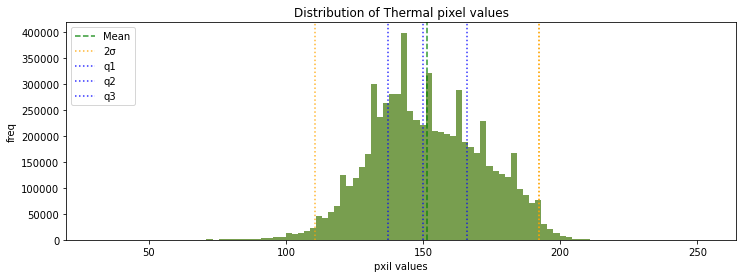

In [12]:
display.display_distributions(data.all_temperature, 
                              filepath = "hist_all_temperature.jpg")

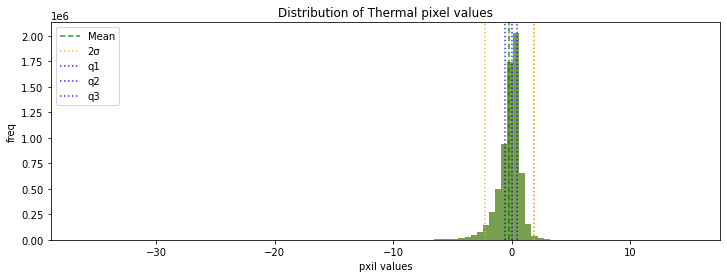

In [13]:
display.display_distributions(data.scaled_all_temperature,
                              filepath = "hist_scaled_all_temperature.jpg")

In [14]:
np.median(data.all_temperature)

150.0

In [15]:
def gamma_correction(x, gamma=1, x_max=None):
    if x_max is None:
        x_max = np.max(x)
    else:
        x_max = x_max
    return np.clip(pow(x / x_max, gamma) * 255.0, 0, 255).astype(int)

温度分布の確認（アレイごと）

In [16]:
from sklearn import preprocessing

No handles with labels found to put in legend.


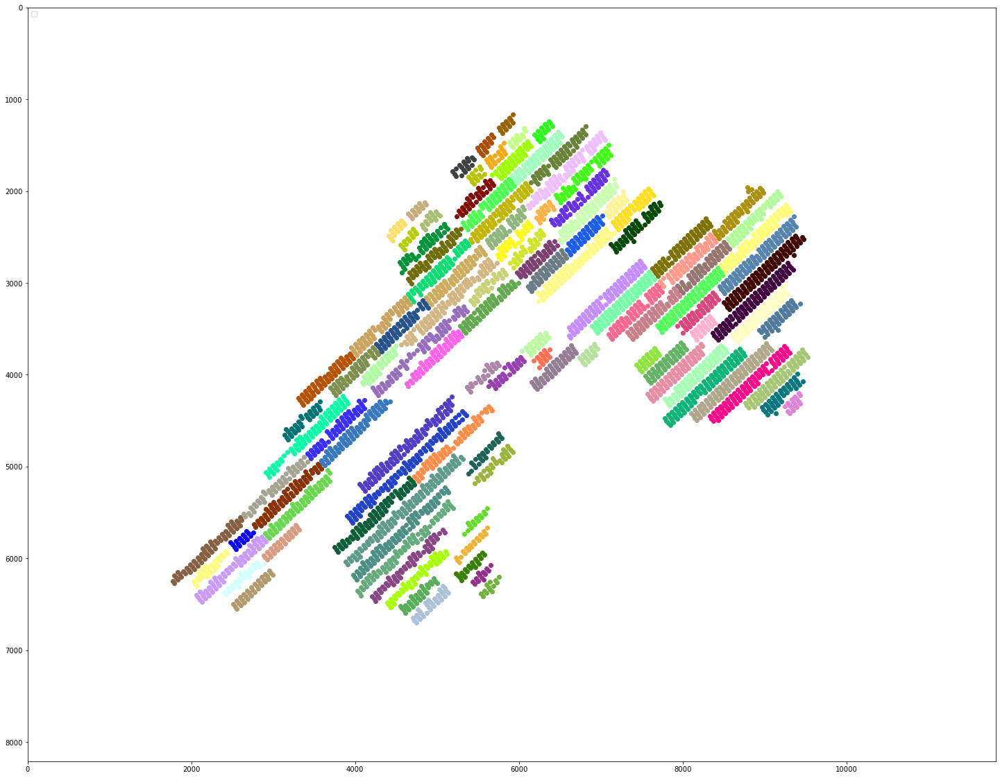

In [17]:
fig, ax = plt.subplots(facecolor="w", figsize=(25,20))
#cmap = plt.get_cmap("tab20")
colors = list(matplotlib.colors.XKCD_COLORS.items())[:max(module_labels)+1]
module_centers = np.array( [c.mean(axis=0) for c in module_contours] )
for i in range(-1,max(module_labels)+1):
    centers = module_centers[module_labels == i]
    plt.scatter(centers[:, 0], centers[:, 1], color=colors[i][1])
#plt.scatter(module_centers[:, 0], module_centers[:, 1], color=cmap(module_labels+1), label=)
ax.legend(loc='upper left')
ax.set_xlim([0, img_org.shape[1]])
ax.set_ylim([img_org.shape[0], 0])
plt.show()

In [18]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest

In [19]:
# This will be implemented in ThermalData class
data_array = {}; 
for c in range(0,max(module_labels)+1):
    print("array:", c)
    print("--> generate array data")
    indices = np.where(module_labels==c)
    np.where(module_labels==c)
    target_thermal_img_files = pd.Series(thermal_img_files).iloc[indices]
    data_array[c] = ThermalData(target_thermal_img_files, scale_type="individual")

array: 0
--> generate array data
array: 1
--> generate array data
array: 2
--> generate array data
array: 3
--> generate array data
array: 4
--> generate array data
array: 5
--> generate array data
array: 6
--> generate array data
array: 7
--> generate array data
array: 8
--> generate array data
array: 9
--> generate array data
array: 10
--> generate array data
array: 11
--> generate array data
array: 12
--> generate array data
array: 13
--> generate array data
array: 14
--> generate array data
array: 15
--> generate array data
array: 16
--> generate array data
array: 17
--> generate array data
array: 18
--> generate array data
array: 19
--> generate array data
array: 20
--> generate array data
array: 21
--> generate array data
array: 22
--> generate array data
array: 23
--> generate array data
array: 24
--> generate array data
array: 25
--> generate array data
array: 26
--> generate array data
array: 27
--> generate array data
array: 28
--> generate array data
array: 29
--> generate a

In [20]:
clustering_method="kmeans"
#clustering_method="xmeans" # not stable
#clustering_method="dbscan"

In [21]:
# clusters temperature 
array_clusters_temperature = {}
for c in range(0,max(module_labels)+1):
    tmp = []
    print("array:", c)
    print("--> generate clusters temperature")
    # -- clustering --
    for k, v in data_array[c].scaled_temperature_with_index.items():
        clusters = clustering.TemperatureClusters(v, method=clustering_method)  
        sliced_data = clusters.get_clusters_data(data_array[c].temperature[k])   
        original_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        tmp.append(original_clusters_temperature)
    array_clusters_temperature[c] = np.vstack(tmp)

array: 0
--> generate clusters temperature
array: 1
--> generate clusters temperature
array: 2
--> generate clusters temperature
array: 3
--> generate clusters temperature
array: 4
--> generate clusters temperature
array: 5
--> generate clusters temperature
array: 6
--> generate clusters temperature
array: 7
--> generate clusters temperature
array: 8
--> generate clusters temperature
array: 9
--> generate clusters temperature
array: 10
--> generate clusters temperature
array: 11
--> generate clusters temperature
array: 12
--> generate clusters temperature
array: 13
--> generate clusters temperature
array: 14
--> generate clusters temperature
array: 15
--> generate clusters temperature
array: 16
--> generate clusters temperature
array: 17
--> generate clusters temperature
array: 18
--> generate clusters temperature
array: 19
--> generate clusters temperature
array: 20
--> generate clusters temperature
array: 21
--> generate clusters temperature
array: 22
--> generate clusters temperatur

In [193]:
from sklearn.preprocessing import MinMaxScaler
array_mean_temperatures = np.array(
    [ data_array[c].all_temperature.mean() for c in range(0,max(module_labels)+1) ]
    #[ np.median(data_array[c].all_temperature) for c in range(0,max(module_labels)+1) ]    
    #[ np.std(data_array[c].all_temperature,ddof=1) for c in range(0,max(module_labels)+1) ]        
).reshape(-1,1)
mscaler = MinMaxScaler([1.0,10.0])
#mscaler = MinMaxScaler([0.0,3.0])
#mscaler = MinMaxScaler([-10.0,10.0])
scaled_array_mean_temperatures = mscaler.fit_transform(array_mean_temperatures)

In [210]:
def add_offset(x):
    #retun x / max(x)
    #return np.exp(x) / np.exp(max(x))
    return np.log(x) / max(np.log(x))    
    #return np.log(x) * (x > 6.0) / max(np.log(x))

In [211]:
x = scaled_array_mean_temperatures
y = add_offset(x)

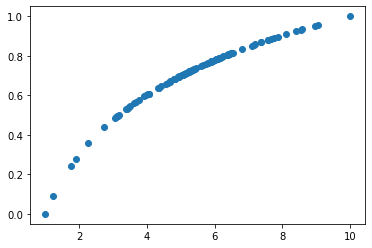

In [212]:
fig = plt.figure(facecolor="w")
plt.scatter(x,y)
plt.show()

In [243]:
# clf models
gamma = 1.5
array_zscaler= {}; array_zscaler_cluster = {}; 
array_lof_normal = {}; array_lof_gamma = {}; 
array_isof_normal = {}; array_isof_gamma = {};
for c in range(0,max(module_labels)+1):
    print("array:", c)
    n_modules = len(data_array[c].temperature)
    # -- Zscaler --
    rscaler = preprocessing.RobustScaler()
    #array_zscaler_cluster[c] = preprocessing.RobustScaler().fit(array_clusters_temperature[c])
    array_zscaler[c] = preprocessing.RobustScaler().fit(
        gamma_correction(data_array[c].all_temperature, gamma=gamma)
    )
    # -- Local Outlier Factor --
    lof_normal = LocalOutlierFactor(n_neighbors=n_modules, contamination="auto", novelty=True)
    lof_gamma = LocalOutlierFactor(n_neighbors=n_modules, contamination="auto", novelty=True)
    array_lof_normal[c] = lof_normal.fit(array_clusters_temperature[c])
    #array_lof_normal[c].offset_ = -1.5 # default: -1.5            
    #array_lof_normal[c].offset_ = -1.5 - 1.0 * scaled_array_mean_temperatures[c]
    array_lof_normal[c].offset_ = -1.5 - 1.0 * y[c] 
    array_lof_gamma[c] = lof_gamma.fit(
        gamma_correction(array_clusters_temperature[c], gamma=gamma)
    )
    #array_lof_gamma[c].offset_ = -1.5 # default: -1.5
    #array_lof_gamma[c].offset_ = -1.5 - 1.0 * scaled_array_mean_temperatures[c]
    array_lof_gamma[c].offset_ = -1.5 - 1.0 * y[c]
    # -- Isolation Forest --
    isof_normal = IsolationForest(contamination="auto")
    isof_gamma = IsolationForest(contamination="auto")
    array_isof_normal[c] = isof_normal.fit(array_clusters_temperature[c])
    #array_isof_normal[c].offset_ = -0.6 # default: -0.5    
    #array_isof_normal[c].offset_ = -0.5 - 0.3 * scaled_array_mean_temperatures[c]
    array_isof_normal[c].offset_ = -0.6 - 0.2 * y[c]
    array_isof_gamma[c] = isof_gamma.fit(
        gamma_correction(array_clusters_temperature[c], gamma=gamma) 
    )                
    #array_isof_gamma[c].offset_ = -0.6 # default: -0.5
    #array_isof_gamma[c].offset_ = -0.5 - 0.3 * scaled_array_mean_temperatures[c]
    array_isof_gamma[c].offset_ = -0.6 - 0.2  * y[c]

array: 0
array: 1
array: 2
array: 3
array: 4
array: 5
array: 6
array: 7
array: 8
array: 9
array: 10
array: 11
array: 12
array: 13
array: 14
array: 15
array: 16
array: 17
array: 18
array: 19
array: 20
array: 21
array: 22
array: 23
array: 24
array: 25
array: 26
array: 27
array: 28
array: 29
array: 30
array: 31
array: 32
array: 33
array: 34
array: 35
array: 36
array: 37
array: 38
array: 39
array: 40
array: 41
array: 42
array: 43
array: 44
array: 45
array: 46
array: 47
array: 48
array: 49
array: 50
array: 51
array: 52
array: 53
array: 54
array: 55
array: 56
array: 57
array: 58
array: 59
array: 60
array: 61
array: 62
array: 63
array: 64
array: 65
array: 66
array: 67
array: 68
array: 69
array: 70
array: 71
array: 72
array: 73
array: 74
array: 75
array: 76
array: 77
array: 78
array: 79
array: 80
array: 81
array: 82
array: 83
array: 84
array: 85
array: 86
array: 87
array: 88
array: 89
array: 90
array: 91
array: 92
array: 93
array: 94
array: 95
array: 96
array: 97
array: 98
array: 99
array: 100

In [166]:
def check_pred_labels(model_normal, model_gamma):
    cmap = plt.get_cmap("tab20")
    for c in range(0,max(module_labels)+1):
        print("array:", c, scaled_array_mean_temperatures[c], model_gamma[c].offset_)
        fig = plt.figure(facecolor="w", figsize=(12,4))
        ax1 = fig.add_subplot(1,2,1)
        ax2 = fig.add_subplot(1,2,2)
        X1 = array_clusters_temperature[c]
        X2 = gamma_correction(array_clusters_temperature[c], gamma=gamma)
        pred1 = model_normal[c].predict(X1)
        pred2 = model_gamma[c].predict(X2)
        ax1.set_title("Normal")
        ax2.set_title("Gamma")
        ax1.scatter(X1[:, 0], X1[:, 1], color=cmap(pred1+1))
        ax2.scatter(X2[:, 0], X2[:, 1], color=cmap(pred2+1))
        plt.show()

array: 0 [5.125] [-2.20969387]


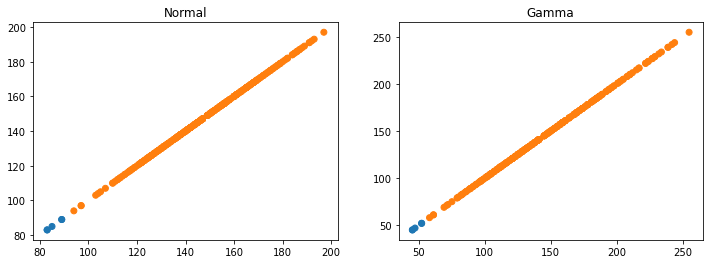

array: 1 [4.75] [-2.17669361]


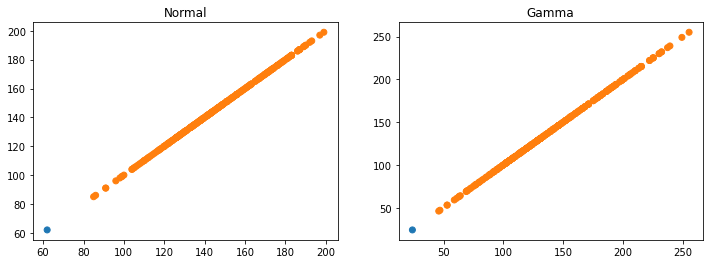

array: 2 [2.875] [-1.95863785]


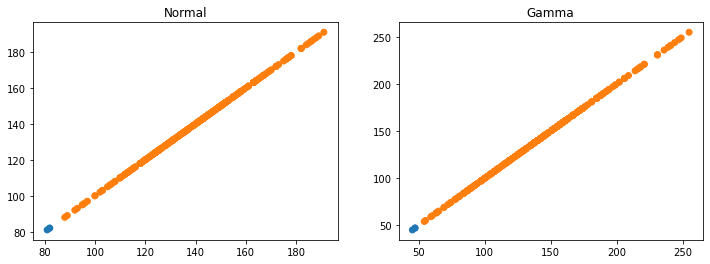

array: 3 [5.125] [-2.20969387]


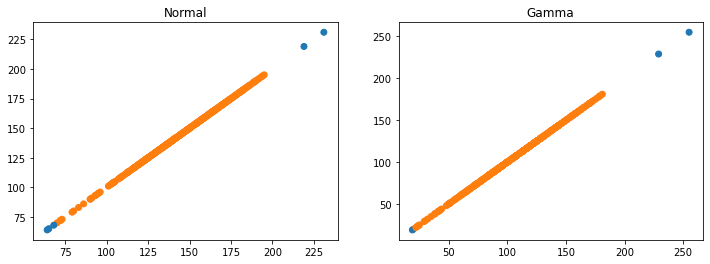

array: 4 [3.625] [-2.05930801]


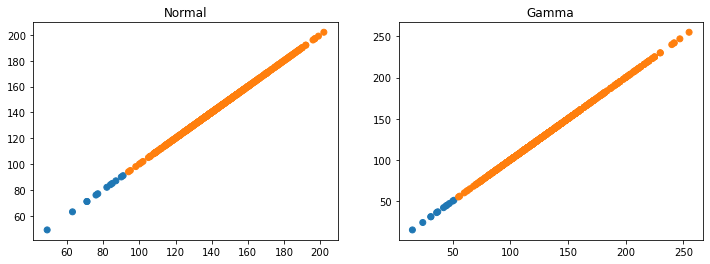

array: 5 [4.375] [-2.14097806]


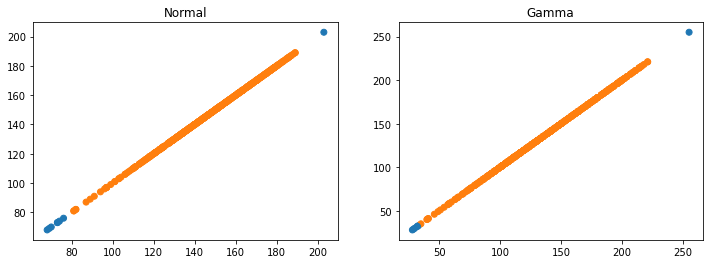

array: 6 [4.375] [-2.14097806]


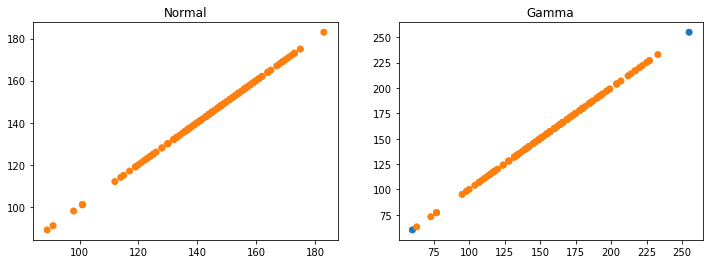

array: 7 [3.25] [-2.01188336]


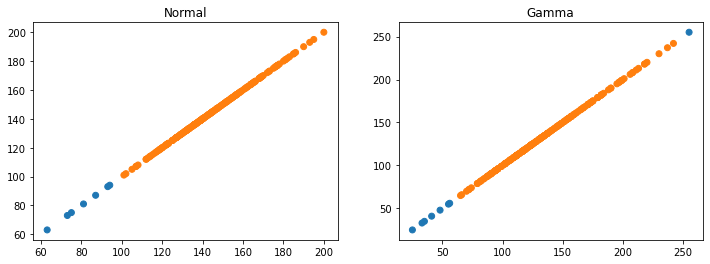

array: 8 [4.] [-2.10205999]


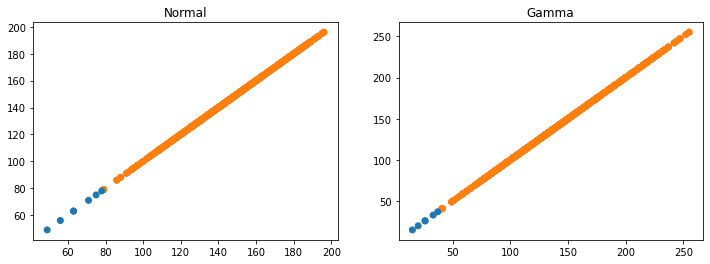

array: 9 [10.] [-2.5]


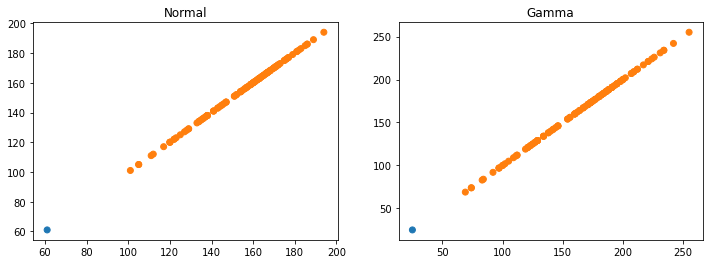

array: 10 [5.5] [-2.24036269]


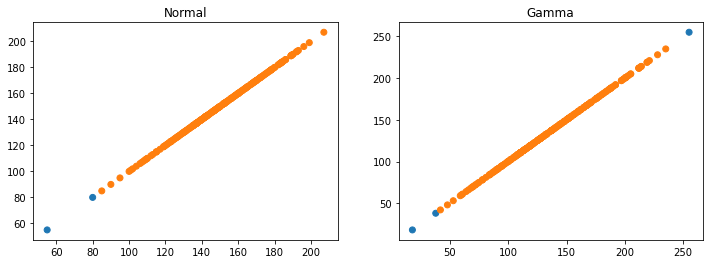

array: 11 [4.] [-2.10205999]


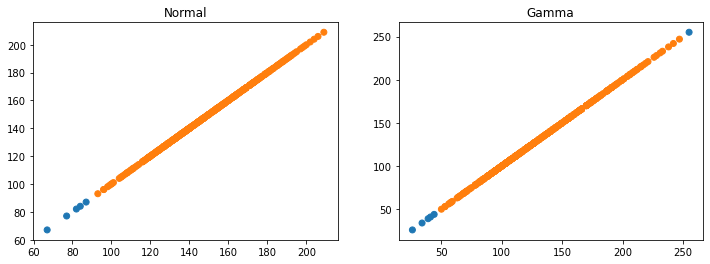

array: 12 [5.125] [-2.20969387]


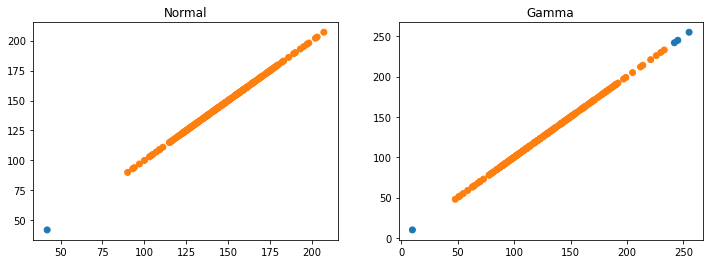

array: 13 [5.875] [-2.26900787]


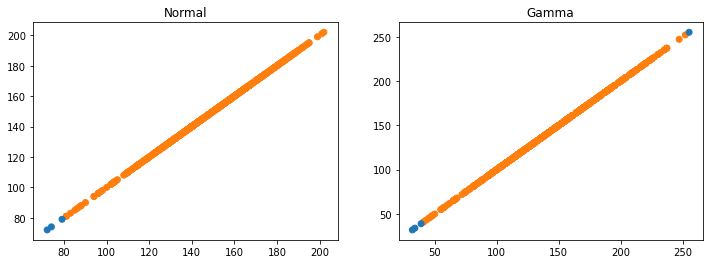

array: 14 [5.5] [-2.24036269]


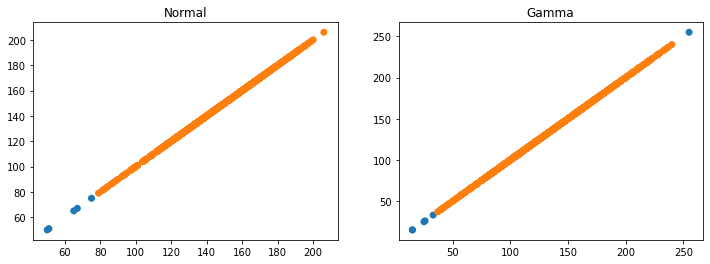

array: 15 [5.5] [-2.24036269]


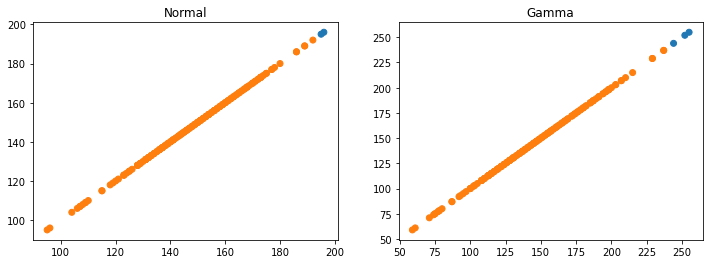

array: 16 [2.125] [-1.82735893]


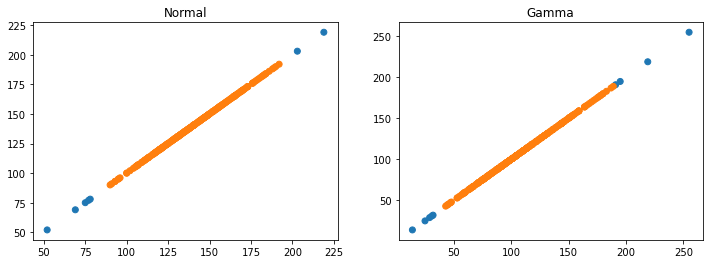

array: 17 [4.] [-2.10205999]


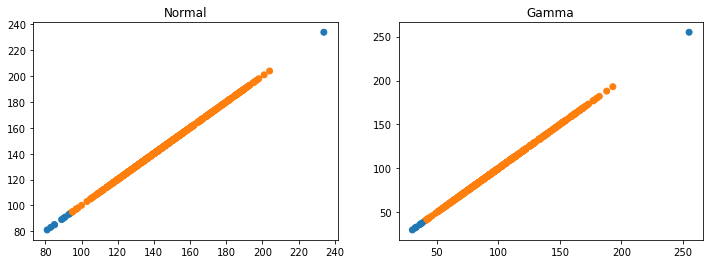

array: 18 [1.] [-1.5]


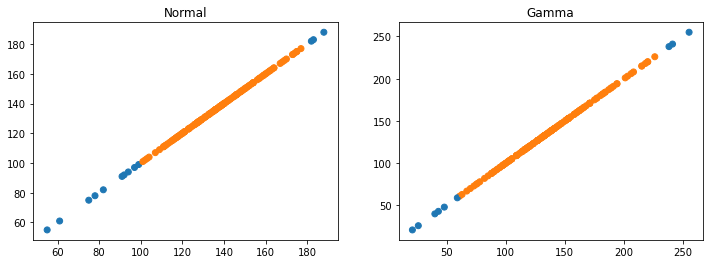

array: 19 [4.75] [-2.17669361]


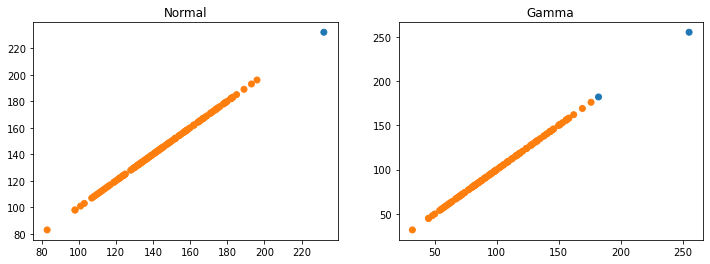

array: 20 [5.5] [-2.24036269]


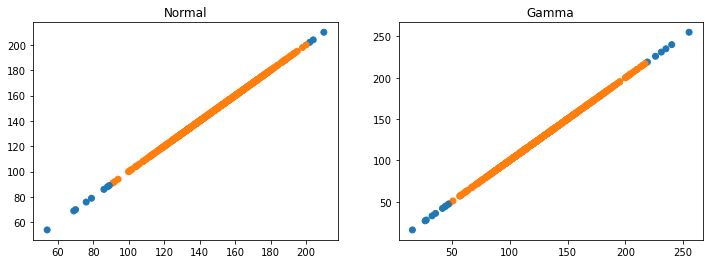

array: 21 [5.875] [-2.26900787]


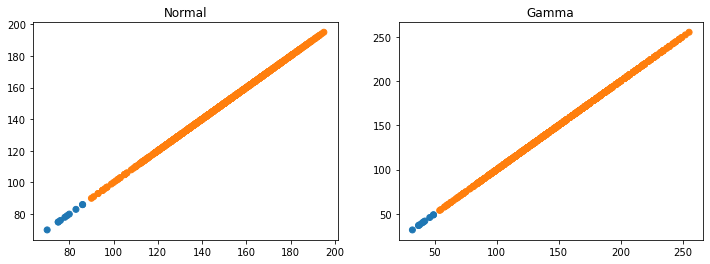

array: 22 [3.25] [-2.01188336]


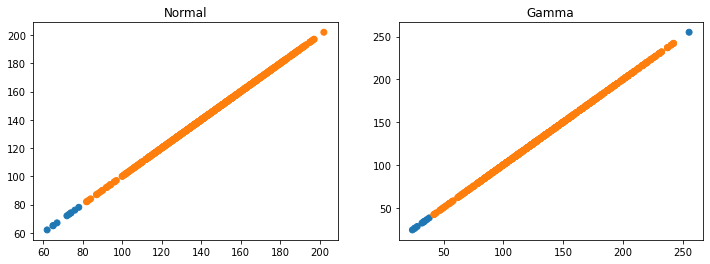

array: 23 [5.875] [-2.26900787]


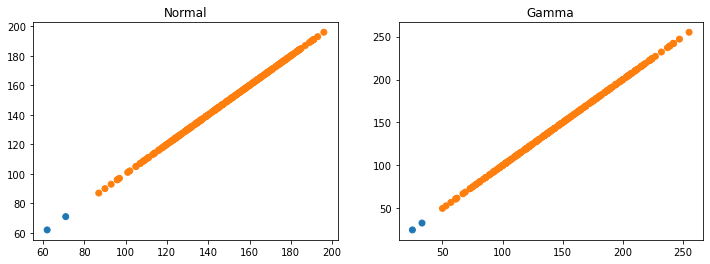

array: 24 [5.125] [-2.20969387]


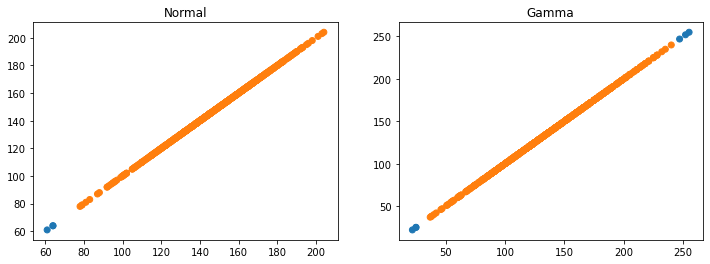

array: 25 [1.375] [-1.6383027]


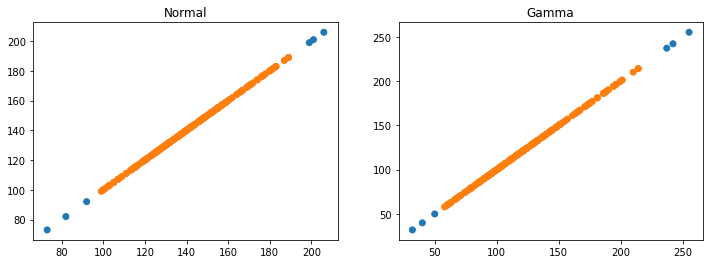

array: 26 [3.25] [-2.01188336]


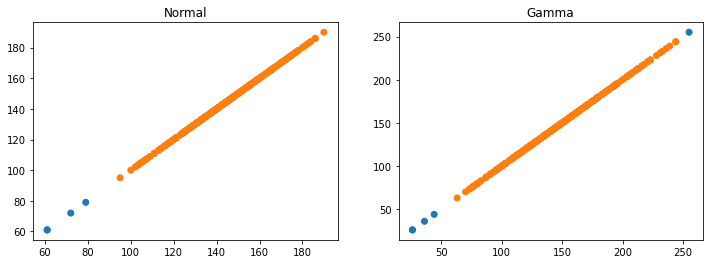

array: 27 [4.375] [-2.14097806]


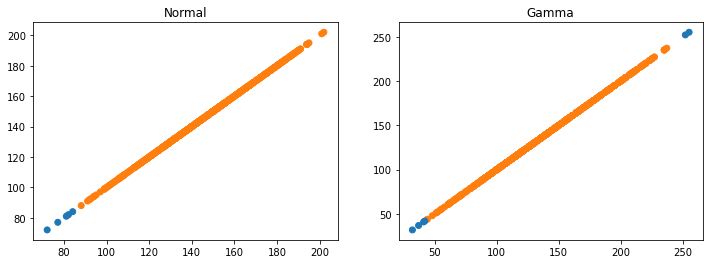

array: 28 [3.625] [-2.05930801]


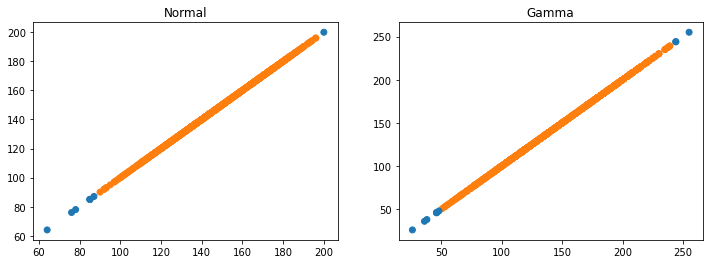

array: 29 [3.625] [-2.05930801]


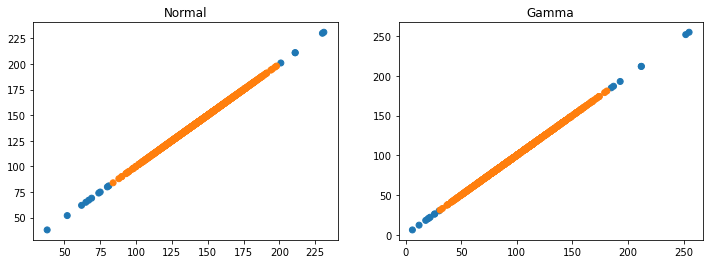

array: 30 [5.125] [-2.20969387]


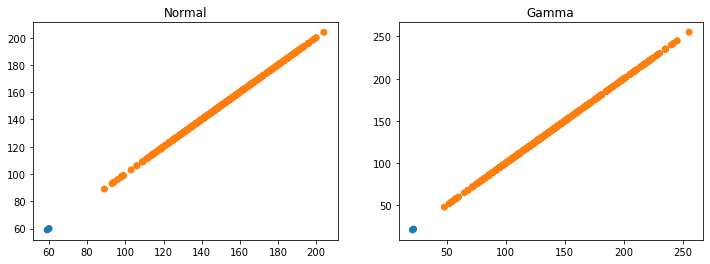

array: 31 [4.75] [-2.17669361]


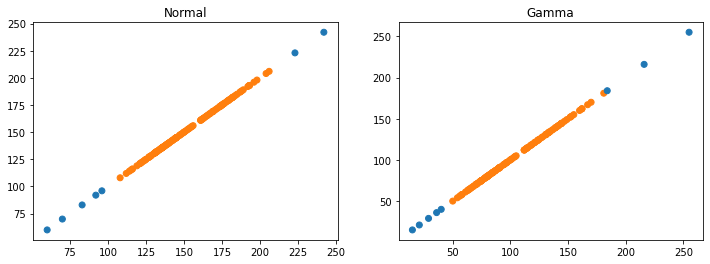

array: 32 [4.] [-2.10205999]


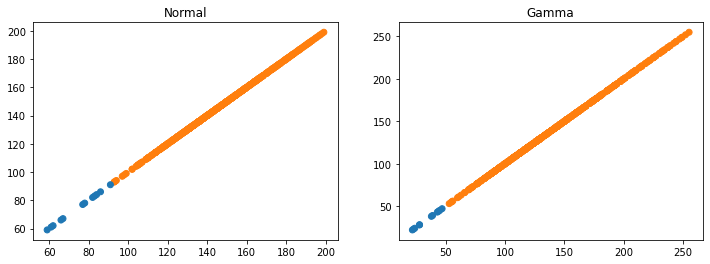

array: 33 [5.875] [-2.26900787]


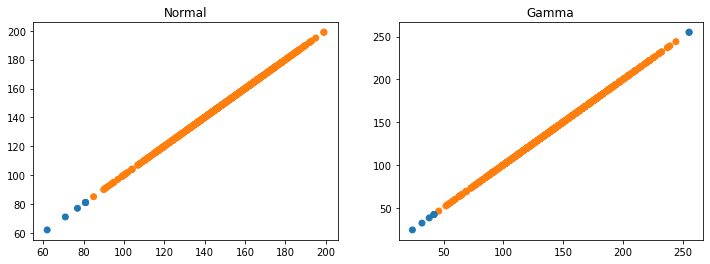

array: 34 [4.75] [-2.17669361]


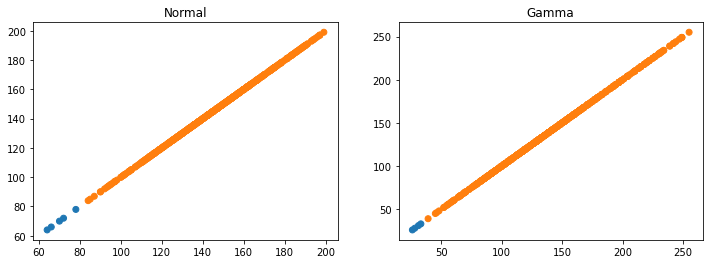

array: 35 [5.875] [-2.26900787]


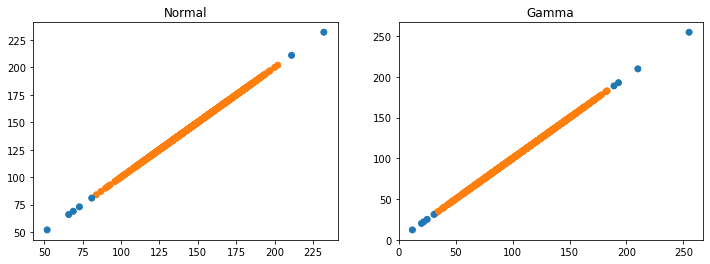

array: 36 [4.75] [-2.17669361]


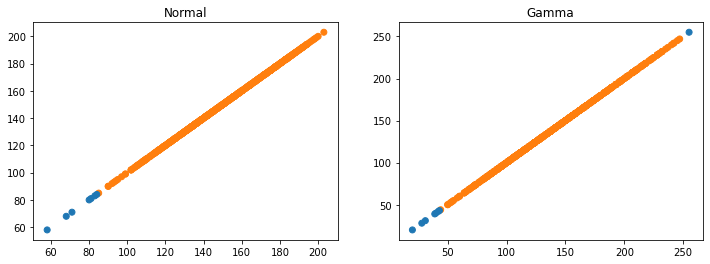

array: 37 [5.5] [-2.24036269]


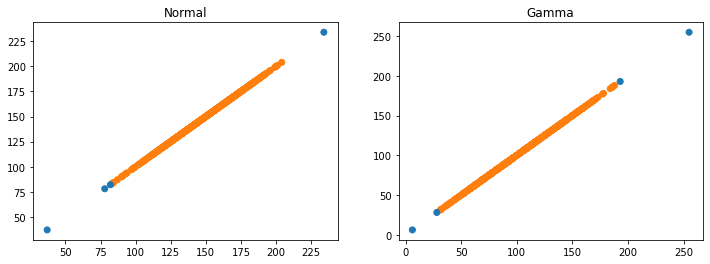

array: 38 [1.375] [-1.6383027]


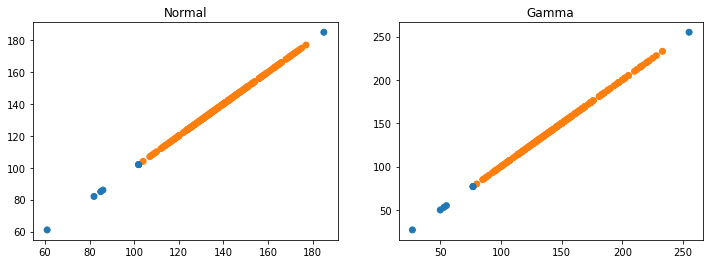

array: 39 [5.875] [-2.26900787]


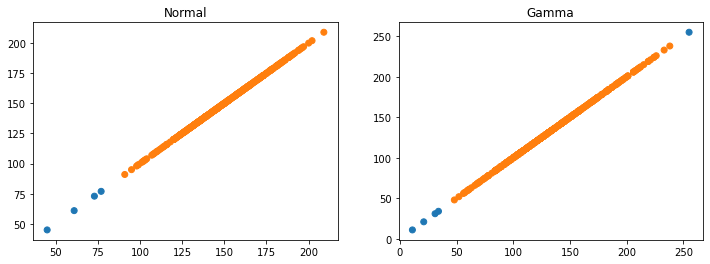

array: 40 [6.25] [-2.29588002]


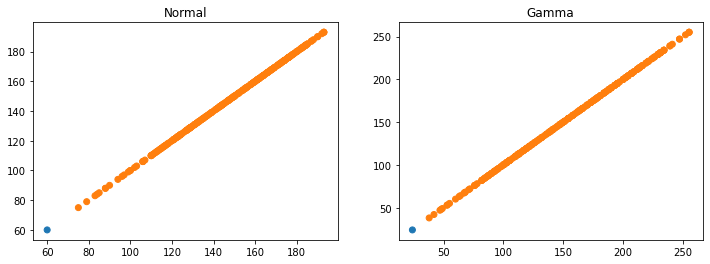

array: 41 [8.125] [-2.40982337]


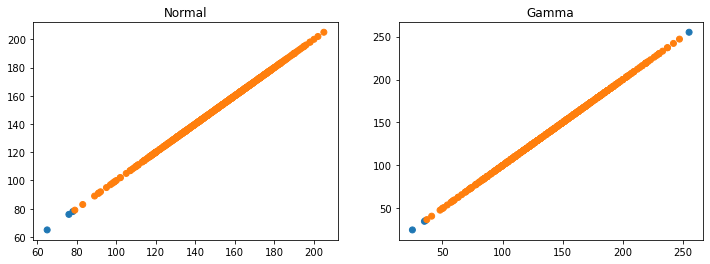

array: 42 [6.25] [-2.29588002]


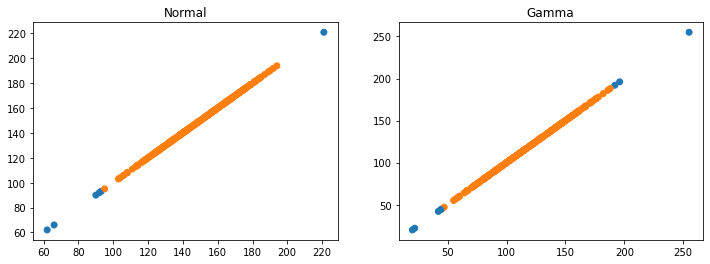

array: 43 [5.875] [-2.26900787]


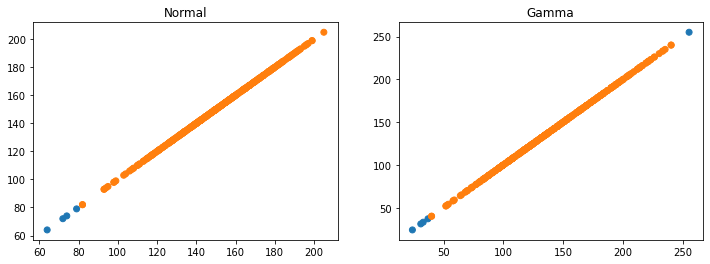

array: 44 [4.75] [-2.17669361]


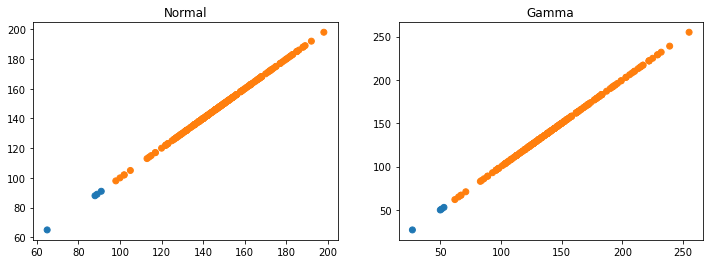

array: 45 [9.625] [-2.48340074]


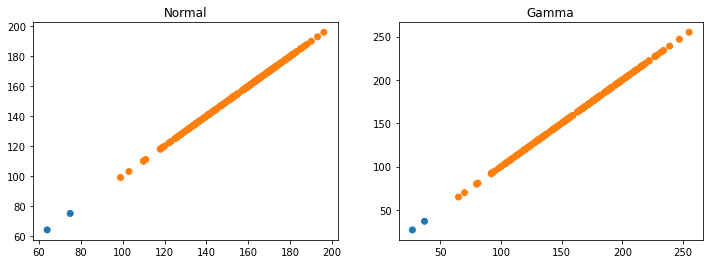

array: 46 [4.375] [-2.14097806]


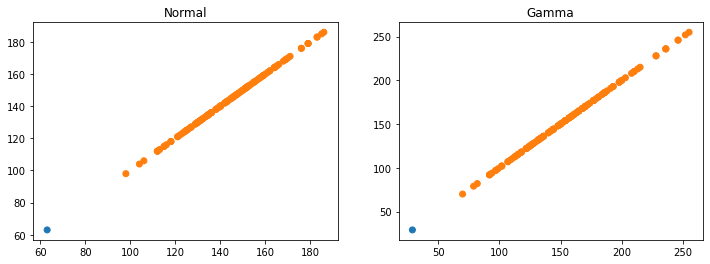

array: 47 [7.375] [-2.36776202]


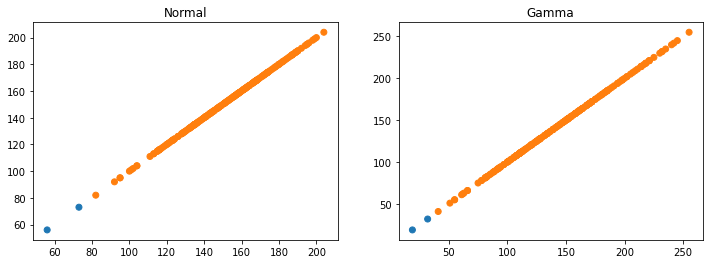

array: 48 [4.375] [-2.14097806]


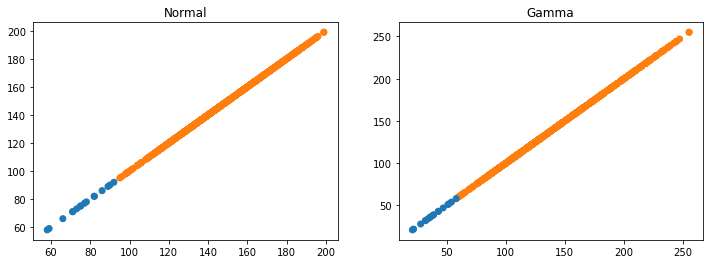

array: 49 [4.] [-2.10205999]


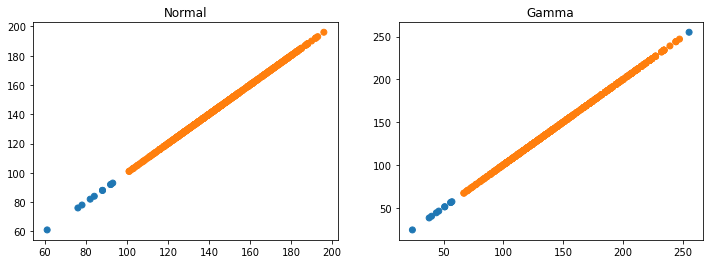

array: 50 [7.375] [-2.36776202]


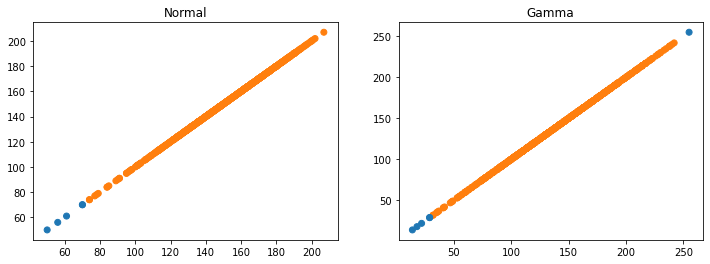

array: 51 [5.5] [-2.24036269]


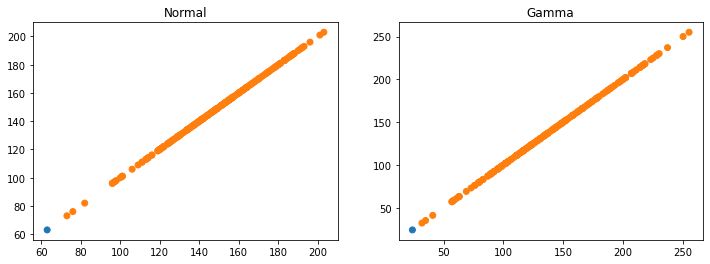

array: 52 [3.25] [-2.01188336]


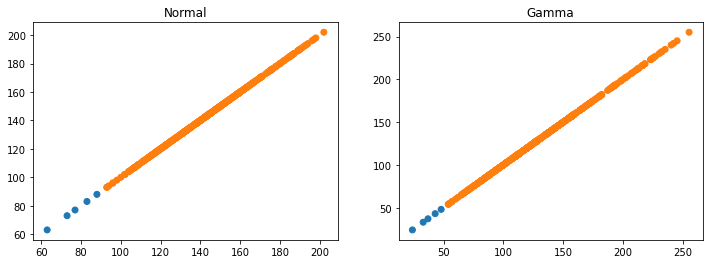

array: 53 [5.125] [-2.20969387]


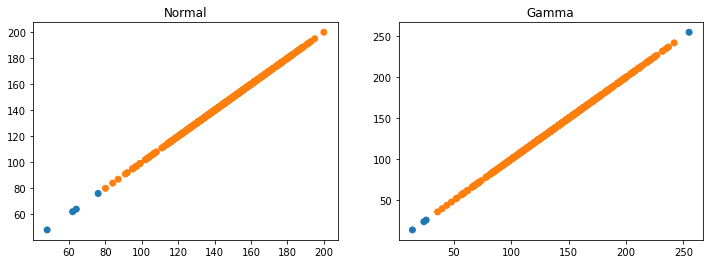

array: 54 [4.75] [-2.17669361]


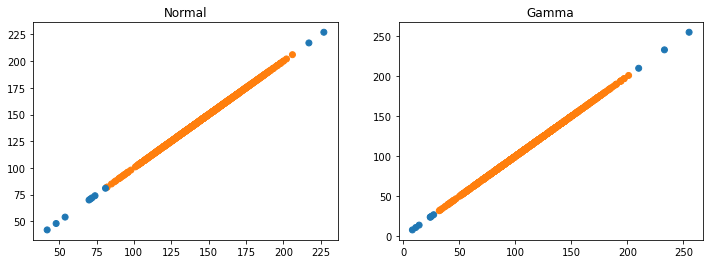

array: 55 [4.75] [-2.17669361]


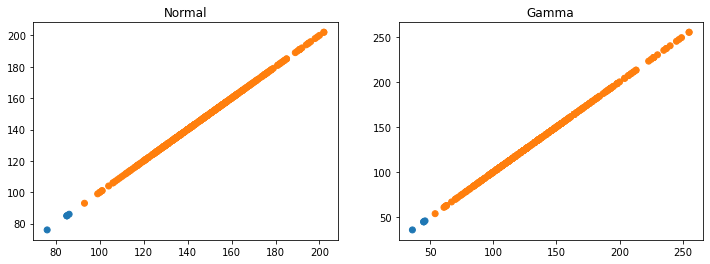

array: 56 [4.375] [-2.14097806]


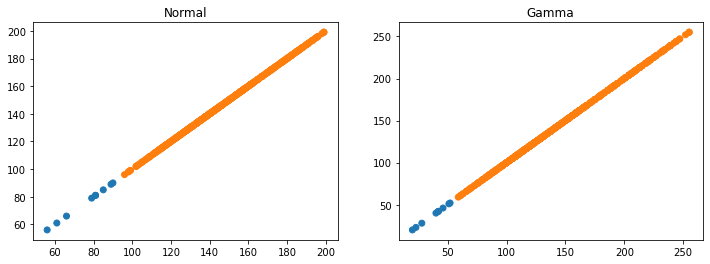

array: 57 [4.375] [-2.14097806]


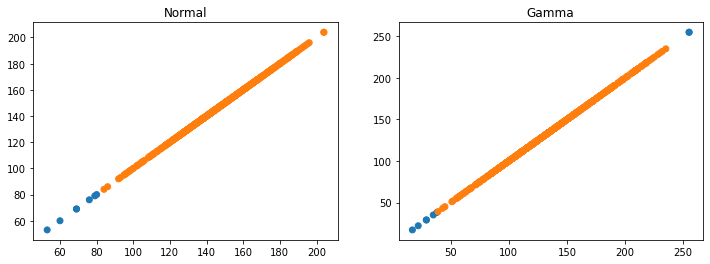

array: 58 [7.] [-2.34509804]


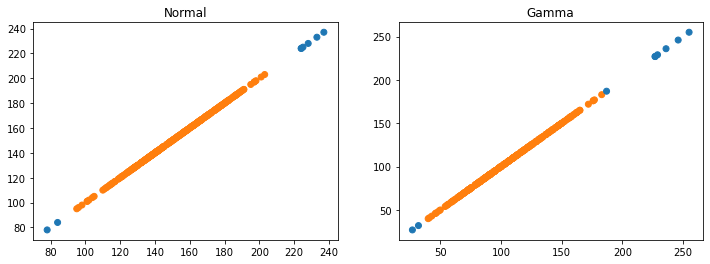

array: 59 [4.75] [-2.17669361]


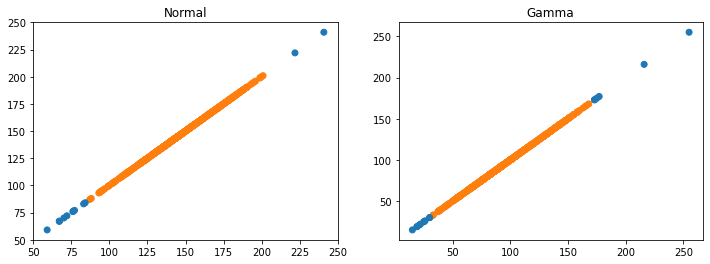

array: 60 [5.5] [-2.24036269]


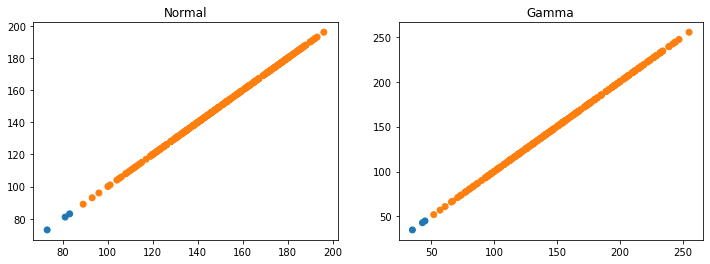

array: 61 [5.5] [-2.24036269]


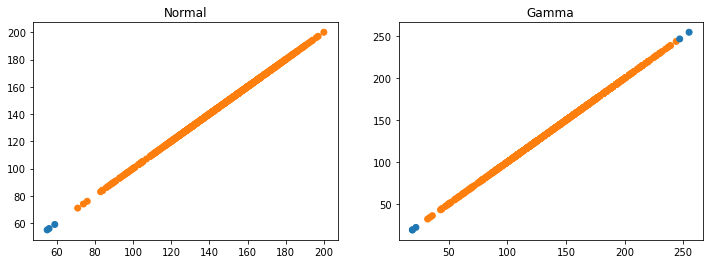

array: 62 [4.375] [-2.14097806]


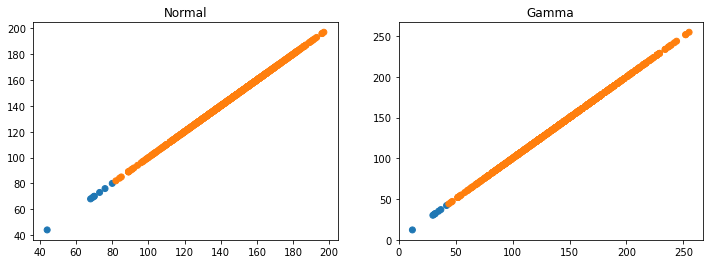

array: 63 [7.375] [-2.36776202]


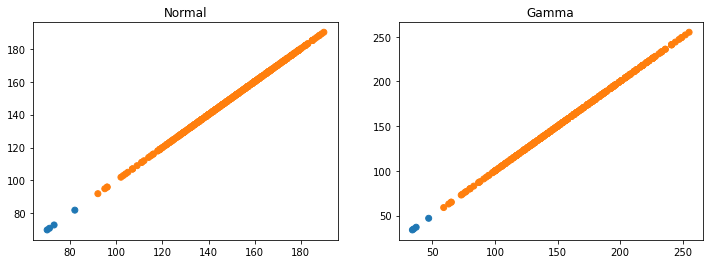

array: 64 [4.] [-2.10205999]


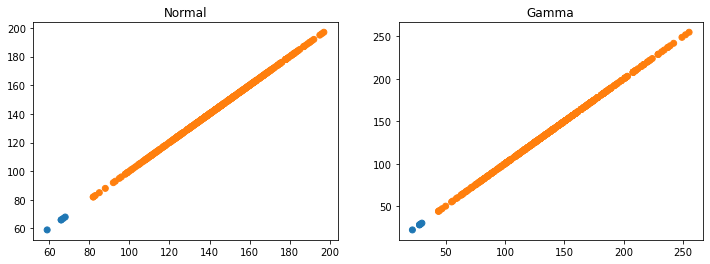

array: 65 [4.] [-2.10205999]


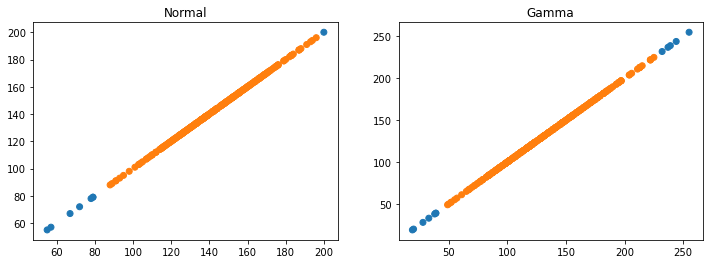

array: 66 [8.125] [-2.40982337]


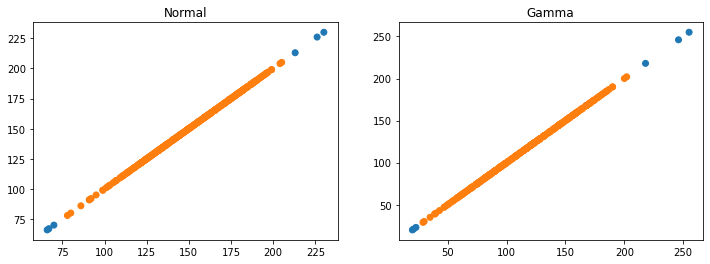

array: 67 [5.5] [-2.24036269]


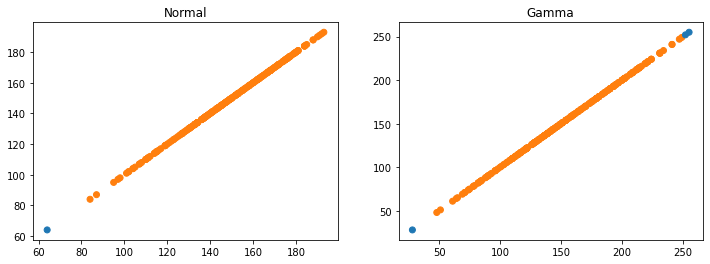

array: 68 [5.875] [-2.26900787]


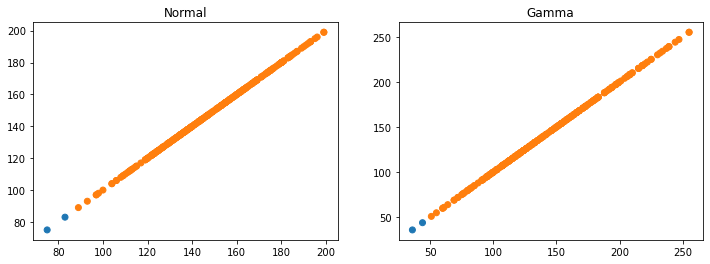

array: 69 [7.375] [-2.36776202]


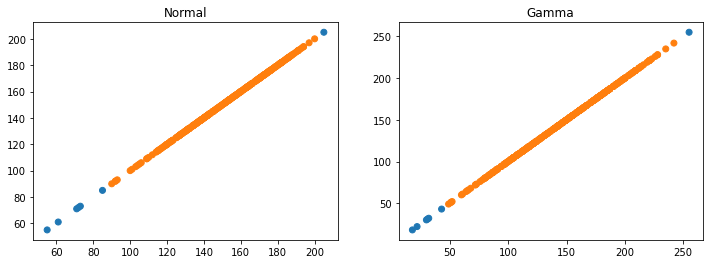

array: 70 [4.75] [-2.17669361]


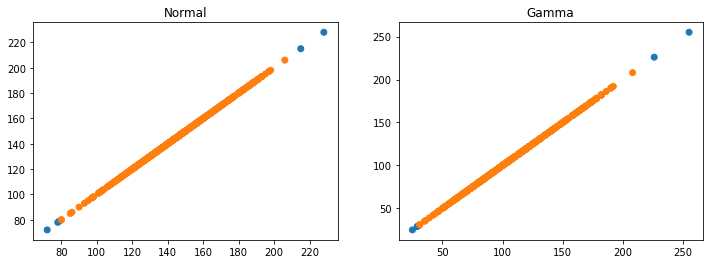

array: 71 [6.25] [-2.29588002]


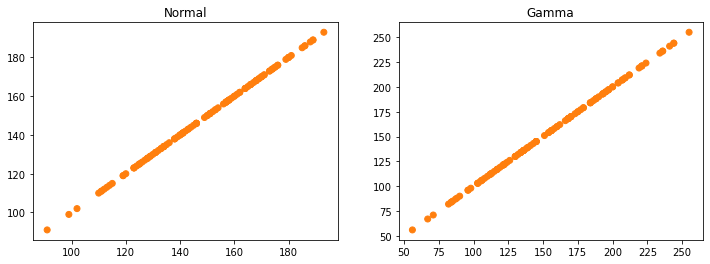

array: 72 [4.] [-2.10205999]


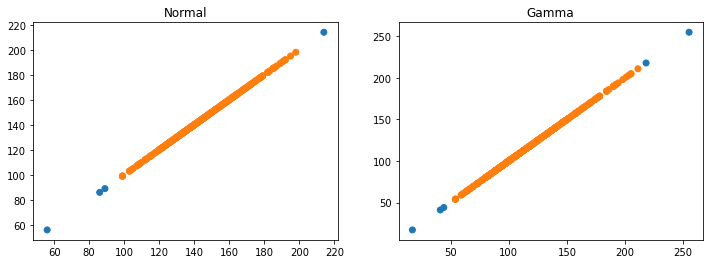

array: 73 [3.625] [-2.05930801]


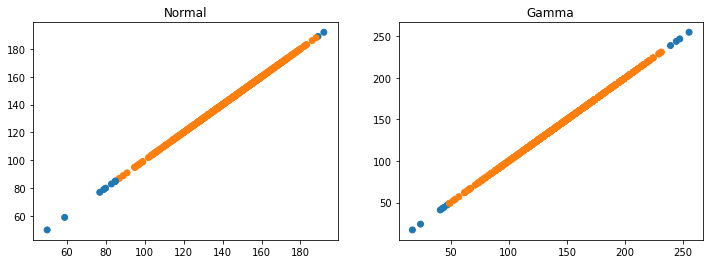

array: 74 [2.125] [-1.82735893]


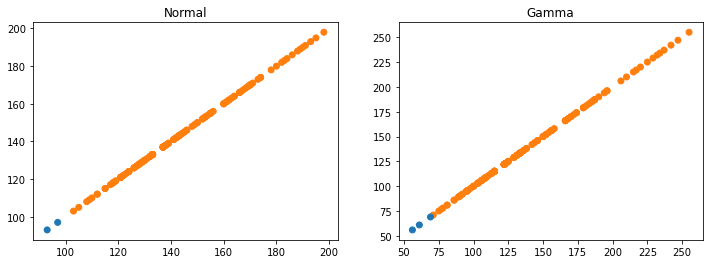

array: 75 [7.75] [-2.3893017]


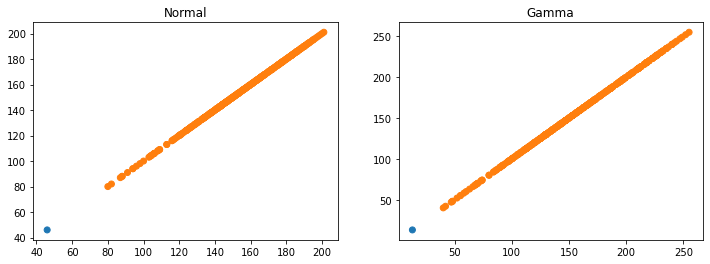

array: 76 [5.5] [-2.24036269]


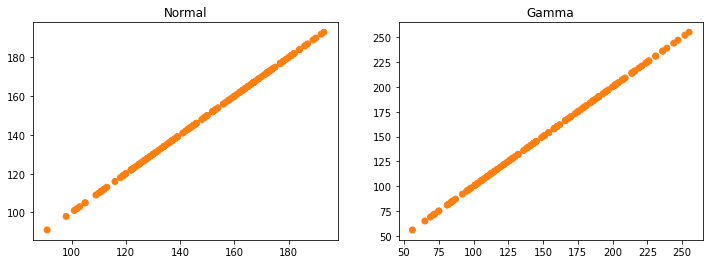

array: 77 [2.5] [-1.89794001]


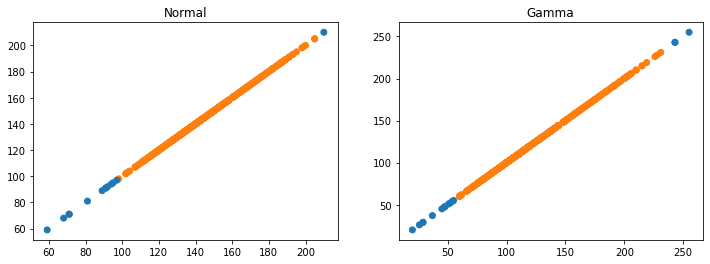

array: 78 [4.] [-2.10205999]


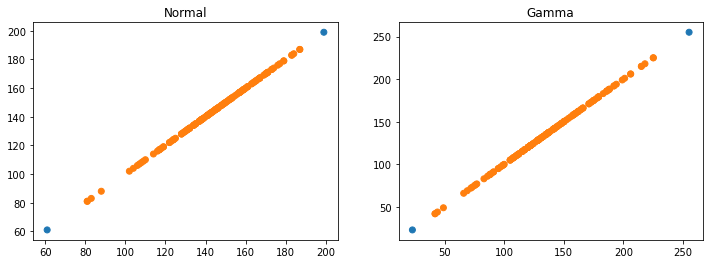

array: 79 [4.375] [-2.14097806]


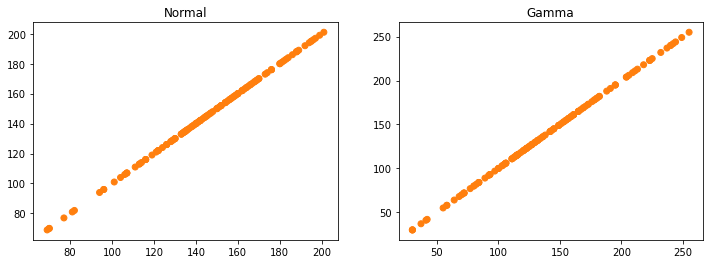

array: 80 [5.875] [-2.26900787]


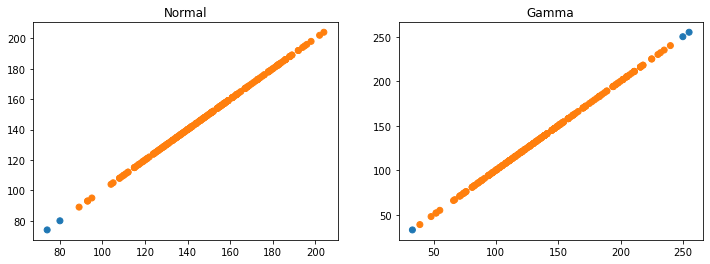

array: 81 [2.875] [-1.95863785]


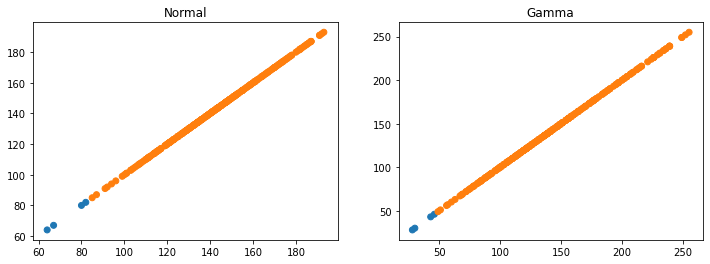

array: 82 [4.] [-2.10205999]


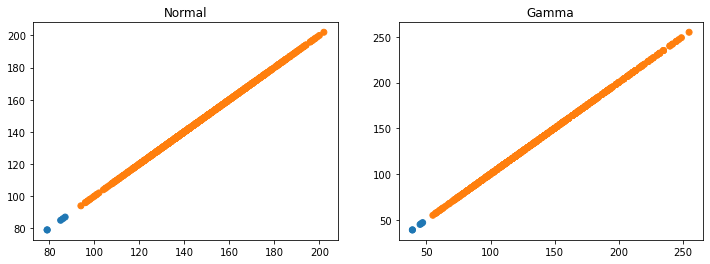

array: 83 [8.5] [-2.42941893]


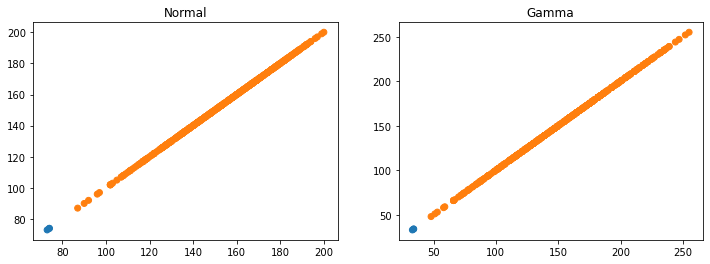

array: 84 [3.625] [-2.05930801]


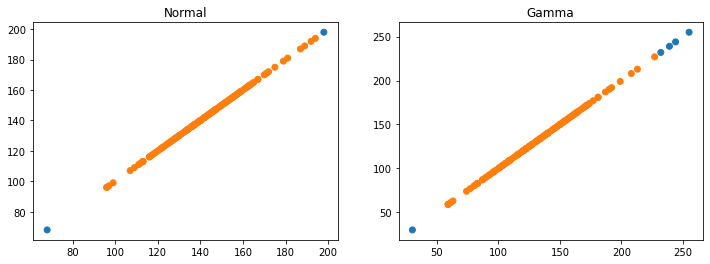

array: 85 [5.875] [-2.26900787]


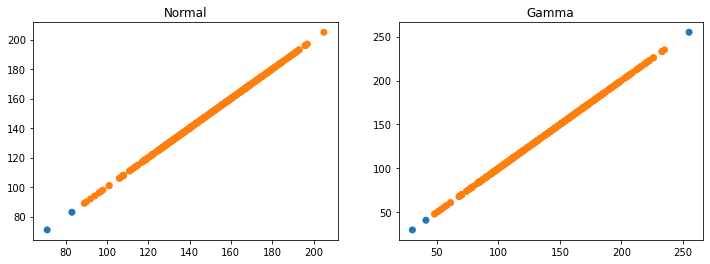

array: 86 [5.875] [-2.26900787]


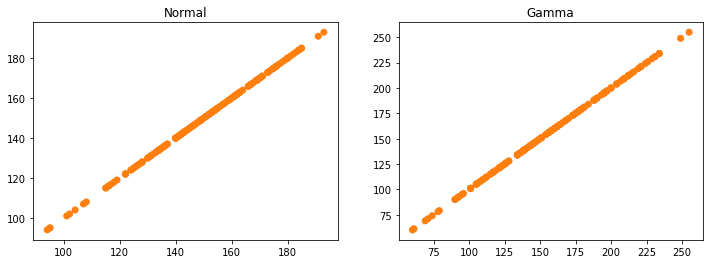

array: 87 [4.375] [-2.14097806]


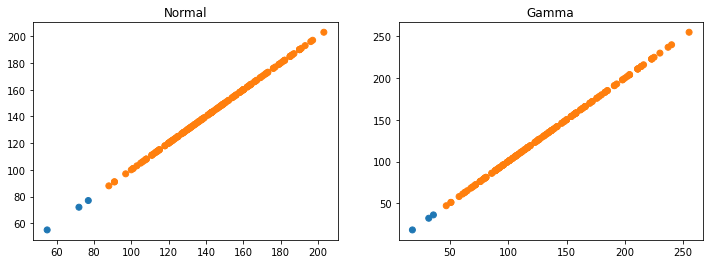

array: 88 [3.625] [-2.05930801]


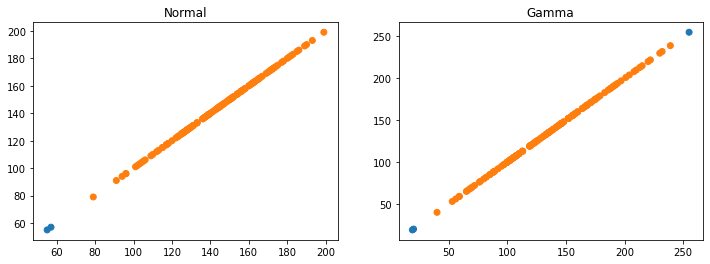

array: 89 [3.625] [-2.05930801]


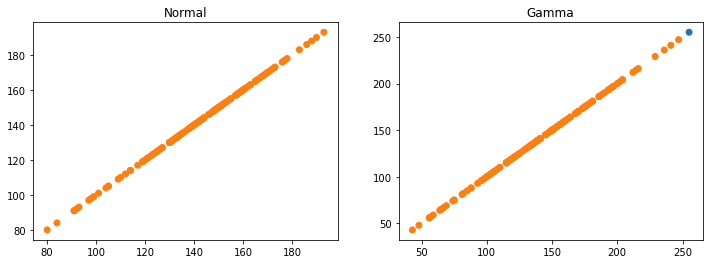

array: 90 [5.125] [-2.20969387]


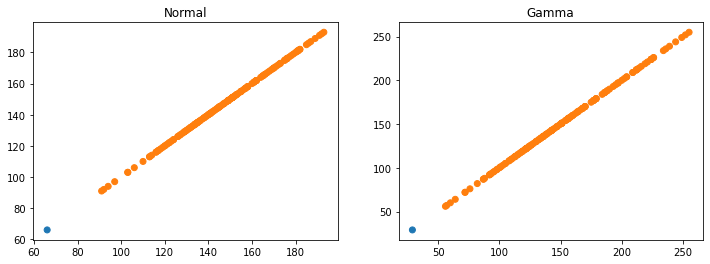

array: 91 [5.125] [-2.20969387]


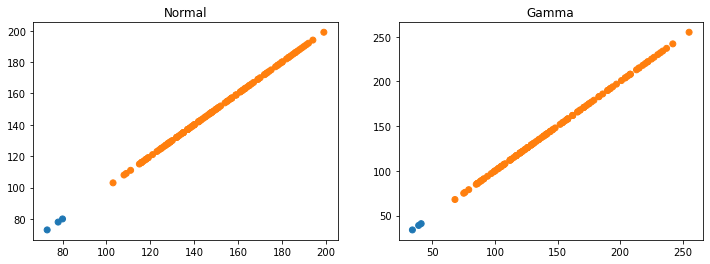

array: 92 [3.25] [-2.01188336]


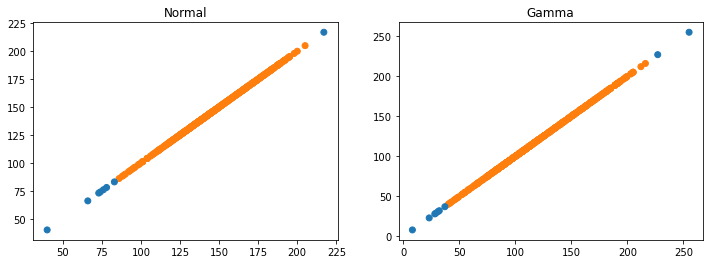

array: 93 [4.375] [-2.14097806]


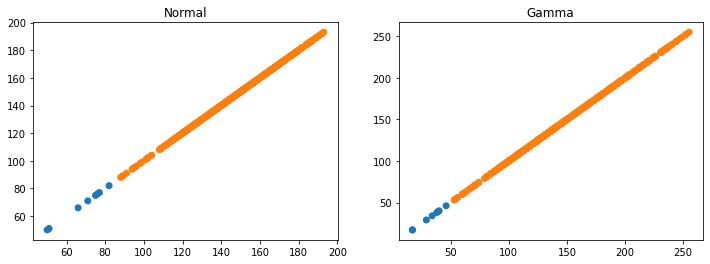

array: 94 [5.5] [-2.24036269]


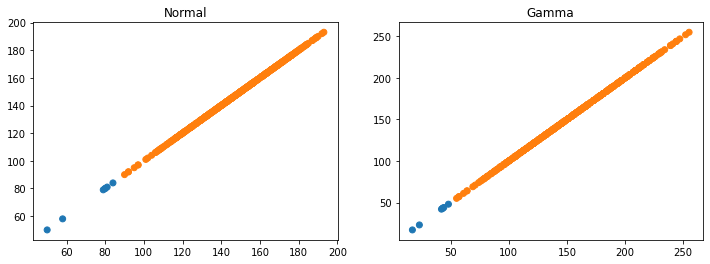

array: 95 [4.375] [-2.14097806]


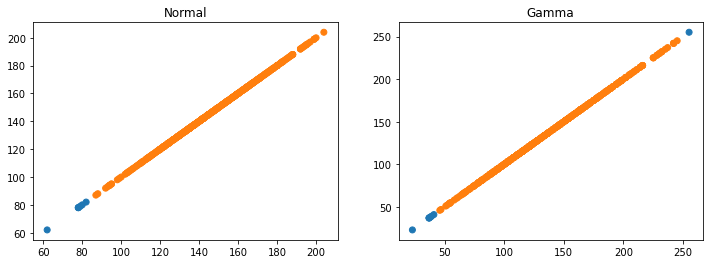

array: 96 [2.875] [-1.95863785]


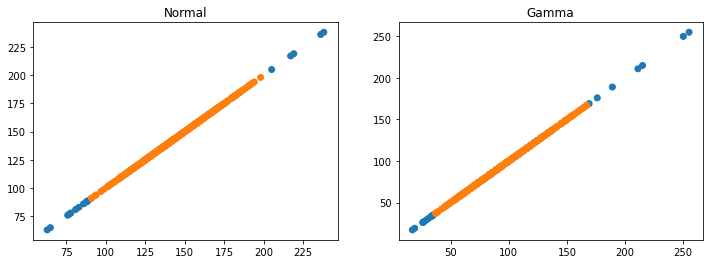

array: 97 [2.875] [-1.95863785]


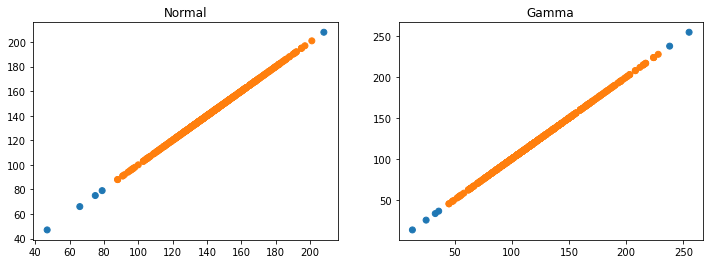

array: 98 [5.125] [-2.20969387]


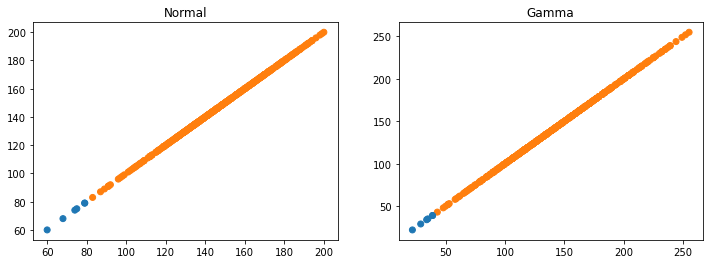

array: 99 [3.625] [-2.05930801]


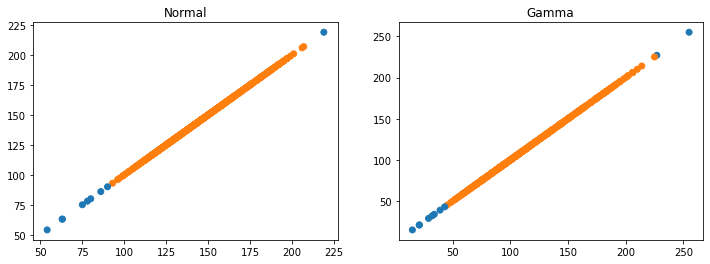

array: 100 [3.625] [-2.05930801]


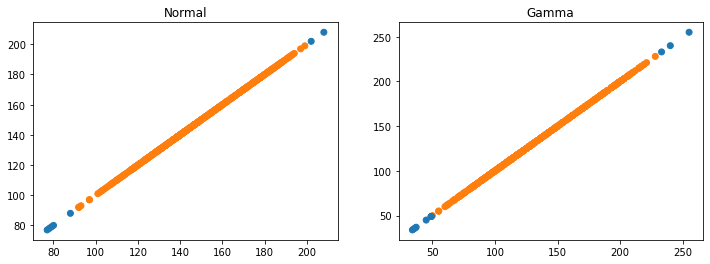

array: 101 [5.875] [-2.26900787]


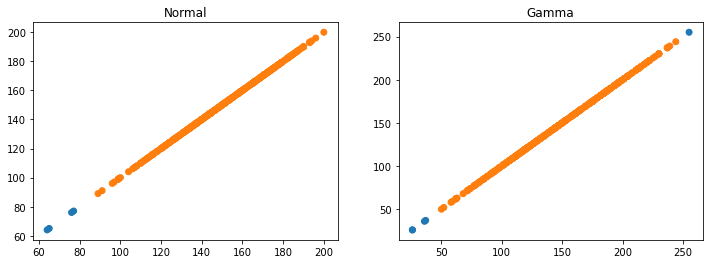

array: 102 [5.5] [-2.24036269]


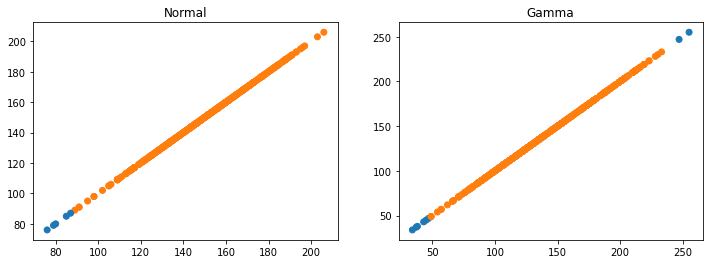

array: 103 [3.625] [-2.05930801]


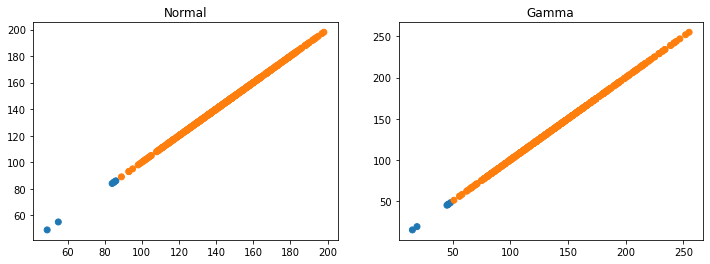

array: 104 [4.] [-2.10205999]


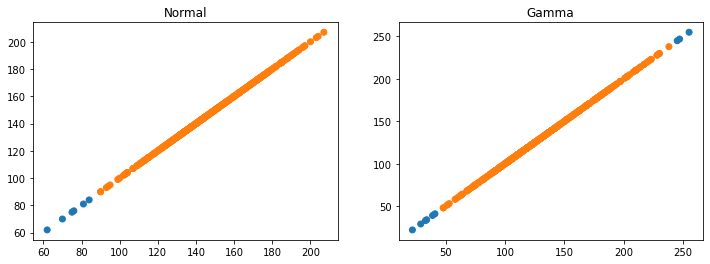

array: 105 [4.75] [-2.17669361]


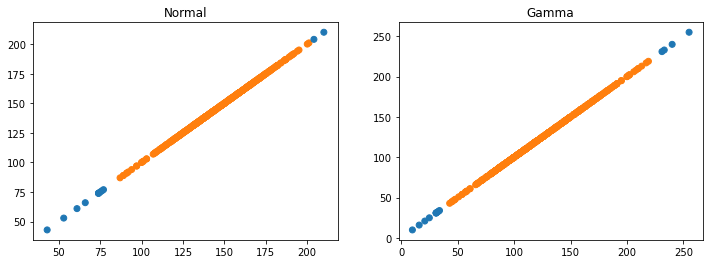

array: 106 [4.375] [-2.14097806]


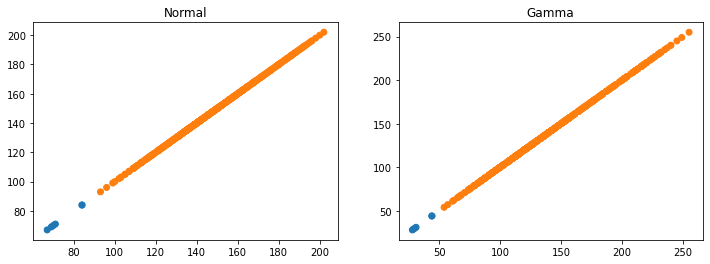

array: 107 [5.125] [-2.20969387]


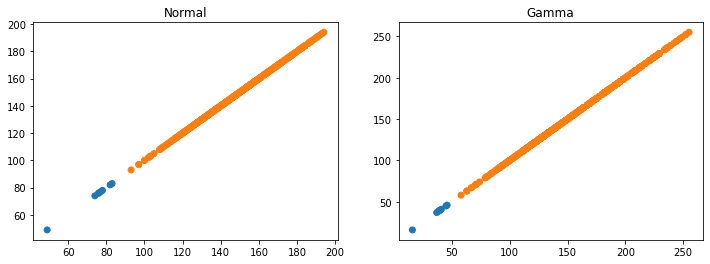

array: 108 [6.25] [-2.29588002]


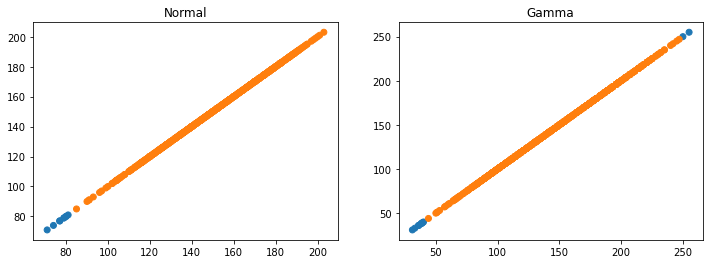

array: 109 [7.] [-2.34509804]


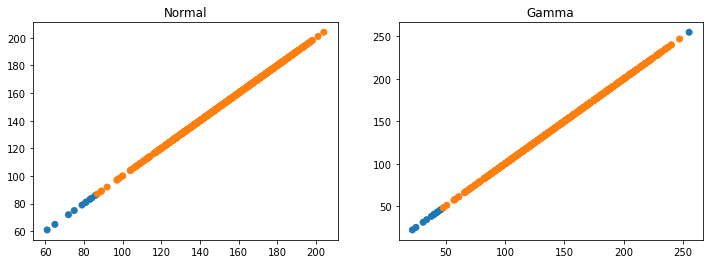

array: 110 [2.5] [-1.89794001]


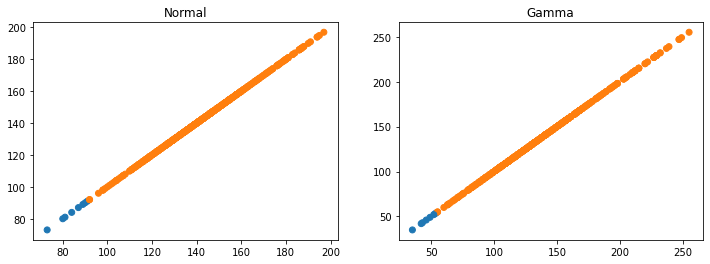

array: 111 [2.875] [-1.95863785]


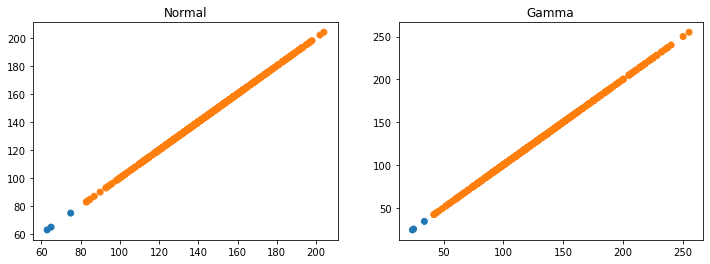

In [167]:
check_pred_labels(array_lof_normal, array_lof_gamma)

array: 0 [5.125] [-0.69193877]


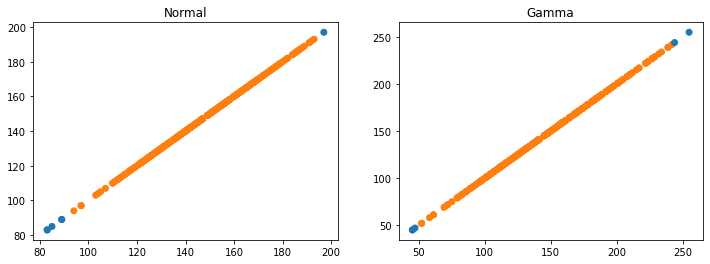

array: 1 [4.75] [-0.68533872]


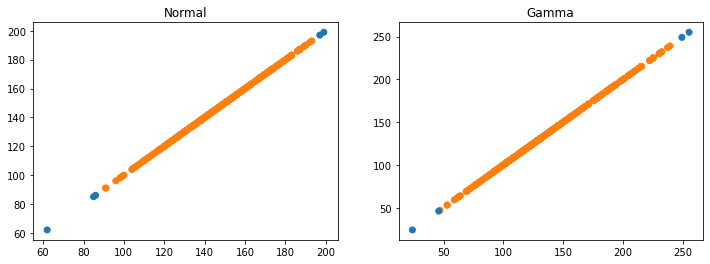

array: 2 [2.875] [-0.64172757]


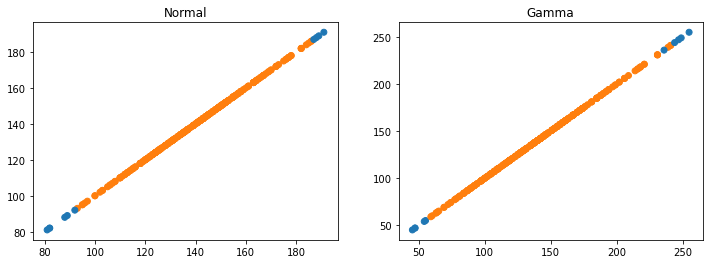

array: 3 [5.125] [-0.69193877]


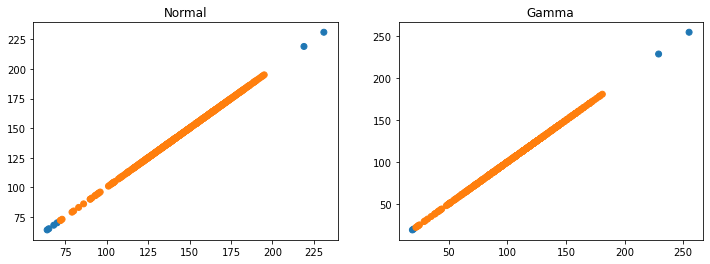

array: 4 [3.625] [-0.6618616]


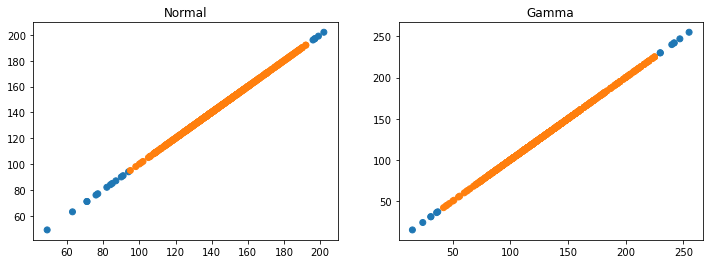

array: 5 [4.375] [-0.67819561]


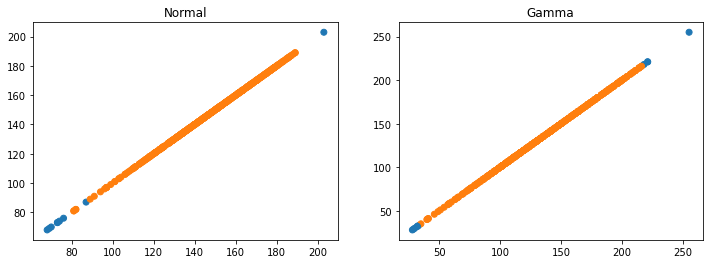

array: 6 [4.375] [-0.67819561]


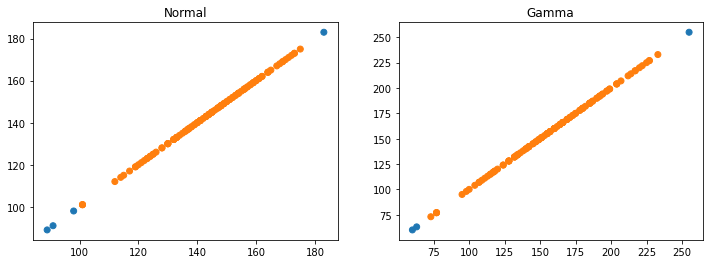

array: 7 [3.25] [-0.65237667]


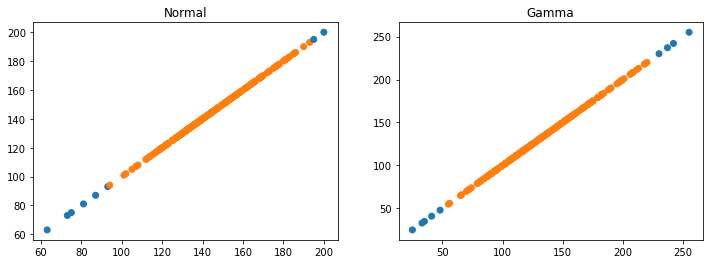

array: 8 [4.] [-0.670412]


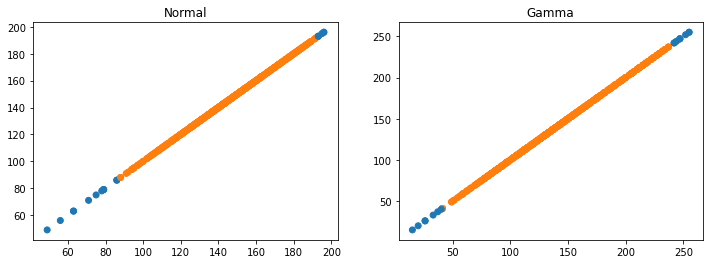

array: 9 [10.] [-0.75]


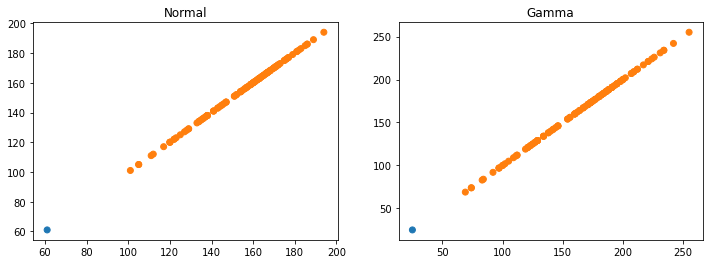

array: 10 [5.5] [-0.69807254]


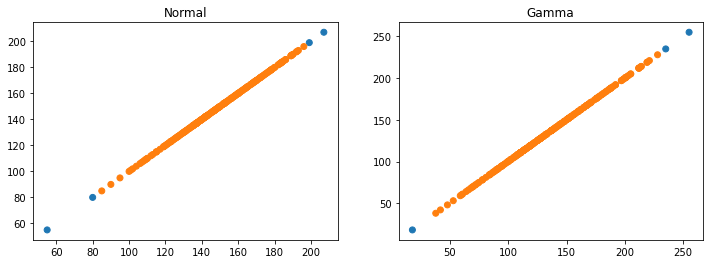

array: 11 [4.] [-0.670412]


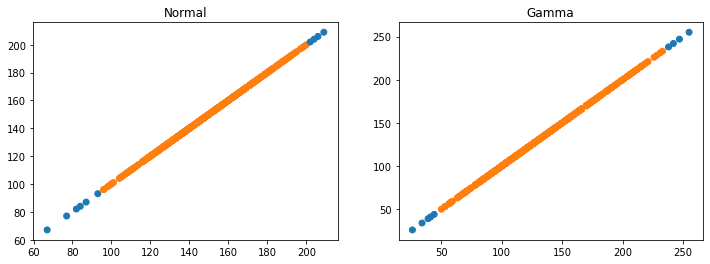

array: 12 [5.125] [-0.69193877]


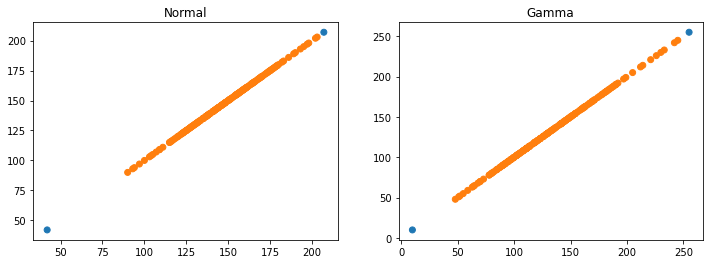

array: 13 [5.875] [-0.70380157]


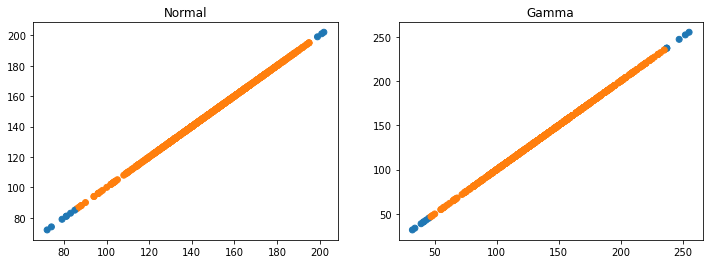

array: 14 [5.5] [-0.69807254]


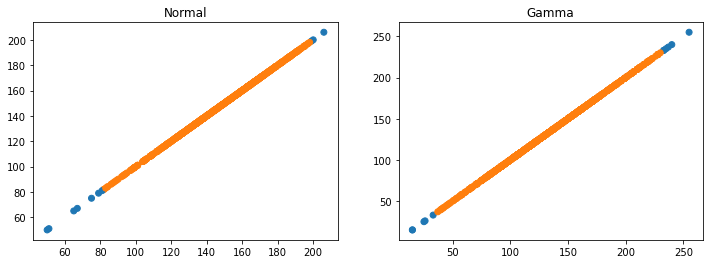

array: 15 [5.5] [-0.69807254]


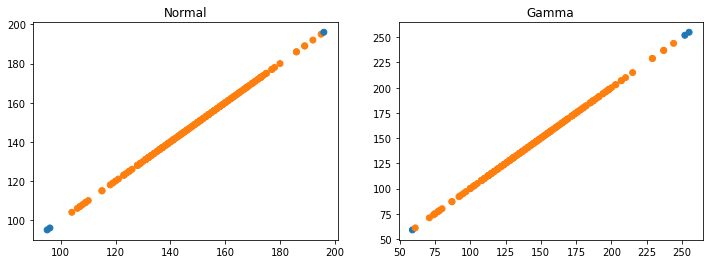

array: 16 [2.125] [-0.61547179]


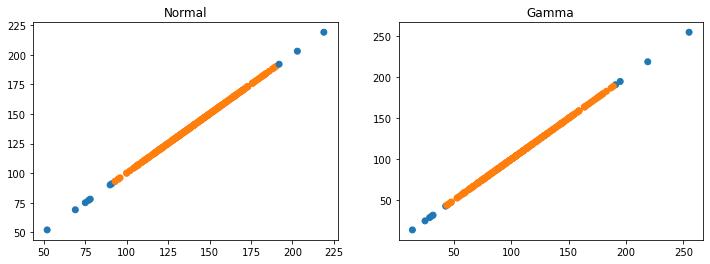

array: 17 [4.] [-0.670412]


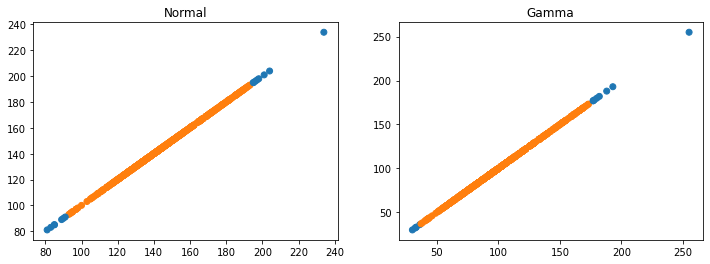

array: 18 [1.] [-0.55]


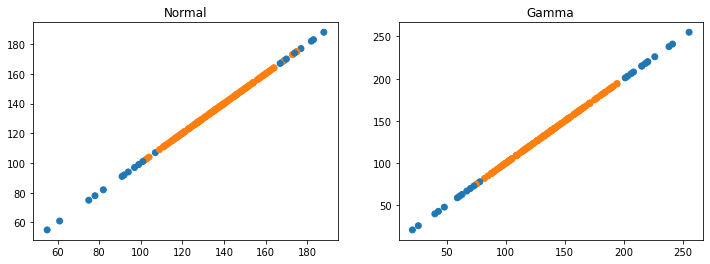

array: 19 [4.75] [-0.68533872]


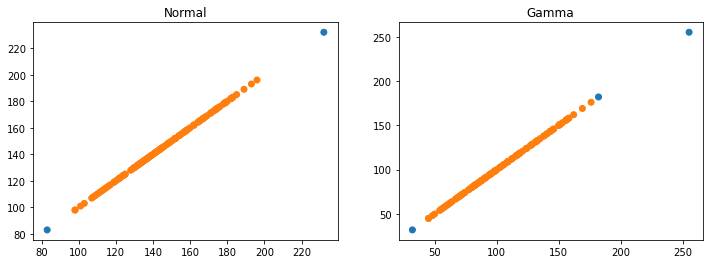

array: 20 [5.5] [-0.69807254]


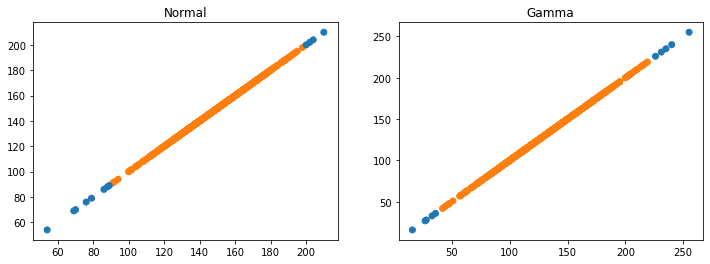

array: 21 [5.875] [-0.70380157]


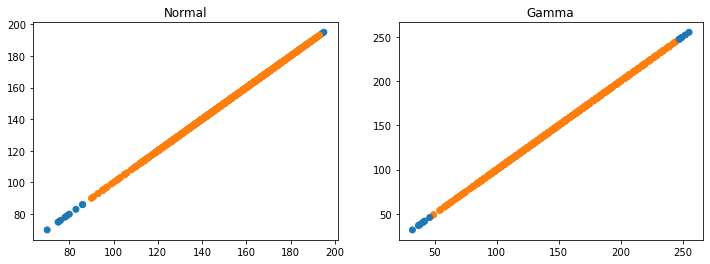

array: 22 [3.25] [-0.65237667]


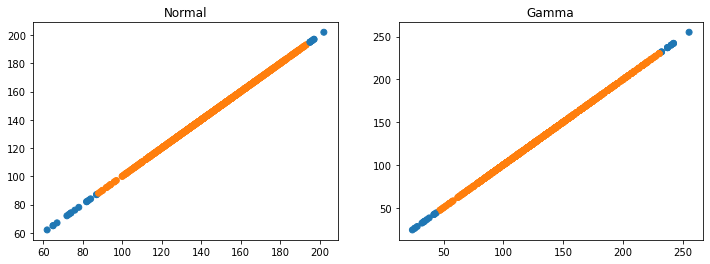

array: 23 [5.875] [-0.70380157]


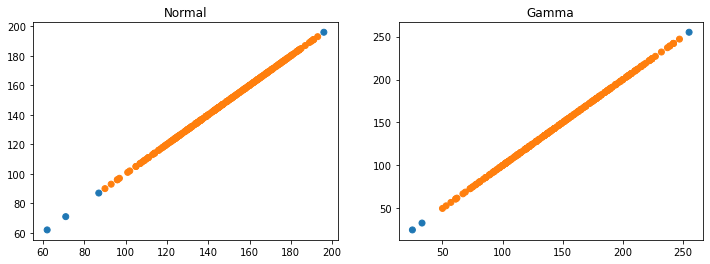

array: 24 [5.125] [-0.69193877]


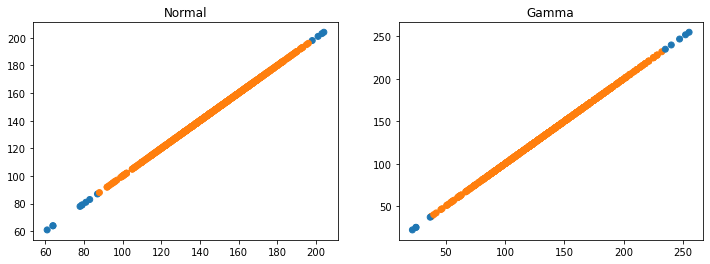

array: 25 [1.375] [-0.57766054]


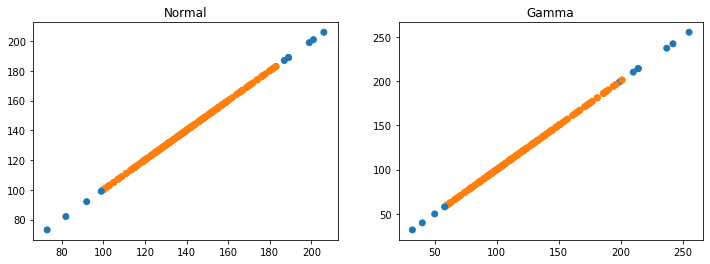

array: 26 [3.25] [-0.65237667]


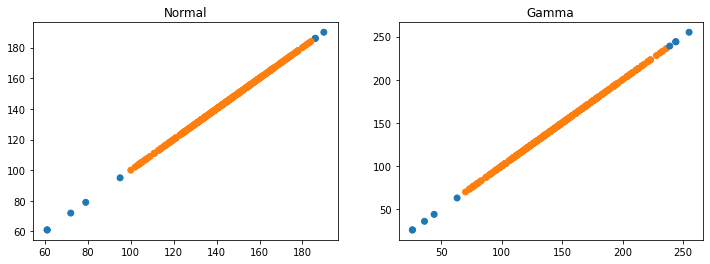

array: 27 [4.375] [-0.67819561]


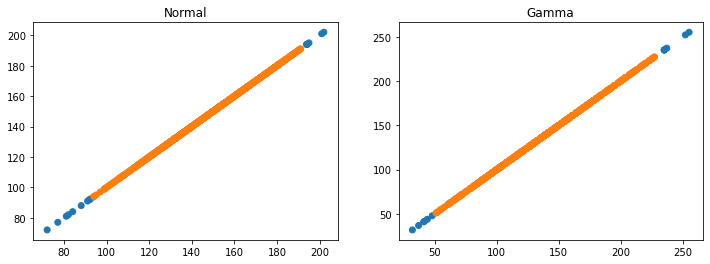

array: 28 [3.625] [-0.6618616]


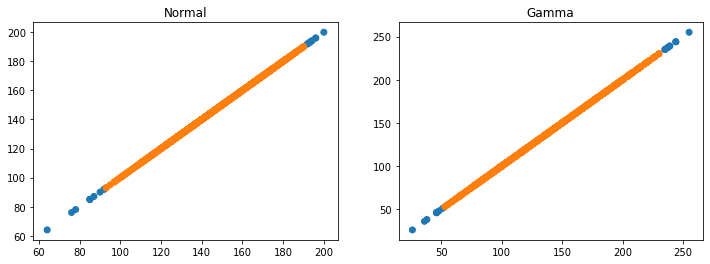

array: 29 [3.625] [-0.6618616]


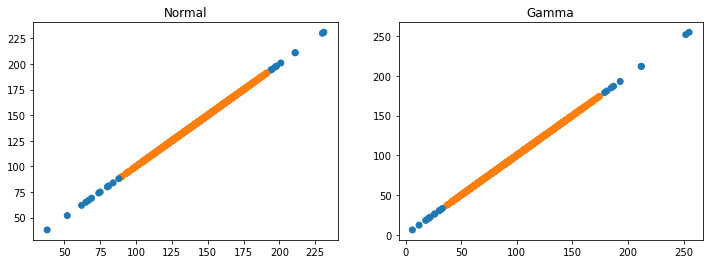

array: 30 [5.125] [-0.69193877]


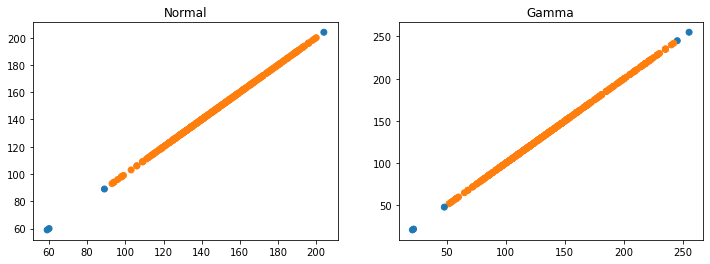

array: 31 [4.75] [-0.68533872]


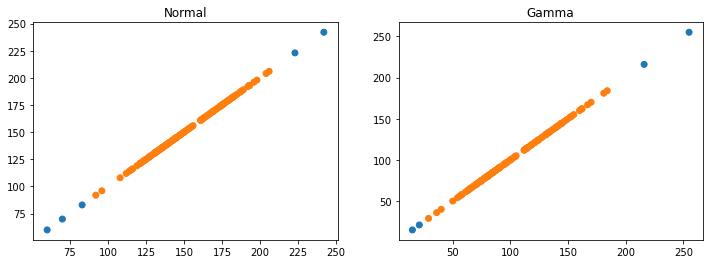

array: 32 [4.] [-0.670412]


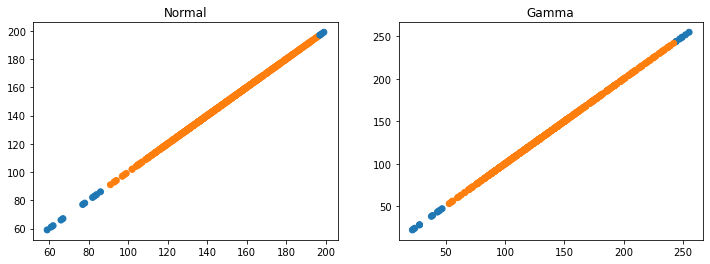

array: 33 [5.875] [-0.70380157]


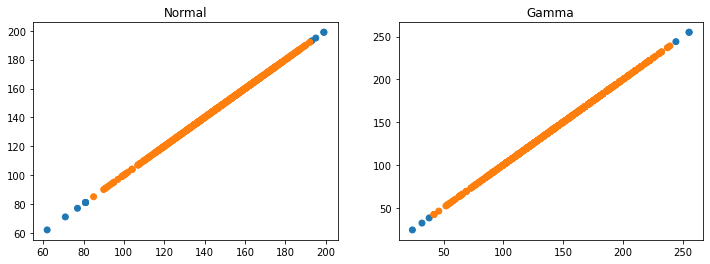

array: 34 [4.75] [-0.68533872]


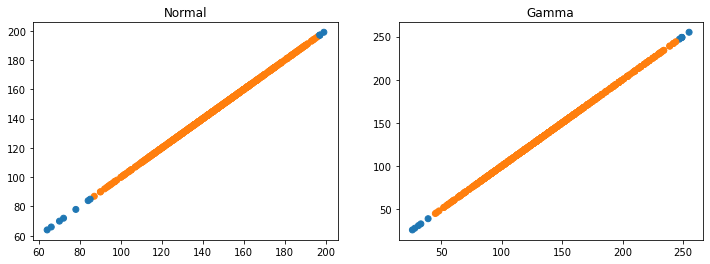

array: 35 [5.875] [-0.70380157]


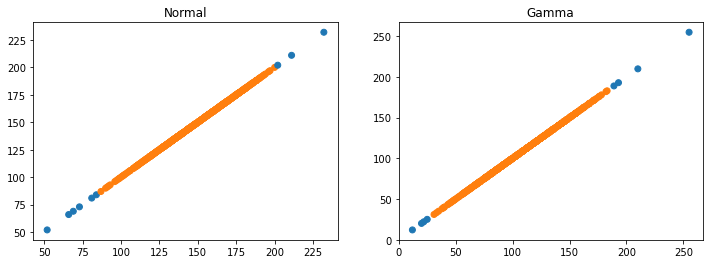

array: 36 [4.75] [-0.68533872]


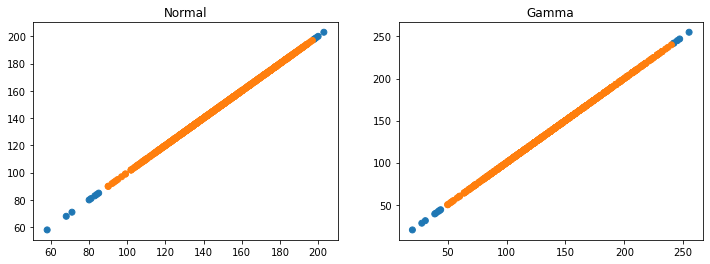

array: 37 [5.5] [-0.69807254]


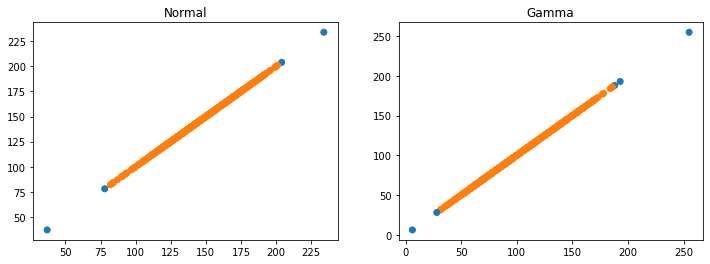

array: 38 [1.375] [-0.57766054]


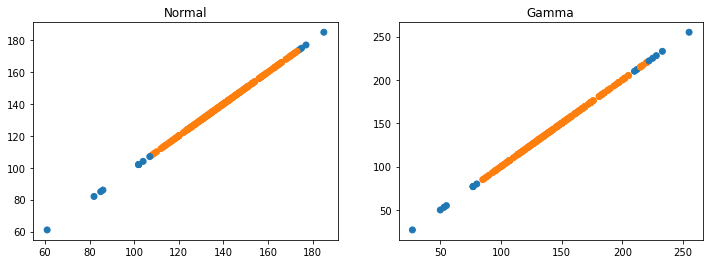

array: 39 [5.875] [-0.70380157]


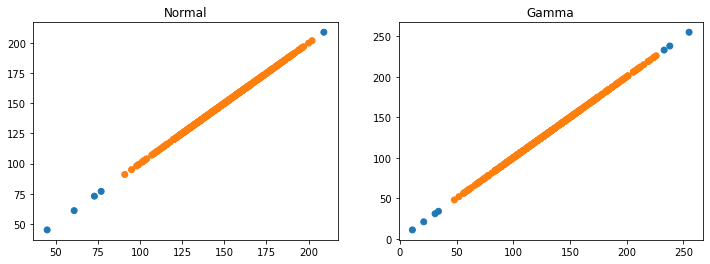

array: 40 [6.25] [-0.709176]


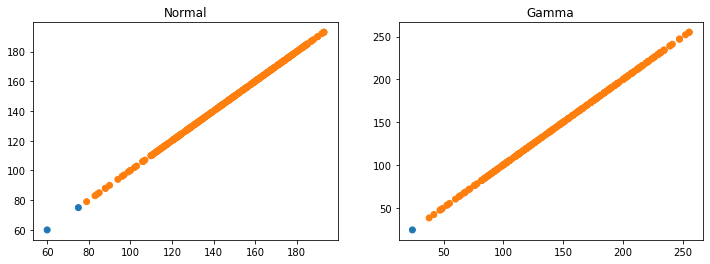

array: 41 [8.125] [-0.73196467]


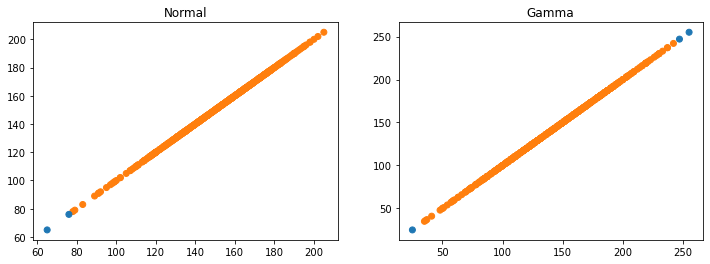

array: 42 [6.25] [-0.709176]


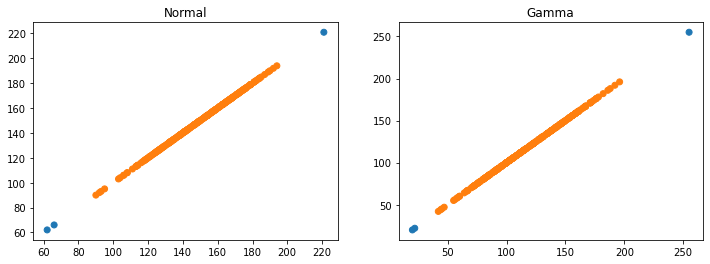

array: 43 [5.875] [-0.70380157]


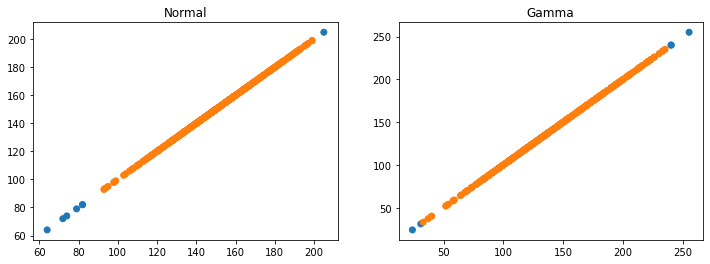

array: 44 [4.75] [-0.68533872]


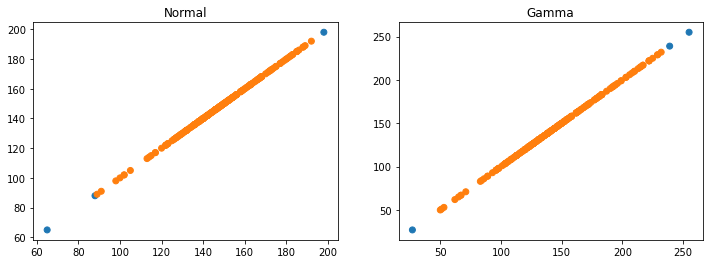

array: 45 [9.625] [-0.74668015]


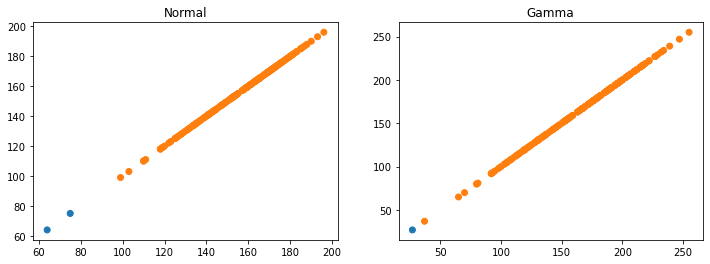

array: 46 [4.375] [-0.67819561]


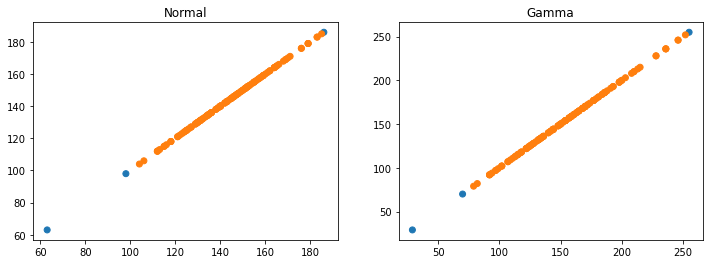

array: 47 [7.375] [-0.7235524]


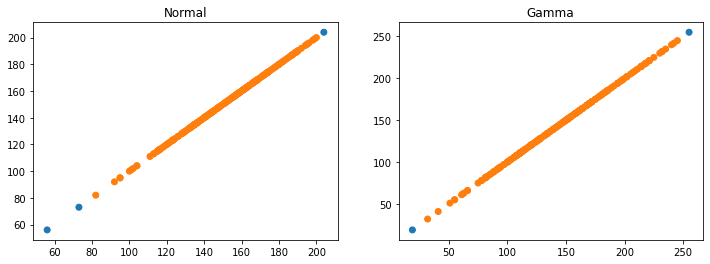

array: 48 [4.375] [-0.67819561]


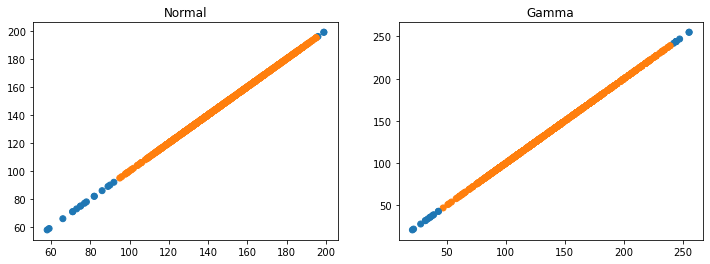

array: 49 [4.] [-0.670412]


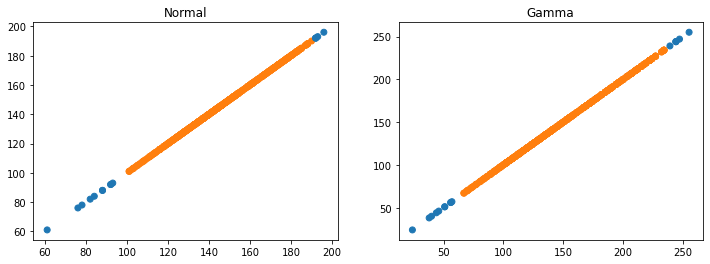

array: 50 [7.375] [-0.7235524]


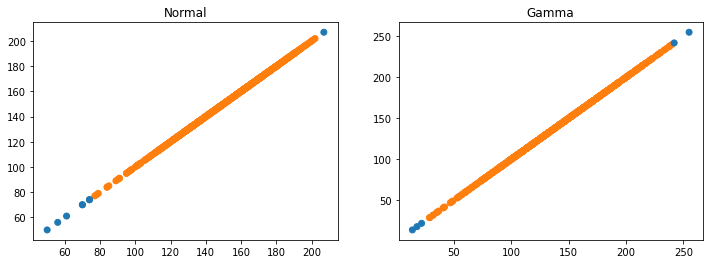

array: 51 [5.5] [-0.69807254]


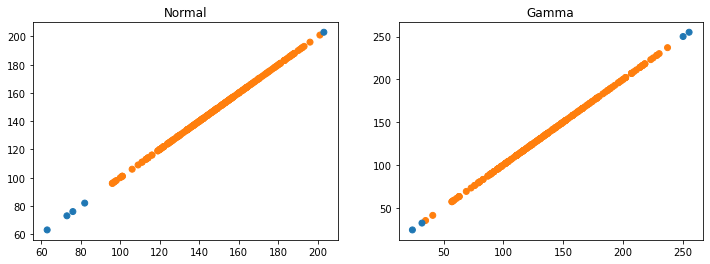

array: 52 [3.25] [-0.65237667]


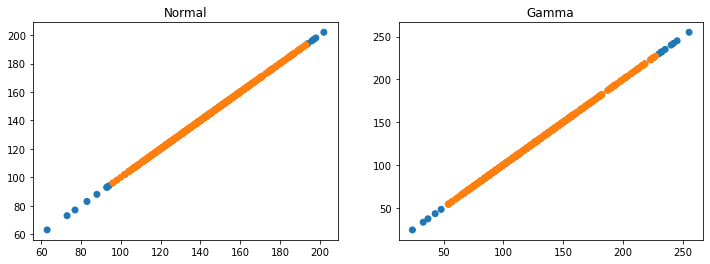

array: 53 [5.125] [-0.69193877]


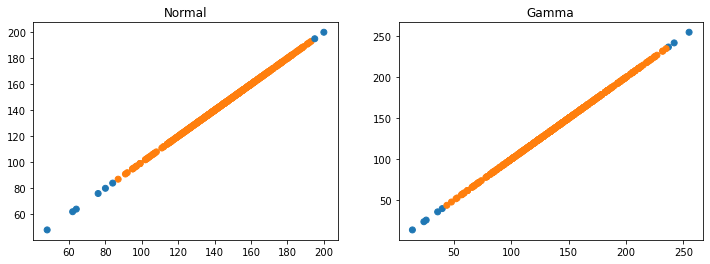

array: 54 [4.75] [-0.68533872]


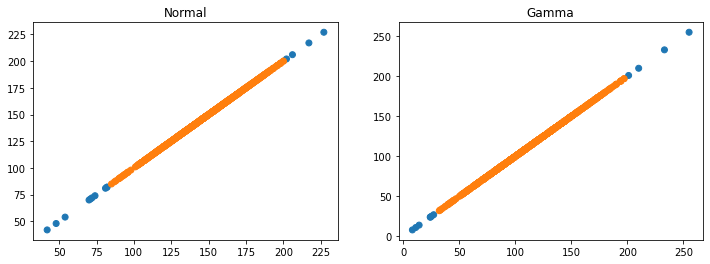

array: 55 [4.75] [-0.68533872]


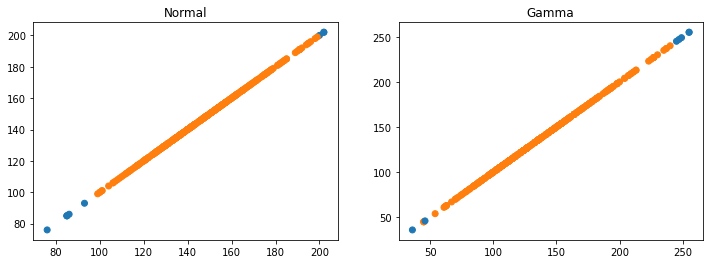

array: 56 [4.375] [-0.67819561]


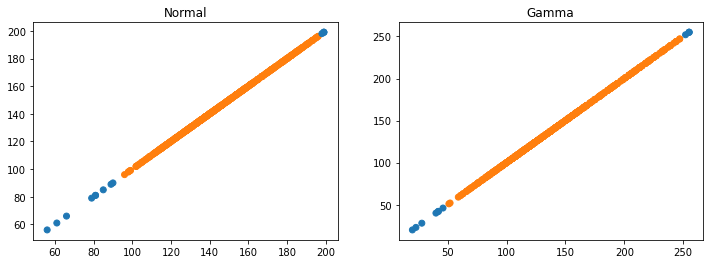

array: 57 [4.375] [-0.67819561]


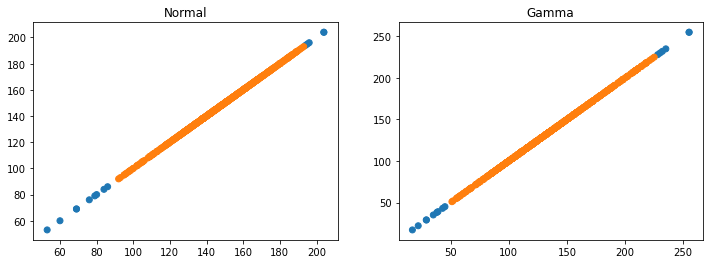

array: 58 [7.] [-0.71901961]


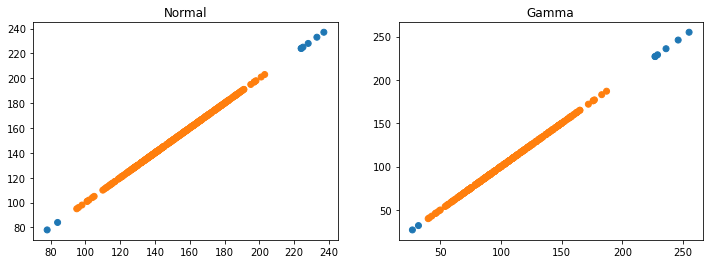

array: 59 [4.75] [-0.68533872]


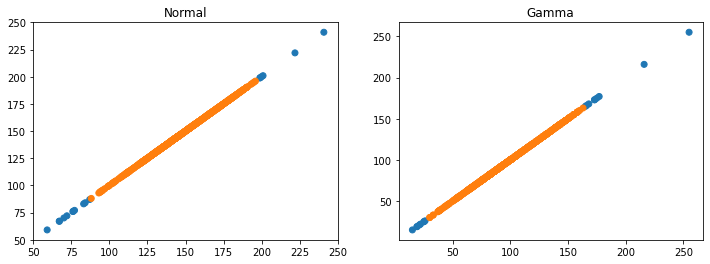

array: 60 [5.5] [-0.69807254]


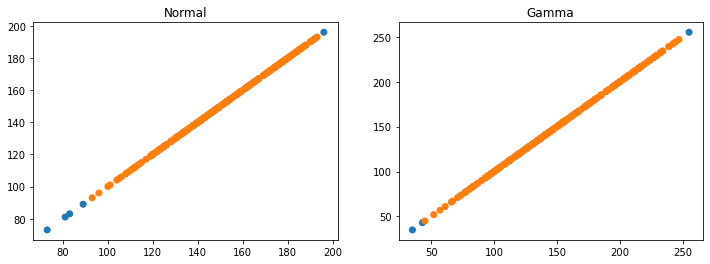

array: 61 [5.5] [-0.69807254]


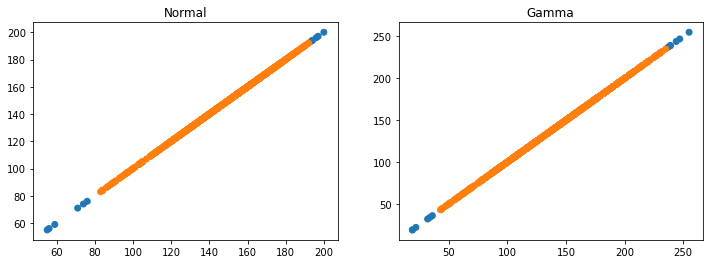

array: 62 [4.375] [-0.67819561]


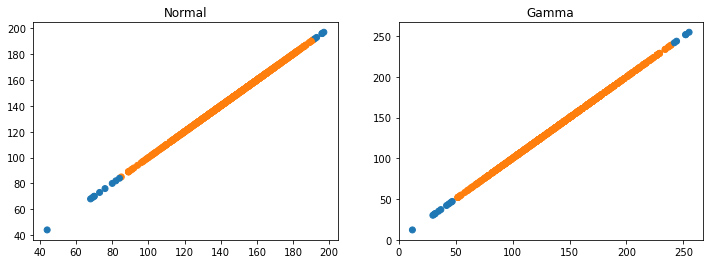

array: 63 [7.375] [-0.7235524]


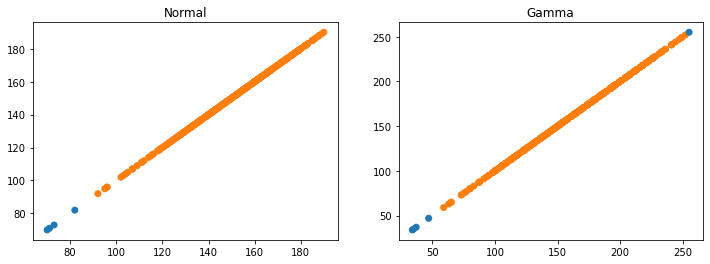

array: 64 [4.] [-0.670412]


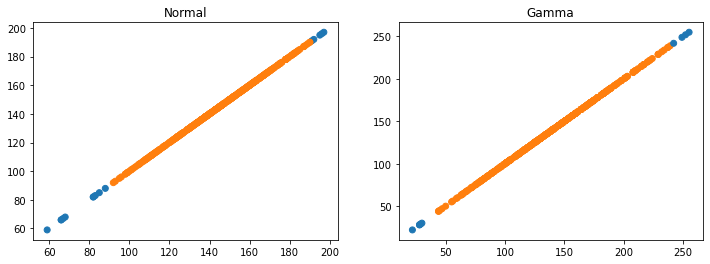

array: 65 [4.] [-0.670412]


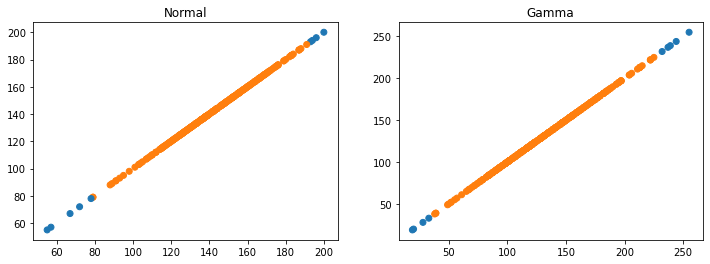

array: 66 [8.125] [-0.73196467]


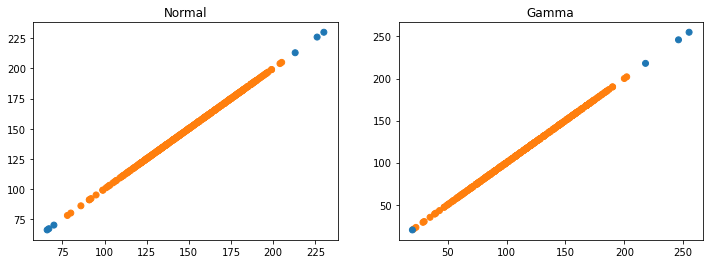

array: 67 [5.5] [-0.69807254]


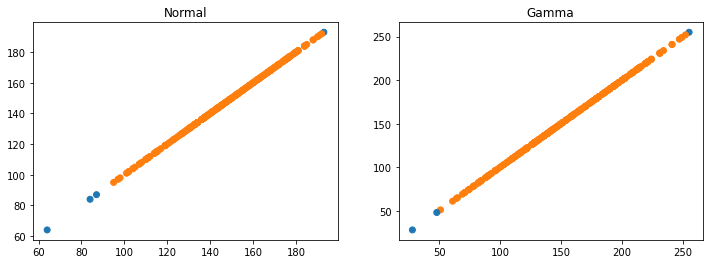

array: 68 [5.875] [-0.70380157]


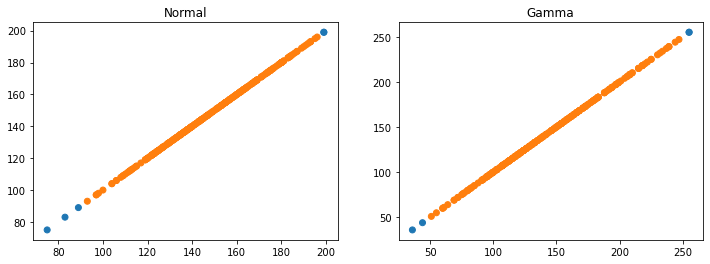

array: 69 [7.375] [-0.7235524]


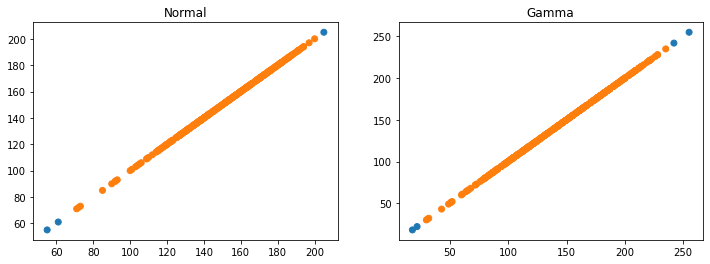

array: 70 [4.75] [-0.68533872]


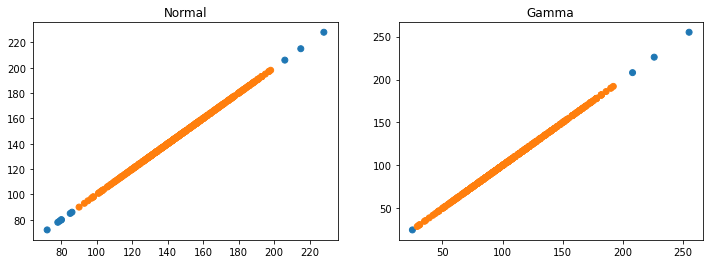

array: 71 [6.25] [-0.709176]


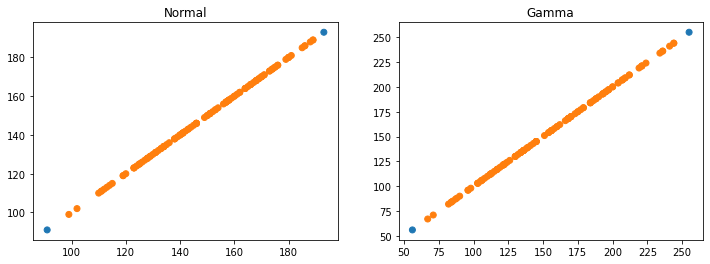

array: 72 [4.] [-0.670412]


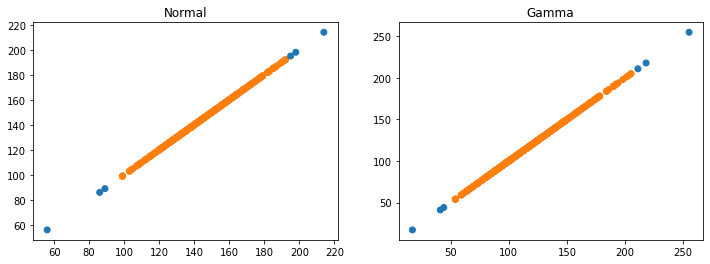

array: 73 [3.625] [-0.6618616]


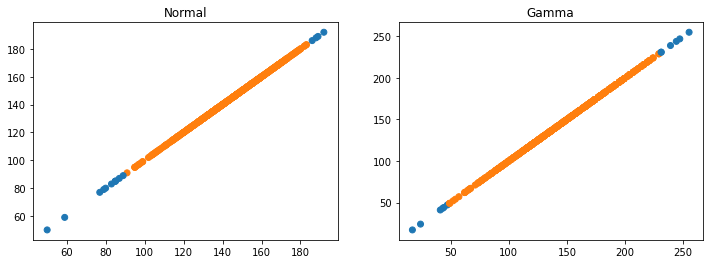

array: 74 [2.125] [-0.61547179]


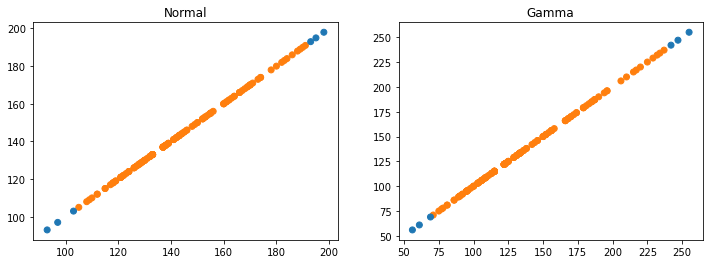

array: 75 [7.75] [-0.72786034]


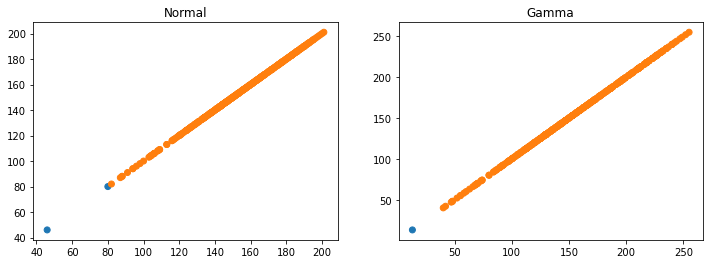

array: 76 [5.5] [-0.69807254]


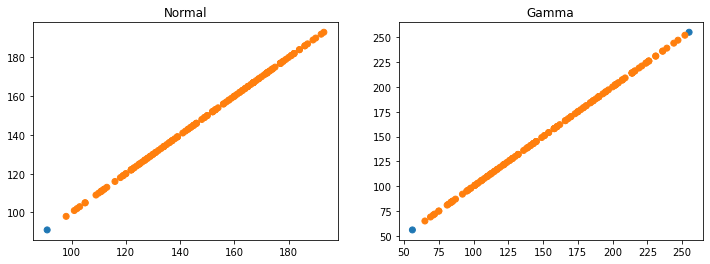

array: 77 [2.5] [-0.629588]


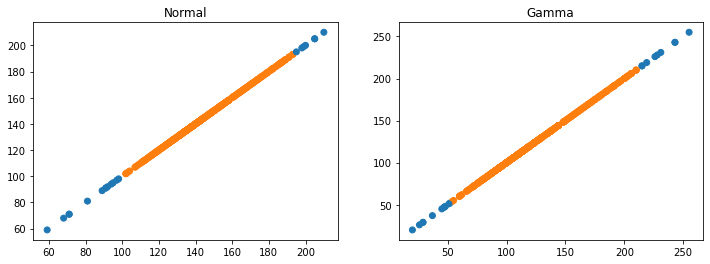

array: 78 [4.] [-0.670412]


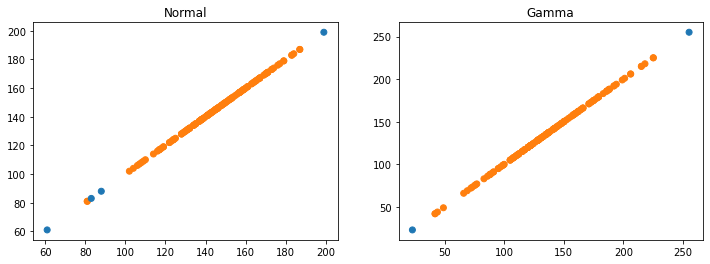

array: 79 [4.375] [-0.67819561]


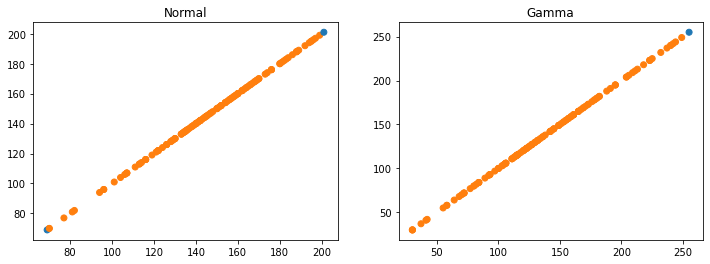

array: 80 [5.875] [-0.70380157]


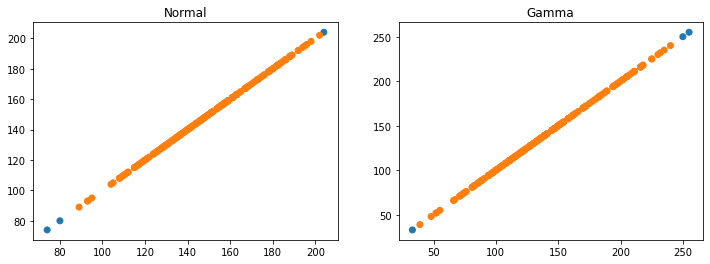

array: 81 [2.875] [-0.64172757]


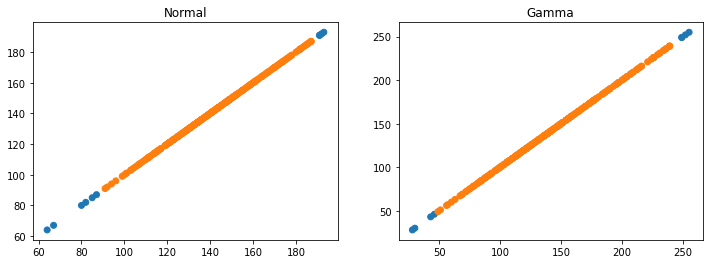

array: 82 [4.] [-0.670412]


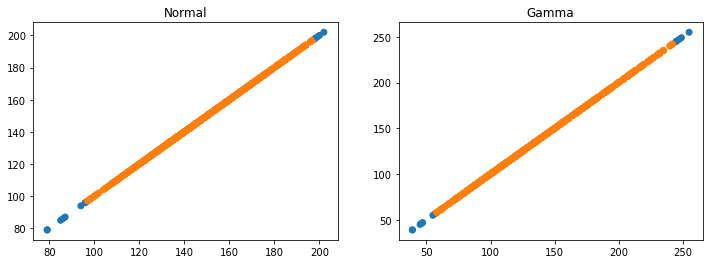

array: 83 [8.5] [-0.73588379]


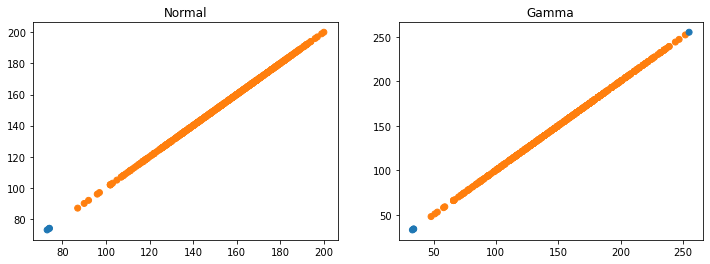

array: 84 [3.625] [-0.6618616]


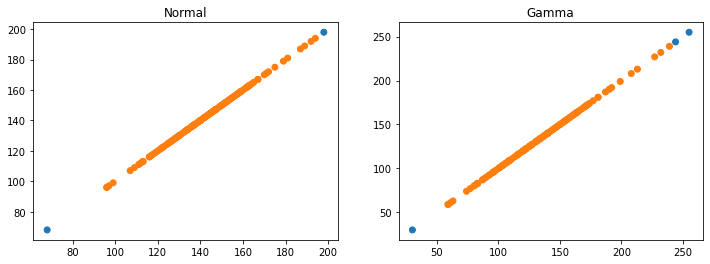

array: 85 [5.875] [-0.70380157]


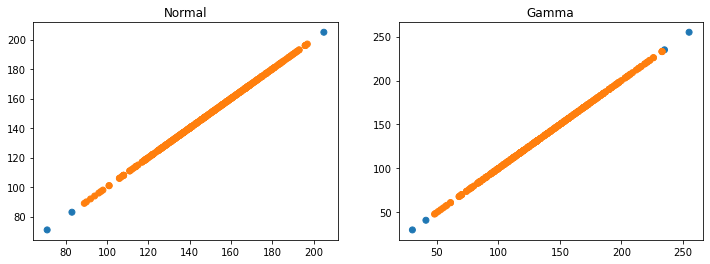

array: 86 [5.875] [-0.70380157]


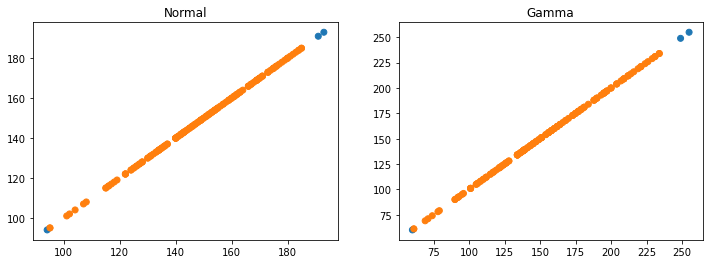

array: 87 [4.375] [-0.67819561]


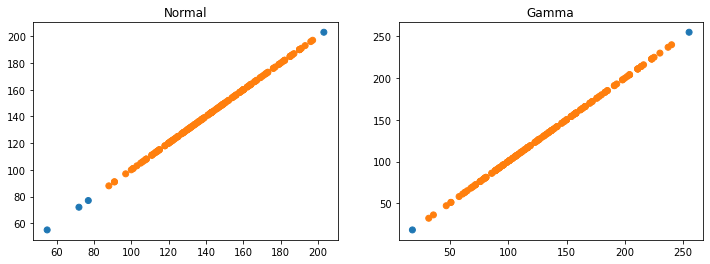

array: 88 [3.625] [-0.6618616]


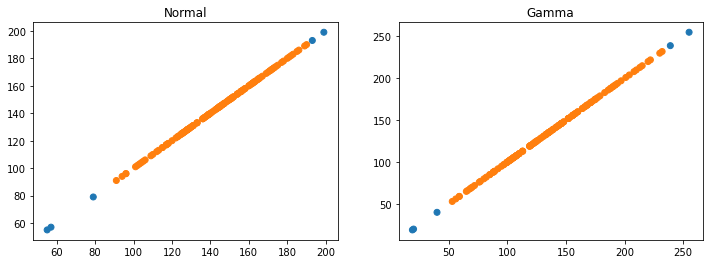

array: 89 [3.625] [-0.6618616]


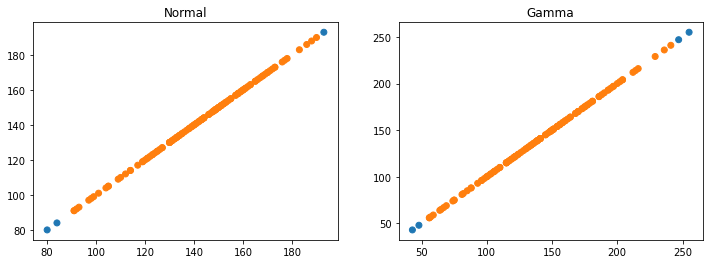

array: 90 [5.125] [-0.69193877]


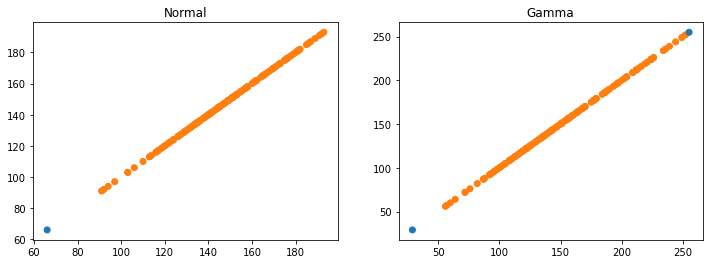

array: 91 [5.125] [-0.69193877]


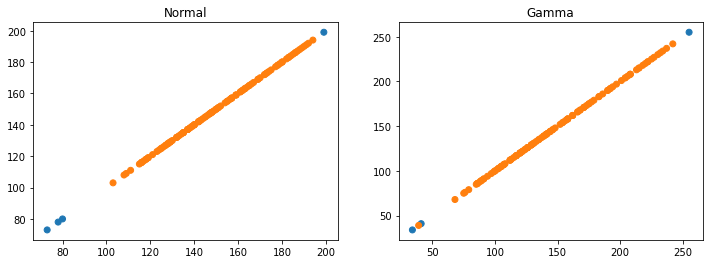

array: 92 [3.25] [-0.65237667]


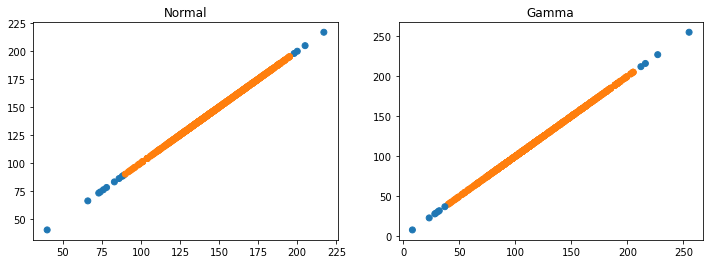

array: 93 [4.375] [-0.67819561]


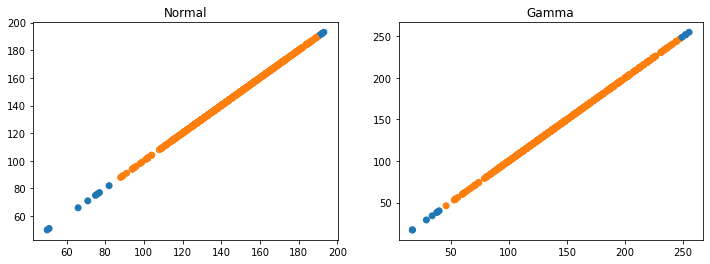

array: 94 [5.5] [-0.69807254]


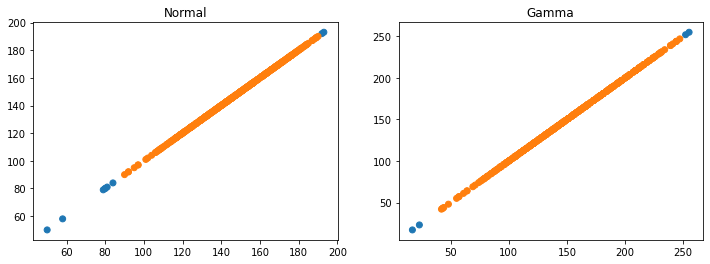

array: 95 [4.375] [-0.67819561]


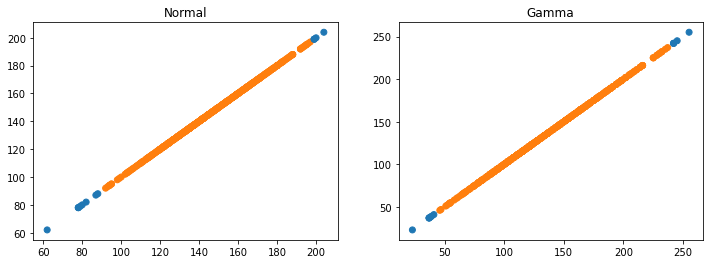

array: 96 [2.875] [-0.64172757]


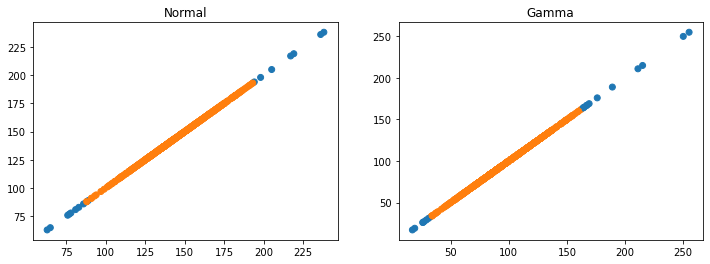

array: 97 [2.875] [-0.64172757]


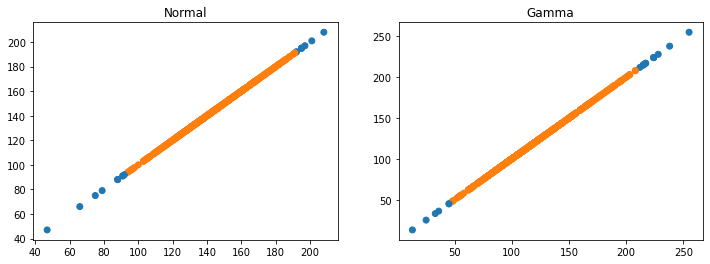

array: 98 [5.125] [-0.69193877]


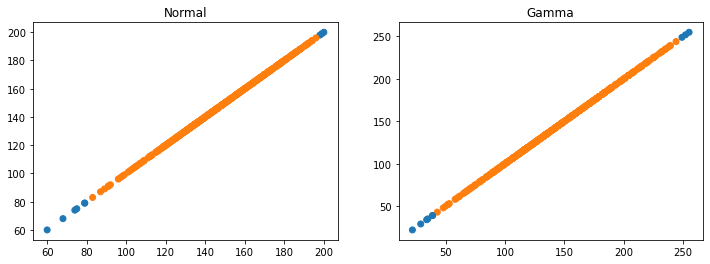

array: 99 [3.625] [-0.6618616]


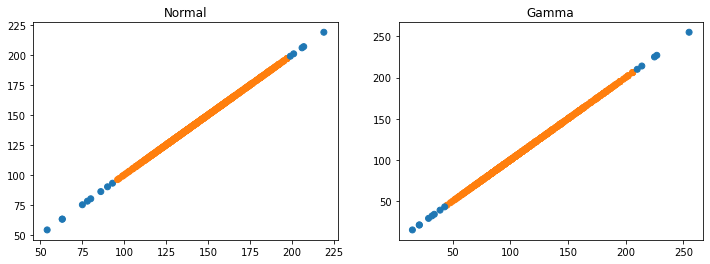

array: 100 [3.625] [-0.6618616]


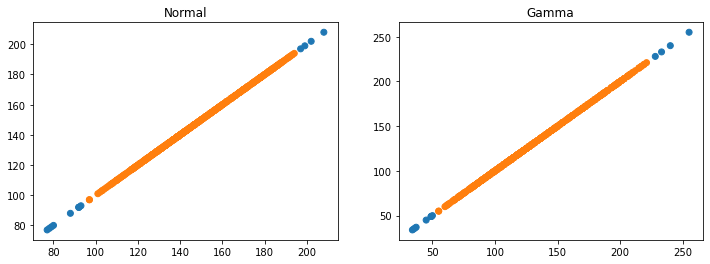

array: 101 [5.875] [-0.70380157]


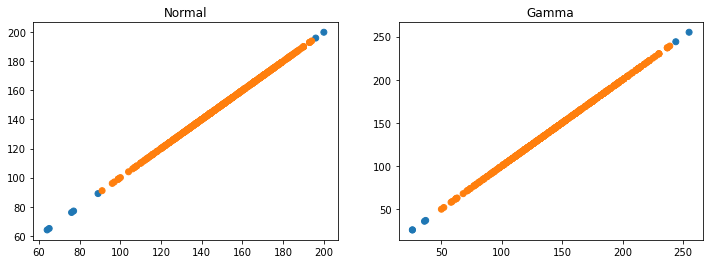

array: 102 [5.5] [-0.69807254]


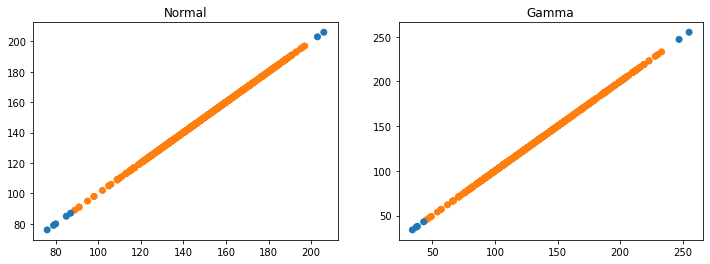

array: 103 [3.625] [-0.6618616]


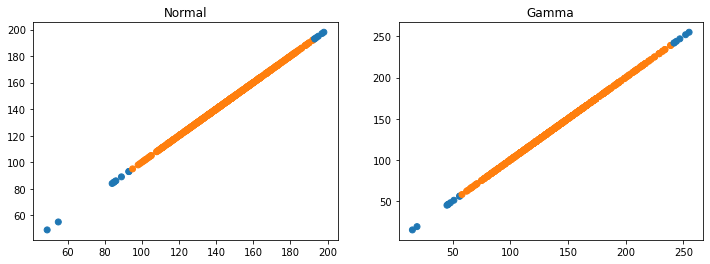

array: 104 [4.] [-0.670412]


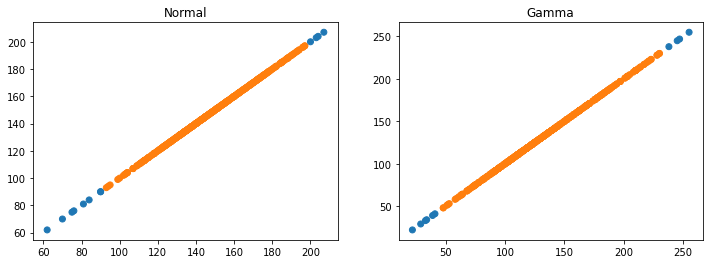

array: 105 [4.75] [-0.68533872]


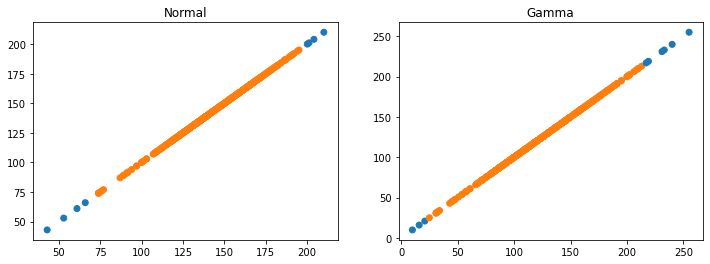

array: 106 [4.375] [-0.67819561]


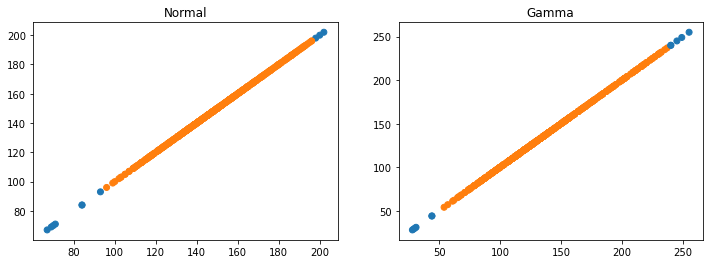

array: 107 [5.125] [-0.69193877]


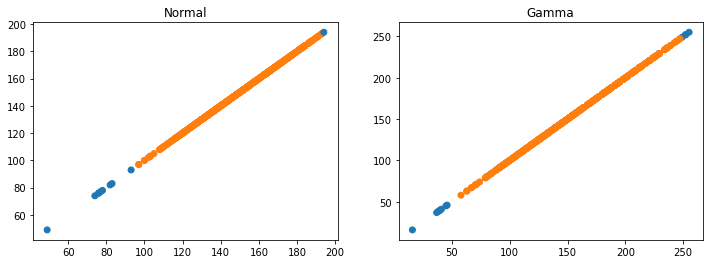

array: 108 [6.25] [-0.709176]


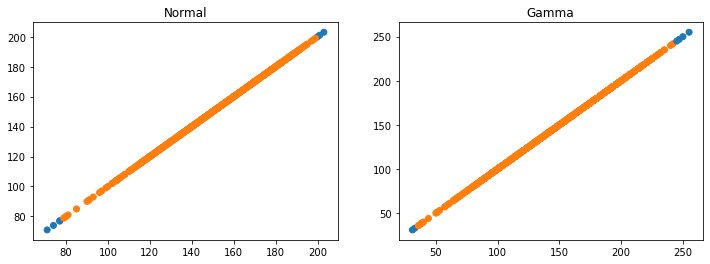

array: 109 [7.] [-0.71901961]


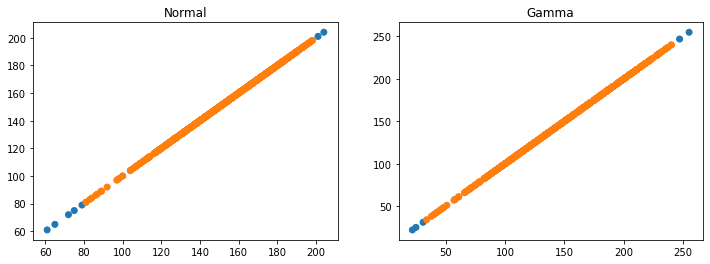

array: 110 [2.5] [-0.629588]


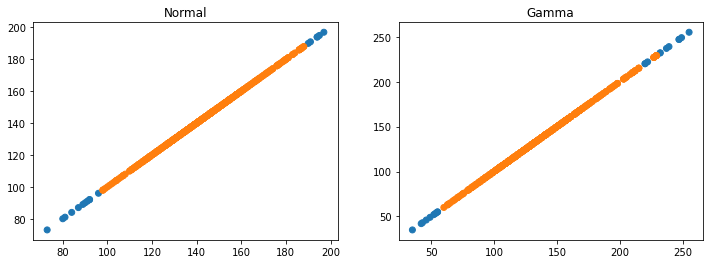

array: 111 [2.875] [-0.64172757]


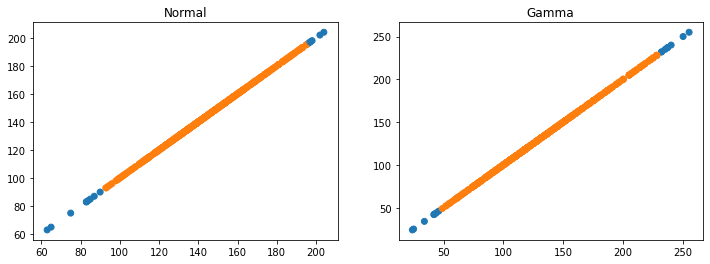

In [168]:
check_pred_labels(array_isof_normal, array_isof_gamma)

異常タイプの確認テスト

In [235]:
def remove_useless_clusters(hot_pixels):
    gray = hot_pixels.astype(np.uint8)
    #contours, hierarchy = cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    contours, hierarchy = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        area = cv2.contourArea(cnt)
        convex_hull = cv2.convexHull(cnt)
        convex_hull_area = cv2.contourArea(convex_hull)
        #if area > 0:
        #    print(convex_hull_area, area, convex_hull_area/area)
        if area < 10.0: # remove small clusters
            rect = cv2.minAreaRect(cnt)
            box = np.int0(cv2.boxPoints(rect))
            cv2.drawContours(gray, [box], -1, color=(0,0,0), thickness=1)
            cv2.drawContours(gray, [box], -1, color=(0,0,0), thickness=-1)
        elif convex_hull_area > 2.0 * area: # remove non-convex clusters
            rect = cv2.minAreaRect(cnt)
            box = np.int0(cv2.boxPoints(rect))            
            cv2.drawContours(gray, [box], -1, color=(0,0,0), thickness=-1)
            cv2.drawContours(gray, [box], -1, color=(0,0,0), thickness=1)            
    return gray

In [137]:
def get_hotspots_in_array(transformed_clusters_temperature, img_file, log=False):
    # -- hot cluster --
    hot_clusters = (transformed_clusters_temperature.mean(axis=1) > 3.0)
    # -- hot pixcel --
    #hot_pixels = np.array([c in np.where(hot_clusters==True)[0] for c in clusters.labels])
    hot_pixels = np.array([1 if c in np.where(hot_clusters==True)[0] else 0 for c in clusters.labels]) 
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1)
    if log:
        print("Hot cluster labels in array:",hot_clusters)
        print("Hotspot weights in array:",hot_pixels.mean())
    return hot_pixels, hot_clusters

In [252]:
def get_hotspots_in_module(
    scaled_clusters_temperature, img_file, log=False):
    # -- hot cluster --
    hot_clusters = (scaled_clusters_temperature.mean(axis=1) > 3.0)
    # -- hot pixel --
    #hot_pixels = np.array([c in np.where(hot_clusters==True)[0] for c in clusters.labels])
    hot_pixels = np.array([1 if c in np.where(hot_clusters==True)[0] else 0 for c in clusters.labels]) 
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1)    
    if log:
        print("Hot cluster labels in module:",hot_clusters)
        print("Hotspot weights in module:",hot_pixels.mean())
    return hot_pixels, hot_clusters

In [253]:
def get_hotspots_by_models(
    original_clusters_temperature, transformed_clusters_temperature, model, img_file, log=False):
    # -- hot cluster --
    hot_clusters = (model.predict(original_clusters_temperature) < 0) \
    & (transformed_clusters_temperature.mean(axis=1) > 0)
    print(model.score_samples(original_clusters_temperature))
    print(model.offset_)
    # -- hot pixel --
    #hot_pixels = np.array([c in np.where(hot_clusters==True)[0] for c in clusters.labels])
    hot_pixels = np.array([1 if c in np.where(hot_clusters==True)[0] else 0 for c in clusters.labels])    
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1) 
    return hot_pixels, hot_clusters

[-1.03737929 -1.03715898 -0.98866925 -0.98148399 -1.14469692 -1.06194384
 -3.06110553 -1.0817063  -0.98092161 -1.01777124]
[-2.21507986]
[-0.46404633 -0.47400301 -0.45607189 -0.4570016  -0.52901024 -0.47328763
 -0.71637103 -0.47294595 -0.44332568 -0.46918349]
[-0.74301597]
[-1.41437755 -1.107936   -1.14428331 -0.99163708 -0.96688752 -1.15699882
 -1.58894307 -1.14987444 -1.15169353 -1.03335512]
[-2.21507986]
[-0.63407987 -0.52930932 -0.5923316  -0.47877584 -0.44092937 -0.55407594
 -0.57338677 -0.55128619 -0.58962268 -0.5095632 ]
[-0.74301597]
63.jpg Normal [5.18895443]
[-1.19732888 -1.01216174 -1.19732888 -1.04976653 -1.44375041 -0.98148399
 -1.02954966 -1.83836509 -1.44375041 -1.25043621]
[-2.21507986]
[-0.52016347 -0.49030578 -0.52016347 -0.50551584 -0.53960309 -0.4570016
 -0.48585321 -0.63553851 -0.53960309 -0.53856094]
[-0.74301597]
[-1.14428331 -1.36398405 -1.14428331 -1.23464074 -1.07389318 -1.55044
 -1.29511294 -1.01982687 -1.10318118 -1.11914337]
[-2.21507986]
[-0.5923316  -0.62

[-1.04259186 -0.96569827 -1.0283353  -0.98382773 -1.6276377  -1.01590817
 -1.06302872 -0.99918523 -1.02131202 -1.05141251]
[-1.74407875]
[-0.44648074 -0.45043058 -0.45907675 -0.46222147 -0.59974407 -0.44604496
 -0.50954428 -0.48097662 -0.45834179 -0.50400243]
[-0.64881575]
[-1.13991623 -1.05995707 -1.12914816 -1.25883574 -1.10282838 -1.07607397
 -1.00588544 -1.02183302 -1.11899749 -1.02815723]
[-1.74407875]
[-0.55315186 -0.4606538  -0.52761175 -0.57014411 -0.53494674 -0.56204299
 -0.46754638 -0.46517314 -0.52351926 -0.44485783]
[-0.64881575]
837.jpg Normal [1.75419855]
[-0.99122663 -1.06047529 -0.99223515 -1.46533693 -1.04369403 -1.10314375
 -1.06047529 -1.         -0.99631937 -1.06957869]
[-2.24798541]
[-0.4429129  -0.4254582  -0.45253724 -0.59863551 -0.43530232 -0.47481357
 -0.4254582  -0.42202823 -0.43901104 -0.45424909]
[-0.74959708]
[-1.01573004 -1.01990582 -1.01706402 -0.97627264 -1.19603446 -1.00855927
 -1.01093304 -0.97773151 -1.04368884 -1.03522712]
[-2.24798541]
[-0.53277602 

[-1.11302792 -1.         -1.31566608 -1.00266167 -1.69315548 -1.02110941
 -1.00520727 -0.98912084 -0.97470086 -0.99036516]
[-2.19190912]
[-0.48855342 -0.44147631 -0.56124343 -0.43425428 -0.60124568 -0.45061383
 -0.47577539 -0.46269042 -0.42853036 -0.45464213]
[-0.73838182]
[-1.05211469 -3.86984635 -1.0100894  -3.00096893 -1.02616707 -4.75209111
 -2.59708906 -1.5044801  -4.16392794 -1.66266142]
[-2.19190912]
[-0.505409   -0.75503418 -0.46607283 -0.72794636 -0.44698933 -0.79527363
 -0.71418542 -0.65139171 -0.77114584 -0.67615578]
[-0.73838182]
638.jpg Normal [4.91936581]
[-1.01634663 -1.0220161  -0.968099   -1.1537055  -1.05371654 -0.99365058
 -1.01420529 -0.96553129 -0.97971891 -1.04275424]
[-2.21507986]
[-0.48254249 -0.48748436 -0.464024   -0.52851378 -0.50361289 -0.47174947
 -0.4720183  -0.48573467 -0.44492098 -0.51067797]
[-0.74301597]
[-1.15895984 -1.02098137 -1.1226846  -1.46477105 -1.107936   -1.01429817
 -1.14987444 -1.13771699 -1.01668372 -1.22120247]
[-2.21507986]
[-0.58563833 

[-0.9938615  -0.98092161 -1.10572062 -1.05547133 -1.1415756  -1.01728028
 -1.78307592 -1.02592977 -1.13562922 -1.05371654]
[-2.21507986]
[-0.48530358 -0.44332568 -0.53857743 -0.52394796 -0.51944418 -0.44319461
 -0.63039944 -0.48551244 -0.56750953 -0.50361289]
[-0.74301597]
[-1.04543387 -1.01996716 -1.22120247 -1.14987444 -1.15169353 -1.00340915
 -1.56354222 -0.99163708 -1.34046709 -0.99016703]
[-2.21507986]
[-0.52501675 -0.46286497 -0.5525255  -0.55128619 -0.58962268 -0.4618181
 -0.56579249 -0.47877584 -0.62314517 -0.46829866]
[-0.74301597]
2302.jpg Normal [5.18895443]
[-1.05385836 -0.96382411 -1.         -1.07635655 -1.02455605 -1.85330233
 -1.         -1.0129398  -1.04369403 -0.99631937]
[-2.24798541]
[-0.47105399 -0.42353955 -0.42202823 -0.45233434 -0.42464193 -0.6585033
 -0.42202823 -0.45081457 -0.43530232 -0.43901104]
[-0.74959708]
[-1.23217391 -0.98967301 -1.03477624 -1.01990582 -0.9903273  -1.21068399
 -1.04368884 -1.04071805 -1.01106075 -1.00745475]
[-2.24798541]
[-0.56599538 -

[-0.95601864 -1.07773053 -0.96950272 -0.99918523 -1.01372082 -1.0030303
 -1.98395068 -1.04457831 -1.0030303  -0.96950272]
[-1.74407875]
[-0.49511103 -0.48013294 -0.43153074 -0.48097662 -0.45652424 -0.44428439
 -0.69057339 -0.45871002 -0.44428439 -0.43153074]
[-0.64881575]
[-1.40794331 -1.00143066 -1.07607397 -1.06431356 -1.42858332 -1.25883574
 -1.28391003 -1.21129642 -1.25883574 -1.06603322]
[-1.74407875]
[-0.61785444 -0.44216015 -0.56204299 -0.47840727 -0.6221936  -0.57014411
 -0.58898194 -0.57863696 -0.57014411 -0.55321462]
[-0.64881575]
4029.jpg Normal [1.75419855]
[-1.05532251 -2.31675453 -1.0162485  -1.10820541 -1.01651451 -1.08348066
 -1.00595163 -1.00595163 -1.04885833 -1.02819589]
[-2.21296359]
[-0.47884585 -0.73243816 -0.44553744 -0.52765611 -0.47524211 -0.52656691
 -0.47194019 -0.47194019 -0.43762017 -0.48166844]
[-0.74259272]
[-1.05969289 -2.61191707 -1.0306767  -1.19225949 -1.01189002 -1.14701277
 -1.00918439 -1.00973543 -1.01642063 -1.01755917]
[-2.21296359]
[-0.49049627 

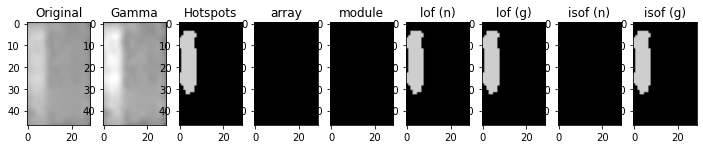

[-1.04704291 -0.98866925 -1.30739253 -0.99376889 -0.97668347 -0.98148399
 -1.003367   -0.93889583 -0.99376889 -1.04976653]
[-2.21507986]
[-0.47935903 -0.45607189 -0.52923127 -0.4537069  -0.47557834 -0.4570016
 -0.44992333 -0.44250432 -0.4537069  -0.50551584]
[-0.74301597]
[-1.107936   -1.11914337 -1.00793388 -1.06358767 -0.97409862 -1.02098137
 -1.29511294 -1.16967442 -1.06358767 -1.0141272 ]
[-2.21507986]
[-0.52930932 -0.54216092 -0.47820877 -0.53740471 -0.48655375 -0.46786283
 -0.6079511  -0.58431035 -0.53740471 -0.47062283]
[-0.74301597]
1145.jpg Normal [5.18895443]
[-0.94454592 -0.99525812 -1.04457831 -0.96270396 -0.96908639 -1.0369466
 -0.97727273 -1.04457831 -1.0030303  -0.98584359]
[-1.74407875]
[-0.47989321 -0.44849815 -0.45871002 -0.45646532 -0.45407205 -0.49390966
 -0.45474571 -0.45871002 -0.44428439 -0.46235544]
[-0.64881575]
[-1.24977284 -1.04147421 -1.12383276 -1.11266425 -1.10546267 -1.40794331
 -1.08855941 -1.13991623 -1.19203495 -1.04147421]
[-1.74407875]
[-0.5571156  -

[-0.99635959 -0.9821927  -0.98866925 -0.981083   -0.99376889 -1.06194384
 -0.97668347 -1.02844402 -1.01728028 -1.16861282]
[-2.21507986]
[-0.47486733 -0.4678801  -0.45607189 -0.46394005 -0.4537069  -0.47328763
 -0.47557834 -0.47382921 -0.44319461 -0.52339706]
[-0.74301597]
[-0.99701671 -1.1194225  -1.14410108 -1.01982687 -1.00449365 -1.07036212
 -1.02098137 -1.41437755 -1.15599952 -1.02133652]
[-2.21507986]
[-0.49583615 -0.53841764 -0.5339829  -0.46387404 -0.48580006 -0.53108084
 -0.48615411 -0.63407987 -0.59185561 -0.45663367]
[-0.74301597]
1186.jpg Normal [5.18895443]
[-1.01676117 -0.97574105 -1.06993558 -0.96510184 -0.9888309  -0.97574105
 -1.46468509 -1.03334776 -1.20994491 -0.98198027]
[-2.21296359]
[-0.45240555 -0.44627274 -0.47614231 -0.41642335 -0.45471365 -0.44627274
 -0.58556113 -0.44298379 -0.50870388 -0.4501497 ]
[-0.74259272]
[-1.19225949 -1.82113185 -1.0288313  -2.73751237 -1.34254201 -1.71191864
 -1.0163144  -2.13977178 -1.0267936  -1.48224215]
[-2.21296359]
[-0.57587211

[-1.19305556 -1.03740318 -1.16272364 -1.03790651 -0.99898698 -1.03790651
 -1.03790651 -1.02034777 -1.22174245 -1.50395775]
[-2.19190912]
[-0.56272413 -0.48396438 -0.55476013 -0.50103215 -0.45778194 -0.50103215
 -0.50103215 -0.46477095 -0.52738402 -0.63004685]
[-0.73838182]
[-4.01688714 -2.19912033 -3.79632595 -3.06947657 -1.41660159 -3.00096893
 -3.00096893 -1.5044801  -1.00066771 -4.82561151]
[-2.19190912]
[-0.76542793 -0.70220681 -0.7535032  -0.73041312 -0.63259701 -0.72794636
 -0.72794636 -0.65139171 -0.46074888 -0.79796854]
[-0.73838182]
4175.jpg Normal [4.91936581]
[-1.00851796 -1.41074617 -1.28971137 -1.0616729  -1.14341222 -1.75150113
 -1.06187935 -1.06018073 -0.97154444 -2.22984661]
[-2.22139715]
[-0.45749973 -0.59112809 -0.5575904  -0.46872326 -0.53512972 -0.6201086
 -0.50721731 -0.50486506 -0.44873341 -0.6813313 ]
[-0.74427943]
[-1.42284475 -1.05241231 -1.03358703 -1.04021626 -0.99229709 -1.01789425
 -1.0088629  -1.00281741 -2.09475912 -1.06001396]
[-2.22139715]
[-0.61705879 

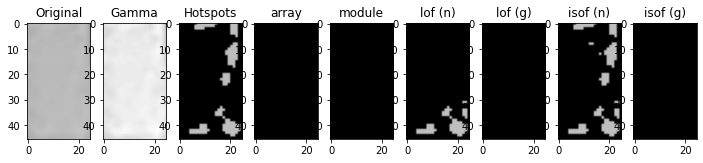

[-1.01326464 -0.98210646 -1.         -1.00319796 -1.05019203 -0.965895
 -1.01219548 -1.07694282 -1.01093347 -1.00483772]
[-2.1083795]
[-0.46837556 -0.46210452 -0.42265417 -0.4564622  -0.46081218 -0.43349568
 -0.48936554 -0.52988516 -0.47209205 -0.45704381]
[-0.7216759]
[-1.3548359  -1.09510877 -1.00140691 -1.32528411 -1.02413252 -1.00716426
 -1.31164482 -1.74215636 -1.13923104 -1.        ]
[-2.1083795]
[-0.5722436  -0.55399624 -0.46569687 -0.58938443 -0.49898148 -0.45831029
 -0.58209731 -0.66217814 -0.52487912 -0.41795228]
[-0.7216759]
4613.jpg Normal [4.05863034]
[-0.98817494 -1.30062968 -1.66061193 -1.00639598 -1.         -2.27125156
 -1.00520727 -1.01657442 -1.00266167 -1.00630326]
[-2.19190912]
[-0.44053932 -0.54695411 -0.59661874 -0.45492034 -0.44147631 -0.68045904
 -0.47577539 -0.46488476 -0.43425428 -0.43487878]
[-0.73838182]
[-3.72280555 -1.0366473  -1.00479436 -3.13798421 -3.94336674 -1.07386747
 -2.66511439 -1.45878328 -3.28168317 -4.75209111]
[-2.19190912]
[-0.7535032  -0.46

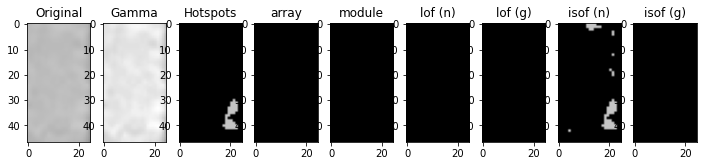

[-1.         -0.99305656 -0.92948718 -0.99631048 -1.00595305 -0.98408488
 -1.06364968 -0.98989246 -0.99631048 -1.        ]
[-2.10468668]
[-0.41126756 -0.44235389 -0.44490571 -0.43640638 -0.50881204 -0.43892678
 -0.45281147 -0.44078501 -0.43640638 -0.42203662]
[-0.72093734]
[-1.06899824 -1.11317742 -1.46253714 -1.02619352 -0.9770552  -1.05471868
 -1.15364641 -1.29442942 -1.02619352 -1.11186211]
[-2.10468668]
[-0.56849251 -0.47688201 -0.69630877 -0.48507948 -0.44883863 -0.54194434
 -0.56895177 -0.6426469  -0.48507948 -0.52167061]
[-0.72093734]
3815.jpg Normal [4.02426599]
[-1.03495871 -1.02067974 -1.01616511 -1.05944063 -1.06664309 -1.02813955
 -1.02067974 -0.99846271 -0.97215155 -1.01662864]
[-2.21296359]
[-0.48578262 -0.50215961 -0.49082502 -0.52668364 -0.4419093  -0.50698625
 -0.50215961 -0.48420607 -0.47743534 -0.51698175]
[-0.74259272]
[-1.00613274 -1.76996339 -1.30939282 -3.0619669  -0.9785613  -2.08511456
 -1.76996339 -1.04129203 -1.21629698 -2.13977178]
[-2.21296359]
[-0.52612561

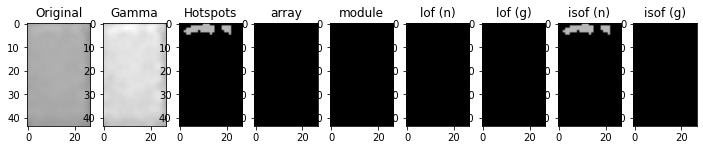

[-1.03769269 -1.00862942 -1.08806403 -1.6276377  -0.98810059 -0.96908639
 -1.23776032 -1.04117794 -1.02236079 -0.96569827]
[-1.74407875]
[-0.47864763 -0.46447474 -0.50779133 -0.59974407 -0.46556239 -0.45407205
 -0.55352875 -0.49829541 -0.48611201 -0.45043058]
[-0.64881575]
[-1.13991623 -1.53178335 -1.10775552 -1.02931856 -1.30179471 -1.35044615
 -0.96980448 -1.08855941 -1.21871598 -1.40794331]
[-1.74407875]
[-0.55315186 -0.63046728 -0.5158745  -0.46319766 -0.60488802 -0.60878423
 -0.48604208 -0.52356401 -0.56598085 -0.61785444]
[-0.64881575]
214.jpg Normal [1.75419855]
[-0.99141251 -1.00120839 -1.01335037 -1.00071044 -1.00679325 -1.34836216
 -1.0288633  -1.00032354 -0.99785913 -0.97982833]
[-2.22139715]
[-0.49081263 -0.50536005 -0.48156098 -0.48866877 -0.47062009 -0.59903171
 -0.48357296 -0.49703602 -0.50983339 -0.46458357]
[-0.74427943]
[-1.0180211  -1.27652384 -0.97417395 -0.9922648  -1.02712291 -2.15908637
 -0.99559765 -0.99403951 -1.21934095 -1.0088629 ]
[-2.22139715]
[-0.50378346 

[-0.98912084 -1.04894494 -1.02210117 -1.00266167 -1.02477963 -1.02477963
 -1.00011124 -0.99330362 -0.98794837 -1.        ]
[-2.19190912]
[-0.46269042 -0.44157503 -0.45574428 -0.43425428 -0.4295973  -0.4295973
 -0.43158094 -0.46036658 -0.43064832 -0.44147631]
[-0.73838182]
[-1.04076428 -2.79711692 -1.18460233 -1.29005654 -2.52847376 -2.52847376
 -4.16392794 -1.04021631 -1.77690349 -1.77690349]
[-2.19190912]
[-0.51072204 -0.72352716 -0.58185491 -0.5913452  -0.71321966 -0.71321966
 -0.77114584 -0.50596801 -0.68028564 -0.68028564]
[-0.73838182]
4363.jpg Normal [4.91936581]
[-1.0369466  -1.10035853 -1.02121212 -1.12440007 -2.34311417 -1.01867156
 -1.01372082 -1.09182027 -0.99643494 -1.0369466 ]
[-1.74407875]
[-0.49390966 -0.50059979 -0.44872214 -0.53016314 -0.71578606 -0.45913043
 -0.45652424 -0.5158692  -0.45633873 -0.49390966]
[-0.64881575]
[-1.24977284 -1.44922333 -1.08540455 -1.57453765 -1.71335932 -1.06431356
 -1.20102701 -1.36961187 -1.06893761 -1.24032735]
[-1.74407875]
[-0.5571156  

[-1.03030303 -0.99027597 -1.00981777 -1.02121212 -0.98584359 -1.00369595
 -1.03030303 -1.06302872 -1.04259186 -0.99027597]
[-1.74407875]
[-0.47649981 -0.44566567 -0.47947304 -0.44872214 -0.46235544 -0.45013023
 -0.47649981 -0.50954428 -0.44648074 -0.44566567]
[-0.64881575]
[-1.08993835 -0.99828304 -1.11899749 -1.33128043 -1.10663059 -1.09602049
 -1.06893761 -1.02167684 -1.25883574 -1.0052073 ]
[-1.74407875]
[-0.55769977 -0.46475503 -0.52351926 -0.60498257 -0.52525816 -0.51446763
 -0.55442722 -0.46387846 -0.57014411 -0.45682573]
[-0.64881575]
4439.jpg Normal [1.75419855]
[-1.02360202 -1.03632167 -1.02110941 -0.99480964 -1.00719193 -0.97054676
 -0.95533775 -1.00716565 -0.99996098 -1.01644844]
[-2.19190912]
[-0.45279741 -0.45801121 -0.45061383 -0.44396452 -0.44760124 -0.4367962
 -0.45234434 -0.44497057 -0.44136121 -0.4527446 ]
[-0.73838182]
[-2.0155744  -4.31096873 -1.14945092 -2.79711692 -1.45878328 -1.01906247
 -3.20983369 -2.59708906 -1.55544964 -1.8349033 ]
[-2.19190912]
[-0.69417633 

[-1.02811573 -1.         -1.         -0.99311722 -1.         -0.99179237
 -1.         -1.0379538  -0.97754752 -1.03854355]
[-2.23242643]
[-0.49177413 -0.47337257 -0.44602726 -0.48959114 -0.46846344 -0.48504904
 -0.47337257 -0.46254356 -0.46179497 -0.52870238]
[-0.74648529]
[-1.12331713 -1.07247757 -0.97443401 -1.07281705 -0.97618175 -1.04633996
 -1.07247757 -0.99752813 -0.99562671 -1.19352114]
[-2.23242643]
[-0.56395827 -0.52693085 -0.45299815 -0.54561035 -0.48597137 -0.5546182
 -0.52693085 -0.48306387 -0.48325974 -0.57850379]
[-0.74648529]
3395.jpg Normal [5.40040624]
[-1.00673904 -1.19016577 -1.0151253  -1.00939777 -1.37672028 -1.1321089
 -1.78347855 -1.44320961 -1.11142782 -1.01488271]
[-2.24798541]
[-0.44345827 -0.53609099 -0.51131626 -0.48915311 -0.60414326 -0.53895227
 -0.69603475 -0.61907376 -0.46311823 -0.47132936]
[-0.74959708]
[-0.99484002 -1.01990582 -1.03827516 -0.98470925 -1.0842771  -1.01298169
 -1.24749402 -1.12139274 -1.17384898 -1.03192522]
[-2.24798541]
[-0.443132   -

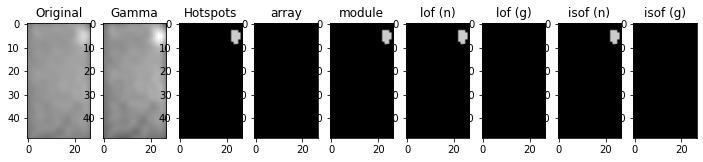

[-1.63623424 -0.98507468 -1.10310471 -1.02366158 -1.05067705 -1.07052923
 -1.00397477 -1.01269163 -1.26023494 -0.99071478]
[-2.18227328]
[-0.71709666 -0.51172796 -0.54282315 -0.50510017 -0.54535751 -0.53514275
 -0.51719563 -0.47211624 -0.60673352 -0.52293151]
[-0.73645466]
[-1.44731505 -1.01979458 -1.04554025 -1.03357826 -1.0098456  -1.02116697
 -1.02917039 -1.00425633 -1.17115487 -0.98775133]
[-2.18227328]
[-0.67435301 -0.52713412 -0.53080036 -0.50498681 -0.54255771 -0.54505452
 -0.50518362 -0.47907021 -0.57511576 -0.52567889]
[-0.73645466]
3381.jpg Normal [4.8114201]
[-1.04232374 -1.06641168 -1.05042088 -1.08872754 -0.99918523 -1.10937674
 -0.94454592 -1.10883931 -0.94454592 -0.97727273]
[-1.74407875]
[-0.47669841 -0.53199119 -0.4565359  -0.52126047 -0.48097662 -0.56068245
 -0.47989321 -0.51104522 -0.47989321 -0.45474571]
[-0.64881575]
[-1.06603322 -1.25883574 -1.04147421 -1.10774929 -0.94269269 -1.42858332
 -1.12672618 -1.21129642 -1.12692439 -0.96635257]
[-1.74407875]
[-0.55321462 

[-1.00427442 -1.0044967  -1.         -0.98791507 -1.19905242 -0.96814228
 -1.00427442 -1.0207702  -1.05487888 -1.06775447]
[-2.29054259]
[-0.51357575 -0.49159865 -0.45584292 -0.48516502 -0.569443   -0.52140324
 -0.51357575 -0.44810524 -0.5582841  -0.50487311]
[-0.75810852]
[-1.49499288 -0.98528751 -1.02287732 -1.15827317 -2.06963076 -1.27308674
 -1.45761806 -1.01002439 -1.64449216 -1.00225873]
[-2.29054259]
[-0.65110017 -0.51553621 -0.47325985 -0.5410844  -0.73841374 -0.57148635
 -0.64358934 -0.50095724 -0.67441214 -0.47080578]
[-0.75810852]
3394.jpg Normal [6.17365827]
[-0.96142857 -1.00921444 -1.00776034 -0.99796739 -1.02949691 -0.965895
 -1.03825076 -1.32302083 -0.99686275 -0.96142857]
[-2.1083795]
[-0.42135126 -0.48004872 -0.47028281 -0.45267904 -0.44926905 -0.43349568
 -0.45989653 -0.5369007  -0.41428552 -0.42135126]
[-0.7216759]
[-1.10143795 -0.99485816 -1.00716426 -1.02268333 -1.62111324 -1.26623982
 -1.00110325 -1.04364155 -1.21744752 -1.10388305]
[-2.1083795]
[-0.55241257 -0.4

[-1.         -1.         -1.         -1.02781186 -1.03057792 -1.
 -1.         -1.         -0.97983421 -1.05855762]
[-2.23242643]
[-0.44492807 -0.47965226 -0.45063825 -0.477969   -0.45387653 -0.44665185
 -0.46202676 -0.43642377 -0.4634946  -0.50480065]
[-0.74648529]
[-0.98752123 -1.04353789 -0.98556559 -0.97464584 -1.09170954 -0.98110017
 -1.01001985 -1.03097495 -1.04593627 -1.        ]
[-2.23242643]
[-0.48351638 -0.5141645  -0.47008523 -0.45582837 -0.56834354 -0.48828567
 -0.50778495 -0.50386471 -0.49527413 -0.45553289]
[-0.74648529]
4438.jpg Normal [5.40040624]
[-1.10035853 -1.08019799 -1.22881623 -1.0030303  -1.1393599  -1.06641168
 -1.02898045 -1.07192449 -1.04232374 -1.06641168]
[-1.74407875]
[-0.50059979 -0.56692043 -0.56325959 -0.44428439 -0.55779313 -0.53199119
 -0.50900254 -0.5527761  -0.47669841 -0.53199119]
[-0.64881575]
[-1.06929199 -1.21871598 -1.44922333 -1.01248367 -1.25883574 -1.13991623
 -1.0690194  -1.19203495 -1.12672618 -1.13991623]
[-1.74407875]
[-0.55875502 -0.5659

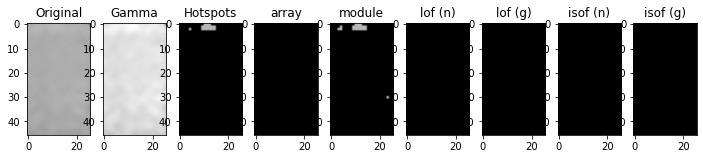

[-1.02647751 -1.00639598 -1.00630326 -1.02647751 -1.00719193 -1.00639598
 -0.98912084 -0.97470086 -1.01484549 -1.00630326]
[-2.19190912]
[-0.45560159 -0.45492034 -0.43487878 -0.45560159 -0.44760124 -0.45492034
 -0.46269042 -0.42853036 -0.44639773 -0.43487878]
[-0.73838182]
[-3.72280555 -1.66266142 -2.86395364 -3.72280555 -3.86984635 -1.60641918
 -1.04736817 -2.52847376 -4.45800952 -2.93246129]
[-2.19190912]
[-0.7535032  -0.67615578 -0.72548793 -0.7535032  -0.75503418 -0.67341648
 -0.51542561 -0.71321966 -0.7816517  -0.72548793]
[-0.73838182]
4362.jpg Normal [4.91936581]
[-0.98141284 -0.97668965 -1.01000311 -1.05912206 -0.98811783 -2.00136144
 -1.         -1.         -0.97754752 -1.        ]
[-2.23242643]
[-0.47267358 -0.46821592 -0.47579263 -0.5345693  -0.47382954 -0.62833078
 -0.47176877 -0.46846344 -0.46179497 -0.46202676]
[-0.74648529]
[-1.05411366 -1.04593627 -1.00289487 -1.15490819 -1.06540261 -1.69793372
 -1.00276639 -0.98752123 -1.02356335 -1.        ]
[-2.23242643]
[-0.54109825

[-0.99846271 -1.08429028 -0.97215155 -1.04032068 -0.98727364 -1.34679542
 -0.99189612 -1.01860128 -1.01556348 -1.00595163]
[-2.21296359]
[-0.48420607 -0.4683718  -0.47743534 -0.485451   -0.45955228 -0.54574833
 -0.48183889 -0.43573215 -0.48231934 -0.47194019]
[-0.74259272]
[-1.66456267 -1.04129203 -2.2490862  -1.27038133 -1.97812597 -1.02279673
 -1.87346322 -1.01969123 -2.86310767 -1.52249473]
[-2.21296359]
[-0.69003222 -0.53725412 -0.7427154  -0.5866586  -0.72168862 -0.44096521
 -0.71309593 -0.50690108 -0.76164986 -0.66008965]
[-0.74259272]
215.jpg Normal [5.16373076]
[-1.031519   -1.04971997 -1.12907091 -1.0362884  -1.42542344 -1.01387067
 -1.71291256 -1.17126626 -0.97527473 -1.25514017]
[-2.29054259]
[-0.47577118 -0.43484946 -0.468481   -0.49842134 -0.53138358 -0.43382552
 -0.61497419 -0.4610389  -0.43032876 -0.53688006]
[-0.75810852]
[-1.01463468 -1.68186699 -1.00814691 -1.01460298 -0.99978959 -1.49499288
 -0.99654378 -0.98528751 -1.39221212 -1.01248797]
[-2.29054259]
[-0.50139513 

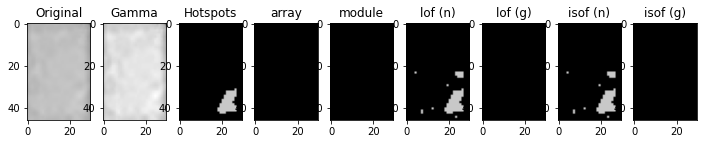

[-0.97982833 -0.99505378 -0.99519407 -0.99025341 -1.01045618 -1.00071044
 -1.01335037 -1.01363585 -1.17727965 -1.00522735]
[-2.22139715]
[-0.46458357 -0.50018436 -0.49201758 -0.46606509 -0.51663407 -0.48866877
 -0.48156098 -0.47970373 -0.56611762 -0.49130411]
[-0.74427943]
[-1.02503616 -1.37070741 -0.9922648  -1.03659345 -1.71380473 -1.24793239
 -1.0088629  -1.00670069 -2.58463586 -1.13987446]
[-2.22139715]
[-0.50503782 -0.5963445  -0.51061295 -0.511668   -0.69047412 -0.58988846
 -0.51331202 -0.49908678 -0.73146204 -0.5811373 ]
[-0.74427943]
3141.jpg Normal [5.26498513]
[-1.02245359 -1.03756673 -1.01784077 -0.97625105 -0.99058454 -0.99996098
 -1.06108799 -0.99480964 -0.99757441 -1.02529231]
[-2.19190912]
[-0.47505205 -0.4641424  -0.44467997 -0.43886502 -0.45635863 -0.44136121
 -0.47291122 -0.44396452 -0.4422894  -0.50256089]
[-0.73838182]
[-3.28168317 -2.7302802  -1.29005654 -2.13565118 -1.95090294 -1.05211469
 -2.59708906 -1.60641918 -1.07265054 -4.23744833]
[-2.19190912]
[-0.73537175

[-0.96510184 -0.98686034 -1.27231751 -0.96583999 -1.0179512  -1.0461051
 -2.50718511 -1.00124274 -1.01676117 -1.0461051 ]
[-2.21296359]
[-0.41642335 -0.45854971 -0.52525641 -0.41529871 -0.43403637 -0.43876265
 -0.67793497 -0.42541589 -0.45240555 -0.43876265]
[-0.74259272]
[-1.87346322 -1.01441261 -0.99684728 -2.2490862  -1.44198956 -2.73751237
 -1.16813263 -1.76996339 -0.99852864 -2.73751237]
[-2.21296359]
[-0.71309593 -0.51603907 -0.49340296 -0.7427154  -0.63899328 -0.75856419
 -0.4797642  -0.70278153 -0.52451105 -0.75856419]
[-0.74259272]
2511.jpg Normal [5.16373076]
[-1.2031175  -1.02348575 -1.04839944 -1.43916969 -1.54990586 -1.01682928
 -1.09217547 -1.05905763 -1.00403287 -1.24119562]
[-2.30310505]
[-0.59941853 -0.46944429 -0.49354501 -0.64567707 -0.59484034 -0.49773355
 -0.5472288  -0.55142331 -0.45847608 -0.60118337]
[-0.76062101]
[-1.37611089 -0.97829288 -1.00268819 -1.69325224 -1.41406633 -1.0258669
 -1.17226235 -1.11254307 -1.01932542 -1.44205117]
[-2.30310505]
[-0.63949615 -

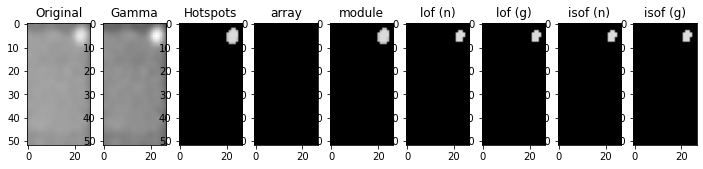

[-1.09076493 -0.99502483 -1.         -0.97355379 -1.00403287 -1.
 -0.98423865 -0.96417796 -1.0064349  -1.01871766]
[-2.30310505]
[-0.47156893 -0.44156954 -0.46692691 -0.45129498 -0.45847608 -0.45499554
 -0.48286881 -0.42684181 -0.47669632 -0.4472498 ]
[-0.76062101]
[-1.02328764 -1.03501468 -1.08230846 -1.         -1.01758149 -1.00598904
 -1.37611089 -1.01850639 -0.99221338 -1.0299702 ]
[-2.30310505]
[-0.46077053 -0.52152553 -0.55156364 -0.45025768 -0.55364253 -0.54885281
 -0.63949615 -0.48108305 -0.45185431 -0.48452512]
[-0.76062101]
4955.jpg Normal [6.35484636]
[-0.99883161 -1.07326007 -1.04834797 -0.99721299 -0.9382204  -1.21290004
 -1.07326007 -0.98251748 -1.         -1.        ]
[-2.5]
[-0.41427333 -0.43458514 -0.47598723 -0.44202949 -0.41907699 -0.50499426
 -0.43458514 -0.42058836 -0.40206682 -0.42898573]
[-0.8]
[-1.04651798 -1.25081051 -1.1908137  -0.9876643  -1.08189177 -1.46387732
 -1.17218024 -1.10278272 -1.10448669 -1.07573991]
[-2.5]
[-0.42956848 -0.48900617 -0.58637056 -0.4

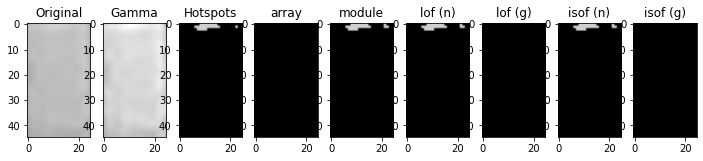

[-1.         -1.09163887 -1.0140746  -1.08977955 -1.         -0.9903778
 -0.99517705 -1.         -1.06015708 -1.        ]
[-2.23242643]
[-0.4492477  -0.50184902 -0.4645034  -0.51916734 -0.44602726 -0.47169972
 -0.44902138 -0.4492477  -0.51069143 -0.45063825]
[-0.74648529]
[-0.98368684 -1.0415046  -1.03019876 -1.04630616 -1.06313745 -1.00275374
 -1.21067867 -0.98368684 -1.03284931 -1.06540261]
[-2.23242643]
[-0.50761926 -0.47598571 -0.49189088 -0.47350628 -0.54977251 -0.49198254
 -0.58206743 -0.49787526 -0.49796506 -0.5581028 ]
[-0.74648529]
1144.jpg Normal [5.40040624]
[-1.14250236 -1.00719193 -1.01675367 -1.22338748 -1.02600887 -1.22338748
 -1.1125918  -1.03372077 -0.99058454 -1.03790651]
[-2.19190912]
[-0.54588901 -0.44760124 -0.46180133 -0.55836776 -0.49330856 -0.55836776
 -0.53322763 -0.4667443  -0.45635863 -0.50103215]
[-0.73838182]
[-3.94336674 -1.0410435  -1.00499641 -4.31096873 -2.59708906 -4.31096873
 -3.79632595 -2.13565118 -1.29005654 -3.28168317]
[-2.19190912]
[-0.76118928 

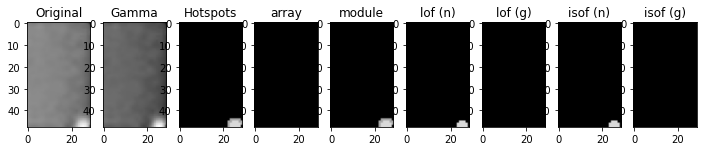

[-0.99792039 -0.99701002 -1.17766812 -1.02444735 -1.52017116 -1.13051594
 -0.96942011 -0.96942011 -1.0120986  -1.39819411]
[-2.30310505]
[-0.46770517 -0.45336304 -0.5287378  -0.45162623 -0.59965037 -0.50234361
 -0.4591757  -0.4591757  -0.46946134 -0.57348541]
[-0.76062101]
[-1.01987687 -1.12671219 -1.00481928 -1.24838598 -0.99780535 -0.98897929
 -1.01758149 -1.00570903 -1.54410161 -1.00498682]
[-2.30310505]
[-0.51801743 -0.56125613 -0.45770734 -0.57790139 -0.4531069  -0.48472203
 -0.55364253 -0.53101718 -0.67066025 -0.45295633]
[-0.76062101]
1150.jpg Normal [6.35484636]
[-1.37026985 -1.00368487 -1.1393599  -1.09182027 -1.44531505 -1.08872754
 -1.19003081 -0.96950272 -1.56483149 -1.20628796]
[-1.74407875]
[-0.6196798  -0.47529226 -0.55779313 -0.5158692  -0.64718632 -0.52126047
 -0.59620799 -0.43153074 -0.64330253 -0.57725689]
[-0.64881575]
[-1.20102701 -1.02139547 -1.11266425 -0.96635257 -1.21871598 -0.96635257
 -1.08540455 -1.01235283 -1.2892424  -1.07607397]
[-1.74407875]
[-0.57650312

[-1.42088699 -1.10809197 -1.         -1.27702121 -1.21290004 -1.18414694
 -1.80840163 -1.16454534 -1.14544338 -1.10232708]
[-2.5]
[-0.59531404 -0.52177232 -0.42820351 -0.56433046 -0.50499426 -0.55618979
 -0.69588033 -0.49884642 -0.53978127 -0.438553  ]
[-0.8]
[-1.21511602 -1.17218024 -1.19756173 -1.09576218 -1.02057376 -1.10278272
 -1.46387732 -1.05196063 -1.15937464 -0.9244837 ]
[-2.5]
[-0.58634357 -0.50064925 -0.45447945 -0.53537109 -0.47274512 -0.54284676
 -0.66213634 -0.4434114  -0.50874204 -0.41544796]
[-0.8]
3592.jpg Normal [10.]
[-1.02735747 -0.99507389 -0.98963134 -1.         -1.00219889 -1.02735747
 -1.00996635 -0.99715876 -0.98891626 -0.98236496]
[-2.29054259]
[-0.4579204  -0.44160512 -0.40902143 -0.43413808 -0.47526224 -0.4579204
 -0.45428653 -0.42914562 -0.44895793 -0.44880513]
[-0.75810852]
[-1.03856648 -1.01115194 -0.9888881  -1.016296   -1.64449216 -1.01409195
 -0.9767641  -0.98745355 -1.02836654 -1.1811147 ]
[-2.29054259]
[-0.5224533  -0.50560636 -0.46062013 -0.49616846

[-1.34836216 -1.01335037 -1.09120931 -1.34836216 -0.98803082 -0.99505378
 -0.98545278 -1.00522735 -1.09120931 -1.34788731]
[-2.22139715]
[-0.59903171 -0.48156098 -0.536882   -0.59903171 -0.47019649 -0.50018436
 -0.46643348 -0.49130411 -0.536882   -0.58559033]
[-0.74427943]
[-2.09475912 -0.97755373 -1.53721052 -2.09475912 -0.98331289 -1.02503616
 -1.01065798 -0.99959829 -1.53721052 -1.18312151]
[-2.22139715]
[-0.69988093 -0.4839944  -0.6586236  -0.69988093 -0.45477101 -0.50503782
 -0.49190933 -0.50157418 -0.6586236  -0.52296504]
[-0.74427943]
3551.jpg Normal [5.26498513]
[-1.04522035 -1.         -1.         -0.98811783 -1.01000311 -1.03854355
 -1.22505315 -0.99846436 -1.10316021 -0.99820913]
[-2.23242643]
[-0.51802293 -0.44905893 -0.47642986 -0.47382954 -0.47579263 -0.52870238
 -0.56340484 -0.45751514 -0.50272767 -0.50522202]
[-0.74648529]
[-1.06313745 -1.         -0.98586252 -0.98067769 -1.01773093 -1.06540261
 -1.28145351 -1.0217815  -1.08529985 -1.0178905 ]
[-2.23242643]
[-0.54977251

[-0.99074157 -0.97888551 -0.99625778 -1.73229078 -1.02813955 -0.97215155
 -1.00710949 -1.01546997 -1.08531374 -1.08348066]
[-2.21296359]
[-0.51722438 -0.47176664 -0.50677932 -0.60170347 -0.50698625 -0.47743534
 -0.49582212 -0.50247202 -0.47240851 -0.52656691]
[-0.74259272]
[-1.87346322 -1.04129203 -2.08511456 -1.3432918  -1.61720669 -1.07701431
 -1.27038133 -1.40884038 -0.98948607 -2.55144526]
[-2.21296359]
[-0.71309593 -0.53725412 -0.7342099  -0.5451948  -0.67906505 -0.53719659
 -0.5866586  -0.63375319 -0.50712654 -0.75600236]
[-0.74259272]
4202.jpg Normal [5.16373076]
[-1.01071014 -1.069439   -0.9565872  -1.04706638 -1.01365289 -1.01071014
 -1.19639799 -1.03682323 -0.97255661 -1.01421899]
[-2.20758709]
[-0.47244223 -0.48253307 -0.41879842 -0.48523334 -0.46054381 -0.47244223
 -0.546739   -0.44213571 -0.43773057 -0.46562173]
[-0.74151742]
[-1.67452825 -1.91335441 -0.97993556 -1.85296158 -1.4207607  -1.67452825
 -2.10276826 -1.10363625 -1.01903109 -1.20615533]
[-2.20758709]
[-0.60417124

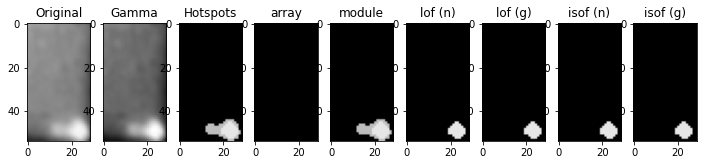

[-0.98894854 -1.00162771 -1.04175598 -1.42274311 -1.01242808 -1.0080331
 -1.1353206  -0.99071478 -0.9972982  -1.02426588]
[-2.18227328]
[-0.51607448 -0.51736064 -0.4867689  -0.65932021 -0.53035816 -0.5006813
 -0.54556547 -0.52293151 -0.53232249 -0.5317535 ]
[-0.73645466]
[-1.01272086 -1.0086103  -1.04021313 -1.38669452 -1.0098456  -1.0205782
 -1.12467131 -0.99696136 -0.99793844 -1.02580442]
[-2.18227328]
[-0.52496162 -0.54112169 -0.49442707 -0.65722235 -0.54255771 -0.51337192
 -0.56364654 -0.53389352 -0.52807466 -0.53890432]
[-0.73645466]
4570.jpg Normal [4.8114201]
[-1.         -1.22505315 -1.08893104 -1.         -1.04522035 -1.02880032
 -1.01811121 -0.99879518 -1.01935536 -0.98141284]
[-2.23242643]
[-0.47642986 -0.56340484 -0.54550163 -0.47965226 -0.51802293 -0.50903438
 -0.46795127 -0.49209496 -0.46647334 -0.47267358]
[-0.74648529]
[-1.03097495 -1.15490819 -1.06667822 -1.         -1.06540261 -1.01191506
 -1.04593627 -0.98556559 -0.9976678  -0.9998299 ]
[-2.23242643]
[-0.50386471 -0.

[-0.99753151 -1.02978735 -1.00039444 -1.09660774 -0.99798091 -1.36453126
 -1.0226248  -1.03874419 -1.0080331  -1.02978735]
[-2.18227328]
[-0.48548943 -0.49534406 -0.52015939 -0.43338705 -0.4465894  -0.5848776
 -0.48147191 -0.4683002  -0.5006813  -0.49534406]
[-0.73645466]
[-1.0206557  -1.00368336 -1.35638426 -1.01507238 -1.02586074 -1.14909205
 -0.98789115 -1.04021313 -1.06160992 -1.00368336]
[-2.18227328]
[-0.51053097 -0.53617231 -0.65002372 -0.47612739 -0.43579269 -0.50570569
 -0.5300539  -0.49442707 -0.53889869 -0.53617231]
[-0.73645466]
2665.jpg Single-Hotspot [4.8114201]


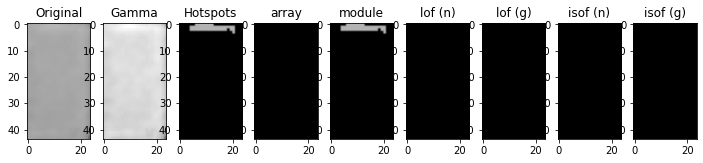

[-1.03238246 -1.15070986 -0.99502483 -1.52017116 -0.98023878 -1.0123495
 -0.99701002 -0.96942011 -1.09076493 -2.60956992]
[-2.30310505]
[-0.47458506 -0.50902807 -0.44156954 -0.59965037 -0.45757815 -0.45150014
 -0.45336304 -0.4591757  -0.47156893 -0.73641804]
[-0.76062101]
[-1.09822332 -1.01413547 -1.65478708 -1.00502768 -1.00734316 -1.20612292
 -1.32078623 -1.01718482 -1.03501468 -1.30411675]
[-2.30310505]
[-0.53566822 -0.48977608 -0.68777567 -0.46202634 -0.5452468  -0.57979067
 -0.62720765 -0.53944286 -0.52152553 -0.5701527 ]
[-0.76062101]
48.jpg Normal [6.35484636]
[-1.02321378 -1.00290772 -0.98708297 -1.00921444 -1.01473948 -1.
 -1.02139661 -0.99686275 -1.02949691 -0.98334585]
[-2.1083795]
[-0.43662813 -0.4172671  -0.45037445 -0.48004872 -0.43213957 -0.40858826
 -0.44613802 -0.41428552 -0.44926905 -0.46374417]
[-0.7216759]
[-1.21744752 -0.99250483 -1.53681535 -1.00499295 -1.18398702 -1.06094368
 -1.00427975 -1.09510877 -1.30042276 -1.6816348 ]
[-2.1083795]
[-0.56876755 -0.51925152 -

[-0.95785819 -1.0493973  -1.41378843 -0.95785819 -0.9846433  -0.98389985
 -0.98911701 -0.95731199 -1.25498227 -1.03405506]
[-2.28783523]
[-0.47492971 -0.47189665 -0.55604736 -0.47492971 -0.50678162 -0.47025173
 -0.45463952 -0.44240617 -0.52976185 -0.4520756 ]
[-0.75756705]
[-1.65003108 -1.83483764 -1.01086833 -1.55574359 -1.25797054 -1.71977881
 -2.35574494 -2.04086814 -0.97764978 -1.912585  ]
[-2.28783523]
[-0.63056587 -0.62612947 -0.4450916  -0.62741701 -0.5360329  -0.63012374
 -0.66888491 -0.6288505  -0.49214485 -0.62704603]
[-0.75756705]
1350.jpg Normal [6.13529184]
[-1.00124274 -1.0461051  -0.97574105 -0.99697352 -1.0567168  -2.66050984
 -1.03873298 -1.0253092  -0.98566555 -1.0179512 ]
[-2.21296359]
[-0.42541589 -0.43876265 -0.44627274 -0.41927059 -0.45670977 -0.692264
 -0.4599563  -0.44429156 -0.42637721 -0.43403637]
[-0.74259272]
[-1.16405967 -1.82113185 -1.0076053  -1.40884038 -2.55144526 -1.35602584
 -0.99069424 -1.87346322 -1.48224215 -1.09172345]
[-2.21296359]
[-0.5658356  -

[-1.17445352 -0.98794837 -0.99036516 -1.00639598 -1.00266167 -1.00520727
 -0.99601835 -1.01675367 -1.96388635 -1.05763283]
[-2.19190912]
[-0.51135701 -0.43064832 -0.45464213 -0.45492034 -0.43425428 -0.47577539
 -0.46178892 -0.46180133 -0.65818766 -0.47286105]
[-0.73838182]
[-1.03259674 -3.72280555 -1.55544964 -2.79711692 -2.86395364 -2.39295855
 -1.66266142 -2.13565118 -1.01855631 -1.12792845]
[-2.19190912]
[-0.51248969 -0.7535032  -0.65278055 -0.72352716 -0.72548793 -0.7122552
 -0.67615578 -0.70030897 -0.45807119 -0.55698426]
[-0.73838182]
388.jpg Normal [4.91936581]
[-1.0461051  -0.98198027 -1.0179512  -1.57820918 -0.96510184 -0.96583999
 -1.0162485  -1.0179512  -1.09649981 -0.96583999]
[-2.21296359]
[-0.43876265 -0.4501497  -0.43403637 -0.58397408 -0.41642335 -0.41529871
 -0.44553744 -0.43403637 -0.48061671 -0.41529871]
[-0.74259272]
[-2.2490862  -1.02134166 -1.24033447 -1.06722996 -1.48224215 -1.9257946
 -2.80031002 -1.30939282 -0.9978503  -1.82113185]
[-2.21296359]
[-0.7427154  -0

[-0.99637094 -1.02676665 -1.17126626 -1.09069923 -1.02676665 -1.01387067
 -0.99637094 -0.97527473 -1.21761107 -1.04611624]
[-2.29054259]
[-0.43557645 -0.48897451 -0.4610389  -0.45977633 -0.48897451 -0.43382552
 -0.43557645 -0.43032876 -0.52462483 -0.4867462 ]
[-0.75810852]
[-1.09348    -1.02978978 -0.97372123 -1.06309724 -1.016296   -1.5323677
 -1.10880915 -1.30697118 -1.00399616 -0.98481765]
[-2.29054259]
[-0.55222888 -0.48919249 -0.52964812 -0.54438949 -0.49616846 -0.6614043
 -0.54942276 -0.57770444 -0.45898044 -0.49932877]
[-0.75810852]
3751.jpg Normal [6.17365827]
[-1.02339181 -0.94472517 -0.9836163  -0.99486842 -0.98604885 -0.99712919
 -1.0493973  -1.04797636 -1.00684853 -0.99002105]
[-2.28783523]
[-0.44290857 -0.43644697 -0.45991963 -0.43624255 -0.43887798 -0.44655483
 -0.47189665 -0.44152104 -0.45074441 -0.44578182]
[-0.75756705]
[-2.16915128 -1.17681115 -2.35574494 -0.97385423 -1.80842721 -1.83483764
 -1.01047477 -1.09566454 -1.43720892 -1.59817296]
[-2.28783523]
[-0.6293962  -

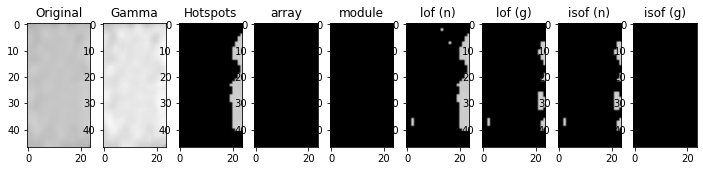

[-0.99519407 -1.00071044 -0.99225892 -1.01335037 -1.00522735 -1.01335037
 -0.99141251 -0.97982833 -1.0288633  -0.99505378]
[-2.22139715]
[-0.49201758 -0.48866877 -0.47945013 -0.48156098 -0.49130411 -0.48156098
 -0.49081263 -0.46458357 -0.48357296 -0.50018436]
[-0.74427943]
[-1.65157629 -2.4394872  -1.96610462 -1.21934095 -2.15908637 -1.21934095
 -1.53721052 -1.84239838 -1.01137237 -2.82215185]
[-2.22139715]
[-0.67459557 -0.72642784 -0.69516162 -0.59201162 -0.70272789 -0.59201162
 -0.6586236  -0.69375204 -0.51159283 -0.74085143]
[-0.74427943]
4943.jpg Normal [5.26498513]
[-1.         -1.         -1.06360827 -0.99846436 -1.         -1.
 -1.         -1.         -0.97754752 -0.98951171]
[-2.23242643]
[-0.44665185 -0.46202676 -0.50733496 -0.45751514 -0.46286685 -0.44662054
 -0.43896669 -0.47965226 -0.46179497 -0.46339422]
[-0.74648529]
[-1.04922178 -0.98099937 -0.97464584 -1.19352114 -1.07559376 -1.00276639
 -1.06145264 -1.06667822 -1.15490819 -1.01001985]
[-2.23242643]
[-0.53111441 -0.4780

[-0.97148848 -1.00936829 -1.61470269 -1.00271331 -1.13051594 -1.02634698
 -0.99464008 -1.00530765 -1.         -1.0012584 ]
[-2.30310505]
[-0.44663687 -0.53063173 -0.63774974 -0.48956284 -0.50234361 -0.50335975
 -0.51957406 -0.51047223 -0.46692691 -0.50631002]
[-0.76062101]
[-1.         -1.44205117 -1.33459765 -1.00411902 -0.98393848 -1.1396083
 -1.32078623 -1.05726415 -1.01469109 -1.2950775 ]
[-2.30310505]
[-0.46103319 -0.65409654 -0.58980092 -0.51328147 -0.45977352 -0.57030669
 -0.62720765 -0.54834447 -0.48998751 -0.62019549]
[-0.76062101]
3619.jpg Normal [6.35484636]
[-0.99697352 -0.97574105 -1.06664309 -1.04135251 -0.96583999 -0.97574105
 -0.96583999 -1.0253092  -1.60578072 -1.00124274]
[-2.21296359]
[-0.41927059 -0.44627274 -0.4419093  -0.45276853 -0.41529871 -0.44627274
 -0.41529871 -0.44429156 -0.58533121 -0.42541589]
[-0.74259272]
[-1.66456267 -1.05259813 -2.37002983 -2.80031002 -1.76996339 -1.04129203
 -1.76996339 -2.30955802 -0.98075726 -1.30939282]
[-2.21296359]
[-0.69003222 

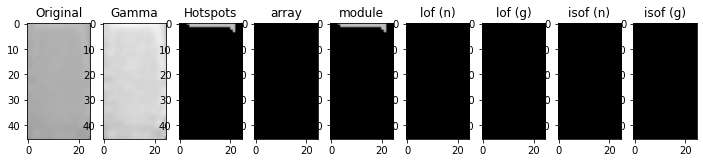

[-1.03057792 -1.         -0.98141284 -1.0045977  -1.04681529 -1.
 -1.         -1.01000311 -1.09163887 -1.02179453]
[-2.23242643]
[-0.45387653 -0.47642986 -0.47267358 -0.45855844 -0.53254089 -0.4549513
 -0.47642986 -0.47579263 -0.50184902 -0.46487797]
[-0.74648529]
[-1.01834978 -0.98752123 -1.01191506 -1.01578555 -1.13745706 -0.97443401
 -0.98752123 -1.03019876 -1.06193774 -1.02356335]
[-2.23242643]
[-0.49924364 -0.47614292 -0.50447368 -0.48001525 -0.56546833 -0.45299815
 -0.48351638 -0.49189088 -0.48612956 -0.49986579]
[-0.74648529]
4604.jpg Normal [5.40040624]
[-1.03740318 -1.02360202 -1.02529231 -1.01592859 -0.99898698 -1.47487456
 -1.08356233 -1.03740318 -1.04995208 -1.03335965]
[-2.19190912]
[-0.48396438 -0.45279741 -0.50256089 -0.4963391  -0.45778194 -0.58903065
 -0.53576919 -0.48396438 -0.5031949  -0.4903117 ]
[-0.73838182]
[-3.35520357 -1.14945092 -4.16392794 -3.79632595 -2.32605863 -0.98188704
 -4.75209111 -3.35520357 -4.53152992 -3.94336674]
[-2.19190912]
[-0.73836307 -0.57058

[-1.00466461 -0.98891626 -0.99715876 -1.01387067 -1.0207702  -1.00406541
 -0.98891626 -1.01087227 -0.98236496 -2.47371976]
[-2.29054259]
[-0.43517997 -0.44895793 -0.42914562 -0.43382552 -0.44810524 -0.47732454
 -0.44895793 -0.41549622 -0.44880513 -0.69525042]
[-0.75810852]
[-1.27308674 -0.97328018 -1.00250051 -1.01460298 -1.1956366  -1.8780848
 -0.97328018 -1.01463468 -1.39221212 -1.58909042]
[-2.29054259]
[-0.57148635 -0.52245047 -0.5055709  -0.48626877 -0.54639578 -0.7167553
 -0.52245047 -0.50139513 -0.62002345 -0.58238883]
[-0.75810852]
3816.jpg Normal [6.17365827]
[-1.24487042 -1.12923758 -0.99038553 -1.51799945 -2.85586233 -1.05033436
 -0.97982833 -1.87537189 -1.0616729  -0.99190772]
[-2.22139715]
[-0.54691297 -0.52042904 -0.43870429 -0.60481338 -0.74655552 -0.50799258
 -0.46458357 -0.65780362 -0.46872326 -0.45479041]
[-0.74427943]
[-1.06001396 -1.05432657 -0.99335602 -1.23773878 -2.3447869  -1.00627186
 -1.04021626 -1.59282831 -0.95288601 -1.01715927]
[-2.22139715]
[-0.49265433 -

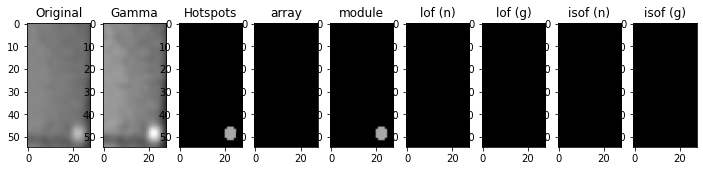

[-1.07052923 -1.02576514 -1.01395188 -0.9999755  -1.00397477 -1.00162771
 -1.1353206  -1.03874419 -1.02426588 -1.26023494]
[-2.18227328]
[-0.53514275 -0.44356342 -0.4684493  -0.46928542 -0.51719563 -0.51736064
 -0.54556547 -0.4683002  -0.5317535  -0.60673352]
[-0.73645466]
[-1.20988465 -1.04005986 -1.0441321  -0.98439252 -0.99425076 -1.06160992
 -1.27555689 -0.99306567 -1.12467131 -1.44731505]
[-2.18227328]
[-0.59739518 -0.45773144 -0.48913802 -0.43860136 -0.52582873 -0.53889869
 -0.6325065  -0.47847532 -0.56364654 -0.67435301]
[-0.73645466]
3180.jpg Normal [4.8114201]
[-1.02634698 -0.98423865 -1.         -1.03069396 -1.         -1.0086334
 -1.04839944 -1.         -1.01529621 -1.01682928]
[-2.30310505]
[-0.50335975 -0.48286881 -0.47939105 -0.50743125 -0.45499554 -0.52483489
 -0.49354501 -0.46255972 -0.4882644  -0.49773355]
[-0.76062101]
[-1.17226235 -1.00570903 -1.02595095 -1.15165812 -1.02842637 -1.61632192
 -1.26936877 -1.01993924 -1.07259219 -1.01208105]
[-2.30310505]
[-0.57855602 -

[-0.989454   -1.01898521 -1.         -1.01731191 -0.98323796 -1.
 -1.01529621 -0.99502483 -1.0012584  -1.00657049]
[-2.30310505]
[-0.46775893 -0.48091146 -0.47396468 -0.51340822 -0.4761508  -0.46255972
 -0.4882644  -0.44156954 -0.50631002 -0.48094434]
[-0.76062101]
[-1.00985524 -1.08834693 -1.03101015 -1.22725445 -1.00268819 -1.02167496
 -1.15165812 -0.98630225 -1.58021176 -1.08230846]
[-2.30310505]
[-0.54445919 -0.54692196 -0.48353612 -0.57782411 -0.55898212 -0.50547563
 -0.57337111 -0.4613108  -0.67316192 -0.55156364]
[-0.76062101]
4412.jpg Normal [6.35484636]
[-0.98198027 -0.98566555 -0.96510184 -1.05126895 -1.20994491 -0.98566555
 -1.01676117 -3.38418957 -1.00124274 -1.06993558]
[-2.21296359]
[-0.4501497  -0.42637721 -0.41642335 -0.44423486 -0.50870388 -0.42637721
 -0.45240555 -0.75610845 -0.42541589 -0.47614231]
[-0.74259272]
[-1.05259813 -2.30955802 -1.66456267 -1.24033447 -0.97921812 -2.30955802
 -1.00613274 -1.75092355 -1.61720669 -1.02933504]
[-2.21296359]
[-0.53802981 -0.7447

[-1.01960458 -1.11748325 -1.02623394 -0.97411924 -0.98757129 -1.0017881
 -1.26991458 -0.98757129 -0.97797434 -0.99925094]
[-1.85637122]
[-0.43760879 -0.45430863 -0.45291405 -0.43107437 -0.43137084 -0.45737155
 -0.53388053 -0.43137084 -0.42376218 -0.4342831 ]
[-0.67127424]
[-1.37708017 -0.97440965 -3.07184959 -1.15886646 -2.06902469 -1.0474507
 -0.97052742 -2.06902469 -1.60023405 -1.49931839]
[-1.85637122]
[-0.56063042 -0.48884142 -0.77119876 -0.52689009 -0.67089954 -0.45251298
 -0.4225078  -0.67089954 -0.59523486 -0.56180092]
[-0.67127424]
1556.jpg Normal [2.2718059]
[-1.07590222 -1.         -1.04522035 -1.0045977  -0.98951171 -1.19216581
 -1.03734095 -1.01962991 -0.98811783 -1.09935727]
[-2.23242643]
[-0.54471532 -0.46286685 -0.51802293 -0.45855844 -0.46339422 -0.56058074
 -0.53917288 -0.5043812  -0.47382954 -0.55743314]
[-0.74648529]
[-1.09170954 -0.99890351 -1.06313745 -1.01021624 -0.98745029 -1.2578619
 -1.05514018 -1.02488483 -0.98067769 -1.12331713]
[-2.23242643]
[-0.56834354 -0.

[-1.00730795 -0.96942011 -1.0274841  -1.00409771 -1.         -1.07285849
 -1.04839944 -1.00730795 -1.03069396 -1.00271331]
[-2.30310505]
[-0.52252288 -0.4591757  -0.48054506 -0.48253962 -0.46265538 -0.55680562
 -0.49354501 -0.52252288 -0.50743125 -0.48956284]
[-0.76062101]
[-1.37611089 -1.00498682 -1.00734316 -1.22725445 -1.02842637 -1.69325224
 -1.18986789 -1.37611089 -1.11254307 -1.01631604]
[-2.30310505]
[-0.63949615 -0.45295633 -0.5452468  -0.57782411 -0.48407137 -0.68963955
 -0.57686558 -0.63949615 -0.55285734 -0.51421818]
[-0.76062101]
3396.jpg Normal [6.35484636]
[-1.52548602 -1.23298793 -1.03478527 -1.29721986 -1.52548602 -1.63865457
 -1.90407379 -1.01623578 -0.98909996 -1.20863319]
[-1.59109993]
[-0.64683347 -0.47552946 -0.50727324 -0.58011232 -0.64683347 -0.59358081
 -0.73823965 -0.44991365 -0.41122002 -0.54529554]
[-0.61821999]
[-1.27937374 -1.27398893 -1.04056991 -1.11193996 -1.27937374 -1.65035149
 -1.49183615 -0.98399966 -1.03564677 -1.10057805]
[-1.59109993]
[-0.5761428 

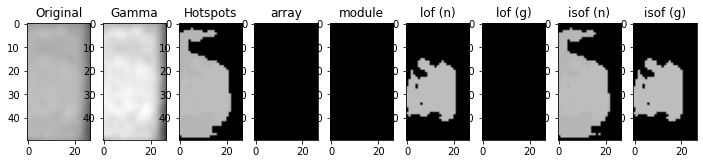

[-1.00804312 -1.02780605 -1.04931505 -1.03957407 -0.99163592 -0.96954301
 -1.03100501 -1.20908601 -1.02788849 -0.96221398]
[-2.19426689]
[-0.46006141 -0.47661883 -0.4995877  -0.45124355 -0.45853724 -0.4650833
 -0.47395735 -0.53288795 -0.47441085 -0.46525817]
[-0.73885338]
[-2.79637445 -1.78091279 -1.50216122 -4.43760035 -2.54666412 -3.18142396
 -2.23775563 -1.13062357 -2.05676069 -3.37776109]
[-2.19426689]
[-0.77384276 -0.74962205 -0.70896661 -0.7897104  -0.77175131 -0.77489061
 -0.76862472 -0.57783661 -0.76499304 -0.77856928]
[-0.73885338]
773.jpg Normal [4.94614554]
[-1.34916239 -0.96421194 -1.23575735 -1.76695223 -1.46897934 -1.10542316
 -1.02526644 -1.00965519 -1.23575735 -1.34916239]
[-1.85637122]
[-0.54020084 -0.46786308 -0.51332698 -0.60216163 -0.52850208 -0.51253262
 -0.47365913 -0.47099007 -0.51332698 -0.54020084]
[-0.67127424]
[-2.75136564 -1.69242086 -2.39817924 -3.82836613 -3.07184959 -2.06902469
 -1.35912883 -1.98635556 -2.39817924 -2.69904173]
[-1.85637122]
[-0.75009967 -

[-0.98389985 -0.94472517 -0.98911701 -1.22026979 -0.98050869 -0.98604885
 -1.04797636 -1.24938246 -0.95731199 -1.00684853]
[-2.28783523]
[-0.47025173 -0.43644697 -0.45463952 -0.55632723 -0.43164561 -0.43887798
 -0.44152104 -0.51876178 -0.44240617 -0.45074441]
[-0.75756705]
[-1.03746856 -1.48985394 -1.04446791 -1.03587725 -2.26244811 -1.912585
 -1.25797054 -1.03587725 -0.97764978 -1.71977881]
[-2.28783523]
[-0.49926433 -0.60414212 -0.47041506 -0.47037828 -0.6425779  -0.62704603
 -0.5360329  -0.47037828 -0.49214485 -0.63012374]
[-0.75756705]
982.jpg Normal [6.13529184]
[-1.01898521 -1.09217547 -1.02634698 -1.01580022 -1.02634698 -0.99502483
 -0.98323796 -1.13818594 -1.0086334  -1.00409771]
[-2.30310505]
[-0.48091146 -0.5472288  -0.50335975 -0.5404477  -0.50335975 -0.44156954
 -0.4761508  -0.58273979 -0.52483489 -0.48253962]
[-0.76062101]
[-1.00570903 -1.61632192 -1.07259219 -1.37611089 -1.05726415 -1.
 -1.02167496 -1.77332259 -1.34792643 -1.1396083 ]
[-2.30310505]
[-0.53101718 -0.6782857

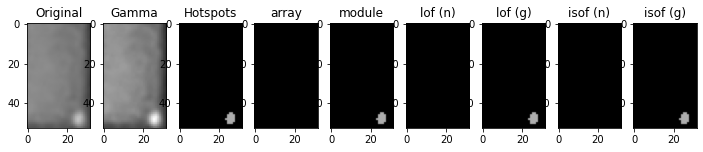

[-1.04931505 -0.98053355 -1.04233163 -1.00804312 -0.97711426 -0.99925114
 -0.98785936 -1.7943548  -0.9982933  -1.01058856]
[-2.19426689]
[-0.4995877  -0.44320336 -0.45338105 -0.46006141 -0.45486603 -0.44999206
 -0.46293019 -0.64435769 -0.46079648 -0.44871237]
[-0.73885338]
[-1.01581333 -2.36367029 -1.63863334 -1.04062394 -2.17677873 -3.5092879
 -1.15467851 -1.06221188 -1.06211501 -1.42279446]
[-2.19426689]
[-0.51234537 -0.77018643 -0.72704069 -0.57866039 -0.76862472 -0.78173632
 -0.5843777  -0.46406824 -0.54766083 -0.67935515]
[-0.73885338]
3368.jpg Normal [4.94614554]
[-0.99782788 -1.         -1.00399853 -1.12379339 -1.00035479 -0.97621145
 -1.         -1.05354445 -0.99741754 -1.        ]
[-2.26337675]
[-0.44101953 -0.45826583 -0.45497451 -0.53718524 -0.49464269 -0.44336689
 -0.4354733  -0.45581    -0.46981394 -0.43793575]
[-0.75267535]
[-1.05770583 -1.20803583 -1.10377551 -1.02065422 -0.99101035 -1.42810746
 -1.14006168 -1.09242037 -1.05548893 -1.09666395]
[-2.26337675]
[-0.54807817 

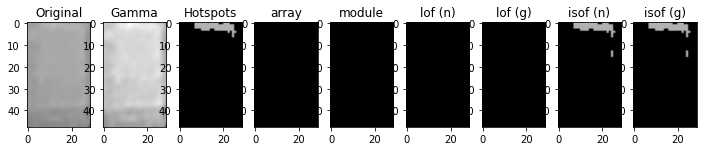

[-0.96375781 -1.08202219 -1.01341463 -0.97846586 -1.16985254 -0.96375781
 -1.01341463 -0.9999755  -1.01842206 -0.99309017]
[-2.18227328]
[-0.43030869 -0.476446   -0.45157797 -0.44783645 -0.52659483 -0.43030869
 -0.45157797 -0.46928542 -0.43677284 -0.46752686]
[-0.73645466]
[-0.98775133 -1.01436863 -1.05156894 -1.00425633 -1.00277592 -0.98789115
 -1.03475273 -1.02327982 -1.0206557  -1.04554025]
[-2.18227328]
[-0.52567889 -0.46767338 -0.49846733 -0.47907021 -0.45258738 -0.5300539
 -0.50398032 -0.48442797 -0.51053097 -0.53080036]
[-0.73645466]
2710.jpg Normal [4.8114201]
[-0.99697352 -1.03873298 -1.04885833 -1.00124274 -0.98198027 -1.01860128
 -1.0461051  -1.01864349 -0.99751615 -1.00124274]
[-2.21296359]
[-0.41927059 -0.4599563  -0.43762017 -0.42541589 -0.4501497  -0.43573215
 -0.43876265 -0.43832016 -0.42973403 -0.42541589]
[-0.74259272]
[-1.76996339 -1.03870212 -2.80031002 -1.44198956 -1.02134166 -2.13977178
 -2.30955802 -1.11021717 -1.66456267 -1.40884038]
[-2.21296359]
[-0.70278153 -

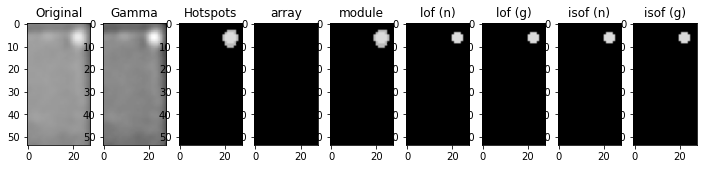

[-1.01301829 -1.08498464 -1.02350712 -0.99396112 -1.00727591 -1.04011828
 -1.01301829 -1.03891092 -0.9982933  -1.03981646]
[-2.19426689]
[-0.492334   -0.49245635 -0.50347266 -0.44966841 -0.49280198 -0.5053802
 -0.492334   -0.51169646 -0.46079648 -0.49308859]
[-0.73885338]
[-3.37776109 -2.23775563 -4.30416735 -1.50216122 -3.77234153 -2.9231358
 -3.37776109 -3.05180333 -1.00762118 -2.73347032]
[-2.19426689]
[-0.77856928 -0.76862472 -0.78597909 -0.70896661 -0.78332467 -0.77384276
 -0.77856928 -0.77489061 -0.50375394 -0.77384276]
[-0.73885338]
3195.jpg Normal [4.94614554]
[-1.32165969 -1.         -1.06182264 -1.02179453 -1.57037014 -1.37304614
 -0.98141284 -1.19216581 -3.29381879 -1.15614126]
[-2.23242643]
[-0.60705994 -0.43896669 -0.54015272 -0.46487797 -0.68271718 -0.61831625
 -0.47267358 -0.56058074 -0.74908535 -0.54834026]
[-0.74648529]
[-1.19352114 -1.         -1.04922178 -0.9976678  -1.39404984 -1.23427028
 -1.00275374 -1.10016635 -3.00895814 -1.09329746]
[-2.23242643]
[-0.57850379 -

[-0.99643903 -1.08675559 -1.03234801 -1.99687312 -0.96954301 -1.28884562
 -0.97711426 -1.03234801 -1.03957407 -1.02587299]
[-2.19426689]
[-0.43559366 -0.50150496 -0.45991634 -0.65079862 -0.4650833  -0.55302383
 -0.45486603 -0.45991634 -0.45124355 -0.46023483]
[-0.73885338]
[-2.54666412 -1.01637384 -3.77234153 -1.01587292 -1.29019388 -1.01719223
 -2.79637445 -3.90386835 -1.99771956 -1.06211501]
[-2.19426689]
[-0.77175131 -0.52599299 -0.78332467 -0.47470988 -0.64764734 -0.48981734
 -0.77384276 -0.78332467 -0.76499304 -0.54766083]
[-0.73885338]
1027.jpg Normal [4.94614554]
[-0.9889397  -1.13301684 -1.01335037 -1.13301684 -1.02823262 -1.01045618
 -1.43825297 -1.0435343  -1.01537777 -0.99785913]
[-2.22139715]
[-0.50193184 -0.55166578 -0.48156098 -0.55166578 -0.50502186 -0.51663407
 -0.62616142 -0.47059745 -0.47703296 -0.50983339]
[-0.74427943]
[-1.31857008 -2.29433853 -1.00670069 -2.29433853 -1.90177738 -1.48002764
 -2.98379468 -0.95854065 -1.09236396 -1.65157629]
[-2.22139715]
[-0.5922787 

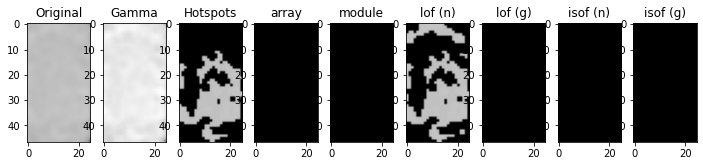

[-0.99610124 -1.01842206 -1.01371604 -2.39648009 -0.9999755  -1.06477823
 -0.96375781 -1.02605343 -1.00298103 -1.0112828 ]
[-2.18227328]
[-0.47367424 -0.43677284 -0.46217733 -0.69249245 -0.46928542 -0.44482871
 -0.43030869 -0.46041717 -0.43492928 -0.45184345]
[-0.73645466]
[-1.25366614 -1.04021313 -1.02116697 -1.61336434 -1.02326361 -1.03092302
 -1.05066136 -1.0098456  -1.00482146 -1.00059605]
[-2.18227328]
[-0.61683133 -0.49442707 -0.54505452 -0.59338695 -0.46523687 -0.5171077
 -0.50830278 -0.54255771 -0.46924798 -0.52875555]
[-0.73645466]
1033.jpg Normal [4.8114201]
[-0.99786548 -1.00409771 -1.0120986  -1.0274841  -1.0012584  -0.989454
 -1.01731191 -0.98423865 -0.99792039 -1.0086334 ]
[-2.30310505]
[-0.47625779 -0.48253962 -0.46946134 -0.48054506 -0.50631002 -0.46775893
 -0.51340822 -0.48286881 -0.46770517 -0.52483489]
[-0.76062101]
[-1.02595095 -1.26936877 -0.99221338 -1.01718482 -1.2950775  -1.02701229
 -1.11254307 -1.01631604 -0.99775641 -1.58021176]
[-2.30310505]
[-0.51100025 -0.

[-1.1613046  -0.98926958 -1.06695803 -1.00209869 -1.18574446 -1.04528802
 -1.26097936 -1.057235   -1.06161777 -1.0239117 ]
[-2.26337675]
[-0.56861157 -0.45796927 -0.49995587 -0.46473751 -0.58227392 -0.50404436
 -0.60508653 -0.48738189 -0.54408408 -0.47238015]
[-0.75267535]
[-1.42810746 -1.01142306 -1.0610713  -1.04864812 -1.52622628 -1.15185433
 -1.67579766 -1.09107312 -1.22797839 -0.99392844]
[-2.26337675]
[-0.65594469 -0.45300611 -0.54461192 -0.47025484 -0.69568846 -0.58479378
 -0.73009583 -0.53352618 -0.58936939 -0.46610678]
[-0.75267535]
3787.jpg Normal [5.79931571]
[-1.00032305 -0.96221398 -1.07170875 -1.06638145 -0.99925114 -1.06638145
 -1.04931505 -1.03981646 -1.02839984 -1.00962414]
[-2.19426689]
[-0.45584132 -0.46525817 -0.48027833 -0.4464874  -0.44999206 -0.4464874
 -0.4995877  -0.49308859 -0.45223502 -0.50664902]
[-0.73885338]
[-1.73348631 -1.01581333 -2.42466823 -1.26309304 -1.63863334 -1.29019388
 -1.00863851 -2.60766206 -1.00041009 -3.70657813]
[-2.19426689]
[-0.74345615 

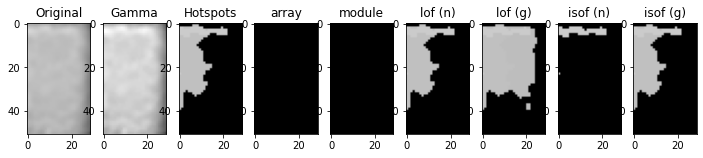

[-1.05671532 -1.01341463 -0.96183205 -1.04792731 -1.00298103 -1.62867929
 -1.047817   -1.02576514 -1.02574963 -0.98629617]
[-2.18227328]
[-0.50310399 -0.45157797 -0.43068347 -0.43130332 -0.43492928 -0.59920288
 -0.50152527 -0.44356342 -0.46258448 -0.42424724]
[-0.73645466]
[-1.01290836 -0.98775133 -1.04020047 -1.0086103  -0.99375047 -1.05528394
 -1.00451874 -1.2317754  -1.01046469 -1.02580442]
[-2.18227328]
[-0.4646787  -0.52567889 -0.51077123 -0.54112169 -0.5262739  -0.47347007
 -0.4839188  -0.60147795 -0.47564148 -0.53890432]
[-0.73645466]
1806.jpg Normal [4.8114201]
[-1.05397911 -0.95908602 -0.97621145 -1.30467708 -1.06881856 -1.08651307
 -1.07455887 -1.00035479 -1.06722761 -0.99492255]
[-2.26337675]
[-0.50593754 -0.45558748 -0.44336689 -0.62306508 -0.4674367  -0.4950681
 -0.45849533 -0.49464269 -0.50716869 -0.46098965]
[-0.75267535]
[-1.10377551 -1.03782766 -1.00594411 -1.6369091  -1.0806355  -1.08894992
 -1.06735629 -0.9876682  -1.06582224 -1.01013221]
[-2.26337675]
[-0.5330784  -

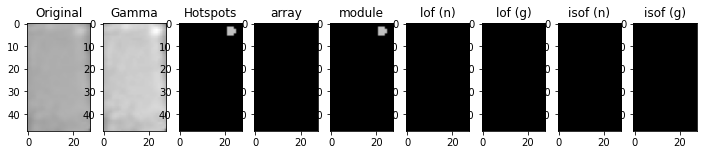

[-0.98453092 -1.03633396 -1.00435068 -0.99352092 -1.04221206 -1.00242253
 -0.98848023 -1.27131728 -1.         -1.01505804]
[-2.10649651]
[-0.46621606 -0.48331855 -0.44655078 -0.43980811 -0.4842912  -0.47095986
 -0.47176102 -0.52609968 -0.44231928 -0.458054  ]
[-0.7212993]
[-1.0287769  -1.04586868 -1.09912779 -1.31449129 -1.08707597 -1.072234
 -1.06319567 -1.03810221 -1.17137429 -1.08007807]
[-2.10649651]
[-0.53564325 -0.48735395 -0.5621286  -0.65487087 -0.49531081 -0.51765011
 -0.54590166 -0.43964998 -0.575363   -0.55097386]
[-0.7212993]
3744.jpg Normal [4.04107125]
[-1.41378843 -1.02099468 -0.95731199 -1.02099468 -1.33951735 -0.99712919
 -0.9846433  -1.0493973  -0.98604885 -0.9374293 ]
[-2.28783523]
[-0.55604736 -0.44118727 -0.44240617 -0.44118727 -0.60267275 -0.44655483
 -0.50678162 -0.47189665 -0.43887798 -0.43675003]
[-0.75756705]
[-0.98567181 -1.43720892 -0.95985329 -1.43720892 -0.98097952 -1.9981071
 -0.9784067  -1.03746856 -1.912585   -1.25797054]
[-2.28783523]
[-0.44817501 -0.5

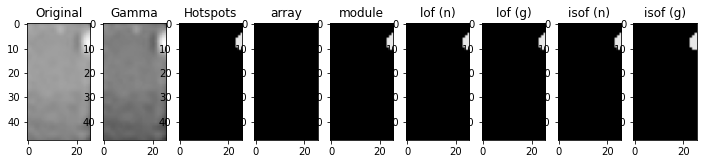

[-1.03955012 -1.04792731 -1.09660774 -1.14206902 -1.01854412 -3.34387464
 -1.07388319 -0.92931569 -0.99309017 -0.98858691]
[-2.18227328]
[-0.45466198 -0.43130332 -0.43338705 -0.52728972 -0.43058843 -0.77213468
 -0.49318983 -0.42389638 -0.46752686 -0.44828369]
[-0.73645466]
[-1.20988465 -1.04020047 -1.0086103  -1.01056614 -0.98775133 -2.31620957
 -1.01290836 -1.01979458 -1.03365911 -1.01424198]
[-2.18227328]
[-0.59739518 -0.51077123 -0.54112169 -0.45618419 -0.52567889 -0.70246648
 -0.4646787  -0.52713412 -0.53391312 -0.47077242]
[-0.73645466]
1147.jpg Normal [4.8114201]
[-1.38186707 -0.94472517 -1.03405506 -1.04797636 -0.97628869 -0.99486842
 -0.97628869 -0.98321947 -0.99712919 -1.33727619]
[-2.28783523]
[-0.56947632 -0.43644697 -0.4520756  -0.44152104 -0.45939925 -0.43624255
 -0.45939925 -0.45769612 -0.44655483 -0.5224375 ]
[-0.75756705]
[-0.99165401 -1.65003108 -0.98755814 -1.48985394 -1.03746856 -1.071584
 -1.01090774 -1.00969936 -2.26244811 -0.98384646]
[-2.28783523]
[-0.44719343 -0

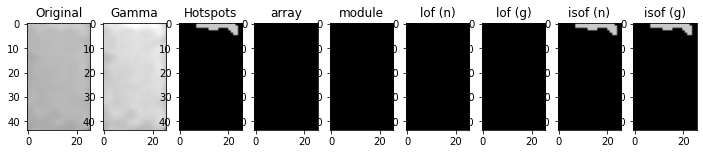

[-1.         -1.         -0.99038553 -2.64585279 -0.96978125 -1.
 -1.17663838 -1.00851796 -1.         -1.        ]
[-2.22139715]
[-0.43939518 -0.45603473 -0.43870429 -0.70769957 -0.45637437 -0.45996653
 -0.54177907 -0.45749973 -0.44725819 -0.43939518]
[-0.74427943]
[-1.31857008 -2.09475912 -1.02503616 -1.63897252 -2.66380786 -1.71380473
 -1.01065798 -0.99980039 -1.96610462 -1.24793239]
[-2.22139715]
[-0.5922787  -0.69988093 -0.50503782 -0.5998855  -0.73535814 -0.69047412
 -0.49190933 -0.51168883 -0.69516162 -0.58988846]
[-0.74427943]
2472.jpg Normal [5.26498513]
[-0.96669782 -0.99386215 -0.98991597 -0.95283001 -1.04575951 -1.
 -1.11382642 -0.96669782 -1.0181328  -1.        ]
[-1.59109993]
[-0.43028179 -0.44486543 -0.42652904 -0.42001258 -0.43112867 -0.40202667
 -0.47394336 -0.43028179 -0.43642107 -0.40202667]
[-0.61821999]
[-1.38653007 -1.0467891  -1.65564562 -1.12919035 -1.27937374 -1.51523751
 -0.98343259 -1.36897906 -1.12356879 -1.51523751]
[-1.59109993]
[-0.63062689 -0.50419814 -0.

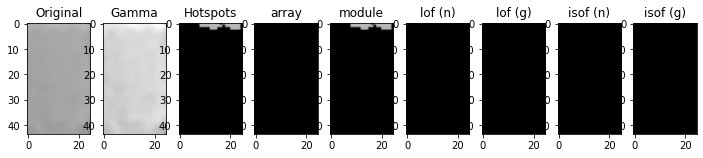

[-1.00292023 -1.01505804 -1.         -1.02304352 -1.         -0.99064171
 -0.98431373 -0.99895833 -1.0844237  -1.03633396]
[-2.10649651]
[-0.44422129 -0.458054   -0.45277511 -0.45665649 -0.45277511 -0.45891739
 -0.43822926 -0.44299642 -0.45679444 -0.48331855]
[-0.7212993]
[-1.37813519 -1.10790224 -1.18544733 -1.05625741 -1.17137429 -1.27450987
 -1.05238351 -1.03297813 -1.08619502 -0.99429967]
[-2.10649651]
[-0.68874647 -0.52071583 -0.57595336 -0.54663913 -0.575363   -0.62646767
 -0.5423313  -0.53839017 -0.55133127 -0.43411364]
[-0.7212993]
2857.jpg Normal [4.04107125]
[-1.00032305 -1.08675559 -1.07308468 -1.03234801 -0.9982933  -1.03957407
 -1.03981646 -0.97711426 -1.07519187 -1.01508688]
[-2.19426689]
[-0.45584132 -0.50150496 -0.48292734 -0.45991634 -0.46079648 -0.45124355
 -0.49308859 -0.45486603 -0.48706348 -0.50359336]
[-0.73885338]
[-1.42279446 -1.04319313 -2.05676069 -1.18012058 -1.03984968 -1.01637384
 -2.23775563 -1.0196412  -1.88544463 -3.5092879 ]
[-2.19426689]
[-0.67935515 -

[-1.00804312 -0.98053355 -1.02839984 -1.         -0.99643903 -1.02780605
 -1.03234801 -0.95602176 -1.03957407 -1.        ]
[-2.19426689]
[-0.46006141 -0.44320336 -0.45223502 -0.46222183 -0.43559366 -0.47661883
 -0.45991634 -0.44404758 -0.45124355 -0.46222183]
[-0.73885338]
[-1.15467851 -3.11661365 -2.05676069 -1.50216122 -2.48566617 -1.00285929
 -3.90386835 -2.67056619 -1.94158209 -1.50216122]
[-2.19426689]
[-0.5843777  -0.77489061 -0.76499304 -0.70896661 -0.77175131 -0.54942496
 -0.78332467 -0.77384276 -0.76086355 -0.70896661]
[-0.73885338]
809.jpg Normal [4.94614554]
[-0.96637996 -0.96186027 -1.11546426 -1.20193027 -0.96214007 -0.98862418
 -1.26815899 -1.20420681 -1.06608224 -1.06608224]
[-1.85637122]
[-0.43507333 -0.4391644  -0.45026651 -0.50100453 -0.45102154 -0.46422644
 -0.56447796 -0.50004412 -0.45180843 -0.45180843]
[-0.67127424]
[-3.52968381 -2.3066124  -3.23972214 -1.63627536 -2.49846674 -2.64889798
 -0.99779572 -1.49931839 -2.96284144 -2.85601346]
[-1.85637122]
[-0.7896791  

[-1.22071279 -1.06881856 -1.07675707 -1.39284512 -1.18574446 -1.14141666
 -1.04528802 -1.39284512 -0.98172259 -1.05642386]
[-2.26337675]
[-0.57671077 -0.4674367  -0.54011481 -0.64043164 -0.58227392 -0.55014132
 -0.50404436 -0.64043164 -0.44035561 -0.50453953]
[-0.75267535]
[-1.42810746 -1.06735629 -1.16419465 -1.71468621 -1.34674064 -1.27390672
 -1.08522268 -1.67579766 -1.00658372 -1.05770583]
[-2.26337675]
[-0.65594469 -0.50782647 -0.58417564 -0.7355498  -0.63679232 -0.61503935
 -0.56074941 -0.73009583 -0.44091342 -0.54807817]
[-0.75267535]
4201.jpg Normal [5.79931571]
[-1.02188848 -1.07670192 -1.31092375 -0.99925114 -1.01120428 -1.02021384
 -0.99476791 -4.76354803 -1.5927373  -1.96288047]
[-2.19426689]
[-0.49995908 -0.54709028 -0.62935348 -0.44999206 -0.44272857 -0.53405445
 -0.52966644 -0.77433582 -0.70956133 -0.72607322]
[-0.73885338]
[-1.04230151 -1.01104773 -1.0306402  -0.9875731  -1.0250697  -1.00915768
 -1.02799744 -3.64081472 -1.09153509 -1.23696008]
[-2.19426689]
[-0.49421641

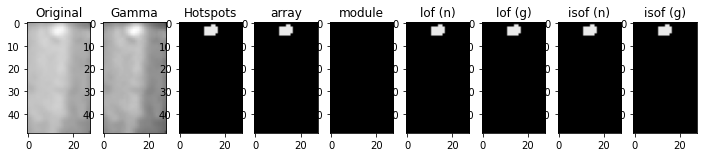

[-1.         -0.98951171 -1.28670691 -1.         -1.06360827 -0.9903778
 -4.67396536 -1.25340723 -1.         -1.06360827]
[-2.23242643]
[-0.44662054 -0.46339422 -0.54682221 -0.4492477  -0.50733496 -0.47169972
 -0.80423739 -0.54384579 -0.46202676 -0.50733496]
[-0.74648529]
[-1.06667822 -0.98752123 -1.         -1.05039727 -1.02356335 -0.97618175
 -3.1710569  -1.         -1.06145264 -1.01773093]
[-2.23242643]
[-0.55744566 -0.48351638 -0.45346384 -0.52078646 -0.49986579 -0.48597137
 -0.74655552 -0.46095754 -0.54612134 -0.48579613]
[-0.74648529]
3208.jpg Normal [5.40040624]
[-1.10140056 -0.99687422 -1.01943484 -0.98380995 -0.99687422 -1.03653084
 -0.98901141 -0.99310515 -0.98380995 -0.97699291]
[-2.04481248]
[-0.44401169 -0.42837882 -0.41841217 -0.42293738 -0.42837882 -0.4295675
 -0.43756307 -0.42696612 -0.42293738 -0.42475029]
[-0.7089625]
[-3.06797445 -4.18699917 -4.68495417 -3.57692184 -4.18699917 -5.1862069
 -2.54904311 -3.94076976 -3.57692184 -4.55964099]
[-2.04481248]
[-0.74680628 -0.

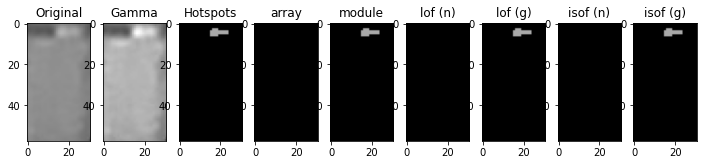

[-0.99517705 -1.         -0.99846436 -1.0140746  -1.         -1.0045977
 -1.         -1.03057792 -0.97983421 -1.        ]
[-2.23242643]
[-0.44902138 -0.43642377 -0.45751514 -0.4645034  -0.46286685 -0.45855844
 -0.45063825 -0.45387653 -0.4634946  -0.44665185]
[-0.74648529]
[-0.98339646 -1.01773093 -1.05039727 -0.9895875  -0.98099937 -1.10783603
 -1.01021624 -1.05411366 -1.0415046  -1.00289487]
[-2.23242643]
[-0.48021164 -0.48579613 -0.52078646 -0.45088578 -0.47803721 -0.57045112
 -0.4935721  -0.54109825 -0.47598571 -0.4969727 ]
[-0.74648529]
1341.jpg Normal [5.40040624]
[-0.98439679 -1.09660774 -1.02978735 -1.03955012 -1.         -1.01854412
 -0.98507468 -0.99831191 -1.01269163 -1.03955012]
[-2.18227328]
[-0.46020867 -0.43338705 -0.49534406 -0.45466198 -0.43244696 -0.43058843
 -0.51172796 -0.47997986 -0.47211624 -0.45466198]
[-0.73645466]
[-1.0205782  -1.00451874 -1.0098456  -1.0441321  -1.01344699 -1.02327982
 -1.30081544 -1.01272086 -1.00059605 -1.0441321 ]
[-2.18227328]
[-0.51337192 

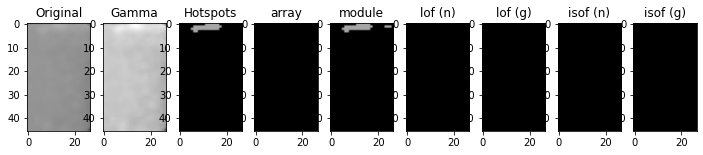

[-0.989454   -1.00208623 -1.00271331 -1.         -1.03377945 -1.01898521
 -1.         -1.02444735 -0.97355379 -1.01898521]
[-2.30310505]
[-0.46775893 -0.44604681 -0.48956284 -0.46265538 -0.50184352 -0.48091146
 -0.46255972 -0.45162623 -0.45129498 -0.48091146]
[-0.76062101]
[-1.00268819 -0.99160683 -1.00734316 -1.03101015 -1.40908103 -1.12671219
 -1.01987687 -1.00007631 -1.00498682 -1.11254307]
[-2.30310505]
[-0.55898212 -0.45308587 -0.53263071 -0.48353612 -0.64727122 -0.56125613
 -0.51801743 -0.46522538 -0.45295633 -0.55285734]
[-0.76062101]
5127.jpg Normal [6.35484636]
[-1.00438596 -3.78216593 -1.14489971 -1.         -5.51631913 -0.99064171
 -1.07780816 -0.98617511 -2.18018715 -1.0265135 ]
[-2.10649651]
[-0.46421709 -0.74101995 -0.52761523 -0.44231928 -0.79665545 -0.45891739
 -0.44939065 -0.46756576 -0.66420793 -0.45358486]
[-0.7212993]
[-1.05990089 -2.49751406 -0.98501763 -1.12806529 -4.07789354 -1.09912779
 -1.02701693 -0.98959108 -1.089782   -1.33570592]
[-2.10649651]
[-0.55536093 

[-1.         -1.04931505 -1.         -1.56956215 -1.03100501 -0.99163592
 -2.26153687 -1.00804312 -1.13934466 -1.62549341]
[-2.19426689]
[-0.46222183 -0.4995877  -0.44663728 -0.6099819  -0.47395735 -0.45853724
 -0.66228179 -0.46006141 -0.53122819 -0.62321543]
[-0.73885338]
[-3.18142396 -1.29019388 -3.57505131 -1.01637384 -1.78091279 -2.17677873
 -0.99904368 -2.36367029 -1.11677516 -1.01121169]
[-2.19426689]
[-0.77489061 -0.64764734 -0.78173632 -0.52599299 -0.74962205 -0.76862472
 -0.47389318 -0.77018643 -0.56849503 -0.50829122]
[-0.73885338]
831.jpg Normal [4.94614554]
[-0.97983421 -1.10316021 -0.97983421 -1.28670691 -1.02781186 -1.
 -1.02781186 -1.63134018 -1.04808127 -1.08977955]
[-2.23242643]
[-0.4634946  -0.50272767 -0.4634946  -0.54682221 -0.477969   -0.43642377
 -0.477969   -0.60066821 -0.49470531 -0.51916734]
[-0.74648529]
[-1.07281705 -1.03097495 -1.07559376 -1.05234567 -1.02488483 -1.21067867
 -1.01191506 -1.         -0.98339646 -0.98556559]
[-2.23242643]
[-0.54561035 -0.50386

[-1.         -1.06809644 -1.03102351 -0.98669423 -1.01943484 -0.95609286
 -1.01438377 -1.00127556 -1.02391074 -1.        ]
[-2.04481248]
[-0.41609005 -0.42740586 -0.43735833 -0.41146522 -0.41841217 -0.4119206
 -0.46288741 -0.45175065 -0.42773756 -0.43664938]
[-0.7089625]
[-2.86959086 -3.63518148 -2.14285788 -3.01411177 -3.23286021 -2.60443201
 -5.12355031 -1.54134243 -3.40214293 -4.12544182]
[-2.04481248]
[-0.74227259 -0.76418488 -0.67188938 -0.7447879  -0.75646855 -0.7199567
 -0.80696268 -0.56943605 -0.75800556 -0.78053874]
[-0.7089625]
602.jpg Normal [3.50600459]
[-1.0092414  -1.06638145 -1.04011828 -1.03774711 -1.0092414  -1.04233163
 -0.97572056 -1.07170875 -1.00962414 -1.03891092]
[-2.19426689]
[-0.4741908  -0.4464874  -0.5053802  -0.46409875 -0.4741908  -0.45338105
 -0.4591238  -0.48027833 -0.50664902 -0.51169646]
[-0.73885338]
[-4.30416735 -1.83317871 -3.77234153 -2.79637445 -4.17073435 -1.13062357
 -2.29873254 -3.31199768 -4.77594831 -3.90386835]
[-2.19426689]
[-0.78597909 -0.7

[-1.11172177 -0.95609286 -1.69067559 -0.99315738 -1.40785547 -1.04680436
 -1.08400706 -1.01770529 -1.45046107 -1.29407709]
[-2.04481248]
[-0.53537729 -0.4119206  -0.62145595 -0.4562166  -0.57543172 -0.47435028
 -0.51066103 -0.45956457 -0.57710829 -0.5552073 ]
[-0.7089625]
[-3.34498253 -1.01042471 -5.12355031 -1.37472622 -4.43432781 -0.99502117
 -3.17789829 -2.09554653 -4.55964099 -4.06388446]
[-2.04481248]
[-0.75800556 -0.46661663 -0.80696268 -0.54465013 -0.78743434 -0.42888568
 -0.75646855 -0.6674258  -0.79450234 -0.77948325]
[-0.7089625]
1631.jpg Normal [3.50600459]
[-1.07442805 -0.98207247 -0.99895833 -1.01921004 -1.04986003 -1.07780816
 -0.98431373 -1.03942538 -1.00435068 -0.99352092]
[-2.10649651]
[-0.46160744 -0.46870062 -0.44299642 -0.47923103 -0.45719885 -0.44939065
 -0.43822926 -0.50268811 -0.44655078 -0.43980811]
[-0.7212993]
[-1.03747171 -1.05238351 -1.13825254 -1.10572089 -1.02887005 -1.4540183
 -1.09912779 -1.00168708 -1.06696131 -1.23942413]
[-2.10649651]
[-0.54335601 -0.

[-1.03774711 -1.02839984 -1.01736208 -1.0037463  -1.         -0.97985803
 -1.03234801 -0.99643903 -0.99643903 -3.02430374]
[-2.19426689]
[-0.46409875 -0.45223502 -0.46829788 -0.47506393 -0.44576646 -0.44716298
 -0.45991634 -0.43559366 -0.43559366 -0.73542221]
[-0.73885338]
[-3.70657813 -1.42279446 -2.42466823 -1.00041009 -1.18012058 -2.11580182
 -2.9231358  -1.73348631 -1.73348631 -1.011426  ]
[-2.19426689]
[-0.78332467 -0.67935515 -0.77018643 -0.54725527 -0.59833612 -0.76862472
 -0.77384276 -0.74345615 -0.74345615 -0.47373524]
[-0.73885338]
1180.jpg Normal [4.94614554]
[-1.00127556 -1.         -1.01677343 -1.05007149 -1.06288817 -0.99687422
 -1.01526216 -1.21003557 -0.99890029 -1.09250169]
[-2.04481248]
[-0.45175065 -0.41609005 -0.44348086 -0.49121656 -0.48613316 -0.42837882
 -0.42801641 -0.52510951 -0.45422326 -0.43615274]
[-0.7089625]
[-2.38980004 -4.18699917 -3.34498253 -1.6801178  -1.64511535 -4.31011387
 -3.63518148 -1.0933875  -2.96024908 -5.31152008]
[-2.04481248]
[-0.70263248 

[-1.00438596 -0.9956328  -1.07442805 -2.79283548 -1.10807314 -1.0844237
 -0.99747518 -1.04221206 -0.99064171 -0.99895833]
[-2.10649651]
[-0.46421709 -0.44205236 -0.46160744 -0.68847594 -0.50479287 -0.45679444
 -0.46557428 -0.4842912  -0.45891739 -0.44299642]
[-0.7212993]
[-1.02701693 -1.0625634  -1.03559461 -1.65555585 -1.53479709 -1.05238351
 -1.15730124 -1.08454341 -1.08007807 -1.11877053]
[-2.10649651]
[-0.53674003 -0.55437904 -0.46857224 -0.61979586 -0.71359651 -0.5423313
 -0.57116038 -0.43655265 -0.55097386 -0.52942818]
[-0.7212993]
3967.jpg Normal [4.04107125]
[-1.06591833 -1.06638145 -1.07170875 -1.01206275 -1.         -1.03234801
 -0.95602176 -0.97572056 -0.97985803 -1.00032305]
[-2.19426689]
[-0.47699364 -0.4464874  -0.48027833 -0.47146589 -0.46222183 -0.45991634
 -0.44404758 -0.4591238  -0.44716298 -0.45584132]
[-0.73885338]
[-3.97058485 -2.60766206 -4.37088385 -3.64081472 -1.13062357 -2.9231358
 -1.78091279 -3.18142396 -2.05676069 -3.37776109]
[-2.19426689]
[-0.78438536 -0.7

[-0.96552883 -1.03284108 -1.00733974 -0.99522482 -0.99522482 -1.0171999
 -0.94315251 -1.02304446 -0.98239286 -1.00733974]
[-2.1916295]
[-0.4409372  -0.46408306 -0.46807732 -0.43213083 -0.46483126 -0.44557348
 -0.459844   -0.4715625  -0.47078443 -0.46807732]
[-0.7383259]
[-4.97848019 -2.39629738 -2.90710686 -3.78752248 -4.0367927  -1.11226343
 -5.06849444 -4.45224307 -5.87862265 -2.90710686]
[-2.1916295]
[-0.754672   -0.68096534 -0.69521362 -0.72516674 -0.73131049 -0.51012221
 -0.754672   -0.74204526 -0.79996799 -0.69521362]
[-0.7383259]
4615.jpg Normal [4.91619948]
[-1.01341463 -0.97846586 -1.02574963 -1.01842206 -1.01341463 -1.
 -1.         -1.04792731 -1.01341463 -0.96183205]
[-2.18227328]
[-0.45157797 -0.44783645 -0.46258448 -0.43677284 -0.45157797 -0.43244696
 -0.43244696 -0.43130332 -0.45157797 -0.43068347]
[-0.73645466]
[-1.12467131 -0.99696136 -1.0206557  -1.41700478 -1.14387998 -1.04554025
 -1.03365911 -1.25366614 -1.12467131 -1.0086103 ]
[-2.18227328]
[-0.56364654 -0.53389352 

[-1.04233163 -0.99396112 -1.01058856 -1.08977874 -1.00804312 -1.03774711
 -0.97985803 -1.01285559 -0.9982933  -0.99925114]
[-2.19426689]
[-0.45338105 -0.44966841 -0.44871237 -0.45195404 -0.46006141 -0.46409875
 -0.44716298 -0.44561691 -0.46079648 -0.44999206]
[-0.73885338]
[-1.83317871 -3.5092879  -1.50216122 -3.24623427 -1.06211501 -4.37088385
 -2.54666412 -2.79637445 -1.10589427 -3.83810494]
[-2.19426689]
[-0.75114515 -0.78173632 -0.70896661 -0.77593988 -0.54766083 -0.78597909
 -0.77175131 -0.77384276 -0.56511611 -0.78332467]
[-0.73885338]
4826.jpg Normal [4.94614554]
[-1.01943484 -1.02665863 -1.00367122 -1.00731226 -1.02442102 -1.01770529
 -1.0228424  -0.99890029 -1.06809644 -1.01438377]
[-2.04481248]
[-0.41841217 -0.49351482 -0.45728217 -0.45508471 -0.46160843 -0.45956457
 -0.49520907 -0.45422326 -0.42740586 -0.46288741]
[-0.7089625]
[-1.91668611 -4.99823713 -3.12293637 -2.81551141 -3.7560977  -3.87921241
 -4.68495417 -1.2116649  -2.09554653 -3.23286021]
[-2.04481248]
[-0.63192599 

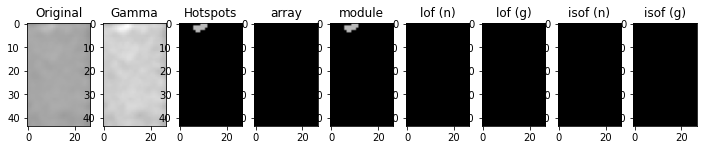

[-1.10014567 -1.00582206 -1.04606734 -1.28884562 -1.0028236  -1.03960073
 -1.27166614 -1.00137648 -1.01301829 -1.0298098 ]
[-2.19426689]
[-0.55600736 -0.52372552 -0.54530266 -0.55302383 -0.53940564 -0.54915788
 -0.6171003  -0.52206194 -0.492334   -0.54464971]
[-0.73885338]
[-3.37776109 -1.94158209 -3.05180333 -0.99986683 -2.48566617 -2.9231358
 -3.97058485 -2.23775563 -1.29019388 -2.73347032]
[-2.19426689]
[-0.77856928 -0.76086355 -0.77489061 -0.4604251  -0.77175131 -0.77384276
 -0.78438536 -0.76862472 -0.64764734 -0.77384276]
[-0.73885338]
3422.jpg Normal [4.94614554]
[-0.98337153 -1.         -1.         -0.97598867 -0.98337153 -1.
 -1.26703887 -1.02053708 -1.         -0.99821588]
[-2.2852886]
[-0.46540084 -0.44916198 -0.4433859  -0.44700747 -0.46540084 -0.4433859
 -0.53897626 -0.482123   -0.44916198 -0.45672835]
[-0.75705772]
[-1.19104181 -1.0312829  -1.0390932  -0.99391848 -1.17385031 -1.0390932
 -0.99626521 -1.3845272  -1.0312829  -1.05163092]
[-2.2852886]
[-0.58803511 -0.51059711 

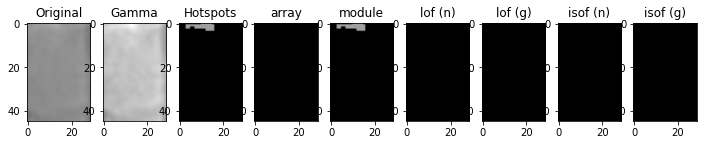

[-0.98323796 -1.         -1.         -1.         -1.         -1.
 -0.99701002 -1.         -1.         -1.00403287]
[-2.30310505]
[-0.4761508  -0.47396468 -0.47939105 -0.46117541 -0.45499554 -0.47939105
 -0.45336304 -0.47396468 -0.46692691 -0.45847608]
[-0.76062101]
[-1.94366832 -1.2950775  -1.65478708 -1.50799145 -1.20612292 -1.65478708
 -1.01631604 -1.2950775  -1.40908103 -1.11254307]
[-2.30310505]
[-0.72455659 -0.62019549 -0.68777567 -0.66388828 -0.57979067 -0.68777567
 -0.51421818 -0.62019549 -0.64727122 -0.55285734]
[-0.76062101]
4417.jpg Normal [6.35484636]
[-1.04233163 -1.02587299 -0.9982933  -1.         -1.04931505 -0.97985803
 -1.01058856 -1.         -0.98785936 -1.02839984]
[-2.19426689]
[-0.45338105 -0.46023483 -0.46079648 -0.46222183 -0.4995877  -0.44716298
 -0.44871237 -0.44663728 -0.46293019 -0.45223502]
[-0.73885338]
[-3.57505131 -1.50216122 -1.99771956 -2.67056619 -1.11677516 -4.43760035
 -3.05180333 -2.98699302 -2.42466823 -3.5092879 ]
[-2.19426689]
[-0.78173632 -0.7089

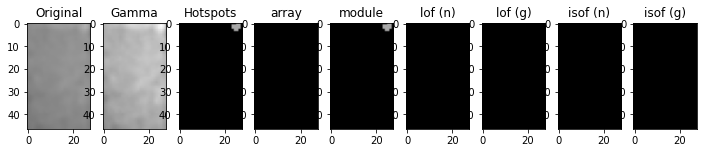

[-1.0269743  -1.00033229 -0.99776569 -1.05244686 -1.01398901 -1.01752729
 -1.01759782 -1.02053708 -0.99049894 -0.96466561]
[-2.2852886]
[-0.4965013  -0.48262359 -0.498889   -0.47273572 -0.49646685 -0.48484432
 -0.5092485  -0.482123   -0.49072743 -0.45705208]
[-0.75705772]
[-1.19104181 -1.03073193 -1.05163092 -1.00302116 -1.1354698  -1.04045137
 -1.35139075 -1.03217366 -1.02231374 -1.00045855]
[-2.2852886]
[-0.58803511 -0.52626884 -0.53998674 -0.45655306 -0.57109477 -0.52372812
 -0.61504571 -0.51790436 -0.54051935 -0.48149405]
[-0.75705772]
4365.jpg Normal [6.09942086]
[-1.04993166 -1.         -1.00292023 -1.         -1.04166097 -1.00242253
 -0.99215102 -1.0265135  -1.0265135  -0.9956328 ]
[-2.10649651]
[-0.50238109 -0.44231928 -0.44422129 -0.44231928 -0.45792097 -0.47095986
 -0.46458671 -0.45358486 -0.45358486 -0.44205236]
[-0.7212993]
[-1.48094456 -1.10572089 -1.13825254 -1.11342694 -1.02701693 -0.99429967
 -1.25574307 -1.27450987 -1.29327666 -1.07412213]
[-2.10649651]
[-0.70789729 -0

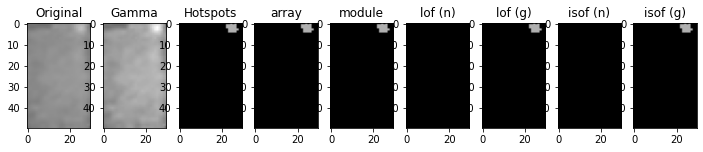

[-0.99926183 -1.02528177 -1.05515382 -1.25526693 -0.99735304 -1.03935486
 -1.0277067  -1.02937497 -1.06192596 -1.02893171]
[-2.20366402]
[-0.45713978 -0.51390393 -0.47032804 -0.5745321  -0.47259399 -0.49141631
 -0.45960192 -0.48789447 -0.53784217 -0.4975662 ]
[-0.7407328]
[-1.03182781 -1.16265256 -0.99218864 -1.93519765 -1.0636145  -1.10003444
 -1.03516773 -1.09202115 -1.4016294  -1.20219118]
[-2.20366402]
[-0.51121812 -0.56942052 -0.46130135 -0.72308741 -0.52657947 -0.55565371
 -0.47981324 -0.55418396 -0.64836501 -0.57331015]
[-0.7407328]
5090.jpg Normal [5.0543349]
[-1.         -0.96801083 -1.00283505 -0.97598867 -0.97508031 -0.97598867
 -1.0157049  -1.02309247 -0.98219365 -2.14200397]
[-2.2852886]
[-0.44916198 -0.46091368 -0.48718297 -0.44700747 -0.46437282 -0.44700747
 -0.46613226 -0.49999094 -0.45943074 -0.65032149]
[-0.75705772]
[-1.35139075 -1.03073193 -1.00052471 -1.10462335 -1.03849762 -1.06122481
 -0.99391848 -0.99569751 -1.03334059 -1.07380771]
[-2.2852886]
[-0.61504571 -0.5

[-1.01535989 -1.057235   -1.07455887 -1.01139586 -0.99450111 -1.08651307
 -1.07455887 -1.31892205 -0.98299834 -1.01575845]
[-2.26337675]
[-0.4576453  -0.48738189 -0.45849533 -0.46949312 -0.47014646 -0.4950681
 -0.45849533 -0.56727236 -0.46261395 -0.47289108]
[-0.75267535]
[-1.05942724 -1.52622628 -1.3234075  -1.0678208  -1.05674719 -1.75357477
 -1.34674064 -1.01484431 -1.09666395 -1.25094256]
[-2.26337675]
[-0.48730173 -0.69568846 -0.64242159 -0.55858182 -0.53694727 -0.73754315
 -0.63679232 -0.48993776 -0.55152497 -0.59943753]
[-0.75267535]
3392.jpg Normal [5.79931571]
[-1.10326641 -1.02875091 -1.08008156 -1.04270062 -1.10807314 -1.01133683
 -1.08073148 -0.99389776 -1.         -1.0438136 ]
[-2.10649651]
[-0.51046211 -0.45289545 -0.50358751 -0.47592714 -0.50479287 -0.44805792
 -0.55301411 -0.45982724 -0.44741316 -0.53576353]
[-0.7212993]
[-1.03432092 -0.99429967 -1.0512513  -1.11342694 -1.06602287 -1.01896188
 -1.37813519 -1.08707597 -1.03705079 -1.08007807]
[-2.10649651]
[-0.53500358 -

[-1.0155631  -1.01438377 -0.98380995 -1.01660195 -1.00731226 -1.08400706
 -1.05029738 -0.99009946 -1.06809644 -0.99687422]
[-2.04481248]
[-0.43899742 -0.46288741 -0.42293738 -0.47584447 -0.45508471 -0.51066103
 -0.46396304 -0.45520966 -0.42740586 -0.42837882]
[-0.7089625]
[-2.09554653 -2.90748564 -1.3103454  -3.69563959 -2.44288106 -4.93558054
 -1.01990572 -2.54904311 -1.83461139 -1.50437978]
[-2.04481248]
[-0.6674258  -0.7447879  -0.54464361 -0.77004784 -0.70263248 -0.8053264
 -0.45664497 -0.71268696 -0.62174114 -0.55801866]
[-0.7089625]
3379.jpg Normal [3.50600459]
[-0.97621145 -1.05354445 -0.98172259 -1.02870209 -1.         -1.
 -1.         -1.00035479 -0.99782788 -1.00399853]
[-2.26337675]
[-0.44336689 -0.45581    -0.44035561 -0.46992502 -0.45826583 -0.45826583
 -0.43793575 -0.49464269 -0.44101953 -0.45497451]
[-0.75267535]
[-1.75357477 -1.05770583 -1.17540255 -1.0897404  -1.39699662 -1.39699662
 -1.20803583 -1.05548893 -1.08522268 -1.06764899]
[-2.26337675]
[-0.73754315 -0.5480781

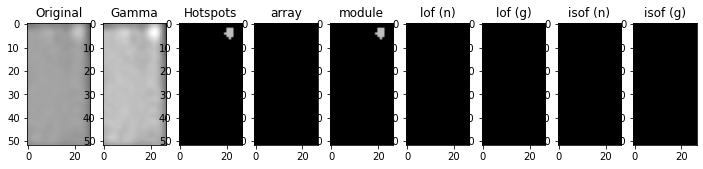

[-0.96801083 -1.         -1.         -0.99027614 -1.         -1.
 -1.01935874 -0.98337153 -2.14200397 -1.        ]
[-2.2852886]
[-0.46091368 -0.4433859  -0.44916198 -0.47688061 -0.46822941 -0.44713721
 -0.46400718 -0.46540084 -0.65032149 -0.4433859 ]
[-0.75705772]
[-1.02575424 -1.11860035 -1.03241643 -1.00448305 -1.02596951 -1.03118618
 -1.03109906 -1.27287178 -1.26738115 -1.11860035]
[-2.2852886]
[-0.50989082 -0.57015334 -0.52803634 -0.45039008 -0.54970622 -0.54311652
 -0.51875879 -0.59745501 -0.53142542 -0.57015334]
[-0.75705772]
2701.jpg Normal [6.09942086]
[-0.99959424 -1.05244686 -3.5168739  -1.30897436 -1.40398826 -1.00391658
 -1.0195616  -2.19075848 -1.0338778  -1.03581367]
[-2.2852886]
[-0.48713109 -0.47273572 -0.76651698 -0.54337927 -0.58101551 -0.46012693
 -0.48007543 -0.65353636 -0.45251527 -0.46419794]
[-0.75705772]
[-1.00241536 -1.03334059 -2.17960744 -1.04141501 -0.9828372  -1.02508367
 -1.00815628 -1.15632752 -1.01590228 -1.03118618]
[-2.2852886]
[-0.47008533 -0.56244716

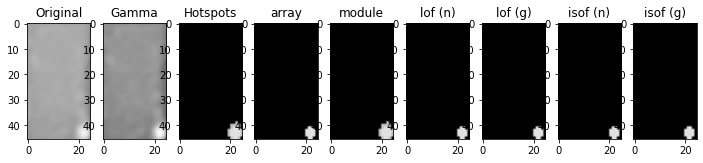

[-1.00851687 -0.99782788 -1.03674057 -1.01217345 -1.         -0.97621145
 -0.99492255 -1.         -1.01139586 -1.04614784]
[-2.26337675]
[-0.44471497 -0.44101953 -0.46395863 -0.50060768 -0.45289762 -0.44336689
 -0.46098965 -0.45435871 -0.46949312 -0.46232416]
[-0.75267535]
[-1.07902915 -0.98868254 -1.0678208  -0.98761832 -1.07337412 -1.0806355
 -1.11388551 -1.05942724 -1.42810746 -1.06764899]
[-2.26337675]
[-0.53298864 -0.46913377 -0.55858182 -0.46239039 -0.47521286 -0.51169978
 -0.55340426 -0.48730173 -0.65594469 -0.55286551]
[-0.75267535]
3345.jpg Normal [5.79931571]
[-0.99776569 -1.03584687 -1.00033229 -1.         -1.01398901 -0.99416446
 -1.01310924 -1.04199815 -1.02116737 -1.0126169 ]
[-2.2852886]
[-0.498889   -0.5168298  -0.48262359 -0.44713721 -0.49646685 -0.4867511
 -0.47208795 -0.49952481 -0.49897143 -0.51366132]
[-0.75705772]
[-1.0390932  -1.45080009 -1.03073193 -1.0318619  -1.1354698  -1.03474794
 -1.03217366 -0.98443373 -1.2318114  -1.11860035]
[-2.2852886]
[-0.54145501 -0.

[-0.98767769 -0.99926183 -0.98246001 -1.00794495 -1.00304828 -1.01216108
 -1.01012624 -1.01380645 -1.00845798 -1.01380645]
[-2.20366402]
[-0.44310438 -0.45713978 -0.46803434 -0.46371307 -0.47061851 -0.42943071
 -0.48027042 -0.47669662 -0.42982785 -0.47669662]
[-0.7407328]
[-1.03182781 -1.37712245 -0.9830684  -1.06994101 -1.25994209 -0.99761618
 -1.65510325 -1.13080282 -1.00261657 -1.13080282]
[-2.20366402]
[-0.51121812 -0.63996815 -0.43444199 -0.54240223 -0.58988932 -0.47397833
 -0.68489318 -0.56013034 -0.49159368 -0.56013034]
[-0.7407328]
4199.jpg Normal [5.0543349]
[-0.9503268  -0.98617511 -0.99352092 -0.99895833 -1.04986003 -1.04166097
 -2.44352796 -1.00435068 -0.99895833 -1.03942538]
[-2.10649651]
[-0.43363628 -0.46756576 -0.43980811 -0.44299642 -0.45719885 -0.45792097
 -0.67363558 -0.44655078 -0.44299642 -0.50268811]
[-0.7212993]
[-1.05990089 -1.11342694 -1.15730124 -1.09912779 -1.06319567 -1.35692055
 -1.02929482 -1.04413361 -1.10833197 -0.99301811]
[-2.10649651]
[-0.55536093 -0.

[-1.         -0.98207247 -1.00435068 -1.         -1.01921004 -1.00435068
 -0.99895833 -1.0844237  -2.98800619 -1.04986003]
[-2.10649651]
[-0.44231928 -0.46870062 -0.44655078 -0.45277511 -0.47923103 -0.44655078
 -0.44299642 -0.45679444 -0.69880048 -0.45719885]
[-0.7212993]
[-1.07412213 -1.072234   -1.02701693 -1.42709203 -1.08707597 -1.03747171
 -1.09231197 -1.22310518 -1.33081777 -1.05872147]
[-2.10649651]
[-0.5545034  -0.51765011 -0.53674003 -0.69248454 -0.49531081 -0.54335601
 -0.55702574 -0.60296747 -0.57779448 -0.53703793]
[-0.7212993]
2265.jpg Normal [4.04107125]
[-1.0037463  -1.         -1.08675559 -0.98785936 -1.02780605 -1.02587299
 -0.99643903 -1.3550947  -1.         -0.96954301]
[-2.19426689]
[-0.47506393 -0.44663728 -0.50150496 -0.46293019 -0.47661883 -0.46023483
 -0.43559366 -0.54479469 -0.44576646 -0.4650833 ]
[-0.73885338]
[-1.88544463 -3.05180333 -1.11677516 -2.54666412 -1.26309304 -1.68605982
 -4.10401785 -1.00553509 -2.98699302 -2.23775563]
[-2.19426689]
[-0.75522188 -

[-0.99315738 -0.98380995 -0.98913087 -0.99687422 -1.00731226 -1.04971834
 -0.99310515 -1.01770529 -1.01943484 -1.09250169]
[-2.04481248]
[-0.4562166  -0.42293738 -0.45457652 -0.42837882 -0.45508471 -0.50335059
 -0.42696612 -0.45956457 -0.41841217 -0.43615274]
[-0.7089625]
[-3.57692184 -2.00353407 -4.00232711 -2.44288106 -3.7560977  -1.02408891
 -2.19016923 -5.06089372 -2.71636373 -3.01411177]
[-2.04481248]
[-0.76211953 -0.65401522 -0.77790269 -0.70263248 -0.77265727 -0.45941523
 -0.68038354 -0.80696268 -0.73229601 -0.7447879 ]
[-0.7089625]
3972.jpg Normal [3.50600459]
[-1.50200555 -1.045388   -0.94095887 -1.11986367 -1.22071279 -4.5204395
 -1.06013806 -0.99458917 -1.05397911 -1.26097936]
[-2.26337675]
[-0.67614313 -0.51434476 -0.45370779 -0.53481051 -0.57671077 -0.79665545
 -0.53176554 -0.4625333  -0.50593754 -0.60508653]
[-0.75267535]
[-1.6369091  -1.06764899 -0.97767489 -1.17540255 -1.3234075  -3.79759889
 -1.08522268 -1.00363282 -1.09242037 -1.34674064]
[-2.26337675]
[-0.71785036 -0

[-1.10140056 -1.06288817 -0.98669423 -2.26190004 -1.05029738 -0.98380995
 -0.98380995 -1.5836353  -0.96588    -1.12820271]
[-2.04481248]
[-0.44401169 -0.48613316 -0.41146522 -0.63451057 -0.46396304 -0.42293738
 -0.42293738 -0.60806017 -0.4467322  -0.50884219]
[-0.7089625]
[-3.57692184 -1.79357403 -4.93558054 -1.035316   -2.44288106 -4.18699917
 -4.06388446 -1.02329255 -3.23286021 -1.32817936]
[-2.04481248]
[-0.76211953 -0.61096721 -0.8053264  -0.43370414 -0.70263248 -0.78318372
 -0.77948325 -0.46099108 -0.75646855 -0.54340127]
[-0.7089625]
398.jpg Normal [3.50600459]
[-1.01210849 -1.01210849 -1.00994067 -1.02303182 -1.0277067  -1.00794495
 -0.99920421 -1.06257472 -1.02303182 -1.04422131]
[-2.20366402]
[-0.45691207 -0.45691207 -0.46932391 -0.43496122 -0.45960192 -0.46371307
 -0.46368408 -0.44322239 -0.43496122 -0.46443268]
[-0.7407328]
[-1.14762255 -1.14762255 -1.4016294  -1.07286398 -1.71991848 -1.3546822
 -1.13080282 -1.03516773 -1.07286398 -1.50348191]
[-2.20366402]
[-0.56278608 -0.5

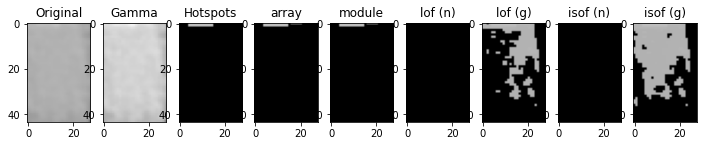

[-1.         -1.00855033 -1.         -1.02116737 -0.99821588 -1.01310924
 -0.98219365 -0.99821588 -0.99416446 -1.        ]
[-2.2852886]
[-0.45489584 -0.46665337 -0.46276202 -0.49897143 -0.45672835 -0.47208795
 -0.45943074 -0.45672835 -0.4867511  -0.44916198]
[-0.75705772]
[-0.98277726 -1.01590228 -1.00815628 -1.27287178 -1.02508367 -1.03508412
 -1.00552914 -1.02575424 -1.03334059 -1.01188121]
[-2.2852886]
[-0.46878277 -0.49905978 -0.47368204 -0.59745501 -0.50114029 -0.51772331
 -0.45467312 -0.50989082 -0.56244716 -0.482944  ]
[-0.75705772]
2339.jpg Normal [6.09942086]
[-1.00994067 -1.02303182 -1.00690661 -1.02334507 -0.97461201 -1.06257472
 -0.97781214 -0.98767769 -0.98105507 -1.48382084]
[-2.20366402]
[-0.46932391 -0.43496122 -0.41628373 -0.453929   -0.43326554 -0.44322239
 -0.42282992 -0.44310438 -0.44240178 -0.54618152]
[-0.7407328]
[-1.75464093 -1.18219632 -1.01426357 -1.33224196 -1.11555864 -1.03619036
 -1.02533206 -1.47686136 -1.25994209 -0.95363087]
[-2.20366402]
[-0.7027303  -0

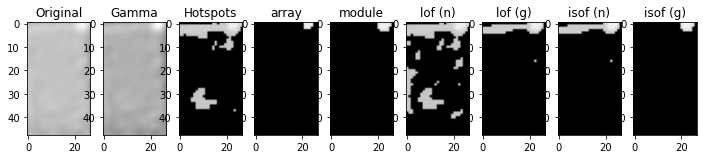

[-0.99455371 -1.19947023 -0.98233802 -1.48382084 -1.04451615 -0.98078285
 -0.97461201 -1.00690661 -1.00114286 -0.97461201]
[-2.20366402]
[-0.42748662 -0.52287726 -0.42181028 -0.54618152 -0.46070729 -0.4216356
 -0.43326554 -0.41628373 -0.43945509 -0.43326554]
[-0.7407328]
[-1.220085   -1.05787441 -1.14762255 -0.9830684  -1.00018791 -1.08705863
 -1.59028802 -1.04653881 -1.04394358 -1.56135265]
[-2.20366402]
[-0.58286024 -0.47640693 -0.56278608 -0.43444199 -0.46988463 -0.56378373
 -0.66623214 -0.51694247 -0.50765363 -0.66848977]
[-0.7407328]
603.jpg Normal [5.0543349]
[-1.00851687 -1.08089254 -1.         -0.97621145 -2.3181741  -0.99662575
 -0.99782788 -1.         -0.98926958 -1.02870209]
[-2.26337675]
[-0.44471497 -0.50751987 -0.45289762 -0.44336689 -0.69007874 -0.46630911
 -0.44101953 -0.45435871 -0.45796927 -0.46992502]
[-0.75267535]
[-1.16419465 -1.01142306 -1.10377551 -1.07746861 -1.25510651 -1.45921831
 -1.04484859 -1.05770583 -1.06582224 -0.97318178]
[-2.26337675]
[-0.58417564 -0.4

[-0.99643903 -1.         -1.08977874 -1.01615795 -1.01285559 -0.9982933
 -1.02780605 -1.01120428 -1.08498464 -1.01058856]
[-2.19426689]
[-0.43559366 -0.44576646 -0.45195404 -0.48388401 -0.44561691 -0.46079648
 -0.47661883 -0.44272857 -0.49245635 -0.44871237]
[-0.73885338]
[-1.54668404 -1.11677516 -2.42466823 -1.01121169 -2.05676069 -1.0196412
 -1.01581333 -1.50216122 -3.83810494 -1.21082712]
[-2.19426689]
[-0.71668313 -0.56849503 -0.77018643 -0.50829122 -0.76499304 -0.55408251
 -0.51234537 -0.70896661 -0.78332467 -0.60925961]
[-0.73885338]
4576.jpg Normal [4.94614554]
[-1.00152809 -0.96167719 -1.08992393 -0.93814471 -0.93814471 -1.03505093
 -1.0127031  -0.98849412 -1.02650055 -0.99889949]
[-2.13809084]
[-0.43550666 -0.44392377 -0.52723653 -0.4275236  -0.4275236  -0.43341475
 -0.46827246 -0.43173808 -0.47679068 -0.45431772]
[-0.72761817]
[-1.19066667 -1.03482775 -1.0097045  -1.02141635 -1.02490882 -1.131319
 -0.99530897 -1.03892665 -1.03379395 -1.51484466]
[-2.13809084]
[-0.56912521 -0.

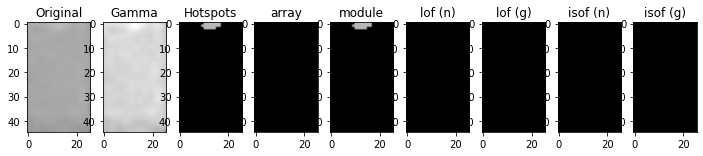

[-1.01432197 -0.99325492 -1.         -1.195057   -1.02849653 -1.0373336
 -1.01935874 -1.01752729 -1.0269743  -1.01398901]
[-2.2852886]
[-0.47112653 -0.51016703 -0.4433859  -0.53281551 -0.53068239 -0.48229577
 -0.46400718 -0.48484432 -0.4965013  -0.49646685]
[-0.75705772]
[-0.99104097 -1.10462335 -1.02575424 -1.018936   -1.3845272  -1.03487045
 -0.99569663 -1.03241643 -1.2318114  -1.17385031]
[-2.2852886]
[-0.44477773 -0.56051224 -0.50989082 -0.49635132 -0.61639584 -0.50607409
 -0.4481401  -0.52803634 -0.59663962 -0.57829632]
[-0.75705772]
2885.jpg Normal [6.09942086]
[-1.03639033 -1.         -1.02875091 -0.99064171 -0.99352092 -1.07442805
 -0.9503268  -1.049987   -1.00438596 -0.98229167]
[-2.10649651]
[-0.48913416 -0.44741316 -0.45289545 -0.45891739 -0.43980811 -0.46160744
 -0.43363628 -0.48538652 -0.46421709 -0.43766845]
[-0.7212993]
[-1.02145052 -1.05625741 -1.06602287 -1.08007807 -1.09757681 -1.03559461
 -1.10302781 -1.37813519 -1.03747171 -1.10790224]
[-2.10649651]
[-0.43729367 -0.

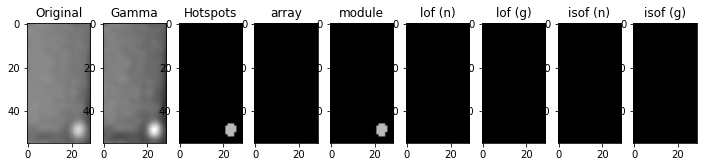

[-1.01910112 -1.00639461 -0.98816646 -1.52208827 -0.98816646 -0.99990014
 -0.96167719 -1.08992393 -0.98968069 -0.99548763]
[-2.13809084]
[-0.44077286 -0.48066619 -0.44835301 -0.60563459 -0.44835301 -0.48795739
 -0.44392377 -0.52723653 -0.4527312  -0.43090937]
[-0.72761817]
[-1.00040008 -1.04573618 -1.01326972 -1.0534936  -1.00914257 -1.15950974
 -1.02840861 -1.03484202 -1.02989353 -0.99283158]
[-2.13809084]
[-0.47213526 -0.43812083 -0.49040264 -0.48365154 -0.49357341 -0.56448903
 -0.45692949 -0.4341668  -0.51510725 -0.47221326]
[-0.72761817]
4548.jpg Normal [4.3460112]
[-0.99416446 -1.         -0.98435962 -0.97598867 -1.01752729 -0.98337153
 -1.01759782 -0.96466561 -1.00855033 -0.99325492]
[-2.2852886]
[-0.4867511  -0.46271097 -0.49672577 -0.44700747 -0.48484432 -0.46540084
 -0.5092485  -0.45705208 -0.46665337 -0.51016703]
[-0.75705772]
[-1.04045137 -1.01188121 -1.04335315 -1.00552914 -1.03508412 -1.02508367
 -1.21188365 -1.02020191 -0.99391848 -1.02231374]
[-2.2852886]
[-0.52372812 -0

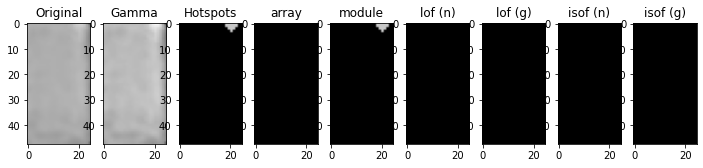

[-1.06125288 -1.11986367 -1.07675707 -1.06881856 -1.045388   -1.00532169
 -1.05642386 -1.045388   -1.04528802 -0.98299834]
[-2.26337675]
[-0.49647712 -0.53481051 -0.54011481 -0.4674367  -0.51434476 -0.49842575
 -0.50453953 -0.51434476 -0.50404436 -0.46261395]
[-0.75267535]
[-1.14006168 -1.67579766 -1.49032915 -1.06112424 -1.27390672 -1.03673244
 -1.16419465 -1.27390672 -1.3234075  -1.06916374]
[-2.26337675]
[-0.57059512 -0.73009583 -0.68384144 -0.53637058 -0.61503935 -0.48099535
 -0.58417564 -0.61503935 -0.64242159 -0.49223813]
[-0.75267535]
2105.jpg Normal [5.79931571]
[-1.03917266 -1.02389265 -1.0092255  -1.03505093 -1.02389265 -1.02483967
 -1.00348396 -0.99990014 -1.00102739 -0.99999485]
[-2.13809084]
[-0.51599795 -0.45638632 -0.5044927  -0.43341475 -0.45638632 -0.52920956
 -0.5069652  -0.48795739 -0.50673775 -0.50164853]
[-0.72761817]
[-1.10497654 -0.99755242 -1.04277327 -0.9698152  -0.99755242 -1.29109775
 -1.03025934 -1.02560855 -1.02141635 -1.02989353]
[-2.13809084]
[-0.56684803

[-1.01584952 -1.05029587 -0.99945566 -0.99889949 -0.98779148 -1.03602326
 -1.01910112 -0.99919082 -0.99944615 -1.02389265]
[-2.13809084]
[-0.50829309 -0.48910723 -0.45816509 -0.45431772 -0.49441747 -0.47696392
 -0.44077286 -0.48927701 -0.49286564 -0.45638632]
[-0.72761817]
[-1.42703701 -1.02453453 -1.01428289 -1.00687755 -1.06271039 -1.03444855
 -1.02590134 -1.17752465 -1.11682803 -1.02989353]
[-2.13809084]
[-0.65212242 -0.52129481 -0.50222236 -0.48316873 -0.55092533 -0.52969066
 -0.4826847  -0.56618302 -0.56857671 -0.51510725]
[-0.72761817]
4560.jpg Normal [4.3460112]
[-1.0155631  -1.02921823 -0.98901141 -0.98669423 -1.06825105 -0.98669423
 -1.67977975 -0.95609286 -0.98380995 -1.04198736]
[-2.04481248]
[-0.43899742 -0.45602112 -0.43756307 -0.41146522 -0.49416298 -0.41146522
 -0.62026293 -0.4119206  -0.42293738 -0.49703775]
[-0.7089625]
[-4.24855652 -1.57830508 -1.87564875 -3.28782213 -1.0933875  -3.34498253
 -0.99226058 -2.77290656 -2.71636373 -1.13235984]
[-2.04481248]
[-0.78690175 -

[-1.00393371 -1.0106408  -0.9946209  -1.49626146 -0.99651203 -1.01848486
 -1.18855909 -1.01711568 -1.         -1.        ]
[-2.20892891]
[-0.4758288  -0.46583691 -0.45315575 -0.54930017 -0.43523622 -0.47481747
 -0.49600921 -0.47398233 -0.45277958 -0.44620735]
[-0.74178578]
[-1.05918936 -1.06457244 -1.18603972 -0.97950243 -1.6311354  -1.03902475
 -0.9756731  -1.06197046 -1.35033032 -1.26665301]
[-2.20892891]
[-0.52484784 -0.5213485  -0.57407509 -0.45421569 -0.63503229 -0.49252328
 -0.45504544 -0.49426095 -0.60085107 -0.57804545]
[-0.74178578]
1154.jpg Normal [5.11598079]
[-0.99389776 -1.02304352 -0.99747518 -1.04270062 -0.99064171 -1.00435068
 -1.         -0.9956328  -1.09517226 -1.049987  ]
[-2.10649651]
[-0.45982724 -0.45665649 -0.46557428 -0.47592714 -0.45891739 -0.44655078
 -0.45277511 -0.44205236 -0.50724599 -0.48538652]
[-0.7212993]
[-1.27450987 -1.03297813 -1.29327666 -1.42709203 -1.17137429 -1.10572089
 -1.08007807 -1.12818694 -1.02436864 -1.59354531]
[-2.10649651]
[-0.62646767 

[-1.00367122 -1.03653084 -1.01943484 -1.01526216 -1.01438377 -0.97811529
 -1.00731226 -1.0035105  -1.01677343 -1.02391074]
[-2.04481248]
[-0.45728217 -0.4295675  -0.41841217 -0.42801641 -0.46288741 -0.43779054
 -0.45508471 -0.48087051 -0.44348086 -0.42773756]
[-0.7089625]
[-3.63518148 -2.71636373 -2.23748058 -1.61526773 -3.69563959 -3.12293637
 -3.17789829 -4.87292395 -1.54134243 -2.33671901]
[-2.04481248]
[-0.76418488 -0.73229601 -0.68268913 -0.58647405 -0.77004784 -0.74883013
 -0.75646855 -0.80369344 -0.56943605 -0.69098477]
[-0.7089625]
3019.jpg Normal [3.50600459]
[-1.06881856 -0.95908602 -0.99936271 -1.04614784 -1.06881856 -0.99212964
 -1.06945388 -1.01702481 -1.057235   -1.08089254]
[-2.26337675]
[-0.4674367  -0.45558748 -0.4324988  -0.46232416 -0.4674367  -0.46746464
 -0.5041403  -0.45659275 -0.48738189 -0.50751987]
[-0.75267535]
[-1.25094256 -1.08522268 -0.99656242 -1.05942724 -1.25094256 -1.12687941
 -1.75357477 -1.09107312 -1.37007377 -1.04864812]
[-2.26337675]
[-0.59943753 -

[-1.00777536 -0.99594625 -1.037954   -1.00840279 -1.03250901 -1.01974723
 -1.03713138 -1.05349873 -0.98949164 -1.01974723]
[-2.21874353]
[-0.47508732 -0.44907528 -0.45736833 -0.44783333 -0.47968601 -0.46530452
 -0.45299551 -0.50047547 -0.47067268 -0.46530452]
[-0.74374871]
[-1.12803645 -1.02035466 -1.03356266 -0.98946272 -1.0001342  -1.09049627
 -1.06553303 -1.83146307 -1.02318301 -1.07244362]
[-2.21874353]
[-0.53784353 -0.4650646  -0.46584352 -0.46291359 -0.43908425 -0.50948475
 -0.4924069  -0.67902096 -0.47149996 -0.50001481]
[-0.74374871]
4945.jpg Normal [5.23291314]
[-1.         -1.         -1.01848486 -0.98138856 -1.         -0.97958625
 -1.00393371 -0.9946209  -1.03723937 -0.99651203]
[-2.20892891]
[-0.44983074 -0.44620735 -0.47481747 -0.46297729 -0.45050508 -0.4465829
 -0.4758288  -0.45315575 -0.4550237  -0.43523622]
[-0.74178578]
[-1.26665301 -1.09007732 -1.00253509 -1.50946562 -1.21867283 -1.0426809
 -1.05018926 -1.07411898 -1.91059566 -1.37257789]
[-2.20892891]
[-0.57804545 -

[-1.16057841 -0.9919582  -1.25089172 -0.98682675 -1.55099635 -1.02753449
 -0.98520939 -1.10814608 -0.97977337 -1.00451001]
[-2.29322991]
[-0.51571916 -0.48975989 -0.53291571 -0.49199642 -0.59717809 -0.517617
 -0.46218386 -0.52904704 -0.49406521 -0.48465572]
[-0.75864598]
[-1.01973827 -0.98000413 -1.26931719 -1.00152455 -1.37018407 -0.96843907
 -1.00687709 -1.00510771 -1.0206275  -1.02200426]
[-2.29322991]
[-0.52106686 -0.46326455 -0.5314413  -0.48122697 -0.63293014 -0.50695742
 -0.45209882 -0.52439347 -0.52431576 -0.48602747]
[-0.75864598]
3151.jpg Normal [6.21197795]
[-0.97364178 -1.         -1.01217345 -1.         -1.0281509  -1.
 -1.7596139  -0.97364178 -1.00209869 -1.        ]
[-2.26337675]
[-0.44357477 -0.45826583 -0.50060768 -0.43793575 -0.45720423 -0.43793575
 -0.6461835  -0.44357477 -0.46473751 -0.4354733 ]
[-0.75267535]
[-1.25094256 -1.71468621 -1.05942724 -1.37007377 -1.08522268 -1.45921831
 -0.99564072 -1.22797839 -1.08894992 -1.49032915]
[-2.26337675]
[-0.59943753 -0.735549

[-1.0155631  -1.00127556 -1.01637943 -0.95609286 -1.99219777 -0.97811529
 -0.95609286 -0.98913087 -1.17914833 -1.01438377]
[-2.04481248]
[-0.43899742 -0.45175065 -0.48433333 -0.4119206  -0.63301305 -0.43779054
 -0.4119206  -0.45457652 -0.50497649 -0.46288741]
[-0.7089625]
[-2.49596209 -1.05057696 -4.62229758 -1.54134243 -0.9816646  -2.81551141
 -1.57830508 -3.17789829 -1.03503036 -3.40214293]
[-2.04481248]
[-0.70215725 -0.48628933 -0.79827411 -0.56943605 -0.45548408 -0.73577246
 -0.57661904 -0.75646855 -0.4324905  -0.75800556]
[-0.7089625]
4170.jpg Normal [3.50600459]
[-1.01216108 -1.06257472 -1.00349548 -0.98994534 -0.99079308 -1.00038014
 -0.98767769 -0.98526034 -1.01154192 -0.98078285]
[-2.20366402]
[-0.42943071 -0.44322239 -0.44102759 -0.46085689 -0.44966949 -0.47050836
 -0.44310438 -0.44821065 -0.44702286 -0.4216356 ]
[-0.7407328]
[-1.01195322 -0.99761618 -0.9998671  -1.10003444 -0.98508962 -1.56135265
 -1.07522919 -1.0809518  -1.02533206 -1.03806775]
[-2.20366402]
[-0.50059836 -0

[-1.58300971 -1.06189865 -1.03584687 -1.04229097 -1.27821513 -1.32352243
 -0.99325492 -1.         -1.32352243 -1.0126169 ]
[-2.2852886]
[-0.66531508 -0.53036775 -0.5168298  -0.49980368 -0.58855114 -0.61188098
 -0.51016703 -0.4599083  -0.61188098 -0.51366132]
[-0.75705772]
[-1.52283585 -1.0390932  -1.03118618 -1.02952182 -1.2318114  -1.29664358
 -1.03217366 -1.00552914 -1.27287178 -1.03508412]
[-2.2852886]
[-0.6530785  -0.54145501 -0.54311652 -0.4967823  -0.59663962 -0.59743053
 -0.51790436 -0.45467312 -0.59745501 -0.51772331]
[-0.75705772]
3810.jpg Normal [6.09942086]
[-1.         -1.02829846 -1.         -1.04994077 -1.         -0.97467921
 -1.01152081 -1.03130534 -1.0106408  -1.02135666]
[-2.20892891]
[-0.45277958 -0.45700595 -0.46835408 -0.48777932 -0.44983074 -0.46562367
 -0.44525465 -0.46379657 -0.46583691 -0.46955582]
[-0.74178578]
[-1.03902475 -1.15615301 -1.05361439 -1.05804106 -1.05282774 -1.01565338
 -1.06457244 -1.26665301 -0.96272004 -1.66440447]
[-2.20892891]
[-0.49252328 -

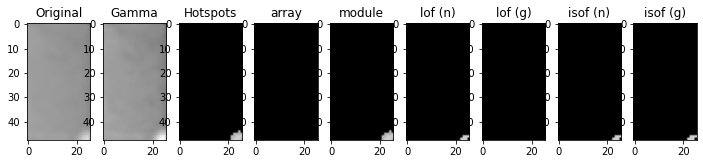

[-0.93515938 -1.02035377 -1.02334507 -1.00845798 -1.03935486 -1.00171248
 -1.02303182 -1.21235602 -1.00038014 -0.98526034]
[-2.20366402]
[-0.43299551 -0.47701075 -0.453929   -0.42982785 -0.49141631 -0.46617661
 -0.43496122 -0.52451514 -0.47050836 -0.44821065]
[-0.7407328]
[-0.97617182 -1.05357829 -1.01426357 -0.99045777 -1.50348191 -1.0809518
 -0.99086285 -0.99218864 -1.13080282 -1.04253475]
[-2.20366402]
[-0.44721312 -0.51674922 -0.48705335 -0.4811885  -0.66308425 -0.56440662
 -0.4806733  -0.46130135 -0.56013034 -0.49966621]
[-0.7407328]
5050.jpg Normal [5.0543349]
[-0.99492255 -0.98305816 -1.03674057 -1.01702481 -1.00851687 -1.05354445
 -1.03674057 -1.01452188 -1.01870945 -1.        ]
[-2.26337675]
[-0.46098965 -0.45526208 -0.46395863 -0.45659275 -0.44471497 -0.45581
 -0.46395863 -0.46269532 -0.47063182 -0.45826583]
[-0.75267535]
[-1.49032915 -1.07746861 -1.37007377 -1.83374503 -1.14006168 -0.96910188
 -1.3234075  -1.16419465 -1.71468621 -1.09107312]
[-2.26337675]
[-0.68384144 -0.556

[-0.98710349 -0.96962136 -1.         -1.06724795 -1.0202711  -1.
 -1.0110318  -3.33075801 -1.01409233 -1.        ]
[-2.23494876]
[-0.47152589 -0.43870266 -0.44989829 -0.48307831 -0.45309343 -0.42421742
 -0.44387405 -0.74959234 -0.50241421 -0.41730708]
[-0.74698975]
[-1.47585203 -1.33746298 -1.0238292  -1.86099405 -1.0183973  -1.00491625
 -1.04904749 -2.4028597  -2.43604487 -0.98469609]
[-2.23494876]
[-0.59284676 -0.57036349 -0.47779681 -0.61252    -0.44523052 -0.48847352
 -0.45708573 -0.68330067 -0.70207705 -0.47606416]
[-0.74698975]
4372.jpg Normal [5.43186237]
[-1.06154567 -1.         -1.02829846 -0.97737599 -1.00508762 -3.90342715
 -0.97467921 -0.98893481 -1.         -0.98693648]
[-2.20892891]
[-0.45331178 -0.44983074 -0.45700595 -0.45526334 -0.46708247 -0.77536495
 -0.46562367 -0.46831482 -0.46835408 -0.44544728]
[-0.74178578]
[-1.18603972 -1.05018926 -1.13972196 -1.69767355 -1.28459528 -2.66321026
 -1.00829495 -1.06727186 -1.06197046 -0.98558918]
[-2.20892891]
[-0.57407509 -0.5092

[-1.         -1.0281509  -0.98172259 -0.99736781 -0.99741754 -1.00762359
 -1.00851687 -1.08089254 -1.         -0.99782788]
[-2.26337675]
[-0.45826583 -0.45720423 -0.44035561 -0.46886462 -0.46981394 -0.48743539
 -0.44471497 -0.50751987 -0.4354733  -0.44101953]
[-0.75267535]
[-1.14006168 -1.09242037 -1.0610713  -1.20803583 -1.04759768 -0.97767489
 -1.56212341 -1.00743634 -1.0678208  -1.10377551]
[-2.26337675]
[-0.57059512 -0.51961325 -0.54461192 -0.58559482 -0.47448451 -0.45857542
 -0.70145819 -0.48081849 -0.55858182 -0.5330784 ]
[-0.75267535]
749.jpg Normal [5.79931571]
[-1.01595044 -1.00679143 -0.98428021 -1.01432197 -1.03581367 -1.01432197
 -0.99903576 -1.11075769 -0.96801083 -0.99027614]
[-2.2852886]
[-0.47189192 -0.47731921 -0.47376301 -0.47112653 -0.46419794 -0.47112653
 -0.4466008  -0.50797409 -0.46091368 -0.47688061]
[-0.75705772]
[-0.98489785 -1.03474794 -1.02952182 -1.03508412 -1.32041538 -1.03508412
 -1.08138539 -1.00016492 -1.0390932  -1.02207449]
[-2.2852886]
[-0.47230672 -0

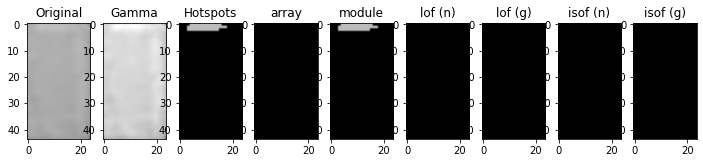

[-1.01577142 -0.97097463 -0.99741405 -0.9683821  -0.97097463 -0.99666667
 -1.00134612 -1.         -0.98831831 -0.99004342]
[-1.77910148]
[-0.4682914  -0.41861867 -0.43065219 -0.41549878 -0.41861867 -0.41995514
 -0.41803879 -0.41749672 -0.4428159  -0.42417069]
[-0.6558203]
[-1.34989613 -1.11890619 -1.31082254 -1.0527183  -1.13346445 -1.796054
 -1.38461485 -1.73217761 -1.03330195 -1.04450989]
[-1.77910148]
[-0.53288026 -0.56457991 -0.64515848 -0.52114655 -0.56710854 -0.70926988
 -0.63190313 -0.69674563 -0.52985506 -0.52487182]
[-0.6558203]
984.jpg Normal [1.90152253]
[-1.01879111 -1.15717066 -1.01524232 -0.98672236 -1.0106408  -2.54583815
 -0.98382462 -1.01674168 -0.98382462 -1.00393371]
[-2.20892891]
[-0.46063138 -0.49449535 -0.45990568 -0.46952597 -0.46583691 -0.70958834
 -0.46287746 -0.46825855 -0.46287746 -0.4758288 ]
[-0.74178578]
[-1.32808276 -1.05282774 -1.09007732 -1.50946562 -1.69767355 -1.00118822
 -1.21867283 -1.0636467  -1.21867283 -1.39920239]
[-2.20892891]
[-0.59451527 -0.5

[-1.00570827 -0.9723891  -1.03488737 -0.99747919 -1.0730467  -1.00786767
 -1.023155   -1.69677635 -0.96432004 -0.97261285]
[-2.29322991]
[-0.48393951 -0.43566596 -0.47101904 -0.46389712 -0.47936337 -0.43930646
 -0.45558574 -0.59323166 -0.44543036 -0.43119284]
[-0.75864598]
[-1.00212912 -1.00627549 -1.01252506 -1.15087697 -0.98597171 -0.99478633
 -1.0206275  -1.26860282 -1.00152455 -1.01006978]
[-2.29322991]
[-0.48562248 -0.48643388 -0.46483384 -0.51085367 -0.46630559 -0.48419202
 -0.52431576 -0.54779259 -0.48122697 -0.47951232]
[-0.75864598]
4373.jpg Normal [6.21197795]
[-1.06107628 -1.00959856 -1.43786727 -1.05485601 -1.01761907 -1.16924338
 -1.05784526 -1.03640871 -0.9716961  -1.56383285]
[-2.20892891]
[-0.52689072 -0.48540062 -0.62432259 -0.52392946 -0.47762716 -0.57530734
 -0.50294974 -0.51836082 -0.44941748 -0.55714386]
[-0.74178578]
[-1.12199399 -1.03902475 -1.66440447 -1.13972196 -1.00059235 -1.26665301
 -1.04929346 -1.05918936 -1.00661137 -1.48463174]
[-2.20892891]
[-0.54401954

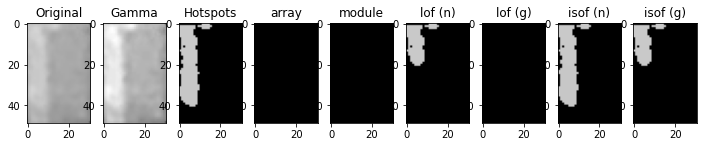

[-1.03990472 -1.01858894 -1.         -0.98883259 -1.01152081 -1.00508762
 -0.98436336 -1.00290517 -0.98290256 -0.98672236]
[-2.20892891]
[-0.50170776 -0.48377492 -0.46835408 -0.47457731 -0.44525465 -0.46708247
 -0.45661674 -0.4602766  -0.47257391 -0.46952597]
[-0.74178578]
[-1.79938188 -1.12199399 -0.96272004 -1.47999872 -1.03984818 -1.06501393
 -1.23383806 -1.0636467  -1.39920239 -1.03430185]
[-2.20892891]
[-0.67328518 -0.54401954 -0.45489555 -0.62755226 -0.49264374 -0.52126142
 -0.57178925 -0.52869645 -0.60748289 -0.49061489]
[-0.74178578]
2716.jpg Normal [5.11598079]
[-0.96167719 -0.98898009 -1.02769636 -1.00726688 -0.98816646 -1.02332847
 -1.05791376 -0.99705822 -0.99945566 -1.20697768]
[-2.13809084]
[-0.44392377 -0.4441729  -0.50411576 -0.45888245 -0.44835301 -0.43088259
 -0.47114603 -0.42967062 -0.45816509 -0.54896801]
[-0.72761817]
[-0.9947954  -1.24652024 -0.99484408 -1.02590134 -1.09254219 -1.03571136
 -1.61436    -1.04277327 -1.31581398 -1.01841337]
[-2.13809084]
[-0.48080936

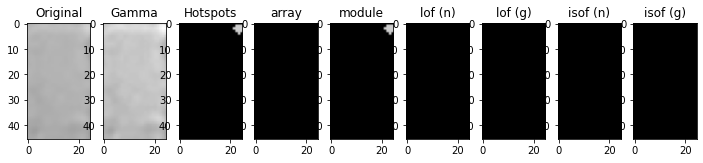

[-1.42066799 -0.99021661 -1.02592757 -1.         -0.98946146 -0.99021661
 -1.0110318  -1.0350365  -1.         -1.18450113]
[-2.23494876]
[-0.56147255 -0.44239981 -0.4348648  -0.41730708 -0.44257851 -0.44239981
 -0.44387405 -0.46871631 -0.41730708 -0.49685067]
[-0.74698975]
[-1.01909563 -1.436717   -1.09385354 -2.43604487 -0.98469609 -1.4041641
 -1.81763386 -1.04533005 -2.43604487 -0.99484041]
[-2.23494876]
[-0.45300503 -0.59326886 -0.51685086 -0.70207705 -0.47606416 -0.5881326
 -0.60625002 -0.46774014 -0.70207705 -0.44095203]
[-0.74698975]
4429.jpg Normal [5.43186237]
[-1.00508762 -1.         -1.03723937 -0.98672236 -0.99651203 -1.00290517
 -0.9946209  -1.06154567 -0.98382462 -0.98893481]
[-2.20892891]
[-0.46708247 -0.45050508 -0.4550237  -0.46952597 -0.43523622 -0.4602766
 -0.45315575 -0.45331178 -0.46287746 -0.46831482]
[-0.74178578]
[-1.50946562 -1.05361439 -1.30680248 -0.96272004 -1.0636467  -1.66440447
 -1.03984818 -1.32808276 -0.99847487 -1.13972196]
[-2.20892891]
[-0.62608251 -0

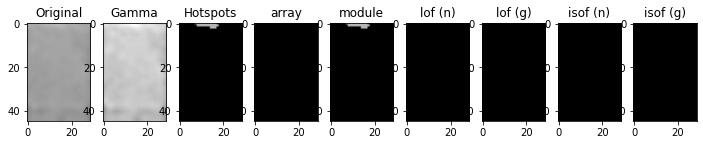

[-1.1912532  -1.01261457 -1.42165413 -1.00692541 -1.64955288 -1.
 -1.         -1.07745879 -2.38633747 -0.99717732]
[-2.22764357]
[-0.5677553  -0.46386503 -0.62880532 -0.48604201 -0.64885273 -0.43524359
 -0.45859868 -0.5403605  -0.66947803 -0.51788202]
[-0.74552871]
[-1.07659566 -1.02336518 -1.14401604 -0.99605711 -1.32524175 -1.
 -1.         -1.04500788 -2.38446574 -1.00090856]
[-2.22764357]
[-0.52292094 -0.48595039 -0.56419113 -0.50252866 -0.60572444 -0.46312251
 -0.45497374 -0.50271083 -0.67081236 -0.48484872]
[-0.74552871]
1948.jpg Normal [5.34125814]
[-1.09184095 -1.03703731 -1.25089172 -1.04206903 -1.31902891 -0.96547871
 -1.0130749  -0.95015632 -1.32980102 -1.11915237]
[-2.29322991]
[-0.4687537  -0.50987734 -0.53291571 -0.43960877 -0.53587617 -0.44418086
 -0.46152187 -0.44527321 -0.54270982 -0.50196653]
[-0.75864598]
[-0.96843907 -1.00124438 -0.97194451 -0.96995555 -1.05467158 -1.1226156
 -1.00230802 -1.00152455 -0.98550885 -1.0388292 ]
[-2.29322991]
[-0.50695742 -0.47023694 -0.4

[-1.23980742 -1.03877436 -0.99775528 -3.24280283 -1.13804935 -1.06026102
 -1.2930971  -1.09814879 -1.00527481 -1.64955288]
[-2.22764357]
[-0.57235421 -0.50392984 -0.48095021 -0.71100245 -0.54243272 -0.53326629
 -0.5874822  -0.54292913 -0.50416021 -0.64885273]
[-0.74552871]
[-1.32524175 -1.06621049 -0.98214764 -2.92051385 -1.17367133 -1.07659566
 -1.35763342 -1.1270673  -1.00695465 -1.76886678]
[-2.22764357]
[-0.60572444 -0.51730194 -0.48666239 -0.68970877 -0.57509087 -0.52292094
 -0.61928038 -0.54864328 -0.51270206 -0.68346003]
[-0.74552871]
2266.jpg Normal [5.34125814]
[-0.97758205 -0.97781499 -0.93679746 -1.01033737 -0.98230198 -1.0587709
 -1.03713138 -1.02992979 -1.03920546 -0.98230198]
[-2.21874353]
[-0.45569383 -0.44814558 -0.43948506 -0.45644875 -0.45694513 -0.50457067
 -0.45299551 -0.48004354 -0.48896283 -0.45694513]
[-0.74374871]
[-1.07355019 -1.22306676 -1.12803645 -1.56859019 -1.03356266 -1.04843058
 -1.75536829 -0.98946272 -1.0387668  -1.04258297]
[-2.21874353]
[-0.50693078 

[-1.0338778  -1.         -0.98219365 -0.98428021 -0.99416446 -1.00391658
 -0.97598867 -1.         -0.96466561 -1.01935874]
[-2.2852886]
[-0.45251527 -0.46276202 -0.45943074 -0.47376301 -0.4867511  -0.46012693
 -0.44700747 -0.45489584 -0.45705208 -0.46400718]
[-0.75705772]
[-1.00284388 -1.00045855 -1.00052471 -0.99882223 -1.2318114  -1.0173881
 -1.01188121 -1.00528208 -1.0312829  -1.02207449]
[-2.2852886]
[-0.4517674  -0.48149405 -0.45868355 -0.44646782 -0.59663962 -0.455571
 -0.482944   -0.49761188 -0.51059711 -0.48310114]
[-0.75705772]
3636.jpg Normal [6.09942086]
[-0.97781499 -1.49164319 -0.98949164 -1.10320713 -0.98456108 -0.98230198
 -1.03713138 -0.99594625 -1.04602918 -1.0352981 ]
[-2.21874353]
[-0.44814558 -0.59633599 -0.47067268 -0.50995813 -0.44011207 -0.45694513
 -0.45299551 -0.44907528 -0.49395627 -0.45382547]
[-0.74374871]
[-1.3426025  -0.99548829 -1.09049627 -1.05405912 -1.39235936 -1.09279238
 -1.9490641  -1.10233946 -0.95912561 -1.12803645]
[-2.21874353]
[-0.59333611 -0.4

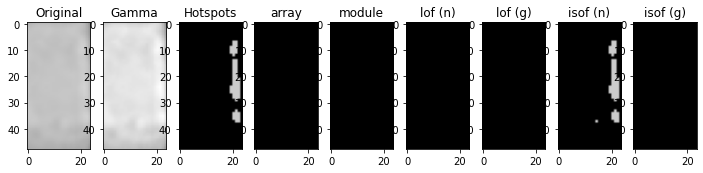

[-1.03020658 -1.00726688 -1.08992393 -1.03020658 -1.00769155 -0.99705822
 -0.99889949 -1.01910112 -1.02998931 -1.05029587]
[-2.13809084]
[-0.4659714  -0.45888245 -0.52723653 -0.4659714  -0.4292212  -0.42967062
 -0.45431772 -0.44077286 -0.45321198 -0.48910723]
[-0.72761817]
[-1.15950974 -1.04595547 -0.94630169 -1.15950974 -1.00687755 -1.01816422
 -1.03025934 -1.03482775 -1.03379395 -1.48557544]
[-2.13809084]
[-0.56448903 -0.46885417 -0.43189285 -0.56448903 -0.48316873 -0.52060532
 -0.52179761 -0.50865111 -0.47301532 -0.6748601 ]
[-0.72761817]
3971.jpg Normal [4.3460112]
[-1.00213456 -1.00093635 -1.0533858  -1.01678038 -1.00035367 -0.97985079
 -1.         -1.00045194 -1.11872276 -0.9650039 ]
[-2.22764357]
[-0.45107325 -0.47911999 -0.50253489 -0.47273472 -0.47347368 -0.44315301
 -0.45859868 -0.45632588 -0.521382   -0.45403623]
[-0.74552871]
[-1.02336518 -1.         -0.98083747 -0.97779569 -1.         -0.98214764
 -1.17367133 -1.00846566 -1.00342757 -0.99605711]
[-2.22764357]
[-0.48595039 

[-1.         -0.98672236 -1.         -1.18855909 -0.98693648 -0.99651203
 -2.00148468 -0.98382462 -1.         -1.        ]
[-2.20892891]
[-0.45050508 -0.46952597 -0.45050508 -0.49600921 -0.44544728 -0.43523622
 -0.65086266 -0.46287746 -0.45277958 -0.45738275]
[-0.74178578]
[-1.6311354  -1.12199399 -1.59976741 -1.00239612 -1.28459528 -1.87257385
 -1.02073442 -1.06226788 -1.50946562 -1.42486711]
[-2.20892891]
[-0.63503229 -0.54401954 -0.63779442 -0.48386784 -0.58521377 -0.68315043
 -0.4692115  -0.51677436 -0.62608251 -0.6162013 ]
[-0.74178578]
364.jpg Normal [5.11598079]
[-0.99945566 -1.05997112 -1.21854781 -0.99919082 -1.00769155 -1.30284813
 -1.13904251 -1.02023525 -1.02023525 -1.50221635]
[-2.13809084]
[-0.45816509 -0.55566401 -0.58258772 -0.48927701 -0.4292212  -0.60499736
 -0.57185524 -0.52426787 -0.52426787 -0.66330547]
[-0.72761817]
[-1.02840861 -1.10497654 -1.29109775 -1.01102021 -0.98972208 -1.3405302
 -1.15950974 -1.02141635 -1.02141635 -1.57858651]
[-2.13809084]
[-0.45692949 -

[-1.00639461 -1.176064   -1.08175714 -1.00639461 -1.94941947 -0.96167719
 -1.34641261 -1.60233272 -1.03178996 -1.00726688]
[-2.13809084]
[-0.48066619 -0.54114958 -0.51555801 -0.48066619 -0.66564491 -0.44392377
 -0.56898187 -0.61349054 -0.50725779 -0.45888245]
[-0.72761817]
[-1.02141635 -1.0674025  -1.00040008 -1.02141635 -0.99855901 -1.42703701
 -0.9698152  -1.03136972 -1.00988586 -1.14628445]
[-2.13809084]
[-0.52823376 -0.4760603  -0.47213526 -0.52823376 -0.44588181 -0.65212242
 -0.46437432 -0.43133369 -0.49558169 -0.56130046]
[-0.72761817]
1141.jpg Normal [4.3460112]
[-0.98646977 -0.99333333 -1.03934101 -0.98934767 -1.0337943  -1.
 -1.02205882 -1.03058397 -0.99642713 -0.98934767]
[-1.77910148]
[-0.43498541 -0.43286189 -0.43613765 -0.46404697 -0.44554619 -0.41749672
 -0.44823746 -0.43465555 -0.42359774 -0.46404697]
[-0.6558203]
[-1.96513859 -1.51236765 -1.13346445 -1.67205864 -1.04225393 -1.40528075
 -1.33224757 -1.27576339 -1.2169781  -1.6138184 ]
[-1.77910148]
[-0.72400094 -0.654020

[-0.96856892 -0.98949164 -1.01484647 -1.037954   -1.01128393 -0.98728905
 -1.01128393 -1.05349873 -0.97781499 -1.55968814]
[-2.21874353]
[-0.46520047 -0.47067268 -0.49868501 -0.45736833 -0.46335116 -0.47685079
 -0.46335116 -0.50047547 -0.44814558 -0.59440605]
[-0.74374871]
[-1.26193986 -1.01741357 -1.47260699 -1.0867316  -1.12803645 -1.36525099
 -1.11757841 -1.90928728 -0.99558033 -1.12546764]
[-2.21874353]
[-0.59325035 -0.47589718 -0.61969292 -0.46472862 -0.53784353 -0.5996772
 -0.53686472 -0.68979451 -0.45928772 -0.53185514]
[-0.74374871]
2689.jpg Normal [5.23291314]
[-0.98382462 -1.01846529 -1.29188269 -0.98382462 -1.01879111 -1.0677624
 -1.01674168 -1.18855909 -1.61195078 -1.01879111]
[-2.20892891]
[-0.46287746 -0.47383476 -0.51091971 -0.46287746 -0.46063138 -0.50027529
 -0.46825855 -0.49600921 -0.57386988 -0.46063138]
[-0.74178578]
[-1.45053183 -1.28459528 -1.05018926 -1.45053183 -1.69767355 -1.13972196
 -1.21867283 -1.06207108 -0.99253551 -1.69767355]
[-2.20892891]
[-0.62236556 -

[-1.2675256  -1.07024961 -0.98426275 -0.98256015 -1.30605221 -1.00221515
 -1.12428587 -1.07774394 -1.65439555 -1.02583395]
[-2.00267023]
[-0.55921288 -0.51756807 -0.42647554 -0.46282835 -0.57564478 -0.48475258
 -0.52781778 -0.46920678 -0.65946868 -0.48359445]
[-0.70053405]
[-1.23394474 -1.03795387 -1.00895179 -1.00151944 -1.2555929  -0.98727896
 -1.09508476 -1.04832657 -1.60016977 -1.06605886]
[-2.00267023]
[-0.57024056 -0.53089136 -0.45827722 -0.47417187 -0.58451013 -0.47252381
 -0.54376013 -0.50762385 -0.64518974 -0.48656859]
[-0.70053405]
2110.jpg Normal [3.18178063]
[-0.98946146 -1.00542853 -1.06002429 -0.98946146 -2.00861273 -1.20072727
 -1.02660464 -1.0350365  -1.05559264 -0.97298356]
[-2.23494876]
[-0.44257851 -0.46565844 -0.46873274 -0.44257851 -0.64874693 -0.51472084
 -0.44209287 -0.46871631 -0.45237543 -0.46150122]
[-0.74698975]
[-2.68890588 -2.14480318 -1.81763386 -2.68890588 -1.02239958 -1.09385354
 -3.03546092 -1.95525069 -3.09641848 -2.43604487]
[-2.23494876]
[-0.73801786

[-0.98138856 -0.97467921 -1.         -1.61195078 -1.23155048 -1.0106408
 -1.         -0.98893481 -1.01524232 -0.98693648]
[-2.20892891]
[-0.46297729 -0.46562367 -0.45050508 -0.57386988 -0.49696893 -0.46583691
 -0.45050508 -0.46831482 -0.45990568 -0.44544728]
[-0.74178578]
[-1.59976741 -1.03902475 -1.28459528 -1.00620168 -1.01565338 -1.06207108
 -1.28459528 -1.69767355 -1.00253509 -1.10603566]
[-2.20892891]
[-0.63779442 -0.49252328 -0.58521377 -0.46409493 -0.47750798 -0.53485091
 -0.58521377 -0.65547565 -0.48419421 -0.53772016]
[-0.74178578]
9.jpg Normal [5.11598079]
[-0.98968069 -1.00769155 -1.05029587 -1.00506139 -1.02389265 -0.98816646
 -1.02389265 -0.98849412 -1.02998931 -0.98816646]
[-2.13809084]
[-0.4527312  -0.4292212  -0.48910723 -0.46316323 -0.45638632 -0.44835301
 -0.45638632 -0.43173808 -0.45321198 -0.44835301]
[-0.72761817]
[-1.05266011 -1.00687755 -1.48557544 -1.02141635 -1.20775129 -1.02659198
 -1.20775129 -1.01102021 -1.03379395 -1.02659198]
[-2.13809084]
[-0.53622579 -0.

[-0.99952315 -0.97564687 -1.06002429 -0.99579567 -1.23919766 -0.97890743
 -1.06002429 -1.46744608 -0.99579567 -1.1835391 ]
[-2.23494876]
[-0.4236525  -0.44465758 -0.46873274 -0.42797951 -0.52135753 -0.46068059
 -0.46873274 -0.57936182 -0.42797951 -0.49879191]
[-0.74698975]
[-2.85597475 -2.05180628 -1.436717   -2.28703749 -0.98928441 -1.86099405
 -1.47585203 -0.97754596 -2.33670662 -1.0220671 ]
[-2.23494876]
[-0.74504173 -0.6349938  -0.59326886 -0.6862486  -0.46930691 -0.61252
 -0.59284676 -0.44144111 -0.69137503 -0.48966331]
[-0.74698975]
14.jpg Normal [5.43186237]
[-0.99482278 -0.998458   -1.06560528 -1.08279942 -1.01415587 -1.05162127
 -0.96820956 -0.98177457 -1.02583395 -1.30170066]
[-2.00267023]
[-0.42462481 -0.43878483 -0.50293604 -0.43744653 -0.43079795 -0.46901763
 -0.42576518 -0.42699878 -0.48359445 -0.55989821]
[-0.70053405]
[-1.05646051 -1.27069111 -0.98742302 -1.00228052 -1.08654432 -0.98727896
 -1.42998056 -1.0339181  -1.01641966 -0.96040216]
[-2.00267023]
[-0.49014087 -0.5

[-1.04918056 -1.03153707 -1.00391007 -1.         -1.0609769  -0.96587112
 -1.11207288 -0.998458   -1.01822108 -0.99931307]
[-2.00267023]
[-0.45302183 -0.44979992 -0.43567975 -0.47772007 -0.44678266 -0.4142659
 -0.44729151 -0.43878483 -0.46383956 -0.43876731]
[-0.70053405]
[-1.14937887 -1.0424284  -1.04600012 -1.28692998 -1.09508476 -1.01891588
 -1.00651119 -1.06297664 -1.74101601 -1.03443807]
[-2.00267023]
[-0.54724561 -0.45845013 -0.49074407 -0.57747127 -0.54376013 -0.50048424
 -0.48335494 -0.48682803 -0.66142953 -0.54256862]
[-0.70053405]
3533.jpg Normal [3.18178063]
[-1.03839371 -1.03806178 -1.         -1.         -1.02660464 -0.99060106
 -1.02742579 -0.96962136 -1.         -0.99952315]
[-2.23494876]
[-0.44121407 -0.4757309  -0.44865358 -0.43023123 -0.44209287 -0.48111272
 -0.45371774 -0.43870266 -0.44989829 -0.4236525 ]
[-0.74698975]
[-1.0238292  -2.23962605 -1.436717   -1.24002795 -1.04111942 -2.97563219
 -2.05180628 -1.73055329 -1.00986058 -0.97471001]
[-2.23494876]
[-0.47779681 

[-0.98693648 -0.98382462 -1.36013188 -1.01879111 -1.0677624  -1.
 -0.97958625 -1.0106408  -1.72145369 -1.        ]
[-2.20892891]
[-0.44544728 -0.46287746 -0.52298621 -0.46063138 -0.50027529 -0.44983074
 -0.4465829  -0.46583691 -0.60600711 -0.44620735]
[-0.74178578]
[-1.24928678 -1.05282774 -1.00829495 -1.06501393 -0.98073299 -1.6311354
 -1.12199399 -1.13972196 -0.976421   -1.35033032]
[-2.20892891]
[-0.57176126 -0.50706658 -0.47134694 -0.52126142 -0.46351412 -0.63503229
 -0.54401954 -0.5523665  -0.44349371 -0.60085107]
[-0.74178578]
667.jpg Normal [5.11598079]
[-1.00045194 -1.00716176 -1.01032786 -1.         -1.0010094  -0.99771776
 -0.9650039  -1.02261815 -0.9650039  -1.23464941]
[-2.22764357]
[-0.45632588 -0.47329692 -0.49181248 -0.43814544 -0.48073218 -0.47334781
 -0.45403623 -0.47478233 -0.45403623 -0.55765524]
[-0.74552871]
[-1.00695465 -1.05495335 -0.97779569 -1.46325843 -0.98214764 -0.99378744
 -1.09687987 -1.01590179 -1.10647948 -1.        ]
[-2.22764357]
[-0.51270206 -0.493700

[-0.96820956 -1.44054873 -1.02583395 -1.04918056 -1.04288637 -2.90533825
 -0.98177457 -0.98256015 -0.98256015 -0.98756999]
[-2.00267023]
[-0.42576518 -0.58086143 -0.48359445 -0.45302183 -0.47797849 -0.74668238
 -0.42699878 -0.46282835 -0.46282835 -0.47690081]
[-0.70053405]
[-1.01805295 -1.10218858 -1.0084279  -1.05370922 -1.50627228 -2.1385725
 -1.01435519 -1.08654432 -1.08654432 -1.03557839]
[-2.00267023]
[-0.45807721 -0.52214029 -0.43013775 -0.50820472 -0.62514248 -0.71395169
 -0.45913692 -0.54025676 -0.54025676 -0.5429595 ]
[-0.70053405]
2375.jpg Normal [3.18178063]
[-0.95578113 -0.99579567 -0.99952315 -1.02592757 -0.94418719 -1.02964344
 -1.05559264 -1.0110318  -1.0202711  -0.99021661]
[-2.23494876]
[-0.42001919 -0.42797951 -0.4236525  -0.4348648  -0.42088715 -0.43412813
 -0.45237543 -0.44387405 -0.45309343 -0.44239981]
[-0.74698975]
[-2.33670662 -1.55566122 -2.05180628 -1.9069729  -2.38637574 -2.68890588
 -1.77318721 -3.03546092 -1.09385354 -2.58505225]
[-2.23494876]
[-0.69137503 

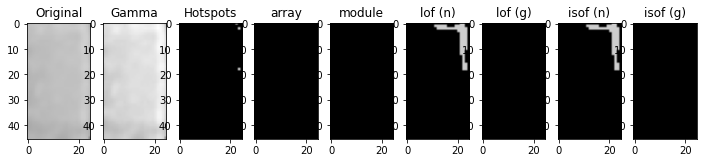

[-1.         -1.         -1.         -1.00290939 -1.00716176 -1.00252823
 -1.         -1.         -1.         -0.98820261]
[-2.22764357]
[-0.45207039 -0.43524359 -0.43694306 -0.47423141 -0.47329692 -0.46154224
 -0.43814544 -0.45273035 -0.4461886  -0.44527734]
[-0.74552871]
[-1.00116617 -1.00064105 -0.98823374 -1.07640036 -0.99656947 -1.2605302
 -1.01177352 -1.02679015 -1.03307915 -1.05495335]
[-2.22764357]
[-0.50619204 -0.47881776 -0.46531588 -0.52684345 -0.4555107  -0.59086448
 -0.48293245 -0.52612653 -0.48409916 -0.49370061]
[-0.74552871]
3902.jpg Normal [5.34125814]
[-1.01310924 -1.0338778  -1.         -1.93563306 -0.96466561 -0.99047837
 -1.22921906 -0.99903576 -1.         -0.99821588]
[-2.2852886]
[-0.47208795 -0.45251527 -0.44916198 -0.64889846 -0.45705208 -0.47613152
 -0.53646536 -0.4466008  -0.44916198 -0.45672835]
[-0.75705772]
[-1.27287178 -1.0318619  -1.03487045 -1.20274823 -1.10462335 -1.00552914
 -0.99626521 -1.02020191 -1.03109906 -1.0390932 ]
[-2.2852886]
[-0.59745501 -0

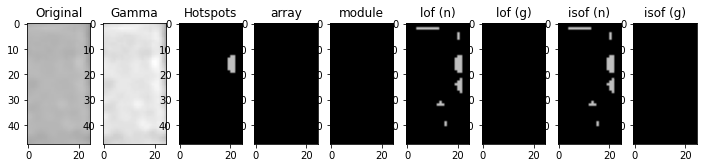

[-2.42683912 -2.97567812 -2.02361047 -1.94698553 -2.59485106 -2.87673776
 -1.22490014 -2.26256078 -3.5954555  -1.64443889]
[-2.23494876]
[-0.69840732 -0.75017496 -0.65293796 -0.65058888 -0.71287103 -0.74612547
 -0.55659846 -0.68403032 -0.76711276 -0.58020158]
[-0.74698975]
[-1.55566122 -1.95525069 -1.27040527 -1.24002795 -1.68416733 -1.9069729
 -1.04306371 -1.4041641  -2.43604487 -1.0220671 ]
[-2.23494876]
[-0.59676578 -0.62541964 -0.55135366 -0.54897655 -0.58476364 -0.61964464
 -0.47701154 -0.5881326  -0.70207705 -0.48966331]
[-0.74698975]
1867.jpg Multi-Hotspots [5.43186237]


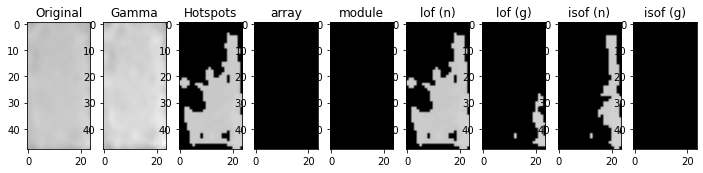

[-1.01846529 -1.00508762 -1.0137126  -1.0106408  -1.06154567 -1.
 -1.01858894 -1.90421076 -1.01152081 -1.03723937]
[-2.20892891]
[-0.47383476 -0.46708247 -0.45878603 -0.46583691 -0.45331178 -0.45050508
 -0.48377492 -0.62003663 -0.44525465 -0.4550237 ]
[-0.74178578]
[-1.00059235 -1.47999872 -1.18603972 -1.00661137 -1.35033032 -1.06226788
 -1.83455205 -1.05725537 -1.17293366 -1.28459528]
[-2.20892891]
[-0.46846749 -0.62755226 -0.57407509 -0.48664092 -0.60085107 -0.51677436
 -0.67854392 -0.49228896 -0.56484276 -0.58521377]
[-0.74178578]
3916.jpg Normal [5.11598079]
[-1.0338778  -1.26703887 -1.01595044 -1.4966283  -1.0157049  -2.08275491
 -1.02309247 -1.0338778  -3.15520606 -1.02309247]
[-2.2852886]
[-0.45251527 -0.53897626 -0.47189192 -0.60207753 -0.46613226 -0.65078401
 -0.49999094 -0.45251527 -0.74756642 -0.49999094]
[-0.75705772]
[-1.19104181 -1.00207886 -1.0312829  -1.06757941 -1.03241643 -1.00254792
 -1.03340396 -1.19104181 -1.5157426  -1.02952182]
[-2.2852886]
[-0.58803511 -0.463335

[-0.998458   -1.00316972 -0.96820956 -1.00366569 -1.08279942 -1.00391007
 -0.96587112 -0.96820956 -1.0609769  -0.98177457]
[-2.00267023]
[-0.43878483 -0.45010244 -0.42576518 -0.45018433 -0.43744653 -0.43567975
 -0.4142659  -0.42576518 -0.44678266 -0.42699878]
[-0.70053405]
[-1.13386076 -1.0708773  -1.28692998 -1.63538133 -0.99083569 -1.19259632
 -1.03795387 -1.27069111 -1.40846239 -1.04832657]
[-2.00267023]
[-0.54584335 -0.5369444  -0.57747127 -0.65142154 -0.47891354 -0.55811759
 -0.53089136 -0.58536826 -0.62134008 -0.50017866]
[-0.70053405]
4664.jpg Normal [3.18178063]
[-1.         -1.03839371 -1.16479924 -0.94418719 -0.99021661 -1.02660464
 -0.99447474 -0.98946146 -1.         -1.        ]
[-2.23494876]
[-0.41730708 -0.44121407 -0.50980276 -0.42088715 -0.44239981 -0.44209287
 -0.45872639 -0.44257851 -0.44141326 -0.45242175]
[-0.74698975]
[-2.10008408 -1.436717   -1.01432534 -1.09385354 -1.16014461 -0.98863918
 -2.97563219 -1.0238292  -1.9069729  -1.59917622]
[-2.23494876]
[-0.64481411

[-0.99775528 -1.         -1.         -1.01515814 -1.         -0.97386418
 -0.98741079 -1.01167534 -0.99650594 -1.01989896]
[-2.22764357]
[-0.48095021 -0.43814544 -0.45273035 -0.50441936 -0.43814544 -0.47558464
 -0.4515643  -0.49372718 -0.45684211 -0.48220395]
[-0.74552871]
[-1.00643158 -1.         -1.05935424 -1.14401604 -1.         -1.01925313
 -1.00689162 -1.05495335 -1.01177352 -1.00342757]
[-2.22764357]
[-0.49594672 -0.45586405 -0.49971155 -0.56419113 -0.45586405 -0.52682
 -0.47000859 -0.49370061 -0.48293245 -0.4788712 ]
[-0.74552871]
3137.jpg Normal [5.34125814]
[-0.98456108 -0.99594625 -1.037954   -0.97781499 -0.93679746 -1.0130877
 -0.97758205 -1.01033737 -1.10320713 -1.00767681]
[-2.21874353]
[-0.44011207 -0.44907528 -0.45736833 -0.44814558 -0.43948506 -0.45519076
 -0.45569383 -0.45644875 -0.50995813 -0.48023957]
[-0.74374871]
[-1.44637558 -1.11757841 -1.50460139 -1.3426025  -1.22306676 -1.28135977
 -1.08915795 -1.79341568 -1.04778919 -1.05445245]
[-2.21874353]
[-0.61743767 -0.

[-1.00916422 -1.11207288 -1.06560528 -1.00916422 -0.99482278 -0.96820956
 -1.0393178  -0.96307624 -1.         -0.94076973]
[-2.00267023]
[-0.44175269 -0.44729151 -0.50293604 -0.44175269 -0.42462481 -0.42576518
 -0.47926683 -0.42281806 -0.47772007 -0.42504082]
[-0.70053405]
[-1.08654432 -0.97824805 -0.99302775 -1.0708773  -1.01461667 -1.06297664
 -1.60016977 -1.04832657 -1.16822114 -1.0424284 ]
[-2.00267023]
[-0.54025676 -0.45894126 -0.42952414 -0.5369444  -0.46421393 -0.48682803
 -0.64518974 -0.50017866 -0.54226799 -0.45981031]
[-0.70053405]
4843.jpg Normal [3.18178063]
[-0.9716961  -1.0106408  -0.99659126 -0.99651203 -0.98436336 -1.01761907
 -1.01674168 -1.01707903 -0.99600763 -1.02135666]
[-2.20892891]
[-0.44941748 -0.46583691 -0.46340638 -0.43523622 -0.45661674 -0.47762716
 -0.46825855 -0.47920272 -0.47074687 -0.46955582]
[-0.74178578]
[-1.66440447 -1.02185307 -1.47999872 -1.06581504 -1.39920239 -1.09007732
 -0.9892194  -1.83455205 -1.56839942 -1.26665301]
[-2.20892891]
[-0.64708717

[-0.97801136 -0.97574214 -1.06961994 -0.99931818 -1.00320573 -1.02472142
 -1.00617944 -1.00616101 -1.00907976 -0.99157025]
[-2.09404644]
[-0.41723559 -0.45247693 -0.48675573 -0.43130028 -0.41976564 -0.43656465
 -0.46532893 -0.42560466 -0.43965415 -0.43161609]
[-0.71880929]
[-3.46647913 -1.755927   -1.05603068 -3.86759426 -2.75460534 -3.33305557
 -1.49983566 -4.69262473 -2.39181283 -4.00355117]
[-2.09404644]
[-0.77895604 -0.65045519 -0.51693437 -0.782654   -0.753989   -0.77422717
 -0.59235786 -0.79504007 -0.73319851 -0.78701218]
[-0.71880929]
920.jpg Normal [3.92686926]
[-0.99415348 -1.02753106 -1.03187752 -0.99272976 -1.00463649 -2.58930897
 -0.95482242 -1.23232653 -1.034289   -0.99415348]
[-2.14508313]
[-0.45186868 -0.47671885 -0.44919842 -0.46535908 -0.46653406 -0.70992705
 -0.43488981 -0.57941994 -0.46798572 -0.45186868]
[-0.72901663]
[-1.2670497  -1.02861608 -1.08487375 -1.00588632 -0.99198775 -1.30438308
 -1.03578065 -1.00066063 -1.66477056 -1.29041088]
[-2.14508313]
[-0.56507401 

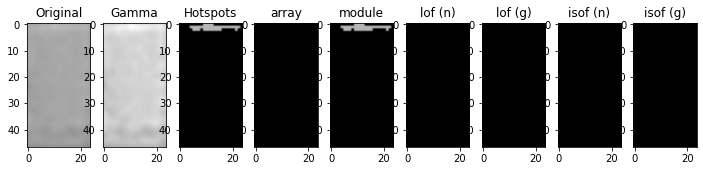

[-1.05686089 -1.0051999  -1.10511012 -1.01018521 -1.17047387 -0.99434298
 -1.02011822 -1.20317628 -1.08592397 -0.98521201]
[-2.18496]
[-0.55142268 -0.53583176 -0.57335704 -0.55024441 -0.59111685 -0.48650935
 -0.53304435 -0.58598763 -0.52048333 -0.54827516]
[-0.736992]
[-1.50375696 -1.14981704 -1.62280748 -1.36015226 -1.83188997 -1.02736748
 -1.39214709 -1.91968973 -1.05071131 -1.21948658]
[-2.18496]
[-0.66655769 -0.5899542  -0.69107072 -0.62581717 -0.73252727 -0.51003675
 -0.63589961 -0.73849889 -0.52834167 -0.58749608]
[-0.736992]
3447.jpg Normal [4.84127779]
[-1.02446855 -1.00777536 -1.02309197 -1.03183863 -1.037954   -1.00502718
 -1.01484647 -1.01974723 -0.98109672 -1.04602918]
[-2.21874353]
[-0.46238013 -0.47508732 -0.47215354 -0.4826635  -0.45736833 -0.4475669
 -0.49868501 -0.46530452 -0.454282   -0.49395627]
[-0.74374871]
[-1.06033982 -1.41824296 -1.00383033 -1.22306676 -1.09049627 -1.0120729
 -1.90928728 -1.20811747 -1.0387668  -1.05159535]
[-2.21874353]
[-0.52695932 -0.60729281

[-0.99919082 -1.04037635 -1.03505093 -1.01584952 -0.99889949 -0.99990014
 -0.99889949 -1.02389265 -0.99002292 -0.99990014]
[-2.13809084]
[-0.48927701 -0.47384962 -0.43341475 -0.50829309 -0.45431772 -0.48795739
 -0.45431772 -0.45638632 -0.43311275 -0.48795739]
[-0.72761817]
[-1.24652024 -1.02659198 -1.01672697 -1.57858651 -1.01347185 -1.09254219
 -1.01326972 -1.01864563 -1.00371619 -1.09254219]
[-2.13809084]
[-0.6032643  -0.53441284 -0.47440154 -0.70183143 -0.4889074  -0.56206271
 -0.49040264 -0.53067716 -0.45152495 -0.56206271]
[-0.72761817]
2943.jpg Normal [4.3460112]
[-1.0110318  -0.97890743 -0.99021661 -1.35567266 -1.11926339 -0.99579567
 -1.02592757 -0.97564687 -0.97824111 -0.99952315]
[-2.23494876]
[-0.44387405 -0.46068059 -0.44239981 -0.54549977 -0.50012666 -0.42797951
 -0.4348648  -0.44465758 -0.42452026 -0.4236525 ]
[-0.74698975]
[-3.09641848 -1.24002795 -2.53538312 -1.01626063 -0.98928441 -1.55566122
 -1.9069729  -1.4041641  -2.19221461 -2.05180628]
[-2.23494876]
[-0.75417074 

[-1.0202711  -1.02592757 -1.00542853 -0.97824111 -1.05559264 -1.20072727
 -0.99579567 -0.99579567 -2.23835847 -1.02964344]
[-2.23494876]
[-0.45309343 -0.4348648  -0.46565844 -0.42452026 -0.45237543 -0.51472084
 -0.42797951 -0.42797951 -0.66223529 -0.43412813]
[-0.74698975]
[-1.37126704 -2.33670662 -1.436717   -2.63697906 -2.23962605 -0.99901934
 -2.00352849 -1.95525069 -1.03434504 -3.21833361]
[-2.23494876]
[-0.58145572 -0.69137503 -0.59326886 -0.73403399 -0.6751005  -0.48095616
 -0.62584293 -0.62541964 -0.44266307 -0.76289526]
[-0.74698975]
3320.jpg Normal [5.43186237]
[-1.         -1.0533858  -1.00045194 -0.9650039  -3.16880847 -1.
 -1.         -1.00042672 -1.         -1.32675027]
[-2.22764357]
[-0.4461886  -0.50253489 -0.45632588 -0.45403623 -0.71486132 -0.44613858
 -0.44805732 -0.49787558 -0.45207039 -0.55272343]
[-0.74552871]
[-1.06484493 -1.         -1.00689162 -1.01590179 -1.75557791 -1.08038932
 -1.1270673  -0.99451115 -1.58155843 -0.99882752]
[-2.22764357]
[-0.51612186 -0.4820

[-0.99027893 -1.00616101 -0.97801136 -0.99140279 -1.88169708 -1.00544717
 -0.98059401 -0.98708436 -1.         -1.01779847]
[-2.09404644]
[-0.42979413 -0.42560466 -0.41723559 -0.42402842 -0.63876452 -0.43852235
 -0.43743342 -0.42931573 -0.44466004 -0.42289532]
[-0.71880929]
[-3.19963202 -4.07195186 -3.0045634  -4.9028935  -0.99091846 -2.10960331
 -3.53319091 -2.33432571 -4.41479973 -3.93515049]
[-2.09404644]
[-0.77213468 -0.78701218 -0.76537305 -0.79827411 -0.43627028 -0.70593817
 -0.78053874 -0.7317118  -0.79181913 -0.78701218]
[-0.71880929]
3308.jpg Normal [3.92686926]
[-1.         -0.98820261 -0.99443055 -1.         -1.00865738 -1.
 -0.98425901 -1.         -0.99650594 -1.00035367]
[-2.22764357]
[-0.43683774 -0.44527734 -0.45400942 -0.45734375 -0.49123711 -0.43814544
 -0.46702036 -0.45207039 -0.45684211 -0.47347368]
[-0.74552871]
[-1.03077309 -1.00643158 -0.99451115 -1.01177352 -0.99554833 -0.99389308
 -1.14401604 -0.98214764 -0.99937046 -0.99882752]
[-2.22764357]
[-0.47368971 -0.4959

[-1.01879111 -1.         -1.03723937 -1.0677624  -1.         -0.98138856
 -0.98693648 -1.49626146 -0.99288822 -1.        ]
[-2.20892891]
[-0.46063138 -0.44983074 -0.4550237  -0.50027529 -0.45050508 -0.46297729
 -0.44544728 -0.54930017 -0.45043041 -0.44620735]
[-0.74178578]
[-0.98073299 -1.06207108 -1.45053183 -1.04150299 -1.06727186 -1.18603972
 -1.07258989 -0.976421   -1.13972196 -1.0426809 ]
[-2.20892891]
[-0.46351412 -0.53485091 -0.62236556 -0.48756293 -0.53275435 -0.57407509
 -0.49129126 -0.44349371 -0.5523665  -0.50563288]
[-0.74178578]
276.jpg Normal [5.11598079]
[-0.98976484 -1.00855033 -0.98337153 -1.         -0.98337153 -1.0373336
 -0.99821588 -1.         -1.00855033 -1.00033229]
[-2.2852886]
[-0.45876259 -0.46665337 -0.46540084 -0.46276202 -0.46540084 -0.48229577
 -0.45672835 -0.4433859  -0.46665337 -0.48262359]
[-0.75705772]
[-1.03506472 -1.10462335 -1.02231374 -1.01437151 -1.02231374 -1.19104181
 -1.03241643 -1.04335315 -1.10462335 -1.32041538]
[-2.2852886]
[-0.54181701 -0.

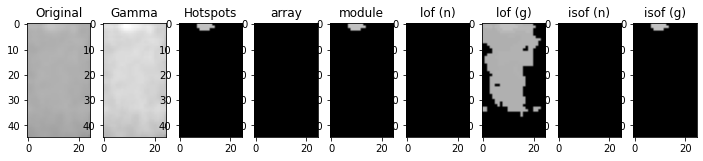

[-0.99423518 -0.99027893 -0.98098613 -1.02472142 -1.01779847 -0.98539407
 -1.00616101 -1.00918215 -0.98226985 -0.99140279]
[-2.09404644]
[-0.43328433 -0.42979413 -0.42640759 -0.43656465 -0.42289532 -0.4562018
 -0.42560466 -0.44850424 -0.44892919 -0.42402842]
[-0.71880929]
[-3.0045634  -1.38945102 -2.57472642 -1.23850322 -1.80648937 -1.00740357
 -1.9049143  -4.00355117 -0.99873638 -2.39181283]
[-2.09404644]
[-0.76537305 -0.58969385 -0.7403403  -0.56457107 -0.66440214 -0.49868599
 -0.67819089 -0.78701218 -0.48416296 -0.73319851]
[-0.71880929]
3644.jpg Normal [3.92686926]
[-1.0202711  -1.02592757 -1.18450113 -1.0202711  -1.02660464 -1.3922622
 -1.1835391  -1.69591534 -0.97564687 -0.97564687]
[-2.23494876]
[-0.45309343 -0.4348648  -0.49685067 -0.45309343 -0.44209287 -0.54754648
 -0.49879191 -0.60609639 -0.44465758 -0.44465758]
[-0.74698975]
[-1.59917622 -2.74083269 -1.04112733 -1.64269122 -2.53538312 -1.04533005
 -1.02123356 -1.01675883 -2.10008408 -2.10008408]
[-2.23494876]
[-0.59210705 -

[-1.25205286 -1.01022724 -1.0281506  -1.01641302 -0.99423518 -0.98059401
 -1.00291231 -1.05270787 -1.01641302 -3.48532751]
[-2.09404644]
[-0.53165145 -0.46150843 -0.45598992 -0.47007398 -0.43328433 -0.43743342
 -0.4682721  -0.45149524 -0.47007398 -0.75775104]
[-0.71880929]
[-4.69262473 -2.22109349 -1.01167076 -3.46647913 -1.38945102 -1.00654211
 -3.0045634  -1.71205122 -3.53319091 -2.36032806]
[-2.09404644]
[-0.79504007 -0.72138892 -0.43532464 -0.77895604 -0.58969385 -0.48859213
 -0.76537305 -0.64118869 -0.78053874 -0.70784005]
[-0.71880929]
3678.jpg Normal [3.92686926]
[-1.00704323 -1.         -0.96611607 -1.         -1.         -0.97368568
 -1.01216216 -0.98427318 -1.01127804 -1.        ]
[-2.28889359]
[-0.4684322  -0.45705368 -0.4382467  -0.46042398 -0.45329886 -0.46378399
 -0.46617683 -0.45658526 -0.46668865 -0.43977973]
[-0.75777872]
[-1.23707823 -1.05692313 -1.0943232  -0.96862048 -1.03407136 -1.16142956
 -0.97358883 -1.08997697 -1.39282549 -0.98090519]
[-2.28889359]
[-0.60602539

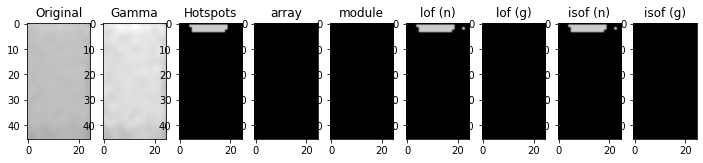

[-1.08478683 -0.98947587 -1.00078056 -1.01566721 -0.99229944 -1.10511012
 -1.         -1.62862503 -1.05424339 -1.35573569]
[-2.18496]
[-0.56116135 -0.45053091 -0.53786656 -0.46250864 -0.49638055 -0.57335704
 -0.44194794 -0.60672028 -0.52362814 -0.61391185]
[-0.736992]
[-1.2991471  -1.01354336 -1.14981704 -0.98427451 -1.05625221 -1.33187776
 -0.9885848  -1.42605846 -0.98506872 -1.83188997]
[-2.18496]
[-0.60993568 -0.4701698  -0.5899542  -0.48583957 -0.50161978 -0.61452576
 -0.44544717 -0.58469766 -0.52684095 -0.73252727]
[-0.736992]
2214.jpg Normal [4.84127779]
[-1.         -1.         -1.02742579 -0.94418719 -0.99447474 -1.09386402
 -1.         -1.         -0.98378684 -1.        ]
[-2.23494876]
[-0.44030229 -0.43745389 -0.45371774 -0.42088715 -0.45872639 -0.47932128
 -0.43745389 -0.44403688 -0.48480122 -0.44403688]
[-0.74698975]
[-1.04496209 -1.02123356 -1.55566122 -1.0275067  -1.20930054 -0.95955149
 -1.0220671  -1.03695657 -2.14480318 -1.0554939 ]
[-2.23494876]
[-0.46866476 -0.490570

[-0.98805768 -1.01216216 -0.99799107 -1.         -1.02837838 -1.
 -1.02243281 -1.03648649 -1.40063949 -1.03648649]
[-2.28889359]
[-0.42486622 -0.46617683 -0.43419768 -0.44590723 -0.45309414 -0.45329886
 -0.48998738 -0.45402958 -0.56336199 -0.45402958]
[-0.75777872]
[-1.05905275 -0.96140313 -1.0185639  -0.98090519 -1.0943232  -1.08243909
 -1.01613025 -1.0068447  -1.00283769 -0.97358883]
[-2.28889359]
[-0.50800755 -0.52999368 -0.52650764 -0.52733075 -0.51856573 -0.57425279
 -0.50662613 -0.51203629 -0.44189795 -0.52791862]
[-0.75777872]
3903.jpg Normal [6.15026168]
[-1.56499698 -1.10715099 -0.98652593 -1.41857387 -1.90905587 -1.13435037
 -1.31689318 -1.04332076 -1.18229812 -0.99202803]
[-2.37964627]
[-0.58273671 -0.50984016 -0.43130506 -0.53147175 -0.63549364 -0.50029962
 -0.53679136 -0.47236948 -0.53480524 -0.4615503 ]
[-0.77592925]
[-3.94596269 -2.7912494  -1.40744656 -3.65520754 -4.62716046 -3.00723893
 -3.49321539 -0.99877821 -3.22322847 -2.38495417]
[-2.37964627]
[-0.76797875 -0.6786

[-1.         -0.96962136 -1.         -1.         -0.99060106 -1.07876156
 -1.         -0.99579567 -1.01938352 -1.        ]
[-2.23494876]
[-0.44403688 -0.43870266 -0.44141326 -0.46175099 -0.48111272 -0.44748663
 -0.43745389 -0.42797951 -0.45429838 -0.41765674]
[-0.74698975]
[-1.03695657 -1.29906823 -1.04306371 -1.20930054 -2.28703749 -0.98517815
 -1.03478866 -0.99432807 -1.51763301 -0.98928441]
[-2.23494876]
[-0.48152945 -0.55952164 -0.47701154 -0.55099145 -0.6862486  -0.44896771
 -0.49121696 -0.43759215 -0.59449118 -0.46930691]
[-0.74698975]
4063.jpg Normal [5.43186237]
[-1.06961994 -1.98816529 -1.16759398 -1.41218813 -0.97574214 -2.857911
 -1.33559326 -1.63017183 -1.12245828 -1.02969553]
[-2.09404644]
[-0.48675573 -0.65547417 -0.51500127 -0.55820688 -0.45247693 -0.72957783
 -0.55144557 -0.60098724 -0.50994126 -0.47187771]
[-0.71880929]
[-2.57472642 -0.9868253  -1.62429964 -1.05603068 -4.27715391 -1.00611679
 -1.13568809 -1.00591927 -1.80648937 -3.2663438 ]
[-2.09404644]
[-0.7403403  -

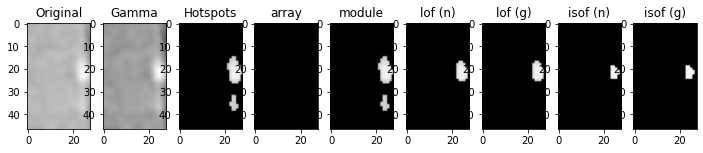

[-1.         -0.96130731 -1.         -1.         -1.         -1.
 -1.         -0.99631417 -1.         -0.98643359]
[-2.18496]
[-0.44251131 -0.45511671 -0.45043417 -0.45251403 -0.4622722  -0.43957491
 -0.4539687  -0.44707361 -0.44625589 -0.46491912]
[-0.736992]
[-1.21948658 -1.04692279 -1.26510329 -1.06602463 -1.05778189 -1.00077001
 -0.98506872 -1.58188387 -1.36015226 -0.99909745]
[-2.18496]
[-0.58749608 -0.49377729 -0.60923044 -0.52871039 -0.51779895 -0.52756757
 -0.52684095 -0.68522169 -0.62581717 -0.50964409]
[-0.736992]
2360.jpg Normal [4.84127779]
[-0.99767686 -1.02748103 -1.01425021 -1.02085007 -1.01127804 -1.0379523
 -1.         -0.99957184 -1.03565497 -1.        ]
[-2.28889359]
[-0.44601465 -0.45923451 -0.47440855 -0.46032772 -0.46668865 -0.48087558
 -0.46042398 -0.48286562 -0.48667053 -0.45705368]
[-0.75777872]
[-0.98090519 -1.16142956 -1.07490121 -0.9980851  -1.03407136 -1.39282549
 -1.06611542 -1.19702893 -1.08997697 -0.97358883]
[-2.28889359]
[-0.52733075 -0.59865115 -0.561

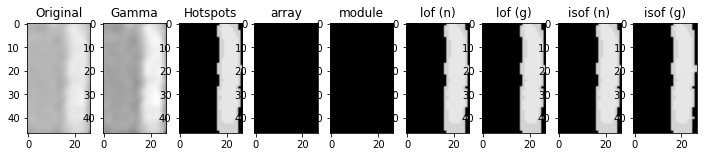

[-1.02085007 -0.98299107 -1.12853082 -0.98486607 -1.         -1.02106779
 -1.02106779 -1.02837838 -1.48376216 -1.00327481]
[-2.28889359]
[-0.46032772 -0.44276912 -0.46953756 -0.43628731 -0.44869001 -0.4287602
 -0.4287602  -0.46953709 -0.59734185 -0.45437762]
[-0.75777872]
[-1.06766771 -0.96140313 -1.0468319  -0.98090519 -1.23707823 -1.01888708
 -1.0068447  -1.05692313 -0.99728933 -1.05584967]
[-2.28889359]
[-0.52326424 -0.52999368 -0.47215695 -0.5303875  -0.60602539 -0.51442173
 -0.51203629 -0.54759608 -0.45228881 -0.54026827]
[-0.75777872]
100.jpg Normal [6.15026168]
[-0.97970012 -0.98290229 -0.98652593 -1.00157316 -1.14247807 -1.04109825
 -1.02617325 -0.97966836 -2.11061254 -0.98652593]
[-2.37964627]
[-0.42575949 -0.42453146 -0.43130506 -0.44740711 -0.50966725 -0.47525962
 -0.45476714 -0.45469324 -0.61391109 -0.43130506]
[-0.77592925]
[-1.09205538 -3.38522062 -2.73725201 -1.01962431 -1.71511196 -4.19102774
 -3.22322847 -4.00411372 -1.02822161 -2.74064523]
[-2.37964627]
[-0.48884694 -

[-1.         -1.09036497 -0.99799107 -1.18862523 -0.99767686 -1.58157878
 -0.99033818 -0.98604496 -0.98486607 -1.        ]
[-2.28889359]
[-0.43977973 -0.48959624 -0.43419768 -0.50238256 -0.44601465 -0.62096717
 -0.46695896 -0.46815595 -0.43628731 -0.45329886]
[-0.75777872]
[-1.03407136 -0.98413253 -1.0185639  -1.01450777 -1.35574281 -1.0021152
 -1.03489316 -1.05725312 -1.01888708 -1.08997697]
[-2.28889359]
[-0.52237672 -0.45202581 -0.52650764 -0.4560904  -0.65842268 -0.45166227
 -0.49126975 -0.51626044 -0.51442173 -0.57068081]
[-0.75777872]
1457.jpg Normal [6.15026168]
[-0.99489674 -1.00261066 -1.00949133 -1.03473212 -0.98451593 -1.01128133
 -0.97852737 -1.03473212 -1.00261066 -1.00261066]
[-2.14508313]
[-0.44314084 -0.47436979 -0.48375038 -0.50280779 -0.48422965 -0.45925835
 -0.45224312 -0.50280779 -0.47436979 -0.47436979]
[-0.72901663]
[-0.96093325 -1.83010435 -1.18764735 -1.54868514 -2.23816222 -1.0279449
 -1.02861608 -1.58738028 -1.78877091 -1.78877091]
[-2.14508313]
[-0.49591853 -

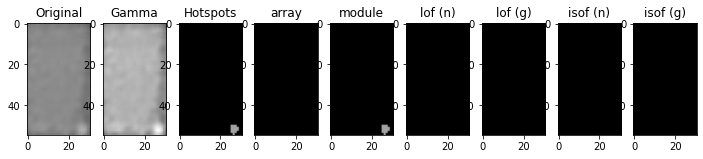

[-1.00291231 -0.99862842 -1.01487521 -1.06086516 -0.99974464 -1.00291231
 -0.99646727 -1.00145229 -0.97769753 -1.49078454]
[-2.09404644]
[-0.4682721  -0.42771835 -0.46595124 -0.49569736 -0.43320444 -0.4682721
 -0.47078929 -0.45564199 -0.44773695 -0.56634305]
[-0.71880929]
[-2.57472642 -1.26840255 -2.00595228 -3.39976735 -1.06941345 -2.51375522
 -2.33432571 -2.81709486 -1.62429964 -4.83280391]
[-2.09404644]
[-0.7403403  -0.57185058 -0.69062449 -0.77685076 -0.52548446 -0.7403403
 -0.7317118  -0.753989   -0.62450613 -0.79611663]
[-0.71880929]
4507.jpg Normal [3.92686926]
[-1.00090203 -1.04054775 -1.         -0.99271562 -1.68611395 -1.02024808
 -1.01183528 -1.0043652  -1.01183528 -1.0136612 ]
[-2.26958708]
[-0.44816062 -0.47414178 -0.45553249 -0.45859215 -0.59832649 -0.49366053
 -0.45055342 -0.46488678 -0.45055342 -0.45734852]
[-0.75391742]
[-1.29579608 -0.99220561 -1.04108472 -1.01201002 -0.99645545 -1.03834802
 -1.06194623 -0.98520078 -1.06194623 -1.53739378]
[-2.26958708]
[-0.56867539 -

[-1.08589982 -0.97817438 -1.19901764 -1.00533655 -1.03565497 -0.96223566
 -1.01068155 -1.04260145 -2.05956703 -1.06008919]
[-2.28889359]
[-0.53093315 -0.55568692 -0.58447214 -0.51761397 -0.48667053 -0.5415843
 -0.52264776 -0.51543391 -0.63523547 -0.55269568]
[-0.75777872]
[-1.06425001 -1.01894353 -1.29641052 -1.0068447  -1.05642743 -0.96945024
 -1.07490121 -1.0943232  -1.93149979 -1.13176342]
[-2.28889359]
[-0.53560466 -0.52165299 -0.64640902 -0.51203629 -0.48159967 -0.51595719
 -0.56190203 -0.51856573 -0.62494868 -0.58622316]
[-0.75777872]
4277.jpg Normal [6.15026168]
[-1.0217859  -1.02337841 -1.         -1.04032464 -0.9923377  -1.00971857
 -1.59805782 -1.02617244 -1.00876597 -0.98700245]
[-2.16466685]
[-0.49607359 -0.4898958  -0.43900818 -0.45926505 -0.48355776 -0.48030955
 -0.57558269 -0.51142102 -0.49921998 -0.47844056]
[-0.73293337]
[-1.38509286 -1.19293407 -1.00166865 -1.04546064 -1.29544018 -1.11486409
 -1.00391912 -1.52162814 -1.31600272 -1.21977002]
[-2.16466685]
[-0.63011171 

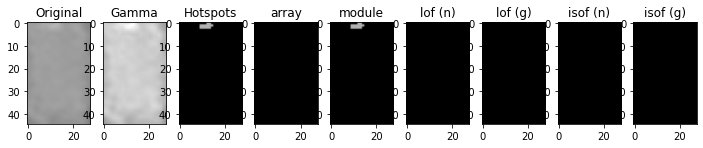

[-1.01431552 -0.98805768 -1.2221958  -0.99033818 -1.01899752 -0.99799107
 -1.82760214 -1.18862523 -0.98604496 -1.02106779]
[-2.28889359]
[-0.45614112 -0.42486622 -0.50365812 -0.46695896 -0.47822381 -0.43419768
 -0.58686958 -0.50238256 -0.46815595 -0.4287602 ]
[-0.75777872]
[-1.0171773  -1.05692313 -1.02372966 -0.96862048 -1.06611542 -1.29641052
 -1.00283769 -1.04496998 -0.96140313 -1.07490121]
[-2.28889359]
[-0.52422881 -0.54759608 -0.49570751 -0.53354806 -0.53057102 -0.64640902
 -0.44189795 -0.50441791 -0.52999368 -0.56190203]
[-0.75777872]
1441.jpg Normal [6.15026168]
[-0.95578113 -1.09386402 -0.97890743 -0.99579567 -1.03839371 -1.02592757
 -0.97564687 -2.66958496 -0.94418719 -1.05559264]
[-2.23494876]
[-0.42001919 -0.47932128 -0.46068059 -0.42797951 -0.44121407 -0.4348648
 -0.44465758 -0.70157262 -0.42088715 -0.45237543]
[-0.74698975]
[-1.64269122 -1.06584141 -1.00986058 -1.12484528 -2.23962605 -1.436717
 -1.04112733 -1.16571976 -1.81763386 -1.29906823]
[-2.23494876]
[-0.58824723 -0

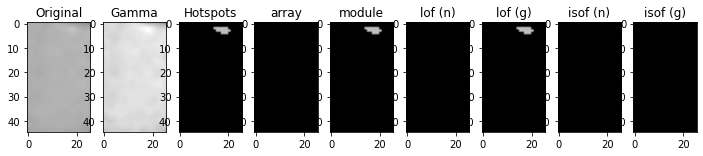

[-1.03178996 -1.02348398 -1.40237487 -0.96167719 -1.02348398 -1.00639461
 -1.0127031  -2.4755983  -1.14576527 -0.93814471]
[-2.13809084]
[-0.50725779 -0.46278152 -0.57706434 -0.44392377 -0.46278152 -0.48066619
 -0.46827246 -0.71480292 -0.53810165 -0.4275236 ]
[-0.72761817]
[-0.99478929 -1.10497654 -1.00917207 -1.22483591 -1.10497654 -1.01816422
 -1.02453453 -1.12172381 -1.03886188 -1.45630622]
[-2.13809084]
[-0.48423214 -0.56684803 -0.44256101 -0.59070543 -0.56684803 -0.52060532
 -0.52129481 -0.52363404 -0.46615499 -0.66074507]
[-0.72761817]
1327.jpg Normal [4.3460112]
[-1.00795989 -0.99655516 -1.39555099 -0.99638357 -1.02753106 -0.99514303
 -1.00463649 -0.99638357 -1.04383194 -4.33900346]
[-2.14508313]
[-0.44576898 -0.44749476 -0.59613022 -0.44949296 -0.47671885 -0.44356431
 -0.46653406 -0.44949296 -0.50949772 -0.78223441]
[-0.72901663]
[-1.66477056 -1.00197157 -0.96247509 -1.24474958 -0.99352769 -1.02854347
 -1.16216846 -1.22800489 -1.0090268  -2.43368708]
[-2.14508313]
[-0.64437897 

[-1.         -1.02566326 -1.02837838 -1.01431552 -1.03738216 -0.98805768
 -1.82760214 -1.         -1.02106779 -1.        ]
[-2.28889359]
[-0.44590723 -0.50376098 -0.46953709 -0.45614112 -0.47503918 -0.42486622
 -0.58686958 -0.45225592 -0.4287602  -0.43977973]
[-0.75777872]
[-1.0482815  -1.00625481 -1.06611542 -0.98703483 -1.21482862 -1.02372966
 -1.11498889 -0.98643364 -1.02972128 -1.00952231]
[-2.28889359]
[-0.51831074 -0.44470296 -0.53057102 -0.45841244 -0.59554743 -0.49570751
 -0.49205157 -0.51344863 -0.52311675 -0.52029556]
[-0.75777872]
2835.jpg Normal [6.15026168]
[-1.00240623 -0.9948292  -1.00265221 -1.06854815 -1.         -0.98340179
 -1.         -1.01669169 -1.00240623 -1.23694573]
[-2.30688477]
[-0.5016211  -0.47052137 -0.4985897  -0.51766829 -0.4518188  -0.48575228
 -0.46948839 -0.47664368 -0.5016211  -0.54892456]
[-0.76137695]
[-4.11316453 -2.81271097 -3.78211923 -4.62291569 -1.43764725 -3.61806139
 -2.1405943  -3.12881746 -4.19812305 -5.48128977]
[-2.30688477]
[-0.77580026

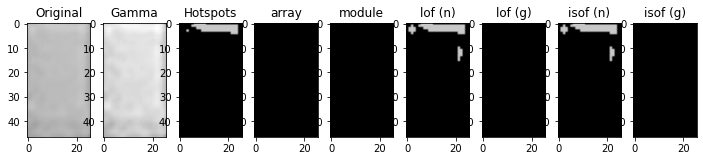

[-1.         -1.         -1.         -0.96130731 -1.         -1.09457485
 -0.98947587 -1.         -1.         -0.99041656]
[-2.18496]
[-0.43957491 -0.47011368 -0.45826201 -0.45511671 -0.46914669 -0.47823612
 -0.45053091 -0.44251131 -0.45251403 -0.45271504]
[-0.736992]
[-1.26510329 -1.0079223  -1.09684815 -1.00940803 -1.14981704 -0.99742394
 -1.02736748 -1.87430172 -1.42935038 -1.00077001]
[-2.18496]
[-0.60923044 -0.5351816  -0.54610943 -0.52900111 -0.5899542  -0.48901632
 -0.51003675 -0.73401563 -0.65020825 -0.52756757]
[-0.736992]
664.jpg Normal [4.84127779]
[-1.00947115 -1.09946326 -1.         -0.97285981 -0.9577804  -0.97340003
 -1.11327675 -1.00359469 -0.99776086 -1.0036075 ]
[-2.26958708]
[-0.45740549 -0.51052038 -0.4659945  -0.50176636 -0.44116507 -0.47249873
 -0.54999967 -0.47737107 -0.47787161 -0.46926934]
[-0.75391742]
[-0.99628617 -1.76895797 -1.0187035  -1.32441808 -1.02031186 -0.98994258
 -0.99337539 -0.99944936 -0.97280259 -1.04983265]
[-2.26958708]
[-0.459183   -0.6625994

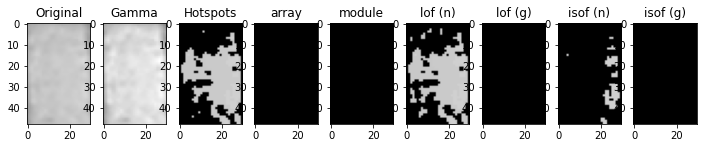

[-1.04702343 -0.98539407 -1.41218813 -1.00617944 -1.21563043 -1.02371205
 -1.08361171 -1.00907976 -1.00617944 -1.14370509]
[-2.09404644]
[-0.47720981 -0.4562018  -0.55820688 -0.46532893 -0.53049336 -0.46211648
 -0.49774347 -0.43965415 -0.46532893 -0.51175706]
[-0.71880929]
[-2.22109349 -3.80003802 -1.01058986 -3.13292024 -1.1196152  -2.69678511
 -1.66817543 -4.55329001 -3.13292024 -1.29616449]
[-2.09404644]
[-0.72138892 -0.782654   -0.48403854 -0.76900654 -0.54542837 -0.75347904
 -0.63391963 -0.79289133 -0.76900654 -0.5776108 ]
[-0.71880929]
499.jpg Normal [3.92686926]
[-0.98438369 -1.         -0.99739664 -0.99413019 -1.         -1.04136176
 -0.99569229 -0.98957046 -1.43352718 -0.9883461 ]
[-2.16466685]
[-0.43941068 -0.43331051 -0.46005056 -0.43836181 -0.43440976 -0.48129367
 -0.43630391 -0.420504   -0.56077298 -0.42645881]
[-0.73293337]
[-1.02966627 -1.19293407 -0.99666299 -1.03886717 -1.38509286 -0.9980016
 -1.0796484  -1.05216231 -0.98827561 -1.11486409]
[-2.16466685]
[-0.5065849  -

[-0.98759471 -1.00542416 -0.9905171  -0.99524389 -1.01084089 -0.97998395
 -1.01721649 -0.99512731 -1.01020744 -0.99957777]
[-2.30688477]
[-0.44683385 -0.45025267 -0.44052008 -0.45804967 -0.47486614 -0.44086159
 -0.4843839  -0.44910806 -0.44829965 -0.46242828]
[-0.76137695]
[-1.89809341 -4.11316453 -3.12881746 -5.22201978 -4.36804011 -3.37197462
 -3.86414816 -2.2109495  -1.4842233  -2.42500893]
[-2.30688477]
[-0.66941223 -0.77580026 -0.76433807 -0.78212465 -0.78001081 -0.77109055
 -0.77318022 -0.71700485 -0.58523745 -0.73641804]
[-0.76137695]
328.jpg Normal [6.41039469]
[-1.02449951 -1.08165598 -0.97879257 -0.99346405 -1.1338012  -1.01735596
 -0.99726906 -0.99346405 -0.99688914 -1.08080387]
[-2.37964627]
[-0.41431064 -0.44966827 -0.42761606 -0.41621521 -0.47926119 -0.41252629
 -0.40760627 -0.41621521 -0.43444727 -0.44633967]
[-0.77592925]
[-4.00411372 -2.5627997  -3.33122324 -3.54721278 -1.93753282 -3.94596269
 -3.00723893 -3.43921801 -4.75176981 -2.74064523]
[-2.37964627]
[-0.77024103 

[-0.97319643 -1.         -1.00947115 -0.97714474 -1.00359469 -0.97319643
 -0.98424906 -0.96437388 -1.         -0.99047051]
[-2.26958708]
[-0.43768322 -0.4659945  -0.45740549 -0.47313506 -0.47737107 -0.43768322
 -0.46604739 -0.46338464 -0.47742894 -0.44100732]
[-0.75391742]
[-0.97280259 -1.20698863 -1.00715332 -1.68438628 -0.99220561 -1.01474957
 -1.02031186 -1.03986573 -1.34538147 -1.04108472]
[-2.26958708]
[-0.48186719 -0.55481715 -0.45369119 -0.64527385 -0.4695892  -0.46622651
 -0.46136449 -0.4734824  -0.57030767 -0.50725611]
[-0.75391742]
1694.jpg Normal [5.88284064]
[-1.04089381 -1.02753693 -0.99141894 -1.00254941 -0.99110288 -0.98712001
 -1.06742789 -0.98096594 -1.01680964 -0.99851254]
[-2.23598295]
[-0.44533546 -0.45349369 -0.44007574 -0.4506188  -0.45771807 -0.45590488
 -0.51221276 -0.46247468 -0.44491424 -0.46126137]
[-0.74719659]
[-1.54805866 -1.01925824 -1.17096602 -2.2300516  -1.00455637 -1.45043334
 -1.01447282 -0.99494246 -1.09585733 -0.9596634 ]
[-2.23598295]
[-0.64270023

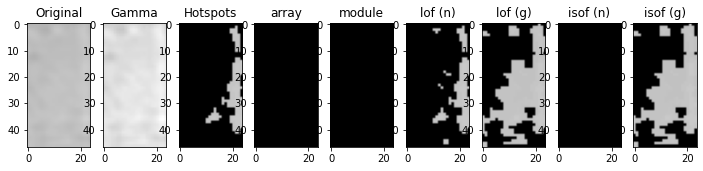

[-1.03406948 -0.99499893 -0.97565351 -0.99961013 -1.06742789 -1.02237562
 -1.14549881 -0.97933793 -0.99074652 -1.05115261]
[-2.23598295]
[-0.5196789  -0.49762186 -0.48382858 -0.4823949  -0.51221276 -0.505131
 -0.5554705  -0.49649881 -0.49121813 -0.49630879]
[-0.74719659]
[-1.7855635  -0.99061827 -1.14991131 -1.54805866 -1.02548891 -0.9661788
 -2.16459617 -1.27997913 -1.02622461 -0.98865513]
[-2.23598295]
[-0.66427748 -0.51458988 -0.55463248 -0.64270023 -0.47722589 -0.512548
 -0.70283282 -0.59399251 -0.51628478 -0.48616953]
[-0.74719659]
4673.jpg Normal [5.44481274]
[-1.02380879 -2.25101875 -1.37620186 -1.53951263 -0.99739664 -0.99739664
 -1.08804822 -1.37620186 -0.99569229 -1.98938368]
[-2.16466685]
[-0.45451648 -0.6578631  -0.55638626 -0.57592202 -0.46005056 -0.46005056
 -0.5105817  -0.55638626 -0.43630391 -0.63485932]
[-0.73293337]
[-1.03645777 -0.99729545 -0.98755971 -1.01044932 -1.03571263 -1.04032829
 -1.00439141 -0.99630042 -1.19293407 -1.01943304]
[-2.16466685]
[-0.5270875  -0.4

[-0.98643359 -0.99631417 -1.         -1.         -1.         -0.98445016
 -1.         -1.0165436  -0.97898361 -0.96130731]
[-2.18496]
[-0.46491912 -0.44707361 -0.4539687  -0.44625589 -0.44328753 -0.47071093
 -0.4539687  -0.47741776 -0.4519126  -0.45511671]
[-0.736992]
[-0.99687691 -1.02736748 -0.99170026 -1.09625713 -1.05514067 -1.2991471
 -1.00232671 -1.03024823 -1.01908316 -1.00505715]
[-2.18496]
[-0.44076766 -0.51003675 -0.4868977  -0.52558703 -0.51415613 -0.60993568
 -0.49508591 -0.52464111 -0.52444276 -0.46505942]
[-0.736992]
4883.jpg Normal [4.84127779]
[-1.         -1.         -0.97714474 -0.97319643 -1.01319725 -0.99047051
 -1.         -1.01183528 -1.00090203 -0.96437388]
[-2.26958708]
[-0.47600977 -0.46799125 -0.47313506 -0.43768322 -0.47953283 -0.44100732
 -0.47534464 -0.45055342 -0.44816062 -0.46338464]
[-0.75391742]
[-1.25424133 -0.98520078 -1.90051394 -0.99056555 -0.9431713  -0.97606111
 -1.50084717 -1.01100001 -1.01051941 -0.97701417]
[-2.26958708]
[-0.55145906 -0.4914613

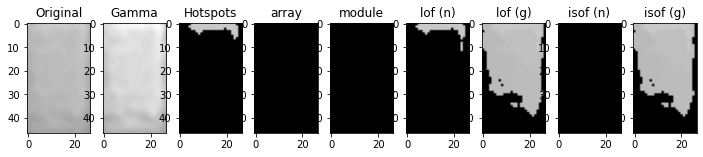

[-1.04496976 -0.97852737 -0.99272976 -1.00067175 -1.04496976 -1.10644763
 -1.03746262 -1.01245029 -0.98241475 -1.00463649]
[-2.14508313]
[-0.45201406 -0.45224312 -0.46535908 -0.45293325 -0.45201406 -0.52007142
 -0.44161653 -0.45552633 -0.44670219 -0.46653406]
[-0.72901663]
[-1.41136703 -1.02854347 -0.99198775 -1.00484791 -1.44435539 -1.00374283
 -1.06440925 -1.24474958 -1.87759385 -1.04212767]
[-2.14508313]
[-0.60449231 -0.50361008 -0.4931432  -0.48911102 -0.60749644 -0.46212943
 -0.52661799 -0.55796779 -0.67804793 -0.52424691]
[-0.72901663]
4868.jpg Normal [4.41654978]
[-0.98079563 -1.08592397 -0.97971507 -1.01050444 -1.04320117 -1.00078056
 -1.67024423 -0.98445016 -0.99631417 -1.03789874]
[-2.18496]
[-0.47649241 -0.52048333 -0.4551524  -0.48727669 -0.50601442 -0.53786656
 -0.60650633 -0.47071093 -0.44707361 -0.52287695]
[-0.736992]
[-1.01908316 -1.14981704 -0.98604719 -1.05514067 -1.05071131 -1.54096025
 -1.32901806 -1.0092156  -1.00232671 -1.21948658]
[-2.18496]
[-0.52444276 -0.5899

[-1.02145044 -1.         -1.00327481 -1.00555557 -0.99799107 -0.96491228
 -1.12853082 -0.98486607 -1.         -1.00704323]
[-2.28889359]
[-0.49530354 -0.44869001 -0.45437762 -0.46984592 -0.43419768 -0.45618655
 -0.46953756 -0.43628731 -0.45225592 -0.4684322 ]
[-0.75777872]
[-1.17922925 -1.08741398 -0.97950296 -0.97654014 -1.03815867 -1.0068447
 -0.98731861 -1.02139565 -1.05584967 -0.96140313]
[-2.28889359]
[-0.59647103 -0.52742829 -0.47042664 -0.52348107 -0.51151384 -0.51203629
 -0.44979906 -0.50784495 -0.54026827 -0.52999368]
[-0.75777872]
1086.jpg Normal [6.15026168]
[-1.10442327 -1.00488041 -1.03728556 -1.02753693 -1.15058307 -1.04069013
 -1.36758336 -1.08880387 -1.01725699 -1.01999738]
[-2.23598295]
[-0.55306687 -0.48801245 -0.49618506 -0.45349369 -0.54333779 -0.45482334
 -0.57018956 -0.53456503 -0.48526559 -0.46596787]
[-0.74719659]
[-0.98979946 -0.99494246 -0.995666   -0.99523157 -1.02785421 -2.2300516
 -1.0316696  -0.98865513 -0.9661788  -1.14991131]
[-2.23598295]
[-0.48659263 -

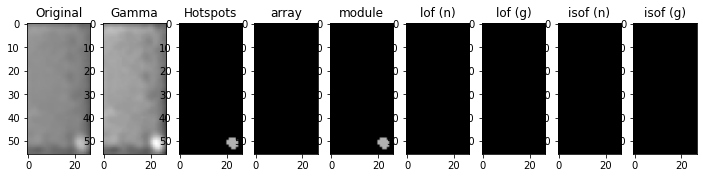

[-0.98427318 -1.02106779 -0.99767686 -1.         -0.99767686 -1.
 -1.01425021 -1.01431552 -1.         -0.97361607]
[-2.28889359]
[-0.45658526 -0.4287602  -0.44601465 -0.44590723 -0.44601465 -0.45329886
 -0.47440855 -0.45614112 -0.45225592 -0.43897049]
[-0.75777872]
[-1.03407136 -1.06898129 -1.10505272 -0.97358883 -1.13176342 -0.98090519
 -1.29641052 -1.00257007 -0.96945024 -1.03954301]
[-2.28889359]
[-0.52237672 -0.52271498 -0.5735427  -0.52791862 -0.58622316 -0.52733075
 -0.64640902 -0.47994042 -0.51595719 -0.53272629]
[-0.75777872]
5009.jpg Normal [6.15026168]
[-1.00585354 -1.         -0.99862842 -1.0281506  -1.01780656 -1.00145229
 -1.02382468 -1.01779847 -1.00320573 -1.01022724]
[-2.09404644]
[-0.46252322 -0.4298296  -0.42771835 -0.45598992 -0.45799731 -0.45564199
 -0.43563145 -0.42289532 -0.41976564 -0.46150843]
[-0.71880929]
[-3.19963202 -1.49983566 -2.39181283 -0.98407806 -2.87958437 -4.69262473
 -2.1653484  -1.38945102 -1.01914039 -3.59990269]
[-2.09404644]
[-0.77213468 -0.5923

[-1.00960304 -1.0036075  -1.06773947 -1.0036075  -0.96437388 -0.99047051
 -1.0043652  -1.11327675 -1.03885907 -1.        ]
[-2.26958708]
[-0.49362058 -0.46926934 -0.47739467 -0.46926934 -0.46338464 -0.44100732
 -0.46488678 -0.54999967 -0.47428729 -0.47695532]
[-0.75391742]
[-0.9797673  -1.01474957 -0.99067335 -0.97280259 -1.02481791 -1.15140476
 -0.95708424 -0.97156315 -1.02553445 -1.85587888]
[-2.26958708]
[-0.44797908 -0.46622651 -0.47195334 -0.48186719 -0.49732982 -0.54921538
 -0.46974999 -0.43747125 -0.47999885 -0.6781136 ]
[-0.75391742]
1247.jpg Normal [5.88284064]
[-0.99437359 -1.05943562 -1.01721649 -1.         -1.         -1.
 -1.55752008 -1.01639897 -0.99422245 -0.9710551 ]
[-2.30688477]
[-0.4596418  -0.47565013 -0.4843839  -0.45572645 -0.46677368 -0.4518188
 -0.58966136 -0.46455982 -0.47800938 -0.4433269 ]
[-0.76137695]
[-3.12881746 -1.01540662 -0.98913836 -2.5013518  -2.28130469 -1.89809341
 -1.01179703 -1.23437395 -4.28308158 -0.98594951]
[-2.30688477]
[-0.76433807 -0.46309

[-0.99851254 -0.9567289  -1.02577338 -1.01235597 -1.04089381 -1.0081996
 -1.26831149 -0.99141894 -1.00345898 -1.00254941]
[-2.23598295]
[-0.46126137 -0.43849236 -0.46676856 -0.47499403 -0.44533546 -0.4786061
 -0.54184869 -0.44007574 -0.46032343 -0.4506188 ]
[-0.74719659]
[-1.04673412 -1.00027868 -1.02992704 -1.03505731 -0.98333287 -1.96822985
 -0.98457636 -0.98865513 -0.9661788  -0.99061827]
[-2.23598295]
[-0.50270207 -0.49194384 -0.49850748 -0.46929974 -0.49394977 -0.67903408
 -0.45833403 -0.48616953 -0.51180938 -0.51458988]
[-0.74719659]
3493.jpg Normal [5.44481274]
[-0.98451593 -1.06911931 -1.849567   -0.99483314 -1.02636167 -1.31129004
 -1.09301203 -1.01069641 -1.2616738  -0.98642871]
[-2.14508313]
[-0.48422965 -0.5355113  -0.67455962 -0.47951454 -0.52276874 -0.57720937
 -0.53694128 -0.49204936 -0.56801099 -0.49443874]
[-0.72901663]
[-0.99198775 -1.08487375 -1.83010435 -1.00567823 -1.03578065 -1.32373474
 -1.10407583 -1.0381642  -1.2670497  -0.9856299 ]
[-2.14508313]
[-0.4931432  -

[-1.01069641 -0.99444031 -1.00276258 -1.03920765 -1.00067175 -1.0056315
 -1.01069641 -1.01834034 -1.00949133 -1.01834034]
[-2.14508313]
[-0.49204936 -0.49937899 -0.4550305  -0.49394468 -0.45293325 -0.47261388
 -0.49204936 -0.48281034 -0.48375038 -0.48281034]
[-0.72901663]
[-1.24474958 -1.97609057 -1.0182908  -1.47734375 -0.99810636 -1.01388208
 -1.22800489 -1.62607542 -1.21031837 -1.66477056]
[-2.14508313]
[-0.55796779 -0.69822807 -0.48820739 -0.61421926 -0.44406483 -0.49723968
 -0.55901828 -0.63391103 -0.54793759 -0.64437897]
[-0.72901663]
2997.jpg Normal [4.41654978]
[-1.00366351 -1.         -1.00265221 -1.12771171 -1.01669169 -0.98340179
 -1.00366351 -1.00294306 -1.29436663 -1.0261771 ]
[-2.30688477]
[-0.50510796 -0.46111123 -0.4985897  -0.53162124 -0.47664368 -0.48575228
 -0.50510796 -0.48834488 -0.54016273 -0.49285547]
[-0.76137695]
[-4.0296708  -1.78567457 -3.45400355 -4.53795716 -2.73337426 -3.2899457
 -3.94617708 -2.65403755 -5.30844311 -4.19812305]
[-2.30688477]
[-0.77580026 -

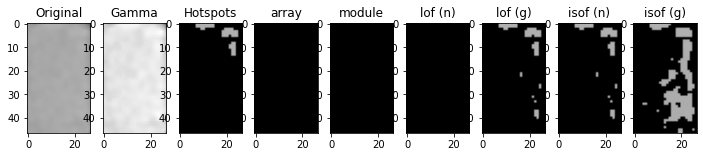

[-1.01641302 -1.29494194 -1.01022724 -1.02382468 -1.12083141 -1.15554561
 -1.49078454 -1.01530409 -0.99157025 -1.25205286]
[-2.09404644]
[-0.47007398 -0.54321056 -0.46150843 -0.43563145 -0.50168458 -0.50134081
 -0.56634305 -0.46869601 -0.43161609 -0.53165145]
[-0.71880929]
[-3.06874182 -4.34555459 -1.95543329 -1.23850322 -3.66661447 -3.80003802
 -4.97298309 -3.0045634  -1.01058986 -4.27715391]
[-2.09404644]
[-0.76796664 -0.79021356 -0.68411364 -0.56457107 -0.782654   -0.782654
 -0.79935504 -0.76537305 -0.48403854 -0.78754484]
[-0.71880929]
1534.jpg Normal [3.92686926]
[-0.96187516 -1.         -0.99051267 -1.0225782  -1.         -1.
 -1.00090036 -0.98807152 -1.00577894 -1.01482213]
[-2.31059791]
[-0.43015613 -0.44709643 -0.43217088 -0.44046389 -0.43057426 -0.44558471
 -0.4495941  -0.43870139 -0.4742729  -0.43499888]
[-0.76211958]
[-1.39645175 -1.05961691 -1.25743235 -1.52993374 -1.01449117 -0.99937567
 -2.1870297  -1.28255144 -1.0842949  -1.12168271]
[-2.31059791]
[-0.62007991 -0.526700

[-0.99112871 -0.98931062 -0.97565351 -0.99521257 -1.07712268 -0.99741223
 -1.03649568 -0.98807113 -1.02172431 -1.06298369]
[-2.23598295]
[-0.48210404 -0.47682579 -0.48382858 -0.47596196 -0.44767197 -0.46474514
 -0.50329935 -0.4922155  -0.51279717 -0.49894563]
[-0.74719659]
[-1.01564498 -1.04068969 -1.45043334 -1.01925824 -1.00896615 -0.98979946
 -0.95931759 -1.84340785 -0.9661788  -0.96195403]
[-2.23598295]
[-0.51141797 -0.50207556 -0.62257421 -0.48945848 -0.46457352 -0.48659263
 -0.50066089 -0.66707321 -0.512548   -0.48639806]
[-0.74719659]
2767.jpg Normal [5.44481274]
[-1.02258105 -0.97801136 -1.06086516 -1.01487521 -1.05205741 -1.01202035
 -1.15554561 -0.98098613 -0.97904907 -1.02258105]
[-2.09404644]
[-0.47967966 -0.41723559 -0.49569736 -0.46595124 -0.47546941 -0.45437941
 -0.50134081 -0.42640759 -0.4511314  -0.47967966]
[-0.71880929]
[-3.80003802 -0.99873638 -4.07195186 -2.57472642 -1.00373114 -2.39181283
 -4.48404487 -1.32490633 -1.38945102 -3.86759426]
[-2.09404644]
[-0.782654  

[-0.9710551  -1.00377338 -0.97998395 -1.01721649 -1.01020744 -1.00542416
 -1.05296769 -0.99512731 -1.03309114 -1.        ]
[-2.30688477]
[-0.4433269  -0.46160812 -0.44086159 -0.4843839  -0.44829965 -0.45025267
 -0.48649858 -0.44910806 -0.46413933 -0.44028175]
[-0.76137695]
[-2.5013518  -3.94617708 -3.61806139 -4.11316453 -1.67273447 -4.45299863
 -1.13585615 -2.57769467 -5.22201978 -3.12881746]
[-2.30688477]
[-0.73891351 -0.77475118 -0.77265727 -0.77580026 -0.63196769 -0.78001081
 -0.5428423  -0.74242138 -0.78212465 -0.76433807]
[-0.76137695]
261.jpg Normal [6.41039469]
[-0.9641811  -1.         -0.97817438 -1.00533655 -0.9761583  -1.02106779
 -1.01980356 -0.96776436 -1.04260145 -1.01068155]
[-2.28889359]
[-0.53860986 -0.45705368 -0.55568692 -0.51761397 -0.52090317 -0.4287602
 -0.49502022 -0.53024332 -0.51543391 -0.52264776]
[-0.75777872]
[-1.07490121 -1.0468319  -1.19702893 -0.98090519 -1.0492864  -1.03598084
 -1.06383308 -1.14659649 -1.00952231 -1.29641052]
[-2.28889359]
[-0.56190203 -

[-1.18862523 -1.02106779 -1.00327481 -0.98486607 -1.02243281 -1.01431552
 -1.02837838 -1.00327481 -1.01899752 -1.        ]
[-2.28889359]
[-0.50238256 -0.4287602  -0.45437762 -0.43628731 -0.48998738 -0.45614112
 -0.45309414 -0.45437762 -0.47822381 -0.46042398]
[-0.75777872]
[-1.01920789 -0.96358113 -1.0185639  -1.07490121 -1.06611542 -1.07588047
 -0.96945024 -1.0171773  -1.05725312 -1.32607666]
[-2.28889359]
[-0.47821558 -0.52973931 -0.52650764 -0.56190203 -0.53057102 -0.51139072
 -0.51595719 -0.52422881 -0.51626044 -0.65213777]
[-0.75777872]
1050.jpg Normal [6.15026168]
[-1.23694573 -1.00611387 -6.12081535 -1.01532691 -1.23694573 -1.10136582
 -3.50490052 -1.55450095 -1.00265221 -0.99437359]
[-2.30688477]
[-0.54892456 -0.52013003 -0.78206135 -0.45287257 -0.54892456 -0.51943787
 -0.74554794 -0.60292928 -0.4985897  -0.4596418 ]
[-0.76137695]
[-0.98938945 -0.99545906 -5.04917312 -1.02196849 -0.99146613 -1.01181793
 -2.35315681 -1.12017878 -1.00653105 -1.01306816]
[-2.30688477]
[-0.50842151

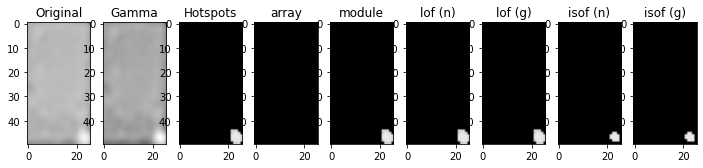

[-1.12068537 -1.30712866 -1.02753106 -3.05987527 -1.16397349 -1.60437671
 -0.99401852 -1.04383194 -1.97313857 -1.01969515]
[-2.14508313]
[-0.52268739 -0.5927459  -0.47671885 -0.74590106 -0.54300622 -0.623839
 -0.45714835 -0.50949772 -0.65107157 -0.49888472]
[-0.72901663]
[-1.00007832 -1.00588632 -1.24474958 -1.00656641 -1.02211795 -0.99473099
 -1.66477056 -1.01388208 -1.01371326 -1.08487375]
[-2.14508313]
[-0.50200949 -0.4839595  -0.55796779 -0.52104867 -0.50054138 -0.46113166
 -0.64437897 -0.49723968 -0.44689951 -0.52561404]
[-0.72901663]
3121.jpg Normal [4.41654978]
[-0.99347497 -0.98748488 -1.01443629 -1.10499137 -1.00899721 -1.01229184
 -0.98672474 -0.98066021 -1.0076923  -0.95202388]
[-2.36730326]
[-0.46603295 -0.45858216 -0.49621349 -0.46477093 -0.47763461 -0.46520666
 -0.48690141 -0.44745823 -0.46526631 -0.43990187]
[-0.77346065]
[-0.98332053 -1.05287439 -1.2448649  -1.02178244 -1.13050494 -0.99774333
 -1.70177856 -0.99185696 -1.04770082 -1.01218519]
[-2.36730326]
[-0.49664206 -

[-1.         -0.99437359 -1.01532691 -1.03749462 -1.         -1.
 -1.         -0.99524389 -1.         -1.        ]
[-2.30688477]
[-0.45575712 -0.4596418  -0.45287257 -0.48897986 -0.46111123 -0.45729912
 -0.4673456  -0.45804967 -0.45429333 -0.46111123]
[-0.76137695]
[-4.19812305 -5.48128977 -2.2109495  -1.00965042 -4.87779127 -3.45400355
 -4.36804011 -2.28130469 -3.37197462 -4.96274979]
[-2.30688477]
[-0.77790269 -0.79063744 -0.71700485 -0.45160793 -0.78053874 -0.77109055
 -0.78001081 -0.72442028 -0.77109055 -0.78106702]
[-0.76137695]
4935.jpg Normal [6.41039469]
[-0.98677272 -1.0118287  -0.95890161 -1.08855921 -1.3830161  -0.98821067
 -1.14224055 -0.99018871 -1.03964742 -1.03789744]
[-2.30567765]
[-0.44296938 -0.48190402 -0.4250298  -0.48486312 -0.53919016 -0.45978689
 -0.50150189 -0.4644135  -0.49225416 -0.51631868]
[-0.76113553]
[-4.13312141 -2.39772061 -6.01633312 -3.22819796 -1.02423585 -4.80436519
 -1.44581521 -4.70802927 -3.58307442 -1.93239478]
[-2.30567765]
[-0.75006971 -0.6869

[-0.97200413 -1.0315518  -1.01020744 -1.70147111 -1.10168892 -1.03749462
 -4.87007735 -0.98327252 -1.23082212 -1.03969995]
[-2.30688477]
[-0.44521396 -0.48697679 -0.44829965 -0.60571046 -0.53822579 -0.48897986
 -0.80423739 -0.45484425 -0.53564726 -0.48391002]
[-0.76137695]
[-5.48128977 -2.8935446  -4.36804011 -0.9919858  -1.72920452 -2.81271097
 -2.14973034 -4.87779127 -1.23437395 -3.61806139]
[-2.30688477]
[-0.79063744 -0.75050203 -0.78001081 -0.4680213  -0.64238328 -0.75050203
 -0.67146206 -0.78053874 -0.55116399 -0.77265727]
[-0.76137695]
1865.jpg Normal [6.41039469]
[-0.99354792 -0.95890161 -1.00198588 -1.34187272 -1.00046628 -0.98257146
 -1.01684495 -0.98981533 -1.08855921 -1.03543315]
[-2.30567765]
[-0.43597446 -0.4250298  -0.45123828 -0.53958153 -0.44116775 -0.49281073
 -0.46778415 -0.4203727  -0.48486312 -0.45393373]
[-0.76113553]
[-5.81123085 -2.57868065 -4.41902154 -1.0410108  -4.13312141 -1.34750056
 -5.00325223 -3.04077506 -1.08488146 -3.9466648 ]
[-2.30567765]
[-0.7886904 

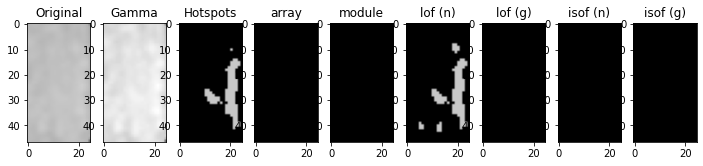

[-0.96246155 -1.025159   -1.00463649 -1.00795989 -1.60437671 -0.95482242
 -0.99514303 -1.06416428 -1.03242007 -0.98241475]
[-2.14508313]
[-0.44541513 -0.47642846 -0.46653406 -0.44576898 -0.623839   -0.43488981
 -0.44356431 -0.51675615 -0.51313609 -0.44670219]
[-0.72901663]
[-1.11606997 -0.99352769 -1.03578065 -1.29041088 -0.98336407 -1.24474958
 -0.97165717 -1.04062651 -1.01830084 -1.74743746]
[-2.14508313]
[-0.53613723 -0.49089126 -0.50425243 -0.57271077 -0.46912372 -0.55796779
 -0.48906261 -0.46662191 -0.48544334 -0.66399859]
[-0.72901663]
1130.jpg Normal [4.41654978]
[-1.         -1.00082772 -1.         -0.96130731 -1.         -1.
 -1.         -1.02374868 -1.         -0.99631417]
[-2.18496]
[-0.44194794 -0.46621606 -0.43724418 -0.45511671 -0.43957491 -0.44625589
 -0.45043417 -0.47951449 -0.44625589 -0.44707361]
[-0.736992]
[-1.05778189 -1.21948658 -0.98509977 -0.98427451 -1.07768223 -1.01628146
 -1.00077001 -1.70465472 -1.01628146 -1.10399116]
[-2.18496]
[-0.51779895 -0.58749608 -0.

[-0.97769753 -0.99423518 -1.01202035 -1.03891496 -1.00616101 -1.01780656
 -1.02382468 -1.01780656 -1.09069324 -1.02185021]
[-2.09404644]
[-0.44773695 -0.43328433 -0.45437941 -0.48038718 -0.42560466 -0.45799731
 -0.43563145 -0.45799731 -0.49965175 -0.46663783]
[-0.71880929]
[-2.94207388 -2.22109349 -3.2663438  -5.18325187 -1.42661181 -2.81709486
 -2.05647127 -2.75460534 -1.0082309  -3.86759426]
[-2.09404644]
[-0.76278822 -0.72138892 -0.77213468 -0.80369344 -0.58524575 -0.753989
 -0.69918483 -0.753989   -0.42105138 -0.782654  ]
[-0.71880929]
2411.jpg Normal [3.92686926]
[-1.08601645 -1.0043652  -1.64570375 -1.04054775 -0.9763356  -1.0034076
 -2.68275603 -1.06983744 -1.00359469 -1.01319725]
[-2.26958708]
[-0.54022722 -0.46488678 -0.60000801 -0.47414178 -0.45551624 -0.46562571
 -0.7269205  -0.52668561 -0.47737107 -0.47953283]
[-0.75391742]
[-1.03986573 -1.46795523 -1.00064138 -1.0375164  -1.81124382 -0.95788022
 -1.1482933  -1.0173266  -1.43558498 -1.01474957]
[-2.26958708]
[-0.4734824  -0

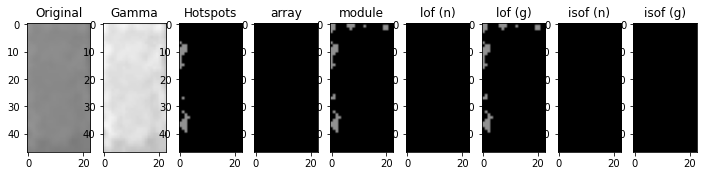

[-0.97990121 -1.         -1.51445946 -1.         -1.         -0.98996101
 -1.         -1.03201947 -0.99379725 -0.99588215]
[-2.26439771]
[-0.51173471 -0.47335548 -0.66067296 -0.47723098 -0.46966067 -0.4791502
 -0.50026096 -0.46912931 -0.48348731 -0.53189685]
[-0.75287954]
[-1.01389274 -0.97576581 -1.10801621 -1.0123454  -0.98016018 -1.07359547
 -1.00766789 -1.07282619 -1.00849304 -0.99071766]
[-2.26439771]
[-0.51384272 -0.479889   -0.55260304 -0.49373901 -0.4720309  -0.50184909
 -0.49157156 -0.50064733 -0.53090554 -0.50917716]
[-0.75287954]
3294.jpg Single-Hotspot [5.81296502]


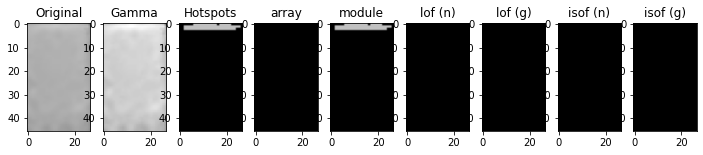

[-1.01809611 -0.97756512 -0.99554239 -1.02448297 -0.99894324 -0.97550524
 -1.02910591 -1.89256328 -0.98375226 -1.01618129]
[-2.31612168]
[-0.47070543 -0.43842068 -0.46770189 -0.45431504 -0.45459943 -0.44543827
 -0.47137572 -0.64350939 -0.42457732 -0.46257449]
[-0.76322434]
[-1.22021465 -1.38632781 -1.00292775 -1.1761353  -1.08276118 -1.44456104
 -1.77189242 -1.03592392 -1.10650404 -1.01629145]
[-2.31612168]
[-0.54840053 -0.59330829 -0.48219581 -0.53392122 -0.49026398 -0.59937518
 -0.69450025 -0.49441842 -0.53491116 -0.48341752]
[-0.76322434]
2834.jpg Normal [6.54819615]
[-1.05270787 -0.98059401 -1.00918215 -1.02481396 -1.0206048  -1.01779847
 -1.         -1.01641302 -0.99974464 -1.01022724]
[-2.09404644]
[-0.45149524 -0.43743342 -0.44850424 -0.44720475 -0.448791   -0.42289532
 -0.44466004 -0.47007398 -0.43320444 -0.46150843]
[-0.71880929]
[-2.10960331 -1.05603068 -2.57472642 -1.95543329 -1.01977208 -1.13568809
 -1.23850322 -4.00355117 -1.35789376 -2.81709486]
[-2.09404644]
[-0.70593817

[-0.98562787 -0.98096594 -0.98562787 -1.04089381 -0.95198815 -1.01235597
 -1.06350453 -1.02715193 -2.53196584 -0.97418686]
[-2.23598295]
[-0.46196726 -0.46247468 -0.46196726 -0.44533546 -0.42737273 -0.47499403
 -0.47480781 -0.49155418 -0.72641821 -0.44945593]
[-0.74719659]
[-1.35082668 -0.99573316 -1.45043334 -1.05472216 -0.99523157 -1.04673412
 -2.09914073 -2.43098458 -1.10109299 -1.00027868]
[-2.23598295]
[-0.61193656 -0.49929858 -0.62257421 -0.52276934 -0.51075478 -0.50270207
 -0.6920206  -0.72064939 -0.53675539 -0.49194384]
[-0.74719659]
1440.jpg Normal [5.44481274]
[-0.99739664 -1.         -1.49132958 -1.         -1.02887671 -2.30841248
 -1.23220815 -0.97712719 -1.01437031 -0.99569229]
[-2.16466685]
[-0.46005056 -0.43331051 -0.57402238 -0.43900818 -0.48334199 -0.66008284
 -0.53855341 -0.43041969 -0.44101032 -0.43630391]
[-0.73293337]
[-1.01147537 -1.04512054 -1.01943304 -1.09954535 -0.99630042 -1.04069219
 -0.99712893 -1.00166865 -1.00439141 -1.04502598]
[-2.16466685]
[-0.44389924

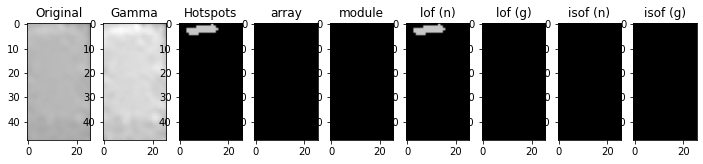

[-0.99490176 -1.00345898 -1.02172431 -0.99741223 -1.02715193 -0.9567289
 -1.05115261 -1.01265752 -1.03728556 -1.04344046]
[-2.23598295]
[-0.47370143 -0.46032343 -0.49730899 -0.46474514 -0.49155418 -0.43849236
 -0.49630879 -0.46938068 -0.49618506 -0.47016071]
[-0.74719659]
[-1.17096602 -1.00568018 -2.64105088 -1.27997913 -1.02622461 -1.03311709
 -1.66118006 -0.98846989 -1.03511301 -0.99523157]
[-2.23598295]
[-0.56337292 -0.47543634 -0.73145642 -0.59399251 -0.51628478 -0.49632173
 -0.65490596 -0.5188549  -0.44232955 -0.51075478]
[-0.74719659]
1468.jpg Normal [5.44481274]
[-0.97756512 -1.02910591 -0.99478541 -1.01511198 -1.006896   -0.97550524
 -0.98375226 -0.99857306 -0.99286685 -1.13600447]
[-2.31612168]
[-0.43842068 -0.47137572 -0.43383834 -0.46358488 -0.45551559 -0.44543827
 -0.42457732 -0.46022701 -0.45072746 -0.54137792]
[-0.76322434]
[-1.01629145 -1.10388392 -1.00625765 -1.08077189 -1.33608717 -1.04103659
 -1.02101921 -1.01882626 -1.01694524 -1.00655258]
[-2.31612168]
[-0.48341752 

[-1.00710219 -1.50590302 -3.34617899 -0.97385299 -1.06721493 -1.02904462
 -2.11645821 -1.11914911 -0.97190471 -0.9841523 ]
[-2.26439771]
[-0.47442326 -0.58674406 -0.80423739 -0.44820433 -0.4757901  -0.47371211
 -0.65197874 -0.51039013 -0.47236059 -0.45161374]
[-0.75287954]
[-1.01389274 -0.99853291 -2.18245529 -0.99508698 -1.02623659 -0.96244825
 -1.17835716 -1.06537364 -0.9996281  -1.01764352]
[-2.26439771]
[-0.51384272 -0.47756741 -0.67624836 -0.51323305 -0.51451272 -0.46903274
 -0.54816961 -0.48662975 -0.49474765 -0.48965298]
[-0.75287954]
1450.jpg Normal [5.81296502]
[-1.01206161 -0.98821067 -1.00046628 -1.14224055 -0.98981533 -1.08855921
 -0.95890161 -0.98992981 -0.99018871 -1.0662148 ]
[-2.30567765]
[-0.46889362 -0.45978689 -0.44116775 -0.50150189 -0.4203727  -0.48486312
 -0.4250298  -0.46163246 -0.4644135  -0.45568415]
[-0.76113553]
[-0.98196137 -1.68680614 -3.8534365  -0.99658255 -2.66916068 -1.02423585
 -2.23614914 -4.80436519 -1.50911127 -3.40283304]
[-2.30567765]
[-0.46473342

[-1.         -1.         -1.09287874 -1.         -1.33598919 -1.
 -1.         -1.07592071 -1.01566721 -0.98947587]
[-2.18496]
[-0.45826201 -0.44194794 -0.49524968 -0.44328753 -0.55223696 -0.4622722
 -0.43957491 -0.48231288 -0.46250864 -0.45053091]
[-0.736992]
[-0.99742394 -1.0092156  -0.99167321 -1.03024823 -0.97933861 -0.99850126
 -1.09625713 -1.00529276 -1.36015226 -1.02571209]
[-2.18496]
[-0.48901632 -0.51207662 -0.45893598 -0.52464111 -0.45381796 -0.5017372
 -0.52558703 -0.45288352 -0.62581717 -0.48615928]
[-0.736992]
4272.jpg Normal [4.84127779]
[-1.01183528 -1.03225644 -0.9763356  -1.         -1.00217018 -1.0036075
 -0.98349206 -1.05404389 -1.00359469 -1.01836801]
[-2.26958708]
[-0.45055342 -0.47166594 -0.45551624 -0.46799125 -0.47679559 -0.46926934
 -0.45774111 -0.4668371  -0.47737107 -0.46325574]
[-0.75391742]
[-1.90051394 -1.00724216 -1.29579608 -1.50084717 -1.02553445 -1.57394038
 -2.1495306  -1.76895797 -1.09619378 -0.99863544]
[-2.26958708]
[-0.67903183 -0.48287755 -0.56867

[-0.95985081 -0.96187516 -0.95985081 -0.99010927 -0.99872125 -1.02826361
 -1.01833103 -1.03937309 -1.01482213 -1.06859997]
[-2.31059791]
[-0.44750323 -0.43015613 -0.44750323 -0.46816971 -0.4565276  -0.46568643
 -0.45466926 -0.46601533 -0.43499888 -0.46150138]
[-0.76211958]
[-1.18646371 -1.00544409 -1.20183241 -0.98618509 -1.33718206 -1.78374763
 -1.39645175 -1.03077028 -1.07215704 -1.04658362]
[-2.31059791]
[-0.57395119 -0.50203003 -0.57269156 -0.45808797 -0.60039906 -0.67923543
 -0.62007991 -0.51863261 -0.4979656  -0.50611832]
[-0.76211958]
661.jpg Normal [6.46543742]
[-0.97385299 -1.09412503 -1.05372212 -1.00710219 -0.98761076 -1.79050714
 -0.97385299 -1.00500844 -1.04047451 -1.36932222]
[-2.26439771]
[-0.44820433 -0.51030565 -0.48735012 -0.47442326 -0.4645771  -0.62129047
 -0.44820433 -0.47018689 -0.47849222 -0.57004977]
[-0.75287954]
[-0.97909073 -0.99954628 -1.07359547 -1.01891549 -0.99508698 -0.97768313
 -0.97846439 -0.97936787 -1.02983811 -1.07341725]
[-2.26439771]
[-0.49729777 

[-1.41559482 -1.0261771  -2.46635921 -1.01020744 -1.96483723 -1.35600313
 -0.98340179 -1.6252606  -1.6252606  -1.16259115]
[-2.30688477]
[-0.57294486 -0.49285547 -0.70760213 -0.44829965 -0.67078218 -0.55198529
 -0.48575228 -0.62028032 -0.62028032 -0.53393909]
[-0.76137695]
[-3.86414816 -2.5013518  -5.65706603 -1.00594395 -4.96274979 -3.61806139
 -2.01784693 -4.19812305 -4.19812305 -3.12881746]
[-2.30688477]
[-0.77318022 -0.73891351 -0.79063744 -0.45117404 -0.78106702 -0.77265727
 -0.68250325 -0.77790269 -0.77790269 -0.76433807]
[-0.76137695]
4702.jpg Normal [6.41039469]
[-0.99413019 -1.02887671 -0.98438369 -1.6590387  -0.99569229 -0.99739664
 -1.01437031 -1.02263584 -1.08804822 -1.23220815]
[-2.16466685]
[-0.43836181 -0.48334199 -0.43941068 -0.59111109 -0.43630391 -0.46005056
 -0.44101032 -0.44535253 -0.5105817  -0.53855341]
[-0.73293337]
[-1.0796484  -1.03571263 -1.0459663  -1.00753824 -1.27487763 -1.02901988
 -1.04546064 -1.35877281 -0.99666299 -1.06848727]
[-2.16466685]
[-0.55506964

[-0.95482242 -0.99655516 -1.03484027 -0.99655516 -1.00708095 -0.98241475
 -1.00276258 -1.12068537 -0.96246155 -0.98877986]
[-2.14508313]
[-0.43488981 -0.44749476 -0.47235381 -0.44749476 -0.46185843 -0.44670219
 -0.4550305  -0.52268739 -0.44541513 -0.45281193]
[-0.72901663]
[-1.41136703 -0.97667258 -1.00484791 -0.97667258 -1.83010435 -1.97609057
 -1.2670497  -0.99546382 -1.16216846 -1.0279449 ]
[-2.14508313]
[-0.60449231 -0.52042164 -0.48911102 -0.52042164 -0.6729671  -0.69822807
 -0.56507401 -0.46018719 -0.53347958 -0.49223597]
[-0.72901663]
477.jpg Normal [4.41654978]
[-1.         -1.01341458 -1.05571535 -1.         -0.99872125 -0.96187516
 -1.02118479 -0.98295123 -0.96187516 -1.00090036]
[-2.31059791]
[-0.45323222 -0.44719555 -0.47139682 -0.45519876 -0.4565276  -0.43015613
 -0.47294561 -0.41937934 -0.43015613 -0.4495941 ]
[-0.76211958]
[-1.07237236 -1.20183241 -1.30971561 -1.03076775 -2.00089952 -1.05961691
 -0.99790945 -1.01449117 -1.05961691 -1.4947527 ]
[-2.31059791]
[-0.49785961 

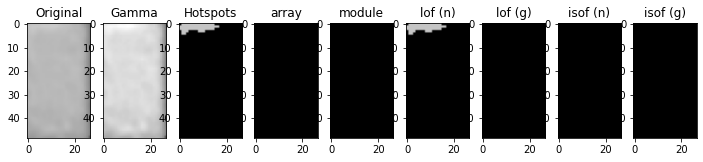

[-1.08463936 -1.08805482 -1.0937377  -1.20674907 -0.97170628 -1.02747981
 -1.06599497 -1.01530366 -1.69067603 -1.08805482]
[-2.39655106]
[-0.48985214 -0.49159517 -0.47018323 -0.5493173  -0.44296233 -0.45233036
 -0.4891559  -0.45002278 -0.62794789 -0.49159517]
[-0.77931021]
[-1.01201    -0.99604938 -1.06899923 -0.99877409 -1.42379903 -1.22091596
 -0.98909214 -1.72504091 -1.00189266 -1.00892125]
[-2.39655106]
[-0.48020698 -0.46846079 -0.51132552 -0.46783882 -0.58161951 -0.52520138
 -0.48926053 -0.62123613 -0.4727841  -0.4687129 ]
[-0.77931021]
1875.jpg Normal [7.88045069]
[-0.98677272 -1.87530991 -1.06638291 -1.06580689 -1.01206161 -0.97954764
 -1.03789744 -1.03512213 -1.3830161  -1.34187272]
[-2.30567765]
[-0.44296938 -0.59864051 -0.45916699 -0.51171579 -0.46889362 -0.44921527
 -0.51631868 -0.46835547 -0.53919016 -0.53958153]
[-0.76113553]
[-3.40283304 -0.99881667 -4.70802927 -1.50911127 -2.31693487 -3.67319512
 -1.62864041 -2.39772061 -1.02627059 -1.00317821]
[-2.30567765]
[-0.73400466

[-1.01413285 -1.01183528 -1.         -1.06173559 -0.98955548 -0.97340003
 -1.0550644  -1.00313386 -0.98349206 -1.        ]
[-2.26958708]
[-0.48661881 -0.45055342 -0.45057332 -0.52629847 -0.45716539 -0.47249873
 -0.45825689 -0.48760507 -0.45774111 -0.47600977]
[-0.75391742]
[-1.22627608 -0.99067335 -1.03059483 -1.81124382 -1.03206176 -1.0375164
 -0.95708424 -1.1146395  -1.0173266  -1.00724216]
[-2.26958708]
[-0.55495927 -0.47195334 -0.49529739 -0.67035865 -0.45164517 -0.51469101
 -0.46974999 -0.51612202 -0.48510567 -0.48287755]
[-0.75391742]
4676.jpg Normal [5.88284064]
[-1.01600843 -1.         -0.98079563 -0.99631417 -1.         -1.
 -1.01566721 -1.         -1.02374868 -1.07592071]
[-2.18496]
[-0.46353238 -0.43724418 -0.47649241 -0.44707361 -0.45841602 -0.43957491
 -0.46250864 -0.46914669 -0.47951449 -0.48231288]
[-0.736992]
[-1.10399116 -1.09738102 -1.70465472 -0.98506872 -0.98529336 -0.99742394
 -1.14981704 -0.97607783 -1.2991471  -0.99947241]
[-2.18496]
[-0.55752289 -0.51938106 -0.7

[-0.95482242 -0.99272976 -0.98241475 -0.96246155 -2.17093783 -1.23232653
 -1.01969515 -1.04496976 -0.98877986 -1.03746262]
[-2.14508313]
[-0.43488981 -0.46535908 -0.44670219 -0.44541513 -0.67340608 -0.57941994
 -0.49888472 -0.45201406 -0.45281193 -0.44161653]
[-0.72901663]
[-1.32373474 -0.99772344 -1.83010435 -1.16216846 -0.99133006 -1.04117197
 -1.0090268  -1.44435539 -0.9856299  -1.06489769]
[-2.14508313]
[-0.58831861 -0.50261619 -0.6729671  -0.53347958 -0.50193006 -0.45228255
 -0.49684012 -0.60749644 -0.52165152 -0.52802189]
[-0.72901663]
1097.jpg Normal [4.41654978]
[-1.00313386 -1.04054775 -1.0550644  -1.         -1.01413285 -1.
 -0.99159078 -1.03666493 -2.44819812 -1.        ]
[-2.26958708]
[-0.48760507 -0.47414178 -0.45825689 -0.47695532 -0.48661881 -0.45553249
 -0.46352711 -0.5212382  -0.70772762 -0.47534464]
[-0.75391742]
[-1.06194623 -0.97156315 -1.03558456 -1.01100001 -1.19084682 -1.03174442
 -0.99056555 -1.68438628 -2.01777931 -0.97280259]
[-2.26958708]
[-0.52801148 -0.4374

[-1.05275874 -0.9898028  -2.23148297 -1.02910591 -1.02361755 -0.95328766
 -0.98375226 -0.97974365 -1.01201895 -1.36933463]
[-2.31612168]
[-0.48224733 -0.46742163 -0.69609622 -0.47137572 -0.48914956 -0.46323819
 -0.42457732 -0.44716503 -0.49009326 -0.58825913]
[-0.76322434]
[-0.95830034 -1.28584652 -1.60118441 -0.97346569 -1.59209067 -1.36120749
 -1.03147787 -1.14698039 -1.08077189 -1.04919892]
[-2.31612168]
[-0.44850629 -0.54859453 -0.61952373 -0.46595708 -0.6374041  -0.59030734
 -0.44891784 -0.51912909 -0.489044   -0.50695242]
[-0.76322434]
3441.jpg Normal [6.54819615]
[-1.06960683 -1.         -1.39472915 -0.98604165 -1.         -1.13000201
 -1.         -0.98947587 -1.13000201 -1.        ]
[-2.18496]
[-0.4882661  -0.4622722  -0.56347592 -0.45369338 -0.44499896 -0.51260685
 -0.44868471 -0.45053091 -0.51260685 -0.45826201]
[-0.736992]
[-1.01544295 -1.03024823 -0.98366366 -1.02736748 -1.54096025 -1.02571209
 -1.33187776 -1.05514067 -1.02571209 -1.05071131]
[-2.18496]
[-0.48433484 -0.5246

[-0.99629704 -0.97899503 -1.00665323 -0.99657395 -0.98787098 -1.02940185
 -0.9733144  -1.0238751  -1.02354845 -1.0238751 ]
[-2.22766175]
[-0.44283982 -0.49867797 -0.5068699  -0.49829817 -0.4992105  -0.51498217
 -0.52319543 -0.4878165  -0.46366046 -0.4878165 ]
[-0.74553235]
[-1.02062315 -1.26007912 -1.05953876 -1.09916743 -1.15521793 -1.75224662
 -1.38460097 -0.97727494 -0.98248753 -0.9763754 ]
[-2.22766175]
[-0.50138261 -0.61594877 -0.5406215  -0.56670701 -0.59823609 -0.71967089
 -0.63179432 -0.51806602 -0.51203831 -0.52810565]
[-0.74553235]
4474.jpg Normal [5.34148178]
[-1.03391181 -0.98096594 -0.99110288 -1.03728556 -0.99851254 -1.04654504
 -1.26831149 -0.99851254 -0.98096594 -1.03151759]
[-2.23598295]
[-0.47233169 -0.46247468 -0.45771807 -0.49618506 -0.46126137 -0.47068497
 -0.54184869 -0.46126137 -0.46247468 -0.46051246]
[-0.74719659]
[-1.02622461 -1.7855635  -1.35082668 -0.995666   -1.45043334 -1.07850791
 -1.03340985 -1.49537198 -1.7855635  -2.36400692]
[-2.23598295]
[-0.51628478

[-1.06673693 -1.         -2.24089224 -0.95985081 -1.03437674 -0.99919832
 -1.01948682 -1.02826361 -0.98050651 -1.01336798]
[-2.31059791]
[-0.51471569 -0.44709643 -0.64463578 -0.44750323 -0.49822558 -0.4905253
 -0.4317874  -0.46568643 -0.46875361 -0.46329497]
[-0.76211958]
[-1.70478331 -0.99625869 -1.78015327 -1.00535604 -0.96846276 -1.21862615
 -0.99862369 -1.06984983 -0.99629563 -1.12168271]
[-2.31059791]
[-0.66475423 -0.46667471 -0.58717582 -0.49246897 -0.42905348 -0.57362013
 -0.46954451 -0.54645611 -0.50760745 -0.55855806]
[-0.76211958]
3496.jpg Normal [6.46543742]
[-1.02948799 -1.00616991 -0.97550524 -1.00873306 -0.99857306 -1.24466419
 -0.97756512 -0.99894324 -1.04060767 -1.02448297]
[-2.31612168]
[-0.4591735  -0.45917826 -0.44543827 -0.43675217 -0.46022701 -0.55027673
 -0.43842068 -0.45459943 -0.47150006 -0.45431504]
[-0.76322434]
[-1.14698039 -1.51832586 -1.48144345 -1.01882626 -1.28584652 -0.96017101
 -1.36120749 -1.08891681 -1.82106897 -1.19656262]
[-2.31612168]
[-0.51912909 

[-1.         -1.00377338 -1.01093265 -1.00542416 -1.         -1.
 -1.         -1.00607369 -0.99512731 -1.01532691]
[-2.30688477]
[-0.4518188  -0.46160812 -0.46747992 -0.45025267 -0.46948839 -0.46677368
 -0.45729912 -0.48330925 -0.44910806 -0.45287257]
[-0.76137695]
[-4.36804011 -1.62389551 -3.2899457  -2.01784693 -5.65706603 -5.13559645
 -4.0296708  -3.37197462 -1.12017878 -2.57769467]
[-2.30688477]
[-0.78001081 -0.62152693 -0.76900654 -0.68250325 -0.79063744 -0.78106702
 -0.77580026 -0.77109055 -0.5370755  -0.74242138]
[-0.76137695]
1294.jpg Normal [6.41039469]
[-0.9730714  -1.02460988 -1.13454271 -1.03376929 -0.98451593 -1.39555099
 -1.00463649 -1.00614403 -1.00261066 -0.99775109]
[-2.14508313]
[-0.48318272 -0.48066343 -0.53076156 -0.46601656 -0.48422965 -0.59613022
 -0.46653406 -0.49947764 -0.47436979 -0.49997712]
[-0.72901663]
[-1.08487375 -0.99772344 -1.74743746 -1.03319215 -1.04212767 -1.20662512
 -1.04290006 -1.24474958 -0.99898064 -1.21031837]
[-2.14508313]
[-0.52561404 -0.5026

[-0.9710551  -0.9905171  -1.03521253 -0.97200413 -1.01093265 -0.97998395
 -0.99512731 -1.05296769 -1.0003619  -1.        ]
[-2.30688477]
[-0.4433269  -0.44052008 -0.46170384 -0.44521396 -0.46747992 -0.44086159
 -0.44910806 -0.48649858 -0.47423169 -0.46101229]
[-0.76137695]
[-2.01784693 -3.05521186 -1.35307308 -1.89809341 -5.5691779  -3.12881746
 -2.1405943  -1.00475574 -3.78211923 -2.57769467]
[-2.30688477]
[-0.68250325 -0.76330449 -0.54635394 -0.66941223 -0.79063744 -0.76433807
 -0.70213346 -0.50507309 -0.77318022 -0.74242138]
[-0.76137695]
1525.jpg Normal [6.41039469]
[-1.0076923  -1.30352858 -1.03998607 -0.98812783 -1.00446337 -1.08831624
 -1.07677367 -1.02013855 -0.9620566  -1.07007336]
[-2.36730326]
[-0.46526631 -0.55291803 -0.4761466  -0.45067731 -0.47287221 -0.5113071
 -0.49874921 -0.47238462 -0.43511841 -0.51692968]
[-0.77346065]
[-0.98915291 -0.97040492 -0.99500899 -1.02231373 -1.03255236 -1.04599455
 -1.00522313 -0.99885544 -1.46226898 -1.02497199]
[-2.36730326]
[-0.50689442 

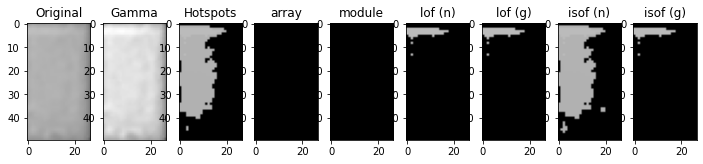

[-1.01597435 -1.00884443 -0.96642443 -1.04321066 -1.02627439 -0.99482283
 -0.99185338 -1.00773097 -1.00472914 -1.00150344]
[-2.39655106]
[-0.45190309 -0.44476588 -0.43622908 -0.4876812  -0.47145663 -0.44432642
 -0.44659319 -0.44728505 -0.43790879 -0.45922527]
[-0.77931021]
[-1.21384388 -0.99691866 -0.98617318 -1.80050318 -1.28333612 -1.07761397
 -1.01746797 -1.00821743 -0.99999819 -1.00329588]
[-2.39655106]
[-0.51850354 -0.46097894 -0.48220799 -0.62612476 -0.55545541 -0.51668255
 -0.47488166 -0.47381076 -0.45826951 -0.47230876]
[-0.77931021]
2986.jpg Normal [7.88045069]
[-1.00533001 -1.00891063 -0.98997122 -0.9612782  -1.0166205  -1.07818132
 -1.00891063 -0.95710666 -0.95710666 -0.97879595]
[-2.45667432]
[-0.49454924 -0.42369421 -0.44219504 -0.41360312 -0.42103805 -0.47450625
 -0.42369421 -0.43203007 -0.43203007 -0.44583294]
[-0.79133486]
[-1.02589678 -1.03874273 -0.96369087 -1.2154284  -1.54251364 -1.01474799
 -1.03874273 -1.10177798 -1.10177798 -0.94898499]
[-2.45667432]
[-0.49636915

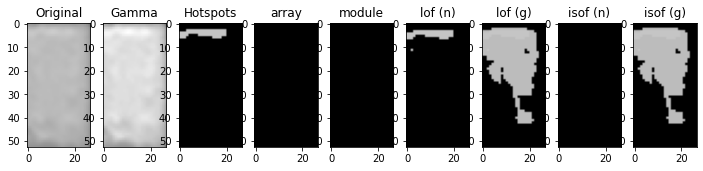

[-1.         -0.96287879 -1.         -1.04525176 -1.09274967 -0.96287879
 -1.76622038 -1.         -1.07856352 -1.        ]
[-2.31299743]
[-0.4163998  -0.40852148 -0.4151833  -0.47024045 -0.44982121 -0.40852148
 -0.61739155 -0.3977912  -0.47703501 -0.41190179]
[-0.76259949]
[-1.12419623 -1.05421325 -1.10381906 -1.04327183 -1.43167864 -1.05421325
 -0.97562614 -1.11585576 -1.1078234  -1.18882378]
[-2.31299743]
[-0.54559073 -0.5255401  -0.55161402 -0.48893036 -0.6762042  -0.5255401
 -0.43060359 -0.52982523 -0.45981126 -0.55383707]
[-0.76259949]
3326.jpg Normal [6.50125842]
[-1.         -0.97628823 -1.00577894 -1.         -1.07530336 -1.
 -1.01341458 -0.98295123 -1.00988142 -2.92741946]
[-2.31059791]
[-0.42958887 -0.4323578  -0.4742729  -0.44709643 -0.50872831 -0.43057426
 -0.44719555 -0.41937934 -0.45127585 -0.71564557]
[-0.76211958]
[-0.99937567 -1.56236551 -1.01342008 -1.1031842  -1.00247155 -1.0576256
 -1.86835226 -1.30971561 -1.16836364 -1.46599278]
[-2.31059791]
[-0.51182726 -0.639195

[-0.99482544 -1.00585837 -0.97385299 -1.11914911 -0.98761076 -1.00912638
 -1.0531041  -1.54099822 -0.97190471 -0.97385299]
[-2.26439771]
[-0.4669375  -0.47873681 -0.44820433 -0.51039013 -0.4645771  -0.48094455
 -0.48024394 -0.58774271 -0.47236059 -0.44820433]
[-0.75287954]
[-0.9857718  -0.98282616 -0.99196546 -0.96244825 -1.00766789 -1.01389274
 -1.10801621 -0.99332532 -0.98116323 -0.97909073]
[-2.26439771]
[-0.52457291 -0.486049   -0.50766074 -0.46903274 -0.49157156 -0.51384272
 -0.55260304 -0.48747339 -0.4963067  -0.48822388]
[-0.75287954]
1928.jpg Normal [5.81296502]
[-1.0753216  -1.13101787 -0.99171271 -1.08137496 -0.99171271 -1.05764103
 -1.00472914 -1.01810506 -1.07054572 -0.97170628]
[-2.39655106]
[-0.4628826  -0.53420167 -0.42970823 -0.4972133  -0.42970823 -0.50491335
 -0.43790879 -0.44905594 -0.47823649 -0.44296233]
[-0.77931021]
[-1.28333612 -0.99281222 -1.55752996 -1.06078996 -1.49234998 -1.01474205
 -1.38858428 -1.91965412 -1.20318852 -1.58470757]
[-2.39655106]
[-0.55545541

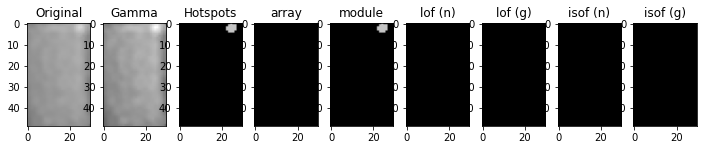

[-0.98059401 -1.01202035 -0.97769753 -1.00656927 -1.01022724 -0.97904907
 -1.00145229 -0.97904907 -1.02481396 -1.01780656]
[-2.09404644]
[-0.43743342 -0.45437941 -0.44773695 -0.47831    -0.46150843 -0.4511314
 -0.45564199 -0.4511314  -0.44720475 -0.45799731]
[-0.71880929]
[-1.20154933 -3.06874182 -2.69678511 -3.46647913 -3.19963202 -1.80648937
 -4.27715391 -1.85439531 -2.39181283 -2.63569761]
[-2.09404644]
[-0.54778201 -0.76796664 -0.75347904 -0.77895604 -0.77213468 -0.66440214
 -0.78754484 -0.67088455 -0.73319851 -0.74637562]
[-0.71880929]
4677.jpg Normal [3.92686926]
[-0.99158675 -0.9817268  -1.04454153 -0.99158675 -1.04972897 -1.05969388
 -0.99478541 -1.01143986 -0.99478541 -1.01143986]
[-2.31612168]
[-0.44963636 -0.45278577 -0.49391367 -0.44963636 -0.48271644 -0.52430981
 -0.43383834 -0.47145738 -0.43383834 -0.47145738]
[-0.76322434]
[-1.14698039 -1.72578941 -1.01617265 -1.1761353  -1.0661329  -1.01941014
 -1.33608717 -1.08891681 -1.33608717 -1.09777426]
[-2.31612168]
[-0.51912909 

[-0.98098613 -0.99646727 -1.00291231 -1.00918215 -1.01487521 -1.01530409
 -1.00957937 -1.00379582 -1.02185021 -0.98708436]
[-2.09404644]
[-0.42640759 -0.47078929 -0.4682721  -0.44850424 -0.46595124 -0.46869601
 -0.47189489 -0.446685   -0.46663783 -0.42931573]
[-0.71880929]
[-2.1653484  -4.34555459 -4.76271432 -3.53319091 -3.93515049 -5.18325187
 -4.55329001 -2.81709486 -4.20875323 -1.03219804]
[-2.09404644]
[-0.71121168 -0.79021356 -0.79611663 -0.78053874 -0.78701218 -0.80369344
 -0.79289133 -0.753989   -0.78701218 -0.50749457]
[-0.71880929]
3642.jpg Normal [3.92686926]
[-1.0533628  -1.01562781 -0.9901349  -0.97385299 -0.97367749 -1.06315922
 -1.06721493 -0.97367749 -1.06741435 -1.04979908]
[-2.26439771]
[-0.48380066 -0.47758529 -0.45856293 -0.44820433 -0.4522282  -0.49377059
 -0.4757901  -0.4522282  -0.47949236 -0.46132527]
[-0.75287954]
[-0.97936787 -1.1671586  -1.01356126 -1.04267168 -0.99371468 -0.99332532
 -1.01181106 -0.98222899 -1.00163805 -1.02284036]
[-2.26439771]
[-0.48507679

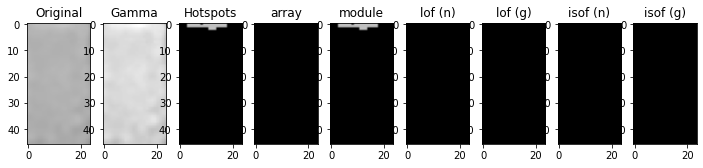

[-0.99909083 -0.9710551  -1.03749462 -1.01084089 -1.23082212 -1.05296769
 -0.9905171  -1.         -1.03521253 -0.9710551 ]
[-2.30688477]
[-0.45345011 -0.4433269  -0.48897986 -0.47486614 -0.53564726 -0.48649858
 -0.44052008 -0.44028175 -0.46170384 -0.4433269 ]
[-0.76137695]
[-2.1405943  -2.97437823 -1.16171102 -5.30844311 -1.01948749 -1.31483475
 -4.11316453 -3.70009031 -1.89809341 -2.8935446 ]
[-2.30688477]
[-0.70213346 -0.75100999 -0.53726914 -0.78371379 -0.47070466 -0.54958306
 -0.77580026 -0.77318022 -0.66941223 -0.75050203]
[-0.76137695]
304.jpg Normal [6.41039469]
[-1.47243676 -1.65055411 -1.14547149 -2.00678881 -2.60288821 -1.06673693
 -1.58880676 -1.27416325 -1.01039757 -1.313069  ]
[-2.31059791]
[-0.59846494 -0.64390336 -0.52883147 -0.72037323 -0.75621455 -0.51471569
 -0.61910786 -0.55344234 -0.48813302 -0.56013153]
[-0.76211958]
[-1.18646371 -1.30971561 -1.03077028 -1.56236551 -2.04602199 -0.99859506
 -1.25743235 -1.06984983 -1.01342008 -1.08090809]
[-2.31059791]
[-0.57395119 

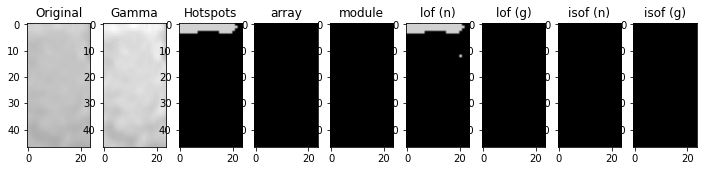

[-0.99401852 -1.03081727 -1.14191488 -1.00067175 -1.05297713 -1.03242007
 -1.14191488 -1.02753106 -1.0045051  -1.03242007]
[-2.14508313]
[-0.45714835 -0.52369158 -0.52110551 -0.45293325 -0.51550985 -0.51313609
 -0.52110551 -0.47671885 -0.47876144 -0.51313609]
[-0.72901663]
[-1.97609057 -1.10407583 -0.95750137 -1.58738028 -1.04212767 -1.13888276
 -0.99198775 -1.47734375 -1.32373474 -1.16216846]
[-2.14508313]
[-0.69822807 -0.5333144  -0.50082579 -0.62973426 -0.52424691 -0.53372582
 -0.4927563  -0.61421926 -0.58831861 -0.53347958]
[-0.72901663]
3087.jpg Normal [4.41654978]
[-1.20317628 -1.0067097  -1.01018521 -1.01018521 -1.10511012 -1.03318128
 -1.35573569 -1.20317628 -1.01600843 -1.08478683]
[-2.18496]
[-0.58598763 -0.52107712 -0.55024441 -0.55024441 -0.57335704 -0.50578847
 -0.61391185 -0.58598763 -0.46353238 -0.56116135]
[-0.736992]
[-1.6637311  -1.05071131 -1.21948658 -1.2012399  -1.42935038 -1.02736748
 -1.91968973 -1.62280748 -0.98427451 -1.36015226]
[-2.18496]
[-0.70930105 -0.5283

[-0.98819755 -0.96287879 -1.00318002 -1.01653068 -1.         -0.97268418
 -1.         -1.00151709 -1.17150086 -1.08050372]
[-2.31299743]
[-0.47492959 -0.40852148 -0.4245236  -0.44962559 -0.41886304 -0.4506871
 -0.42516596 -0.46614552 -0.44033218 -0.52014216]
[-0.76259949]
[-1.10828339 -0.97685185 -0.98415277 -1.12941639 -1.01345351 -1.11499357
 -1.00367101 -1.1368331  -1.03381735 -1.40619569]
[-2.31299743]
[-0.54133106 -0.42697816 -0.48330687 -0.54704484 -0.49071089 -0.5295669
 -0.4339339  -0.52801008 -0.51881791 -0.66560379]
[-0.76259949]
4703.jpg Normal [6.50125842]
[-1.00067175 -0.99149899 -0.96246155 -0.99655516 -1.05297713 -0.99638357
 -1.01878604 -0.99149899 -1.04496976 -0.99514303]
[-2.14508313]
[-0.45293325 -0.4484625  -0.44541513 -0.44749476 -0.51550985 -0.44949296
 -0.48269567 -0.4484625  -0.45201406 -0.44356431]
[-0.72901663]
[-0.95750137 -1.11606997 -1.38372813 -1.02854347 -1.03081775 -1.29041088
 -0.99352769 -1.11606997 -1.83010435 -1.04212767]
[-2.14508313]
[-0.50082579 -

[-1.05301071 -1.0469607  -1.10475466 -1.04346509 -0.98556401 -0.96462297
 -1.10601949 -1.16796208 -1.0049062  -1.0049062 ]
[-2.07605734]
[-0.46201076 -0.43353369 -0.52538917 -0.50262895 -0.42840962 -0.41896571
 -0.47691143 -0.5227223  -0.44174921 -0.44427275]
[-0.71521147]
[-0.99292671 -1.20126829 -0.99344262 -1.07483477 -1.14136843 -1.36256343
 -1.11539458 -0.98612624 -1.05443607 -1.03646272]
[-2.07605734]
[-0.48511646 -0.60783592 -0.44032995 -0.46234631 -0.58428568 -0.61412872
 -0.45637387 -0.4319149  -0.54464619 -0.53293246]
[-0.71521147]
884.jpg Normal [3.76753541]
[-1.01653068 -1.15368169 -0.97268418 -1.17150086 -1.05774114 -0.97268418
 -1.02507488 -1.14368292 -1.09937507 -1.        ]
[-2.31299743]
[-0.44962559 -0.51565111 -0.4506871  -0.44033218 -0.51242405 -0.4506871
 -0.48803236 -0.53467785 -0.49254403 -0.3977912 ]
[-0.76259949]
[-1.09647193 -1.22514223 -1.10896195 -0.98415277 -1.12941639 -1.10896195
 -1.10381906 -1.54751025 -1.15250534 -1.08418946]
[-2.31299743]
[-0.55666308 -

[-1.12538399 -1.11608059 -1.22682284 -1.03718259 -1.09104522 -1.37016297
 -1.18341177 -1.20540827 -1.05715542 -1.09798124]
[-2.31299743]
[-0.5454537  -0.4591211  -0.60187319 -0.5230489  -0.52836755 -0.64412466
 -0.55439097 -0.56001886 -0.44636206 -0.53488779]
[-0.76259949]
[-1.20092993 -0.96967764 -1.40619569 -1.10896195 -1.1445425  -1.61237595
 -1.29036409 -1.35522978 -0.97415612 -1.16461148]
[-2.31299743]
[-0.5545763  -0.45831453 -0.66560379 -0.52845422 -0.53899296 -0.72175975
 -0.5765013  -0.64513351 -0.41452661 -0.55217057]
[-0.76259949]
3291.jpg Normal [6.50125842]
[-1.00876597 -0.98635523 -1.02337841 -1.02843278 -1.0217859  -1.
 -1.03444499 -0.99603656 -0.98191669 -0.99603656]
[-2.16466685]
[-0.49921998 -0.46312557 -0.4898958  -0.52488626 -0.49607359 -0.42785364
 -0.53133136 -0.44012297 -0.48286742 -0.44012297]
[-0.73293337]
[-1.12861    -1.03886717 -1.0459663  -1.21977002 -1.1420779  -1.00634764
 -1.49366309 -1.04032829 -1.0729208  -1.04032829]
[-2.16466685]
[-0.57663448 -0.5246

[-1.17760693 -1.12751891 -1.07423773 -0.98333333 -1.04018278 -1.00805772
 -0.99377104 -1.06328549 -1.07119699 -1.18820034]
[-2.07605734]
[-0.44909374 -0.53275456 -0.45617141 -0.43468727 -0.45679907 -0.48686993
 -0.41826128 -0.46252862 -0.47681917 -0.57778339]
[-0.71521147]
[-0.99662151 -1.28861054 -1.04385965 -0.99081588 -1.03267264 -1.10835609
 -1.11539458 -1.00659974 -1.14136843 -1.32771526]
[-2.07605734]
[-0.49247891 -0.61334767 -0.45172899 -0.44930128 -0.49850376 -0.55184113
 -0.45637387 -0.44637109 -0.58428568 -0.61320824]
[-0.71521147]
1451.jpg Normal [3.76753541]
[-1.61460055 -1.21724143 -0.98451593 -1.4154687  -1.05374005 -1.94164845
 -1.04496976 -1.4154687  -1.2616738  -1.47489077]
[-2.14508313]
[-0.63579397 -0.55063159 -0.48422965 -0.60982538 -0.53057081 -0.68979014
 -0.45201406 -0.60982538 -0.56801099 -0.61882682]
[-0.72901663]
[-1.87759385 -1.41136703 -0.97831932 -1.62607542 -1.16216846 -2.2953255
 -1.00953396 -1.66477056 -1.44435539 -1.70610401]
[-2.14508313]
[-0.67804793 

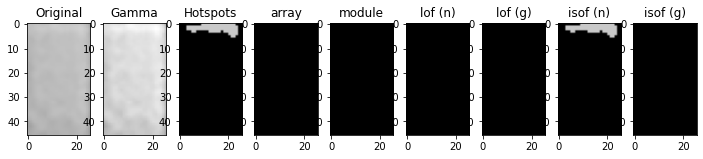

[-0.96642443 -1.01570873 -1.01597435 -1.00773097 -0.99208157 -1.
 -0.95971702 -1.0080229  -1.04525969 -0.99942476]
[-2.39655106]
[-0.43622908 -0.44367352 -0.45190309 -0.44728505 -0.48523341 -0.43844534
 -0.42413351 -0.45486456 -0.46452705 -0.43789899]
[-0.77931021]
[-1.01201    -0.99965059 -1.33473689 -1.06078996 -1.76078619 -1.10981359
 -1.03073227 -0.98617318 -0.98573675 -1.20318852]
[-2.39655106]
[-0.48020698 -0.45869631 -0.5674421  -0.49044345 -0.61893962 -0.52463339
 -0.4612609  -0.48220799 -0.46758365 -0.52868991]
[-0.77931021]
2158.jpg Normal [7.88045069]
[-1.79704665 -0.99354792 -1.00939957 -1.00412314 -1.01523963 -2.52383006
 -6.69976196 -0.9708793  -0.98677272 -1.79704665]
[-2.30567765]
[-0.62331395 -0.43597446 -0.46260971 -0.45458816 -0.46687574 -0.69152192
 -0.8168504  -0.44651153 -0.44296938 -0.62331395]
[-0.76113553]
[-0.98196137 -0.97481458 -1.03254284 -1.05897897 -1.0410108  -1.06593568
 -4.03989311 -0.96790374 -1.06264524 -1.02627059]
[-2.30567765]
[-0.46473342 -0.4398

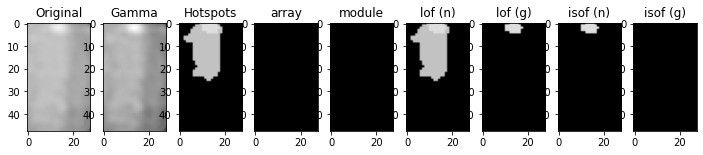

[-1.56976641 -0.98212112 -0.98044269 -1.02892221 -1.01946839 -1.00281616
 -0.95202388 -0.98812783 -1.14656706 -1.07535907]
[-2.36730326]
[-0.62304298 -0.45739755 -0.44913489 -0.45652448 -0.49303154 -0.45428147
 -0.43990187 -0.45067731 -0.53207938 -0.47550874]
[-0.77346065]
[-1.02872694 -1.26697216 -0.99885544 -1.70177856 -1.00969104 -1.09036792
 -1.19137788 -0.99774333 -1.05214564 -1.43159784]
[-2.36730326]
[-0.4637554  -0.57286375 -0.51604256 -0.66708873 -0.47848887 -0.54772301
 -0.53944681 -0.48948581 -0.44727719 -0.60341155]
[-0.77346065]
3520.jpg Normal [7.36721358]
[-1.         -1.00318002 -0.98716977 -1.         -1.21958692 -1.
 -1.10669936 -1.02883667 -1.         -1.        ]
[-2.31299743]
[-0.42516596 -0.4245236  -0.42269531 -0.40972673 -0.4492927  -0.4163998
 -0.48828111 -0.41539891 -0.41886304 -0.41886304]
[-0.76259949]
[-1.09631219 -1.24171481 -0.98489065 -1.09063964 -1.40619569 -1.04052217
 -1.00199479 -0.97765457 -1.1445425  -1.1445425 ]
[-2.31299743]
[-0.51894603 -0.59835

[-1.         -1.         -1.         -1.         -1.         -0.98947587
 -1.         -1.         -1.         -1.01566721]
[-2.18496]
[-0.43724418 -0.45841602 -0.45631388 -0.45841602 -0.46914669 -0.45053091
 -0.44194794 -0.43957491 -0.43957491 -0.46250864]
[-0.736992]
[-1.03024823 -1.21948658 -1.08450424 -1.21948658 -1.09738102 -0.99170026
 -0.98506872 -1.02736748 -1.0092156  -1.70465472]
[-2.18496]
[-0.52464111 -0.58749608 -0.51543529 -0.58749608 -0.51938106 -0.4868977
 -0.52684095 -0.51003675 -0.51207662 -0.72024102]
[-0.736992]
3250.jpg Normal [4.84127779]
[-1.05380625 -1.00803537 -1.48437961 -1.34798865 -1.04018278 -1.10796301
 -1.05630719 -1.00805772 -0.99047304 -0.99377104]
[-2.07605734]
[-0.48899421 -0.49060383 -0.63883013 -0.60380927 -0.45679907 -0.51892947
 -0.52737805 -0.48686993 -0.45041288 -0.41826128]
[-0.71521147]
[-1.03267264 -1.08804584 -1.41111922 -1.37998751 -1.10024284 -1.08778306
 -1.03646272 -0.99292671 -0.97760349 -0.98994682]
[-2.07605734]
[-0.49850376 -0.4317123

[-1.02263584 -2.42657916 -0.98438369 -4.43737808 -0.9977972  -1.05750081
 -0.99936538 -1.         -1.59805782 -3.25464725]
[-2.16466685]
[-0.44535253 -0.67563292 -0.43941068 -0.77643428 -0.42306885 -0.49580153
 -0.43513895 -0.42746218 -0.57558269 -0.71734106]
[-0.73293337]
[-1.11486409 -1.00796587 -1.02337701 -2.65081428 -1.02561344 -1.05140903
 -1.0459663  -1.23704256 -1.01199745 -1.55231802]
[-2.16466685]
[-0.57523673 -0.47330409 -0.51499716 -0.68074858 -0.52141222 -0.45823618
 -0.53627721 -0.60791692 -0.44456027 -0.5751188 ]
[-0.73293337]
689.jpg Normal [4.62026462]
[-0.96402643 -1.12245828 -1.02718949 -1.01980813 -1.         -1.00831582
 -1.02472142 -0.99157025 -0.99027893 -1.00544717]
[-2.09404644]
[-0.42721885 -0.50994126 -0.43969894 -0.4527509  -0.4298296  -0.4622444
 -0.43656465 -0.43161609 -0.42979413 -0.43852235]
[-0.71880929]
[-2.94207388 -0.99873638 -4.20875323 -2.00595228 -4.69262473 -1.38945102
 -3.19963202 -3.86759426 -3.53319091 -2.51375522]
[-2.09404644]
[-0.76278822 -

[-1.02718949 -0.99918225 -1.58694612 -1.01779847 -1.09924531 -1.00831582
 -1.00544717 -0.99423518 -1.         -0.98708436]
[-2.09404644]
[-0.43969894 -0.45796196 -0.58769871 -0.42289532 -0.51119418 -0.4622444
 -0.43852235 -0.43328433 -0.4298296  -0.42931573]
[-0.71880929]
[-2.81709486 -1.08002046 -0.99078602 -2.87958437 -1.03158355 -1.01949767
 -1.54012975 -4.48404487 -3.19963202 -1.66817543]
[-2.09404644]
[-0.753989   -0.53810121 -0.4248767  -0.75603232 -0.46038804 -0.50337208
 -0.5998835  -0.79289133 -0.77213468 -0.63391963]
[-0.71880929]
676.jpg Normal [3.92686926]
[-1.         -1.13781704 -0.97601487 -1.06563674 -1.0439736  -0.9996766
 -1.08677249 -1.00160284 -1.00954037 -0.97601487]
[-2.45667432]
[-0.42952064 -0.46449204 -0.43656234 -0.44829544 -0.4846111  -0.43334035
 -0.44891823 -0.47309782 -0.42941422 -0.43656234]
[-0.79133486]
[-1.03874273 -1.28556817 -1.10177798 -1.         -1.54251364 -1.12684572
 -1.24601222 -0.98285318 -1.00320476 -1.08491403]
[-2.45667432]
[-0.50908786 -0

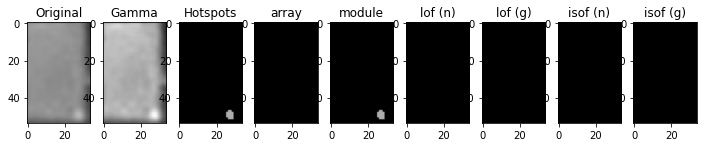

[-1.00971857 -1.         -1.00877638 -1.0217859  -1.         -1.04032464
 -1.         -1.06119935 -0.97712719 -1.02113196]
[-2.16466685]
[-0.48030955 -0.42746218 -0.44836208 -0.49607359 -0.44155684 -0.45926505
 -0.42785364 -0.46262095 -0.43041969 -0.48486004]
[-0.73293337]
[-1.0729208  -0.9980016  -1.02901988 -1.29544018 -1.01231702 -1.0319171
 -1.00244775 -1.05021368 -0.97452466 -1.09954535]
[-2.16466685]
[-0.54810742 -0.46335479 -0.51009056 -0.61794656 -0.48865379 -0.52711296
 -0.49249557 -0.53960904 -0.44006191 -0.56665253]
[-0.73293337]
892.jpg Normal [4.62026462]
[-0.96130731 -1.13000201 -1.13000201 -2.04787055 -1.06960683 -0.98643359
 -0.99041656 -1.02701067 -1.43045431 -1.        ]
[-2.18496]
[-0.45511671 -0.51260685 -0.51260685 -0.69570432 -0.4882661  -0.46491912
 -0.45271504 -0.48560282 -0.57225682 -0.45826201]
[-0.736992]
[-1.21948658 -1.04692279 -1.04692279 -0.97848461 -0.98509977 -1.06602463
 -1.36015226 -1.00077001 -1.00641204 -1.6637311 ]
[-2.18496]
[-0.58749608 -0.493777

[-0.97380952 -1.11608059 -1.         -0.97380952 -1.         -1.05715542
 -1.         -1.00318002 -0.96287879 -2.21303821]
[-2.31299743]
[-0.41115014 -0.4591211  -0.4151833  -0.41115014 -0.42345542 -0.44636206
 -0.41723229 -0.4245236  -0.40852148 -0.60925915]
[-0.76259949]
[-1.11933232 -1.33206346 -1.08159541 -1.11585576 -1.08159541 -1.04327183
 -1.11499357 -1.17671763 -0.97882593 -1.3227058 ]
[-2.31299743]
[-0.54975769 -0.62781893 -0.51909854 -0.52982523 -0.51909854 -0.48893036
 -0.5295669  -0.55398867 -0.47909366 -0.56485154]
[-0.76259949]
4073.jpg Normal [6.50125842]
[-1.04969253 -1.03595949 -0.9779455  -1.11835588 -1.16490686 -0.99662896
 -1.02962553 -0.98625541 -0.98080874 -0.98073819]
[-2.38507247]
[-0.49532287 -0.44746609 -0.43792204 -0.44143108 -0.52748585 -0.45022888
 -0.45477492 -0.44004934 -0.44581376 -0.43632507]
[-0.77701449]
[-1.14979798 -1.09327941 -0.99043205 -1.0540086  -1.333207   -1.06585145
 -1.10361072 -1.06778221 -0.96884451 -0.97971408]
[-2.38507247]
[-0.59892514

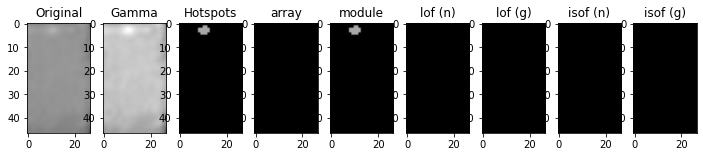

[-1.         -0.98430923 -1.03159504 -0.98859231 -0.96782427 -0.98430923
 -1.21984213 -0.95964912 -1.13244729 -1.        ]
[-2.03106648]
[-0.42414034 -0.42728712 -0.43805759 -0.4526512  -0.42258881 -0.42728712
 -0.54361895 -0.41929301 -0.44948723 -0.41185089]
[-0.7062133]
[-1.20429576 -1.62404468 -1.07173258 -1.00138529 -1.53047832 -1.62404468
 -1.07032442 -1.15992014 -1.99067205 -1.31832736]
[-2.03106648]
[-0.57545835 -0.67345683 -0.52403446 -0.50685894 -0.65234084 -0.67345683
 -0.45304374 -0.55011335 -0.7235044  -0.62338066]
[-0.7062133]
3708.jpg Normal [3.39677265]
[-1.00078056 -1.08478683 -1.35573569 -1.14633512 -2.1843891  -1.17047387
 -1.0067097  -0.97971507 -1.02011822 -1.02011822]
[-2.18496]
[-0.53786656 -0.56116135 -0.61391185 -0.5829699  -0.75824494 -0.59111685
 -0.52107712 -0.4551524  -0.53304435 -0.53304435]
[-0.736992]
[-1.03998403 -0.98506872 -1.14981704 -1.00077001 -1.78947822 -1.01628146
 -1.06006954 -0.99687691 -1.01908316 -1.00940803]
[-2.18496]
[-0.50368132 -0.526840

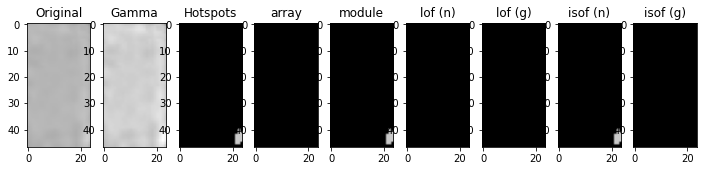

[-1.00611387 -1.         -0.9948292  -1.         -0.9948292  -1.16259115
 -0.99437359 -0.99129953 -1.         -0.98905025]
[-2.30688477]
[-0.52013003 -0.46111123 -0.47052137 -0.45575712 -0.47052137 -0.53393909
 -0.4596418  -0.47078489 -0.4673456  -0.4660751 ]
[-0.76137695]
[-4.36804011 -2.28130469 -3.20938158 -1.78567457 -3.12881746 -5.65706603
 -2.65403755 -3.70009031 -1.95797017 -2.8935446 ]
[-2.30688477]
[-0.78001081 -0.72442028 -0.76692815 -0.65186401 -0.76433807 -0.79063744
 -0.74746153 -0.77318022 -0.67643161 -0.75050203]
[-0.76137695]
4701.jpg Single-Hotspot [6.41039469]


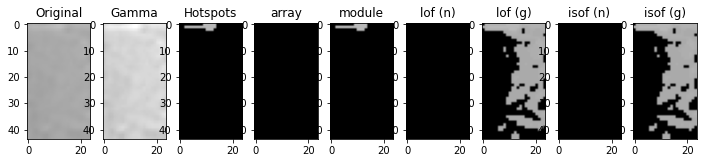

[-1.08655682 -0.9733144  -1.04265405 -0.99474465 -0.98787098 -0.97889468
 -1.         -1.05578163 -1.01036425 -0.99657395]
[-2.22766175]
[-0.54849714 -0.52319543 -0.48733591 -0.5204865  -0.4992105  -0.49921088
 -0.43304769 -0.52762295 -0.49856168 -0.49829817]
[-0.74553235]
[-1.57237697 -1.11276139 -1.00301721 -1.20373088 -1.01121401 -1.09916743
 -0.99780918 -1.38460097 -1.26007912 -0.99267388]
[-2.22766175]
[-0.68071693 -0.57738911 -0.49911072 -0.60468338 -0.51818774 -0.56670701
 -0.45346876 -0.63179432 -0.61594877 -0.53864246]
[-0.74553235]
2370.jpg Normal [5.34148178]
[-0.99873186 -0.98202614 -0.97954764 -1.13171665 -1.02875732 -0.98645704
 -1.         -1.00109951 -1.00109951 -1.00198588]
[-2.30567765]
[-0.48484112 -0.43728849 -0.44921527 -0.50525293 -0.45142368 -0.46827484
 -0.46515375 -0.46249941 -0.46249941 -0.45123828]
[-0.76113553]
[-3.58307442 -2.23614914 -1.03254284 -5.3015828  -3.8534365  -3.32190941
 -2.85335215 -1.74497187 -1.74497187 -0.98923596]
[-2.30567765]
[-0.73848786

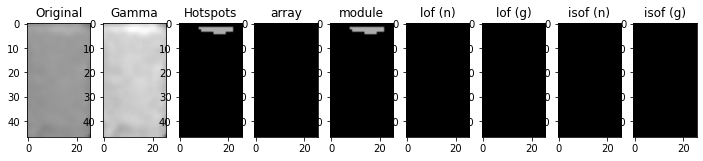

[-0.98333333 -1.09184028 -1.04642108 -1.0049062  -0.98494624 -0.98333333
 -1.07423773 -1.00434662 -1.00434662 -2.07813145]
[-2.07605734]
[-0.43468727 -0.45721335 -0.46726065 -0.44427275 -0.43901881 -0.43468727
 -0.45617141 -0.42760006 -0.42760006 -0.71396798]
[-0.71521147]
[-1.07240941 -1.06922773 -1.36256343 -1.04385965 -1.20126829 -1.07240941
 -1.00888098 -0.99292671 -0.99292671 -1.24170397]
[-2.07605734]
[-0.55126977 -0.46584939 -0.61412872 -0.45172899 -0.60783592 -0.55126977
 -0.49687787 -0.48511646 -0.48511646 -0.55618863]
[-0.71521147]
448.jpg Normal [3.76753541]
[-0.98298685 -1.04019623 -0.97917871 -0.98425823 -1.02354845 -1.04788661
 -0.99629704 -1.04019623 -1.01688136 -1.04362725]
[-2.22766175]
[-0.46724574 -0.46015509 -0.46004329 -0.45459118 -0.46366046 -0.47393913
 -0.44283982 -0.46015509 -0.46069734 -0.51251892]
[-0.74553235]
[-1.0189985  -0.98122691 -1.09916743 -1.02744867 -1.41919128 -0.99332061
 -1.03003967 -0.98122691 -1.00301721 -1.03093822]
[-2.22766175]
[-0.51929071 

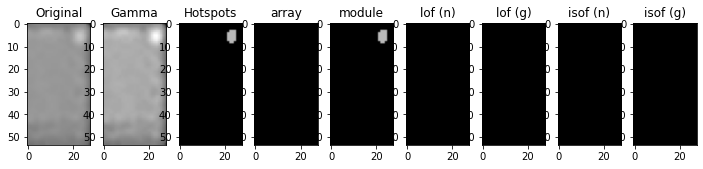

[-1.         -1.04100434 -0.98825308 -1.0080229  -1.00884443 -0.95971702
 -0.96642443 -0.99629952 -0.99942476 -1.00033034]
[-2.39655106]
[-0.43844534 -0.46278985 -0.44017099 -0.45486456 -0.44476588 -0.42413351
 -0.43622908 -0.44917235 -0.43789899 -0.45883104]
[-0.77931021]
[-1.52493997 -1.04939809 -1.04523586 -1.22091596 -1.06078996 -0.9900154
 -1.34252149 -1.84022016 -1.61780506 -1.25298126]
[-2.39655106]
[-0.60126672 -0.49849123 -0.49537677 -0.52520138 -0.49044345 -0.45470435
 -0.57347163 -0.64397236 -0.62160475 -0.5473551 ]
[-0.77931021]
4649.jpg Normal [7.88045069]
[-0.99482283 -1.13101787 -0.98825308 -1.02507127 -1.73545833 -0.99482283
 -1.00033034 -1.02747981 -1.01061118 -1.02627439]
[-2.39655106]
[-0.44432642 -0.53420167 -0.44017099 -0.46942693 -0.63174508 -0.44432642
 -0.45883104 -0.45233036 -0.48532713 -0.47145663]
[-0.77931021]
[-1.40541106 -0.96776561 -0.98573675 -1.72504091 -1.14644805 -1.38858428
 -1.06899923 -1.027614   -1.960695   -1.58470757]
[-2.39655106]
[-0.57693893 

[-1.01630478 -1.         -1.01532691 -1.01084089 -0.97200413 -1.
 -1.         -2.08422915 -1.01721649 -1.01822108]
[-2.30688477]
[-0.46631899 -0.45146829 -0.45287257 -0.47486614 -0.44521396 -0.45317665
 -0.45146829 -0.67368855 -0.4843839  -0.4742381 ]
[-0.76137695]
[-3.94617708 -2.57769467 -4.36804011 -3.70009031 -1.67273447 -5.65706603
 -2.5013518  -0.99716471 -3.2899457  -4.70787421]
[-2.30688477]
[-0.77475118 -0.74242138 -0.78001081 -0.77318022 -0.63196769 -0.79063744
 -0.73891351 -0.45395233 -0.76900654 -0.78001081]
[-0.76137695]
272.jpg Normal [6.41039469]
[-0.95482242 -0.99638357 -0.97852737 -1.03187752 -1.01245029 -0.95482242
 -0.99149899 -0.99415348 -0.96246155 -0.99401852]
[-2.14508313]
[-0.43488981 -0.44949296 -0.45224312 -0.44919842 -0.45552633 -0.43488981
 -0.4484625  -0.45186868 -0.44541513 -0.45714835]
[-0.72901663]
[-1.32373474 -1.10407583 -1.0279449  -1.58738028 -1.24474958 -1.32373474
 -1.02854347 -1.97609057 -1.13888276 -0.96093325]
[-2.14508313]
[-0.58831861 -0.53331

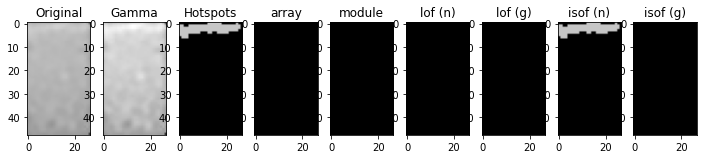

[-1.0480609  -1.27858975 -1.01932313 -1.16665933 -1.33024994 -1.03542829
 -1.66173617 -1.05133564 -1.16665933 -0.97892015]
[-2.38507247]
[-0.52667232 -0.60704491 -0.44207458 -0.55203736 -0.61138349 -0.51705234
 -0.73617072 -0.48392726 -0.55203736 -0.43351193]
[-0.77701449]
[-0.99043205 -1.15692482 -0.98128957 -1.05691451 -1.15692482 -0.98853828
 -1.335096   -1.05768401 -1.05691451 -1.0433991 ]
[-2.38507247]
[-0.54014064 -0.60001132 -0.45695157 -0.54071717 -0.60001132 -0.55182699
 -0.6266902  -0.52913486 -0.54071717 -0.45830657]
[-0.77701449]
3873.jpg Normal [7.67489545]
[-1.00538046 -1.04362725 -1.         -1.00724952 -1.         -2.85864898
 -1.01827601 -1.00041022 -0.99621087 -0.98386512]
[-2.22766175]
[-0.45406309 -0.51251892 -0.43940885 -0.47923697 -0.43931716 -0.74109432
 -0.47651676 -0.47292521 -0.45380242 -0.43165608]
[-0.74553235]
[-1.04522583 -1.0324913  -1.20373088 -0.99183001 -1.49331339 -1.11041612
 -0.99332061 -1.01366548 -0.99267388 -1.12584927]
[-2.22766175]
[-0.53091789

[-1.02883667 -1.         -0.97728419 -1.03242121 -0.995      -1.
 -0.98409091 -1.         -1.         -1.04525176]
[-2.31299743]
[-0.41539891 -0.42516596 -0.42041955 -0.47509818 -0.40993576 -0.4151833
 -0.40300272 -0.41190179 -0.40972673 -0.47024045]
[-0.76259949]
[-1.03703389 -1.09647193 -1.43167864 -1.00745674 -1.30889714 -1.11933232
 -1.12419623 -1.22514223 -1.17671763 -0.97344331]
[-2.31299743]
[-0.50369404 -0.55666308 -0.6762042  -0.48637707 -0.60008148 -0.54975769
 -0.54559073 -0.57771611 -0.55398867 -0.4753732 ]
[-0.76259949]
2984.jpg Normal [6.50125842]
[-0.98333333 -0.98924731 -0.96964286 -1.04113695 -1.         -0.99377104
 -1.07802897 -0.98924731 -0.93081046 -1.07423773]
[-2.07605734]
[-0.43468727 -0.45292733 -0.42676362 -0.43999716 -0.4477335  -0.41826128
 -0.48607691 -0.45292733 -0.4698094  -0.45617141]
[-0.71521147]
[-1.26926461 -1.32771526 -1.20126829 -1.05443607 -1.28861054 -1.40089641
 -1.58907653 -1.29983672 -1.05770337 -1.05443607]
[-2.07605734]
[-0.61387997 -0.61320

[-1.18006772 -1.01036425 -1.00008303 -1.85794324 -1.10841596 -1.39212906
 -0.97889468 -1.39212906 -1.07130761 -1.07130761]
[-2.22766175]
[-0.57064878 -0.49856168 -0.50445812 -0.70489138 -0.54767885 -0.61877568
 -0.49921088 -0.61877568 -0.53443953 -0.53443953]
[-0.74553235]
[-1.15521793 -0.99183001 -1.00769603 -1.85305269 -1.11276139 -1.38460097
 -0.99332061 -1.35495212 -1.04522583 -1.05953876]
[-2.22766175]
[-0.59823609 -0.53944647 -0.50417748 -0.73891351 -0.57738911 -0.63179432
 -0.5105086  -0.62900138 -0.53091789 -0.5406215 ]
[-0.74553235]
4311.jpg Normal [5.34148178]
[-0.99423518 -1.02185021 -0.99027893 -0.99862842 -1.         -1.00616101
 -1.02481396 -1.01695278 -0.97769753 -0.99140279]
[-2.09404644]
[-0.43328433 -0.46663783 -0.42979413 -0.42771835 -0.44072086 -0.42560466
 -0.44720475 -0.44449895 -0.44773695 -0.42402842]
[-0.71880929]
[-2.69678511 -4.48404487 -1.26840255 -2.87958437 -2.00595228 -1.71205122
 -3.13292024 -1.01914039 -3.46647913 -2.22109349]
[-2.09404644]
[-0.75347904

[-1.02883667 -1.         -1.64725216 -0.98409091 -1.         -1.18376561
 -1.         -1.08574019 -1.03242121 -0.96287879]
[-2.31299743]
[-0.41539891 -0.3977912  -0.60787268 -0.40300272 -0.40492338 -0.50194918
 -0.41190179 -0.45927981 -0.47509818 -0.40852148]
[-0.76259949]
[-1.09670681 -1.20092993 -1.03990797 -1.12811114 -1.10828339 -1.1078234
 -1.29036409 -1.02249603 -0.97765457 -1.13171389]
[-2.31299743]
[-0.51051932 -0.5545763  -0.44953814 -0.53432673 -0.54133106 -0.45981126
 -0.5765013  -0.47915991 -0.49457452 -0.53067907]
[-0.76259949]
717.jpg Normal [6.50125842]
[-1.063541   -1.01152293 -0.95964912 -1.02826453 -1.         -1.
 -1.03091121 -0.98430923 -1.02826453 -1.01197638]
[-2.03106648]
[-0.44117014 -0.43695218 -0.41929301 -0.45667069 -0.41565695 -0.41033596
 -0.4648965  -0.42728712 -0.45667069 -0.45765596]
[-0.7062133]
[-1.01942307 -1.28244569 -1.03799284 -1.65746123 -1.08365495 -1.15784484
 -1.01789083 -1.24968972 -1.72620386 -1.0073023 ]
[-2.03106648]
[-0.48235837 -0.6094632

[-1.01202035 -0.97769753 -1.00656927 -0.99974464 -1.00379582 -1.01779847
 -1.02481396 -1.00656927 -0.99423518 -1.00145229]
[-2.09404644]
[-0.45437941 -0.44773695 -0.47831    -0.43320444 -0.446685   -0.42289532
 -0.44720475 -0.47831    -0.43328433 -0.45564199]
[-0.71880929]
[-3.59990269 -3.19963202 -4.07195186 -1.9049143  -2.69678511 -1.42661181
 -2.81709486 -4.00355117 -2.45278403 -4.83280391]
[-2.09404644]
[-0.782654   -0.77213468 -0.78701218 -0.67819089 -0.75347904 -0.58524575
 -0.753989   -0.78701218 -0.73684227 -0.79611663]
[-0.71880929]
4462.jpg Normal [3.92686926]
[-1.08697097 -1.31147397 -1.07130075 -1.00954037 -0.99588541 -1.05095068
 -1.86432578 -1.05248034 -1.18095887 -1.02344436]
[-2.45667432]
[-0.4705003  -0.55402301 -0.53593106 -0.42941422 -0.44839849 -0.48964351
 -0.67346935 -0.47412984 -0.51638504 -0.42553303]
[-0.79133486]
[-0.98670503 -1.10177798 -1.07816399 -0.9929784  -0.96369087 -1.05328329
 -1.44874381 -1.00320476 -1.0397259  -1.02554232]
[-2.45667432]
[-0.44797426

[-0.99460516 -1.02935888 -1.00730719 -1.01024893 -1.00691669 -1.
 -1.00951918 -1.04292297 -1.00605389 -1.02249695]
[-2.29665179]
[-0.468679   -0.46804914 -0.44776058 -0.45852685 -0.47896946 -0.44312821
 -0.4731238  -0.49265994 -0.45723875 -0.47700739]
[-0.75933036]
[-1.94947694 -1.09645885 -0.98691978 -1.25195344 -1.27961287 -1.01812721
 -1.55762228 -1.02173635 -0.97199153 -1.11030876]
[-2.29665179]
[-0.73222687 -0.54057655 -0.46286865 -0.58832666 -0.60053604 -0.47618454
 -0.66675115 -0.45206804 -0.53022253 -0.554637  ]
[-0.75933036]
3331.jpg Normal [6.26111663]
[-0.99171271 -1.02265252 -0.99525194 -0.99942476 -0.99525194 -1.04100434
 -1.00033034 -1.92533768 -1.00884443 -0.99185338]
[-2.39655106]
[-0.42970823 -0.45170814 -0.43466824 -0.43789899 -0.43466824 -0.46278985
 -0.45883104 -0.66051913 -0.44476588 -0.44659319]
[-0.77931021]
[-0.9900154  -1.13456635 -1.02114373 -1.72504091 -1.02114373 -1.10981359
 -1.34252149 -1.13167423 -1.00515883 -1.40541106]
[-2.39655106]
[-0.45470435 -0.5380

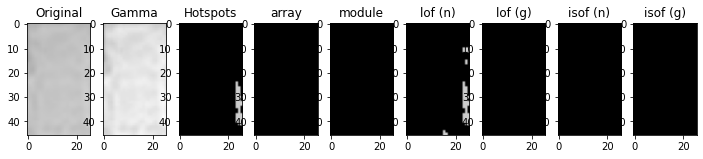

[-1.78101453 -1.46639599 -1.11431684 -2.27893258 -0.99069098 -1.1258836
 -1.31328067 -0.9620566  -1.57856434 -1.36368377]
[-2.36730326]
[-0.66546766 -0.60511794 -0.51200734 -0.73898768 -0.51257556 -0.54789425
 -0.55584766 -0.43511841 -0.60546535 -0.57731104]
[-0.77346065]
[-1.52057066 -1.28956784 -1.14221165 -1.96019679 -0.99185696 -1.00722622
 -1.13050494 -1.08645873 -1.3702667  -1.1666811 ]
[-2.36730326]
[-0.63821407 -0.57853521 -0.51793199 -0.70463542 -0.48085256 -0.5242187
 -0.54742552 -0.44341379 -0.59056047 -0.54053663]
[-0.77346065]
1903.jpg Normal [7.36721358]
[-1.06673585 -1.02024808 -1.00947115 -1.03225644 -1.37634461 -0.98424906
 -1.0064458  -1.02970345 -1.00960304 -1.11327675]
[-2.26958708]
[-0.48087752 -0.49366053 -0.45740549 -0.47166594 -0.58309674 -0.46604739
 -0.49442531 -0.50230466 -0.49362058 -0.54999967]
[-0.75391742]
[-1.46795523 -1.01201002 -1.15140476 -1.22627608 -1.0403968  -2.0978479
 -0.98994258 -1.00724216 -1.0375164  -1.01989043]
[-2.26958708]
[-0.5872484  -0

[-0.99974464 -1.05270787 -1.         -0.99862842 -1.00957937 -0.97769753
 -0.99140279 -0.97574214 -0.99931818 -1.00379582]
[-2.09404644]
[-0.43320444 -0.45149524 -0.4298296  -0.42771835 -0.47189489 -0.44773695
 -0.42402842 -0.45247693 -0.43130028 -0.446685  ]
[-0.71880929]
[-2.05647127 -3.13292024 -1.71205122 -2.69678511 -4.69262473 -3.39976735
 -2.1653484  -1.01452022 -1.29616449 -2.81709486]
[-2.09404644]
[-0.69918483 -0.76900654 -0.64118869 -0.75347904 -0.79504007 -0.77685076
 -0.71121168 -0.47115417 -0.5776108  -0.753989  ]
[-0.71880929]
4112.jpg Normal [3.92686926]
[-1.02962553 -0.98625541 -1.01314423 -1.06246088 -0.99666667 -0.98080874
 -1.00295275 -1.         -0.98625541 -0.98886673]
[-2.38507247]
[-0.45477492 -0.44004934 -0.45575324 -0.47957446 -0.44051073 -0.44581376
 -0.45799761 -0.43496185 -0.44004934 -0.43482472]
[-0.77701449]
[-1.04900138 -1.02139106 -1.23532014 -1.06319973 -1.03305745 -1.07398313
 -1.00226352 -1.10110623 -1.00715498 -0.98755289]
[-2.38507247]
[-0.53145964

[-1.         -0.98298685 -1.0177263  -1.01130117 -0.97300421 -0.95902572
 -1.01827601 -0.99639786 -1.00665323 -1.02323953]
[-2.22766175]
[-0.42737013 -0.46724574 -0.46562835 -0.46328852 -0.45952785 -0.4598028
 -0.47651676 -0.43312877 -0.5068699  -0.45381036]
[-0.74553235]
[-0.97398364 -0.97727494 -1.02744867 -1.03730857 -0.98122691 -1.03003967
 -1.00338338 -1.01637215 -1.6613235  -1.00769603]
[-2.22766175]
[-0.47298992 -0.51806602 -0.50551886 -0.47883192 -0.5094868  -0.52418126
 -0.47868925 -0.46425889 -0.696203   -0.50417748]
[-0.74553235]
4648.jpg Normal [5.34148178]
[-1.         -1.01635279 -1.         -0.96202192 -1.01635279 -1.00411765
 -1.00364506 -1.02935888 -1.         -1.01426628]
[-2.29665179]
[-0.43671101 -0.45258032 -0.46290851 -0.44192332 -0.45258032 -0.43581005
 -0.45927012 -0.46804914 -0.44862851 -0.45693863]
[-0.75933036]
[-0.97199153 -1.71436414 -1.224294   -1.00773313 -1.67237971 -1.00732938
 -1.48484927 -2.16219804 -1.17625393 -1.798333  ]
[-2.29665179]
[-0.53022253 

[-0.95944488 -1.04176716 -1.15396272 -1.02259007 -1.33352221 -1.00125362
 -0.98545941 -0.97693748 -1.00914298 -1.00914298]
[-2.2115474]
[-0.46719422 -0.47787307 -0.50359783 -0.44775416 -0.55290228 -0.45857506
 -0.45914676 -0.44307935 -0.46922854 -0.46922854]
[-0.74230948]
[-1.05048313 -1.13473309 -1.05741658 -0.997966   -0.99206576 -1.04463015
 -1.05063075 -1.00783692 -0.98632021 -0.99444548]
[-2.2115474]
[-0.47058175 -0.56830657 -0.44432401 -0.50369249 -0.45211516 -0.49271086
 -0.47357915 -0.49980838 -0.49396352 -0.4964876 ]
[-0.74230948]
3090.jpg Normal [5.14691978]
[-0.9741719  -0.9994015  -1.07593253 -1.01312613 -1.01125137 -0.9741719
 -0.96773365 -2.79565743 -0.97687123 -1.0265742 ]
[-2.21643155]
[-0.4719153  -0.47433039 -0.50479945 -0.4711376  -0.48337336 -0.4719153
 -0.46651109 -0.67905611 -0.44005631 -0.46173073]
[-0.74328631]
[-1.11406637 -0.99083692 -0.979874   -1.02495367 -1.02077429 -1.09645173
 -0.99225155 -1.90719986 -1.00975482 -1.03790881]
[-2.21643155]
[-0.56296278 -0.

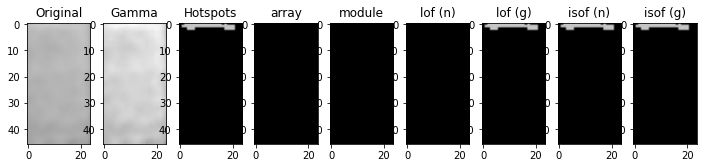

[-1.00248109 -0.98658116 -1.61722896 -0.989361   -1.3980544  -1.05823219
 -3.94490976 -1.         -1.06898591 -1.0082828 ]
[-2.20387359]
[-0.47613332 -0.45452637 -0.65700884 -0.45181971 -0.55990183 -0.53335101
 -0.75610845 -0.43819461 -0.45940486 -0.46479747]
[-0.74077472]
[-1.00686026 -1.04413731 -1.18608605 -1.03409635 -1.51192886 -0.99890248
 -2.97215735 -1.00175593 -0.99722797 -1.04428743]
[-2.20387359]
[-0.44970861 -0.46686919 -0.55417401 -0.47690858 -0.60026222 -0.46238444
 -0.76349964 -0.44714708 -0.44920347 -0.46532606]
[-0.74077472]
4700.jpg Multi-Hotspots [5.05677453]


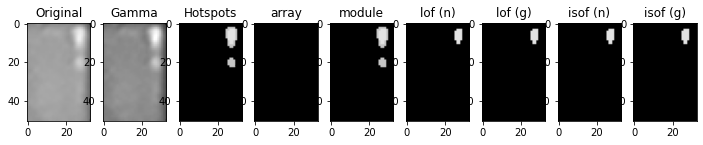

[-0.9733144  -1.03547769 -1.23534032 -1.07130761 -1.00766631 -1.60466785
 -1.01036425 -0.97899503 -1.05578163 -0.99629704]
[-2.22766175]
[-0.52319543 -0.47844575 -0.58549029 -0.53443953 -0.49538143 -0.65679454
 -0.49856168 -0.49867797 -0.52762295 -0.44283982]
[-0.74553235]
[-0.99332061 -1.03156542 -1.15521793 -1.04522583 -1.02062315 -1.53284518
 -0.99183001 -0.99516557 -1.01121401 -0.98299106]
[-2.22766175]
[-0.5105086  -0.49722516 -0.59823609 -0.53091789 -0.50138261 -0.67047138
 -0.53944647 -0.49585967 -0.51818774 -0.47054857]
[-0.74553235]
1678.jpg Normal [5.34148178]
[-1.00643862 -0.99648357 -1.0480609  -1.07291031 -1.00172006 -0.99648357
 -0.99366792 -1.14943927 -0.99123672 -1.04265323]
[-2.38507247]
[-0.4975065  -0.49333864 -0.52667232 -0.50610153 -0.51868194 -0.49333864
 -0.43921543 -0.57785145 -0.5272102  -0.48368349]
[-0.77701449]
[-0.99043205 -1.10110623 -1.15692482 -1.01341704 -0.99186861 -1.07754536
 -1.06236938 -1.30658861 -1.02139106 -1.05768401]
[-2.38507247]
[-0.54014064

[-1.04133801 -1.00697975 -1.05406794 -1.00386788 -1.52328263 -1.07658504
 -0.99086071 -1.01550328 -0.99501924 -1.01550328]
[-2.28287094]
[-0.55185979 -0.48109358 -0.47348648 -0.49797966 -0.69476355 -0.54610064
 -0.46654094 -0.51768982 -0.4658301  -0.51768982]
[-0.75657419]
[-1.01924601 -1.00871751 -1.1266671  -0.99236304 -1.15556483 -1.01155793
 -1.02995721 -1.02490144 -1.01376526 -1.02490144]
[-2.28287094]
[-0.53382439 -0.46351451 -0.52070473 -0.46017783 -0.60704035 -0.55331508
 -0.45495484 -0.48616432 -0.4614386  -0.48616432]
[-0.75657419]
3721.jpg Normal [6.06556047]
[-1.04362725 -1.00724952 -1.18915296 -1.01130117 -1.37927228 -1.
 -1.03685058 -1.00765914 -1.00415733 -1.        ]
[-2.22766175]
[-0.51251892 -0.47923697 -0.53510185 -0.46328852 -0.56421724 -0.43304769
 -0.51911721 -0.46496549 -0.4696662  -0.43940885]
[-0.74553235]
[-1.01577923 -1.04522583 -0.9738486  -1.07837331 -1.03039423 -1.29110569
 -1.01577923 -0.98122691 -0.98450938 -1.38460097]
[-2.22766175]
[-0.49478625 -0.5309

[-1.         -1.05439229 -0.9763067  -0.98545941 -0.98059002 -0.95944488
 -2.54394078 -0.99096311 -1.0285914  -1.        ]
[-2.2115474]
[-0.47581402 -0.49309142 -0.46877754 -0.45914676 -0.46226855 -0.46719422
 -0.68977881 -0.46340194 -0.47238068 -0.45595035]
[-0.74230948]
[-1.49517291 -0.99549916 -1.26447971 -1.08607559 -1.00364697 -1.20599056
 -0.99206576 -1.00657662 -0.9715404  -1.59951923]
[-2.2115474]
[-0.64857687 -0.49847636 -0.60287799 -0.52751641 -0.52704038 -0.586224
 -0.45211516 -0.53379097 -0.50210331 -0.67559806]
[-0.74230948]
105.jpg Normal [5.14691978]
[-0.98377296 -1.00962024 -1.01018028 -0.99235863 -0.98136488 -0.96967788
 -0.9754709  -1.01160444 -1.03780406 -0.99043423]
[-2.38974837]
[-0.4519415  -0.44806676 -0.45399929 -0.47048433 -0.4334102  -0.44345879
 -0.46238488 -0.43520069 -0.45251936 -0.45068804]
[-0.77794967]
[-1.0652395  -1.20102059 -0.9916133  -1.71833409 -0.9957468  -1.10876664
 -1.00663263 -1.00427408 -1.02383534 -1.00409623]
[-2.38974837]
[-0.52488801 -0.5

[-1.         -0.98430923 -1.15616228 -1.         -1.03950808 -1.09274027
 -1.70309754 -1.03159504 -0.98707295 -0.98376106]
[-2.03106648]
[-0.41466677 -0.42728712 -0.51612875 -0.41565695 -0.46126091 -0.45416896
 -0.62158851 -0.43805759 -0.42030197 -0.41934789]
[-0.7062133]
[-1.22046081 -1.55721156 -1.04519735 -1.20429576 -1.0073023  -1.99067205
 -1.02841238 -1.03163896 -1.10995446 -1.40206159]
[-2.03106648]
[-0.5760752  -0.65957127 -0.46756286 -0.57545835 -0.48396023 -0.7235044
 -0.47170414 -0.51868188 -0.53735573 -0.63642405]
[-0.7062133]
2167.jpg Normal [3.39677265]
[-1.02176617 -0.97471405 -1.03420398 -0.99114924 -1.         -1.06227893
 -0.99114924 -1.04532485 -0.95888391 -1.02030719]
[-2.27060937]
[-0.43835206 -0.44490671 -0.4334957  -0.42337489 -0.4204717  -0.42922831
 -0.42337489 -0.4509501  -0.47606341 -0.42435108]
[-0.75412187]
[-1.24223921 -0.96736059 -1.13195921 -1.01010355 -1.51766782 -1.00194394
 -1.02227347 -1.10812849 -1.03249291 -0.96500101]
[-2.27060937]
[-0.60108049 -0

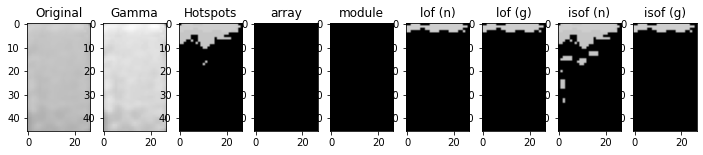

[-0.9845414  -0.99546089 -1.00981454 -1.00862017 -1.01487099 -0.99546089
 -1.04060214 -1.01160444 -0.98136488 -1.69212359]
[-2.38974837]
[-0.43604154 -0.43383646 -0.48096108 -0.44546302 -0.47939962 -0.43383646
 -0.43994007 -0.43520069 -0.4334102  -0.6284255 ]
[-0.77794967]
[-0.99078412 -1.17845296 -0.9639382  -1.03803557 -0.99475015 -1.17845296
 -1.63279476 -1.05266146 -1.02867497 -1.07301221]
[-2.38974837]
[-0.49657838 -0.54809906 -0.4629201  -0.51145503 -0.48687953 -0.54809906
 -0.65174283 -0.52076427 -0.50192    -0.49889735]
[-0.77794967]
878.jpg Normal [7.75797486]
[-1.01712571 -1.14076512 -0.9538591  -1.11835588 -1.25049925 -1.19784367
 -1.05454836 -0.95904349 -1.65945519 -1.05369032]
[-2.38507247]
[-0.49362223 -0.45423594 -0.43111759 -0.44143108 -0.57957768 -0.46535152
 -0.48247612 -0.41760615 -0.57863309 -0.47273924]
[-0.77701449]
[-1.0151559  -1.11578765 -1.03831474 -0.99357293 -1.00062797 -1.01341704
 -1.06423818 -1.00715498 -0.99320495 -0.99896694]
[-2.38507247]
[-0.45578909 

[-1.01130117 -1.         -1.04362725 -1.09358508 -0.97767891 -1.00724952
 -0.99639786 -1.         -1.01827601 -1.04019623]
[-2.22766175]
[-0.46328852 -0.43304769 -0.51251892 -0.52390326 -0.44675175 -0.47923697
 -0.43312877 -0.43931716 -0.47651676 -0.46015509]
[-0.74553235]
[-1.03041153 -1.01706083 -1.00888013 -0.99949617 -0.99117685 -1.0324913
 -0.99332061 -0.99805996 -0.9738486  -1.15521793]
[-2.22766175]
[-0.479694   -0.50589376 -0.48087832 -0.46358638 -0.53237436 -0.47500323
 -0.5105086  -0.50882139 -0.46436496 -0.59823609]
[-0.74553235]
875.jpg Normal [5.34148178]
[-0.98799538 -1.00178711 -0.99992071 -1.01736404 -1.03420398 -0.96670871
 -0.96548312 -1.01665337 -1.03182391 -0.96434216]
[-2.27060937]
[-0.50668541 -0.44271465 -0.51213058 -0.48522807 -0.4334957  -0.48094626
 -0.50262783 -0.49328521 -0.5316845  -0.5063027 ]
[-0.75412187]
[-1.39962699 -1.03249291 -1.43616343 -1.05559833 -1.00360688 -0.98977022
 -1.1764873  -1.02090221 -0.9712876  -1.10812849]
[-2.27060937]
[-0.65247101 -

[-1.04390245 -1.         -1.04019623 -1.00665323 -1.02354845 -0.99629704
 -1.01688136 -1.04265405 -0.95902572 -0.99859837]
[-2.22766175]
[-0.48466719 -0.43304769 -0.46015509 -0.5068699  -0.46366046 -0.44283982
 -0.46069734 -0.48733591 -0.4598028  -0.44397647]
[-0.74553235]
[-1.14107304 -0.98861949 -0.99283525 -1.75224662 -1.20373088 -0.99117685
 -1.01706083 -1.29110569 -1.04522583 -1.01637215]
[-2.22766175]
[-0.59133197 -0.48276369 -0.51401675 -0.71967089 -0.60468338 -0.53237436
 -0.50589376 -0.61554477 -0.53091789 -0.46425889]
[-0.74553235]
3512.jpg Normal [5.34148178]
[-1.02902153 -1.02258631 -0.98676517 -1.14657947 -1.02581596 -0.98300489
 -1.08282236 -0.9875763  -1.05475799 -1.02258631]
[-2.38974837]
[-0.46058932 -0.48393507 -0.46479577 -0.52616273 -0.50187119 -0.47916106
 -0.52445232 -0.48085576 -0.47199394 -0.48393507]
[-0.77794967]
[-0.97986098 -1.71833409 -1.30947815 -0.9923952  -1.84832032 -1.39275953
 -2.19299348 -1.48629039 -1.06755357 -1.67556443]
[-2.38974837]
[-0.5033907 

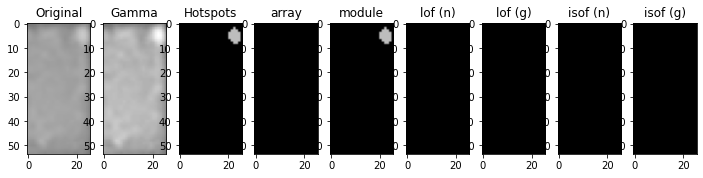

[-0.97136752 -1.33056017 -0.95310911 -2.12878878 -1.         -1.00970043
 -1.         -0.97192887 -1.59739152 -1.00178711]
[-2.27060937]
[-0.43387491 -0.51445277 -0.4271865  -0.72020437 -0.4204717  -0.43163699
 -0.43601798 -0.47252657 -0.56633928 -0.44271465]
[-0.75412187]
[-1.06642473 -0.97758713 -1.05209289 -1.49838006 -0.9712876  -1.29844913
 -0.96129201 -1.01226744 -0.99879154 -1.43616343]
[-2.27060937]
[-0.56075059 -0.42430662 -0.51803435 -0.57527171 -0.5269532  -0.6296938
 -0.48838268 -0.49040728 -0.4665408  -0.6656245 ]
[-0.75412187]
4282.jpg Normal [5.89670454]
[-1.03689256 -1.04549179 -2.47065094 -0.9926696  -1.06776183 -1.01152792
 -1.03689256 -1.00735297 -1.37672224 -1.17195483]
[-2.13603893]
[-0.49188552 -0.45266631 -0.69375442 -0.45549137 -0.46730171 -0.48634906
 -0.49188552 -0.43030412 -0.58981054 -0.55466766]
[-0.72720779]
[-1.03819375 -0.96108414 -1.94538014 -0.97700351 -1.02206474 -1.06793337
 -1.03819375 -0.97398984 -1.10886114 -1.03267705]
[-2.13603893]
[-0.46219341 

[-1.01262139 -1.02790095 -0.99579832 -1.0109516  -0.99611543 -1.0125196
 -0.99956882 -1.0036304  -1.02790095 -0.99956882]
[-2.35800447]
[-0.4699174  -0.46083321 -0.44737447 -0.48055353 -0.45606265 -0.45926139
 -0.46254392 -0.47546485 -0.46083321 -0.46254392]
[-0.77160089]
[-1.41826614 -1.2501498  -0.99921882 -1.02227732 -0.99243426 -1.12345934
 -1.09328489 -1.7622621  -1.22001675 -1.08191421]
[-2.35800447]
[-0.60767006 -0.55037435 -0.48745128 -0.49254542 -0.484883   -0.53356132
 -0.52887621 -0.67499623 -0.5423199  -0.5262711 ]
[-0.77160089]
2340.jpg Normal [7.21114902]
[-1.         -1.06134612 -1.         -1.15097838 -0.99895087 -0.96773365
 -0.99415758 -0.98852336 -1.01164558 -1.        ]
[-2.21643155]
[-0.43923417 -0.4805573  -0.44521992 -0.50224797 -0.44059377 -0.46651109
 -0.45925163 -0.4537765  -0.46801054 -0.44024625]
[-0.74328631]
[-1.03464202 -1.44560189 -1.0168348  -0.99289309 -1.0142194  -1.07694756
 -1.0064225  -1.0064225  -1.20490085 -1.03684802]
[-2.21643155]
[-0.49897318 

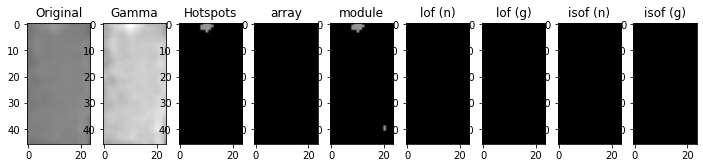

[-0.96454904 -0.9845414  -1.00692007 -1.00862017 -1.01115821 -1.72897219
 -1.00981454 -1.19503096 -0.94981871 -1.00102214]
[-2.38974837]
[-0.44375194 -0.43604154 -0.46549779 -0.44546302 -0.45107599 -0.63938689
 -0.48096108 -0.52168744 -0.44755351 -0.44197272]
[-0.77794967]
[-1.06429138 -0.99475015 -1.00625169 -0.99935093 -1.0652395  -1.11358336
 -1.02448347 -0.99510171 -1.63279476 -1.01366777]
[-2.38974837]
[-0.53321397 -0.48687953 -0.46341135 -0.4885114  -0.52488801 -0.52064598
 -0.4588318  -0.45314914 -0.65174283 -0.51518   ]
[-0.77794967]
3710.jpg Normal [7.75797486]
[-1.00411687 -1.0376689  -1.01479248 -1.01968892 -1.28142373 -1.01502157
 -1.02737221 -0.97652607 -0.99839008 -0.98429197]
[-2.22180258]
[-0.47215897 -0.46401153 -0.49444198 -0.48182809 -0.54229108 -0.47863941
 -0.46190887 -0.50992891 -0.43709345 -0.49527961]
[-0.74436052]
[-1.41060942 -1.04043919 -1.93465075 -1.33085069 -1.03745046 -1.23636194
 -1.18762781 -1.67873878 -0.9845694  -1.49610075]
[-2.22180258]
[-0.60233014

[-0.99535688 -1.04465451 -1.86159429 -1.10765223 -0.99318166 -1.
 -1.03881244 -1.00402295 -3.12953747 -0.99904867]
[-2.2115474]
[-0.44775737 -0.48178452 -0.61210155 -0.50405344 -0.45894028 -0.45595035
 -0.45438935 -0.44714143 -0.72611411 -0.49338163]
[-0.74230948]
[-1.03459688 -0.99646651 -1.33467988 -0.99206576 -0.99528216 -1.07192888
 -0.99903719 -1.05307792 -2.41203303 -1.10694968]
[-2.2115474]
[-0.47122039 -0.49814084 -0.54204102 -0.45211516 -0.50726843 -0.47665874
 -0.51010055 -0.49148692 -0.68393971 -0.55625397]
[-0.74230948]
4916.jpg Normal [5.14691978]
[-1.01139206 -1.         -1.01034958 -1.00452808 -1.03950808 -1.00923332
 -1.03490298 -1.         -1.0286721  -1.03594626]
[-2.03106648]
[-0.47807297 -0.41831143 -0.48362124 -0.47802915 -0.46126091 -0.4661364
 -0.51237559 -0.41185089 -0.49720764 -0.43791036]
[-0.7062133]
[-1.31832736 -1.030459   -1.16563951 -1.04170388 -1.         -1.14171566
 -1.50374507 -1.01789083 -1.28244569 -1.0058455 ]
[-2.03106648]
[-0.62338066 -0.48115489

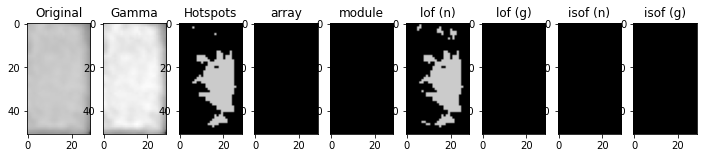

[-1.03434343 -1.01152792 -1.12333814 -0.98413746 -1.03090548 -1.01848385
 -0.95902182 -0.96223773 -1.01152792 -1.00024062]
[-2.13603893]
[-0.4604587  -0.48634906 -0.52080739 -0.46441748 -0.48646016 -0.51722477
 -0.43759966 -0.42837434 -0.48634906 -0.48479831]
[-0.72720779]
[-1.0275022  -1.03561746 -1.40126611 -1.01409964 -1.02997994 -1.07716179
 -1.04910886 -1.03225204 -1.03561746 -1.03421179]
[-2.13603893]
[-0.49331234 -0.51664941 -0.63344677 -0.49751534 -0.49464987 -0.5309053
 -0.46316577 -0.47525361 -0.51664941 -0.49190426]
[-0.72720779]
4651.jpg Multi-Hotspots [4.32552604]


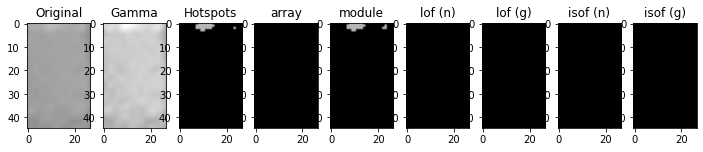

[-1.04227413 -1.15042153 -0.96051267 -1.34174354 -1.         -1.17883221
 -1.32259374 -1.11077015 -1.02025812 -1.37358872]
[-2.20344736]
[-0.52055274 -0.57073739 -0.43790657 -0.60241757 -0.45008845 -0.58105845
 -0.56797901 -0.57111347 -0.48032336 -0.58003751]
[-0.74068947]
[-1.06402921 -1.21445172 -0.99803047 -1.4071527  -1.00524205 -1.25637242
 -1.24898535 -1.12359506 -1.06645119 -1.46838546]
[-2.20344736]
[-0.53597767 -0.61045948 -0.43716594 -0.58508024 -0.45508565 -0.61413765
 -0.5488893  -0.58237406 -0.49003301 -0.62506736]
[-0.74068947]
1729.jpg Normal [5.05181411]
[-0.97822186 -1.01406449 -0.98326982 -1.02659687 -1.04189314 -1.05499424
 -0.99910617 -1.03196248 -0.99910617 -1.00398805]
[-2.22180258]
[-0.43136166 -0.43809877 -0.48878034 -0.47538932 -0.47189736 -0.4291046
 -0.43459023 -0.47889449 -0.43459023 -0.45700143]
[-0.74436052]
[-1.00894313 -1.01000556 -1.86465773 -0.9939457  -1.04043919 -1.02093916
 -0.9845694  -1.2902687  -0.98201484 -1.02528139]
[-2.22180258]
[-0.4777733  

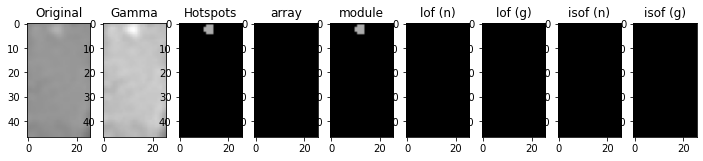

[-0.99657395 -0.98787098 -1.01983718 -0.97899503 -1.00766631 -0.99657395
 -0.98787098 -1.04265405 -0.95902572 -0.97230044]
[-2.22766175]
[-0.49829817 -0.4992105  -0.4949413  -0.49867797 -0.49538143 -0.49829817
 -0.4992105  -0.48733591 -0.4598028  -0.52380608]
[-0.74553235]
[-1.14107304 -1.26007912 -1.04522583 -1.38460097 -1.05953876 -1.14107304
 -1.23405683 -0.97758578 -1.00680267 -1.61685024]
[-2.22766175]
[-0.59133197 -0.61594877 -0.53091789 -0.63179432 -0.5406215  -0.59133197
 -0.61461975 -0.53139014 -0.51797215 -0.68580203]
[-0.74553235]
3658.jpg Normal [5.34148178]
[-1.01014761 -1.02217115 -5.55625146 -1.03534576 -0.99086071 -1.00697975
 -1.44167639 -1.05262314 -0.98685259 -1.01371174]
[-2.28287094]
[-0.45969051 -0.45375344 -0.78647988 -0.48086623 -0.46654094 -0.48109358
 -0.56982607 -0.45373996 -0.45122358 -0.46157103]
[-0.75657419]
[-1.00804201 -1.0192347  -4.10335704 -1.00018409 -1.04745548 -1.18494359
 -1.04316188 -1.00247925 -1.00397429 -1.01070501]
[-2.28287094]
[-0.5541315 

[-0.94981871 -1.02258631 -1.05475799 -1.01018028 -0.99235863 -1.03859377
 -0.9875763  -0.97314891 -1.00956488 -1.00773589]
[-2.38974837]
[-0.44755351 -0.48393507 -0.47199394 -0.45399929 -0.47048433 -0.46109394
 -0.48085576 -0.47765526 -0.44706675 -0.45893088]
[-0.77794967]
[-1.03659595 -2.08732726 -1.25543767 -0.98708821 -1.48629039 -1.10876664
 -1.80387341 -1.67556443 -1.00596244 -1.36299971]
[-2.38974837]
[-0.52410943 -0.70763933 -0.56264597 -0.49066888 -0.62087934 -0.54695292
 -0.6756099  -0.6575006  -0.50559115 -0.57953294]
[-0.77794967]
5215.jpg Normal [7.75797486]
[-1.04699921 -1.00569121 -1.22712072 -1.01406449 -0.99511523 -1.03196248
 -1.03194104 -1.01191567 -1.04907958 -1.04189314]
[-2.22180258]
[-0.46311283 -0.41890217 -0.52481093 -0.43809877 -0.48529124 -0.47889449
 -0.44437777 -0.47568962 -0.4481467  -0.47189736]
[-0.74436052]
[-1.27646938 -1.00712881 -0.96848071 -1.11181816 -1.89637332 -1.54203366
 -1.00893828 -1.43111249 -1.01000556 -1.22075685]
[-2.22180258]
[-0.56141003

[-1.         -1.01426628 -1.00411765 -1.0516941  -1.00485214 -1.00364506
 -1.01530182 -1.         -0.97637141 -1.        ]
[-2.29665179]
[-0.43204474 -0.45693863 -0.43581005 -0.47267664 -0.46379716 -0.45927012
 -0.47392827 -0.45056165 -0.44788738 -0.46290851]
[-0.75933036]
[-1.00553342 -1.02179335 -0.98731048 -1.11030876 -1.59400878 -0.97585536
 -0.98711575 -1.01812721 -0.99185553 -1.01000816]
[-2.29665179]
[-0.4742138  -0.52135227 -0.4627424  -0.554637   -0.672574   -0.53301382
 -0.45688647 -0.47618454 -0.4808671  -0.5187919 ]
[-0.75933036]
4876.jpg Normal [6.26111663]
[-1.         -1.1914182  -0.99320479 -1.01900779 -0.95944488 -3.63975105
 -1.0285914  -0.98545941 -1.02005786 -1.0285914 ]
[-2.2115474]
[-0.45595035 -0.52252465 -0.45875135 -0.45283059 -0.46719422 -0.74286373
 -0.47238068 -0.45914676 -0.4568417  -0.47238068]
[-0.74230948]
[-0.97763936 -1.06500772 -0.9715404  -1.30068728 -0.99602601 -1.71725223
 -0.99437975 -0.99640821 -1.02131218 -0.99528216]
[-2.2115474]
[-0.50013524 -

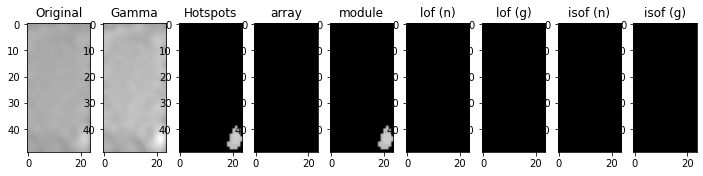

[-1.01502157 -1.01309797 -1.07469435 -1.02186384 -0.98326982 -1.01093548
 -1.05499424 -1.01358185 -1.02186384 -1.0376689 ]
[-2.22180258]
[-0.47863941 -0.43787505 -0.49785465 -0.46816494 -0.48878034 -0.44534188
 -0.4291046  -0.4296647  -0.46816494 -0.46401153]
[-0.74436052]
[-1.15256983 -1.00519721 -1.01292201 -1.01984703 -1.54203366 -0.98201484
 -1.02470551 -1.0041948  -1.02528139 -1.01984703]
[-2.22180258]
[-0.55366444 -0.47298143 -0.43630641 -0.50294849 -0.61978253 -0.50335399
 -0.47489328 -0.46278932 -0.50840379 -0.50294849]
[-0.74436052]
4321.jpg Normal [5.26990254]
[-0.98596491 -1.04955853 -1.21984213 -1.         -1.57944255 -1.02103957
 -1.063541   -1.17660124 -1.03091121 -1.03594626]
[-2.03106648]
[-0.42960497 -0.46338693 -0.54361895 -0.41033596 -0.59716562 -0.46009161
 -0.44117014 -0.52858339 -0.4648965  -0.43791036]
[-0.7062133]
[-1.11943896 -0.9990668  -0.96802122 -1.2645788  -1.00531522 -1.00138529
 -1.03799284 -1.07032442 -1.00466326 -1.62404468]
[-2.03106648]
[-0.53807777 

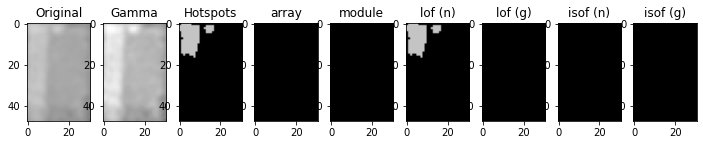

[-0.97905426 -1.0125196  -1.09777813 -1.02434488 -0.98937218 -0.98306476
 -1.04602417 -0.99563892 -0.98365843 -1.03857363]
[-2.35800447]
[-0.49882773 -0.45926139 -0.51602853 -0.47842902 -0.50205746 -0.45683274
 -0.49451453 -0.48790426 -0.45943396 -0.47024746]
[-0.77160089]
[-0.98847548 -1.00048008 -1.45677139 -1.00951827 -0.99751063 -1.00744153
 -1.004901   -1.00809655 -1.03209715 -1.01590164]
[-2.35800447]
[-0.49006436 -0.481577   -0.62132865 -0.51197291 -0.48104477 -0.45754199
 -0.47749756 -0.49493468 -0.4974144  -0.49653499]
[-0.77160089]
2778.jpg Normal [7.21114902]
[-1.06461438 -1.00280733 -0.98267205 -1.06461438 -1.06932439 -1.05231452
 -1.04963946 -1.02025812 -1.3473028  -1.        ]
[-2.20344736]
[-0.508697   -0.45517065 -0.46955592 -0.508697   -0.48428315 -0.46107994
 -0.51554512 -0.48032336 -0.58637579 -0.44078167]
[-0.74068947]
[-1.27692271 -1.05349634 -1.06476644 -1.27692271 -1.12359506 -0.98159419
 -1.4071527  -1.09667932 -1.12663378 -1.12245954]
[-2.20344736]
[-0.61634045

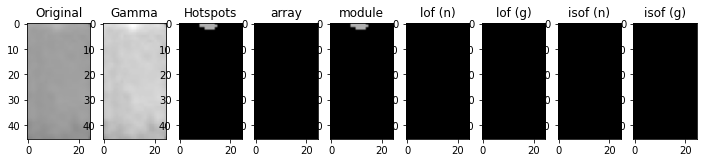

[-0.96563992 -1.         -1.00321667 -0.97345766 -2.45907608 -1.
 -1.         -1.00361298 -1.00762076 -0.98948787]
[-2.20387359]
[-0.45450371 -0.43819461 -0.4592392  -0.42648923 -0.69658998 -0.44220963
 -0.44746017 -0.46634978 -0.45215424 -0.46032843]
[-0.74077472]
[-2.13022567 -2.80592587 -1.51644855 -3.74020837 -0.99848515 -3.14300638
 -2.64431193 -1.10858515 -1.67631387 -2.32801035]
[-2.20387359]
[-0.720273   -0.75670744 -0.62335505 -0.76764343 -0.470592   -0.76608688
 -0.7536418  -0.53961976 -0.64049705 -0.74358704]
[-0.74077472]
732.jpg Normal [5.05677453]
[-1.04292297 -1.         -0.96202192 -0.9930493  -1.0473047  -1.00364506
 -1.16950809 -1.05407589 -0.99237192 -0.99237192]
[-2.29665179]
[-0.49265994 -0.43204474 -0.44192332 -0.46272439 -0.48488676 -0.45927012
 -0.5380047  -0.49609169 -0.43338212 -0.43338212]
[-0.75933036]
[-1.00563722 -1.07052139 -1.00773313 -1.01940978 -0.99185553 -1.52123577
 -0.99180977 -1.00282359 -1.01000816 -1.01877028]
[-2.29665179]
[-0.44622673 -0.52611

[-1.00784583 -1.02387249 -1.20217369 -1.01152792 -0.98223544 -1.01848385
 -1.02430226 -0.99216249 -0.9926696  -1.02696628]
[-2.13603893]
[-0.48662114 -0.51825611 -0.56360726 -0.48634906 -0.44359757 -0.51722477
 -0.47624483 -0.47852919 -0.45549137 -0.50973786]
[-0.72720779]
[-1.05049083 -1.27352096 -1.03640834 -1.19587088 -1.01483258 -1.48380914
 -1.18115894 -1.06049444 -0.9755446  -1.40126611]
[-2.13603893]
[-0.55160069 -0.61093945 -0.49043788 -0.5842495  -0.47849326 -0.64544528
 -0.57396021 -0.55783517 -0.44301184 -0.63344677]
[-0.72720779]
2779.jpg Normal [4.32552604]
[-0.99767712 -0.93874858 -1.12813249 -1.03512791 -0.98624419 -1.02906757
 -0.99303652 -1.00700804 -0.99380186 -1.02906757]
[-2.42423506]
[-0.45263363 -0.41870739 -0.44763756 -0.45525418 -0.44337325 -0.45238452
 -0.47062798 -0.45149304 -0.4605612  -0.45238452]
[-0.78484701]
[-3.00833244 -1.27984738 -1.46632014 -1.00178553 -2.79607419 -2.08659864
 -0.98054717 -4.04733075 -1.06201028 -2.15729214]
[-2.42423506]
[-0.7134688 

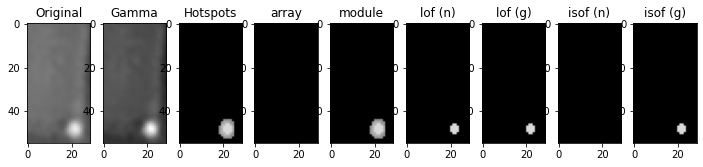

[-0.99895087 -1.         -1.01637051 -1.05539728 -1.         -0.98902635
 -1.31846855 -0.99895087 -0.97926626 -1.01627729]
[-2.21643155]
[-0.44059377 -0.44445434 -0.45823381 -0.4557312  -0.43530344 -0.45710579
 -0.53776223 -0.44059377 -0.45087583 -0.49127418]
[-0.74328631]
[-1.03464202 -1.00137119 -1.00201857 -1.00433643 -1.02495367 -1.14094863
 -0.9979934  -1.03527837 -0.99680018 -1.04617142]
[-2.21643155]
[-0.49897318 -0.54365541 -0.47366039 -0.47656465 -0.52390391 -0.56908956
 -0.46718196 -0.51022342 -0.50291463 -0.48753657]
[-0.74328631]
1516.jpg Normal [5.20512963]
[-1.03780406 -1.02237574 -1.00962024 -0.97314891 -0.96967788 -0.99235863
 -1.02581596 -1.33009531 -1.05475799 -1.02581596]
[-2.38974837]
[-0.45251936 -0.49567341 -0.44806676 -0.47765526 -0.44345879 -0.47048433
 -0.50187119 -0.59374959 -0.47199394 -0.50187119]
[-0.77794967]
[-0.99935093 -1.51958095 -1.01366777 -1.30947815 -1.00596244 -1.20102059
 -1.76110375 -1.09947    -1.0652395  -1.80387341]
[-2.38974837]
[-0.4885114 

[-0.99193228 -1.02626277 -1.00808445 -0.99318166 -1.00497875 -1.06366777
 -1.03322051 -1.02626277 -0.98545941 -1.00402295]
[-2.2115474]
[-0.49998032 -0.47054658 -0.49863408 -0.45894028 -0.48865943 -0.4967507
 -0.46467007 -0.47054658 -0.45914676 -0.44714143]
[-0.74230948]
[-1.37572383 -0.99444548 -0.97100928 -1.00723317 -0.9715404  -0.99658639
 -0.99903719 -0.98632021 -0.99288333 -1.06500772]
[-2.2115474]
[-0.61296853 -0.4964876  -0.4970993  -0.51510388 -0.49556626 -0.49688249
 -0.51010055 -0.49396352 -0.44520431 -0.51516011]
[-0.74230948]
4446.jpg Normal [5.14691978]
[-1.         -1.13721776 -1.         -0.98691453 -0.98070761 -1.0118309
 -1.00935878 -1.86926529 -1.         -1.03377389]
[-2.40967508]
[-0.4758653  -0.50413981 -0.4758653  -0.45507397 -0.44494817 -0.46217731
 -0.4681447  -0.61084067 -0.47663675 -0.46611532]
[-0.78193502]
[-1.24737731 -1.         -1.2950253  -1.00166267 -1.02581908 -1.05007064
 -1.81937245 -1.02016885 -1.46277973 -1.03717291]
[-2.40967508]
[-0.57254753 -0.

[-1.04699921 -0.9926091  -1.23802453 -1.01406449 -1.04320261 -1.01358185
 -1.04057766 -0.97822186 -1.01406449 -0.99910617]
[-2.22180258]
[-0.46311283 -0.42949715 -0.51938161 -0.43809877 -0.43988697 -0.4296647
 -0.44778118 -0.43136166 -0.43809877 -0.43459023]
[-0.74436052]
[-1.59015386 -1.02528139 -1.00041898 -1.39204479 -1.00674695 -0.99782684
 -1.01110325 -1.13588266 -1.41060942 -1.2902687 ]
[-2.22180258]
[-0.62704688 -0.50840379 -0.45604853 -0.59613875 -0.47509915 -0.4944831
 -0.47352902 -0.55613483 -0.60233014 -0.56742419]
[-0.74436052]
3842.jpg Normal [5.26990254]
[-1.19992808 -1.03634679 -0.98259658 -1.05407589 -2.31756024 -1.06816729
 -0.9930493  -1.57299256 -0.98756139 -1.03634679]
[-2.29665179]
[-0.54866282 -0.46974104 -0.44667866 -0.49609169 -0.69197651 -0.50249759
 -0.46272439 -0.62940804 -0.45913103 -0.46974104]
[-0.75933036]
[-1.01940978 -1.08389198 -1.37989578 -1.01866817 -0.99907555 -0.98060981
 -1.63039529 -1.00448875 -1.30727231 -1.08389198]
[-2.29665179]
[-0.49075591 -

[-1.0157173  -0.98440329 -1.00050912 -1.         -1.         -0.96986556
 -1.         -1.0072111  -1.         -0.96051267]
[-2.20344736]
[-0.43406067 -0.44670122 -0.47371548 -0.42628755 -0.44749243 -0.4265261
 -0.43459549 -0.46296792 -0.43459549 -0.43790657]
[-0.74068947]
[-1.06564536 -1.29705154 -1.0097561  -1.08142412 -1.15020579 -1.12967828
 -1.11193452 -1.46838546 -1.09667932 -1.02242503]
[-2.20344736]
[-0.50651916 -0.61908456 -0.45929761 -0.54090047 -0.58236641 -0.50428011
 -0.5785091  -0.62506736 -0.55688881 -0.48033638]
[-0.74068947]
1066.jpg Normal [5.05181411]
[-0.9904643  -1.02715685 -1.06132904 -1.07461651 -1.06227893 -1.33056017
 -0.96670871 -0.96782353 -1.69481381 -0.99660538]
[-2.27060937]
[-0.46502929 -0.44632576 -0.47675215 -0.47343898 -0.42922831 -0.51445277
 -0.48094626 -0.47309953 -0.57038151 -0.44318589]
[-0.75412187]
[-0.96736059 -1.10812849 -1.0249158  -1.1764873  -1.47269988 -1.00508675
 -1.00542291 -0.96349657 -1.00727193 -1.04855169]
[-2.27060937]
[-0.52363269 

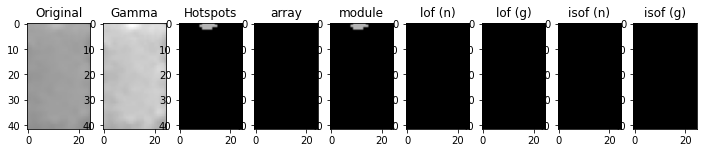

[-1.00060016 -1.03512791 -1.02639103 -0.99380186 -1.0336496  -0.9907816
 -3.41142448 -1.04482237 -0.99303652 -0.99809755]
[-2.42423506]
[-0.4387117  -0.45525418 -0.49380705 -0.4605612  -0.43782957 -0.44774387
 -0.76496272 -0.47644034 -0.47062798 -0.43046909]
[-0.78484701]
[-3.80181252 -3.5562943  -1.87451812 -2.36649949 -3.43353518 -4.49372752
 -1.01522988 -2.85803151 -3.25869645 -3.98595119]
[-2.42423506]
[-0.71928506 -0.71540231 -0.65211927 -0.70087265 -0.71395169 -0.7375187
 -0.4938939  -0.70913749 -0.71009773 -0.7183124 ]
[-0.78484701]
3117.jpg Normal [8.39914459]
[-1.03029903 -1.03558307 -1.06583601 -1.02696628 -1.0963649  -1.06484554
 -1.03090548 -1.02419026 -1.0539594  -1.03928313]
[-2.13603893]
[-0.49373505 -0.50585356 -0.52781429 -0.50973786 -0.46962829 -0.47438499
 -0.48646016 -0.48666592 -0.53589199 -0.51161329]
[-0.72720779]
[-1.10985843 -1.03561746 -1.51623676 -1.15115058 -1.02047439 -1.02520214
 -1.05933225 -1.030758   -1.30496592 -1.24193781]
[-2.13603893]
[-0.5295248  -

[-0.99693627 -1.02715685 -1.         -1.03420398 -2.54372219 -1.06227893
 -1.06132904 -1.03420398 -1.02030719 -0.99114924]
[-2.27060937]
[-0.43065041 -0.44632576 -0.4204717  -0.4334957  -0.71088868 -0.42922831
 -0.47675215 -0.4334957  -0.42435108 -0.42337489]
[-0.75412187]
[-0.96312879 -1.02966288 -1.29844913 -1.04855169 -1.6787218  -1.0249158
 -1.04208525 -1.04855169 -1.00194394 -0.96736059]
[-2.27060937]
[-0.49549535 -0.48842657 -0.6296938  -0.52895206 -0.60263758 -0.50295517
 -0.44745779 -0.52895206 -0.50589438 -0.52363269]
[-0.75412187]
337.jpg Normal [5.89670454]
[-0.98598286 -1.00652523 -0.99033825 -1.00000489 -1.03625054 -1.03279966
 -1.00700804 -1.0463435  -0.99767712 -1.2706998 ]
[-2.42423506]
[-0.46942117 -0.44839648 -0.48344542 -0.4657021  -0.45802724 -0.49132703
 -0.45149304 -0.43669738 -0.45263363 -0.53198467]
[-0.78484701]
[-2.3078009  -2.89255313 -4.11057029 -1.39436799 -3.00833244 -3.25869645
 -2.67215953 -0.97556742 -1.69208327 -5.34002141]
[-2.42423506]
[-0.69897841 -

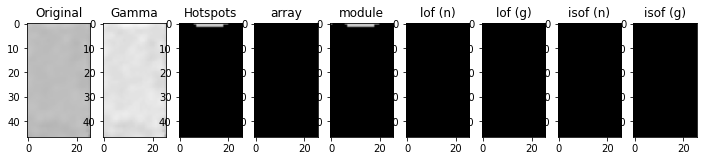

[-1.         -0.99086071 -1.01014761 -1.         -0.99199064 -0.99501924
 -0.96840198 -1.02302253 -1.00386788 -1.0384673 ]
[-2.28287094]
[-0.49272884 -0.46654094 -0.45969051 -0.49272884 -0.45106682 -0.4658301
 -0.45362459 -0.48760462 -0.49797966 -0.47333477]
[-0.75657419]
[-1.03052658 -1.00923759 -0.97187879 -1.01924601 -1.00871751 -1.00992523
 -1.01123797 -1.03061234 -1.22656351 -1.02638037]
[-2.28287094]
[-0.52219165 -0.47364094 -0.47193444 -0.53382439 -0.46351451 -0.56093798
 -0.46494079 -0.49709539 -0.63298998 -0.48999551]
[-0.75657419]
3922.jpg Normal [6.06556047]
[-1.01899612 -0.99300904 -1.02573607 -0.97995977 -1.         -1.0155738
 -1.02573607 -1.01876712 -0.9969697  -1.0155738 ]
[-2.40967508]
[-0.45076548 -0.46420222 -0.46819857 -0.45810442 -0.47150582 -0.46147807
 -0.46819857 -0.46273467 -0.47455008 -0.46147807]
[-0.78193502]
[-1.50347199 -1.03897791 -1.35043326 -1.00644749 -1.81937245 -1.18470977
 -1.31892677 -1.24737731 -1.04210809 -1.1576884 ]
[-2.40967508]
[-0.62444518 -

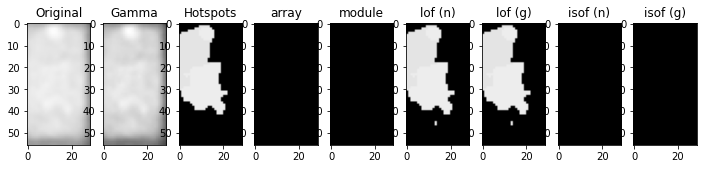

[-1.10494973 -1.0233529  -1.25690344 -0.99325839 -1.06977121 -1.17016623
 -1.06032171 -0.98658116 -1.40978382 -1.12455556]
[-2.20387359]
[-0.5267192  -0.48719736 -0.58048762 -0.45830603 -0.54327891 -0.53863308
 -0.52091456 -0.45452637 -0.62114017 -0.53926051]
[-0.74077472]
[-2.53733889 -1.48315486 -3.14300638 -1.06016877 -2.27798699 -2.86056677
 -1.9404603  -1.         -3.61707394 -2.69818324]
[-2.20387359]
[-0.74661178 -0.61928499 -0.76608688 -0.53581613 -0.73704597 -0.75773209
 -0.71217725 -0.44745483 -0.76764343 -0.7536418 ]
[-0.74077472]
2382.jpg Normal [5.05677453]
[-0.96606703 -0.95902182 -1.02347526 -0.98521539 -1.04549179 -1.01882971
 -1.06484554 -0.93799705 -0.9926696  -1.37672224]
[-2.13603893]
[-0.43177302 -0.43759966 -0.50408662 -0.45812575 -0.45266631 -0.44231347
 -0.47438499 -0.4397887  -0.45549137 -0.58981054]
[-0.72720779]
[-1.03421179 -1.07716179 -0.9755446  -1.02047439 -1.03475156 -1.04747985
 -1.33641088 -1.02198444 -1.0118229  -0.99306344]
[-2.13603893]
[-0.49190426

[-0.97676851 -1.03485208 -0.99227993 -1.25352477 -1.04060214 -0.9845414
 -0.99227993 -0.98876895 -1.01160444 -1.03485208]
[-2.38974837]
[-0.44646405 -0.47391337 -0.46082311 -0.53334726 -0.43994007 -0.43604154
 -0.46082311 -0.45833736 -0.43520069 -0.47391337]
[-0.77794967]
[-1.02383534 -1.01466867 -1.01974074 -0.98892591 -1.67556443 -0.99078412
 -1.01974074 -0.99778034 -1.0652395  -1.01466867]
[-2.38974837]
[-0.51568705 -0.45672449 -0.49332969 -0.45679073 -0.6575006  -0.49657838
 -0.49332969 -0.51190645 -0.52488801 -0.45672449]
[-0.77794967]
4724.jpg Normal [7.75797486]
[-0.99767712 -0.99901652 -0.9907816  -0.99949635 -0.98624419 -0.99787304
 -1.00695984 -1.02906757 -1.46887098 -0.98598286]
[-2.42423506]
[-0.45263363 -0.45079464 -0.44774387 -0.44224463 -0.44337325 -0.47163619
 -0.46570854 -0.45238452 -0.53149097 -0.46942117]
[-0.78484701]
[-2.89255313 -3.25869645 -1.27984738 -3.74043297 -2.62667979 -5.01452376
 -4.04733075 -2.01590513 -0.99617342 -3.37401561]
[-2.42423506]
[-0.71009773 

[-0.94616263 -1.04320261 -1.00369636 -1.03874923 -1.05499424 -0.99977907
 -0.94616263 -1.04907958 -1.00675483 -1.11252694]
[-2.22180258]
[-0.42240141 -0.43988697 -0.42546087 -0.45435065 -0.4291046  -0.43457401
 -0.42240141 -0.4481467  -0.43419299 -0.48991086]
[-0.74436052]
[-1.11938605 -1.01560492 -1.33085069 -0.97881265 -1.2595196  -1.47814436
 -1.11938605 -1.61968217 -1.02528139 -1.02470551]
[-2.22180258]
[-0.55090544 -0.48739501 -0.55709282 -0.48448847 -0.55985881 -0.60577309
 -0.55090544 -0.63731203 -0.50840379 -0.47489328]
[-0.74436052]
647.jpg Normal [5.26990254]
[-1.05262314 -1.01889124 -1.2717406  -0.99086071 -1.08134913 -1.05406794
 -0.99199064 -1.2717406  -1.09832161 -1.04122578]
[-2.28287094]
[-0.45373996 -0.48061387 -0.53769193 -0.46654094 -0.45336826 -0.47348648
 -0.45106682 -0.53769193 -0.47740061 -0.48713582]
[-0.75657419]
[-1.01924601 -1.0038774  -1.05085325 -1.06064512 -0.98854122 -0.99436039
 -1.03061234 -1.04919132 -1.01632528 -1.02822035]
[-2.28287094]
[-0.53382439 

[-1.05810718 -1.01482216 -1.00952221 -0.98508162 -1.01175097 -1.0188187
 -1.04001921 -1.03687861 -1.06032171 -1.00182588]
[-2.20387359]
[-0.52092099 -0.46655531 -0.4613888  -0.45296569 -0.49154624 -0.44151891
 -0.50687141 -0.50236559 -0.52091456 -0.48709724]
[-0.74077472]
[-3.3769618  -1.59096301 -1.02411872 -1.8482435  -2.48423716 -1.0782846
 -2.69818324 -2.91520768 -3.19995605 -2.17947945]
[-2.20387359]
[-0.76764343 -0.62746155 -0.44766411 -0.69359859 -0.74661178 -0.52561068
 -0.7536418  -0.76184458 -0.76608688 -0.72614473]
[-0.74077472]
3261.jpg Normal [5.05677453]
[-0.98859231 -0.98596491 -1.07397842 -0.95964912 -1.149481   -1.063541
 -1.03159504 -1.         -1.03398361 -1.03950808]
[-2.03106648]
[-0.4526512  -0.42960497 -0.50104482 -0.41929301 -0.51859268 -0.44117014
 -0.43805759 -0.41033596 -0.4720628  -0.46126091]
[-0.7062133]
[-1.11943896 -1.50374507 -1.0058455  -1.40206159 -1.03190983 -1.23662585
 -1.1975457  -1.91142707 -1.00138529 -1.03163896]
[-2.03106648]
[-0.53807777 -0.6

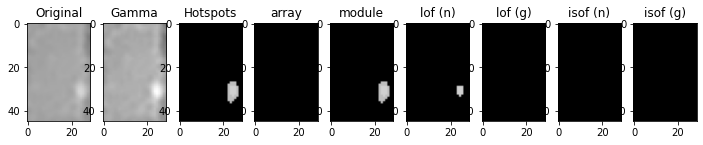

[-1.12349267 -1.846395   -0.98136488 -1.02902153 -1.6190787  -0.98300489
 -1.38528417 -1.846395   -4.2281206  -0.99235863]
[-2.38974837]
[-0.53080075 -0.67016773 -0.4334102  -0.46058932 -0.64372656 -0.47916106
 -0.58130212 -0.67016773 -0.79289133 -0.47048433]
[-0.77794967]
[-1.08022637 -1.84832032 -0.98892591 -1.01789295 -1.59505683 -1.00409623
 -1.39275953 -1.80387341 -3.50771124 -0.99371463]
[-2.38974837]
[-0.54705485 -0.67734576 -0.44776592 -0.46257461 -0.64660106 -0.50399047
 -0.5936398  -0.6756099  -0.769635   -0.49179535]
[-0.77794967]
2157.jpg Normal [7.75797486]
[-1.00415733 -1.02323953 -1.21641148 -1.         -1.         -0.97767891
 -1.00538046 -0.99639786 -1.02642436 -0.98386512]
[-2.22766175]
[-0.4696662  -0.45381036 -0.52999134 -0.43304769 -0.45479501 -0.44675175
 -0.45406309 -0.43312877 -0.49466678 -0.43165608]
[-0.74553235]
[-1.00519093 -1.15521793 -1.00591268 -1.01366548 -0.97727494 -1.0189985
 -1.01816569 -0.99183001 -0.99705751 -1.00769603]
[-2.22766175]
[-0.47195308 

[-0.96223773 -0.9926696  -1.01882971 -1.07327268 -0.9948429  -0.99702381
 -0.98223544 -0.96606703 -0.96606703 -1.00728769]
[-2.13603893]
[-0.42837434 -0.45549137 -0.44231347 -0.50807968 -0.45539487 -0.44710669
 -0.44359757 -0.43177302 -0.43177302 -0.47888954]
[-0.72720779]
[-1.37768239 -1.01680228 -1.13659323 -0.9755446  -1.02106248 -1.18115894
 -1.30496592 -1.05049083 -1.05614865 -1.02520214]
[-2.13603893]
[-0.62997704 -0.5014993  -0.54915086 -0.44301184 -0.50721097 -0.57396021
 -0.60961678 -0.55160069 -0.54061301 -0.47562591]
[-0.72720779]
4256.jpg Normal [4.32552604]
[-1.00582548 -1.03625054 -1.2706998  -1.00700804 -0.99575899 -1.00451457
 -1.01035871 -1.03279966 -1.         -0.98598286]
[-2.42423506]
[-0.49536145 -0.45802724 -0.53198467 -0.45149304 -0.49182907 -0.46754554
 -0.49225427 -0.49132703 -0.47253662 -0.46942117]
[-0.78484701]
[-3.80181252 -2.67215953 -4.81922517 -2.36649949 -3.5562943  -3.25869645
 -3.98595119 -2.95044279 -1.54385495 -1.87451812]
[-2.42423506]
[-0.71928506

[-0.9907816  -1.02906757 -0.98624419 -1.12813249 -0.99196066 -1.01168535
 -1.04482237 -1.0336496  -0.99588778 -0.99809755]
[-2.42423506]
[-0.44774387 -0.45238452 -0.44337325 -0.44763756 -0.45045689 -0.44658549
 -0.47644034 -0.43782957 -0.46517413 -0.43046909]
[-0.78484701]
[-2.89255313 -3.80181252 -4.68902611 -3.09129766 -4.75412564 -3.43353518
 -1.35494088 -1.87451812 -4.11057029 -2.49441582]
[-2.42423506]
[-0.71009773 -0.71928506 -0.75468117 -0.71250401 -0.75929065 -0.71395169
 -0.56381855 -0.65211927 -0.72074652 -0.70372364]
[-0.78484701]
3505.jpg Normal [8.39914459]
[-0.9811151  -0.9811151  -1.00362319 -1.03690999 -1.17160362 -0.98610474
 -1.04313371 -0.99427437 -1.         -1.00559727]
[-2.40967508]
[-0.48258435 -0.48258435 -0.46706576 -0.53181382 -0.50765041 -0.48597027
 -0.5072021  -0.4944571  -0.47564191 -0.48993262]
[-0.78193502]
[-1.03717291 -1.03359127 -1.00644749 -1.58485652 -1.00378396 -1.03493498
 -1.22645925 -1.07857362 -0.99010334 -1.02144912]
[-2.40967508]
[-0.53447035

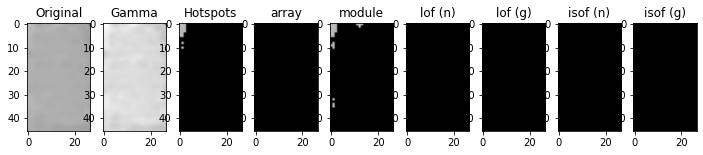

[-2.50359064 -1.01926464 -1.02177543 -1.22996617 -1.88257614 -1.06050606
 -1.00695185 -1.44257394 -0.99976267 -1.03713025]
[-2.35800447]
[-0.6966742  -0.48365942 -0.46974623 -0.56572557 -0.65551436 -0.51044826
 -0.4729645  -0.58960124 -0.4839331  -0.50174659]
[-0.77160089]
[-0.9970967  -1.00109797 -1.57177966 -1.01546917 -0.99229287 -0.98659037
 -1.41826614 -1.03239243 -1.09328489 -1.00109797]
[-2.35800447]
[-0.47529615 -0.50656585 -0.6403088  -0.48068457 -0.47173834 -0.4919107
 -0.60767006 -0.49191005 -0.52887621 -0.50656585]
[-0.77160089]
686.jpg Normal [7.21114902]
[-1.01164558 -1.01627729 -1.         -1.         -1.67556736 -0.97687123
 -1.02437712 -1.         -1.         -1.00135956]
[-2.21643155]
[-0.46801054 -0.49127418 -0.44141765 -0.43530344 -0.58312617 -0.44005631
 -0.46881904 -0.45353976 -0.46544887 -0.44297611]
[-0.74328631]
[-1.18999794 -1.042484   -1.03616172 -1.04728182 -0.99474292 -0.99225155
 -1.27046587 -1.00603934 -1.00137119 -0.98545345]
[-2.21643155]
[-0.58842268 -

[-1.00538046 -1.01688136 -1.04788661 -1.         -1.01688136 -3.5251534
 -1.02323953 -0.99639786 -0.97300421 -1.00041022]
[-2.22766175]
[-0.45406309 -0.46069734 -0.47393913 -0.43882026 -0.46069734 -0.78647988
 -0.45381036 -0.43312877 -0.45952785 -0.47292521]
[-0.74553235]
[-1.02744867 -1.07837331 -1.29110569 -0.98450938 -1.07837331 -1.99644571
 -1.18011651 -0.99117685 -1.6613235  -0.98861949]
[-2.22766175]
[-0.50551886 -0.55407915 -0.61554477 -0.51477701 -0.55407915 -0.64925079
 -0.59685223 -0.53237436 -0.696203   -0.48276369]
[-0.74553235]
645.jpg Normal [5.34148178]
[-0.97843234 -1.01164558 -0.99977797 -1.00920171 -1.0035445  -1.
 -1.0037561  -1.01312613 -0.9741719  -0.97574544]
[-2.21643155]
[-0.48214217 -0.46801054 -0.47788747 -0.47193939 -0.46620985 -0.44521992
 -0.46142944 -0.4711376  -0.4719153  -0.47309757]
[-0.74328631]
[-1.20490085 -1.04728182 -1.5506835  -1.02699316 -1.07694756 -0.97743805
 -1.01483755 -1.0412715  -1.29673627 -1.32300667]
[-2.21643155]
[-0.58950926 -0.507197

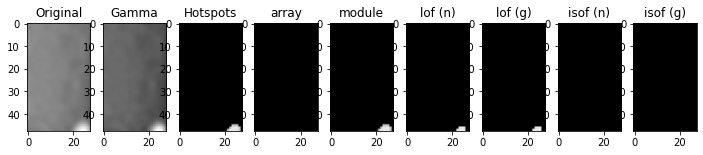

[-0.99427437 -1.20165802 -0.99360984 -1.0279864  -1.00362319 -1.03096094
 -0.99887039 -1.48195864 -1.04543316 -1.04543316]
[-2.40967508]
[-0.4944571  -0.56429024 -0.47257215 -0.50204229 -0.46706576 -0.54537785
 -0.45766945 -0.62902791 -0.53295102 -0.53295102]
[-0.78193502]
[-1.04547713 -1.26829538 -0.99114847 -1.03493498 -1.00670321 -1.07857362
 -1.00799462 -1.58485652 -1.10267887 -1.10267887]
[-2.40967508]
[-0.49909196 -0.57783648 -0.44019585 -0.51367977 -0.47135724 -0.53570926
 -0.45910423 -0.64081035 -0.53894946 -0.53894946]
[-0.78193502]
4054.jpg Normal [8.12222618]
[-1.05327736 -0.97693748 -0.98059002 -1.03134041 -1.00821625 -1.00466318
 -1.02005786 -1.07206945 -1.03881244 -1.02259007]
[-2.2115474]
[-0.45577138 -0.44307935 -0.46226855 -0.46652022 -0.46709448 -0.45132928
 -0.4568417  -0.4579683  -0.45438935 -0.44775416]
[-0.74230948]
[-0.97100928 -0.99528216 -1.03253398 -1.05307792 -1.37572383 -0.99444548
 -1.06500772 -0.99646651 -0.96869656 -1.0066599 ]
[-2.2115474]
[-0.4970993  -

[-1.31766211 -1.06583601 -1.00024062 -1.20677488 -1.39866593 -1.49947068
 -1.17889638 -1.31766211 -1.03928313 -1.68307933]
[-2.13603893]
[-0.60256711 -0.52781429 -0.48479831 -0.57669405 -0.60798933 -0.61154587
 -0.54777343 -0.60256711 -0.51161329 -0.66460187]
[-0.72720779]
[-1.24193781 -1.06793337 -1.00605709 -1.13659323 -1.30496592 -1.37768239
 -1.12335087 -1.24193781 -1.03475156 -1.54866437]
[-2.13603893]
[-0.60309825 -0.55166735 -0.46799429 -0.54915086 -0.60961678 -0.62997704
 -0.53497576 -0.60309825 -0.50073236 -0.65493091]
[-0.72720779]
1845.jpg Normal [4.32552604]
[-1.01487099 -0.97676851 -0.98971376 -0.99879165 -0.98136488 -1.00691732
 -0.9754709  -1.09640365 -0.96454904 -1.00121729]
[-2.38974837]
[-0.47939962 -0.44646405 -0.44379918 -0.44721977 -0.44109822 -0.43459319
 -0.46238488 -0.48874156 -0.44375194 -0.45296171]
[-0.77794967]
[-1.00596244 -1.08022637 -1.59505683 -1.01366777 -1.22505591 -1.2830837
 -0.99371463 -0.9639382  -1.84832032 -1.03659595]
[-2.38974837]
[-0.50559115 

[-1.03841308 -0.99261089 -0.98948787 -0.99704615 -0.97345766 -1.28498223
 -1.         -0.99609286 -1.         -0.99704615]
[-2.20387359]
[-0.45721634 -0.467248   -0.46032843 -0.45458239 -0.42648923 -0.52647439
 -0.43819461 -0.45465412 -0.43819461 -0.45458239]
[-0.74077472]
[-2.37803372 -1.0051732  -1.18608605 -2.86056677 -1.8943519  -1.00764022
 -1.30915166 -3.14300638 -1.30915166 -2.86056677]
[-2.20387359]
[-0.74409032 -0.45467916 -0.55417401 -0.75773209 -0.70225263 -0.44589779
 -0.58761077 -0.76608688 -0.58761077 -0.75773209]
[-0.74077472]
4915.jpg Normal [5.05677453]
[-0.98691453 -0.99360984 -1.22425253 -1.00526731 -1.00670069 -0.99140943
 -3.26347079 -1.         -1.00432787 -1.01045846]
[-2.40967508]
[-0.45507397 -0.47257215 -0.51364249 -0.4732542  -0.46996511 -0.4634887
 -0.70870068 -0.45701178 -0.47801607 -0.48208408]
[-0.78193502]
[-1.26829538 -1.22645925 -1.00358456 -1.03493498 -1.07857362 -1.389962
 -1.47210534 -1.87184405 -1.04371909 -1.00644749]
[-2.40967508]
[-0.57783648 -0

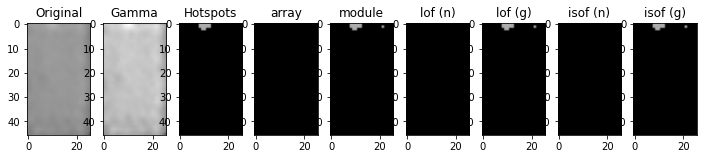

[-0.96223773 -1.03964251 -0.98223544 -1.04549179 -1.02928441 -1.00735297
 -0.96606703 -1.03434343 -1.06776183 -0.99216249]
[-2.13603893]
[-0.42837434 -0.45696931 -0.44359757 -0.45266631 -0.43585549 -0.43030412
 -0.43177302 -0.4604587  -0.46730171 -0.47852919]
[-0.72720779]
[-1.10985843 -1.02711562 -1.07716179 -1.03421179 -1.06793337 -1.02711562
 -1.030758   -1.3206884  -1.06859201 -1.4562948 ]
[-2.13603893]
[-0.5295248  -0.494274   -0.5309053  -0.49190426 -0.55166735 -0.494274
 -0.48408125 -0.60767995 -0.44995673 -0.64111844]
[-0.72720779]
4646.jpg Normal [4.32552604]
[-1.0048405  -0.96981128 -1.02372649 -0.97657185 -1.14337788 -0.97151026
 -1.03240518 -1.02806004 -0.97657185 -1.02522676]
[-2.23087184]
[-0.43368439 -0.44979008 -0.46706765 -0.4477336  -0.5487878  -0.42635408
 -0.46618814 -0.45476577 -0.4477336  -0.42205833]
[-0.74617437]
[-4.31690853 -1.45319356 -6.09237663 -4.66341983 -1.01696949 -2.96059037
 -7.00424846 -5.45621193 -4.66341983 -3.38415406]
[-2.23087184]
[-0.75213245 -

[-1.01899612 -1.         -0.98070761 -0.98610474 -1.0118309  -3.00219593
 -1.05742742 -0.98907994 -1.00362319 -1.        ]
[-2.40967508]
[-0.45076548 -0.4758653  -0.44494817 -0.48597027 -0.46217731 -0.68107203
 -0.499313   -0.46336288 -0.46706576 -0.4758653 ]
[-0.78193502]
[-1.02144912 -1.05007064 -0.99514324 -1.81937245 -1.03657623 -2.12994295
 -1.         -1.04442287 -1.26829538 -1.05007064]
[-2.40967508]
[-0.50835478 -0.52838643 -0.47887872 -0.68767687 -0.49650815 -0.65733399
 -0.45185785 -0.49375929 -0.57783648 -0.52838643]
[-0.78193502]
1064.jpg Normal [8.12222618]
[-1.00862017 -1.05475799 -1.02902153 -0.97314891 -0.96454904 -1.05475799
 -0.98676517 -1.00821342 -2.51394881 -1.00962024]
[-2.38974837]
[-0.44546302 -0.47199394 -0.46058932 -0.47765526 -0.44375194 -0.47199394
 -0.46479577 -0.436739   -0.70968867 -0.44806676]
[-0.77794967]
[-0.9639382  -1.48629039 -1.04476871 -2.03449414 -1.00409623 -1.45227917
 -1.89276722 -1.06680234 -1.83936212 -1.25543767]
[-2.38974837]
[-0.4629201 

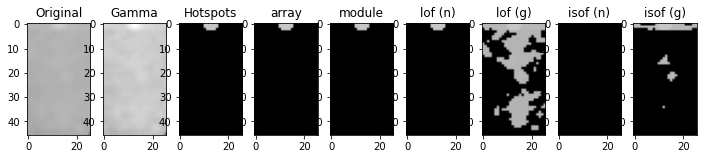

[-1.07020007 -0.96606703 -1.05010952 -1.01882971 -1.37672224 -0.99216249
 -1.02928441 -0.9948429  -1.05949739 -0.96223773]
[-2.13603893]
[-0.45134471 -0.43177302 -0.47435231 -0.44231347 -0.58981054 -0.47852919
 -0.43585549 -0.45539487 -0.48501256 -0.42837434]
[-0.72720779]
[-1.15115058 -1.01813185 -1.07499717 -1.02198444 -1.04454817 -1.40126611
 -1.05049083 -1.02811676 -1.06692703 -1.07716179]
[-2.13603893]
[-0.55694199 -0.50584597 -0.46244663 -0.51303301 -0.46302243 -0.63344677
 -0.55160069 -0.4940972  -0.44525559 -0.5309053 ]
[-0.72720779]
2586.jpg Normal [4.32552604]
[-1.02259007 -1.0061141  -1.0061141  -1.01900779 -0.99320479 -1.75359592
 -1.15396272 -0.99320479 -0.94459386 -1.00210201]
[-2.2115474]
[-0.44775416 -0.46159746 -0.46159746 -0.45283059 -0.45875135 -0.60853874
 -0.50359783 -0.45875135 -0.43408749 -0.44714201]
[-0.74230948]
[-1.20599056 -1.0490416  -1.06380047 -0.96869656 -0.997966   -1.00982598
 -1.00962454 -1.00014815 -1.06834374 -0.97100928]
[-2.2115474]
[-0.586224   -

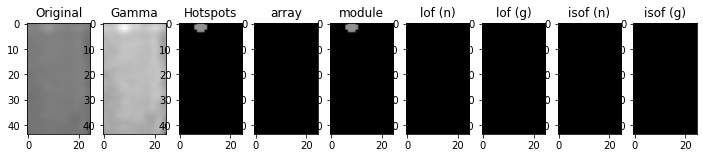

[-0.99956882 -1.         -1.03857363 -0.9794794  -0.9794794  -1.00138343
 -0.98306476 -1.01412023 -1.01623004 -1.03713025]
[-2.35800447]
[-0.46254392 -0.45257742 -0.47024746 -0.45155305 -0.45155305 -0.46056176
 -0.45683274 -0.45565151 -0.47108396 -0.50174659]
[-0.77160089]
[-1.00903395 -0.99243426 -1.14151602 -0.99343487 -1.00109797 -1.27840468
 -1.01546917 -1.08191421 -1.61490776 -0.99719483]
[-2.35800447]
[-0.50018966 -0.484883   -0.53038469 -0.51331506 -0.50656585 -0.56347401
 -0.48068457 -0.5262711  -0.65491088 -0.46417925]
[-0.77160089]
1931.jpg Normal [7.21114902]
[-1.01651833 -0.98961115 -0.98440329 -1.07347737 -1.00613127 -1.
 -1.         -1.04692771 -1.         -1.        ]
[-2.20344736]
[-0.44609284 -0.46370778 -0.44670122 -0.44793002 -0.44084111 -0.44749243
 -0.42628755 -0.47822148 -0.44749243 -0.43459549]
[-0.74068947]
[-1.05250425 -1.29705154 -1.1767943  -1.0112913  -1.02242503 -1.11443531
 -1.06402921 -1.46838546 -1.12601963 -1.05999933]
[-2.20344736]
[-0.53369877 -0.6190

[-1.02906757 -1.12813249 -1.         -0.97515566 -0.99196066 -1.01168535
 -0.99809755 -1.01168535 -0.98624419 -0.97515566]
[-2.42423506]
[-0.45238452 -0.44763756 -0.4570173  -0.46705084 -0.45045689 -0.44658549
 -0.43046909 -0.44658549 -0.44337325 -0.46705084]
[-0.78484701]
[-3.61767385 -2.85803151 -5.14472282 -3.86319208 -4.42862799 -3.31449604
 -2.23254652 -3.25869645 -4.30028892 -3.92457164]
[-2.42423506]
[-0.71734106 -0.70913749 -0.769635   -0.71879856 -0.73552541 -0.71154052
 -0.68879312 -0.71009773 -0.72269975 -0.7183124 ]
[-0.78484701]
533.jpg Normal [8.39914459]
[-1.02430226 -1.00784583 -1.01861572 -0.98413746 -1.03434343 -1.14740882
 -1.02819118 -0.95902182 -1.00024062 -0.96223773]
[-2.13603893]
[-0.47624483 -0.48662114 -0.45391869 -0.46441748 -0.4604587  -0.46107022
 -0.49103506 -0.43759966 -0.48479831 -0.42837434]
[-0.72720779]
[-1.27352096 -1.07236514 -1.00277458 -1.10985843 -1.05049083 -1.03561746
 -1.4562948  -1.030758   -1.15115058 -1.0152959 ]
[-2.13603893]
[-0.61093945 

[-1.02384157 -0.98727903 -0.99954064 -1.         -1.01621378 -1.
 -1.00642817 -1.         -1.03843257 -1.01523727]
[-2.27146111]
[-0.44684643 -0.45236925 -0.45433941 -0.4657494  -0.44003494 -0.46345273
 -0.45007228 -0.47193326 -0.46829486 -0.45527382]
[-0.75429222]
[-1.70494263 -0.99368551 -1.34043765 -3.43514147 -1.61610271 -3.03656798
 -1.09619038 -3.56799931 -1.0347216  -2.02110824]
[-2.27146111]
[-0.65642367 -0.45633219 -0.59482089 -0.74544138 -0.64907297 -0.73791431
 -0.51634764 -0.74948716 -0.48899752 -0.69580982]
[-0.75429222]
1514.jpg Normal [5.90828053]
[-1.03293358 -0.9926696  -0.9948429  -0.98447125 -1.17195483 -5.45443888
 -1.05949739 -1.05949739 -0.9926696  -0.98521539]
[-2.13603893]
[-0.5095406  -0.45549137 -0.45539487 -0.46713213 -0.55466766 -0.79913075
 -0.48501256 -0.48501256 -0.45549137 -0.45812575]
[-0.72720779]
[-1.02997994 -1.27352096 -1.51623676 -1.27352096 -0.98235418 -3.32367843
 -1.07716179 -1.07716179 -1.27352096 -1.42878046]
[-2.13603893]
[-0.49464987 -0.6109

[-1.11950883 -1.05956624 -1.         -1.05345345 -1.04227413 -1.00807087
 -1.1208715  -1.08532084 -1.07347737 -1.05345345]
[-2.20344736]
[-0.56519246 -0.53103432 -0.45852366 -0.52388801 -0.52055274 -0.44765908
 -0.49091387 -0.54732471 -0.44793002 -0.52388801]
[-0.74068947]
[-1.55963427 -1.23304341 -1.00324935 -1.31718037 -1.1767943  -1.07702862
 -1.12601963 -1.4071527  -0.99912894 -1.31718037]
[-2.20344736]
[-0.6329212  -0.61489768 -0.47546295 -0.61994178 -0.59579331 -0.54310624
 -0.58154689 -0.58508024 -0.43574011 -0.61994178]
[-0.74068947]
2790.jpg Normal [5.05181411]
[-0.98624419 -1.00060016 -1.26183125 -1.01168535 -1.00895771 -0.97515566
 -1.05477842 -0.99619718 -1.0463435  -0.93874858]
[-2.42423506]
[-0.44337325 -0.4387117  -0.53824988 -0.44658549 -0.46493169 -0.46705084
 -0.45132553 -0.4855992  -0.43669738 -0.41870739]
[-0.78484701]
[-4.75412564 -2.36649949 -1.01818161 -3.5562943  -1.87451812 -4.30028892
 -3.74043297 -1.27984738 -3.09129766 -2.79607419]
[-2.42423506]
[-0.75929065

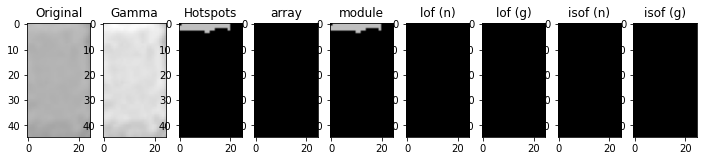

[-1.02435218 -0.98302662 -1.05104977 -1.00582785 -1.02522676 -0.96981128
 -1.01101562 -1.02806004 -1.02220069 -1.39125399]
[-2.23087184]
[-0.46233613 -0.423877   -0.4604381  -0.44714047 -0.42205833 -0.44979008
 -0.44205475 -0.45476577 -0.46900821 -0.5417508 ]
[-0.74617437]
[-6.00118945 -2.03378481 -0.99649659 -4.57652381 -2.87674872 -1.17703976
 -4.40273176 -4.66341983 -5.91000226 -0.99844088]
[-2.23087184]
[-0.7748599  -0.70244139 -0.4975976  -0.75570308 -0.7310602  -0.57046405
 -0.75570308 -0.75672637 -0.7748599  -0.47282771]
[-0.74617437]
2949.jpg Normal [5.38110963]
[-1.0125196  -0.99579832 -0.9874596  -1.02499768 -0.98365843 -0.99579832
 -0.9935305  -0.96589475 -1.00138343 -1.02790095]
[-2.35800447]
[-0.45926139 -0.44737447 -0.4450338  -0.4833288  -0.45943396 -0.44737447
 -0.44171637 -0.46730974 -0.46056176 -0.46083321]
[-0.77160089]
[-0.99921882 -1.00951827 -0.99243426 -1.61490776 -1.10904653 -0.99485391
 -1.0282583  -1.01425188 -1.10904653 -1.00903395]
[-2.35800447]
[-0.48745128

[-0.99501924 -1.01544376 -1.02470252 -0.99983546 -1.         -1.05221838
 -1.         -0.98524255 -0.99407892 -1.00697975]
[-2.28287094]
[-0.4658301  -0.46548523 -0.55022994 -0.49996441 -0.46342415 -0.52317561
 -0.49272884 -0.4867739  -0.50600383 -0.48109358]
[-0.75657419]
[-1.00719241 -1.01376526 -1.22656351 -0.98854122 -1.01789347 -1.00953319
 -0.98574157 -1.02638037 -1.03893411 -1.01123797]
[-2.28287094]
[-0.48494585 -0.4614386  -0.63298998 -0.47858424 -0.44894723 -0.56461471
 -0.46444584 -0.48999551 -0.50635198 -0.46494079]
[-0.75657419]
5015.jpg Single-Hotspot [6.06556047]


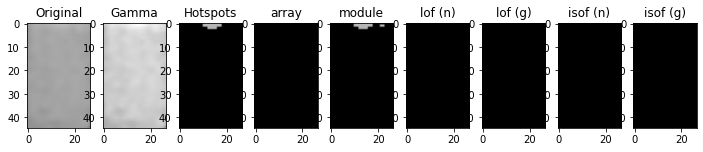

[-0.98064006 -1.01228992 -1.05149068 -1.10926739 -1.07610745 -1.00582785
 -0.97151026 -0.98241591 -1.0366043  -0.99348659]
[-2.23087184]
[-0.43198115 -0.43025976 -0.47020248 -0.43955837 -0.44090853 -0.44714047
 -0.42635408 -0.4503068  -0.47858691 -0.42868412]
[-0.74617437]
[-4.40273176 -2.03378481 -0.99399309 -3.88993796 -3.80626031 -5.27598314
 -2.96059037 -1.39532293 -6.09237663 -2.87674872]
[-2.23087184]
[-0.75570308 -0.70244139 -0.50218036 -0.74959234 -0.74655552 -0.77119876
 -0.731555   -0.59876884 -0.7748599  -0.7310602 ]
[-0.74617437]
1273.jpg Normal [5.38110963]
[-0.9874596  -1.05708976 -0.99956882 -1.         -1.00613078 -1.03713025
 -0.9935305  -1.0000927  -1.0125196  -1.0036304 ]
[-2.35800447]
[-0.4450338  -0.48288173 -0.46254392 -0.44941641 -0.45199132 -0.50174659
 -0.44171637 -0.47151027 -0.45926139 -0.47546485]
[-0.77160089]
[-0.99284037 -1.00114643 -0.99751063 -0.99288617 -1.03209715 -1.00318923
 -1.01562112 -0.99779506 -1.00809655 -1.34737631]
[-2.35800447]
[-0.48813548

[-1.86695629 -1.12958735 -1.36892181 -1.0118442  -1.19045031 -1.55467521
 -1.3204644  -0.99977797 -1.04212411 -1.48737325]
[-2.21643155]
[-0.73011573 -0.55270234 -0.62278639 -0.49623853 -0.57262404 -0.66959524
 -0.60735917 -0.47788747 -0.5290798  -0.65268955]
[-0.74328631]
[-1.27046587 -1.0168348  -1.0412715  -0.99767745 -1.00603934 -1.12789997
 -1.02077429 -1.0064225  -1.03684802 -1.12789997]
[-2.21643155]
[-0.61262778 -0.53469372 -0.53593479 -0.49786242 -0.53669018 -0.56194926
 -0.53502559 -0.48000386 -0.51146283 -0.56194926]
[-0.74328631]
1918.jpg Normal [5.20512963]
[-0.99348659 -0.99076402 -1.00681829 -1.21525057 -1.06259693 -1.78026893
 -0.96981128 -1.01438051 -1.01228992 -1.06736349]
[-2.23087184]
[-0.42868412 -0.45741039 -0.44836449 -0.55373724 -0.46682853 -0.61074732
 -0.44979008 -0.46624753 -0.43025976 -0.44366949]
[-0.74617437]
[-6.63949973 -3.88993796 -4.66341983 -1.29624866 -2.40256012 -1.01429946
 -4.40273176 -3.46908456 -5.63644071 -4.83721187]
[-2.23087184]
[-0.77906535

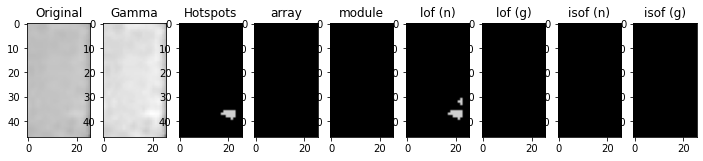

[-0.98601006 -1.00271057 -1.01706204 -1.42612603 -1.07222198 -0.99828895
 -1.89081549 -1.03562468 -0.9929354  -0.98601006]
[-2.20627621]
[-0.46135819 -0.48794009 -0.49236558 -0.56992707 -0.49646321 -0.47753238
 -0.64459369 -0.49270566 -0.4920456  -0.46135819]
[-0.74125524]
[-1.92877033 -1.17931117 -1.37757989 -1.02141285 -1.06987397 -1.66088556
 -0.99344474 -1.49033226 -1.23102635 -2.0153864 ]
[-2.20627621]
[-0.70246281 -0.53700811 -0.57516152 -0.47958974 -0.51824024 -0.63893573
 -0.45247744 -0.60606347 -0.55498089 -0.7136227 ]
[-0.74125524]
268.jpg Normal [5.08482738]
[-1.0155684  -1.         -0.97763738 -1.05147094 -1.00559203 -1.00202394
 -1.00559203 -1.03038861 -1.04178939 -1.0116564 ]
[-2.31176438]
[-0.50122942 -0.45630001 -0.46286726 -0.48694664 -0.46881095 -0.47258473
 -0.46881095 -0.43139838 -0.50647429 -0.51410794]
[-0.76235288]
[-1.11553375 -0.9994444  -0.97805435 -1.19062066 -1.0161067  -0.97148464
 -1.00366482 -1.02929452 -1.39610845 -1.03860255]
[-2.31176438]
[-0.54145911 

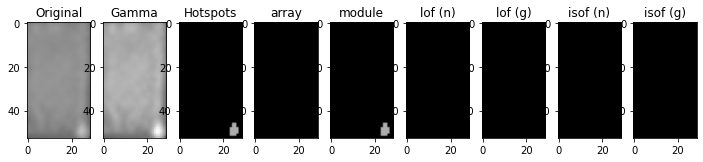

[-1.00815612 -1.18036908 -1.0004773  -1.04133801 -0.99736312 -1.31100282
 -1.07658504 -1.07658504 -0.95178659 -1.18036908]
[-2.28287094]
[-0.55072419 -0.60014827 -0.50046454 -0.55185979 -0.53150491 -0.64847221
 -0.54610064 -0.54610064 -0.43582637 -0.60014827]
[-0.75657419]
[-1.01070501 -1.13599863 -0.98551442 -1.01994316 -1.01924601 -1.24737347
 -1.0262035  -1.03512442 -0.98702085 -1.11188807]
[-2.28287094]
[-0.56916083 -0.5973271  -0.48193544 -0.55988247 -0.53382439 -0.63797045
 -0.55329651 -0.55404447 -0.43382475 -0.58032724]
[-0.75657419]
3699.jpg Normal [6.06556047]
[-0.97314891 -1.00102214 -1.09640365 -1.00962024 -1.02902153 -1.00773589
 -0.99235863 -3.54041423 -0.98876895 -1.02706983]
[-2.38974837]
[-0.47765526 -0.44197272 -0.48874156 -0.44806676 -0.46058932 -0.45893088
 -0.47048433 -0.77538434 -0.45833736 -0.48066359]
[-0.77794967]
[-1.30947815 -0.98676206 -1.01451158 -1.01366777 -0.98708821 -1.08022637
 -1.17845296 -2.81412022 -0.99241964 -1.67556443]
[-2.38974837]
[-0.55367281

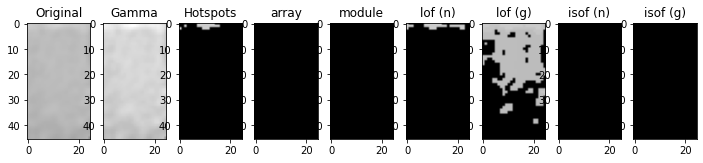

[-1.06583601 -1.03029903 -0.98223544 -1.0539594  -1.01779347 -1.09665888
 -1.04984037 -1.00024062 -1.15088614 -0.98447125]
[-2.13603893]
[-0.52781429 -0.49373505 -0.44359757 -0.53589199 -0.50851299 -0.52796602
 -0.52707165 -0.48479831 -0.5220204  -0.46713213]
[-0.72720779]
[-1.30496592 -1.05049083 -1.0443562  -1.16832019 -1.07716179 -1.33641088
 -1.2256501  -1.030758   -1.42878046 -1.02001727]
[-2.13603893]
[-0.60961678 -0.55160069 -0.45698834 -0.56391182 -0.5309053  -0.61529511
 -0.59992686 -0.48408125 -0.63817875 -0.45061961]
[-0.72720779]
1930.jpg Normal [4.32552604]
[-1.         -1.00732718 -1.         -1.         -1.         -1.
 -0.99658227 -1.         -0.98064367 -1.00911541]
[-2.27146111]
[-0.4680909  -0.46530065 -0.45732879 -0.47193326 -0.46029166 -0.47699995
 -0.48072244 -0.4680909  -0.47788692 -0.44780459]
[-0.75429222]
[-4.19779654 -1.05010768 -2.26019215 -3.6357057  -3.16942581 -3.83882489
 -4.9297921  -4.27061285 -0.98995189 -1.40576113]
[-2.27146111]
[-0.76485539 -0.5179

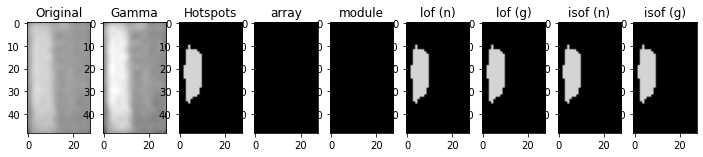

[-0.95002968 -1.11685667 -0.99303652 -0.99619718 -1.64596259 -1.00060016
 -0.9907816  -1.05477842 -1.03604133 -0.99303652]
[-2.42423506]
[-0.42468048 -0.51951325 -0.47062798 -0.4855992  -0.59227028 -0.4387117
 -0.44774387 -0.45132553 -0.51117642 -0.47062798]
[-0.78484701]
[-3.14709725 -1.06293631 -2.23254652 -1.58262235 -0.99560496 -2.79607419
 -3.37401561 -4.30028892 -1.15261245 -2.23254652]
[-2.42423506]
[-0.71298624 -0.52197404 -0.68879312 -0.62105258 -0.4589628  -0.70913749
 -0.71298624 -0.72269975 -0.51671869 -0.68879312]
[-0.78484701]
1065.jpg Normal [8.39914459]
[-1.03061589 -1.         -0.98348611 -1.19414741 -1.         -1.00388506
 -1.35234093 -1.         -1.01227211 -0.99204144]
[-2.31176438]
[-0.47213365 -0.43711451 -0.4629056  -0.56736242 -0.46862536 -0.46306071
 -0.56410809 -0.43452711 -0.49623074 -0.44655672]
[-0.76235288]
[-1.01585247 -0.97702063 -1.05703451 -0.99840183 -0.9683623  -1.06645846
 -1.00020487 -1.02071707 -0.98524486 -1.01065616]
[-2.31176438]
[-0.48247197 

[-0.98289362 -1.0125196  -0.9874596  -1.06050606 -0.9749142  -1.
 -1.02177543 -1.02790095 -2.82747717 -0.96589475]
[-2.35800447]
[-0.45113699 -0.45926139 -0.4450338  -0.51044826 -0.45145169 -0.44941641
 -0.46974623 -0.46083321 -0.69254202 -0.46730974]
[-0.77160089]
[-0.99205379 -1.38055924 -1.09328489 -0.99390772 -1.12345934 -0.99751063
 -1.03231241 -1.61490776 -1.6232356  -0.99541201]
[-2.35800447]
[-0.49409544 -0.59623249 -0.52887621 -0.48013155 -0.53356132 -0.48104477
 -0.49885159 -0.65491088 -0.59309359 -0.48414186]
[-0.77160089]
3882.jpg Normal [7.21114902]
[-1.00526731 -1.42966952 -1.15592562 -1.38635546 -1.58166967 -0.99479418
 -1.02479465 -1.17160362 -2.09546278 -1.02162266]
[-2.40967508]
[-0.4732542  -0.5659761  -0.49535462 -0.55225493 -0.57756646 -0.46717418
 -0.48026222 -0.50765041 -0.63010803 -0.49107988]
[-0.78193502]
[-1.03359127 -1.00991211 -0.97478148 -1.01563557 -1.00458656 -1.1276647
 -1.00644749 -1.01661093 -0.99661247 -1.02819728]
[-2.40967508]
[-0.53786938 -0.47075

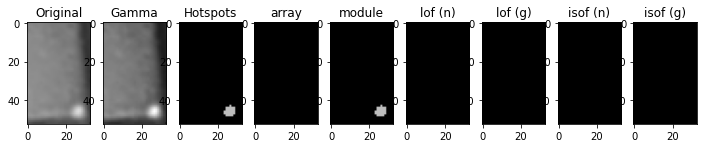

[-0.96217182 -0.99796884 -1.00704851 -1.         -1.00704851 -1.03433795
 -0.99622113 -0.9919069  -0.99796884 -1.0064173 ]
[-2.20627621]
[-0.47224582 -0.47673048 -0.46066006 -0.4614829  -0.46066006 -0.47494069
 -0.47625871 -0.47668307 -0.47673048 -0.47413482]
[-0.74125524]
[-1.07876927 -1.20616252 -1.00124335 -1.09510185 -1.00124335 -1.0537221
 -1.846619   -1.33219101 -1.23102635 -1.40257202]
[-2.20627621]
[-0.51917189 -0.55297075 -0.51531068 -0.5228251  -0.51531068 -0.48350154
 -0.68741742 -0.56467118 -0.55498089 -0.580157  ]
[-0.74125524]
446.jpg Normal [5.08482738]
[-1.03377389 -1.00432787 -0.98935407 -1.26150861 -0.99887039 -0.98691453
 -1.         -1.00700162 -3.46189178 -0.9969697 ]
[-2.40967508]
[-0.46611532 -0.47801607 -0.45535561 -0.53616573 -0.45766945 -0.45507397
 -0.45701178 -0.49088057 -0.72079006 -0.47455008]
[-0.78193502]
[-1.81937245 -0.99338498 -1.22645925 -1.0224173  -1.35043326 -1.02581908
 -1.03897791 -1.00670321 -2.02550027 -1.1276647 ]
[-2.40967508]
[-0.68767687 -

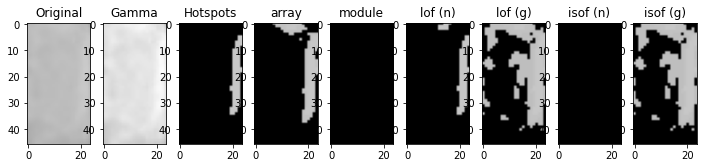

[-1.07688935 -1.01333647 -1.01982718 -1.00210703 -0.98634419 -1.00474183
 -1.03781016 -0.9721154  -0.98634419 -1.01706204]
[-2.20627621]
[-0.47627144 -0.47115022 -0.48272505 -0.47940178 -0.43948908 -0.46572654
 -0.46626767 -0.48510814 -0.43948908 -0.49236558]
[-0.74125524]
[-2.06092681 -1.24994972 -1.62516759 -1.11173675 -1.3555464  -1.5564105
 -1.7341074  -1.08687622 -1.33219101 -1.04095832]
[-2.20627621]
[-0.72002816 -0.56370676 -0.63551143 -0.51657696 -0.57164135 -0.61416127
 -0.66288699 -0.52678447 -0.56467118 -0.47488898]
[-0.74125524]
1850.jpg Normal [5.08482738]
[-1.03434343 -1.00735297 -0.99216249 -0.98223544 -1.01651826 -0.96223773
 -0.99430964 -0.99216249 -1.0963649  -1.01390737]
[-2.13603893]
[-0.4604587  -0.43030412 -0.47852919 -0.44359757 -0.49451769 -0.42837434
 -0.48770517 -0.47852919 -0.46962829 -0.45838866]
[-0.72720779]
[-1.04592408 -1.0443562  -1.06767597 -1.01813185 -1.40126611 -1.01680228
 -1.07716179 -1.06793337 -1.02106248 -1.02811676]
[-2.13603893]
[-0.51954246 

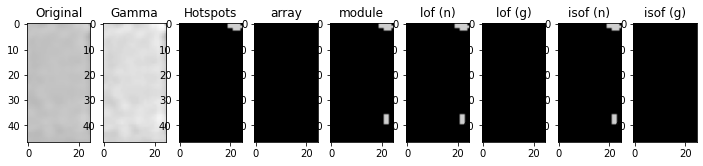

[-1.         -1.0023626  -0.98765652 -1.         -1.04967769 -1.
 -1.         -0.98064367 -1.         -0.96335357]
[-2.27146111]
[-0.46345273 -0.46649461 -0.45617686 -0.46345273 -0.45748665 -0.46968761
 -0.45732879 -0.47788692 -0.4539666  -0.4556014 ]
[-0.75429222]
[-2.52148604 -0.98594018 -1.14792264 -2.52148604 -1.44626168 -4.05344139
 -1.80162137 -1.         -2.07989936 -1.06905385]
[-2.27146111]
[-0.73046324 -0.45926966 -0.55226922 -0.73046324 -0.6268956  -0.75969795
 -0.65986214 -0.45914677 -0.70802262 -0.51320341]
[-0.75429222]
2395.jpg Normal [5.90828053]
[-0.99879165 -1.10421897 -1.58578233 -0.9754709  -1.06240895 -0.9754709
 -0.98876895 -1.11396424 -1.26810447 -0.99403825]
[-2.38974837]
[-0.44721977 -0.52479438 -0.60459976 -0.46238488 -0.48151237 -0.46238488
 -0.45833736 -0.51040287 -0.55612974 -0.48351622]
[-0.77794967]
[-1.59505683 -0.99935093 -1.01219708 -1.15418658 -1.03803557 -1.20102059
 -1.71833409 -0.98748238 -0.98676206 -1.15418658]
[-2.38974837]
[-0.64660106 -0.48851

[-1.38592542 -1.04277223 -0.96946472 -1.23659122 -0.96069407 -1.87507557
 -1.27722539 -1.04178939 -1.14143776 -1.        ]
[-2.31176438]
[-0.60018625 -0.52248163 -0.49345921 -0.55134906 -0.47853746 -0.73047879
 -0.56610635 -0.50647429 -0.51915294 -0.45630001]
[-0.76235288]
[-1.06645846 -0.97702063 -1.03405194 -1.0161067  -1.01018355 -1.29863886
 -1.01689732 -0.9994444  -0.97600786 -0.98885845]
[-2.31176438]
[-0.52940477 -0.50029201 -0.48673646 -0.53314036 -0.51179564 -0.59165315
 -0.52648144 -0.48091995 -0.496048   -0.43795241]
[-0.76235288]
2342.jpg Normal [6.48282626]
[-1.00735284 -1.06898591 -0.98948787 -1.06898591 -1.         -1.01643108
 -1.03634376 -0.99704615 -1.28498223 -0.99635871]
[-2.20387359]
[-0.44686708 -0.45940486 -0.46032843 -0.45940486 -0.44918975 -0.43354084
 -0.45449132 -0.45458239 -0.52647439 -0.4440264 ]
[-0.74077472]
[-2.13022567 -2.80592587 -1.24390037 -2.69818324 -1.71773328 -2.32801035
 -2.48423716 -3.19995605 -1.00915516 -1.8482435 ]
[-2.20387359]
[-0.720273  

[-1.18786477 -1.01323737 -1.03534576 -1.80336696 -1.01323737 -0.95178659
 -1.03534576 -3.30049399 -1.05406794 -1.05179437]
[-2.28287094]
[-0.52872637 -0.4594052  -0.48086623 -0.61289717 -0.4594052  -0.43582637
 -0.48086623 -0.71928506 -0.47348648 -0.48465309]
[-0.75657419]
[-1.01547295 -1.00992523 -1.04700062 -1.04919132 -1.00992523 -1.22656351
 -1.04745548 -1.47341362 -0.97034451 -0.99521668]
[-2.28287094]
[-0.47142494 -0.56093798 -0.51129275 -0.44617502 -0.56093798 -0.63298998
 -0.51351647 -0.57507511 -0.46073789 -0.47529214]
[-0.75657419]
136.jpg Normal [6.06556047]
[-0.99685772 -1.13721776 -2.15206133 -1.02479465 -0.98377404 -0.98070761
 -1.42966952 -1.02162266 -0.99685772 -0.99479418]
[-2.40967508]
[-0.46412294 -0.50413981 -0.64220774 -0.48026222 -0.46287971 -0.44494817
 -0.5659761  -0.49107988 -0.46412294 -0.46717418]
[-0.78193502]
[-1.04371909 -1.00288139 -1.0046911  -1.00166267 -0.98914165 -1.50347199
 -0.98322516 -1.00358456 -1.04371909 -0.99166037]
[-2.40967508]
[-0.52941636 

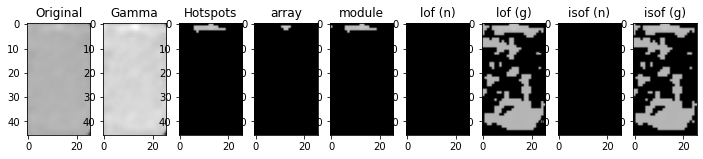

[-1.0279864  -1.00559727 -1.55528471 -0.96435736 -1.         -0.96435736
 -1.11640075 -1.0279864  -0.9811151  -1.        ]
[-2.40967508]
[-0.50204229 -0.48993262 -0.64290445 -0.47074543 -0.45125654 -0.47074543
 -0.5595     -0.50204229 -0.48258435 -0.47564191]
[-0.78193502]
[-1.02979027 -0.97478148 -1.58485652 -0.9935718  -1.         -0.9935718
 -1.1576884  -1.02979027 -0.9885498  -1.01563557]
[-2.40967508]
[-0.51151843 -0.47652127 -0.64081035 -0.48038322 -0.44242218 -0.48038322
 -0.54081303 -0.51151843 -0.48372753 -0.46796627]
[-0.78193502]
3504.jpg Normal [8.12222618]
[-1.00722239 -1.         -1.27200699 -1.02018319 -0.97574544 -1.12958735
 -1.05449053 -1.10562113 -1.03104516 -1.05733419]
[-2.21643155]
[-0.52149784 -0.44445434 -0.60046894 -0.52731048 -0.47309757 -0.55270234
 -0.50505295 -0.5476469  -0.5085854  -0.47803564]
[-0.74328631]
[-1.14094863 -1.01483755 -1.58717017 -1.17509502 -1.02651245 -1.34927708
 -1.00207671 -1.27046587 -1.01063544 -1.00201857]
[-2.21643155]
[-0.56908956 

[-0.99360984 -1.13721776 -1.00700162 -1.         -1.01045846 -1.26150861
 -0.99360984 -0.97995977 -0.99479418 -1.76665173]
[-2.40967508]
[-0.47257215 -0.50413981 -0.49088057 -0.45125654 -0.48208408 -0.53616573
 -0.47257215 -0.45810442 -0.46717418 -0.59417634]
[-0.78193502]
[-1.05007064 -1.01002505 -1.01168378 -1.62554878 -0.99338498 -1.00991211
 -1.10267887 -1.24737731 -1.03657623 -0.99575604]
[-2.40967508]
[-0.52838643 -0.46817747 -0.48795188 -0.66043491 -0.48991971 -0.47075458
 -0.53894946 -0.57254753 -0.49650815 -0.45210484]
[-0.78193502]
863.jpg Normal [8.12222618]
[-0.99403825 -1.09220824 -0.98876895 -1.19503096 -1.00692007 -0.99211622
 -1.03240782 -0.99403825 -1.10385803 -1.03240782]
[-2.38974837]
[-0.48351622 -0.49849521 -0.45833736 -0.52168744 -0.46549779 -0.4672442
 -0.48749893 -0.48351622 -0.5193893  -0.48749893]
[-0.77794967]
[-1.39275953 -1.01366777 -2.19299348 -1.02202434 -1.25543767 -1.67556443
 -1.10876664 -1.3379638  -1.02565561 -1.10876664]
[-2.38974837]
[-0.5936398  -

[-1.02062743 -1.02706983 -1.01419004 -0.96454904 -1.02258631 -1.061096
 -0.98808341 -0.99235863 -1.28357127 -1.02581596]
[-2.38974837]
[-0.45450445 -0.48066359 -0.467769   -0.44375194 -0.48393507 -0.52143422
 -0.45009942 -0.47048433 -0.52964006 -0.50187119]
[-0.77794967]
[-1.01600159 -1.25543767 -0.98892591 -0.99811989 -1.20102059 -1.51958095
 -0.99904271 -1.04476871 -1.98166103 -1.30947815]
[-2.38974837]
[-0.52164406 -0.56264597 -0.44776592 -0.45446684 -0.55866125 -0.63008011
 -0.49048619 -0.52709537 -0.68822778 -0.55367281]
[-0.77794967]
3272.jpg Normal [7.75797486]
[-1.10926739 -1.01051509 -1.02522676 -1.0048405  -1.34649037 -1.04363232
 -0.98302662 -1.         -0.99178899 -1.01101562]
[-2.23087184]
[-0.43955837 -0.43110171 -0.42205833 -0.43368439 -0.53462321 -0.42892165
 -0.423877   -0.43773243 -0.45018138 -0.44205475]
[-0.74617437]
[-5.54632632 -3.04443203 -4.83721187 -5.91000226 -1.01171799 -5.09789994
 -3.9746884  -4.05943884 -2.10665657 -6.82187409]
[-2.23087184]
[-0.7748599  -

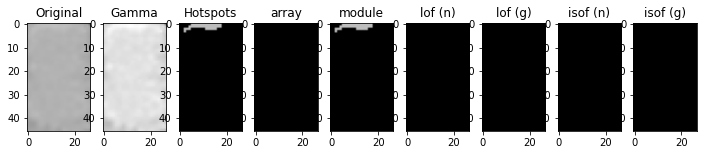

[-1.01626851 -0.9975945  -1.05360143 -1.05360143 -1.         -1.03038861
 -1.02271591 -1.         -0.99751301 -1.00202394]
[-2.31176438]
[-0.50215079 -0.44682392 -0.46053321 -0.46053321 -0.43711451 -0.43139838
 -0.49803286 -0.4524296  -0.45426749 -0.47258473]
[-0.76235288]
[-0.99840183 -1.03405194 -1.00497703 -1.00385398 -1.09172649 -0.97502914
 -0.98885845 -1.0063436  -0.98169011 -1.0161067 ]
[-2.31176438]
[-0.43634126 -0.48673646 -0.46180704 -0.47054061 -0.51175162 -0.49943963
 -0.43795241 -0.47130209 -0.49566031 -0.53314036]
[-0.76235288]
2636.jpg Normal [6.48282626]
[-1.00434887 -1.1356993  -1.03509693 -1.09268165 -1.5740404  -1.05379655
 -1.0632646  -1.0257631  -1.01366052 -0.999702  ]
[-2.15913831]
[-0.43384014 -0.5286533  -0.45203832 -0.51725478 -0.59819882 -0.44808738
 -0.46191344 -0.45254558 -0.47626988 -0.46115597]
[-0.73182766]
[-1.07385785 -1.02858109 -1.12890699 -0.99481837 -1.00395762 -1.10359614
 -1.11764684 -1.00325268 -1.43070765 -1.01207546]
[-2.15913831]
[-0.51568902

[-0.98064006 -0.98302662 -0.99348659 -1.04363232 -1.00582785 -1.07610745
 -1.01228992 -0.97151026 -1.10926739 -0.99667738]
[-2.23087184]
[-0.43198115 -0.423877   -0.42868412 -0.42892165 -0.44714047 -0.44090853
 -0.43025976 -0.42635408 -0.43955837 -0.46147432]
[-0.74617437]
[-6.274751   -4.05943884 -4.48962779 -5.27598314 -7.09543564 -5.45621193
 -3.46908456 -4.66341983 -5.7276279  -1.96091304]
[-2.23087184]
[-0.7748599  -0.74959234 -0.75570308 -0.77119876 -0.77959263 -0.7748599
 -0.73951738 -0.75672637 -0.7748599  -0.69723291]
[-0.74617437]
126.jpg Normal [5.38110963]
[-1.08925576 -1.03611828 -1.09029005 -0.97188937 -1.05766916 -1.06475162
 -0.97962899 -1.10403973 -0.97130016 -1.00180342]
[-1.99727303]
[-0.46496673 -0.44893097 -0.5184474  -0.44825822 -0.47226491 -0.45020339
 -0.45889428 -0.52241128 -0.45854577 -0.42536595]
[-0.69945461]
[-1.11949009 -1.24803461 -1.01460018 -1.13622032 -1.15878917 -1.20791026
 -1.11675729 -1.03922225 -1.08116752 -1.47206226]
[-1.99727303]
[-0.54640621 -

[-1.02430226 -1.0963649  -0.96223773 -1.02430226 -1.03434343 -0.99216249
 -0.98413746 -1.01390737 -0.99430964 -1.02387249]
[-2.13603893]
[-0.47624483 -0.46962829 -0.42837434 -0.47624483 -0.4604587  -0.47852919
 -0.46441748 -0.45838866 -0.48770517 -0.51825611]
[-0.72720779]
[-1.4562948  -1.07978635 -1.04747985 -1.4562948  -1.12335087 -1.2256501
 -1.25863251 -1.02299749 -1.30496592 -1.72161166]
[-2.13603893]
[-0.64111844 -0.5356672  -0.53806167 -0.64111844 -0.53497576 -0.59992686
 -0.60484529 -0.49300746 -0.60961678 -0.68445984]
[-0.72720779]
3716.jpg Normal [4.32552604]
[-1.02254258 -0.99667738 -1.00681829 -0.99348659 -0.99150494 -0.99076402
 -1.05149068 -0.96981128 -1.01051509 -1.01228992]
[-2.23087184]
[-0.44278191 -0.46147432 -0.44836449 -0.42868412 -0.43674408 -0.45741039
 -0.47020248 -0.44979008 -0.43110171 -0.43025976]
[-0.74617437]
[-5.45621193 -4.05943884 -4.92410789 -7.00424846 -6.09237663 -4.2310853
 -3.21429304 -4.83721187 -5.54632632 -6.00118945]
[-2.23087184]
[-0.7748599  -

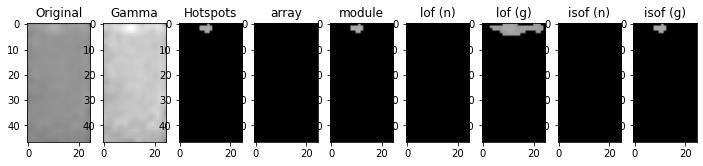

[-0.99879165 -1.00821342 -0.96454904 -1.02902153 -1.01419004 -1.00102214
 -0.98971376 -0.98136488 -1.00981454 -1.00862017]
[-2.38974837]
[-0.44721977 -0.436739   -0.44375194 -0.46058932 -0.467769   -0.44197272
 -0.44379918 -0.4334102  -0.48096108 -0.44546302]
[-0.77794967]
[-1.01974074 -1.02383534 -1.10876664 -1.51958095 -1.00427408 -1.03763755
 -1.05266146 -0.99778034 -1.01789295 -0.98708821]
[-2.38974837]
[-0.49332969 -0.51568705 -0.54695292 -0.63008011 -0.47849202 -0.51265092
 -0.52076427 -0.51190645 -0.46257461 -0.49066888]
[-0.77794967]
4045.jpg Normal [7.75797486]
[-1.04699921 -0.9926091  -1.01968892 -1.00398805 -0.97822186 -1.02186384
 -1.07098448 -1.02737221 -0.97681526 -1.03095789]
[-2.22180258]
[-0.46311283 -0.42949715 -0.48182809 -0.45700143 -0.43136166 -0.46816494
 -0.44167264 -0.46190887 -0.43874824 -0.44107954]
[-0.74436052]
[-1.30936611 -0.97881265 -1.76951097 -1.23636194 -1.00947045 -1.39204479
 -1.04080036 -1.54203366 -1.10132463 -1.02528139]
[-2.22180258]
[-0.55773557

[-0.96967788 -1.05475799 -1.01018028 -1.00962024 -0.98377296 -1.02902153
 -1.00962024 -1.00773589 -1.03485208 -1.03859377]
[-2.38974837]
[-0.44345879 -0.47199394 -0.45399929 -0.44806676 -0.4519415  -0.46058932
 -0.44806676 -0.45893088 -0.47391337 -0.46109394]
[-0.77794967]
[-1.39275953 -1.84832032 -1.03659595 -1.55731889 -1.2830837  -1.17845296
 -1.55731889 -2.14016037 -0.99719647 -1.63279476]
[-2.38974837]
[-0.5936398  -0.67734576 -0.52410943 -0.63906507 -0.56124402 -0.54809906
 -0.63906507 -0.71727999 -0.46249561 -0.65174283]
[-0.77794967]
4910.jpg Normal [7.75797486]
[-1.09268165 -1.00390767 -1.01366052 -1.07727605 -0.96419272 -0.99180383
 -1.         -1.00274195 -1.00434887 -0.96339497]
[-2.15913831]
[-0.51725478 -0.46506528 -0.47626988 -0.48667117 -0.45801042 -0.44196225
 -0.46919422 -0.46626025 -0.43384014 -0.42902949]
[-0.73182766]
[-0.98598129 -1.17419638 -1.06709227 -1.28831817 -0.99283716 -1.09024415
 -1.07573481 -1.15122732 -1.00439187 -1.03229011]
[-2.15913831]
[-0.46486536

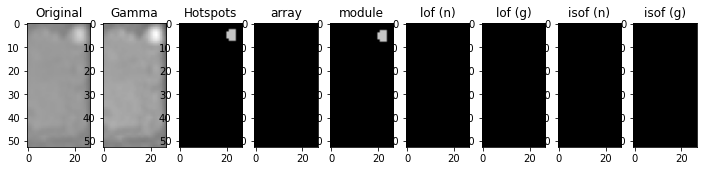

[-2.15902031 -1.02191177 -1.03486933 -1.33183854 -5.15758829 -1.82890648
 -1.         -1.25344022 -1.10014299 -1.03604212]
[-2.27146111]
[-0.70908858 -0.47490283 -0.50288268 -0.58945874 -0.77621641 -0.65894938
 -0.4784653  -0.56096993 -0.51832513 -0.45450427]
[-0.75429222]
[-1.21226423 -1.         -1.30780552 -1.06161825 -3.50157039 -1.11195025
 -1.01705162 -1.04063837 -0.9923955  -0.98700631]
[-2.27146111]
[-0.54856115 -0.45654598 -0.54827205 -0.50350239 -0.74796743 -0.52970266
 -0.4643929  -0.49939328 -0.45626415 -0.46120084]
[-0.75429222]
4086.jpg Single-Hotspot [5.90828053]


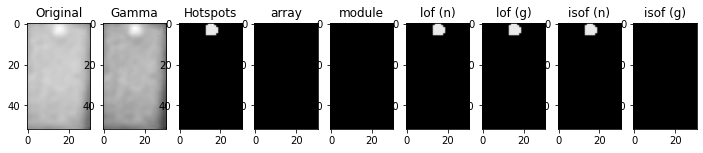

[-1.00735284 -1.87968733 -1.08997594 -1.50512001 -0.98948787 -1.00252973
 -3.10326587 -0.98658116 -0.97345766 -0.9905135 ]
[-2.20387359]
[-0.44686708 -0.62369578 -0.48461898 -0.64080272 -0.46032843 -0.45978672
 -0.73975037 -0.45452637 -0.42648923 -0.4378504 ]
[-0.74077472]
[-1.05996961 -1.63968858 -1.03532635 -1.9865687  -1.         -0.99307153
 -2.66674009 -1.03008794 -1.03849062 -1.05756182]
[-2.20387359]
[-0.46891069 -0.60699441 -0.4844669  -0.71348264 -0.45033499 -0.43427321
 -0.73005993 -0.45331601 -0.47266707 -0.46443334]
[-0.74077472]
3931.jpg Single-Hotspot [5.05677453]


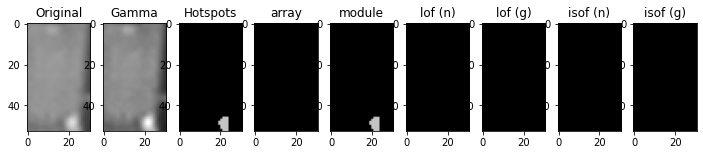

[-1.0384673  -1.03495349 -1.02971448 -1.12370491 -1.00697975 -0.99838882
 -1.02217115 -0.99838882 -1.02971448 -1.        ]
[-2.28287094]
[-0.47333477 -0.45255025 -0.46230262 -0.51628831 -0.48109358 -0.47831692
 -0.45375344 -0.47831692 -0.46230262 -0.46548595]
[-0.75657419]
[-1.09791005 -1.00719241 -1.07971707 -0.9672432  -1.24737347 -1.00804201
 -1.0038774  -1.00804201 -1.04304068 -1.03893411]
[-2.28287094]
[-0.56575119 -0.48494585 -0.54457088 -0.44493978 -0.63797045 -0.5541315
 -0.48190046 -0.5541315  -0.553757   -0.50635198]
[-0.75657419]
4092.jpg Normal [6.06556047]
[-1.         -1.05504799 -1.03038861 -1.03038861 -1.00559203 -1.05504799
 -1.03038861 -0.97763738 -1.00559203 -0.9975945 ]
[-2.31176438]
[-0.45795628 -0.48057999 -0.43139838 -0.43139838 -0.46881095 -0.48057999
 -0.43139838 -0.46286726 -0.4884013  -0.44682392]
[-0.76235288]
[-1.07861071 -1.11553375 -1.0092608  -0.99365525 -1.43624298 -1.08286551
 -1.0092608  -1.2143146  -1.32730639 -0.97406513]
[-2.31176438]
[-0.52529404 

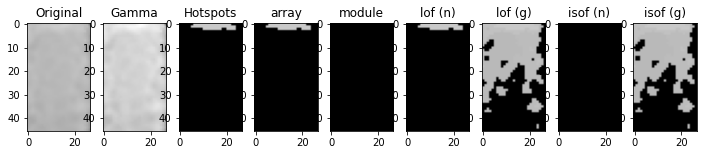

[-1.03611828 -1.0593377  -0.97729146 -1.00706283 -1.00180342 -1.15410799
 -0.97744836 -1.06181692 -0.97405199 -1.03573899]
[-1.99727303]
[-0.44893097 -0.44032769 -0.4515023  -0.46191263 -0.42536595 -0.51492562
 -0.45162935 -0.46503231 -0.42727774 -0.45863171]
[-0.69945461]
[-1.17481831 -1.11651525 -1.03100129 -1.31658038 -1.08230418 -0.99602512
 -1.02360224 -0.97110805 -1.11949009 -1.13120601]
[-1.99727303]
[-0.53725204 -0.58197389 -0.46313412 -0.63065184 -0.54373081 -0.45266653
 -0.49224256 -0.4583132  -0.54640621 -0.50371315]
[-0.69945461]
3104.jpg Normal [3.14248365]
[-0.9858996  -0.98377419 -1.03382411 -1.08524845 -1.05338368 -0.99684189
 -1.16308552 -1.0235379  -1.03218381 -1.04502197]
[-2.19250165]
[-0.51706904 -0.4527561  -0.45729654 -0.53783756 -0.45999467 -0.51617762
 -0.56121963 -0.49969489 -0.50918758 -0.52451901]
[-0.73850033]
[-1.55930723 -0.99332231 -0.99082378 -2.13114332 -1.01009084 -1.34607798
 -2.38477409 -1.15679714 -1.84849547 -1.89040903]
[-2.19250165]
[-0.68205306

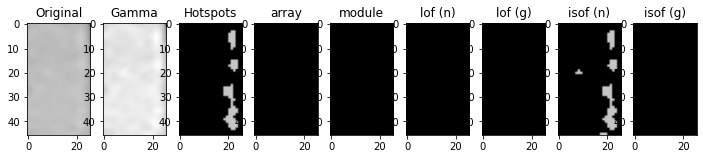

[-1.         -1.00670069 -1.17160362 -1.04005741 -1.         -0.98070761
 -1.05351912 -1.         -1.         -1.        ]
[-2.40967508]
[-0.4676079  -0.46996511 -0.50765041 -0.46992662 -0.48324166 -0.44494817
 -0.50051361 -0.45783851 -0.47564191 -0.47150582]
[-0.78193502]
[-0.97085769 -0.98322516 -1.0046911  -1.00670321 -1.02994278 -1.02343269
 -1.54416426 -1.00288139 -1.01168378 -0.99166037]
[-2.40967508]
[-0.47351603 -0.45147915 -0.47354467 -0.47135724 -0.50966438 -0.487109
 -0.63018379 -0.46224447 -0.48795188 -0.49114106]
[-0.78193502]
4657.jpg Normal [8.12222618]
[-0.97713008 -1.         -1.30998515 -1.82389267 -0.99771102 -1.07688935
 -0.96217182 -0.98046819 -1.02287172 -1.01876199]
[-2.20627621]
[-0.44838885 -0.4614829  -0.55544569 -0.6287679  -0.46864331 -0.47627144
 -0.47224582 -0.48042625 -0.49636246 -0.48080054]
[-0.74125524]
[-1.01975986 -1.07876927 -0.98518801 -1.4576923  -1.06987397 -1.0537221
 -1.01617938 -0.9931697  -1.52337138 -1.01146092]
[-2.20627621]
[-0.46908402 -0

[-1.20677488 -1.04984037 -1.02387249 -1.81988578 -1.04583506 -1.15088614
 -1.02819118 -1.39866593 -1.07020007 -1.26005939]
[-2.13603893]
[-0.57669405 -0.52707165 -0.51825611 -0.69401754 -0.53245403 -0.5220204
 -0.49103506 -0.60798933 -0.45134471 -0.59544763]
[-0.72720779]
[-1.07716179 -1.02198444 -1.0275022  -1.48380914 -1.02106248 -1.06793337
 -1.02811676 -1.2256501  -0.9755446  -1.12335087]
[-2.13603893]
[-0.5309053  -0.51303301 -0.49331234 -0.64544528 -0.50721097 -0.55166735
 -0.4940972  -0.59992686 -0.44301184 -0.53497576]
[-0.72720779]
3879.jpg Normal [4.32552604]
[-0.97041794 -1.04352095 -0.96028294 -1.03224547 -0.96028294 -0.97744836
 -1.02584944 -1.3075653  -1.12228233 -0.97453728]
[-1.99727303]
[-0.45185621 -0.44053827 -0.43559836 -0.49041934 -0.43559836 -0.45162935
 -0.46827222 -0.5625489  -0.46434828 -0.43850517]
[-0.69945461]
[-1.29819006 -1.12279186 -1.09854555 -0.95493348 -1.11259678 -1.13838864
 -1.00554571 -1.07644431 -1.13622032 -1.11675729]
[-1.99727303]
[-0.6196762  

[-1.00692007 -0.97676851 -1.31098296 -1.00121729 -0.99227993 -1.14657947
 -1.03240782 -1.01487099 -1.00102214 -1.09220824]
[-2.38974837]
[-0.46549779 -0.44646405 -0.5810263  -0.45296171 -0.46082311 -0.52616273
 -0.48749893 -0.47939962 -0.44197272 -0.49849521]
[-0.77794967]
[-0.98708821 -1.25543767 -0.99719647 -1.06429138 -1.02565561 -1.02570322
 -1.00220122 -1.02867497 -1.71833409 -0.99343941]
[-2.38974837]
[-0.49066888 -0.56264597 -0.46249561 -0.53321397 -0.50443958 -0.46154613
 -0.47592013 -0.50192    -0.65996773 -0.46459019]
[-0.77794967]
1277.jpg Normal [7.75797486]
[-0.98610474 -1.04313371 -1.01737403 -0.9811151  -1.38635546 -1.03377389
 -0.96652526 -1.         -0.96435736 -0.99427437]
[-2.40967508]
[-0.48597027 -0.5072021  -0.47518143 -0.48258435 -0.55225493 -0.46611532
 -0.48004675 -0.47564191 -0.47074543 -0.4944571 ]
[-0.78193502]
[-1.1576884  -1.58485652 -1.03493498 -1.26829538 -1.02391084 -1.01136968
 -1.1276647  -1.02581908 -1.2950253  -1.389962  ]
[-2.40967508]
[-0.54081303

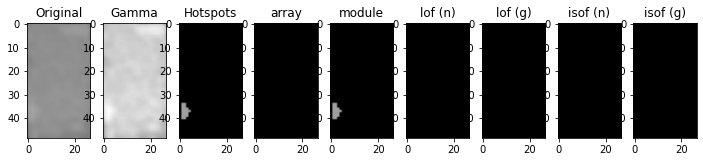

[-1.02717997 -0.9811151  -1.34787848 -1.02227679 -0.98377404 -1.01737403
 -1.11640075 -1.02515603 -1.00935878 -1.03812768]
[-2.40967508]
[-0.51177994 -0.48258435 -0.60434499 -0.50035261 -0.46287971 -0.47518143
 -0.5595     -0.51064006 -0.4681447  -0.49865284]
[-0.78193502]
[-1.1576884  -1.02562868 -1.87184405 -1.02979027 -0.99839936 -0.99338498
 -1.389962   -1.03359127 -0.99342295 -1.10267887]
[-2.40967508]
[-0.54081303 -0.51308412 -0.69234537 -0.51151843 -0.45558639 -0.48991971
 -0.59605933 -0.53786938 -0.48498583 -0.53894946]
[-0.78193502]
3312.jpg Normal [8.12222618]
[-0.99182411 -0.97763738 -1.07201569 -1.00184234 -1.0116564  -1.04178939
 -1.0229952  -0.98427768 -1.0229952  -1.0155684 ]
[-2.31176438]
[-0.47798505 -0.46286726 -0.51279953 -0.49730243 -0.51410794 -0.50647429
 -0.50291608 -0.48352532 -0.50291608 -0.50122942]
[-0.76235288]
[-0.97148464 -1.0063436  -1.02929452 -1.03860255 -1.03785317 -1.01018355
 -0.9683623  -1.00018764 -0.96165947 -1.09172649]
[-2.31176438]
[-0.49497032

[-0.97037079 -1.04277223 -1.03818895 -1.23659122 -0.97037079 -0.97071386
 -1.04277223 -0.95677549 -1.04178939 -1.00184234]
[-2.31176438]
[-0.48704154 -0.52248163 -0.48752557 -0.55134906 -0.48704154 -0.49650614
 -0.52248163 -0.48135671 -0.50647429 -0.49730243]
[-0.76235288]
[-0.99365525 -1.14821254 -0.98410458 -1.35597391 -0.99365525 -0.97805435
 -1.14821254 -1.0161067  -1.02929452 -1.01619141]
[-2.31176438]
[-0.50428168 -0.53570311 -0.47716131 -0.60634806 -0.50428168 -0.5008562
 -0.53570311 -0.53314036 -0.48589064 -0.53028274]
[-0.76235288]
4327.jpg Normal [6.48282626]
[-1.         -0.97374362 -1.00911541 -1.         -1.         -1.00642817
 -1.         -1.         -1.01523727 -1.02384157]
[-2.27146111]
[-0.44640342 -0.43976255 -0.44780459 -0.45732879 -0.47746517 -0.45007228
 -0.4657494  -0.46345273 -0.45527382 -0.44684643]
[-0.75429222]
[-3.30228364 -1.70494263 -2.07989936 -3.16942581 -3.98190256 -1.25961254
 -4.63469441 -4.19779654 -2.97141654 -2.52148604]
[-2.27146111]
[-0.74292386 

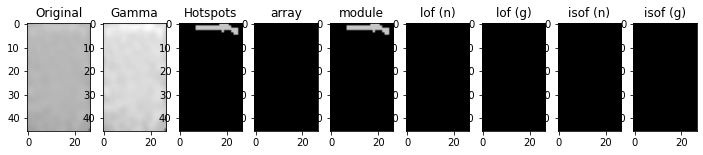

[-0.99076402 -1.04363232 -1.39125399 -1.01228992 -0.99348659 -0.98064006
 -1.00681829 -1.06259693 -1.10926739 -1.        ]
[-2.23087184]
[-0.45741039 -0.42892165 -0.5417508  -0.43025976 -0.42868412 -0.43198115
 -0.44836449 -0.46682853 -0.43955837 -0.43773243]
[-0.74617437]
[-2.40256012 -5.54632632 -0.99561944 -3.80626031 -4.92410789 -6.63949973
 -3.12936254 -1.39532293 -6.00118945 -4.57652381]
[-2.23087184]
[-0.71977188 -0.7748599  -0.4965031  -0.74655552 -0.76444533 -0.77906535
 -0.73403399 -0.59876884 -0.7748599  -0.75570308]
[-0.74617437]
1288.jpg Normal [5.38110963]
[-1.03928313 -1.00450244 -1.1366653  -1.03029903 -1.01152792 -4.92458868
 -1.06776183 -1.06484554 -1.01152792 -1.02696628]
[-2.13603893]
[-0.51161329 -0.44992073 -0.5249277  -0.49373505 -0.48634906 -0.79213272
 -0.46730171 -0.47438499 -0.48634906 -0.50973786]
[-0.72720779]
[-1.42878046 -1.02757148 -1.03752891 -1.25863251 -1.10985843 -3.88109423
 -1.05969931 -1.02299749 -1.10985843 -1.30496592]
[-2.13603893]
[-0.63817875

[-1.         -1.11989165 -1.07840566 -1.02649234 -0.95108464 -1.
 -4.49916942 -0.99849251 -1.03063337 -1.00470039]
[-2.25378984]
[-0.4284787  -0.45321842 -0.43987312 -0.46638673 -0.42176202 -0.4382744
 -0.77959263 -0.46631325 -0.48765159 -0.43423066]
[-0.75075797]
[-1.06216755 -1.12137742 -1.07742949 -1.18152264 -1.02033488 -1.03831476
 -2.83686274 -1.42617646 -1.13746659 -1.04280531]
[-2.25378984]
[-0.51985207 -0.56768802 -0.53906444 -0.58487596 -0.53031028 -0.53825888
 -0.72676634 -0.66739386 -0.47220443 -0.54616818]
[-0.75075797]
735.jpg Normal [5.67270035]
[-1.01164558 -1.         -1.         -1.01637051 -0.98902635 -0.97687123
 -1.         -1.         -2.42310429 -0.9994015 ]
[-2.21643155]
[-0.46801054 -0.43923417 -0.44521992 -0.45823381 -0.45710579 -0.44005631
 -0.43530344 -0.44445434 -0.65539666 -0.47433039]
[-0.74328631]
[-1.44560189 -1.02433236 -1.0412715  -1.00433643 -1.17509502 -1.02651245
 -1.0168348  -1.02077429 -1.03653124 -1.16136338]
[-2.21643155]
[-0.65399709 -0.505766

[-0.9741719  -1.05733419 -0.98902635 -1.01125137 -1.         -1.04683098
 -1.01312613 -0.97574544 -0.99977797 -1.01164558]
[-2.21643155]
[-0.4719153  -0.47803564 -0.45710579 -0.48337336 -0.4348481  -0.4867577
 -0.4711376  -0.47309757 -0.47788747 -0.46801054]
[-0.74328631]
[-1.09645173 -1.03982062 -0.97743805 -1.00676278 -1.02271002 -1.58717017
 -1.02495367 -1.14094863 -1.27046587 -1.02651245]
[-2.21643155]
[-0.54920892 -0.51216147 -0.47918287 -0.53961429 -0.46896333 -0.68290789
 -0.52390391 -0.56908956 -0.61262778 -0.51492918]
[-0.74328631]
4454.jpg Normal [5.20512963]
[-1.03486933 -1.44929372 -1.34324264 -1.18014753 -1.72950236 -1.28773336
 -1.08049601 -1.21209224 -1.48442459 -2.06969819]
[-2.27146111]
[-0.50288268 -0.55857602 -0.56478996 -0.5240176  -0.60618246 -0.54577223
 -0.50719539 -0.5243248  -0.57770164 -0.63980532]
[-0.75429222]
[-4.48906179 -1.80162137 -2.45616256 -3.43514147 -1.1894691  -2.71208827
 -3.91036372 -3.10299689 -1.75066906 -1.04325375]
[-2.27146111]
[-0.76900654 

[-0.99100034 -1.00146527 -1.02138915 -1.01391263 -1.         -0.99439591
 -1.35517412 -0.99767337 -1.0039032  -1.00702539]
[-2.36793348]
[-0.49675731 -0.48718663 -0.52824419 -0.4655083  -0.44060552 -0.44855133
 -0.5973507  -0.52678755 -0.45571292 -0.45618614]
[-0.7735867]
[-0.98030528 -0.99154767 -1.04355547 -1.00924388 -1.         -1.00446451
 -1.35107757 -1.00380943 -1.00311526 -1.00184117]
[-2.36793348]
[-0.5030398  -0.47787559 -0.53129948 -0.46086129 -0.45847258 -0.46424514
 -0.59947294 -0.54009175 -0.46971817 -0.46946254]
[-0.7735867]
3850.jpg Normal [7.37791222]
[-1.03800687 -1.80338952 -2.80040629 -1.2525808  -1.40674545 -3.51191016
 -1.98336793 -1.03800687 -2.41120758 -1.62365464]
[-2.31176438]
[-0.478265   -0.61782099 -0.7072919  -0.55364794 -0.56739769 -0.79342797
 -0.64175908 -0.478265   -0.69778548 -0.60063698]
[-0.76235288]
[-1.11553375 -1.06371779 -1.02294449 -0.9683623  -1.06519796 -1.19653565
 -0.99575005 -1.08286551 -0.99195021 -0.99812074]
[-2.31176438]
[-0.54145911 -

[-1.12958735 -1.02437712 -1.25896306 -1.01125137 -1.00722239 -1.16298895
 -0.99580346 -1.48737325 -1.02732927 -1.00463296]
[-2.21643155]
[-0.55270234 -0.46881904 -0.52482718 -0.48337336 -0.52149784 -0.57715537
 -0.43862233 -0.65268955 -0.4862325  -0.5188637 ]
[-0.74328631]
[-1.05742925 -0.97934976 -1.32434316 -1.00201857 -1.01063544 -1.09645173
 -0.96944277 -1.34927708 -0.99680018 -1.02433236]
[-2.21643155]
[-0.54064533 -0.4742178  -0.54844374 -0.47366039 -0.53358975 -0.54920892
 -0.45319257 -0.63060897 -0.50291463 -0.50576697]
[-0.74328631]
3878.jpg Normal [5.20512963]
[-1.06916153 -0.98852696 -1.05856006 -0.92893047 -1.0092624  -1.06119545
 -1.04231443 -0.99268082 -1.1750191  -1.03058541]
[-2.06021062]
[-0.49215887 -0.45488864 -0.48972158 -0.42165045 -0.45453936 -0.51751201
 -0.48467062 -0.44925523 -0.54654815 -0.48308157]
[-0.71204212]
[-1.22180729 -1.04812025 -1.20138194 -0.97918447 -1.10791021 -1.29797866
 -1.18009754 -0.98442574 -1.61068136 -1.13150254]
[-2.06021062]
[-0.5598287 

[-1.00234975 -0.99536361 -1.0366043  -1.02435218 -1.02435218 -0.98311761
 -0.99536361 -1.02087943 -1.00542103 -0.98064006]
[-2.23087184]
[-0.44483036 -0.46937348 -0.47858691 -0.46233613 -0.46233613 -0.48338168
 -0.46937348 -0.52077737 -0.4656312  -0.43198115]
[-0.74617437]
[-2.56315915 -5.36609753 -3.64003443 -4.14526207 -4.2310853  -5.91000226
 -5.45621193 -6.82187409 -4.48962779 -2.25240011]
[-2.23087184]
[-0.72711389 -0.77119876 -0.74453782 -0.75111537 -0.75111537 -0.7748599
 -0.7748599  -0.77959263 -0.75570308 -0.71409878]
[-0.74617437]
5206.jpg Normal [5.38110963]
[-1.00657486 -1.02138915 -0.99100034 -1.01391263 -1.35517412 -1.
 -2.61621974 -1.01313802 -1.24706906 -1.54049708]
[-2.36793348]
[-0.48248731 -0.52824419 -0.49675731 -0.4655083  -0.5973507  -0.44060552
 -0.71060932 -0.4854785  -0.59780356 -0.649655  ]
[-0.7735867]
[-1.05327613 -0.98871792 -0.99699781 -1.01632653 -1.06362155 -0.98116581
 -2.5246321  -1.01195546 -1.0173707  -1.16979224]
[-2.36793348]
[-0.50214792 -0.499827

[-0.99630529 -1.         -0.98160972 -0.98658116 -1.         -0.97345766
 -1.         -0.98948787 -1.04214615 -1.01430973]
[-2.20387359]
[-0.46496065 -0.44220963 -0.45970733 -0.45452637 -0.43819461 -0.42648923
 -0.43534455 -0.46032843 -0.47931898 -0.45873029]
[-0.74077472]
[-1.8943519  -3.14300638 -2.22873322 -1.26420225 -2.69818324 -3.74020837
 -2.91520768 -2.37803372 -1.05903175 -1.55370578]
[-2.20387359]
[-0.70225263 -0.76608688 -0.7345568  -0.5788303  -0.7536418  -0.76764343
 -0.76184458 -0.74409032 -0.52348337 -0.62630214]
[-0.74077472]
319.jpg Normal [5.05677453]
[-1.45757602 -1.00657486 -1.00146527 -1.05784149 -1.22526156 -1.0150671
 -1.00731397 -1.03810765 -1.02182896 -1.17248993]
[-2.36793348]
[-0.59306873 -0.48248731 -0.48718663 -0.51148437 -0.53081035 -0.48763594
 -0.49979487 -0.47000599 -0.48914261 -0.50579233]
[-0.7735867]
[-1.00816327 -0.98871792 -0.99102541 -1.00446451 -0.98539048 -1.00589401
 -1.03122663 -1.08712537 -1.0173707  -0.99053014]
[-2.36793348]
[-0.45137759 -0

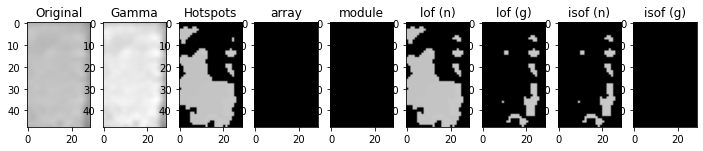

[-1.04321535 -0.98214279 -1.00482859 -1.03950321 -1.06157645 -1.00343092
 -0.98214279 -1.01337639 -1.05457221 -1.00343092]
[-2.19250165]
[-0.48840073 -0.45182918 -0.45923326 -0.50235734 -0.48942969 -0.45945272
 -0.45182918 -0.44719955 -0.49780425 -0.45945272]
[-0.73850033]
[-2.03334501 -1.4105935  -1.09177291 -2.27945284 -1.01272595 -1.72275479
 -1.4105935  -1.80658191 -2.70718609 -1.72275479]
[-2.19250165]
[-0.74130154 -0.64686637 -0.56811448 -0.75508599 -0.45146494 -0.69556778
 -0.64686637 -0.70218765 -0.76589107 -0.69556778]
[-0.73850033]
4939.jpg Normal [4.92608216]
[-0.98075122 -1.01642022 -0.97818143 -1.00542103 -1.04620271 -1.01617638
 -1.10535618 -0.97657185 -0.98311761 -1.05125361]
[-2.23087184]
[-0.48550489 -0.46478528 -0.41642753 -0.4656312  -0.47781471 -0.48678355
 -0.52291731 -0.4477336  -0.48338168 -0.45727662]
[-0.74617437]
[-5.09789994 -3.38415406 -1.24860759 -3.9746884  -1.01429946 -4.31690853
 -6.63949973 -2.03378481 -5.27598314 -2.71995394]
[-2.23087184]
[-0.76807441

[-0.97843234 -1.02083026 -1.02978257 -1.         -1.0118442  -1.00920171
 -0.9741719  -1.10562113 -1.0003814  -0.9994015 ]
[-2.21643155]
[-0.48214217 -0.49826268 -0.45550633 -0.44445434 -0.49623853 -0.47193939
 -0.4719153  -0.5476469  -0.47799292 -0.47433039]
[-0.74328631]
[-0.99680018 -1.0168348  -1.03076693 -1.00729144 -1.00676278 -1.00719002
 -0.99767745 -1.27046587 -1.03527837 -1.01442704]
[-2.21643155]
[-0.50291463 -0.53469372 -0.50618855 -0.46966308 -0.53961429 -0.49075033
 -0.49786242 -0.61262778 -0.51022342 -0.47004184]
[-0.74328631]
4050.jpg Normal [5.20512963]
[-1.02652984 -0.98843119 -1.00104348 -0.99461714 -1.0501517  -1.13720811
 -0.97028225 -1.03689819 -1.21083273 -2.67030545]
[-2.09918122]
[-0.45989146 -0.47154001 -0.42402517 -0.49578053 -0.46202    -0.48326154
 -0.4235945  -0.49360568 -0.52513457 -0.67417531]
[-0.71983624]
[-1.65773704 -1.24002208 -2.29340383 -1.12797072 -1.7119547  -1.00083192
 -2.09904757 -1.07672357 -1.03457358 -1.1479901 ]
[-2.09918122]
[-0.61118295

[-0.98575499 -1.11989165 -1.00949207 -1.         -1.02955193 -1.02494831
 -1.07840566 -1.         -1.00725277 -0.98197282]
[-2.25378984]
[-0.42209133 -0.45321842 -0.44333636 -0.42542162 -0.44624204 -0.47625673
 -0.43987312 -0.4382744  -0.48185694 -0.45837692]
[-0.75075797]
[-1.05783771 -1.03637082 -0.9922812  -1.05907259 -1.0882739  -1.08768742
 -1.02258747 -1.09000781 -1.20967725 -1.39802186]
[-2.25378984]
[-0.52301005 -0.54567654 -0.48639668 -0.50723523 -0.53763103 -0.48514505
 -0.52685114 -0.50664176 -0.59025587 -0.66020803]
[-0.75075797]
3065.jpg Normal [5.67270035]
[-1.01899612 -1.         -0.9919845  -1.         -1.00559727 -1.70969149
 -1.02573607 -1.         -4.5205479  -0.98987234]
[-2.40967508]
[-0.45076548 -0.47663675 -0.46716142 -0.45701178 -0.48993262 -0.58631826
 -0.46819857 -0.48324166 -0.7896791  -0.48509989]
[-0.78193502]
[-1.01797422 -1.18470977 -0.98779314 -1.01002505 -1.54416426 -1.02391084
 -1.04547713 -1.24737731 -3.40863036 -1.67266614]
[-2.40967508]
[-0.51525636

[-0.98394453 -1.         -1.15522063 -1.6162241  -0.98160972 -1.
 -1.00361298 -1.00762076 -1.15859298 -0.98926955]
[-2.20387359]
[-0.46752318 -0.43819461 -0.50628491 -0.6043048  -0.45970733 -0.43534455
 -0.46634978 -0.45215424 -0.51112937 -0.44710566]
[-0.74077472]
[-1.22441368 -2.91520768 -1.03532193 -1.03409635 -2.37803372 -3.0860567
 -1.16587434 -1.8021351  -1.01938737 -2.13022567]
[-2.20387359]
[-0.56793685 -0.76184458 -0.48059462 -0.47690858 -0.74409032 -0.76608688
 -0.53720121 -0.68388204 -0.47185632 -0.720273  ]
[-0.74077472]
127.jpg Normal [5.05677453]
[-0.98808341 -1.00691732 -1.01115821 -1.10421897 -1.03780406 -0.96967788
 -0.9754709  -1.03300691 -1.00074566 -1.05475799]
[-2.38974837]
[-0.45009942 -0.43459319 -0.45107599 -0.52479438 -0.45251936 -0.44345879
 -0.46238488 -0.45562953 -0.45448284 -0.47199394]
[-0.77794967]
[-1.42251935 -1.00220122 -1.00596244 -0.99510171 -1.0652395  -1.3379638
 -1.02484712 -1.63279476 -1.20102059 -1.84832032]
[-2.38974837]
[-0.61025209 -0.4759201

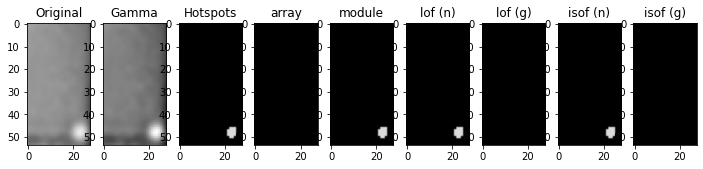

[-0.99200746 -1.50420252 -1.         -1.03800687 -1.         -1.00218023
 -1.03061589 -1.0150304  -2.17708024 -1.03061589]
[-2.31176438]
[-0.46222997 -0.56589895 -0.46574169 -0.478265   -0.43452711 -0.47166319
 -0.47213365 -0.49775106 -0.66820117 -0.47213365]
[-0.76235288]
[-1.04767483 -0.97411582 -1.06645846 -0.99596695 -0.97600786 -1.01018355
 -1.01903997 -1.01585247 -1.05231348 -1.01065616]
[-2.31176438]
[-0.5046844  -0.42642248 -0.52940477 -0.47881233 -0.496048   -0.51179564
 -0.50933664 -0.48247197 -0.51943725 -0.49772147]
[-0.76235288]
655.jpg Normal [6.48282626]
[-1.         -0.99036964 -1.44929372 -1.08060003 -1.04847133 -0.98597815
 -0.98163006 -1.         -1.01523727 -0.98163006]
[-2.27146111]
[-0.47193326 -0.47847174 -0.55857602 -0.51866807 -0.48378971 -0.4613036
 -0.48684272 -0.4680909  -0.45527382 -0.48684272]
[-0.75429222]
[-1.61610271 -2.84111366 -1.02942553 -4.34342916 -3.36871256 -0.9856294
 -2.64821431 -2.07989936 -1.08126132 -2.64821431]
[-2.27146111]
[-0.64907297 -0

[-1.01391263 -1.         -1.01391263 -1.00146527 -1.         -1.00189513
 -1.         -0.9582032  -1.         -1.01391263]
[-2.36793348]
[-0.4655083  -0.43488758 -0.4655083  -0.48718663 -0.4559346  -0.45428822
 -0.45044618 -0.4437921  -0.46955624 -0.4655083 ]
[-0.7735867]
[-1.16979224 -1.01195546 -1.15167153 -1.00037238 -0.99526891 -1.00641828
 -1.00380943 -1.39566119 -0.99108947 -1.12781894]
[-2.36793348]
[-0.58239658 -0.49636289 -0.58507328 -0.47359571 -0.49699501 -0.4819278
 -0.54009175 -0.62819028 -0.50984801 -0.57640792]
[-0.7735867]
4520.jpg Normal [7.37791222]
[-0.96563992 -0.99635871 -0.98160972 -1.01430973 -1.         -1.00735284
 -1.74613547 -1.         -0.98394453 -1.        ]
[-2.20387359]
[-0.45450371 -0.4440264  -0.45970733 -0.45873029 -0.44918975 -0.44686708
 -0.61026901 -0.46600285 -0.46752318 -0.44918975]
[-0.74077472]
[-1.8943519  -3.19995605 -1.9865687  -1.44986116 -3.02910703 -3.67864115
 -1.         -2.32801035 -1.15002905 -3.02910703]
[-2.20387359]
[-0.70225263 -0

[-0.99879165 -0.9845414  -1.00981454 -1.01115821 -0.9845414  -1.06240895
 -1.19503096 -0.98136488 -0.9754709  -0.98136488]
[-2.38974837]
[-0.44721977 -0.43604154 -0.48096108 -0.45107599 -0.43604154 -0.48151237
 -0.52168744 -0.44109822 -0.46238488 -0.44109822]
[-0.77794967]
[-0.99078412 -1.02867497 -1.0408357  -1.55731889 -1.02867497 -0.9639382
 -0.99361385 -1.10876664 -0.99475015 -1.10876664]
[-2.38974837]
[-0.49657838 -0.50192    -0.48350947 -0.63906507 -0.50192    -0.4629201
 -0.46335205 -0.54695292 -0.48687953 -0.54695292]
[-0.77794967]
1464.jpg Normal [7.75797486]
[-0.99160167 -1.         -1.0139765  -1.63701945 -0.98150277 -1.0139765
 -1.22526156 -0.97585269 -1.05562621 -1.06101468]
[-2.36793348]
[-0.50432057 -0.45044618 -0.45811213 -0.65238852 -0.44102547 -0.45811213
 -0.53081035 -0.50008164 -0.50000228 -0.50517299]
[-0.7735867]
[-0.99684071 -0.98689384 -0.9735162  -1.29680185 -1.00025669 -0.9735162
 -1.27660674 -1.03122663 -1.00184117 -0.99991977]
[-2.36793348]
[-0.49989116 -0.4

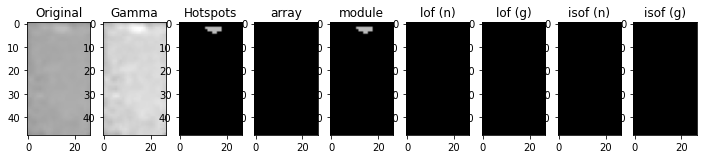

[-1.00104348 -0.99461714 -1.76159474 -1.02652984 -1.03545473 -0.9448952
 -3.53765941 -1.13720811 -0.96334328 -1.11780756]
[-2.09918122]
[-0.42402517 -0.49578053 -0.60324091 -0.45989146 -0.46043628 -0.43114654
 -0.74051875 -0.48326154 -0.47198629 -0.46361476]
[-0.71983624]
[-1.84800408 -0.98094622 -0.99680796 -1.36865446 -1.50356828 -1.65773704
 -2.11306511 -0.98422779 -1.14897873 -2.09904757]
[-2.09918122]
[-0.62531895 -0.4932114  -0.42483233 -0.57665758 -0.60708677 -0.61118295
 -0.61004488 -0.46107417 -0.52994222 -0.66939447]
[-0.71983624]
680.jpg Normal [3.97357319]
[-0.95555972 -0.999702   -1.31989109 -0.96339497 -1.0304999  -1.02556528
 -1.02193565 -1.01205546 -1.00070572 -1.03832504]
[-2.15913831]
[-0.44400673 -0.46115597 -0.56585992 -0.42902949 -0.45638369 -0.45553778
 -0.45671516 -0.46443998 -0.44848354 -0.48298529]
[-0.73182766]
[-1.11048039 -0.99498879 -1.00441598 -1.06709227 -1.01431251 -1.16062598
 -1.02331911 -1.07519177 -1.01207546 -1.        ]
[-2.15913831]
[-0.51556833 -

[-1.0501517  -2.22063943 -1.11784406 -1.02507729 -1.60653893 -0.98358416
 -1.03545473 -1.0103022  -0.96334328 -1.21083273]
[-2.09918122]
[-0.46202    -0.62516607 -0.49476081 -0.43335908 -0.57327758 -0.46534843
 -0.46043628 -0.45821891 -0.47198629 -0.52513457]
[-0.71983624]
[-1.53032217 -0.98279808 -1.06196498 -2.06179596 -1.04509872 -1.09692566
 -1.62756589 -1.36865446 -1.21863561 -0.98422779]
[-2.09918122]
[-0.60786025 -0.44810725 -0.50133695 -0.66846257 -0.44452097 -0.51078133
 -0.59701747 -0.57665758 -0.53269457 -0.46107417]
[-0.71983624]
24.jpg Normal [3.97357319]
[-0.96981128 -1.06736349 -1.04620271 -0.98302662 -0.99076402 -1.06259693
 -2.02393999 -0.96981128 -1.01051509 -0.99178899]
[-2.23087184]
[-0.44979008 -0.44366949 -0.47781471 -0.423877   -0.45741039 -0.46682853
 -0.64144658 -0.44979008 -0.43110171 -0.45018138]
[-0.74617437]
[-4.66341983 -5.09789994 -3.38415406 -6.36593818 -4.05943884 -2.56315915
 -0.99354645 -4.57652381 -5.36609753 -4.05943884]
[-2.23087184]
[-0.75672637 -

[-1.         -0.98852336 -0.99960942 -1.05449053 -0.99580346 -1.
 -0.98852336 -1.01637051 -0.97687123 -0.97926626]
[-2.21643155]
[-0.4348481  -0.4537765  -0.4413789  -0.50505295 -0.43862233 -0.44141765
 -0.4537765  -0.45823381 -0.44005631 -0.45087583]
[-0.74328631]
[-1.34927708 -1.00676278 -1.09645173 -1.0142194  -1.20490085 -1.62876497
 -1.01182545 -1.02433236 -1.17509502 -1.09645173]
[-2.21643155]
[-0.63060897 -0.53961429 -0.54920892 -0.50353747 -0.58950926 -0.68903766
 -0.53396525 -0.50576697 -0.58699964 -0.54920892]
[-0.74328631]
125.jpg Normal [5.20512963]
[-1.00092332 -1.03623188 -1.         -1.00723374 -1.02688529 -0.98687986
 -0.941086   -1.00787679 -1.         -1.00554822]
[-2.25378984]
[-0.44388383 -0.49449802 -0.4284787  -0.48560321 -0.44118318 -0.44862413
 -0.4415952  -0.43203039 -0.4382744  -0.47436568]
[-0.75075797]
[-1.05931219 -0.96719248 -1.22423997 -1.06382513 -1.02314778 -1.0882739
 -1.12137742 -1.0882739  -1.32520822 -1.03831476]
[-2.25378984]
[-0.55354791 -0.478957

[-1.0163437  -0.9980695  -1.0632646  -1.03708628 -0.99180383 -1.0073469
 -0.96419272 -0.9915195  -0.98603323 -3.20150044]
[-2.15913831]
[-0.46032005 -0.46441749 -0.46191344 -0.48179022 -0.44196225 -0.44827482
 -0.45801042 -0.45580421 -0.4438675  -0.75406492]
[-0.73182766]
[-1.08496224 -1.14120834 -1.02331911 -1.51995655 -1.12890699 -1.07644014
 -1.03229011 -1.08767339 -1.00325268 -2.37029608]
[-2.15913831]
[-0.53095061 -0.5492824  -0.47166568 -0.67575307 -0.55166287 -0.53238543
 -0.46913472 -0.50479811 -0.46505583 -0.7132686 ]
[-0.73182766]
1116.jpg Normal [4.56182169]
[-1.         -1.00554822 -1.08186053 -0.99007391 -1.00949207 -1.01478714
 -1.         -1.07840566 -0.98630563 -1.00092332]
[-2.25378984]
[-0.43391679 -0.47436568 -0.5185251  -0.43580838 -0.44333636 -0.48117213
 -0.4382744  -0.43987312 -0.42943828 -0.44388383]
[-0.75075797]
[-1.04080753 -1.03077867 -1.11729779 -1.20967725 -1.06216755 -1.00960716
 -1.05931219 -1.3028787  -1.02033488 -1.07562135]
[-2.25378984]
[-0.54313767 

[-0.98502604 -0.97994271 -1.05562621 -0.98502604 -0.99439591 -1.96905642
 -0.96326393 -1.24706906 -1.06101468 -1.10054545]
[-2.36793348]
[-0.53319693 -0.44423939 -0.50000228 -0.53319693 -0.44855133 -0.70269451
 -0.45527707 -0.59780356 -0.50517299 -0.56080579]
[-0.7735867]
[-1.03122663 -1.00311526 -1.00446451 -1.03122663 -1.02094861 -1.44024481
 -1.0343803  -1.02508546 -0.99102541 -1.00171028]
[-2.36793348]
[-0.5203771  -0.47683937 -0.46424514 -0.5203771  -0.47091908 -0.63951915
 -0.46519234 -0.54878385 -0.5171716  -0.51839732]
[-0.7735867]
3729.jpg Normal [7.37791222]
[-0.98406067 -1.09864427 -1.00390767 -1.07307657 -1.01205546 -1.09769721
 -0.98406067 -1.0073469  -1.07727605 -1.18296298]
[-2.15913831]
[-0.46248133 -0.5175822  -0.46506528 -0.52504869 -0.46443998 -0.50104526
 -0.46248133 -0.44827482 -0.48667117 -0.57341157]
[-0.73182766]
[-1.03166704 -1.07644014 -1.07135845 -1.10709501 -0.98944203 -1.09024415
 -1.03166704 -0.99498879 -1.10359614 -1.32919553]
[-2.15913831]
[-0.46672475 -

[-1.03224547 -1.07287357 -0.97188937 -1.07287357 -0.97467878 -1.35450354
 -0.97729146 -0.97130016 -0.97453728 -1.06181692]
[-1.99727303]
[-0.49041934 -0.47200893 -0.44825822 -0.47200893 -0.44375407 -0.5765042
 -0.4515023  -0.45854577 -0.43850517 -0.46503231]
[-0.69945461]
[-1.1500246  -1.16715302 -1.39181355 -1.16715302 -1.11259678 -1.05551555
 -1.11949009 -1.22044912 -1.26391717 -1.13064207]
[-1.99727303]
[-0.51490029 -0.58405736 -0.66237275 -0.58405736 -0.53883731 -0.46743778
 -0.54640621 -0.59776932 -0.60220362 -0.58585802]
[-0.69945461]
3926.jpg Normal [3.14248365]
[-0.97646222 -1.11384851 -1.03577873 -0.97646222 -1.27757109 -1.03124179
 -1.08353642 -1.05517103 -0.97646222 -0.98594601]
[-2.09918122]
[-0.4714987  -0.52488004 -0.45751786 -0.4714987  -0.53392182 -0.48299131
 -0.49758173 -0.49544781 -0.4714987  -0.43987071]
[-0.71983624]
[-1.57992392 -1.98729273 -1.31458488 -1.59739474 -2.29340383 -1.77997939
 -1.01625972 -1.81399173 -1.59739474 -0.99668913]
[-2.09918122]
[-0.59561614 

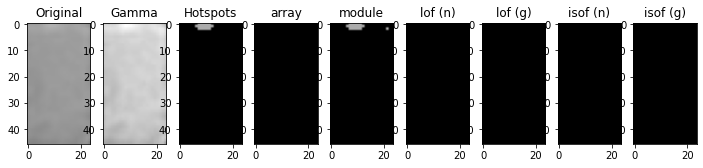

[-1.00733224 -1.00681829 -1.03240518 -1.39125399 -0.98064006 -1.05125361
 -1.0623894  -1.01642022 -1.03240518 -0.99348659]
[-2.23087184]
[-0.49171731 -0.44836449 -0.46618814 -0.5417508  -0.43198115 -0.45727662
 -0.47248073 -0.46478528 -0.46618814 -0.42868412]
[-0.74617437]
[-7.09543564 -1.24860759 -6.18356381 -0.99637665 -3.88993796 -4.92410789
 -0.99631663 -5.7276279  -6.274751   -2.32748011]
[-2.23087184]
[-0.77959263 -0.57960367 -0.7748599  -0.4729782  -0.74959234 -0.76444533
 -0.4993268  -0.7748599  -0.7748599  -0.71748884]
[-0.74617437]
469.jpg Normal [5.38110963]
[-0.98824097 -1.01569073 -0.98274757 -1.00070572 -1.0163437  -1.02776299
 -0.98654312 -1.45811586 -1.01859028 -1.        ]
[-2.15913831]
[-0.45983849 -0.44852455 -0.44006872 -0.44848354 -0.46032005 -0.46837312
 -0.4301918  -0.57481944 -0.46592975 -0.46774846]
[-0.73182766]
[-0.99461237 -1.08496224 -1.15122732 -1.03166704 -1.28831817 -1.03229011
 -1.10359614 -1.01936437 -1.40277478 -1.09783707]
[-2.15913831]
[-0.46553162 

[-1.00920171 -0.99340691 -1.0265742  -0.97843234 -0.98902635 -1.05733419
 -1.         -1.02978257 -1.0035445  -1.15097838]
[-2.21643155]
[-0.47193939 -0.47195089 -0.46173073 -0.48214217 -0.45710579 -0.47803564
 -0.44445434 -0.45550633 -0.46620985 -0.50224797]
[-0.74328631]
[-1.11406637 -1.03684802 -1.00680576 -1.41349362 -1.03464202 -1.02699316
 -0.99680018 -1.00680576 -1.18999794 -0.99762076]
[-2.21643155]
[-0.56296278 -0.51146283 -0.54037519 -0.64362771 -0.49897318 -0.54113253
 -0.50291463 -0.54037519 -0.58842268 -0.45188332]
[-0.74328631]
4668.jpg Normal [5.20512963]
[-1.08525268 -1.05271176 -1.0134055  -1.0134055  -1.11989165 -0.99010031
 -1.03142166 -1.0429609  -1.00725277 -0.95108464]
[-2.25378984]
[-0.4866312  -0.46704691 -0.47133226 -0.47133226 -0.45321842 -0.47042913
 -0.47702778 -0.49117473 -0.48185694 -0.42176202]
[-0.75075797]
[-1.36986725 -1.07047959 -1.12137742 -1.13437021 -1.07240976 -1.02033488
 -1.18152264 -1.22423997 -1.02916342 -1.00450275]
[-2.25378984]
[-0.65001374

[-1.0330185  -0.99158027 -0.99010394 -0.98380458 -1.34324264 -1.1070365
 -1.00732718 -1.01609977 -1.01205225 -1.0023626 ]
[-2.27146111]
[-0.49661602 -0.44339291 -0.45765882 -0.45393191 -0.56478996 -0.5152933
 -0.46530065 -0.45337856 -0.47061899 -0.46649461]
[-0.75429222]
[-1.40576113 -3.98190256 -2.19748161 -4.78160451 -1.04734603 -1.25961254
 -3.56799931 -3.23585473 -3.50157039 -2.64821431]
[-2.27146111]
[-0.61442364 -0.75969795 -0.72652015 -0.76900654 -0.52468311 -0.56468321
 -0.74948716 -0.74191924 -0.74796743 -0.73046324]
[-0.75429222]
253.jpg Normal [5.90828053]
[-0.99007391 -0.99550071 -1.00731259 -1.11989165 -0.99007391 -1.02955193
 -1.07002291 -0.98197282 -1.00092332 -0.99010031]
[-2.25378984]
[-0.43580838 -0.46842259 -0.4542224  -0.45321842 -0.43580838 -0.44624204
 -0.47264485 -0.45837692 -0.44388383 -0.47042913]
[-0.75075797]
[-1.09000781 -1.09739351 -1.03637082 -1.04825255 -1.06382513 -1.02447021
 -1.03831476 -1.19511452 -0.99595685 -1.05931219]
[-2.25378984]
[-0.50664176 -0

[-1.03869774 -1.         -0.97994271 -1.00702539 -1.0039032  -0.9582032
 -0.97585269 -0.98150277 -0.99424112 -0.9582032 ]
[-2.36793348]
[-0.47582715 -0.44316466 -0.44423939 -0.45618614 -0.45571292 -0.4437921
 -0.50008164 -0.44102547 -0.46481337 -0.4437921 ]
[-0.7735867]
[-0.99108947 -1.04120011 -1.00446451 -1.0173707  -1.01942751 -1.02281627
 -1.32393971 -1.         -0.99991977 -1.02281627]
[-2.36793348]
[-0.50984801 -0.47189336 -0.46424514 -0.54059479 -0.47260525 -0.50837797
 -0.60188941 -0.47344895 -0.53457422 -0.50837797]
[-0.7735867]
4697.jpg Normal [7.37791222]
[-1.04777942 -1.0501517  -0.98286398 -0.98594601 -0.9448952  -0.98358416
 -1.02507729 -1.03035656 -1.00104348 -1.0103022 ]
[-2.09918122]
[-0.44442735 -0.46202    -0.44467422 -0.43987071 -0.43114654 -0.46534843
 -0.43335908 -0.46345051 -0.42402517 -0.45821891]
[-0.71983624]
[-1.31458488 -1.01152445 -1.36865446 -2.02454434 -1.01403391 -0.98493901
 -1.16766628 -1.59739474 -1.11244819 -1.00492795]
[-2.09918122]
[-0.55981437 -0.

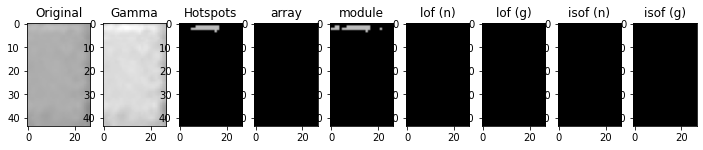

[-1.02732927 -1.01164558 -0.99676342 -1.12958735 -3.9234665  -1.
 -1.0035445  -1.03104516 -1.0035445  -1.03393529]
[-2.21643155]
[-0.4862325  -0.46801054 -0.48603255 -0.55270234 -0.72267087 -0.44024625
 -0.46620985 -0.5085854  -0.46620985 -0.48856377]
[-0.74328631]
[-1.03790881 -1.04617142 -1.0142194  -1.29673627 -3.39099172 -1.02703967
 -0.98843253 -1.02495367 -0.98545345 -1.03684802]
[-2.21643155]
[-0.50082324 -0.48753657 -0.50353747 -0.62292867 -0.71662045 -0.46061634
 -0.49173882 -0.52390391 -0.48962462 -0.51146283]
[-0.74328631]
3463.jpg Normal [5.20512963]
[-1.00144117 -0.98181661 -0.99742306 -1.03470431 -0.9848728  -4.20248401
 -1.08657058 -1.03238103 -1.03577873 -0.99780187]
[-2.09918122]
[-0.48552214 -0.42749702 -0.46857822 -0.44425911 -0.44439057 -0.77906535
 -0.50635717 -0.47121215 -0.45751786 -0.45984363]
[-0.71983624]
[-2.06179596 -1.16766628 -1.77997939 -0.99668913 -1.31458488 -3.31967939
 -2.33227508 -1.62756589 -1.53032217 -0.9900361 ]
[-2.09918122]
[-0.66846257 -0.5382

[-1.         -1.0035445  -1.02437712 -0.97574544 -1.01694656 -0.99805952
 -0.97843234 -1.00920171 -1.01125137 -1.02083026]
[-2.21643155]
[-0.45353976 -0.46620985 -0.46881904 -0.47309757 -0.46499965 -0.47394588
 -0.48214217 -0.47193939 -0.48337336 -0.49826268]
[-0.74328631]
[-1.0119031  -1.04728182 -0.99225155 -1.00137119 -0.99678265 -1.11406637
 -1.01063544 -1.03565877 -1.02433236 -1.32300667]
[-2.21643155]
[-0.48452375 -0.50719757 -0.51237521 -0.54365541 -0.44116173 -0.56296278
 -0.53358975 -0.49765387 -0.50576697 -0.62764797]
[-0.74328631]
2972.jpg Normal [5.20512963]
[-1.02955193 -1.06933241 -1.00731259 -1.02637842 -1.08525268 -1.02069412
 -0.9937048  -0.98197282 -0.99007391 -1.04996489]
[-2.25378984]
[-0.44624204 -0.51098402 -0.4542224  -0.46744458 -0.4866312  -0.44242076
 -0.46081086 -0.45837692 -0.43580838 -0.54579662]
[-0.75075797]
[-1.0061285  -1.05399436 -1.00450275 -1.02931141 -1.02916342 -0.99595685
 -1.07562135 -1.05783771 -1.00403639 -1.39802186]
[-2.25378984]
[-0.47587293

[-0.99622113 -1.02459683 -1.0134974  -1.02459683 -1.0064173  -1.01202237
 -0.99113268 -1.07448273 -1.00677954 -0.99771102]
[-2.20627621]
[-0.47625871 -0.46117677 -0.48471531 -0.46117677 -0.47413482 -0.48052372
 -0.47207668 -0.51216439 -0.44778362 -0.46864331]
[-0.74125524]
[-1.40257202 -1.02977828 -1.20616252 -1.00433816 -1.09510185 -1.37757989
 -1.06987397 -1.80911513 -1.03049603 -1.00124335]
[-2.20627621]
[-0.580157   -0.48327209 -0.55297075 -0.46746212 -0.5228251  -0.57516152
 -0.51824024 -0.68602354 -0.47329643 -0.51531068]
[-0.74125524]
2973.jpg Normal [5.08482738]
[-1.0303646  -1.03392179 -0.97643502 -1.0212151  -0.96440177 -1.09631889
 -1.07115894 -1.03110031 -1.21156965 -0.99288513]
[-2.28186883]
[-0.45437748 -0.46867128 -0.43056906 -0.49894416 -0.43311158 -0.49346995
 -0.46413205 -0.46927426 -0.52134955 -0.45662856]
[-0.75637377]
[-1.27073942 -0.97870041 -1.01373908 -1.0258319  -1.77796729 -0.97870041
 -1.41949617 -0.98151373 -1.04119947 -0.99807983]
[-2.28186883]
[-0.57500512

[-0.98061666 -1.02372649 -1.0471343  -0.99536361 -0.97777944 -0.97610517
 -1.99325278 -1.02568196 -1.00542103 -1.26267168]
[-2.23087184]
[-0.50122126 -0.46706765 -0.52078187 -0.46937348 -0.4776344  -0.49706769
 -0.63049427 -0.47911039 -0.4656312  -0.55850368]
[-0.74617437]
[-4.48962779 -2.40256012 -5.36609753 -3.9746884  -3.9746884  -4.66341983
 -1.12808577 -3.29922355 -3.21429304 -6.45712536]
[-2.23087184]
[-0.75570308 -0.71977188 -0.77119876 -0.74959234 -0.74959234 -0.75672637
 -0.5395473  -0.7390172  -0.7390172  -0.77801185]
[-0.74617437]
1513.jpg Normal [5.38110963]
[-0.98274757 -1.00070572 -0.98904647 -1.01569073 -1.02556528 -1.0257631
 -2.2534067  -1.01569073 -1.01859028 -1.01205546]
[-2.15913831]
[-0.44006872 -0.44848354 -0.46821616 -0.44852455 -0.45553778 -0.45254558
 -0.68037272 -0.44852455 -0.46592975 -0.46443998]
[-0.73182766]
[-1.09597886 -1.00489092 -1.25289113 -1.03166704 -1.08695961 -1.01532688
 -1.58271924 -1.03166704 -1.09783707 -1.07890409]
[-2.15913831]
[-0.51164514 

[-1.02866148 -1.24029327 -0.98594601 -1.05517103 -0.98594601 -1.00144117
 -2.8354109  -0.97028225 -1.02866148 -1.20148339]
[-2.09918122]
[-0.47174326 -0.53212401 -0.43987071 -0.49544781 -0.43987071 -0.48552214
 -0.67730786 -0.4235945  -0.47174326 -0.5293965 ]
[-0.71983624]
[-1.40849831 -2.25453258 -1.0362934  -1.88201642 -1.0362934  -1.77997939
 -2.24936629 -0.9887876  -1.43887024 -2.21566133]
[-2.09918122]
[-0.58903393 -0.68008354 -0.48497929 -0.63658957 -0.48497929 -0.61274166
 -0.64614796 -0.44332911 -0.59798303 -0.67687021]
[-0.71983624]
3847.jpg Normal [3.97357319]
[-1.00915779 -1.00965008 -1.14121357 -1.0106063  -0.98886921 -1.03761949
 -0.9953084  -1.00860579 -0.98912331 -0.97567778]
[-2.43406828]
[-0.46369938 -0.46603512 -0.5139582  -0.47663579 -0.46200882 -0.48459125
 -0.44213769 -0.4668221  -0.45098139 -0.46133536]
[-0.78681366]
[-2.46335157 -0.97271932 -0.98132983 -2.61975484 -1.52605968 -3.01121905
 -1.0673989  -1.04664289 -1.90616491 -4.48111787]
[-2.43406828]
[-0.69808972

[-0.98508468 -1.01278872 -0.99730055 -1.0167527  -1.03382411 -1.0425352
 -0.99908467 -0.99340859 -0.99908467 -1.        ]
[-2.19250165]
[-0.44256473 -0.43880084 -0.46352356 -0.4490478  -0.45729654 -0.45270228
 -0.46766253 -0.44295602 -0.46766253 -0.44652152]
[-0.73850033]
[-1.93769612 -1.09177291 -1.72275479 -1.37450855 -2.70718609 -1.1748193
 -1.64107708 -2.13114332 -1.68191593 -0.99082378]
[-2.19250165]
[-0.72539531 -0.56811448 -0.69556778 -0.63697915 -0.76589107 -0.57698578
 -0.69087755 -0.74847366 -0.69228129 -0.52608503]
[-0.73850033]
3884.jpg Normal [4.92608216]
[-1.33539228 -1.00775258 -1.0042387  -0.97284792 -0.98253143 -0.99256045
 -1.00463113 -1.01387232 -0.976983   -0.97451524]
[-2.43406828]
[-0.5536776  -0.45372756 -0.46586096 -0.45333597 -0.44224116 -0.47395308
 -0.4398662  -0.46067302 -0.46913705 -0.47896648]
[-0.78681366]
[-4.64930378 -1.64904805 -1.00136042 -2.69973185 -1.0180608  -3.16788538
 -1.64904805 -3.48582588 -0.96857699 -2.78046262]
[-2.43406828]
[-0.77067715 -

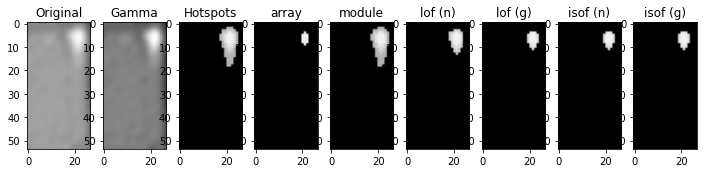

[-0.99239059 -0.97345766 -1.00252973 -1.00762076 -1.         -1.03841308
 -1.         -1.93375617 -0.99704615 -1.03634376]
[-2.20387359]
[-0.47923916 -0.42648923 -0.45978672 -0.45215424 -0.44614612 -0.45721634
 -0.43534455 -0.63733412 -0.45458239 -0.45449132]
[-0.74077472]
[-3.31693376 -1.38961543 -1.9865687  -1.03090201 -1.15002905 -1.75915269
 -1.13596678 -1.00422503 -2.17947945 -1.67631387]
[-2.20387359]
[-0.76764343 -0.60488473 -0.71348264 -0.48902055 -0.54053471 -0.67697657
 -0.54574388 -0.45842882 -0.72614473 -0.64049705]
[-0.74077472]
2224.jpg Normal [5.05677453]
[-1.08657058 -0.9848728  -0.99742306 -0.98181661 -1.56776187 -1.03124179
 -0.98376123 -0.99780187 -1.02382879 -1.15502131]
[-2.09918122]
[-0.50635717 -0.44439057 -0.46857822 -0.42749702 -0.56408575 -0.48299131
 -0.47334288 -0.45984363 -0.45626359 -0.53649207]
[-0.71983624]
[-1.31458488 -1.03996331 -1.0530544  -1.00438192 -1.91602876 -1.21863561
 -1.12797072 -1.07942525 -1.01237139 -1.40849831]
[-2.09918122]
[-0.55981437

[-1.00949911 -1.06034251 -0.94824194 -1.05057585 -1.00409365 -0.9770527
 -1.04836439 -1.02833489 -1.05057585 -1.03107242]
[-2.28010106]
[-0.46521423 -0.53066414 -0.43066372 -0.49062947 -0.53545243 -0.46232862
 -0.49005792 -0.52788253 -0.49062947 -0.4597642 ]
[-0.75602021]
[-1.00779777 -1.00134826 -0.95616254 -1.04729944 -1.05091766 -0.98077385
 -1.0125616  -1.1939383  -1.04729944 -1.06108768]
[-2.28010106]
[-0.4855984  -0.53129738 -0.44781927 -0.52356429 -0.52302786 -0.47884244
 -0.50088153 -0.59106043 -0.52356429 -0.48098674]
[-0.75602021]
1711.jpg Normal [6.02699815]
[-1.04352095 -1.00142478 -1.09029005 -1.00462072 -0.99983373 -1.00462072
 -1.96676986 -1.02584944 -1.03611828 -1.00058422]
[-1.99727303]
[-0.44053827 -0.45173807 -0.5184474  -0.44665502 -0.44377084 -0.44665502
 -0.65924231 -0.46827222 -0.44893097 -0.46335528]
[-0.69945461]
[-1.13838864 -1.24803461 -0.95875133 -1.08116752 -1.27979973 -1.09295428
 -1.07634803 -1.00194669 -1.17442109 -1.19528746]
[-1.99727303]
[-0.51038178 

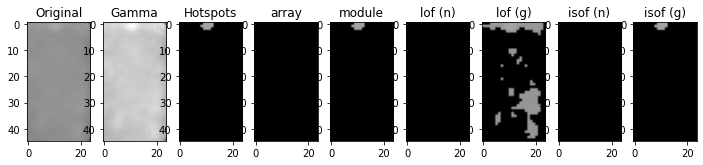

[-0.98508468 -0.96977292 -1.03382411 -1.         -1.05594558 -1.0425352
 -1.00482859 -1.00308594 -4.60713954 -0.99198718]
[-2.19250165]
[-0.44256473 -0.44412325 -0.45729654 -0.45604458 -0.48772932 -0.45270228
 -0.45923326 -0.45891568 -0.76807441 -0.4566274 ]
[-0.73850033]
[-1.4827634  -1.01009084 -2.23001633 -1.01425037 -1.03361509 -1.04551864
 -1.19509423 -1.72275479 -2.94979157 -1.4105935 ]
[-2.19250165]
[-0.66710939 -0.47052753 -0.74999443 -0.53230573 -0.45519477 -0.54332449
 -0.59417598 -0.69556778 -0.70064464 -0.64686637]
[-0.73850033]
2393.jpg Normal [4.92608216]
[-1.03142166 -1.3120543  -0.99849251 -1.07458655 -1.00731259 -1.06759605
 -1.06538232 -1.06759605 -1.07666904 -1.01585214]
[-2.25378984]
[-0.47702778 -0.65703008 -0.46631325 -0.50331527 -0.4542224  -0.53427455
 -0.51107482 -0.53427455 -0.50584696 -0.51934978]
[-0.75075797]
[-1.00450275 -1.3028787  -1.00967527 -1.07240976 -1.00403639 -1.05931219
 -1.07562135 -1.06926665 -1.04495441 -1.03831476]
[-2.25378984]
[-0.48562914 

[-0.9888235  -0.98648583 -0.98889294 -1.05294545 -0.98852696 -0.98868082
 -0.98155021 -1.03058541 -0.98155021 -1.04537448]
[-2.06021062]
[-0.45250761 -0.45169305 -0.42835315 -0.49769942 -0.45488864 -0.45019047
 -0.44935524 -0.48308157 -0.44935524 -0.48177213]
[-0.71204212]
[-1.28410307 -1.12020751 -0.98909416 -1.64245671 -1.16320187 -1.06805485
 -1.22180729 -1.37729692 -1.22180729 -1.34442587]
[-2.06021062]
[-0.59958459 -0.5500795  -0.47054006 -0.67579495 -0.55121591 -0.5485729
 -0.5598287  -0.61238749 -0.5598287  -0.6115001 ]
[-0.71204212]
2436.jpg Normal [3.63254181]
[-1.13512715 -0.9967492  -0.9929354  -0.99583985 -1.01706204 -1.30998515
 -1.07222198 -1.06471242 -1.01706204 -0.99426508]
[-2.20627621]
[-0.53720721 -0.47140269 -0.4920456  -0.47533144 -0.49236558 -0.55544569
 -0.49646321 -0.49861761 -0.49236558 -0.49551433]
[-0.74125524]
[-1.0537221  -1.3555464  -1.05729985 -1.58944962 -1.13621117 -1.00696616
 -1.02171031 -1.00113858 -1.13621117 -1.07876927]
[-2.20627621]
[-0.48350154 

[-1.15931405 -1.0092624  -1.05294545 -1.04168609 -0.98852301 -1.06916153
 -0.9888235  -0.98889294 -1.05856006 -1.09609099]
[-2.06021062]
[-0.51883618 -0.45453936 -0.49769942 -0.4758289  -0.46838578 -0.49215887
 -0.45250761 -0.42835315 -0.48972158 -0.51292748]
[-0.71204212]
[-1.49672839 -1.08885307 -1.21261753 -1.02761443 -1.08542562 -1.20138194
 -1.06676071 -1.00792375 -1.16320187 -1.37729692]
[-2.06021062]
[-0.63632854 -0.54619343 -0.55921774 -0.49454228 -0.52803791 -0.56356443
 -0.54564086 -0.46409787 -0.55121591 -0.61238749]
[-0.71204212]
1671.jpg Normal [3.63254181]
[-1.11035007 -0.95555972 -1.07060972 -1.49404083 -0.99180383 -1.00390767
 -1.21263381 -1.08134618 -1.11035007 -0.99180383]
[-2.15913831]
[-0.51215205 -0.44400673 -0.53535252 -0.57575645 -0.44196225 -0.46506528
 -0.58055415 -0.53152971 -0.51215205 -0.44196225]
[-0.73182766]
[-1.08496224 -1.01125056 -1.10709501 -1.37994691 -0.99834008 -1.05548148
 -1.35372195 -1.12890699 -1.07519177 -0.99834008]
[-2.15913831]
[-0.53095061

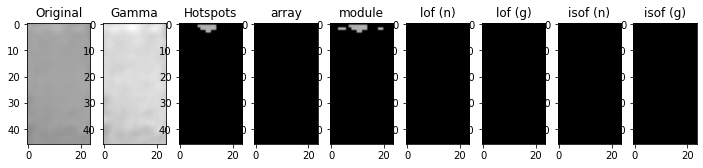

[-0.99550071 -0.98575499 -1.02069412 -1.11989165 -1.07666904 -1.11989165
 -0.941086   -1.00092332 -0.98968626 -1.00731259]
[-2.25378984]
[-0.46842259 -0.42209133 -0.44242076 -0.45321842 -0.50584696 -0.45321842
 -0.4415952  -0.44388383 -0.47015941 -0.4542224 ]
[-0.75075797]
[-1.02916342 -0.98964387 -1.03262622 -1.0924601  -1.20967725 -1.09000781
 -1.00403639 -1.08768742 -1.04611519 -1.03831476]
[-2.25378984]
[-0.54298487 -0.48133836 -0.47886221 -0.50010599 -0.59025587 -0.50664176
 -0.47070394 -0.48514505 -0.55210847 -0.53825888]
[-0.75075797]
3066.jpg Normal [5.67270035]
[-1.55950324 -1.08328863 -1.2862225  -1.05241417 -1.08328863 -1.25344022
 -1.37926868 -1.82890648 -1.21870517 -1.19012083]
[-2.27146111]
[-0.63879535 -0.51232322 -0.56411677 -0.49835707 -0.51232322 -0.56096993
 -0.60692374 -0.65894938 -0.54665212 -0.54041512]
[-0.75429222]
[-4.27061285 -2.71208827 -3.7034121  -2.02110824 -2.71208827 -3.56799931
 -3.83882489 -4.78160451 -3.36871256 -3.23585473]
[-2.27146111]
[-0.76485539

[-1.         -0.99391305 -0.98958537 -0.98150277 -3.21843558 -1.
 -1.05784149 -1.         -0.99391305 -1.02033995]
[-2.36793348]
[-0.44060552 -0.47123608 -0.44365011 -0.44102547 -0.76227231 -0.45313579
 -0.51148437 -0.45284957 -0.47123608 -0.47580342]
[-0.7735867]
[-1.06362155 -1.00182042 -0.99102541 -0.99108947 -1.85636326 -1.29680185
 -1.00311526 -1.00380943 -1.00182042 -1.02094861]
[-2.36793348]
[-0.51269181 -0.50058983 -0.5171716  -0.50984801 -0.62410362 -0.59873935
 -0.47683937 -0.54009175 -0.50116056 -0.47091908]
[-0.7735867]
642.jpg Normal [7.37791222]
[-0.99635103 -0.98231135 -0.98549471 -0.98253143 -0.99585077 -1.10473916
 -1.02389709 -0.99616648 -1.00860579 -1.01337118]
[-2.43406828]
[-0.44775531 -0.45963543 -0.44846586 -0.44224116 -0.44949082 -0.518793
 -0.46144958 -0.46718489 -0.4668221  -0.44294368]
[-0.78681366]
[-4.06641287 -1.84231547 -2.39003754 -3.98347187 -3.40288488 -0.98267556
 -2.86119339 -1.16171243 -4.90964636 -3.40288488]
[-2.43406828]
[-0.75162374 -0.62990122 

[-1.00973411 -1.07150699 -0.97599731 -1.01811213 -0.9770527  -0.98690458
 -1.01064896 -1.86859884 -0.98842789 -1.02085104]
[-2.28010106]
[-0.43950247 -0.44598306 -0.43399727 -0.44583543 -0.46232862 -0.4325265
 -0.45470065 -0.60020441 -0.43469621 -0.46838717]
[-0.75602021]
[-1.09062456 -1.41616391 -1.17254156 -1.03117208 -1.03643625 -1.24931702
 -1.02133211 -1.03225562 -1.33274047 -1.00134826]
[-2.28010106]
[-0.58013476 -0.61604079 -0.58832083 -0.52911818 -0.49992088 -0.59685982
 -0.5219146  -0.45305502 -0.61049107 -0.53129738]
[-0.75602021]
2146.jpg Normal [6.02699815]
[-1.         -1.045779   -0.98630563 -1.03063337 -1.         -0.98687986
 -1.07840566 -1.00554822 -1.09864369 -1.0807059 ]
[-2.25378984]
[-0.4336105  -0.48664736 -0.42943828 -0.48765159 -0.4336105  -0.44862413
 -0.43987312 -0.47436568 -0.53067873 -0.4569752 ]
[-0.75075797]
[-1.05399436 -1.0048605  -1.03831476 -1.00403639 -1.04611519 -1.07562135
 -1.24171525 -1.0226838  -1.00991545 -1.05907259]
[-2.25378984]
[-0.55263712 

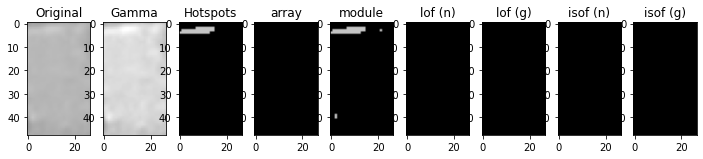

[-1.03545473 -1.09147062 -0.96334328 -1.44973384 -0.99461714 -0.99576181
 -0.98358416 -1.02652984 -0.98252511 -0.98358416]
[-2.09918122]
[-0.46043628 -0.50114034 -0.47198629 -0.57099362 -0.49578053 -0.46305317
 -0.46534843 -0.45989146 -0.47493972 -0.46534843]
[-0.71983624]
[-2.29340383 -1.0362934  -1.7119547  -0.98422779 -1.39049965 -1.84800408
 -1.45856175 -2.06179596 -1.77997939 -1.48618602]
[-2.09918122]
[-0.68300107 -0.48497929 -0.60797203 -0.46107417 -0.58474338 -0.62531895
 -0.6049104  -0.66846257 -0.61274166 -0.60760585]
[-0.71983624]
4279.jpg Normal [3.97357319]
[-1.04049316 -0.99619931 -1.         -1.0444283  -0.99424112 -1.0150671
 -1.0266287  -1.17248993 -1.         -1.        ]
[-2.36793348]
[-0.48759249 -0.45843973 -0.45044618 -0.45545808 -0.46481337 -0.48763594
 -0.48586774 -0.50579233 -0.46309753 -0.4559346 ]
[-0.7735867]
[-1.29680185 -1.00037238 -1.01076648 -1.00589401 -1.06362155 -1.
 -0.99836165 -1.02012598 -1.02094861 -1.00641828]
[-2.36793348]
[-0.59873935 -0.473595

[-1.07840566 -1.05823932 -0.99007391 -0.98687986 -1.00731259 -0.941086
 -1.13148744 -1.03063337 -1.         -0.98575499]
[-2.25378984]
[-0.43987312 -0.46465099 -0.43580838 -0.44862413 -0.4542224  -0.4415952
 -0.4517333  -0.48765159 -0.4336105  -0.42209133]
[-0.75075797]
[-1.07742949 -1.00034181 -1.03637082 -1.06382513 -1.32520822 -1.09000781
 -1.10838464 -1.10691627 -1.02931141 -1.02258747]
[-2.25378984]
[-0.53906444 -0.48358609 -0.54567654 -0.50483913 -0.63803193 -0.50664176
 -0.55545698 -0.47926809 -0.53632614 -0.52685114]
[-0.75075797]
5128.jpg Normal [5.67270035]
[-0.98031669 -1.03562468 -0.98601006 -0.98046819 -1.09801153 -0.9963286
 -1.00853647 -0.99394227 -0.98601006 -0.9963286 ]
[-2.20627621]
[-0.46349168 -0.49270566 -0.46135819 -0.48042625 -0.53166878 -0.47054691
 -0.4642394  -0.47941405 -0.46135819 -0.47054691]
[-0.74125524]
[-1.7341074  -1.00124335 -1.08993519 -1.20616252 -1.00696616 -1.43251049
 -1.33219101 -1.04762578 -1.08278785 -1.43251049]
[-2.20627621]
[-0.66288699 -0.

[-0.9848728  -0.98013691 -1.13720811 -0.99294872 -0.97028225 -1.02382879
 -1.04777942 -0.99742306 -1.00104348 -1.02412498]
[-2.09918122]
[-0.44439057 -0.45808119 -0.48326154 -0.46071729 -0.4235945  -0.45626359
 -0.44442735 -0.46857822 -0.42402517 -0.45883552]
[-0.71983624]
[-1.55223631 -1.05605101 -0.96742775 -1.50356828 -1.05658913 -1.68790819
 -0.98423304 -2.13791882 -1.00083192 -1.28278041]
[-2.09918122]
[-0.61045541 -0.4517821  -0.44212731 -0.60708677 -0.50262532 -0.60919821
 -0.47816053 -0.66984753 -0.50021214 -0.55222335]
[-0.71983624]
5114.jpg Normal [3.97357319]
[-1.07458655 -1.04996489 -1.0134055  -1.01204001 -1.17877174 -1.02955193
 -1.03048163 -1.01006939 -1.50765078 -1.06538232]
[-2.25378984]
[-0.50331527 -0.54579662 -0.47133226 -0.53350648 -0.58286947 -0.44624204
 -0.53418574 -0.51629671 -0.71514974 -0.51107482]
[-0.75075797]
[-1.03262622 -1.02408132 -0.9922812  -1.07562135 -1.05399436 -1.13746659
 -1.04825255 -1.06216755 -1.24171525 -1.06382513]
[-2.25378984]
[-0.47886221

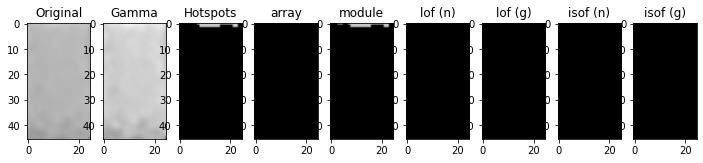

[-1.12380182 -0.96440177 -1.0303646  -0.99745139 -0.97643502 -0.96858972
 -1.00989311 -1.0212151  -1.03110031 -0.96858972]
[-2.28186883]
[-0.49706264 -0.43311158 -0.45437748 -0.44119962 -0.43056906 -0.4466107
 -0.44296314 -0.49894416 -0.46927426 -0.4466107 ]
[-0.75637377]
[-1.04144726 -0.98303976 -0.98697093 -0.97870041 -0.97033403 -0.99221336
 -1.31381533 -1.01700631 -1.03353989 -0.99221336]
[-2.28186883]
[-0.47117004 -0.48456418 -0.48416657 -0.44965995 -0.46079584 -0.48491005
 -0.57686986 -0.45849822 -0.49038256 -0.48491005]
[-0.75637377]
180.jpg Normal [6.05158077]
[-0.98163006 -1.05241417 -1.         -0.99679039 -1.         -0.98765652
 -1.         -0.99679039 -1.         -1.08060003]
[-2.27146111]
[-0.48684272 -0.49835707 -0.4657494  -0.48238188 -0.47745776 -0.45617686
 -0.46968761 -0.48238188 -0.46092126 -0.51866807]
[-0.75429222]
[-2.71208827 -3.7711185  -1.61610271 -3.16942581 -2.26019215 -1.04325375
 -2.52148604 -3.10299689 -1.28277801 -4.48906179]
[-2.27146111]
[-0.733931   -

[-1.12483911 -0.96028294 -0.97467878 -1.0405744  -1.50458694 -1.00130186
 -1.40144178 -1.06242484 -0.97130016 -1.00639687]
[-1.99727303]
[-0.51554896 -0.43559836 -0.44375407 -0.489816   -0.61053186 -0.47847595
 -0.58564919 -0.49910129 -0.45854577 -0.4517006 ]
[-0.69945461]
[-1.0082702  -1.24803461 -1.06500758 -0.99073155 -0.95875133 -0.99515879
 -1.06201023 -1.         -1.09854555 -1.17151803]
[-1.99727303]
[-0.44963089 -0.60484712 -0.50349076 -0.46602254 -0.42922935 -0.47307466
 -0.45789218 -0.45836179 -0.54227617 -0.5215621 ]
[-0.69945461]
2690.jpg Normal [3.14248365]
[-0.96642159 -0.97040243 -1.12563831 -3.13270342 -1.01856525 -1.00726976
 -1.         -0.987863   -2.02543087 -0.97404084]
[-2.37937923]
[-0.46468027 -0.47008062 -0.50081657 -0.70020208 -0.46651833 -0.48167599
 -0.4416545  -0.46626603 -0.62552625 -0.45422042]
[-0.77587585]
[-1.019312   -1.25382945 -1.00491509 -2.46890816 -1.02440365 -1.49086748
 -1.04668877 -0.96325496 -1.41764769 -1.12380254]
[-2.37937923]
[-0.46766462

[-1.00142478 -1.00462072 -0.99983373 -1.00180342 -1.07287357 -0.97041794
 -0.97405199 -1.03965653 -0.97188937 -0.97188937]
[-1.99727303]
[-0.45173807 -0.44665502 -0.44377084 -0.42536595 -0.47200893 -0.45185621
 -0.42727774 -0.49630276 -0.44825822 -0.44825822]
[-0.69945461]
[-1.18249908 -1.11259678 -1.19528746 -1.12279186 -0.99073155 -1.13064207
 -1.15566352 -1.24803461 -1.00460071 -0.99687503]
[-1.99727303]
[-0.58006587 -0.53883731 -0.58451382 -0.53478163 -0.46602254 -0.58585802
 -0.50975751 -0.60484712 -0.46354164 -0.4615113 ]
[-0.69945461]
3997.jpg Normal [3.14248365]
[-1.05388808 -1.06591755 -1.17168196 -2.06174807 -1.17168196 -1.00131139
 -1.81703547 -1.3357685  -1.03642101 -1.08854465]
[-2.06021062]
[-0.52245623 -0.52058243 -0.571202   -0.70616548 -0.571202   -0.4461229
 -0.69258875 -0.59153714 -0.51554577 -0.51844725]
[-0.71204212]
[-0.9943936  -1.05722373 -1.00912114 -1.06704442 -1.00912114 -1.22180729
 -1.01636894 -0.96067229 -0.99960592 -1.06730163]
[-2.06021062]
[-0.47947333 

[-1.5216976  -1.09609099 -1.81106297 -1.4265915  -1.02158987 -1.29395824
 -1.62692137 -1.21603405 -1.38207375 -1.1750191 ]
[-2.06021062]
[-0.64651007 -0.51292748 -0.71086106 -0.6298742  -0.48243958 -0.59881046
 -0.67832513 -0.5572499  -0.61226206 -0.54654815]
[-0.71204212]
[-1.39373244 -1.06805485 -1.64245671 -1.32799035 -1.06145761 -1.23473025
 -1.46933585 -1.16320187 -1.31155482 -1.12020751]
[-2.06021062]
[-0.6212874  -0.5485729  -0.67579495 -0.61357227 -0.48840998 -0.56487541
 -0.63684857 -0.55121591 -0.61114647 -0.5500795 ]
[-0.71204212]
3773.jpg Normal [3.63254181]
[-1.01262373 -0.9916625  -1.0106063  -0.97891976 -0.9904187  -1.07752712
 -0.9904187  -0.99697404 -0.98661918 -0.98773966]
[-2.43406828]
[-0.45451335 -0.47235921 -0.47663579 -0.46420455 -0.44400463 -0.4785774
 -0.44400463 -0.46941969 -0.44735869 -0.4555199 ]
[-0.78681366]
[-3.08955221 -4.7345487  -2.101669   -3.98347187 -3.65170787 -2.69973185
 -3.65170787 -4.31523587 -0.98267556 -4.23229487]
[-2.43406828]
[-0.72318888 

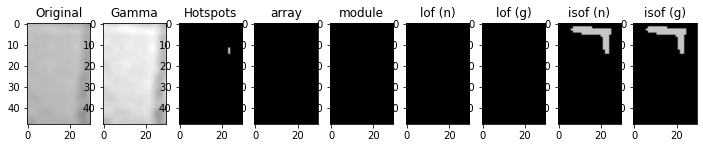

[-0.94824194 -1.00394716 -1.00397031 -0.94824194 -1.01064896 -0.98842789
 -1.04591406 -1.07150699 -1.04429814 -1.11093933]
[-2.28010106]
[-0.43066372 -0.46808133 -0.43491108 -0.43066372 -0.45470065 -0.43469621
 -0.47649556 -0.44598306 -0.45270043 -0.49146337]
[-0.75602021]
[-1.06447511 -0.97677626 -1.0420934  -1.04729944 -1.04101039 -1.00134826
 -1.26559476 -1.01274704 -1.04532742 -1.02337176]
[-2.28010106]
[-0.52945457 -0.48260745 -0.52403331 -0.52356429 -0.48880676 -0.53129738
 -0.59996644 -0.51995398 -0.50890072 -0.46835868]
[-0.75602021]
1825.jpg Normal [6.02699815]
[-1.00210703 -1.47361855 -0.99394227 -1.72073132 -0.9721154  -0.98634419
 -1.07858746 -1.24666556 -0.99828895 -1.75167973]
[-2.20627621]
[-0.47940178 -0.5691248  -0.47941405 -0.62864084 -0.48510814 -0.43948908
 -0.50824356 -0.53064804 -0.47753238 -0.62983982]
[-0.74125524]
[-1.37757989 -0.98433371 -1.00124335 -1.01320432 -1.29348227 -1.69660353
 -0.99495057 -0.97823907 -1.07876927 -1.0121519 ]
[-2.20627621]
[-0.57516152

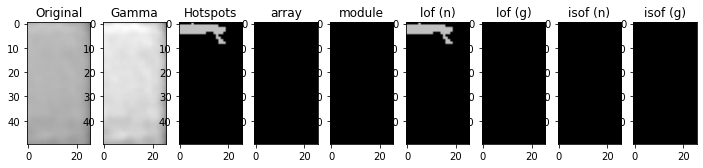

[-0.98745171 -1.02467602 -1.02831002 -0.98010748 -1.05106128 -1.00705206
 -0.98010748 -1.00683768 -1.00084334 -0.98889294]
[-2.06021062]
[-0.45199893 -0.4574065  -0.45231246 -0.42856752 -0.51741129 -0.46348726
 -0.42856752 -0.44935799 -0.43586475 -0.42835315]
[-0.71204212]
[-1.04812025 -1.64245671 -1.13150254 -1.23473025 -1.01344745 -1.08885307
 -1.23473025 -0.99853967 -1.37729692 -1.36086139]
[-2.06021062]
[-0.50767803 -0.67579495 -0.53993204 -0.56487541 -0.48065661 -0.54619343
 -0.56487541 -0.48481699 -0.61238749 -0.61246362]
[-0.71204212]
1038.jpg Normal [3.63254181]
[-1.06729446 -1.24891494 -0.95155192 -1.35077659 -1.07289387 -0.95155192
 -0.95155192 -1.05090431 -1.76668512 -1.05538432]
[-2.2724569]
[-0.49075894 -0.54840624 -0.46671165 -0.59145223 -0.49610313 -0.46671165
 -0.46671165 -0.4574757  -0.6846079  -0.50169592]
[-0.75449138]
[-1.02927702 -0.97226233 -1.07651017 -0.98817849 -1.06998543 -1.07651017
 -1.07651017 -1.1879586  -1.07194097 -1.05590603]
[-2.2724569]
[-0.49592887 -

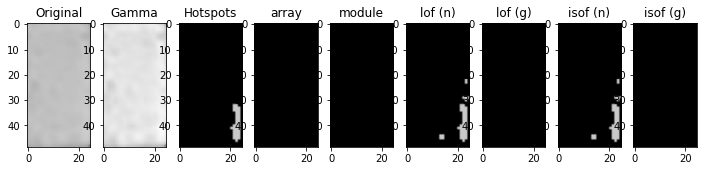

[-1.01763303 -1.02589054 -0.96440177 -1.00029918 -1.02083181 -0.9954071
 -1.02335705 -1.00989311 -1.01488841 -1.02074273]
[-2.28186883]
[-0.44821737 -0.47311501 -0.43311158 -0.45325246 -0.46832681 -0.45151473
 -0.52732822 -0.44296314 -0.466801   -0.49017324]
[-0.75637377]
[-0.96448857 -0.98670101 -1.04119947 -1.07727029 -0.99807983 -0.99221336
 -1.17245679 -0.97033403 -0.97870041 -1.72081834]
[-2.28186883]
[-0.4778582  -0.50810454 -0.48675416 -0.53870752 -0.50301986 -0.48491005
 -0.4852241  -0.46079584 -0.4557243  -0.64004163]
[-0.75637377]
4632.jpg Normal [6.05158077]
[-1.         -1.02255438 -1.         -1.33926571 -0.99598997 -1.
 -0.98377419 -1.         -1.00280328 -0.9746143 ]
[-2.19250165]
[-0.45220853 -0.47930911 -0.44440805 -0.53828928 -0.43983548 -0.44652152
 -0.4527561  -0.4319019  -0.45664691 -0.44468073]
[-0.73850033]
[-2.03334501 -1.00530054 -1.52103531 -0.99606025 -2.08170681 -1.84849547
 -1.09177291 -1.37450855 -2.5954166  -2.33211347]
[-2.19250165]
[-0.74130154 -0.55019

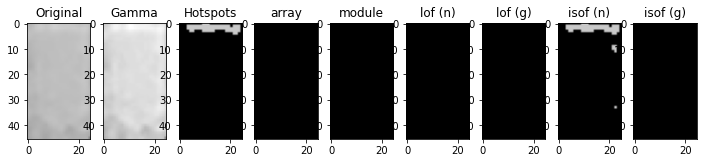

[-0.96642159 -1.0933138  -1.0207841  -1.         -0.9859375  -1.02213668
 -1.02443168 -1.20206816 -0.987863   -0.9960829 ]
[-2.37937923]
[-0.46468027 -0.49754683 -0.48874902 -0.44877906 -0.43526014 -0.47458626
 -0.4532969  -0.52359424 -0.46626603 -0.45113323]
[-0.77587585]
[-1.01888764 -1.04772178 -1.49086748 -1.01736776 -1.02968581 -1.93176444
 -0.97898968 -0.99242057 -1.05818337 -1.019312  ]
[-2.37937923]
[-0.5051475  -0.47063244 -0.63243136 -0.48058381 -0.46846498 -0.70674258
 -0.44971821 -0.44784645 -0.52757099 -0.46766462]
[-0.77587585]
2519.jpg Normal [7.57494051]
[-1.26557671 -1.02707885 -1.12589702 -1.00721418 -1.06916153 -1.20290216
 -0.98010748 -1.28673409 -1.09609099 -0.98852301]
[-2.06021062]
[-0.58028044 -0.44834742 -0.52747909 -0.47153525 -0.49215887 -0.56322329
 -0.42856752 -0.56834224 -0.51292748 -0.46838578]
[-0.71204212]
[-1.55370488 -0.98436464 -1.31155482 -1.00821967 -1.10451033 -1.41783788
 -1.01219703 -1.11162024 -1.25352728 -1.06910516]
[-2.06021062]
[-0.64422662

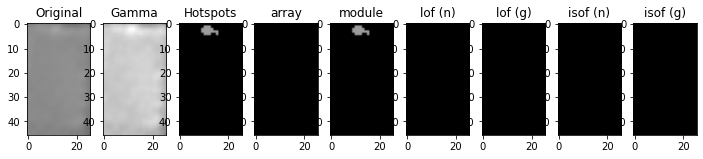

[-1.07688935 -1.01333647 -1.00474183 -0.98046819 -1.03781016 -1.34742634
 -1.03781016 -0.9967492  -0.97713008 -0.98031669]
[-2.20627621]
[-0.47627144 -0.47115022 -0.46572654 -0.48042625 -0.46626767 -0.57562163
 -0.46626767 -0.47140269 -0.44838885 -0.46349168]
[-0.74125524]
[-1.88769466 -1.17931117 -1.52337138 -1.09677016 -1.58944962 -1.01242535
 -1.66088556 -1.00961557 -1.33219101 -1.37757989]
[-2.20627621]
[-0.69829629 -0.53700811 -0.61365976 -0.52845188 -0.6200277  -0.46063315
 -0.63893573 -0.50366147 -0.56467118 -0.57516152]
[-0.74125524]
2280.jpg Normal [5.08482738]
[-1.04231669 -0.99434233 -1.00014531 -0.99414039 -0.99384278 -0.98147994
 -1.24851242 -2.90629704 -0.98848768 -0.99922533]
[-2.18395445]
[-0.50171786 -0.46871682 -0.45833898 -0.48277832 -0.44450064 -0.46653092
 -0.55798056 -0.66994296 -0.45214706 -0.46410204]
[-0.73679089]
[-1.8195315  -1.31357355 -0.98393791 -1.54749325 -1.08748756 -1.41404554
 -2.46955627 -2.34678959 -1.01437491 -1.07251635]
[-2.18395445]
[-0.64062364

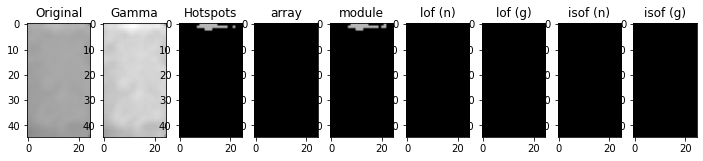

[-1.07015471 -1.60653893 -0.98358416 -1.17284843 -1.07896226 -2.89044605
 -0.96334328 -1.03689819 -1.06592899 -1.29002193]
[-2.09918122]
[-0.49841167 -0.57327758 -0.46534843 -0.51018611 -0.50295729 -0.69299964
 -0.47198629 -0.49360568 -0.48021285 -0.54045027]
[-0.71983624]
[-1.40849831 -1.00438192 -1.77997939 -1.14897873 -1.39049965 -1.08010005
 -2.13791882 -1.65773704 -1.59739474 -0.98423304]
[-2.09918122]
[-0.58903393 -0.50963754 -0.61274166 -0.52994222 -0.58474338 -0.48842798
 -0.66984753 -0.61118295 -0.58683605 -0.47816053]
[-0.71983624]
235.jpg Normal [3.97357319]
[-1.02889458 -0.99697404 -0.99697404 -0.97846325 -1.26439984 -0.9904187
 -0.97451524 -1.09047636 -0.99869959 -0.99256045]
[-2.43406828]
[-0.48522759 -0.4647615  -0.4647615  -0.47668811 -0.55106788 -0.44400463
 -0.47896648 -0.50780121 -0.48937484 -0.47395308]
[-0.78681366]
[-3.81758987 -2.69973185 -2.69973185 -3.24621855 -4.82209753 -2.03324257
 -3.16788538 -4.14935387 -3.56876688 -3.40288488]
[-2.43406828]
[-0.74908535 -

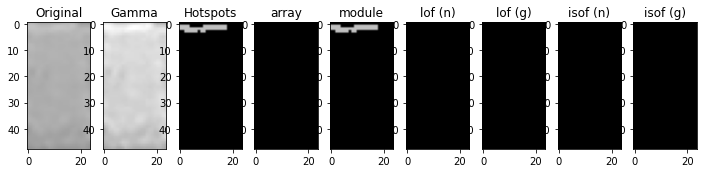

[-0.99798387 -0.97309267 -1.00920595 -1.01319789 -1.         -1.04185356
 -1.00364422 -1.01906651 -1.03027295 -0.99329618]
[-2.22300872]
[-0.47141183 -0.45288743 -0.47905048 -0.46877598 -0.45728314 -0.44883191
 -0.47977982 -0.46338344 -0.47617178 -0.47192363]
[-0.74460174]
[-1.1135714  -1.00115584 -0.99497532 -1.54021081 -1.07545622 -1.05262177
 -1.01068559 -0.98828026 -0.97499545 -1.220665  ]
[-2.22300872]
[-0.56966623 -0.52242344 -0.55198926 -0.67433746 -0.56139242 -0.51029854
 -0.55902828 -0.51766777 -0.53450392 -0.58471059]
[-0.74460174]
4342.jpg Normal [5.28455857]
[-0.94824194 -1.51934661 -1.00394716 -1.86859884 -1.03757495 -0.99047371
 -0.9715345  -0.97599731 -1.13911465 -1.35507298]
[-2.28010106]
[-0.43066372 -0.57536381 -0.46808133 -0.60020441 -0.45253724 -0.45823806
 -0.44338878 -0.43399727 -0.51826365 -0.54607137]
[-0.75602021]
[-1.21533504 -1.02054563 -0.99812706 -1.008358   -1.03117208 -1.04729944
 -1.01274704 -1.28797666 -1.04101039 -1.00779777]
[-2.28010106]
[-0.59781592

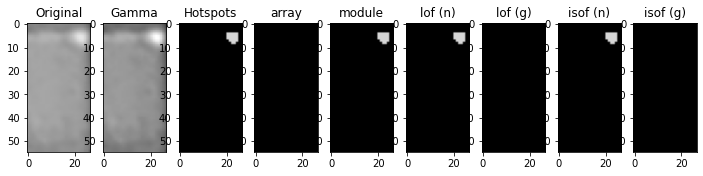

[-1.02369102 -1.00811349 -1.05520567 -1.0161898  -0.98889294 -0.98951365
 -1.05520567 -0.98010748 -1.00705206 -0.98648583]
[-2.06021062]
[-0.42964741 -0.45517852 -0.44531658 -0.45183498 -0.42835315 -0.46017734
 -0.44531658 -0.42856752 -0.46348726 -0.45169305]
[-0.71204212]
[-1.10451033 -0.98909416 -1.1938139  -0.98436464 -1.06676071 -1.01118772
 -1.18009754 -1.07132559 -0.98293465 -1.44194331]
[-2.06021062]
[-0.55775275 -0.47054006 -0.560649   -0.48359978 -0.54564086 -0.45956716
 -0.5542083  -0.49906445 -0.47216305 -0.63415419]
[-0.71204212]
2055.jpg Normal [3.63254181]
[-1.08878352 -0.99954904 -1.30984413 -1.10501277 -1.05148492 -1.00501778
 -1.03152397 -1.05579759 -1.1452262  -0.99698071]
[-2.21859192]
[-0.54790863 -0.47160584 -0.6015379  -0.55344137 -0.53474051 -0.44390807
 -0.49986467 -0.50885258 -0.55042679 -0.46548353]
[-0.74371838]
[-1.44517257 -1.06608205 -2.03912444 -1.53782245 -1.24817839 -1.04183929
 -1.07898916 -1.16604818 -1.67183387 -1.05004851]
[-2.21859192]
[-0.66254104

[-1.04537448 -1.00131139 -1.07596589 -1.12393625 -0.99268082 -1.05856006
 -1.06916153 -0.98155021 -1.23617197 -0.92893047]
[-2.06021062]
[-0.48177213 -0.4461229  -0.53088239 -0.55317496 -0.44925523 -0.48972158
 -0.49215887 -0.44935524 -0.5597989  -0.42165045]
[-0.71204212]
[-1.06730163 -1.04842465 -1.21261753 -1.0381303  -0.99960592 -1.10114788
 -1.12020751 -1.07504975 -1.52521664 -1.00296936]
[-2.06021062]
[-0.51856536 -0.45988379 -0.55921774 -0.5112855  -0.46716711 -0.53723328
 -0.5500795  -0.48185005 -0.63607664 -0.45834489]
[-0.71204212]
2069.jpg Normal [3.63254181]
[-0.96923862 -1.2284397  -1.01763303 -0.96865835 -1.0035601  -1.00993861
 -1.0303646  -1.0372064  -1.02335705 -0.97273849]
[-2.28186883]
[-0.43754757 -0.51058026 -0.44821737 -0.47673654 -0.44902698 -0.44752178
 -0.45437748 -0.51491694 -0.52732822 -0.44566525]
[-0.75637377]
[-1.03127597 -0.9800174  -1.22766351 -1.03489332 -0.99807983 -0.97617937
 -1.0060653  -1.02098354 -0.99443467 -1.04289589]
[-2.28186883]
[-0.48534901

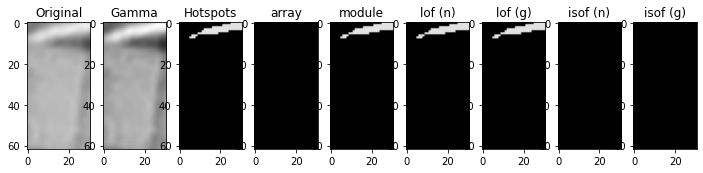

[-1.02475089 -0.99311516 -1.14436527 -1.08016283 -0.99777199 -0.99457631
 -1.02536381 -1.08233949 -0.99056504 -1.45204301]
[-2.18395445]
[-0.46190995 -0.46711766 -0.49280254 -0.45444064 -0.44963294 -0.45164034
 -0.42296061 -0.4668693  -0.44046471 -0.5374561 ]
[-0.73679089]
[-1.51196315 -1.10162866 -0.97724194 -1.64434992 -1.15771808 -1.38524624
 -2.51664527 -1.04400122 -1.8992562  -1.0046384 ]
[-2.18395445]
[-0.58701076 -0.52051284 -0.48168271 -0.62035848 -0.53288412 -0.58360311
 -0.71918414 -0.47105516 -0.6588282  -0.45841227]
[-0.73679089]
779.jpg Normal [4.83008144]
[-1.03010436 -1.05524693 -0.98972236 -1.32272015 -0.97451863 -1.07622172
 -1.04666769 -1.04060797 -0.98545868 -1.00223291]
[-2.22449335]
[-0.50743163 -0.5311311  -0.52353468 -0.63962507 -0.52176291 -0.48798539
 -0.53815756 -0.49006458 -0.45219635 -0.5035549 ]
[-0.74489867]
[-1.19835706 -2.26599083 -1.92339765 -3.26554172 -1.82709855 -1.02704221
 -2.10816701 -1.13570492 -1.00006158 -1.46745415]
[-2.22449335]
[-0.59066168 

[-0.99804192 -1.11275781 -1.01600246 -0.99538065 -0.9916107  -1.06845512
 -1.11275781 -0.99414039 -1.04056023 -1.28977829]
[-2.18395445]
[-0.47303692 -0.52998898 -0.47907861 -0.44998761 -0.46677883 -0.50824935
 -0.52998898 -0.48277832 -0.46789503 -0.55968492]
[-0.73679089]
[-1.34062655 -2.28643239 -1.8195315  -1.11206673 -1.61132532 -2.06668374
 -2.24195945 -1.64434992 -0.97641086 -2.7259297 ]
[-2.18395445]
[-0.56266407 -0.69295902 -0.64062364 -0.51848916 -0.60977008 -0.68632984
 -0.69192486 -0.62035848 -0.48110823 -0.7375187 ]
[-0.73679089]
4380.jpg Normal [4.83008144]
[-1.         -1.018078   -0.99932432 -1.09267142 -1.0404135  -0.99210663
 -2.62045896 -0.97137164 -0.99087533 -0.96908723]
[-2.04152293]
[-0.42287253 -0.46461489 -0.45945087 -0.4745856  -0.45335754 -0.47541827
 -0.72103195 -0.42448209 -0.44980698 -0.42943746]
[-0.70830459]
[-0.98861643 -1.67632873 -1.38165288 -0.99286476 -1.15640514 -1.95671538
 -1.66720765 -1.01464953 -1.21998032 -1.04659767]
[-2.04152293]
[-0.51313504

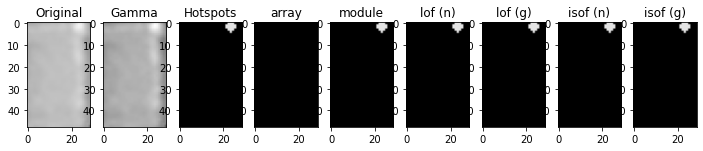

[-0.98603323 -1.05859433 -1.00070572 -1.02193565 -1.01205546 -1.49404083
 -1.05438641 -1.0632646  -1.0257631  -1.00434887]
[-2.15913831]
[-0.4438675  -0.5019869  -0.44848354 -0.45671516 -0.46443998 -0.57575645
 -0.47299011 -0.46191344 -0.45254558 -0.43384014]
[-0.73182766]
[-1.09783707 -1.009939   -1.09597886 -1.09493109 -1.25289113 -0.96590063
 -1.01207546 -1.2045826  -1.013071   -1.07519177]
[-2.15913831]
[-0.53472777 -0.45631247 -0.51164514 -0.51076987 -0.58981532 -0.45953884
 -0.46956208 -0.5762503  -0.46767762 -0.52802041]
[-0.73182766]
787.jpg Normal [4.56182169]
[-0.9859375  -1.07509835 -1.7082953  -0.96883224 -2.15994224 -0.96100271
 -0.95307955 -1.32655834 -1.12563831 -3.90990912]
[-2.37937923]
[-0.43526014 -0.50157068 -0.59365194 -0.44651956 -0.63106252 -0.44333228
 -0.45036851 -0.57764929 -0.50081657 -0.72947547]
[-0.77587585]
[-1.15826961 -1.02968581 -0.97733324 -1.25382945 -0.97517072 -1.00105033
 -1.03368201 -1.04638776 -0.97853621 -2.29853186]
[-2.37937923]
[-0.55658686 

[-0.99490313 -1.01982718 -0.99771102 -1.00704851 -1.01876199 -2.01791866
 -1.04445658 -0.97713008 -0.97696765 -1.        ]
[-2.20627621]
[-0.47516389 -0.48272505 -0.46864331 -0.46066006 -0.48080054 -0.67837837
 -0.48337933 -0.44838885 -0.47024887 -0.47230039]
[-0.74125524]
[-1.09677016 -1.02021537 -1.23102635 -1.05729985 -1.01839809 -1.55311515
 -1.88769466 -1.00433816 -1.11173675 -1.33219101]
[-2.20627621]
[-0.52845188 -0.48263667 -0.55498089 -0.50927922 -0.46608034 -0.58300861
 -0.69829629 -0.46746212 -0.51657696 -0.56467118]
[-0.74125524]
4357.jpg Normal [5.08482738]
[-1.06368538 -1.46084787 -0.99835168 -0.98842789 -2.07865945 -0.9715345
 -1.02171314 -1.03220064 -1.01486302 -1.07706671]
[-2.28010106]
[-0.46769542 -0.52680684 -0.45967237 -0.43469621 -0.66915889 -0.44338878
 -0.47305852 -0.45022192 -0.47297228 -0.47010208]
[-0.75602021]
[-0.9687624  -1.02356926 -1.1939383  -1.00779777 -1.48176293 -1.03728383
 -0.99812706 -1.04729944 -1.01358332 -1.06447511]
[-2.28010106]
[-0.46901446 

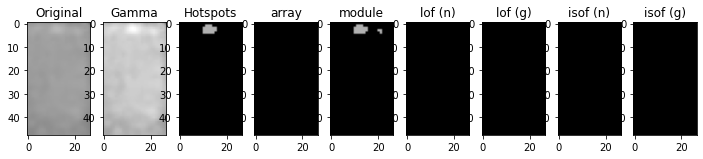

[-1.02501589 -1.         -1.25605127 -0.98377419 -1.06157645 -1.
 -1.15343834 -1.00012772 -1.92771034 -1.        ]
[-2.19250165]
[-0.46379679 -0.43694374 -0.5383966  -0.4527561  -0.48942969 -0.45220853
 -0.51415861 -0.4691971  -0.64067947 -0.44362084]
[-0.73850033]
[-0.99081491 -1.34607798 -0.99363943 -1.10673488 -1.06667451 -2.18057983
 -1.03632548 -1.01425037 -0.99760186 -1.64107708]
[-2.19250165]
[-0.53030473 -0.62949776 -0.47083841 -0.56954631 -0.51641065 -0.74999443
 -0.48851508 -0.53230573 -0.4464179  -0.69087755]
[-0.73850033]
963.jpg Normal [4.92608216]
[-1.01337118 -1.00853962 -0.95422072 -0.98549471 -0.99959144 -1.01902768
 -0.95422072 -1.12067372 -0.98549471 -1.0042387 ]
[-2.43406828]
[-0.44294368 -0.47940921 -0.44100486 -0.44846586 -0.46542761 -0.4699033
 -0.44100486 -0.52593175 -0.44846586 -0.46586096]
[-0.78681366]
[-3.90053087 -1.03475853 -2.24340947 -2.93288588 -1.58629888 -1.64904805
 -2.101669   -0.99168172 -3.01121905 -1.16171243]
[-2.43406828]
[-0.74908535 -0.474370

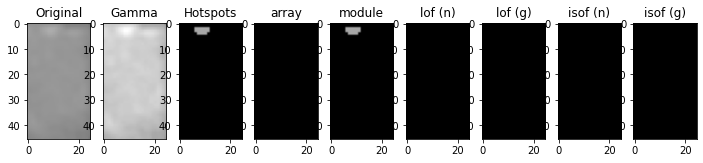

[-1.07774634 -1.01689519 -1.02235401 -1.61229304 -0.97263469 -1.02675952
 -0.99913281 -1.00997991 -1.01036961 -1.02235401]
[-2.22449335]
[-0.44429178 -0.5028802  -0.45346455 -0.61573312 -0.42919587 -0.45161582
 -0.45636102 -0.44427357 -0.4483378  -0.45346455]
[-0.74489867]
[-1.4273169  -1.06024319 -2.06197467 -0.98312076 -1.61971236 -1.04827154
 -0.98055778 -2.80361833 -1.24655913 -2.06197467]
[-2.22449335]
[-0.67455567 -0.48103177 -0.74989176 -0.45195402 -0.69852076 -0.53239538
 -0.51959043 -0.7836065  -0.6083332  -0.74989176]
[-0.74489867]
2732.jpg Normal [5.30265469]
[-1.0372099  -1.07896226 -1.00592965 -1.03470431 -0.9774525  -0.9448952
 -1.03470431 -0.9774525  -0.98376123 -1.03577873]
[-2.09918122]
[-0.45488629 -0.50295729 -0.4761506  -0.44425911 -0.43299066 -0.43114654
 -0.44425911 -0.43299066 -0.47334288 -0.45751786]
[-0.71983624]
[-1.48618602 -0.99084901 -1.65773704 -0.99008547 -1.28278041 -0.98493901
 -0.99008547 -1.31458488 -1.95004111 -1.48618602]
[-2.09918122]
[-0.60760585 

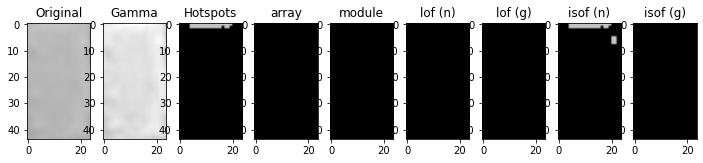

[-1.01640664 -0.994004   -1.11393154 -1.00033277 -1.0288506  -1.00309913
 -1.3336439  -1.04894057 -1.00987583 -0.96609751]
[-2.17100213]
[-0.46402746 -0.42076686 -0.49462377 -0.4322018  -0.43344919 -0.45157686
 -0.55691291 -0.43265707 -0.43257132 -0.41724843]
[-0.73420043]
[-1.06040717 -1.70346217 -1.02989191 -1.38673804 -1.18801239 -1.13273987
 -0.99599637 -2.40936475 -1.30456098 -1.82527633]
[-2.17100213]
[-0.51354476 -0.63265452 -0.50012464 -0.60254812 -0.56369481 -0.54374169
 -0.46406522 -0.72711389 -0.56958156 -0.67182358]
[-0.73420043]
234.jpg Normal [4.68815677]
[-1.00745654 -1.05090431 -1.04205416 -1.06166939 -0.98634045 -0.94450227
 -1.06040252 -0.99398892 -1.06702507 -0.95864916]
[-2.2724569]
[-0.47933798 -0.4574757  -0.49213971 -0.48101077 -0.50050816 -0.48288836
 -0.48796297 -0.48198167 -0.48663897 -0.49217031]
[-0.75449138]
[-1.10543403 -0.99084722 -1.0861867  -1.09301487 -1.10543403 -0.99540758
 -1.3173169  -0.97840426 -1.0225568  -1.18608915]
[-2.2724569]
[-0.58630379 -0

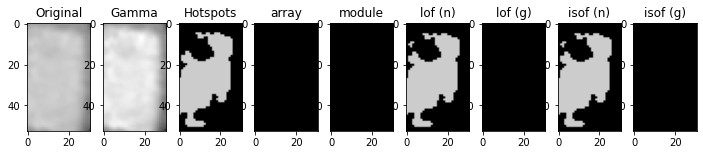

[-1.01008625 -0.95707515 -1.00379265 -5.720423   -0.99718902 -0.95461862
 -0.98968253 -0.98968253 -1.04185356 -1.01682124]
[-2.22300872]
[-0.46180789 -0.44682202 -0.44708896 -0.79611663 -0.4667374  -0.44891118
 -0.44190138 -0.44190138 -0.44883191 -0.47110969]
[-0.74460174]
[-1.04462448 -0.97845158 -0.97730373 -3.79728745 -1.06084889 -1.0103059
 -0.99497532 -0.99741816 -0.97523515 -1.220665  ]
[-2.22300872]
[-0.5606492  -0.52128441 -0.53115133 -0.75075635 -0.48930114 -0.50792336
 -0.55198926 -0.55535951 -0.52996999 -0.58471059]
[-0.74460174]
2295.jpg Normal [5.28455857]
[-1.63744952 -0.9752556  -1.46010842 -1.38151971 -1.06958906 -0.96440177
 -1.85025884 -1.21664622 -0.97963083 -2.16947283]
[-2.28186883]
[-0.61653704 -0.49290888 -0.61749873 -0.569619   -0.52811138 -0.43311158
 -0.63492696 -0.56294403 -0.47769608 -0.67074571]
[-0.75637377]
[-1.11750582 -1.01399316 -1.02211709 -1.00536107 -0.99807983 -1.01700631
 -1.27073942 -0.99293355 -1.01080234 -1.52079702]
[-2.28186883]
[-0.57259189 

[-1.02522676 -1.01438051 -1.01228992 -0.97657185 -1.90627609 -0.97818143
 -1.01438051 -1.01051509 -2.52828193 -1.29666022]
[-2.23087184]
[-0.42205833 -0.46624753 -0.43025976 -0.4477336  -0.62997001 -0.41642753
 -0.46624753 -0.43110171 -0.70982517 -0.54040224]
[-0.74617437]
[-5.01100392 -1.83173127 -3.46908456 -6.54831254 -1.00990909 -4.92410789
 -1.77431715 -3.21429304 -1.06075139 -1.01782021]
[-2.23087184]
[-0.76807441 -0.6790486  -0.73951738 -0.77906535 -0.44188433 -0.76444533
 -0.67207076 -0.7390172  -0.48096079 -0.48851164]
[-0.74617437]
1005.jpg Normal [5.38110963]
[-0.99640009 -1.10377989 -1.48435254 -0.99640009 -1.05553497 -1.0274367
 -0.99907886 -1.9828618  -1.19771812 -0.95461862]
[-2.22300872]
[-0.49502372 -0.51651355 -0.5665885  -0.49502372 -0.51076887 -0.46106034
 -0.48338048 -0.62756782 -0.5270081  -0.44891118]
[-0.74460174]
[-1.08678515 -0.98771513 -1.0312363  -1.08512012 -1.03215937 -0.99791451
 -1.04466064 -1.02187234 -1.00269821 -1.220665  ]
[-2.22300872]
[-0.50284721 

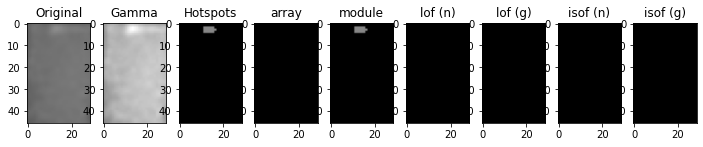

[-1.06348569 -0.97036213 -1.04965511 -1.         -1.03707107 -1.03645053
 -1.         -0.99458756 -1.51771464 -0.97137164]
[-2.04152293]
[-0.46347558 -0.44090391 -0.48497921 -0.42287253 -0.4603688  -0.43565003
 -0.42287253 -0.44470122 -0.59986931 -0.42448209]
[-0.70830459]
[-2.05976347 -1.15640514 -1.00857436 -1.38165288 -1.00641627 -1.67632873
 -1.41752786 -1.10576185 -1.03837422 -1.63199409]
[-2.04152293]
[-0.71640183 -0.55460808 -0.47513372 -0.58522865 -0.51140355 -0.63727113
 -0.58470405 -0.52746033 -0.44892116 -0.62461014]
[-0.70830459]
2524.jpg Normal [3.47954877]
[-1.0308305  -1.00784314 -0.99730299 -1.00836311 -0.99056504 -0.99922533
 -0.9916107  -1.01670809 -0.99384278 -1.02524317]
[-2.18395445]
[-0.46448674 -0.4563037  -0.46886327 -0.45352395 -0.44046471 -0.46410204
 -0.46677883 -0.43908242 -0.44450064 -0.44785899]
[-0.73679089]
[-1.41404554 -2.15301357 -1.64434992 -1.18782651 -1.02915141 -1.7416475
 -2.88420105 -1.05392738 -1.94111308 -1.34062655]
[-2.18395445]
[-0.58248819 

[-1.01288595 -0.99533929 -1.06000643 -1.1779323  -1.0150765  -0.99774144
 -1.13383466 -1.00335318 -1.73267154 -0.99533929]
[-2.20209888]
[-0.49567382 -0.49126926 -0.50261666 -0.51964133 -0.49848624 -0.44994117
 -0.51895977 -0.48313693 -0.60237881 -0.49126926]
[-0.74041978]
[-1.11518975 -1.22874843 -1.05306147 -1.02602064 -1.08149069 -1.46922769
 -1.0213929  -1.16226202 -0.96375945 -1.24901644]
[-2.20209888]
[-0.54556945 -0.58187288 -0.52930432 -0.49377579 -0.53652011 -0.64817798
 -0.48652122 -0.56676751 -0.44230496 -0.58175739]
[-0.74041978]
354.jpg Normal [5.03615258]
[-1.00394716 -1.13911465 -1.01811213 -0.97893615 -1.03757495 -1.46084787
 -3.29512984 -0.97893615 -1.13911465 -1.02085104]
[-2.28010106]
[-0.46808133 -0.51826365 -0.44583543 -0.46219654 -0.45253724 -0.52680684
 -0.79719464 -0.46219654 -0.51826365 -0.46838717]
[-0.75602021]
[-1.06291444 -1.06349671 -1.41616391 -1.01093688 -1.26559476 -0.9687624
 -1.45634406 -1.03117208 -1.06349671 -1.15542416]
[-2.28010106]
[-0.53987056 -

[-0.96934269 -1.00778553 -0.98868082 -1.00084334 -1.03058541 -3.0216648
 -1.05664447 -0.98279705 -0.98010748 -1.02831002]
[-2.06021062]
[-0.46870562 -0.43887662 -0.45019047 -0.43586475 -0.48308157 -0.73851736
 -0.49337828 -0.45806913 -0.42856752 -0.45231246]
[-0.71204212]
[-1.13150254 -1.03973404 -1.0972405  -0.99458945 -1.34442587 -2.27965486
 -1.01781285 -1.10114788 -0.9943936  -1.02876628]
[-2.06021062]
[-0.53993204 -0.5030853  -0.53925247 -0.47001904 -0.6115001  -0.70330459
 -0.45544724 -0.53723328 -0.47947333 -0.47417279]
[-0.71204212]
3799.jpg Normal [3.63254181]
[-0.97855714 -1.0288506  -1.2455002  -1.         -1.00279456 -1.00516478
 -1.01640664 -1.01652447 -0.97744361 -1.03454074]
[-2.17100213]
[-0.43637013 -0.43344919 -0.53980752 -0.43742467 -0.44932151 -0.44627349
 -0.46402746 -0.44236426 -0.43533661 -0.46331284]
[-0.73420043]
[-1.90160607 -1.18801239 -1.01151067 -1.66408565 -1.07132175 -2.66158476
 -1.06040717 -1.23932053 -1.58533263 -1.03059344]
[-2.17100213]
[-0.69479131 

[-0.95105592 -0.98869126 -1.03757495 -1.07150699 -2.31693716 -1.06368538
 -1.03220064 -1.00397031 -0.97893615 -0.94824194]
[-2.28010106]
[-0.43694994 -0.45029515 -0.45253724 -0.44598306 -0.70021874 -0.46769542
 -0.45022192 -0.43491108 -0.46219654 -0.43066372]
[-0.75602021]
[-1.015173   -1.15542416 -1.0287487  -1.05091766 -1.1903421  -1.08164823
 -1.38564314 -1.21533504 -0.99735666 -1.00406626]
[-2.28010106]
[-0.50722879 -0.58240708 -0.50500819 -0.52302786 -0.52841805 -0.56959559
 -0.600466   -0.59781592 -0.47793703 -0.53086308]
[-0.75602021]
2450.jpg Normal [6.02699815]
[-1.02889458 -0.99635103 -1.00775258 -0.976983   -1.02889458 -0.95422072
 -1.21319361 -1.30108273 -0.97451524 -0.97846325]
[-2.43406828]
[-0.48522759 -0.44775531 -0.45372756 -0.46913705 -0.48522759 -0.44100486
 -0.54704874 -0.54209191 -0.47896648 -0.47668811]
[-0.78681366]
[-3.73464887 -1.04996783 -1.71179721 -0.96857699 -3.73464887 -1.02756657
 -4.56405886 -0.99650497 -2.93288588 -3.08955221]
[-2.43406828]
[-0.74756642

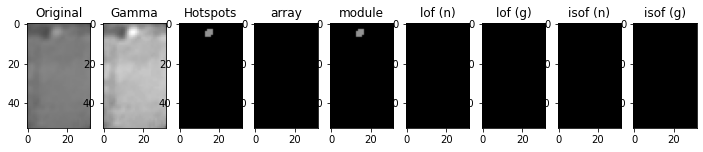

[-0.99835513 -1.         -1.0351881  -1.06235553 -1.03390013 -1.
 -1.00704059 -1.09080444 -1.66989318 -1.06102816]
[-2.18087554]
[-0.46028157 -0.46109157 -0.4930027  -0.49059793 -0.45976374 -0.45290687
 -0.4521693  -0.46783174 -0.604987   -0.46321941]
[-0.73617511]
[-1.02976452 -1.05992207 -0.98942245 -1.2870464  -1.04508534 -1.06609974
 -1.02854185 -1.18181094 -1.15725019 -1.16176609]
[-2.18087554]
[-0.54439533 -0.50391481 -0.46524962 -0.64093708 -0.56802412 -0.50912275
 -0.45168015 -0.58703523 -0.57049661 -0.5928364 ]
[-0.73617511]
4753.jpg Normal [4.79595983]
[-1.20290216 -1.94866328 -1.05294545 -1.38207375 -1.26557671 -0.9888235
 -1.15931405 -1.03618996 -1.07596589 -1.29395824]
[-2.06021062]
[-0.56322329 -0.72406788 -0.49769942 -0.61226206 -0.58028044 -0.45250761
 -0.51883618 -0.50024473 -0.53088239 -0.59881046]
[-0.71204212]
[-1.10778887 -1.67423205 -1.03973404 -1.26688989 -1.16320187 -0.99960592
 -1.10469326 -0.98442574 -1.07520303 -1.18009754]
[-2.06021062]
[-0.54469711 -0.68741

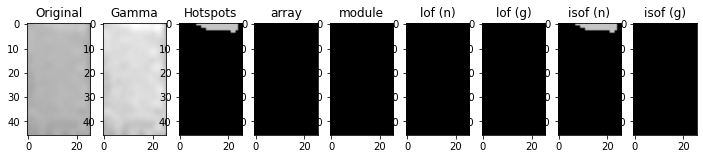

[-0.99544712 -0.99538081 -0.95689881 -1.00218881 -1.09934672 -0.99625215
 -0.98395274 -0.99538081 -0.95428915 -1.06611227]
[-1.99518086]
[-0.4709065  -0.50513891 -0.49144864 -0.47157746 -0.54238508 -0.49045151
 -0.50433594 -0.50513891 -0.47768322 -0.45906002]
[-0.69903617]
[-1.21782669 -0.95018224 -1.21758183 -0.99365079 -1.26977191 -1.26689986
 -1.28499432 -0.99133188 -1.22124687 -0.99835931]
[-1.99518086]
[-0.58882172 -0.48126874 -0.59369444 -0.46122082 -0.60111657 -0.60475932
 -0.59486853 -0.46952567 -0.57371768 -0.47449864]
[-0.69903617]
2444.jpg Normal [3.1273815]
[-1.01014482 -0.99954904 -0.9809862  -1.05820524 -1.00358208 -1.01031827
 -1.00501778 -1.01448724 -1.01072739 -1.01448724]
[-2.21859192]
[-0.46005185 -0.47160584 -0.44446226 -0.47586808 -0.47805726 -0.45895389
 -0.44390807 -0.45614249 -0.45477745 -0.45614249]
[-0.74371838]
[-1.41539226 -1.63626294 -1.06673378 -1.01372575 -1.9927995  -1.13151901
 -1.05638103 -1.22862246 -1.53782245 -1.22862246]
[-2.21859192]
[-0.65614974 

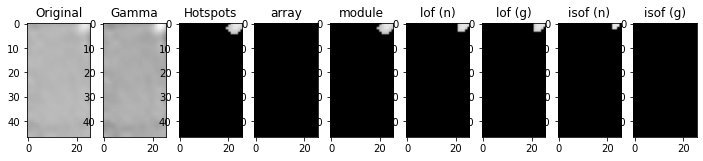

[-0.97675093 -0.96883224 -1.03448141 -1.06417196 -1.02213668 -1.03107991
 -0.99277893 -1.04332687 -0.98507044 -0.99277893]
[-2.37937923]
[-0.47953999 -0.44651956 -0.49157831 -0.4765923  -0.47458626 -0.47088212
 -0.48149793 -0.47357279 -0.46379109 -0.48149793]
[-0.77587585]
[-1.04011683 -1.02669018 -1.49086748 -1.01079606 -1.99055727 -0.97898968
 -1.32434358 -1.04467085 -1.12380254 -1.28908652]
[-2.37937923]
[-0.52233968 -0.46861723 -0.63243136 -0.48055805 -0.70961745 -0.44971821
 -0.58592181 -0.50468264 -0.54021403 -0.59878299]
[-0.77587585]
2685.jpg Normal [7.57494051]
[-0.98302662 -0.99076402 -0.97818143 -1.06259693 -1.01228992 -0.96981128
 -1.10926739 -0.97151026 -1.39125399 -1.01051509]
[-2.23087184]
[-0.423877   -0.45741039 -0.41642753 -0.46682853 -0.43025976 -0.44979008
 -0.43955837 -0.42635408 -0.5417508  -0.43110171]
[-0.74617437]
[-5.09789994 -2.96059037 -6.00118945 -1.83173127 -4.48962779 -3.55401507
 -6.91306128 -5.7276279  -0.98773927 -4.2310853 ]
[-2.23087184]
[-0.76807441

[-1.01569073 -0.99999311 -1.03930895 -1.0073469  -1.01205546 -0.98804444
 -1.24992762 -1.01366052 -0.98024285 -0.9980695 ]
[-2.15913831]
[-0.44852455 -0.46585593 -0.47884419 -0.44827482 -0.46443998 -0.45235796
 -0.55552103 -0.47626988 -0.45420714 -0.46441749]
[-0.73182766]
[-1.03178401 -1.48657338 -1.06176929 -1.09455015 -1.08767339 -1.16062598
 -0.98937079 -1.07573481 -1.00124846 -1.23821408]
[-2.15913831]
[-0.48492693 -0.66757329 -0.45528518 -0.5323059  -0.50479811 -0.56201591
 -0.4721278  -0.53175189 -0.47069168 -0.58424164]
[-0.73182766]
1415.jpg Normal [4.56182169]
[-0.98933988 -1.08233949 -0.99457631 -1.02100945 -0.97237839 -1.08016283
 -0.90787997 -0.99777199 -0.99056504 -1.02536381]
[-2.18395445]
[-0.43952347 -0.4668693  -0.45164034 -0.44574323 -0.43276483 -0.45444064
 -0.42079864 -0.44963294 -0.44046471 -0.42296061]
[-0.73679089]
[-2.33090533 -1.09896825 -1.61132532 -2.06668374 -2.62128748 -1.94111308
 -2.42246727 -1.34062655 -2.19748651 -2.88420105]
[-2.18395445]
[-0.69813557

[-1.         -1.00885577 -1.05790981 -0.97309267 -0.97303299 -1.
 -1.04043856 -1.         -0.99718902 -0.99114108]
[-2.22300872]
[-0.45728314 -0.4911588  -0.48936644 -0.45288743 -0.46251522 -0.47101482
 -0.48177503 -0.45728314 -0.4667374  -0.48779413]
[-0.74460174]
[-0.98373674 -0.99227511 -1.36872122 -1.04466064 -1.07545622 -0.97586936
 -1.30800752 -0.99497532 -1.00475089 -1.220665  ]
[-2.22300872]
[-0.5462809  -0.43360815 -0.63006213 -0.51201385 -0.56139242 -0.5386254
 -0.6175424  -0.55198926 -0.46966374 -0.58471059]
[-0.74460174]
4237.jpg Normal [5.28455857]
[-0.9960829  -1.03890717 -0.97425729 -1.02393257 -1.00989821 -1.11068494
 -1.06741237 -1.07199953 -1.00726976 -1.03966858]
[-2.37937923]
[-0.45113323 -0.51397313 -0.47193071 -0.47100254 -0.45857156 -0.48744219
 -0.5032504  -0.50437659 -0.48167599 -0.48457914]
[-0.77587585]
[-1.0222877  -1.87297161 -1.03059341 -1.01946457 -0.97936191 -1.0184006
 -1.32434358 -2.16903551 -1.18525842 -1.59370567]
[-2.37937923]
[-0.4596546  -0.694488

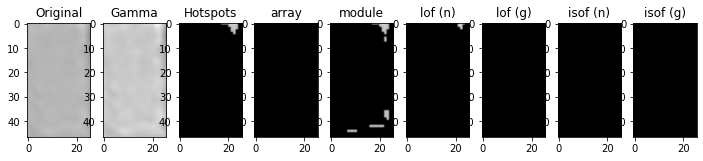

[-0.99745139 -1.21267925 -0.96865835 -1.17641435 -0.97273849 -1.16146882
 -0.96858972 -1.07582796 -1.12380182 -1.03110031]
[-2.28186883]
[-0.44119962 -0.49529572 -0.47673654 -0.52467005 -0.44566525 -0.5423029
 -0.4466107  -0.51952441 -0.49706264 -0.46927426]
[-0.75637377]
[-1.00536107 -1.00385334 -1.01399316 -0.9909701  -0.98247446 -0.99443467
 -1.52079702 -0.98801566 -1.03127597 -0.99293355]
[-2.28186883]
[-0.55431207 -0.46596846 -0.48071906 -0.45350737 -0.48003794 -0.45383579
 -0.63463514 -0.45489383 -0.48534901 -0.48853005]
[-0.75637377]
7.jpg Normal [6.05158077]
[-1.         -1.00521739 -1.         -1.         -1.         -1.
 -1.77095342 -0.99827338 -1.         -1.        ]
[-2.20209888]
[-0.44043234 -0.43322592 -0.44453351 -0.44453351 -0.4450402  -0.45275846
 -0.60549521 -0.41916511 -0.46026584 -0.46026584]
[-0.74041978]
[-1.37600258 -1.08149069 -1.32131052 -1.32131052 -1.10282928 -1.16226202
 -1.08969766 -1.06107462 -1.62087387 -1.62087387]
[-2.20209888]
[-0.62219497 -0.53652011

[-0.99398892 -1.00745654 -1.05090431 -0.96350604 -1.01262327 -1.06166939
 -0.95864916 -1.08746992 -1.06702507 -1.00745654]
[-2.2724569]
[-0.48198167 -0.47933798 -0.4574757  -0.51446302 -0.48019271 -0.48101077
 -0.49217031 -0.51746394 -0.48663897 -0.47933798]
[-0.75449138]
[-1.0861867  -1.18608915 -1.01021587 -1.34335084 -1.0225568  -0.95874099
 -1.29128297 -1.0642771  -1.1326804  -1.1879586 ]
[-2.2724569]
[-0.50239737 -0.60171656 -0.48410855 -0.61902087 -0.52693243 -0.45401465
 -0.5890612  -0.47019091 -0.56615802 -0.5959601 ]
[-0.75449138]
3214.jpg Normal [5.9218431]
[-1.01604406 -0.99012346 -0.99855382 -0.99012346 -1.00139002 -0.99012346
 -1.02642477 -1.00819    -1.00098116 -1.58739547]
[-1.99518086]
[-0.43469586 -0.46332031 -0.48751982 -0.44109538 -0.46698301 -0.4148109
 -0.41906562 -0.47672413 -0.48244967 -0.55762345]
[-0.69903617]
[-1.14752488 -1.26111437 -0.9953039  -1.25245684 -1.25293114 -1.21782669
 -1.20756343 -0.99133188 -1.27383777 -1.05612788]
[-1.99518086]
[-0.56342069 -0.

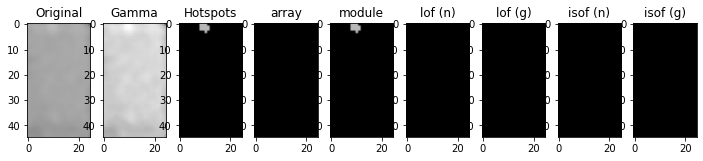

[-0.99837506 -1.02524317 -0.9886988  -0.99777199 -1.293858   -0.99960979
 -0.98848768 -1.05266353 -0.90787997 -1.03671377]
[-2.18395445]
[-0.41487636 -0.44785899 -0.45739421 -0.44963294 -0.50489067 -0.47403917
 -0.45214706 -0.43151489 -0.42079864 -0.46180004]
[-0.73679089]
[-1.15771808 -1.85739931 -1.02915141 -0.98860365 -1.00647178 -2.42246727
 -1.44284483 -1.21864022 -1.05392738 -1.7416475 ]
[-2.18395445]
[-0.53288412 -0.65340912 -0.46049053 -0.45553565 -0.43638574 -0.71148741
 -0.58814182 -0.55443645 -0.50325611 -0.62876583]
[-0.73679089]
2693.jpg Normal [4.83008144]
[-1.00557953 -1.21604609 -0.98141249 -0.95139068 -1.01281408 -1.02323261
 -1.35077659 -1.14562615 -0.98489681 -1.05538432]
[-2.2724569]
[-0.43626093 -0.52869927 -0.43248413 -0.4673002  -0.47321366 -0.49227832
 -0.59145223 -0.49838021 -0.44849542 -0.50169592]
[-0.75449138]
[-1.0537523  -1.04348505 -1.1326804  -1.00989474 -1.03974262 -1.06360419
 -0.98686955 -1.26524904 -1.11112137 -0.9768594 ]
[-2.2724569]
[-0.50137412 -

[-1.03761949 -0.97891976 -0.99697404 -0.98661918 -0.98912331 -0.97451524
 -1.00775258 -1.01262373 -2.18654129 -1.00915779]
[-2.43406828]
[-0.48459125 -0.46420455 -0.46941969 -0.44735869 -0.45098139 -0.47896648
 -0.45372756 -0.45451335 -0.68877155 -0.46369938]
[-0.78681366]
[-1.90616491 -3.24621855 -3.56876688 -1.00511485 -1.11539245 -4.31523587
 -2.69973185 -2.46335157 -1.40710485 -1.41562115]
[-2.43406828]
[-0.63289158 -0.73304139 -0.74202335 -0.4747588  -0.50704895 -0.76134834
 -0.70712169 -0.69808972 -0.55411349 -0.55487044]
[-0.78681366]
2334.jpg Normal [8.59148595]
[-0.98612466 -1.03454074 -1.00802523 -0.994004   -0.99595142 -0.96609751
 -1.00683499 -1.00516478 -1.52434106 -1.02294668]
[-2.17100213]
[-0.43735926 -0.46331284 -0.47012957 -0.42076686 -0.44428486 -0.41724843
 -0.44144491 -0.44627349 -0.58836135 -0.46014486]
[-0.73420043]
[-1.93977093 -1.01974971 -3.03161805 -1.08635503 -1.62470914 -1.11376343
 -2.21190304 -1.44837085 -1.0126252  -2.45914502]
[-2.17100213]
[-0.70330459

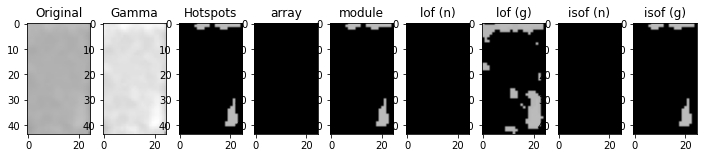

[-1.01514331 -1.21469082 -1.04490313 -1.28684537 -1.46424031 -1.02333191
 -1.04490313 -1.01514331 -1.79233186 -1.12064409]
[-2.18087554]
[-0.48402015 -0.55958054 -0.49576146 -0.54509196 -0.58405151 -0.47634427
 -0.49576146 -0.48402015 -0.64072487 -0.54275618]
[-0.73617511]
[-1.30792645 -1.04101818 -1.16176609 -1.08667524 -1.03336282 -1.22858226
 -1.16176609 -1.35636817 -0.99201041 -1.0300251 ]
[-2.18087554]
[-0.64768765 -0.53419423 -0.5928364  -0.51332935 -0.4965383  -0.61415558
 -0.5928364  -0.65807206 -0.45790809 -0.56828185]
[-0.73617511]
1629.jpg Normal [4.79595983]
[-0.99012346 -0.98421876 -1.01604406 -0.967916   -0.97002137 -1.85565753
 -0.99012346 -0.97380457 -1.00098116 -1.00819   ]
[-1.99518086]
[-0.4148109  -0.44520079 -0.43469586 -0.45122233 -0.44924091 -0.61972279
 -0.4148109  -0.45414519 -0.48244967 -0.47672413]
[-0.69903617]
[-1.25293114 -1.06351601 -0.95018224 -1.01089764 -1.2437993  -0.99365079
 -1.25293114 -1.21782669 -1.08454897 -0.98432096]
[-1.99518086]
[-0.59110801

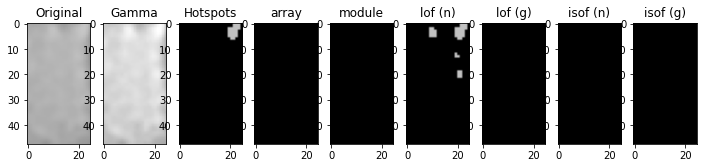

[-1.08550617 -1.         -1.16373128 -1.02443168 -1.60536204 -1.
 -1.07509835 -0.9859375  -1.23248937 -1.03107991]
[-2.37937923]
[-0.47902687 -0.45763371 -0.5283028  -0.4532969  -0.58432384 -0.45763371
 -0.50157068 -0.43526014 -0.54904218 -0.47088212]
[-0.77587585]
[-1.019312   -1.12380254 -1.0204512  -1.03960767 -1.07162087 -1.12380254
 -0.99240433 -1.64619927 -0.98925902 -1.02354619]
[-2.37937923]
[-0.46766462 -0.54021403 -0.48515854 -0.49704529 -0.4788008  -0.54021403
 -0.45989598 -0.652331   -0.46640275 -0.50458787]
[-0.77587585]
1167.jpg Normal [7.57494051]
[-1.04391177 -0.98824097 -0.98603323 -1.00070572 -1.01569073 -1.07712777
 -3.1379786  -1.05438641 -1.05379655 -1.03930895]
[-2.15913831]
[-0.48031579 -0.45983849 -0.4438675  -0.44848354 -0.44852455 -0.49910311
 -0.74898024 -0.47299011 -0.44808738 -0.47884419]
[-0.73182766]
[-0.99461237 -1.08496224 -1.30875685 -1.09455015 -1.45864051 -1.00281366
 -1.74212666 -1.07135845 -1.14120834 -1.02331911]
[-2.15913831]
[-0.46553162 -0.5309

[-1.07735574 -1.03125316 -1.08957528 -1.02649782 -1.274694   -1.1226238
 -1.00223291 -1.01516782 -1.10790458 -1.01516782]
[-2.22449335]
[-0.54288634 -0.51398506 -0.56187706 -0.52261406 -0.63619109 -0.49733626
 -0.5035549  -0.50843283 -0.56879964 -0.50843283]
[-0.74489867]
[-2.6393789  -1.32957381 -2.69326997 -2.16077495 -3.38102256 -1.05546133
 -1.58164781 -2.10816701 -2.86135875 -2.16077495]
[-2.22449335]
[-0.7777962  -0.64456845 -0.77937654 -0.75243289 -0.79751308 -0.5326481
 -0.69522032 -0.75090718 -0.78413686 -0.75243289]
[-0.74489867]
1832.jpg Normal [5.30265469]
[-1.01185574 -0.96217182 -3.41264239 -0.99113268 -1.03841565 -0.99828895
 -0.99113268 -1.03088453 -1.82389267 -1.0064173 ]
[-2.20627621]
[-0.50252522 -0.47224582 -0.78435427 -0.47207668 -0.49441823 -0.47753238
 -0.47207668 -0.46229401 -0.6287679  -0.47413482]
[-0.74125524]
[-1.80911513 -1.20616252 -2.59115286 -1.49033226 -2.06092681 -0.9931697
 -1.52337138 -1.02914848 -1.40694308 -1.7341074 ]
[-2.20627621]
[-0.68602354 -0

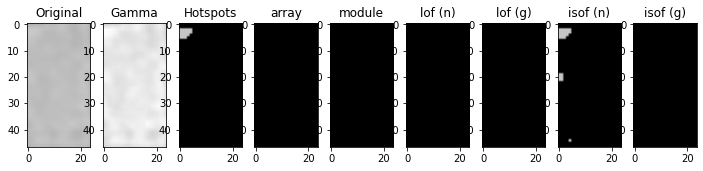

[-0.99557887 -0.97107338 -1.00600127 -1.         -1.         -1.02096665
 -1.         -0.99827338 -1.         -1.62365728]
[-2.20209888]
[-0.45736939 -0.43382276 -0.48923207 -0.44453351 -0.4450402  -0.47413183
 -0.45275846 -0.41916511 -0.44738886 -0.58949486]
[-0.74041978]
[-1.10282928 -1.00172172 -0.99180928 -1.06710436 -1.0213929  -1.46922769
 -1.05240504 -1.01054007 -1.059519   -1.1593887 ]
[-2.20209888]
[-0.54729115 -0.46839472 -0.4519584  -0.53148343 -0.48652122 -0.64817798
 -0.52322368 -0.45807434 -0.52800345 -0.52987715]
[-0.74041978]
2240.jpg Normal [5.03615258]
[-0.99523156 -0.96641647 -1.03645053 -1.00168503 -1.07373041 -1.09267142
 -1.03557851 -1.03645053 -1.018078   -1.29081199]
[-2.04152293]
[-0.45480636 -0.45194589 -0.43565003 -0.47946707 -0.49225542 -0.4745856
 -0.50226541 -0.43565003 -0.46461489 -0.572663  ]
[-0.70830459]
[-1.06341571 -1.02997498 -0.99373107 -1.01480517 -1.00641627 -1.00911495
 -1.00651937 -0.99373107 -1.01433456 -1.81292736]
[-2.04152293]
[-0.5172102  

[-0.97643048 -0.9960306  -1.041659   -1.00881242 -1.01237805 -0.9960306
 -1.01014482 -1.00501778 -0.96775211 -1.29673876]
[-2.21859192]
[-0.44233687 -0.45952316 -0.45727237 -0.45191696 -0.42373168 -0.45952316
 -0.46005185 -0.44390807 -0.44809536 -0.54147244]
[-0.74371838]
[-1.16604818 -1.38561194 -1.05680526 -1.00321279 -1.09141669 -1.35105958
 -1.74297574 -1.14216201 -1.06608205 -0.9652944 ]
[-2.21859192]
[-0.56313464 -0.64647824 -0.55749263 -0.46066792 -0.55977994 -0.62869089
 -0.72292744 -0.56948545 -0.52287764 -0.4376086 ]
[-0.74371838]
3610.jpg Normal [5.23108667]
[-1.0048741  -1.0150765  -1.         -1.03810447 -0.99774144 -1.21407496
 -0.99827338 -1.         -0.99533929 -1.0048741 ]
[-2.20209888]
[-0.44733039 -0.49848624 -0.44666545 -0.45761491 -0.44994117 -0.53460951
 -0.41916511 -0.44287753 -0.49126926 -0.44733039]
[-0.74041978]
[-1.0625106  -1.00302805 -1.21101391 -1.08970722 -1.03718114 -1.03204667
 -1.059519   -1.54380778 -1.00460203 -1.0625106 ]
[-2.20209888]
[-0.526594   

[-1.52134354 -1.06675105 -1.17018853 -1.01031827 -1.22713296 -1.19705617
 -1.0477743  -1.06675105 -1.30984413 -1.1452262 ]
[-2.21859192]
[-0.66896882 -0.52707619 -0.54669806 -0.45895389 -0.58803365 -0.56614623
 -0.51806007 -0.52707619 -0.6015379  -0.55042679]
[-0.74371838]
[-1.94895626 -1.17914074 -1.41539226 -1.04183929 -1.56925723 -1.50638767
 -1.05806907 -1.21161731 -1.67183387 -1.38561194]
[-2.21859192]
[-0.73293853 -0.56211651 -0.65614974 -0.47032706 -0.69858621 -0.68496414
 -0.55037397 -0.57569803 -0.70926138 -0.64647824]
[-0.74371838]
3189.jpg Normal [5.23108667]
[-1.         -1.01762211 -1.         -1.00910805 -0.99557887 -0.98526497
 -1.         -0.99557887 -0.99827338 -1.        ]
[-2.20209888]
[-0.45167814 -0.49078544 -0.45275846 -0.47294212 -0.45736939 -0.45642361
 -0.44043234 -0.45736939 -0.41916511 -0.44160206]
[-0.74041978]
[-1.07263447 -1.66064991 -1.03918203 -1.24901644 -1.11518975 -1.13427909
 -1.05438887 -1.11518975 -1.01281472 -1.06107462]
[-2.20209888]
[-0.54460419

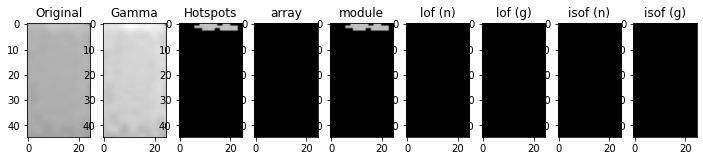

[-1.02100945 -1.98514635 -1.02272514 -0.99457631 -1.293858   -1.01366924
 -0.98933988 -0.98993841 -1.02100945 -0.90787997]
[-2.18395445]
[-0.44574323 -0.59533077 -0.42793201 -0.45164034 -0.50489067 -0.4434077
 -0.43952347 -0.46195181 -0.44574323 -0.42079864]
[-0.73679089]
[-2.10854063 -1.01823679 -2.7782508  -1.61132532 -0.99653937 -1.98296997
 -2.37537828 -1.20045156 -2.10854063 -2.51664527]
[-2.18395445]
[-0.68912167 -0.42851242 -0.74101995 -0.60977008 -0.46429997 -0.67558271
 -0.70525688 -0.54506018 -0.68912167 -0.71918414]
[-0.73679089]
2056.jpg Normal [4.83008144]
[-0.99152666 -0.99827338 -1.01762211 -1.01288595 -1.03067523 -1.
 -1.06444861 -0.99152666 -1.         -1.05083891]
[-2.20209888]
[-0.46740704 -0.41916511 -0.49078544 -0.49567382 -0.51288883 -0.44287753
 -0.55031676 -0.46740704 -0.44666545 -0.47643626]
[-0.74041978]
[-1.05306147 -1.00389929 -1.17387174 -1.0222145  -1.27181796 -1.04828871
 -1.8222401  -1.05438887 -0.99779587 -1.11518975]
[-2.20209888]
[-0.52930432 -0.44370

[-1.02536381 -0.99311516 -0.90787997 -0.99837506 -1.00315462 -1.02475089
 -4.81020866 -1.02100945 -2.17134231 -0.98512442]
[-2.18395445]
[-0.42296061 -0.46711766 -0.42079864 -0.41487636 -0.45768327 -0.46190995
 -0.80140885 -0.44574323 -0.61259473 -0.43524621]
[-0.73679089]
[-2.10854063 -1.05392738 -1.85739931 -2.24195945 -1.08748756 -1.31357355
 -3.27377148 -1.54749325 -1.02566973 -2.7782508 ]
[-2.18395445]
[-0.68912167 -0.50325611 -0.65340912 -0.69192486 -0.52217451 -0.54609567
 -0.73798837 -0.58145782 -0.42801712 -0.74101995]
[-0.73679089]
949.jpg Normal [4.83008144]
[-1.         -1.06018268 -1.05819018 -1.         -1.14669297 -1.0954567
 -0.96100271 -1.05819018 -0.96643571 -1.        ]
[-2.37937923]
[-0.45763371 -0.46786525 -0.45512246 -0.45213174 -0.52053333 -0.50218095
 -0.44333228 -0.45512246 -0.47466529 -0.44252223]
[-0.77587585]
[-1.03059341 -1.01176084 -1.93176444 -1.08204918 -0.97853621 -0.99255216
 -1.06635952 -1.93176444 -1.04843597 -1.21674536]
[-2.37937923]
[-0.51527431 -

[-0.9915689  -0.99458756 -1.07373041 -1.00154625 -0.99216287 -0.9915689
 -0.97338133 -1.04027513 -1.04098958 -1.01049513]
[-2.04152293]
[-0.50439642 -0.44470122 -0.49225542 -0.51221033 -0.43518927 -0.50439642
 -0.45096002 -0.5177245  -0.49002202 -0.45978631]
[-0.70830459]
[-1.25047983 -1.08433312 -1.04124371 -1.4975934  -0.98229181 -1.21998032
 -1.04659767 -1.72066338 -1.02208574 -1.00127524]
[-2.04152293]
[-0.57034557 -0.43991669 -0.53860333 -0.60271112 -0.47118654 -0.56759377
 -0.5140282  -0.64815679 -0.46660521 -0.51054435]
[-0.70830459]
753.jpg Normal [3.47954877]
[-1.00942603 -1.01901502 -0.97002137 -0.96047124 -1.02642477 -2.6311562
 -1.36203132 -0.99012346 -1.10799274 -0.99012346]
[-1.99518086]
[-0.493581   -0.46404843 -0.44924091 -0.42457989 -0.41906562 -0.73143733
 -0.53258108 -0.44109538 -0.50184151 -0.4148109 ]
[-0.69903617]
[-1.26977191 -1.04855969 -1.236938   -1.25293114 -0.94975106 -0.98932204
 -0.95778181 -1.10346552 -1.23514177 -1.08454897]
[-1.99518086]
[-0.60111657 -0

[-1.1052502  -0.994004   -1.01757828 -1.02179297 -0.95232399 -1.
 -1.01757828 -0.95232399 -0.98284439 -0.96609751]
[-2.17100213]
[-0.47487938 -0.42076686 -0.43114026 -0.43900572 -0.42263103 -0.44708468
 -0.43114026 -0.42263103 -0.45411122 -0.41724843]
[-0.73420043]
[-1.02989191 -1.62470914 -1.22401277 -1.93977093 -1.44837085 -2.66158476
 -1.23932053 -1.4141304  -1.07132175 -1.78392721]
[-2.17100213]
[-0.49198064 -0.61467084 -0.56566722 -0.70330459 -0.612826   -0.75060735
 -0.55915099 -0.60797322 -0.52505624 -0.65724994]
[-0.73420043]
790.jpg Normal [4.68815677]
[-1.01609779 -0.98930922 -1.01002559 -0.96362911 -1.02206629 -1.48303732
 -1.02206629 -1.         -0.99066862 -0.98724554]
[-1.93837404]
[-0.44490145 -0.45676217 -0.45433699 -0.4447519  -0.48512106 -0.56507897
 -0.48512106 -0.4433276  -0.44725782 -0.4714024 ]
[-0.68767481]
[-1.17512793 -1.00996004 -1.12245571 -1.07573303 -1.0479671  -0.99582388
 -1.0479671  -1.07195108 -1.19318061 -1.03367676]
[-1.93837404]
[-0.51101237 -0.47239

[-1.19414912 -1.01403428 -1.19414912 -1.03259111 -1.00846264 -1.03259111
 -0.985343   -1.04523016 -1.68204145 -0.99462834]
[-2.22079367]
[-0.54323685 -0.52576495 -0.54323685 -0.47171664 -0.47162815 -0.47171664
 -0.48916526 -0.52420782 -0.69547237 -0.47969748]
[-0.74415873]
[-1.03288642 -1.03152071 -1.03288642 -0.96573542 -1.03985669 -0.96573542
 -0.970894   -1.01267624 -1.23946535 -1.01615668]
[-2.22079367]
[-0.52031559 -0.51787672 -0.52031559 -0.47658592 -0.4707529  -0.47658592
 -0.48575631 -0.46985834 -0.61214385 -0.48684811]
[-0.74415873]
4340.jpg Normal [5.25767417]
[-1.04231669 -0.99704538 -0.99804192 -0.90787997 -0.98147994 -0.99538065
 -0.99804192 -1.01107404 -1.02524317 -0.98848768]
[-2.18395445]
[-0.50171786 -0.45871104 -0.47303692 -0.42079864 -0.46653092 -0.44998761
 -0.47303692 -0.4594172  -0.44785899 -0.45214706]
[-0.73679089]
[-2.56896637 -1.18782651 -1.70807681 -1.0046384  -1.98296997 -1.36428137
 -1.7416475  -1.44284483 -1.07251635 -0.97641086]
[-2.18395445]
[-0.72406654

[-0.97451863 -1.03125316 -1.01342426 -1.00997991 -1.07622172 -1.05524693
 -1.04057317 -1.07572881 -1.00223291 -0.98961865]
[-2.22449335]
[-0.52176291 -0.51398506 -0.50937787 -0.44427357 -0.48798539 -0.5311311
 -0.51527319 -0.50488362 -0.5035549  -0.54274869]
[-0.74489867]
[-2.91909918 -1.96958999 -2.21338289 -1.10298353 -1.36170853 -3.43876299
 -2.06197467 -1.61971236 -2.37120672 -2.53159678]
[-2.22449335]
[-0.78573009 -0.74231975 -0.75549361 -0.55967327 -0.66000102 -0.79751308
 -0.74989176 -0.69852076 -0.76113731 -0.770985  ]
[-0.74489867]
2296.jpg Normal [5.30265469]
[-1.06846566 -1.05820524 -0.9880553  -1.93815647 -0.9880553  -1.15860494
 -1.02570011 -1.20255436 -1.34982101 -3.14546986]
[-2.21859192]
[-0.43479899 -0.47586808 -0.43387544 -0.66520959 -0.43387544 -0.4942259
 -0.44175731 -0.50295351 -0.55661363 -0.75775104]
[-0.74371838]
[-1.19461215 -1.00228339 -1.04736013 -1.0989345  -1.05806907 -1.00321279
 -1.06568473 -1.03045214 -0.91658629 -1.82622967]
[-2.21859192]
[-0.56704692 -

[-1.02989855 -0.99843137 -1.06206455 -1.04005485 -1.19679159 -0.99152666
 -0.98867338 -1.04088294 -1.         -1.05083891]
[-2.20209888]
[-0.48885122 -0.47476574 -0.49322348 -0.49337765 -0.57972521 -0.46740704
 -0.43204859 -0.51032932 -0.44160206 -0.47643626]
[-0.74041978]
[-1.05105595 -1.0061456  -1.02310138 -1.06107462 -1.40707762 -1.01943886
 -1.03204667 -1.08149069 -0.99576247 -1.03534183]
[-2.20209888]
[-0.53146725 -0.45898852 -0.49415388 -0.53058474 -0.62716772 -0.47866944
 -0.43938919 -0.53652011 -0.43647509 -0.51109855]
[-0.74041978]
1774.jpg Normal [5.03615258]
[-1.00501778 -0.99468045 -2.20002299 -1.06846566 -1.34982101 -1.02157608
 -0.97643048 -1.05820524 -1.01101274 -1.01031827]
[-2.21859192]
[-0.44390807 -0.44283873 -0.7011669  -0.43479899 -0.55661363 -0.437626
 -0.44233687 -0.47586808 -0.45755482 -0.45895389]
[-0.74371838]
[-1.06568473 -1.01854909 -1.43541009 -1.02737091 -1.05594597 -1.06608205
 -1.09141669 -1.01372575 -1.32215081 -1.1519269 ]
[-2.21859192]
[-0.5412073  -

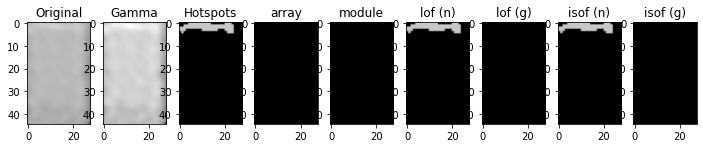

[-0.99087533 -0.97036213 -0.99087533 -1.02858492 -1.03645053 -1.06348569
 -0.98369932 -1.         -1.         -1.03298564]
[-2.04152293]
[-0.44980698 -0.44090391 -0.44980698 -0.48649773 -0.43565003 -0.46347558
 -0.46358903 -0.42287253 -0.43894165 -0.46151992]
[-0.70830459]
[-1.67632873 -1.00641627 -1.67632873 -1.00586164 -1.21998032 -1.41752786
 -2.16760449 -1.04124371 -1.10576185 -0.9943783 ]
[-2.04152293]
[-0.63727113 -0.51140355 -0.63727113 -0.47713165 -0.56759377 -0.58470405
 -0.72812978 -0.53860333 -0.52746033 -0.47208708]
[-0.70830459]
4624.jpg Normal [3.47954877]
[-1.32024291 -0.97751992 -1.01377317 -1.03707526 -0.99798387 -1.03806846
 -1.32024291 -1.14969984 -0.97578501 -0.97054412]
[-2.22300872]
[-0.59411727 -0.51072955 -0.52081309 -0.49994022 -0.47141183 -0.52778649
 -0.59411727 -0.56587759 -0.51001052 -0.51089077]
[-0.74460174]
[-1.33570149 -0.97730373 -1.03003852 -1.03981311 -0.98724984 -1.04462448
 -1.36872122 -1.14327562 -0.97599744 -0.97845158]
[-2.22300872]
[-0.62501649

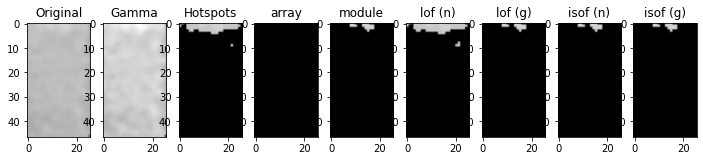

[-1.31295194 -1.14615684 -1.01536157 -0.97798436 -1.25377665 -0.99119082
 -1.01978007 -0.98675915 -1.01243501 -1.04728108]
[-2.45297972]
[-0.60568628 -0.55142794 -0.47612253 -0.51008815 -0.57678162 -0.52678401
 -0.50104971 -0.46010802 -0.47757506 -0.52774795]
[-0.79059594]
[-1.34336026 -1.15273056 -1.01389914 -0.97834013 -1.31103881 -0.98937245
 -1.03432367 -0.99208198 -1.01126016 -1.06638058]
[-2.45297972]
[-0.63797158 -0.56970309 -0.49468317 -0.50584223 -0.62258209 -0.53364272
 -0.53766897 -0.45755701 -0.50293477 -0.55526195]
[-0.79059594]
1990.jpg Normal [8.97386897]
[-1.0015021  -0.98979129 -1.01140785 -1.02142831 -1.02896919 -1.02939328
 -1.00337345 -1.02179039 -1.03436236 -1.02466041]
[-2.10847032]
[-0.45039753 -0.4825748  -0.43989252 -0.4354009  -0.48430546 -0.47613584
 -0.47622124 -0.46411016 -0.43230755 -0.45160856]
[-0.72169406]
[-1.12655554 -1.01663925 -1.03073252 -1.00699766 -1.80683929 -1.00371984
 -1.15949352 -1.04494103 -1.01969783 -1.22587943]
[-2.10847032]
[-0.5515664 

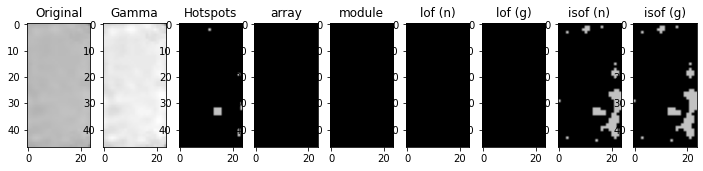

[-0.97951239 -1.01824014 -1.10800288 -0.97431066 -1.02478145 -0.98551902
 -1.01403428 -1.59687479 -1.0379184  -0.97748346]
[-2.22079367]
[-0.46666334 -0.51932483 -0.55137591 -0.44131076 -0.48940625 -0.49863875
 -0.52576495 -0.66304521 -0.49811768 -0.43591201]
[-0.74415873]
[-1.05464386 -1.01615668 -1.03414125 -1.02187042 -0.98611485 -1.01753005
 -1.0151523  -1.15265331 -0.96838894 -0.970894  ]
[-2.22079367]
[-0.47856955 -0.48684811 -0.50431276 -0.48481524 -0.46266359 -0.495117
 -0.51095668 -0.55404512 -0.4701472  -0.46959132]
[-0.74415873]
4156.jpg Normal [5.25767417]
[-1.05034502 -0.94760066 -0.97713879 -1.18256879 -1.03190122 -1.0381003
 -0.97713879 -1.         -1.         -1.20986273]
[-2.19647941]
[-0.48625696 -0.46922965 -0.41132723 -0.4749157  -0.519002   -0.45883027
 -0.44621226 -0.4323961  -0.4323961  -0.48070323]
[-0.73929588]
[-1.04566911 -0.99624458 -0.99859521 -1.10268909 -1.04150343 -1.08316687
 -1.02424963 -0.97079957 -0.98061556 -1.07658589]
[-2.19647941]
[-0.45642431 -0

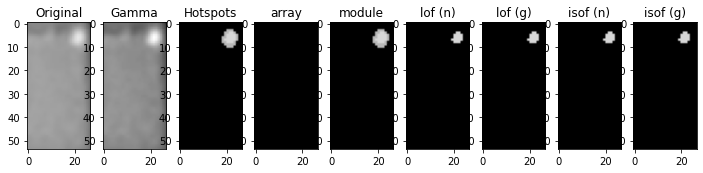

[-0.98492222 -1.05820524 -0.98788369 -1.02061853 -0.99468045 -1.01165573
 -1.16508383 -0.95080169 -1.041659   -1.31062129]
[-2.21859192]
[-0.43405282 -0.47586808 -0.42749997 -0.44472039 -0.44283873 -0.44362514
 -0.50201719 -0.4188398  -0.45727237 -0.54609532]
[-0.74371838]
[-1.41539226 -1.02737091 -1.1079146  -1.05680526 -1.05794936 -1.22862246
 -1.01738063 -1.17914074 -1.78351006 -1.01372575]
[-2.21859192]
[-0.65614974 -0.49806444 -0.56390962 -0.55749263 -0.52267829 -0.59352116
 -0.45907364 -0.56211651 -0.72848903 -0.44977996]
[-0.74371838]
357.jpg Normal [5.23108667]
[-1.02820487 -1.25599312 -1.01893123 -1.14436527 -1.5565113  -0.98993841
 -1.5565113  -0.98993841 -1.16065301 -0.99777199]
[-2.18395445]
[-0.46951885 -0.50396702 -0.46687584 -0.49280254 -0.5630702  -0.46195181
 -0.5630702  -0.46195181 -0.48896654 -0.44963294]
[-0.73679089]
[-1.98296997 -1.38524624 -2.83057191 -1.64434992 -1.08092135 -2.24195945
 -1.09896825 -2.28643239 -1.61132532 -2.56896637]
[-2.18395445]
[-0.67558271 

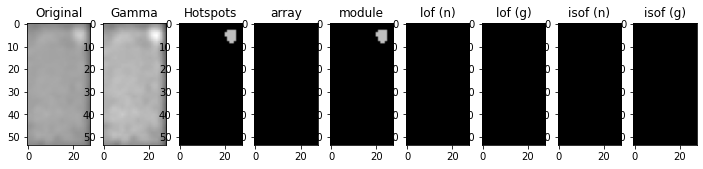

[-0.959      -1.15003852 -1.0048741  -1.47696135 -1.00521739 -1.02428191
 -1.00600127 -0.98867338 -2.405045   -1.00817565]
[-2.20209888]
[-0.43637026 -0.50530881 -0.44733039 -0.55958714 -0.43322592 -0.49529938
 -0.48923207 -0.43204859 -0.71138652 -0.44563319]
[-0.74041978]
[-1.13427909 -0.99576247 -1.08970722 -1.0222145  -1.62087387 -1.01705388
 -1.05240504 -1.27181796 -1.32810565 -1.06047593]
[-2.20209888]
[-0.55503305 -0.43647509 -0.55433499 -0.45783107 -0.67800921 -0.48049795
 -0.52322368 -0.58809025 -0.56422413 -0.53864116]
[-0.74041978]
2490.jpg Normal [5.03615258]
[-1.03492384 -1.21755996 -1.04277781 -1.07782115 -1.13552473 -1.19229283
 -1.08679416 -1.48444405 -0.99029799 -1.06515829]
[-1.93837404]
[-0.49078937 -0.59202605 -0.47983122 -0.54884178 -0.59410175 -0.60435963
 -0.55115911 -0.70330459 -0.45003533 -0.55479055]
[-0.68767481]
[-1.04139899 -1.17373505 -1.03685856 -1.07897854 -1.09800888 -1.14898001
 -1.13431708 -1.39176366 -0.97950699 -1.07396431]
[-1.93837404]
[-0.48218346

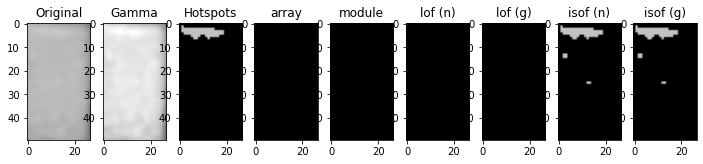

[-0.97643048 -1.01165573 -1.01031827 -1.03483013 -0.9809862  -0.99346677
 -1.03872269 -1.01853986 -0.99189051 -1.61582639]
[-2.21859192]
[-0.44233687 -0.44362514 -0.45895389 -0.46971344 -0.44446226 -0.44426871
 -0.44485566 -0.45719913 -0.44624206 -0.60509304]
[-0.74371838]
[-1.35105958 -1.05847585 -1.44517257 -1.94895626 -1.1079146  -1.56925723
 -1.22862246 -1.00842748 -1.1519269  -1.03825572]
[-2.21859192]
[-0.62869089 -0.51590542 -0.66254104 -0.73293853 -0.56390962 -0.69858621
 -0.59352116 -0.4880196  -0.56501451 -0.4906679 ]
[-0.74371838]
1199.jpg Normal [5.23108667]
[-0.99367181 -0.98082148 -1.03518832 -1.35450893 -0.96369849 -1.06511717
 -0.95520033 -1.02442964 -1.11536732 -1.01737123]
[-2.45297972]
[-0.4382824  -0.46396432 -0.44441998 -0.58135684 -0.44570178 -0.46486193
 -0.42748636 -0.4520463  -0.50758942 -0.45507007]
[-0.79059594]
[-0.98862572 -1.02828561 -1.12154132 -1.13814884 -0.97611219 -1.0046956
 -0.97769633 -1.01571651 -0.99738223 -1.00955812]
[-2.45297972]
[-0.49463947 

[-1.03390013 -1.         -1.06102816 -1.         -1.03147711 -1.01046376
 -1.03390013 -0.99397636 -1.79233186 -1.        ]
[-2.18087554]
[-0.45976374 -0.46483006 -0.46321941 -0.45038457 -0.51275709 -0.46150144
 -0.45976374 -0.46270001 -0.64072487 -0.45277637]
[-0.73617511]
[-1.04101818 -1.09128571 -1.02407693 -0.99936898 -1.2452863  -0.98901344
 -1.02976452 -1.08159887 -1.45084085 -1.04029567]
[-2.18087554]
[-0.53419423 -0.51046929 -0.57958832 -0.44172328 -0.63117998 -0.44205372
 -0.54439533 -0.52929559 -0.57206928 -0.45879984]
[-0.73617511]
2447.jpg Normal [4.79595983]
[-1.07901744 -1.17585234 -1.03869382 -0.99307159 -1.09976778 -0.97014571
 -1.21735301 -1.08593422 -1.3487718  -0.98152595]
[-2.19647941]
[-0.57136927 -0.61035813 -0.58884373 -0.56671137 -0.57110447 -0.5509705
 -0.63831561 -0.53114889 -0.70217984 -0.44735816]
[-0.73929588]
[-0.98061556 -1.07561866 -0.97079957 -0.98173616 -1.0438345  -0.99859521
 -1.07939276 -1.01896073 -1.11713377 -1.01486993]
[-2.19647941]
[-0.52521772 

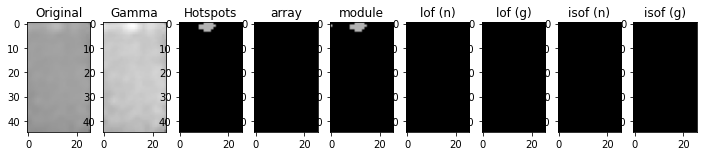

[-1.04981172 -0.99462834 -0.98741135 -1.42654148 -0.98537937 -0.97748346
 -1.04523016 -0.99390519 -1.03259111 -0.99462834]
[-2.22079367]
[-0.48397147 -0.47969748 -0.48755107 -0.61749876 -0.48262327 -0.43591201
 -0.52420782 -0.48745622 -0.47171664 -0.47969748]
[-0.74415873]
[-1.03985669 -1.0151956  -0.970894   -1.22343778 -0.98408388 -1.01615668
 -1.02483722 -0.98445705 -1.00079149 -1.0151956 ]
[-2.22079367]
[-0.4707529  -0.50178346 -0.48575631 -0.58358281 -0.50409055 -0.48684811
 -0.51667368 -0.47241099 -0.48953746 -0.50178346]
[-0.74415873]
2335.jpg Normal [5.25767417]
[-1.01447318 -1.04587739 -0.98687714 -1.00974469 -1.00040965 -0.98274354
 -1.0307125  -1.02478145 -1.06831699 -0.94877291]
[-2.22079367]
[-0.472419   -0.48861912 -0.45921247 -0.47985469 -0.46608542 -0.47526825
 -0.56835897 -0.48940625 -0.48872094 -0.47148563]
[-0.74415873]
[-1.05464386 -1.27152049 -1.04123462 -0.99911123 -1.03619317 -0.96838894
 -0.96491407 -1.15265331 -1.06823768 -0.98408388]
[-2.22079367]
[-0.47856955

[-1.03518832 -1.12529503 -1.20921124 -1.02809124 -1.02809124 -1.08259373
 -1.87099021 -1.02037676 -0.98730147 -1.03396049]
[-2.45297972]
[-0.44441998 -0.45316712 -0.56057289 -0.45026044 -0.45026044 -0.50393636
 -0.65881574 -0.50053246 -0.45461373 -0.46321847]
[-0.79059594]
[-0.99813732 -1.00881194 -1.06309855 -0.97769633 -0.97769633 -1.01237718
 -1.19535759 -0.99655338 -1.18955733 -1.00476094]
[-2.45297972]
[-0.54063792 -0.52107352 -0.46460846 -0.51323392 -0.51323392 -0.46573447
 -0.55714788 -0.46442197 -0.57707201 -0.46398897]
[-0.79059594]
97.jpg Normal [8.97386897]
[-1.00315462 -1.02100945 -1.02272514 -0.98993841 -1.05952877 -1.08233949
 -0.90787997 -1.35105489 -0.9886988  -0.98993841]
[-2.18395445]
[-0.45768327 -0.44574323 -0.42793201 -0.46195181 -0.45184474 -0.4668693
 -0.42079864 -0.51433268 -0.45739421 -0.46195181]
[-0.73679089]
[-1.21864022 -1.8195315  -2.33090533 -1.08092135 -1.57830072 -1.04400122
 -2.10854063 -1.02915141 -1.31357355 -1.08092135]
[-2.18395445]
[-0.55443645 -0

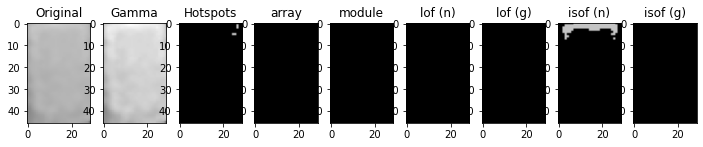

[-0.99867594 -1.03393354 -1.07361247 -0.99953479 -1.02781648 -1.02227813
 -1.04218762 -1.02466041 -1.         -1.0015021 ]
[-2.10847032]
[-0.42957209 -0.47141028 -0.51154637 -0.45174159 -0.48379048 -0.4431044
 -0.44181151 -0.45160856 -0.44108216 -0.45039753]
[-0.72169406]
[-1.03642005 -1.52296221 -1.03305347 -1.02950374 -1.91904746 -1.22587943
 -1.264441   -1.60352192 -1.01969783 -1.42322161]
[-2.10847032]
[-0.55038706 -0.67355542 -0.4540844  -0.49345238 -0.72269833 -0.59566638
 -0.60800094 -0.68413034 -0.54428869 -0.6640642 ]
[-0.72169406]
4208.jpg Normal [4.05947917]
[-0.98632885 -1.04796555 -0.9746093  -1.07330108 -0.98632885 -1.07926444
 -1.05434574 -1.04717332 -0.96672163 -1.10594162]
[-2.22079367]
[-0.46781077 -0.53422031 -0.47112715 -0.50217116 -0.46781077 -0.56364274
 -0.57742812 -0.56701569 -0.4929728  -0.54012342]
[-0.74415873]
[-1.01267624 -1.05299604 -1.09329395 -1.02187042 -1.03152071 -0.96580752
 -1.01619541 -1.03041725 -1.06349046 -1.0310217 ]
[-2.22079367]
[-0.49103498 

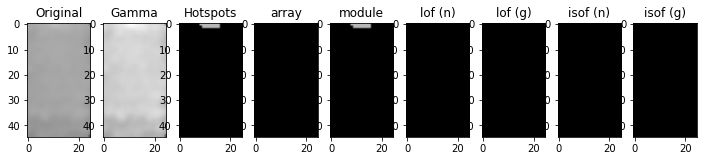

[-1.         -1.00379364 -0.96717079 -1.         -1.         -1.
 -0.98675549 -1.         -1.01305547 -1.00785466]
[-2.18087554]
[-0.45038457 -0.47237379 -0.44849637 -0.4547108  -0.44381837 -0.43609812
 -0.4441114  -0.44597348 -0.45241899 -0.45697859]
[-0.73617511]
[-1.01729368 -1.0078064  -1.09607794 -1.18181094 -1.08945197 -1.0300251
 -1.06840779 -1.02750599 -0.98734303 -0.99936898]
[-2.18087554]
[-0.58422256 -0.45610501 -0.5112398  -0.58703523 -0.53679314 -0.56828185
 -0.50361852 -0.54427034 -0.44194886 -0.44172328]
[-0.73617511]
3573.jpg Normal [4.79595983]
[-0.99960979 -1.24851242 -0.98993841 -1.06845512 -1.05266353 -1.15260864
 -1.45680312 -1.06845512 -1.24851242 -0.98147994]
[-2.18395445]
[-0.47403917 -0.55798056 -0.46195181 -0.50824935 -0.43151489 -0.53650251
 -0.59735174 -0.50824935 -0.55798056 -0.46653092]
[-0.73679089]
[-1.04400122 -2.33090533 -0.98122506 -1.7416475  -0.99689082 -2.02482686
 -2.7782508  -1.70807681 -2.28643239 -1.31357355]
[-2.18395445]
[-0.47105516 -0.69813

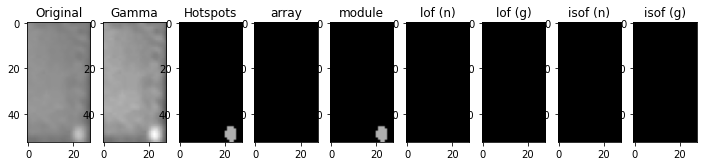

[-1.         -1.23063575 -0.96567817 -1.00088583 -0.98313619 -3.05054295
 -1.03726708 -1.00500673 -0.99523526 -1.89835946]
[-2.28781331]
[-0.43925766 -0.56572035 -0.44552435 -0.46538754 -0.43700709 -0.7706507
 -0.45925331 -0.45174581 -0.432412   -0.61787343]
[-0.75756266]
[-1.03972085 -0.98858592 -0.97120972 -1.02608696 -1.13603295 -2.00087029
 -0.97120972 -1.17161267 -1.09189235 -1.13043057]
[-2.28781331]
[-0.50478493 -0.47269273 -0.51400497 -0.45463904 -0.54295921 -0.67539415
 -0.53388923 -0.47723484 -0.51086106 -0.50708232]
[-0.75756266]
4234.jpg Normal [6.13498222]
[-1.         -1.01652447 -1.         -1.3336439  -1.0288506  -1.09775286
 -0.96609751 -1.04110881 -1.00279456 -0.95232399]
[-2.17100213]
[-0.43742467 -0.44236426 -0.43742467 -0.55691291 -0.43344919 -0.47946832
 -0.41724843 -0.43597459 -0.44932151 -0.42263103]
[-0.73420043]
[-1.93977093 -1.44837085 -1.9779358  -0.9905896  -1.35934569 -1.01909839
 -2.21190304 -2.66158476 -1.16660449 -1.74283868]
[-2.17100213]
[-0.70330459 

[-1.02941722 -1.02600391 -1.03244893 -1.60276195 -1.07252202 -1.00132053
 -0.99967944 -1.05923817 -1.00530486 -0.99967944]
[-2.19647941]
[-0.48625229 -0.4593196  -0.47020083 -0.69156992 -0.51328001 -0.47259614
 -0.46212495 -0.4855046  -0.47403919 -0.46212495]
[-0.73929588]
[-0.98173616 -1.03418076 -0.98643882 -1.36421498 -1.08316687 -0.96362918
 -1.08016715 -0.97079957 -1.06081483 -1.08016715]
[-2.19647941]
[-0.54768218 -0.48389493 -0.54668748 -0.64739614 -0.57083659 -0.45223231
 -0.52746512 -0.53142459 -0.50019861 -0.52746512]
[-0.73929588]
4218.jpg Normal [4.97140808]
[-0.99704538 -0.99414039 -0.99538065 -1.02311718 -0.9916107  -1.04056023
 -0.99434233 -0.98846901 -0.99384278 -0.98512442]
[-2.18395445]
[-0.45871104 -0.48277832 -0.44998761 -0.49243009 -0.46677883 -0.46789503
 -0.46871682 -0.45300938 -0.44450064 -0.43524621]
[-0.73679089]
[-1.28894923 -2.42246727 -1.51196315 -2.7782508  -2.28643239 -1.15771808
 -2.02482686 -2.15301357 -1.61132532 -0.98393791]
[-2.18395445]
[-0.53898002

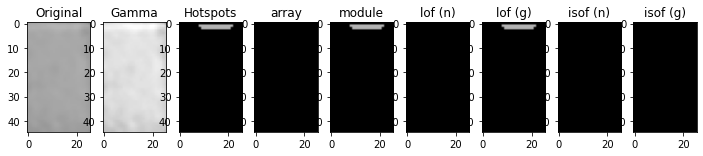

[-1.00231079 -1.01853986 -1.00501778 -1.20255436 -0.94210732 -1.00515203
 -1.02061853 -0.99346677 -0.99954904 -1.01448724]
[-2.21859192]
[-0.47430399 -0.45719913 -0.44390807 -0.50295351 -0.43694956 -0.47756732
 -0.44472039 -0.44426871 -0.47160584 -0.45614249]
[-0.74371838]
[-1.90511302 -1.03430597 -1.0575591  -1.02225978 -1.07037198 -1.78351006
 -1.04183929 -1.14216201 -1.600692   -1.22862246]
[-2.21859192]
[-0.73293853 -0.47399266 -0.54279318 -0.43614741 -0.51903615 -0.72848903
 -0.47032706 -0.56948545 -0.70305034 -0.59352116]
[-0.74371838]
3205.jpg Normal [5.23108667]
[-1.02235401 -1.0532115  -1.04060797 -1.0532115  -1.00997991 -1.09569822
 -1.07622172 -1.04093562 -1.01342426 -1.04535942]
[-2.22449335]
[-0.45346455 -0.50034578 -0.49006458 -0.50034578 -0.44427357 -0.48578834
 -0.48798539 -0.51046546 -0.50937787 -0.4454433 ]
[-0.74489867]
[-1.27066017 -2.42381466 -2.86135875 -2.42381466 -1.66040206 -2.06197467
 -2.26599083 -1.00006158 -3.55424383 -1.0194232 ]
[-2.22449335]
[-0.62620304

[-0.98675549 -1.0351881  -0.98940671 -1.00785466 -1.         -1.00119337
 -1.         -1.01514331 -1.32126466 -1.0046926 ]
[-2.18087554]
[-0.4441114  -0.4930027  -0.45972163 -0.45697859 -0.45038457 -0.46647344
 -0.45644421 -0.48402015 -0.55427857 -0.46931308]
[-0.73617511]
[-1.02750599 -0.986638   -1.0300251  -1.09607794 -1.2452863  -1.08088422
 -1.0701778  -0.99039317 -1.00027812 -1.01863094]
[-2.18087554]
[-0.54427034 -0.45391915 -0.56828185 -0.5112398  -0.63117998 -0.51517348
 -0.56816815 -0.45963192 -0.45135845 -0.48973042]
[-0.73617511]
804.jpg Normal [4.79595983]
[-1.34753152 -1.02678897 -1.04735952 -1.         -1.14318274 -1.04434621
 -1.1140591  -1.02071321 -0.97713879 -1.058531  ]
[-2.19647941]
[-0.63937129 -0.4878693  -0.52161075 -0.4323961  -0.58958558 -0.5222884
 -0.46826635 -0.54749985 -0.41132723 -0.50237607]
[-0.73929588]
[-1.04226356 -1.05817876 -0.96126072 -0.97079957 -0.98020914 -0.96546419
 -1.06747685 -1.05909594 -1.02424963 -1.02563381]
[-2.19647941]
[-0.53178846 -

[-1.         -1.05449872 -0.99347513 -1.01783164 -1.00011853 -1.06962956
 -0.95603382 -0.98429044 -1.00351977 -0.98429044]
[-2.03804133]
[-0.44040655 -0.49381489 -0.46533506 -0.44392454 -0.46778712 -0.49444234
 -0.42741236 -0.46352411 -0.4336479  -0.46352411]
[-0.70760827]
[-1.03042642 -1.24981726 -1.09734128 -0.99787404 -1.02243521 -1.23095209
 -1.01734231 -1.04753102 -1.01312491 -1.04753102]
[-2.03804133]
[-0.49743949 -0.58362701 -0.55985883 -0.54563308 -0.58077847 -0.57866726
 -0.51589531 -0.55422403 -0.51579347 -0.55422403]
[-0.70760827]
2682.jpg Normal [3.45176586]
[-1.04154983 -1.00032484 -1.07177703 -1.09569822 -0.98510427 -1.04154983
 -1.07774634 -1.07622172 -0.98510427 -1.09569822]
[-2.22449335]
[-0.46043947 -0.44726298 -0.50466952 -0.48578834 -0.44713834 -0.46043947
 -0.44429178 -0.48798539 -0.44713834 -0.48578834]
[-0.74489867]
[-2.58548784 -1.61971236 -3.49650341 -2.86135875 -2.21338289 -2.58548784
 -1.24655913 -3.15006087 -2.21338289 -2.91909918]
[-2.22449335]
[-0.77412119

[-1.00501778 -1.07378739 -1.01448724 -0.95080169 -1.01101274 -1.48632128
 -1.01237805 -1.01165573 -1.01072739 -1.02782605]
[-2.21859192]
[-0.44390807 -0.47820694 -0.45614249 -0.4188398  -0.45755482 -0.58442546
 -0.42373168 -0.44362514 -0.45477745 -0.50090563]
[-0.74371838]
[-1.06673378 -0.97462852 -1.07898916 -1.0382315  -1.1079146  -1.14879282
 -1.03053199 -1.00321279 -1.21161731 -1.74297574]
[-2.21859192]
[-0.51169876 -0.42172324 -0.55048669 -0.47259552 -0.56390962 -0.48625893
 -0.51015303 -0.46066792 -0.57569803 -0.72292744]
[-0.74371838]
2457.jpg Normal [5.23108667]
[-1.01901363 -1.02272514 -1.03037835 -0.98848768 -1.03037835 -1.05952877
 -1.0308305  -2.38556988 -0.96960416 -0.99837506]
[-2.18395445]
[-0.44642471 -0.42793201 -0.43129356 -0.45214706 -0.43129356 -0.45184474
 -0.46448674 -0.6420895  -0.4414097  -0.41487636]
[-0.73679089]
[-1.8992562  -1.20045156 -1.38524624 -1.67450611 -1.36428137 -0.98393791
 -2.37537828 -1.19137347 -1.64434992 -1.28894923]
[-2.18395445]
[-0.6588282 

[-0.96369849 -1.00833333 -0.99938182 -1.09759612 -1.01975021 -0.98082148
 -1.01098927 -0.95520033 -0.9992625  -0.95520033]
[-2.45297972]
[-0.44570178 -0.46451    -0.43800429 -0.5123308  -0.45951781 -0.46396432
 -0.44782749 -0.42748636 -0.46183315 -0.42748636]
[-0.79059594]
[-1.00466364 -0.98862572 -1.00500825 -1.07821112 -0.9858351  -1.02491858
 -1.01571651 -0.99281652 -1.0156053  -1.004705  ]
[-2.45297972]
[-0.46293868 -0.49463947 -0.48419588 -0.44400805 -0.46337509 -0.45176639
 -0.5053791  -0.45919601 -0.50168126 -0.46947449]
[-0.79059594]
4967.jpg Normal [8.97386897]
[-1.         -0.99715419 -1.06933826 -0.99397636 -1.02333191 -1.09256724
 -1.01602178 -0.97505136 -1.01602178 -1.        ]
[-2.18087554]
[-0.45277637 -0.45152645 -0.4783808  -0.46270001 -0.47634427 -0.47991031
 -0.45956209 -0.46915866 -0.45956209 -0.44868899]
[-0.73617511]
[-1.07824986 -1.12561125 -1.18181094 -1.01445552 -1.02257628 -1.30792645
 -1.05537713 -1.0300251  -1.08445115 -1.04101818]
[-2.18087554]
[-0.52423205

[-0.99216287 -1.0772986  -1.01828688 -1.03298564 -1.51771464 -0.97137164
 -0.96908723 -1.05186747 -1.06348569 -1.03298564]
[-2.04152293]
[-0.43518927 -0.48036053 -0.44727496 -0.46151992 -0.59986931 -0.42448209
 -0.42943746 -0.48754616 -0.46347558 -0.46151992]
[-0.70830459]
[-1.45984917 -1.00166894 -1.03172271 -0.98229181 -1.09397996 -1.0085149
 -0.99580589 -1.14531826 -1.18509991 -0.98432553]
[-2.04152293]
[-0.59719645 -0.46039384 -0.51197134 -0.47118654 -0.485113   -0.51447856
 -0.5118876  -0.44749987 -0.56347762 -0.48832667]
[-0.70830459]
1016.jpg Normal [3.47954877]
[-1.         -1.05906361 -1.05651225 -1.87492149 -1.00279992 -1.01934667
 -1.02201402 -1.         -1.16854015 -1.        ]
[-1.93837404]
[-0.44213472 -0.48089788 -0.45814907 -0.61910243 -0.43335994 -0.45041718
 -0.45561419 -0.44261461 -0.53666125 -0.43473233]
[-0.68767481]
[-1.07573303 -1.00579582 -1.30903343 -1.03903595 -1.25646527 -1.13431708
 -1.17961655 -1.13146507 -1.03156181 -1.07463037]
[-1.93837404]
[-0.56483182 

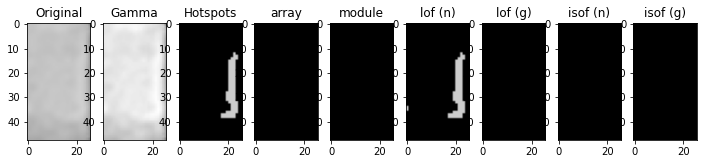

[-1.73938459 -0.98993841 -1.35105489 -2.85664327 -2.22131765 -0.99958837
 -1.69254682 -1.01893123 -1.45204301 -1.16065301]
[-2.18395445]
[-0.57937315 -0.46195181 -0.51433268 -0.67168106 -0.6096382  -0.46279274
 -0.58019386 -0.46687584 -0.5374561  -0.48896654]
[-0.73679089]
[-1.0271544  -1.8992562  -1.12667516 -0.99746206 -1.01954015 -1.77521819
 -0.97541196 -2.42246727 -1.06414468 -1.34062655]
[-2.18395445]
[-0.46871862 -0.6588282  -0.52102773 -0.46088566 -0.45571456 -0.62762578
 -0.46211233 -0.71148741 -0.50026818 -0.56266407]
[-0.73679089]
3173.jpg Normal [4.83008144]
[-1.02227813 -1.03436236 -1.02939328 -1.02466041 -1.0015021  -1.
 -0.99619401 -1.02466041 -1.03956254 -0.97732678]
[-2.10847032]
[-0.4431044  -0.43230755 -0.47613584 -0.45160856 -0.45039753 -0.43351567
 -0.44042987 -0.45160856 -0.47209299 -0.41927809]
[-0.72169406]
[-1.08325301 -1.03422612 -1.03305347 -1.30255012 -1.19250153 -1.01958214
 -1.15949352 -1.30255012 -1.69942634 -1.03087317]
[-2.10847032]
[-0.55643098 -0.5528

[-0.96937267 -1.02880926 -1.01491101 -0.99879988 -1.00351977 -0.97835839
 -1.04955795 -1.01783164 -0.99990334 -1.        ]
[-2.03804133]
[-0.42563436 -0.46564613 -0.44069872 -0.45370139 -0.4336479  -0.47573943
 -0.4959902  -0.44392454 -0.45707341 -0.44040655]
[-0.70760827]
[-0.98613978 -1.05394029 -0.99172697 -1.04502426 -1.04753102 -1.26868242
 -1.00837103 -1.06207686 -0.98942333 -1.03687392]
[-2.03804133]
[-0.54369882 -0.48770319 -0.53884328 -0.5199614  -0.55422403 -0.59620588
 -0.44354422 -0.52842073 -0.54375826 -0.52004079]
[-0.70760827]
2537.jpg Normal [3.45176586]
[-1.13383466 -0.97107338 -1.00624778 -1.00335318 -1.0048741  -1.34532071
 -1.00600127 -0.99827338 -1.13383466 -1.62365728]
[-2.20209888]
[-0.51895977 -0.43382276 -0.46931732 -0.48313693 -0.44733039 -0.57096596
 -0.48923207 -0.41916511 -0.51895977 -0.58949486]
[-0.74041978]
[-1.01190863 -1.40707762 -1.06589189 -1.0213929  -1.11518975 -1.0428382
 -1.03918203 -1.27181796 -1.01095962 -0.99889722]
[-2.20209888]
[-0.45266853 

[-1.03810447 -0.99533929 -1.1779323  -1.02434783 -0.97107338 -1.92450188
 -0.959      -1.         -1.00822844 -1.        ]
[-2.20209888]
[-0.45761491 -0.49126926 -0.51964133 -0.45446091 -0.43382276 -0.65133327
 -0.43637026 -0.45167814 -0.45436733 -0.4450402 ]
[-0.74041978]
[-1.06767083 -1.01028123 -0.97409623 -1.05105595 -1.0625106  -1.24612835
 -1.01286928 -1.34865655 -1.01705388 -1.06589189]
[-2.20209888]
[-0.52047005 -0.44433201 -0.44254102 -0.53146725 -0.526594   -0.57614221
 -0.48973798 -0.60317074 -0.48049795 -0.54645171]
[-0.74041978]
4185.jpg Normal [5.03615258]
[-1.10886989 -1.05940871 -1.16689764 -1.11070199 -1.89835946 -1.00088583
 -1.19631523 -1.41385954 -1.06861536 -1.09818214]
[-2.28781331]
[-0.51113791 -0.49985118 -0.55184467 -0.52906017 -0.61787343 -0.46538754
 -0.5351788  -0.63067051 -0.49887928 -0.51602257]
[-0.75756266]
[-0.96294334 -1.13603295 -1.03978157 -0.98137941 -0.9930426  -1.50325077
 -1.05815301 -1.16529212 -1.05375078 -0.97325809]
[-2.28781331]
[-0.47538625

[-1.06588948 -1.12893614 -1.03492384 -1.07033719 -0.96245027 -1.05661799
 -1.07782115 -1.16659788 -1.08679416 -1.12844298]
[-1.93837404]
[-0.56105026 -0.55553189 -0.49078937 -0.54458401 -0.42874402 -0.56010523
 -0.54884178 -0.53299855 -0.55115911 -0.5558279 ]
[-0.68767481]
[-1.17373505 -1.11208452 -1.10681091 -1.27370073 -0.96108147 -1.18407632
 -1.348675   -1.07463037 -1.13146507 -1.09065204]
[-1.93837404]
[-0.59838525 -0.59518742 -0.55102951 -0.63238226 -0.43314779 -0.59958067
 -0.67680046 -0.55622727 -0.60638856 -0.56466644]
[-0.68767481]
3371.jpg Normal [2.74393641]
[-0.99294477 -0.97616099 -1.         -1.02407915 -0.99117647 -1.0423134
 -1.10528384 -0.97616099 -1.00683296 -1.30308604]
[-2.19521488]
[-0.43587428 -0.40884652 -0.42818471 -0.43591498 -0.41824481 -0.45023293
 -0.42958573 -0.40884652 -0.44065672 -0.54083424]
[-0.73904298]
[-1.55091588 -2.20737619 -1.89387724 -1.30552679 -1.81657612 -1.62476901
 -2.53805317 -2.20737619 -1.02677058 -1.11898695]
[-2.19521488]
[-0.56637255 

[-1.00600639 -1.06071211 -0.97898687 -1.02981215 -0.98757162 -1.06602543
 -0.98757162 -1.00009336 -0.9976069  -0.99751303]
[-2.43259627]
[-0.48487153 -0.55422984 -0.45436962 -0.48334561 -0.50383518 -0.48222156
 -0.50383518 -0.48604085 -0.45280773 -0.48284107]
[-0.78651925]
[-0.99762382 -1.4491293  -1.03857921 -0.99656436 -1.19750393 -0.983891
 -1.21845622 -1.07426101 -0.99906684 -1.06441339]
[-2.43259627]
[-0.53447291 -0.6414966  -0.50824197 -0.50193383 -0.56598096 -0.51493721
 -0.56622227 -0.54603889 -0.48016056 -0.53522887]
[-0.78651925]
2906.jpg Normal [8.56241501]
[-1.         -0.98884831 -1.         -1.03726708 -1.08862535 -0.98916436
 -0.98801747 -1.         -1.00076051 -0.9873597 ]
[-2.28781331]
[-0.43164607 -0.44676147 -0.43853825 -0.45925331 -0.49896999 -0.44444073
 -0.45223117 -0.43925766 -0.44123206 -0.45794541]
[-0.75756266]
[-0.96062193 -1.09243267 -1.07716813 -0.98396382 -0.9930426  -1.37883232
 -0.98855473 -1.00554326 -1.16831169 -0.98809375]
[-2.28781331]
[-0.47568462 -

[-0.99880622 -1.0741759  -1.04293622 -1.31412279 -1.03259326 -1.00605236
 -1.0741759  -1.03259326 -1.02539141 -1.1324725 ]
[-2.22838953]
[-0.5003377  -0.52382998 -0.46498103 -0.55519287 -0.50026784 -0.48279502
 -0.52382998 -0.50026784 -0.47876449 -0.53575931]
[-0.74567791]
[-1.07916376 -1.06258118 -1.42759115 -1.00266443 -1.04007708 -1.16058485
 -1.06258118 -1.04307631 -1.10904147 -0.98912237]
[-2.22838953]
[-0.54464972 -0.51793418 -0.65082393 -0.47597499 -0.56236832 -0.59068328
 -0.51793418 -0.54909265 -0.56287041 -0.49817574]
[-0.74567791]
756.jpg Normal [5.35044037]
[-1.         -1.00704059 -1.         -0.98940671 -1.         -1.00704059
 -0.99447495 -1.         -1.0046926  -1.        ]
[-2.18087554]
[-0.44597348 -0.4521693  -0.46104775 -0.45972163 -0.46109157 -0.4521693
 -0.45466895 -0.46104775 -0.46931308 -0.43860521]
[-0.73617511]
[-1.01729368 -1.06873835 -1.19684458 -1.08945197 -1.05537713 -1.06873835
 -0.99997408 -1.19684458 -1.002515   -1.01445552]
[-2.18087554]
[-0.58422256 -

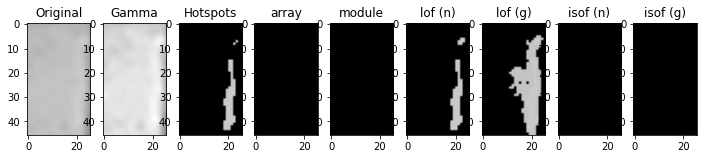

[-1.         -0.99591309 -1.         -1.05083891 -0.98526497 -1.01762211
 -0.98867338 -1.04766148 -0.97107338 -0.98023292]
[-2.20209888]
[-0.44453351 -0.46700206 -0.44160206 -0.47643626 -0.45642361 -0.49078544
 -0.43204859 -0.51374001 -0.43382276 -0.45718592]
[-0.74041978]
[-1.04828871 -1.06589189 -1.00172172 -1.08134629 -1.06107462 -1.14914227
 -1.00389929 -1.58109782 -0.99166023 -1.06767083]
[-2.20209888]
[-0.47839174 -0.54645171 -0.46839472 -0.54543663 -0.53058474 -0.57068588
 -0.44370469 -0.66941627 -0.43547565 -0.52047005]
[-0.74041978]
4437.jpg Normal [5.03615258]
[-0.99523156 -1.         -2.33907115 -0.98369932 -1.0772986  -1.
 -1.33897458 -1.01049513 -1.018078   -0.9915689 ]
[-2.04152293]
[-0.45480636 -0.42287253 -0.67331447 -0.46358903 -0.48036053 -0.42287253
 -0.57487081 -0.45978631 -0.46461489 -0.50439642]
[-0.70830459]
[-1.02473032 -0.99286476 -1.84818743 -1.06341571 -1.01004202 -0.99286476
 -1.07345429 -1.05090454 -1.04659767 -1.58765945]
[-2.04152293]
[-0.52770552 -0.4573

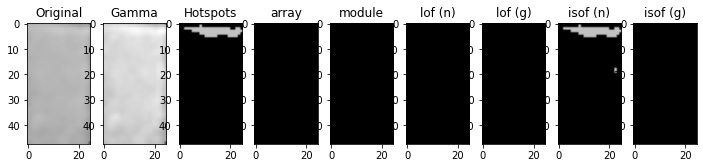

[-0.959      -1.         -0.99793339 -1.00817565 -1.00521739 -1.
 -1.15003852 -1.         -0.98526497 -1.00600127]
[-2.20209888]
[-0.43637026 -0.44738886 -0.44069673 -0.44563319 -0.43322592 -0.44287753
 -0.50530881 -0.4450402  -0.45642361 -0.48923207]
[-0.74041978]
[-1.04828871 -1.17387174 -1.00172172 -1.01281472 -1.05661355 -1.10282928
 -0.96375945 -1.05438887 -1.46922769 -1.01028123]
[-2.20209888]
[-0.47839174 -0.57719105 -0.46839472 -0.45532097 -0.53179651 -0.54729115
 -0.44230496 -0.52890259 -0.64817798 -0.44433201]
[-0.74041978]
5067.jpg Normal [5.03615258]
[-0.96789105 -1.03088802 -0.96625019 -0.96780825 -1.07907225 -0.98032124
 -0.96780825 -1.30412245 -0.96789105 -0.97388902]
[-2.28781331]
[-0.47682189 -0.50971587 -0.49200223 -0.50677116 -0.50847626 -0.48240021
 -0.50677116 -0.58385943 -0.47682189 -0.52091978]
[-0.75756266]
[-1.03709069 -1.37883232 -0.97120972 -1.32685092 -1.03972085 -0.97325809
 -1.28585271 -1.79286789 -1.05375078 -1.20758342]
[-2.28781331]
[-0.50737326 -0.5879

[-0.94668476 -1.02185004 -1.12714419 -1.02114543 -1.03151344 -0.97492484
 -1.01830111 -1.01429117 -1.14005839 -1.02174854]
[-2.43259627]
[-0.46314671 -0.47063784 -0.51290641 -0.46355429 -0.48816069 -0.46625902
 -0.46121077 -0.48536343 -0.507249   -0.46955521]
[-0.78651925]
[-1.03153474 -0.983891   -0.97796592 -0.99854627 -1.00663973 -1.09813821
 -1.21845622 -1.03525014 -1.02815316 -0.99734979]
[-2.43259627]
[-0.52003905 -0.51493721 -0.45017396 -0.47770367 -0.5319885  -0.49549129
 -0.56622227 -0.48626316 -0.47854303 -0.47129185]
[-0.78651925]
568.jpg Normal [8.56241501]
[-0.99938182 -0.99367181 -1.0008491  -0.99144316 -0.98675915 -0.98720681
 -1.02688243 -1.07106205 -1.08259373 -1.02442964]
[-2.45297972]
[-0.43800429 -0.4382824  -0.49519149 -0.4561579  -0.46010802 -0.44785138
 -0.46161501 -0.44593776 -0.50393636 -0.4520463 ]
[-0.79059594]
[-1.00685477 -1.04060819 -1.27871736 -1.00253743 -1.00263327 -1.00466364
 -1.00500825 -1.004705   -1.10175392 -1.00740619]
[-2.45297972]
[-0.46580341 

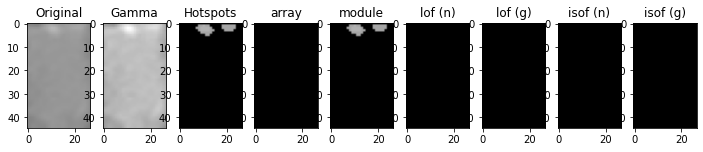

[-1.76636062 -1.01148202 -0.97137164 -1.76636062 -0.97338133 -2.04348097
 -0.9915689  -2.71938427 -1.22869101 -1.22869101]
[-2.04152293]
[-0.66320328 -0.49633911 -0.42448209 -0.66320328 -0.45096002 -0.70273756
 -0.50439642 -0.74695598 -0.56109338 -0.56109338]
[-0.70830459]
[-1.3490549  -1.04599206 -0.98803289 -1.38165288 -0.99286476 -1.63199409
 -1.03586931 -2.16760449 -1.02473032 -1.04124371]
[-2.04152293]
[-0.58007068 -0.50866628 -0.43312317 -0.58522865 -0.45730836 -0.62461014
 -0.50629946 -0.72812978 -0.52770552 -0.53860333]
[-0.70830459]
3833.jpg Single-Hotspot [3.47954877]


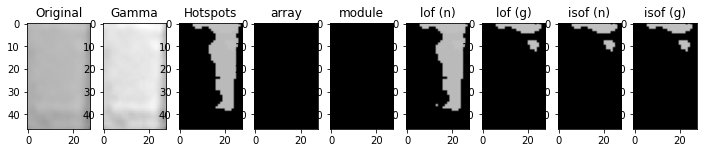

[-1.09289211 -1.08071434 -1.07782115 -2.20227476 -1.07782115 -0.96245027
 -0.98703416 -1.19229283 -1.06515829 -1.21755996]
[-1.93837404]
[-0.49834946 -0.51573318 -0.54884178 -0.65441373 -0.54884178 -0.42874402
 -0.45771596 -0.60435963 -0.55479055 -0.59202605]
[-0.68767481]
[-1.17961655 -1.04942371 -1.13146507 -1.9745881  -1.11208452 -0.98927548
 -1.00063668 -1.2909362  -1.08047194 -1.32713067]
[-1.93837404]
[-0.51300702 -0.51534279 -0.60638856 -0.64240284 -0.59518742 -0.43447745
 -0.46336644 -0.64533405 -0.55979109 -0.66752948]
[-0.68767481]
4190.jpg Normal [2.74393641]
[-0.99879988 -0.97835839 -1.01153849 -1.00800991 -0.96937267 -0.99878384
 -1.06962956 -1.05117035 -0.9686432  -1.0465368 ]
[-2.03804133]
[-0.45370139 -0.47573943 -0.47190588 -0.44414211 -0.42563436 -0.44961498
 -0.49444234 -0.49937708 -0.44841247 -0.44659129]
[-0.70760827]
[-1.08230756 -0.99787404 -0.99594708 -1.01734231 -1.0412118  -0.99489832
 -1.04075089 -1.         -1.0412118  -1.03930273]
[-2.03804133]
[-0.4646528 

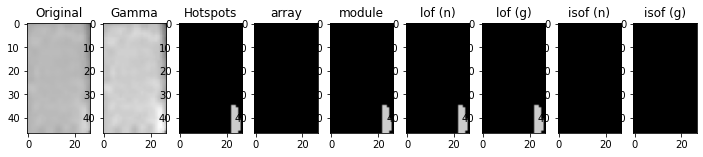

[-0.99397636 -1.01305547 -1.         -1.01514331 -1.         -0.96717079
 -1.         -1.         -0.99715419 -1.        ]
[-2.18087554]
[-0.46270001 -0.45241899 -0.44597348 -0.48402015 -0.46104775 -0.44849637
 -0.46104775 -0.44803426 -0.45152645 -0.44868899]
[-0.73617511]
[-1.04508534 -0.99201041 -1.09607794 -0.99437383 -1.03815907 -0.99936898
 -1.03815907 -1.03336282 -1.19684458 -1.01729368]
[-2.18087554]
[-0.56802412 -0.45790809 -0.5112398  -0.44570842 -0.52434208 -0.44172328
 -0.52434208 -0.4965383  -0.5941956  -0.58422256]
[-0.73617511]
3199.jpg Normal [4.79595983]
[-1.05026285 -1.01451438 -0.99248656 -1.00805508 -1.00605236 -1.05026285
 -0.99248656 -1.04240497 -1.01451438 -1.05026285]
[-2.22838953]
[-0.47965063 -0.4559942  -0.44595098 -0.47017946 -0.48279502 -0.47965063
 -0.44595098 -0.51579124 -0.4559942  -0.47965063]
[-0.74567791]
[-1.17135107 -1.02088187 -1.07916376 -1.34728914 -0.98994401 -1.16058485
 -1.06624559 -1.00580276 -1.03458923 -1.17135107]
[-2.22838953]
[-0.5897811 

[-1.00279992 -1.         -0.9970895  -0.99066862 -0.99029799 -1.02184632
 -0.99029799 -1.1203003  -1.02201402 -1.        ]
[-1.93837404]
[-0.43335994 -0.44809334 -0.47231747 -0.44725782 -0.45003533 -0.47952406
 -0.45003533 -0.46314449 -0.45561419 -0.43473233]
[-0.68767481]
[-1.07396431 -1.1711787  -1.23922981 -1.04684366 -1.14334589 -0.98074769
 -1.14334589 -1.07463037 -1.00996004 -1.17728176]
[-1.93837404]
[-0.56359943 -0.52113246 -0.60544762 -0.50646907 -0.554313   -0.44317758
 -0.554313   -0.55622727 -0.47239764 -0.50814574]
[-0.68767481]
4153.jpg Normal [2.74393641]
[-1.         -1.03810447 -1.03810447 -1.         -0.99793339 -1.
 -1.         -0.98526497 -1.00521739 -1.        ]
[-2.20209888]
[-0.44453351 -0.45761491 -0.45761491 -0.44287753 -0.44069673 -0.45275846
 -0.44453351 -0.45642361 -0.43322592 -0.45698074]
[-0.74041978]
[-1.17387174 -1.05661355 -1.05661355 -1.13427909 -1.02309676 -1.08970722
 -1.17387174 -1.62087387 -1.05438887 -1.07408322]
[-2.20209888]
[-0.57719105 -0.5317

[-1.         -0.99817391 -1.02201402 -1.         -1.0469656  -1.
 -0.98286032 -1.01609779 -0.98408488 -1.01621738]
[-1.93837404]
[-0.44261461 -0.45723091 -0.45561419 -0.44213472 -0.51052625 -0.44213472
 -0.46387131 -0.44490145 -0.4478522  -0.47217927]
[-0.68767481]
[-1.39176366 -1.07257245 -1.07007877 -1.20820597 -1.01646124 -1.23922981
 -1.11565721 -1.09065204 -1.17373505 -1.02572213]
[-1.93837404]
[-0.69137277 -0.55871928 -0.56070148 -0.58966568 -0.47078619 -0.60544762
 -0.5541132  -0.56466644 -0.59838525 -0.48220201]
[-0.68767481]
2278.jpg Normal [2.74393641]
[-1.02052113 -0.99938182 -1.02052113 -1.03153306 -0.99567963 -1.07718348
 -0.98730147 -1.01947005 -1.02809124 -0.99559551]
[-2.45297972]
[-0.44876337 -0.43800429 -0.44876337 -0.4616424  -0.44620788 -0.47068547
 -0.45461373 -0.45902716 -0.45026044 -0.47117982]
[-0.79059594]
[-0.97432632 -1.01150564 -0.97432632 -0.97611219 -1.00478211 -1.01356213
 -1.00631929 -0.98937245 -1.00500825 -1.31103881]
[-2.45297972]
[-0.50822128 -0.5034

[-1.04249792 -0.99397636 -1.09061466 -1.00659165 -1.03651616 -1.04249792
 -1.         -1.09256724 -1.08048737 -1.        ]
[-2.18087554]
[-0.500037   -0.46270001 -0.50266049 -0.52150371 -0.4750919  -0.500037
 -0.45290687 -0.47991031 -0.55039697 -0.4547108 ]
[-0.73617511]
[-1.02407693 -0.99997408 -1.01445552 -1.0701778  -1.06579703 -1.02407693
 -1.03162086 -1.06143877 -1.26616635 -0.98907203]
[-2.18087554]
[-0.57958832 -0.46476489 -0.58051001 -0.56816815 -0.51747496 -0.57958832
 -0.45098541 -0.51057935 -0.63460563 -0.45046462]
[-0.73617511]
4966.jpg Normal [4.79595983]
[-0.97732678 -0.99670874 -1.01140785 -1.05031553 -0.94577961 -1.03668298
 -1.01140785 -0.99867594 -1.02179039 -0.99953479]
[-2.10847032]
[-0.41927809 -0.46360717 -0.43989252 -0.47684752 -0.43092538 -0.48442261
 -0.43989252 -0.42957209 -0.46411016 -0.45174159]
[-0.72169406]
[-1.42322161 -1.06193818 -1.24978365 -1.01969783 -1.37718749 -1.01517892
 -1.24978365 -1.73395193 -1.15949352 -1.10122436]
[-2.10847032]
[-0.6640642  -

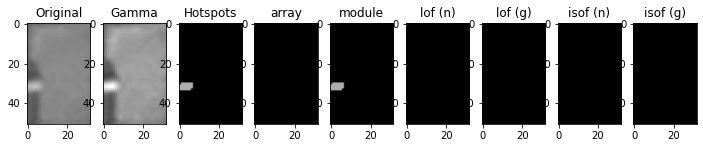

[-0.98023292 -1.25085693 -1.04259    -1.         -0.99774144 -1.04088294
 -1.05083891 -1.00521739 -1.06317797 -1.10253374]
[-2.20209888]
[-0.45718592 -0.55948692 -0.5158863  -0.46026584 -0.44994117 -0.51032932
 -0.47643626 -0.43322592 -0.51570427 -0.53665756]
[-0.74041978]
[-1.01286928 -1.07205867 -1.21101391 -1.00172172 -1.03045401 -1.17387174
 -1.06710436 -1.00389929 -1.11518975 -1.58109782]
[-2.20209888]
[-0.48973798 -0.51834787 -0.57454946 -0.46839472 -0.45110493 -0.57719105
 -0.53148343 -0.44370469 -0.54556945 -0.66941627]
[-0.74041978]
3748.jpg Normal [5.03615258]
[-1.09080444 -0.98675549 -1.         -1.06235553 -1.         -1.
 -1.09690759 -1.00659165 -0.99835513 -0.998072  ]
[-2.18087554]
[-0.46783174 -0.4441114  -0.46104775 -0.49059793 -0.46109157 -0.46483006
 -0.52156318 -0.52150371 -0.46028157 -0.44786299]
[-0.73617511]
[-1.06143877 -1.00884455 -0.99531449 -1.01930251 -1.03162086 -1.00653892
 -1.00867534 -1.12561125 -1.01863094 -1.06609974]
[-2.18087554]
[-0.51057935 -0.4425

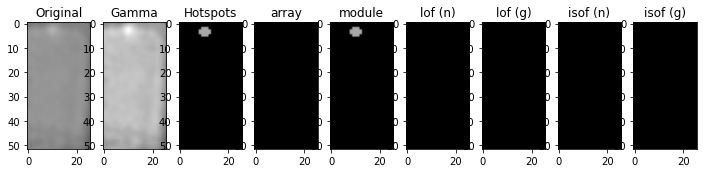

[-0.99955042 -0.97197212 -1.04892109 -1.01451438 -1.00599118 -1.01292107
 -1.01964419 -1.00615545 -1.01112961 -1.03935241]
[-2.22838953]
[-0.47517043 -0.4390761  -0.4447571  -0.4559942  -0.48115188 -0.49308059
 -0.47399462 -0.47560418 -0.47939387 -0.48173595]
[-0.74567791]
[-1.32052181 -0.98912237 -1.02088187 -0.99423154 -1.40082381 -1.22075266
 -1.09731036 -1.05661569 -1.02140126 -1.09731036]
[-2.22838953]
[-0.61780112 -0.49817574 -0.53658727 -0.47853316 -0.6485097  -0.59996859
 -0.55709057 -0.53894022 -0.49338939 -0.55709057]
[-0.74567791]
2456.jpg Normal [5.35044037]
[-1.12450749 -1.09061466 -1.01637804 -1.22155223 -1.00659165 -1.28983776
 -1.5844088  -1.1638889  -1.09804731 -0.97670685]
[-2.18087554]
[-0.55947838 -0.50266049 -0.54810722 -0.6041605  -0.52150371 -0.63444559
 -0.59681407 -0.56515727 -0.55145086 -0.44738603]
[-0.73617511]
[-1.08445115 -1.08945197 -1.01445552 -1.18181094 -1.04101818 -1.26616635
 -1.59104063 -1.1386209  -1.0701778  -0.99730123]
[-2.18087554]
[-0.56995654

[-0.98286032 -1.12985921 -1.         -1.01934667 -0.98286032 -1.04709763
 -1.         -1.16854015 -1.01348182 -1.01609779]
[-1.93837404]
[-0.46387131 -0.5311469  -0.44213472 -0.45041718 -0.46387131 -0.46236386
 -0.43473233 -0.53666125 -0.47723968 -0.44490145]
[-0.68767481]
[-1.07007877 -1.01646124 -1.39176366 -1.12245571 -1.06361233 -1.11208452
 -1.348675   -1.02644897 -1.17728176 -1.18407632]
[-1.93837404]
[-0.56070148 -0.47078619 -0.69137277 -0.60021071 -0.56146012 -0.59518742
 -0.67680046 -0.45955525 -0.50814574 -0.59958067]
[-0.68767481]
391.jpg Normal [2.74393641]
[-1.         -0.98526497 -0.99533929 -1.         -1.02096665 -1.
 -1.00521739 -0.99793339 -0.98526497 -1.        ]
[-2.20209888]
[-0.4450402  -0.45642361 -0.49126926 -0.44666545 -0.47413183 -0.44043234
 -0.43322592 -0.44069673 -0.45642361 -0.44738886]
[-0.74041978]
[-1.03918203 -1.24901644 -0.9966066  -1.05240504 -1.66064991 -1.07263447
 -1.0213929  -0.99779587 -1.24901644 -1.08149069]
[-2.20209888]
[-0.52011279 -0.58175

[-1.         -1.01609779 -1.         -0.98724554 -1.02201402 -1.
 -0.98408488 -1.         -0.98095696 -1.01934667]
[-1.93837404]
[-0.4433276  -0.44490145 -0.43473233 -0.4714024  -0.45561419 -0.44261461
 -0.4478522  -0.44213472 -0.42612366 -0.45041718]
[-0.68767481]
[-1.23922981 -1.07463037 -1.14022254 -1.17961655 -1.07788609 -1.27370073
 -1.11208452 -1.17373505 -1.39176366 -1.07195108]
[-1.93837404]
[-0.60544762 -0.55622727 -0.60785201 -0.51300702 -0.55131993 -0.63238226
 -0.59518742 -0.59838525 -0.69137277 -0.56207554]
[-0.68767481]
636.jpg Normal [2.74393641]
[-1.03570897 -1.48856915 -1.02073108 -1.11118935 -1.05031553 -1.05495559
 -1.19509049 -2.31660198 -1.24402362 -1.02073108]
[-2.10847032]
[-0.4831513  -0.59221838 -0.47884639 -0.51156623 -0.47684752 -0.49638861
 -0.50077635 -0.66297592 -0.52566929 -0.47884639]
[-0.72169406]
[-1.37718749 -1.00755688 -1.54981544 -1.15949352 -1.80683929 -1.264441
 -1.10122436 -1.02942727 -1.04882226 -1.54981544]
[-2.10847032]
[-0.64915645 -0.5344863

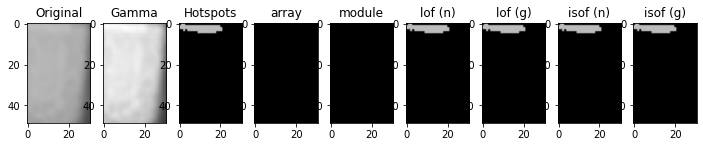

[-1.00211427 -1.         -1.01227856 -1.01250008 -1.07525315 -1.01217928
 -1.00393082 -0.97816298 -1.15283303 -0.95381019]
[-2.2754756]
[-0.4638773  -0.44149131 -0.45123155 -0.46911105 -0.49498764 -0.44891464
 -0.45562754 -0.44314424 -0.51623207 -0.44001182]
[-0.75509512]
[-0.98080174 -1.04053615 -0.99272236 -1.00265702 -1.06367066 -1.30790298
 -1.03825349 -1.01280957 -0.96721868 -1.01096859]
[-2.2754756]
[-0.46229056 -0.51237993 -0.48685297 -0.47198949 -0.47194584 -0.59538586
 -0.51097625 -0.49123762 -0.45366066 -0.4848891 ]
[-0.75509512]
2654.jpg Normal [5.96314812]
[-1.5614886  -1.01636184 -1.         -1.77170441 -0.98482917 -1.24715844
 -0.97841466 -1.24715844 -1.04329004 -1.73609683]
[-2.06550183]
[-0.55060209 -0.45927192 -0.44364516 -0.613142   -0.47994089 -0.52073515
 -0.44136407 -0.52073515 -0.43456107 -0.5975574 ]
[-0.71310037]
[-1.83459963 -1.75370683 -1.24023973 -2.16650533 -1.63635842 -1.76844119
 -1.56742802 -1.86106809 -1.01102797 -1.98778688]
[-2.06550183]
[-0.61884124 -

[-0.953101   -1.42321558 -1.00605236 -1.05026285 -1.03259326 -1.10863525
 -1.03792304 -1.01451438 -2.04110504 -1.05154017]
[-2.22838953]
[-0.43853752 -0.5980211  -0.48279502 -0.47965063 -0.50026784 -0.53243233
 -0.45984124 -0.4559942  -0.68040648 -0.43821295]
[-0.74567791]
[-1.05413417 -1.05087894 -0.97931273 -1.20092235 -1.01847648 -1.01197301
 -1.03377597 -1.02839756 -1.01147427 -1.03458923]
[-2.22838953]
[-0.54416697 -0.43085777 -0.48654627 -0.60103395 -0.4915139  -0.48168279
 -0.52113812 -0.54309552 -0.4630727  -0.53314049]
[-0.74567791]
1361.jpg Normal [5.35044037]
[-1.04751563 -0.98308176 -1.00243933 -1.01227856 -1.01253731 -1.00324684
 -2.71749934 -1.02278486 -1.03036605 -1.        ]
[-2.2754756]
[-0.54067519 -0.44835332 -0.47643135 -0.45123155 -0.51145784 -0.48220766
 -0.70999809 -0.50796105 -0.51945352 -0.4812262 ]
[-0.75509512]
[-1.40769809 -1.00413685 -1.05785728 -0.99843141 -1.17303958 -1.04053615
 -2.23620741 -1.10101504 -1.26185119 -1.00137832]
[-2.2754756]
[-0.60530811 -

[-0.98944405 -1.0271291  -0.97969906 -1.05565433 -0.93563711 -1.10057259
 -0.9783955  -1.32588004 -0.99904071 -1.00486681]
[-2.06550183]
[-0.40578309 -0.48938887 -0.43992223 -0.45310655 -0.39819087 -0.49190632
 -0.43093    -0.61050403 -0.44199383 -0.41384374]
[-0.71310037]
[-2.03884929 -1.00357697 -1.71459069 -1.89914496 -1.85648352 -1.02466569
 -2.19203654 -1.00607179 -1.45879439 -1.76894795]
[-2.06550183]
[-0.63531524 -0.46282316 -0.56623092 -0.60641745 -0.61938651 -0.44871541
 -0.64295482 -0.4291329  -0.53020651 -0.61979121]
[-0.71310037]
1363.jpg Normal [3.67706946]
[-1.06611557 -0.96908723 -0.96641647 -1.05160596 -1.17426002 -1.05160596
 -1.08881604 -1.71560891 -1.02243914 -0.97036213]
[-2.04152293]
[-0.49393156 -0.42943746 -0.45194589 -0.45211496 -0.54393139 -0.45211496
 -0.47447508 -0.60341952 -0.46025569 -0.44090391]
[-0.70830459]
[-0.97766762 -1.12963651 -1.01480517 -1.5414254  -0.94066487 -1.5414254
 -1.01433456 -1.07562021 -1.06336506 -1.02473032]
[-2.04152293]
[-0.43783411 

[-1.03091515 -1.09640956 -1.07844807 -1.07743556 -1.03781376 -1.0146315
 -1.09340915 -1.09102545 -1.03666198 -1.04479638]
[-1.98820677]
[-0.57697683 -0.54207896 -0.52767797 -0.5491613  -0.56154181 -0.44193808
 -0.52776174 -0.5092762  -0.5500247  -0.55914506]
[-0.69764135]
[-1.33078865 -1.1282247  -1.04240047 -1.16105333 -1.21444425 -0.99263807
 -1.10046777 -1.07393102 -1.18894411 -1.48857078]
[-1.98820677]
[-0.66720774 -0.57675025 -0.55851901 -0.59518029 -0.59759422 -0.4409121
 -0.55387021 -0.56297284 -0.58731859 -0.7215628 ]
[-0.69764135]
2656.jpg Normal [3.0775617]
[-0.953101   -0.99880622 -1.04293622 -1.00619904 -0.953101   -1.01593371
 -1.00605236 -0.96887785 -1.05154017 -1.31412279]
[-2.22838953]
[-0.43853752 -0.5003377  -0.46498103 -0.45917693 -0.43853752 -0.47606937
 -0.48279502 -0.44922754 -0.43821295 -0.55519287]
[-0.74567791]
[-1.29862126 -1.05466084 -1.09426232 -1.20092235 -1.25482017 -1.05661569
 -1.03076758 -1.42759115 -1.14875093 -1.02315704]
[-2.22838953]
[-0.60472114 -0

[-1.00513573 -1.02027471 -1.00764683 -1.25099426 -0.96418724 -0.97528362
 -1.02099463 -1.0085849  -1.05514769 -1.04930857]
[-2.35096627]
[-0.50228202 -0.44926245 -0.49433827 -0.55844628 -0.44496061 -0.50084815
 -0.52187056 -0.48533721 -0.47307399 -0.46540369]
[-0.77019325]
[-1.00687727 -0.96969831 -0.99477266 -1.42294631 -1.04020408 -1.00952727
 -1.01683645 -0.97699137 -1.00252525 -1.08487556]
[-2.35096627]
[-0.48978049 -0.43760728 -0.49652604 -0.5925207  -0.51750601 -0.54417375
 -0.48465482 -0.53769047 -0.44197945 -0.48276897]
[-0.77019325]
2859.jpg Normal [7.09522663]
[-1.09102545 -1.0146315  -1.07774683 -1.08787073 -1.01860276 -1.
 -1.11356388 -1.13182204 -1.03091515 -1.00906484]
[-1.98820677]
[-0.5092762  -0.44193808 -0.50514281 -0.5402791  -0.47105642 -0.44658939
 -0.52416933 -0.50264947 -0.57697683 -0.45863244]
[-0.69764135]
[-1.06491798 -0.98279601 -1.03579893 -1.09472335 -1.10300777 -0.99754266
 -1.04900562 -1.03230553 -1.29413219 -1.12046881]
[-1.98820677]
[-0.56433341 -0.4447

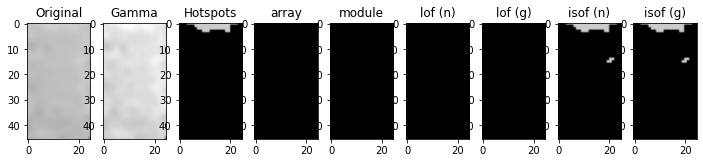

[-0.99534509 -0.99389898 -2.37862879 -1.00100967 -0.99576181 -1.03371878
 -1.05148452 -1.02081096 -0.99269257 -0.99557813]
[-2.33330394]
[-0.47135997 -0.45981405 -0.68912988 -0.47477172 -0.43399537 -0.47019728
 -0.47843883 -0.47926811 -0.46623216 -0.42765829]
[-0.76666079]
[-1.51798391 -1.14742199 -1.27919895 -2.01128729 -1.09322452 -1.293241
 -1.39180601 -1.92520751 -1.58419913 -1.05443241]
[-2.33330394]
[-0.63471978 -0.56752329 -0.55468747 -0.73979175 -0.54629301 -0.59738176
 -0.60123524 -0.73133143 -0.64705969 -0.4894574 ]
[-0.76666079]
387.jpg Normal [6.81245967]
[-1.0069469  -1.01510453 -0.9717429  -1.1183234  -0.99751303 -0.99923077
 -1.040198   -1.06602543 -1.00600639 -1.00473473]
[-2.43259627]
[-0.50214371 -0.47367591 -0.45010918 -0.55160424 -0.48284107 -0.46502189
 -0.47213543 -0.48222156 -0.48487153 -0.53086112]
[-0.78651925]
[-0.988448   -1.04464938 -0.99906684 -1.19750393 -0.9997929  -1.00656607
 -1.00920287 -1.02221171 -1.00173172 -1.05023538]
[-2.43259627]
[-0.52421102 -0

[-1.92317668 -0.99780134 -2.26077259 -2.38313813 -1.0950477  -1.39678306
 -1.03956254 -1.92317668 -1.16364709 -1.62078035]
[-2.10847032]
[-0.72965106 -0.51856187 -0.75519195 -0.66432296 -0.53949239 -0.65933349
 -0.47209299 -0.72965106 -0.55553291 -0.69337478]
[-0.72169406]
[-1.47117382 -1.02950374 -1.69942634 -2.50489878 -1.01697558 -1.12655554
 -1.04629572 -1.47117382 -1.02862419 -1.264441  ]
[-2.10847032]
[-0.67309986 -0.49345238 -0.70102637 -0.6662488  -0.54575934 -0.5515664
 -0.45870968 -0.67309986 -0.54824226 -0.60800094]
[-0.72169406]
2326.jpg Multi-Hotspots [4.05947917]


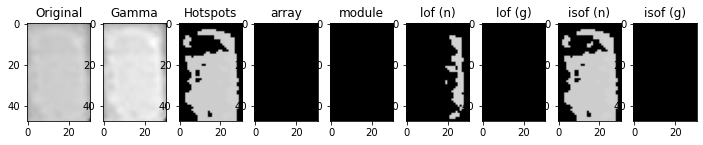

[-0.98977273 -0.97947214 -1.02198234 -1.02435018 -1.         -0.9934792
 -1.01901583 -1.00906484 -1.02737713 -1.01175959]
[-1.98820677]
[-0.44440617 -0.40937576 -0.47718156 -0.42619954 -0.42733916 -0.45924453
 -0.46912899 -0.45863244 -0.41631615 -0.43525286]
[-0.69764135]
[-1.04155578 -1.0977207  -1.22719432 -1.10300777 -1.02979121 -1.01761804
 -0.98992149 -1.06060657 -1.11555455 -1.03012274]
[-1.98820677]
[-0.57137038 -0.49903919 -0.61148362 -0.51251849 -0.55938097 -0.45743903
 -0.4504917  -0.56224419 -0.50769087 -0.46328087]
[-0.69764135]
4743.jpg Normal [3.0775617]
[-1.03847514 -0.95942541 -1.10298859 -1.01738711 -0.98455627 -0.98900351
 -1.47095076 -0.99379825 -1.10298859 -1.00735879]
[-2.33330394]
[-0.47312017 -0.44939145 -0.47000261 -0.47380532 -0.46889628 -0.43414857
 -0.59654978 -0.4479766  -0.47000261 -0.46290156]
[-0.76666079]
[-1.04397463 -1.26944944 -1.02446868 -1.03756056 -1.11654602 -1.51798391
 -0.99779426 -1.2051666  -1.02446868 -1.14742199]
[-2.33330394]
[-0.53239913 -

[-1.93412357 -0.93563711 -1.70000471 -2.4016435  -1.         -1.05708063
 -2.11344628 -2.20310764 -1.81884468 -1.41056109]
[-2.06550183]
[-0.63840373 -0.39819087 -0.60799099 -0.73131049 -0.44364516 -0.50237498
 -0.64655096 -0.6583391  -0.62879918 -0.55203098]
[-0.71310037]
[-1.83459963 -1.0751915  -1.85801653 -2.26863016 -1.02621173 -1.08818397
 -2.01331808 -2.08991171 -1.86414507 -1.20295236]
[-2.06550183]
[-0.61884124 -0.43513884 -0.59706452 -0.64904699 -0.44067077 -0.49470126
 -0.6361893  -0.63863362 -0.61538794 -0.50083185]
[-0.71310037]
1834.jpg Single-Hotspot [3.67706946]


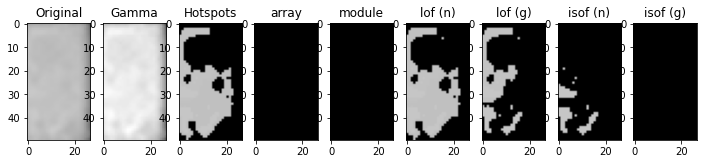

[-1.01236734 -1.13545039 -1.09591643 -1.1780527  -0.98040495 -1.03595491
 -0.98027419 -1.27112708 -1.0853806  -1.04828477]
[-2.35096627]
[-0.49981651 -0.46538273 -0.51307412 -0.55893691 -0.48895039 -0.53411346
 -0.45874464 -0.56340371 -0.54541405 -0.50590448]
[-0.77019325]
[-0.99787493 -1.0349965  -0.97699137 -0.97571913 -0.99309172 -0.97957484
 -1.42294631 -1.00252525 -1.07413158 -1.05016122]
[-2.35096627]
[-0.49817012 -0.53914059 -0.50269917 -0.4446894  -0.51582712 -0.46889592
 -0.5925207  -0.44197945 -0.49751377 -0.50822174]
[-0.77019325]
378.jpg Normal [7.09522663]
[-1.01617092 -1.         -0.97418577 -0.99534509 -0.95634009 -0.99379825
 -0.99534509 -1.02362888 -0.98691545 -1.02081096]
[-2.33330394]
[-0.48457471 -0.45042915 -0.47216802 -0.47135997 -0.45478999 -0.4479766
 -0.47135997 -0.48223251 -0.48148281 -0.47926811]
[-0.76666079]
[-1.39180601 -1.00340259 -1.65372511 -1.06202851 -1.58419913 -1.00871233
 -1.04503818 -1.31703255 -1.6884881  -1.18947226]
[-2.33330394]
[-0.60123524 -

[-1.35316632 -1.06387551 -1.06790651 -1.31125409 -1.02626742 -1.63225788
 -1.23042336 -1.07791933 -1.15045034 -0.95634009]
[-2.33330394]
[-0.57768005 -0.49700989 -0.52494711 -0.57978606 -0.47079598 -0.64559219
 -0.57345452 -0.54611669 -0.55381618 -0.45478999]
[-0.76666079]
[-1.61896212 -1.03756056 -1.13194244 -1.51798391 -1.00351674 -1.9682474
 -1.39180601 -1.17357906 -1.26944944 -1.07932217]
[-2.33330394]
[-0.65470024 -0.5348164  -0.55840912 -0.63471978 -0.46719836 -0.73232172
 -0.60123524 -0.59324392 -0.59620585 -0.49483884]
[-0.76666079]
3164.jpg Normal [6.81245967]
[-0.99434832 -1.01253731 -1.00190397 -1.         -1.01512464 -1.01512464
 -0.98308176 -0.99992615 -1.01253731 -1.04538092]
[-2.2754756]
[-0.47226922 -0.51145784 -0.48847296 -0.4812262  -0.5023928  -0.5023928
 -0.44835332 -0.47618315 -0.51145784 -0.53043749]
[-0.75509512]
[-1.02061677 -1.33021012 -1.05785728 -1.0085878  -1.10101504 -1.11352155
 -0.99711252 -1.07654301 -1.33021012 -1.5720665 ]
[-2.2754756]
[-0.5179484  -0.

[-0.95897355 -1.03339319 -1.02027471 -1.01236734 -1.03339319 -0.9627125
 -1.00818273 -1.0042735  -1.02233593 -1.74267603]
[-2.35096627]
[-0.4923233  -0.46436481 -0.44926245 -0.49981651 -0.46436481 -0.43181423
 -0.4848437  -0.44123283 -0.45687271 -0.656758  ]
[-0.77019325]
[-1.05718407 -1.12479175 -0.99162943 -0.99906091 -1.15426228 -0.99533965
 -1.00002604 -1.46321838 -0.97699137 -1.01683645]
[-2.35096627]
[-0.51600984 -0.57153059 -0.49896652 -0.52596282 -0.57290197 -0.54285512
 -0.50585997 -0.60508264 -0.53769047 -0.48465482]
[-0.77019325]
2520.jpg Normal [7.09522663]
[-1.         -0.99476087 -1.         -1.021446   -0.97595109 -0.99651015
 -1.02717374 -1.04682733 -1.00254005 -0.97947214]
[-1.98820677]
[-0.45000108 -0.43983769 -0.45000108 -0.44666738 -0.45178616 -0.43793239
 -0.45467724 -0.44695165 -0.44865909 -0.40937576]
[-0.69764135]
[-1.1282247  -1.02979121 -1.1282247  -1.06060657 -1.20169418 -1.09398862
 -1.08741883 -1.04900562 -1.29413219 -1.05094686]
[-1.98820677]
[-0.57675025 

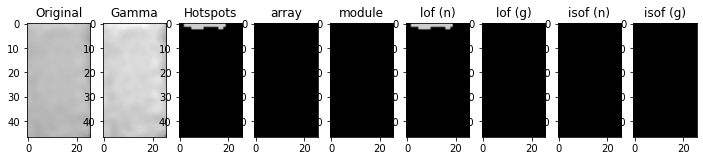

[-1.1006262  -0.97254298 -1.39118471 -0.95595626 -0.9854051  -0.97038271
 -1.03432342 -1.17321107 -1.08521204 -1.85277595]
[-2.16925195]
[-0.58485677 -0.50633526 -0.65240816 -0.41826003 -0.54713447 -0.51647298
 -0.52804203 -0.61031628 -0.49632011 -0.74238772]
[-0.73385039]
[-0.97564435 -0.97780572 -1.04367902 -0.99101568 -0.97653541 -1.0568147
 -0.96406378 -0.98580459 -1.00163656 -1.408595  ]
[-2.16925195]
[-0.52917429 -0.5380349  -0.56379661 -0.42494821 -0.54291949 -0.52911137
 -0.53025574 -0.55507355 -0.4731642  -0.652661  ]
[-0.73385039]
1940.jpg Single-Hotspot [4.66930188]


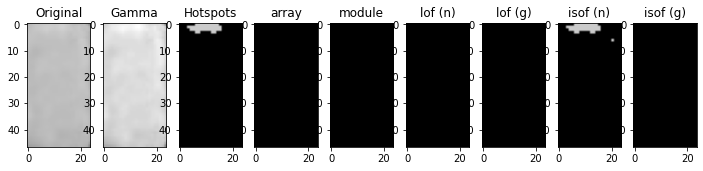

[-1.01860276 -0.99277207 -1.02435018 -1.01136313 -1.         -0.97595109
 -1.0348723  -1.00906484 -1.10272584 -1.00481151]
[-1.98820677]
[-0.47105642 -0.44161196 -0.42619954 -0.44171263 -0.45000108 -0.45178616
 -0.44290307 -0.45863244 -0.50258299 -0.4603116 ]
[-0.69764135]
[-1.31246042 -1.1282247  -1.04533759 -1.17938156 -1.04900562 -1.10046777
 -1.22719432 -1.17938156 -0.9858466  -1.37222638]
[-1.98820677]
[-0.65672104 -0.57675025 -0.54044748 -0.59236171 -0.54454029 -0.55387021
 -0.61148362 -0.59236171 -0.43182537 -0.69056285]
[-0.69764135]
2291.jpg Normal [3.0775617]
[-0.98067327 -1.01830111 -0.9952891  -1.040198   -0.95896081 -1.03044451
 -1.02174854 -0.99817597 -1.03151344 -0.98067327]
[-2.43259627]
[-0.46149321 -0.46121077 -0.45498157 -0.47213543 -0.46477553 -0.4690772
 -0.46955521 -0.45145339 -0.48816069 -0.46149321]
[-0.78651925]
[-0.9997929  -1.38064199 -1.03732579 -1.05023538 -0.99201383 -1.31215467
 -1.0088054  -1.04674928 -1.07426101 -0.9997929 ]
[-2.43259627]
[-0.52223826 -

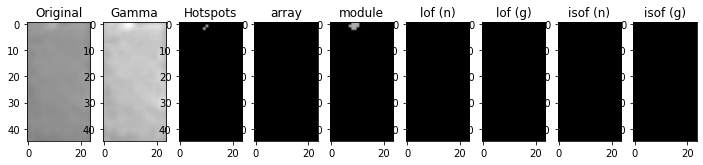

[-1.18963999 -0.94676557 -1.0076329  -1.021446   -1.01901583 -1.2366567
 -1.         -1.01572877 -0.97947214 -1.01820564]
[-1.98820677]
[-0.49827765 -0.42981074 -0.44523053 -0.44666738 -0.46912899 -0.5255254
 -0.44658939 -0.45757054 -0.40937576 -0.42721386]
[-0.69764135]
[-0.99693473 -1.04678473 -1.03281728 -1.22719432 -1.07599272 -0.99838148
 -1.29413219 -1.10736631 -1.06491798 -1.10785346]
[-1.98820677]
[-0.45208563 -0.5480625  -0.55760119 -0.61148362 -0.52010342 -0.45349274
 -0.65172664 -0.49541178 -0.56433341 -0.56664459]
[-0.69764135]
1217.jpg Normal [3.0775617]
[-0.98900351 -1.25339533 -1.01738711 -0.99557813 -1.04995155 -1.67834299
 -1.00519492 -1.13753817 -0.98850303 -1.9822992 ]
[-2.33330394]
[-0.43414857 -0.56115477 -0.47380532 -0.42765829 -0.49786142 -0.62993086
 -0.47040725 -0.52773768 -0.44932563 -0.63743684]
[-0.76666079]
[-1.65372511 -0.99964771 -1.03789669 -1.51798391 -0.97807921 -1.03056504
 -1.13194244 -1.0204324  -1.22526512 -1.02701124]
[-2.33330394]
[-0.66558921 -0

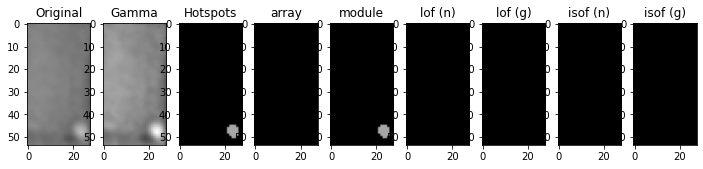

[-1.         -1.20384531 -1.01253731 -1.0134995  -1.00243933 -1.01253731
 -0.99434832 -2.49221442 -0.99992615 -0.97816298]
[-2.2754756]
[-0.4650592  -0.58994006 -0.51145784 -0.45508742 -0.47643135 -0.51145784
 -0.47226922 -0.69229166 -0.47618315 -0.44314424]
[-0.75509512]
[-0.99489289 -1.46874921 -1.05785728 -1.02173346 -1.02609847 -1.05190194
 -0.99535541 -2.23620741 -1.02061677 -1.06248074]
[-2.2754756]
[-0.47151559 -0.62242572 -0.52318017 -0.47652993 -0.51462754 -0.52361675
 -0.48851844 -0.68520511 -0.5179484  -0.47332208]
[-0.75509512]
1559.jpg Normal [5.96314812]
[-0.96030079 -0.96030079 -0.99562762 -1.05316436 -1.05316436 -0.98874315
 -0.9708271  -1.02175741 -1.10538728 -1.01309677]
[-2.16925195]
[-0.47933729 -0.47933729 -0.44928471 -0.50007407 -0.50007407 -0.47419591
 -0.4331765  -0.46192703 -0.49672159 -0.47388066]
[-0.73385039]
[-1.01969412 -1.01969412 -1.00163656 -0.97053902 -0.97053902 -1.16471259
 -1.0568147  -0.96574806 -1.00943908 -1.1507768 ]
[-2.16925195]
[-0.53743981 -

[-0.96666385 -1.01175959 -1.01150071 -1.2366567  -0.96666385 -0.94676557
 -1.05040248 -1.0076329  -1.03033432 -1.02435018]
[-1.98820677]
[-0.42565355 -0.43525286 -0.460197   -0.5255254  -0.42565355 -0.42981074
 -0.48156607 -0.44523053 -0.46912451 -0.42619954]
[-0.69764135]
[-1.20169418 -1.0863663  -1.04240047 -1.00440427 -1.21444425 -1.169819
 -1.10736631 -1.06060657 -1.05257519 -1.43757049]
[-1.98820677]
[-0.59565069 -0.564686   -0.55851901 -0.46614513 -0.59759422 -0.59916652
 -0.49541178 -0.56224419 -0.53568732 -0.70457767]
[-0.69764135]
740.jpg Normal [3.0775617]
[-1.03847514 -1.02632784 -1.71896794 -0.99557813 -0.99381613 -1.15898281
 -0.99379825 -1.3464852  -1.00411927 -1.04128666]
[-2.33330394]
[-0.47312017 -0.45943178 -0.63286796 -0.42765829 -0.46904151 -0.54751566
 -0.4479766  -0.56307812 -0.51049147 -0.48059046]
[-0.76666079]
[-1.04715744 -1.51798391 -0.96234714 -1.42197184 -1.06202851 -0.98580574
 -1.17357906 -1.02579131 -1.0519452  -0.95874394]
[-2.33330394]
[-0.52259514 -0.

[-1.00149865 -1.02185004 -1.02923039 -0.95896081 -1.0333895  -1.02185004
 -0.98067327 -1.03044451 -0.94668476 -1.12714419]
[-2.43259627]
[-0.46362888 -0.47063784 -0.51729383 -0.46477553 -0.47802392 -0.47063784
 -0.46149321 -0.4690772  -0.46314671 -0.51290641]
[-0.78651925]
[-1.07417292 -0.99762382 -1.02724192 -1.01179186 -0.99250202 -0.98502454
 -0.99656436 -1.21845622 -1.02221171 -0.97796592]
[-2.43259627]
[-0.51080278 -0.53447291 -0.47957592 -0.4911398  -0.46561462 -0.50498111
 -0.50193383 -0.56622227 -0.49290851 -0.45017396]
[-0.78651925]
4385.jpg Normal [8.56241501]
[-1.00393082 -1.04821111 -1.09760246 -1.03307128 -0.97324831 -0.98959489
 -1.         -2.1793187  -1.01250008 -0.97816298]
[-2.2754756]
[-0.45562754 -0.44357101 -0.4895174  -0.4510434  -0.46006105 -0.43121445
 -0.44149131 -0.64591872 -0.46911105 -0.44314424]
[-0.75509512]
[-1.06324595 -1.01280957 -1.02173346 -1.05626997 -1.40769809 -1.03198733
 -1.15256555 -1.10561205 -1.01406579 -1.04952739]
[-2.2754756]
[-0.55210507 -

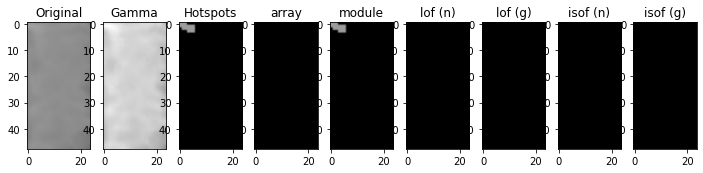

[-1.         -0.95381019 -1.11180795 -0.99381204 -1.00211427 -0.96778998
 -1.         -1.00630048 -1.12706251 -0.99591249]
[-2.2754756]
[-0.44313828 -0.44001182 -0.51414208 -0.4459336  -0.4638773  -0.43941941
 -0.44577051 -0.45145634 -0.52482017 -0.47416877]
[-0.75509512]
[-1.17303958 -1.03536972 -1.00922732 -1.53449658 -1.00090237 -1.05785728
 -1.26185119 -1.05626997 -1.02173346 -1.01280957]
[-2.2754756]
[-0.5727011  -0.51248048 -0.47257797 -0.63669607 -0.47720224 -0.52318017
 -0.59017371 -0.54990926 -0.47652993 -0.49123762]
[-0.75509512]
755.jpg Normal [5.96314812]
[-0.98842583 -0.99883771 -1.00599118 -1.04527118 -1.03588375 -0.97756699
 -1.04772062 -1.46783531 -1.01448506 -1.04527118]
[-2.22838953]
[-0.48519326 -0.46467067 -0.48115188 -0.50686597 -0.50789039 -0.50463033
 -0.47392466 -0.60488615 -0.52564641 -0.50686597]
[-0.74567791]
[-1.06623465 -1.06418681 -0.98912237 -1.27672072 -1.23778641 -1.01885119
 -1.0121262  -1.15007394 -1.1395947  -1.27672072]
[-2.22838953]
[-0.54970012 -0

[-1.03033432 -1.06929245 -1.240644   -1.01901583 -1.02717374 -1.10272584
 -1.15162185 -0.99039612 -1.02649152 -1.63866414]
[-1.98820677]
[-0.46912451 -0.49075987 -0.51508589 -0.46912899 -0.45467724 -0.50258299
 -0.49535592 -0.45861753 -0.47881874 -0.61294583]
[-0.69764135]
[-1.17938156 -1.04678473 -1.1049422  -1.10046777 -1.41525787 -1.0447792
 -1.03281728 -1.27739773 -1.07393102 -0.9858466 ]
[-1.98820677]
[-0.59236171 -0.5480625  -0.52657357 -0.55387021 -0.70267342 -0.54760048
 -0.55760119 -0.64374735 -0.56297284 -0.43182537]
[-0.69764135]
782.jpg Normal [3.0775617]
[-1.01306818 -0.99374251 -0.99005865 -1.1204483  -1.02740541 -1.01306818
 -0.99005865 -0.99016904 -1.0302296  -1.01150823]
[-2.16925195]
[-0.47973995 -0.4425746  -0.46928492 -0.5306286  -0.47357325 -0.47973995
 -0.46928492 -0.46356979 -0.50297714 -0.4531886 ]
[-0.73385039]
[-1.01545997 -0.9656442  -1.09939329 -1.0340872  -0.97564435 -1.01545997
 -1.10189918 -1.0568147  -1.04394122 -1.19354233]
[-2.16925195]
[-0.47072069 -0

[-1.01855241 -0.96022438 -0.99781333 -1.00355881 -1.01669792 -0.99016904
 -1.0246656  -1.00966777 -0.99781333 -1.3095855 ]
[-2.16925195]
[-0.46200926 -0.43804992 -0.45169958 -0.47764503 -0.46181013 -0.46356979
 -0.44666653 -0.44721821 -0.45169958 -0.56577888]
[-0.73385039]
[-0.97564435 -1.06558494 -0.97053902 -1.2795634  -1.17248957 -1.00163656
 -1.03253654 -1.0568147  -0.97653541 -0.98957372]
[-2.16925195]
[-0.52917429 -0.54219498 -0.53285386 -0.63717699 -0.51149995 -0.4731642
 -0.52603303 -0.53270779 -0.54291949 -0.44776251]
[-0.73385039]
219.jpg Normal [4.66930188]
[-1.04479638 -0.99476087 -1.01136313 -1.18025714 -1.04483344 -1.07774683
 -1.03781376 -1.12711567 -1.09646461 -1.2027115 ]
[-1.98820677]
[-0.55914506 -0.43983769 -0.44171263 -0.60775113 -0.54655916 -0.50514281
 -0.56154181 -0.58658339 -0.55988726 -0.61389977]
[-0.69764135]
[-1.10046777 -1.03909133 -1.01819313 -1.29413219 -1.03281728 -1.0982305
 -1.04461531 -1.21444425 -1.169819   -1.35150751]
[-1.98820677]
[-0.55387021 -0

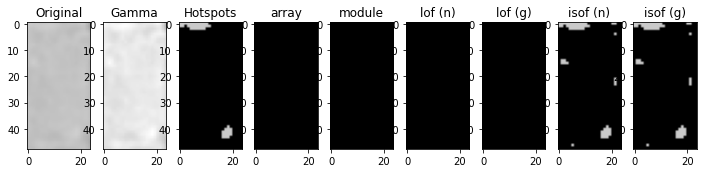

[-1.0248224  -0.97816298 -1.0392091  -1.00630048 -1.00393082 -2.27944533
 -0.98959489 -1.06605451 -1.23448292 -1.01227856]
[-2.2754756]
[-0.48556564 -0.44314424 -0.48991148 -0.45145634 -0.45562754 -0.66365529
 -0.43121445 -0.45132521 -0.54096645 -0.45123155]
[-0.75509512]
[-1.01118093 -1.10101504 -0.98586372 -1.21059706 -1.43822365 -1.0588552
 -1.10101504 -1.04053615 -1.01883605 -1.05190194]
[-2.2754756]
[-0.51853678 -0.55373236 -0.48966888 -0.57637543 -0.61731758 -0.49256876
 -0.55373236 -0.51237993 -0.48832036 -0.52361675]
[-0.75509512]
557.jpg Normal [5.96314812]
[-0.94627422 -1.03742432 -1.00966777 -1.00108597 -1.0391812  -1.00247766
 -0.95595626 -0.99781333 -1.0302296  -1.00966777]
[-2.16925195]
[-0.44596861 -0.48814857 -0.44721821 -0.44867492 -0.45792539 -0.42812748
 -0.41826003 -0.45169958 -0.50297714 -0.44721821]
[-0.73385039]
[-0.97780572 -1.01120509 -1.04166921 -1.14553801 -1.17248957 -0.98580459
 -1.25088971 -0.9656442  -1.01905995 -1.04166921]
[-2.16925195]
[-0.5380349  -0.

[-1.03432342 -1.05182509 -0.99005865 -0.96942635 -1.03432342 -1.76316778
 -1.00163225 -1.0246656  -0.95978649 -1.16429331]
[-2.16925195]
[-0.51026821 -0.50989328 -0.46928492 -0.50072845 -0.51026821 -0.59103443
 -0.45865633 -0.44666653 -0.48904449 -0.51358063]
[-0.73385039]
[-1.08082062 -1.0568147  -0.98061035 -0.96406378 -1.0548215  -1.63953298
 -0.9774849  -0.97953558 -0.98580459 -1.17248957]
[-2.16925195]
[-0.60575211 -0.53270779 -0.45133785 -0.53025574 -0.59192836 -0.57882932
 -0.4494509  -0.41962267 -0.55507355 -0.51149995]
[-0.73385039]
1772.jpg Normal [4.66930188]
[-1.00663951 -0.9899187  -1.04135122 -1.00116875 -0.98205235 -1.10448599
 -1.13375377 -0.97447955 -0.97883244 -0.98717949]
[-2.03162299]
[-0.46120981 -0.45806694 -0.4283873  -0.42953517 -0.45987165 -0.45705073
 -0.49694185 -0.46961261 -0.43331684 -0.42008265]
[-0.7063246]
[-1.09493827 -1.13820224 -1.14211987 -0.99524076 -1.06326245 -0.97317458
 -1.35718864 -1.04398154 -0.99092219 -0.99945718]
[-2.03162299]
[-0.51406346 

[-1.07107541 -0.98585859 -0.98717949 -1.0274257  -1.00116875 -0.97883244
 -1.13953828 -1.10448599 -0.91268965 -0.98395323]
[-2.03162299]
[-0.47250442 -0.42070822 -0.42008265 -0.42956478 -0.42953517 -0.43331684
 -0.46379818 -0.45705073 -0.43153271 -0.44166894]
[-0.7063246]
[-1.63911672 -1.04398154 -1.27514018 -1.20526949 -1.14528026 -1.07949546
 -0.99945718 -1.15293624 -1.03985935 -1.39652745]
[-2.03162299]
[-0.67720827 -0.5556968  -0.57759989 -0.54474412 -0.49915921 -0.56567066
 -0.47224326 -0.54995821 -0.43615907 -0.59424975]
[-0.7063246]
3950.jpg Normal [3.40112807]
[-0.98900351 -1.         -0.99381613 -0.9876859  -0.95942541 -1.01144689
 -1.05490009 -0.99576181 -1.01602564 -0.98900351]
[-2.33330394]
[-0.43414857 -0.45042915 -0.46904151 -0.42820736 -0.44939145 -0.4466998
 -0.47224732 -0.43399537 -0.44726261 -0.43414857]
[-0.76666079]
[-1.15870009 -1.34082411 -1.11975979 -1.51798391 -1.06202851 -1.26944944
 -1.88216761 -1.45176869 -1.26944944 -1.15870009]
[-2.33330394]
[-0.58057777 -0

[-1.00629371 -1.00906484 -1.01820564 -1.02717374 -0.97595109 -1.0517016
 -0.97947214 -1.         -0.97947214 -1.03044211]
[-1.98820677]
[-0.43995588 -0.45863244 -0.42721386 -0.45467724 -0.45178616 -0.4944306
 -0.40937576 -0.43650685 -0.40937576 -0.4484443 ]
[-0.69764135]
[-1.10216495 -1.04240047 -1.08914766 -1.00623817 -1.03281728 -1.20169418
 -1.05301906 -1.07734939 -1.05301906 -1.01495164]
[-1.98820677]
[-0.51620421 -0.55851901 -0.51286015 -0.4576552  -0.55760119 -0.59565069
 -0.46367836 -0.52997513 -0.46367836 -0.44954032]
[-0.69764135]
4971.jpg Normal [3.0775617]
[-1.02803567 -1.01292107 -1.03559792 -0.98714209 -1.01112961 -0.99248656
 -1.04527118 -1.18149731 -0.98000622 -1.00802182]
[-2.22838953]
[-0.52196952 -0.49308059 -0.54328086 -0.51530504 -0.47939387 -0.44595098
 -0.50686597 -0.58305265 -0.49972933 -0.50536729]
[-0.74567791]
[-1.02839756 -1.01197301 -1.05413417 -1.02392581 -1.01202331 -1.04158172
 -1.03187944 -1.22075266 -0.97575759 -0.99881603]
[-2.22838953]
[-0.54309552 -0

[-1.07774683 -1.00906484 -1.04682733 -1.021446   -0.94676557 -1.
 -1.03044211 -1.01860276 -1.01434752 -0.98977273]
[-1.98820677]
[-0.50514281 -0.45863244 -0.44695165 -0.44666738 -0.42981074 -0.42733916
 -0.4484443  -0.47105642 -0.46072458 -0.44440617]
[-0.69764135]
[-1.21444425 -1.04240047 -1.11529779 -1.11555455 -1.03583446 -1.05257519
 -1.01495164 -1.06491798 -0.99263807 -1.04533759]
[-1.98820677]
[-0.59759422 -0.55851901 -0.51444904 -0.50769087 -0.48100778 -0.53568732
 -0.44954032 -0.56433341 -0.4409121  -0.54044748]
[-0.69764135]
3011.jpg Normal [3.0775617]
[-0.97608634 -1.01398784 -1.56160698 -1.01177183 -1.00002607 -0.98351947
 -0.96935825 -1.02965312 -1.22104376 -1.06312301]
[-2.25995997]
[-0.48600151 -0.51635486 -0.62573802 -0.48107672 -0.5088713  -0.52190837
 -0.53674755 -0.5462695  -0.5861199  -0.52776632]
[-0.75199199]
[-0.95843219 -1.05092248 -1.3434075  -1.04950631 -1.02709185 -0.99836717
 -0.98567235 -0.95843219 -1.04155391 -0.99284844]
[-2.25995997]
[-0.52093046 -0.52042

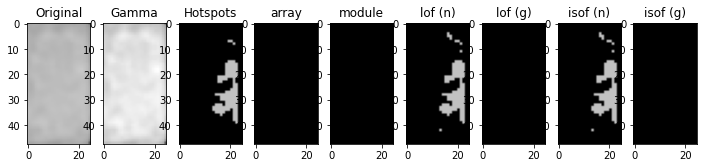

[-1.03044211 -0.99476087 -0.9934792  -1.01175959 -1.21213566 -0.99651015
 -1.01901583 -1.02435018 -1.03044211 -0.94676557]
[-1.98820677]
[-0.4484443  -0.43983769 -0.45924453 -0.43525286 -0.50298314 -0.43793239
 -0.46912899 -0.42619954 -0.4484443  -0.42981074]
[-0.69764135]
[-1.04900562 -1.24392879 -1.02979121 -1.09472335 -1.03012274 -1.13792986
 -1.09398862 -1.39294524 -1.04900562 -1.16105333]
[-1.98820677]
[-0.54454029 -0.61783716 -0.55938097 -0.56149038 -0.46328087 -0.57659205
 -0.5231132  -0.69478071 -0.54454029 -0.59518029]
[-0.69764135]
91.jpg Normal [3.0775617]
[-1.01814896 -1.01250008 -1.27751527 -0.99876213 -1.01227856 -1.11180795
 -0.99591249 -1.15283303 -1.01250008 -0.99591249]
[-2.2754756]
[-0.48757974 -0.46911105 -0.53391278 -0.49294099 -0.45123155 -0.51414208
 -0.47416877 -0.51623207 -0.46911105 -0.47416877]
[-0.75509512]
[-1.04053615 -1.08714718 -0.98586372 -1.05190194 -1.53449658 -1.03603518
 -1.21059706 -1.01883184 -1.07654301 -1.26185119]
[-2.2754756]
[-0.51237993 -0.5

[-0.99869577 -0.95381019 -1.0364774  -0.98320956 -0.98308176 -0.99712379
 -1.07525315 -0.99992615 -1.         -1.00942061]
[-2.2754756]
[-0.46734064 -0.44001182 -0.46373376 -0.46784168 -0.44835332 -0.44731358
 -0.49498764 -0.47618315 -0.45614476 -0.45426303]
[-0.75509512]
[-1.05193173 -1.04277096 -1.02609847 -1.06324595 -0.98850263 -1.01406579
 -0.98720778 -1.40769809 -0.99489289 -1.03536972]
[-2.2754756]
[-0.53564891 -0.46339691 -0.51462754 -0.55210507 -0.49672659 -0.47928541
 -0.44135822 -0.60530811 -0.47151559 -0.51248048]
[-0.75509512]
2657.jpg Normal [5.96314812]
[-1.11133058 -1.9928575  -0.9646457  -1.06888176 -0.98940296 -0.94450581
 -1.05803368 -1.03451911 -0.96844129 -1.01906475]
[-2.25995997]
[-0.48387199 -0.63154983 -0.44631948 -0.49961441 -0.451326   -0.43903406
 -0.51850474 -0.4296351  -0.4419686  -0.49340302]
[-0.75199199]
[-1.02457669 -1.5789487  -1.05278878 -1.04710754 -1.02804806 -0.99141406
 -0.95843219 -1.04240104 -1.04950631 -1.0499376 ]
[-2.25995997]
[-0.49415029 -

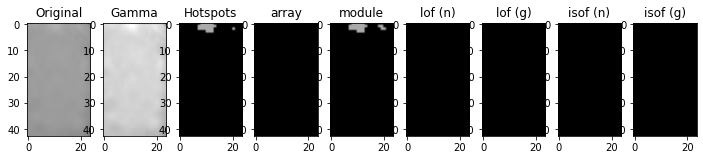

[-1.04389922 -1.33206181 -1.08861649 -1.0119094  -1.48952599 -1.33206181
 -1.04389922 -1.00190397 -1.13804711 -0.97816298]
[-2.2754756]
[-0.51039659 -0.60668709 -0.56599299 -0.51710548 -0.62531863 -0.60668709
 -0.51039659 -0.48847296 -0.5780828  -0.44314424]
[-0.75509512]
[-1.05785728 -1.38186876 -1.11352155 -1.03603518 -1.60963643 -1.40769809
 -1.05785728 -0.99272236 -1.17303958 -0.97232275]
[-2.2754756]
[-0.52318017 -0.5896861  -0.55925537 -0.52375105 -0.65517263 -0.60530811
 -0.52318017 -0.48685297 -0.5727011  -0.43773747]
[-0.75509512]
2131.jpg Normal [5.96314812]
[-1.02965312 -0.99029663 -0.96935825 -0.98016598 -1.00162877 -1.01399934
 -1.03210201 -0.96935825 -1.00002607 -1.22104376]
[-2.25995997]
[-0.5462695  -0.41912834 -0.53674755 -0.41880943 -0.49067891 -0.49098792
 -0.48303872 -0.53674755 -0.51181082 -0.5861199 ]
[-0.75199199]
[-0.97506096 -1.02263631 -0.9980291  -1.08788032 -1.05578783 -1.04436872
 -1.05700421 -0.9980291  -1.05696226 -0.97510251]
[-2.25995997]
[-0.50239739 -

[-0.98915225 -1.00142099 -1.00646853 -1.05855136 -0.97942963 -1.00646853
 -1.06765866 -1.01314647 -1.009968   -0.96179603]
[-2.35524803]
[-0.48537992 -0.44871064 -0.43226207 -0.45826072 -0.42415695 -0.43226207
 -0.47977804 -0.48051912 -0.47329369 -0.4568183 ]
[-0.77104961]
[-0.98494362 -1.06484488 -0.99077144 -1.06826324 -0.99869927 -0.97202174
 -0.99183645 -1.01481401 -1.01509158 -1.00824714]
[-2.35524803]
[-0.48745326 -0.48547073 -0.47673703 -0.48922139 -0.47121318 -0.45715587
 -0.47143274 -0.53572754 -0.47734694 -0.48645283]
[-0.77104961]
3207.jpg Normal [7.16552521]
[-0.94450581 -1.01177183 -1.10384785 -0.9646457  -1.12024355 -1.09891546
 -0.98016598 -1.01909355 -0.95568957 -1.0519022 ]
[-2.25995997]
[-0.43903406 -0.48107672 -0.46850104 -0.44631948 -0.53741481 -0.44889197
 -0.41880943 -0.48445064 -0.41138631 -0.45261314]
[-0.75199199]
[-0.9990918  -0.95843219 -0.98567235 -1.00821086 -1.05768798 -1.00407057
 -0.94246361 -0.95843219 -1.02268345 -1.00045174]
[-2.25995997]
[-0.44786566

In [254]:
anomaly_modules= {}
os.makedirs(input_dir_path+"/hist/",exist_ok=True)
#for n, k in enumerate(list(thermal_img_files)[:10]):
for n, k in enumerate(list(thermal_img_files)):    
    # -- module label --
    l = module_labels[n]
    if l == -1:
        pass
    else:
        # -- clustering --
        clusters = clustering.TemperatureClusters(
            data_array[l].scaled_temperature_with_index[k], 
            method=clustering_method
        )  
        # -- gamma correction --
        gamma_temperature_each = gamma_correction(
            data_array[l].temperature[k],
            gamma = 2.0
        )
        gamma_temperature_array = gamma_correction(
            data_array[l].temperature[k],
            gamma = gamma,
            x_max = np.max(data_array[l].temperature[k])
        )
        # -- original temperature --
        sliced_data = clusters.get_clusters_data(data_array[l].temperature[k])    
        original_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        # -- scaled temperature --
        sliced_data = clusters.get_clusters_data(
            preprocessing.RobustScaler().fit_transform(gamma_temperature_each)
        )
        scaled_clusters_temperature = np.stack([t.mean(axis=0) for t in sliced_data ])        
        # -- transformed temperature --        
        sliced_data = clusters.get_clusters_data(gamma_temperature_array)    
        gamma_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        transformed_clusters_temperature = array_zscaler[l].transform(gamma_clusters_temperature)
        # -- anomaly detection --    
        hot_pixels_in_array, _ = get_hotspots_in_array(
            transformed_clusters_temperature, thermal_img_files[k], log=False) 
        hot_pixels_in_module, _ = get_hotspots_in_module(
            scaled_clusters_temperature, thermal_img_files[k], log=False)
        hot_pixels_lof_normal, _ = get_hotspots_by_models(
            original_clusters_temperature, scaled_clusters_temperature,
            array_lof_normal[l], thermal_img_files[k], log=False)        
        hot_pixels_isof_normal, _ = get_hotspots_by_models(
            original_clusters_temperature, scaled_clusters_temperature,
            array_isof_normal[l], thermal_img_files[k], log=False)        
        hot_pixels_lof_gamma, _ = get_hotspots_by_models(
            gamma_clusters_temperature, scaled_clusters_temperature,
            array_lof_gamma[l], thermal_img_files[k], log=False)        
        hot_pixels_isof_gamma, _ = get_hotspots_by_models(
            gamma_clusters_temperature, scaled_clusters_temperature,
            array_isof_gamma[l], thermal_img_files[k], log=False)        
        hot_pixels = (
            hot_pixels_in_module
            | hot_pixels_lof_normal
            | hot_pixels_isof_normal
        )
        hot_pixels = remove_useless_clusters(hot_pixels)
        module_type = anomaly_detection.detect_module_type(hot_pixels, clusters)
        # -- save anomaly modules --
        if module_type not in anomaly_modules:
            anomaly_modules[module_type] = [k]
        else:
            anomaly_modules[module_type].append(k)        
        # -- display -- 
        img_clustered = original_clusters_temperature[clusters.labels].reshape(thermal_img_files[k].shape)
        img_hotspots = img_clustered * hot_pixels
        img_hotspots_in_array = img_clustered * hot_pixels_in_array
        img_hotspots_in_module = img_clustered * hot_pixels_in_module
        img_hotspots_lof_normal = img_clustered * hot_pixels_lof_normal
        img_hotspots_isof_normal = img_clustered * hot_pixels_isof_normal
        img_hotspots_lof_gamma = img_clustered * hot_pixels_lof_gamma
        img_hotspots_isof_gamma = img_clustered * hot_pixels_isof_gamma        
        print(k, module_type, scaled_array_mean_temperatures[l])
        if module_type != "Normal":
            display.display_modules({
                "Original": thermal_img_files[k], 
                "Gamma": gamma_correction(thermal_img_files[k], gamma=gamma), 
                "Hotspots": img_hotspots,
                "array": img_hotspots_in_array,
                "module": img_hotspots_in_module,
                "lof (n)": img_hotspots_lof_normal,
                "lof (g)": img_hotspots_lof_gamma,
                "isof (n)": img_hotspots_isof_normal,
                "isof (g)": img_hotspots_isof_gamma,
            })


In [255]:
list_anomaly_modules = [
    "190.jpg", 
    "320.jpg", 
    "351.jpg ",
    "737.jpg",     
    "899.jpg", 
    "923.jpg", 
    "1270.jpg", 
    "1309.jpg",     
    "1408.jpg", 
    "1561.jpg"
    "1669.jpg"    
    "1683.jpg"        
    "1853.jpg"        
    "1967.jpg",     
    "1991.jpg", 
    "2076.jpg",     
    "2078.jpg", 
    "2139.jpg",     
    "2195.jpg",     
    "2425.jpg",  
    "2459.jpg", 
    "3283.jpg",     
    "3672.jpg", 
    "3752.jpg", 
    "4567.jpg",     
    "4655.jpg",     
    "4700.jpg",     
    "4985.jpg",         
    "5017.jpg",     
    "5079.jpg",     
    "5151.jpg",     
]

In [ ]:
list_edge_anomaly_modules = [
    "3960.jpg",
    "2459.jpg",
    "2665.jpg",
    "4822.jpg", 
]

In [256]:
list_other_modules = [
    "1852.jpg",
    "1813.jpg",
    "1867.jpg",
    "2008.jpg",
    "2243.jpg",

]

[-1.02819589 -2.31675453 -1.00595163 -1.01860128 -1.07698531 -1.0162485
 -1.01556348 -1.08348066 -1.00595163 -1.13500857]
[-2.21296359]
[-0.48166844 -0.73243816 -0.47194019 -0.43573215 -0.48037    -0.44553744
 -0.48231934 -0.52656691 -0.47194019 -0.54063766]
[-0.74259272]
[-1.01755917 -2.61191707 -1.00918439 -1.06722996 -1.05344149 -1.0306767
 -1.01969123 -1.12377143 -1.00973543 -1.21629698]
[-2.21296359]
[-0.47664105 -0.75600236 -0.48394668 -0.46086501 -0.47646393 -0.46580814
 -0.50690108 -0.55095602 -0.47933633 -0.57880466]
[-0.74259272]
3752.jpg Single-Hotspot [5.16373076]


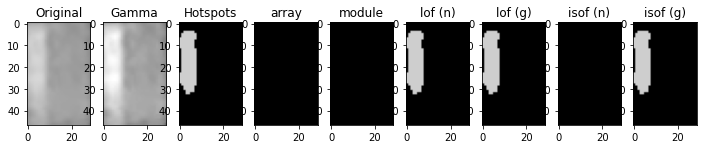

[-1.0036516  -1.39127779 -3.4572527  -0.97574105 -1.03018574 -1.95333495
 -1.15177218 -1.00124274 -0.96510184 -0.97888283]
[-2.21296359]
[-0.46080773 -0.55955667 -0.7704609  -0.44627274 -0.47675981 -0.62189151
 -0.47553301 -0.42541589 -0.41642335 -0.49127442]
[-0.74259272]
[-1.20683967 -1.68539819 -1.27038133 -1.18957267 -1.3432918  -2.27844677
 -1.44035907 -1.10329462 -1.07665656 -1.01129369]
[-2.21296359]
[-0.5026085  -0.60726352 -0.5866586  -0.49796901 -0.5451948  -0.69711787
 -0.57385984 -0.47710736 -0.47319728 -0.4702127 ]
[-0.74259272]
2459.jpg Single-Hotspot [5.16373076]


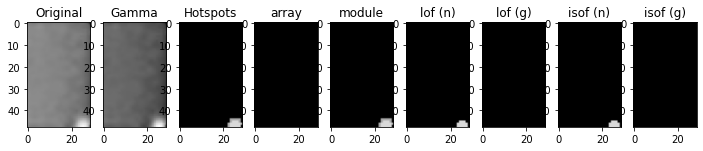

[-1.0011248  -1.43823859 -2.71899992 -1.04894494 -1.22174245 -0.98817494
 -5.13594989 -1.7321957  -0.98817494 -1.06108799]
[-2.19190912]
[-0.45766477 -0.62109307 -0.73959161 -0.44157503 -0.52738402 -0.44053932
 -0.79893694 -0.613026   -0.44053932 -0.47291122]
[-0.73838182]
[-1.05305121 -1.04736817 -2.58300535 -1.0172355  -1.31098279 -1.00751654
 -4.01688714 -1.77799668 -1.01855631 -1.03024122]
[-2.19190912]
[-0.49095926 -0.51542561 -0.72416814 -0.44277572 -0.5617764  -0.47256488
 -0.76542793 -0.66537695 -0.45807119 -0.44930021]
[-0.73838182]
1408.jpg Single-Hotspot [4.91936581]


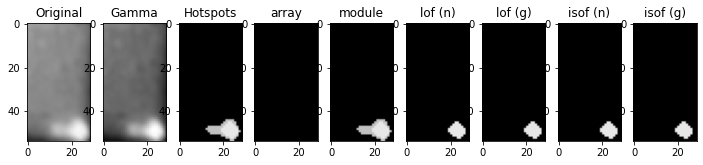

[-0.99480649 -1.06686275 -1.73485095 -0.96637996 -0.96214007 -2.83970292
 -1.12688801 -1.05868441 -1.53469757 -1.2774246 ]
[-1.85637122]
[-0.420603   -0.45727768 -0.63162086 -0.43507333 -0.45102154 -0.73152577
 -0.50444064 -0.44477142 -0.56718244 -0.49828466]
[-0.67127424]
[-1.04879439 -0.9811067  -1.29000539 -1.01924566 -0.991662   -2.17555769
 -2.11035926 -0.96941061 -1.24774917 -0.96006823]
[-1.85637122]
[-0.45084761 -0.42690238 -0.56395899 -0.44832048 -0.43990541 -0.65217038
 -0.67737967 -0.45335513 -0.5134769  -0.42663005]
[-0.67127424]
2076.jpg Single-Hotspot [2.2718059]


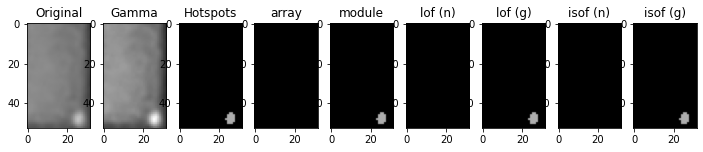

[-1.02572562 -1.5927373  -1.0092414  -1.06638145 -1.96288047 -1.07670192
 -1.31092375 -4.56748315 -1.08977874 -1.02021384]
[-2.19426689]
[-0.51401256 -0.70956133 -0.4741908  -0.4464874  -0.72607322 -0.54709028
 -0.62935348 -0.76807441 -0.45195404 -0.53405445]
[-0.73885338]
[-1.03984968 -1.09153509 -1.02119286 -1.02262988 -1.21082712 -1.01104773
 -1.0306402  -3.4435245  -1.01396743 -1.01581333]
[-2.19426689]
[-0.51867694 -0.5597399  -0.47109336 -0.44814047 -0.60925961 -0.52787444
 -0.56491265 -0.77856928 -0.45627251 -0.51234537]
[-0.73885338]
4567.jpg Single-Hotspot [4.94614554]


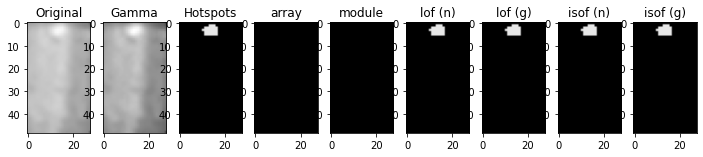

[-0.94315251 -1.         -1.02219992 -1.30308079 -1.03284108 -0.98037459
 -1.02219992 -1.05291521 -1.02826546 -2.23030874]
[-2.1916295]
[-0.459844   -0.4322703  -0.46404381 -0.60909429 -0.46408306 -0.41222941
 -0.45030011 -0.47479254 -0.44520473 -0.67561812]
[-0.7383259]
[-2.2310355  -1.00787675 -1.19652582 -1.00944861 -0.92914592 -1.03246276
 -1.11226343 -1.02640693 -0.99021757 -5.33853718]
[-2.1916295]
[-0.66741467 -0.44739736 -0.55799216 -0.49462399 -0.46665253 -0.47347246
 -0.51012221 -0.45813915 -0.44408185 -0.77818273]
[-0.7383259]
4985.jpg Single-Hotspot [4.91619948]


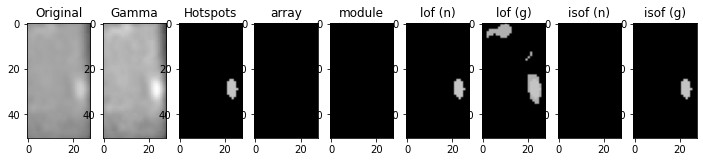

[-0.98172259 -1.21478927 -1.56498272 -1.04361205 -2.54665601 -0.98299834
 -0.99936271 -1.47684793 -1.05249857 -1.0188206 ]
[-2.26337675]
[-0.44035561 -0.55784013 -0.69293913 -0.50332818 -0.71385151 -0.46261395
 -0.4324988  -0.60289695 -0.46490003 -0.46129362]
[-0.75267535]
[-1.07353751 -1.33060879 -1.18809327 -1.09800793 -2.52848626 -1.02167342
 -1.04864812 -1.60100926 -1.00412071 -1.03922964]
[-2.26337675]
[-0.46861372 -0.56049554 -0.58935985 -0.51672844 -0.71623625 -0.48110751
 -0.47025484 -0.60639654 -0.47592211 -0.48705297]
[-0.75267535]
2139.jpg Single-Hotspot [5.79931571]


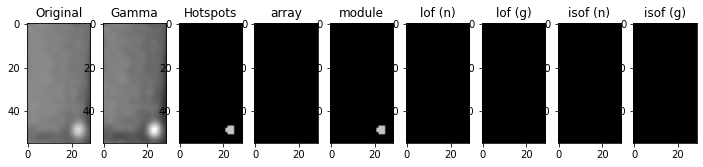

[-1.28028422 -1.93414205 -1.10050388 -1.02396392 -1.03717326 -0.98646977
 -0.99642713 -1.06493627 -1.26147767 -1.76064758]
[-1.77910148]
[-0.53848446 -0.71430667 -0.51126992 -0.45796106 -0.51114257 -0.43498541
 -0.42359774 -0.53128047 -0.6337237  -0.70410167]
[-0.6558203]
[-1.11209462 -1.6138184  -1.31202175 -1.03540508 -1.31390644 -1.02317966
 -1.00063848 -1.03330195 -1.08355042 -1.48794432]
[-1.77910148]
[-0.48281594 -0.67595642 -0.53893887 -0.45340151 -0.54383555 -0.46310324
 -0.43936958 -0.52985506 -0.53899863 -0.6486651 ]
[-0.6558203]
5079.jpg Multi-Hotspots [1.90152253]


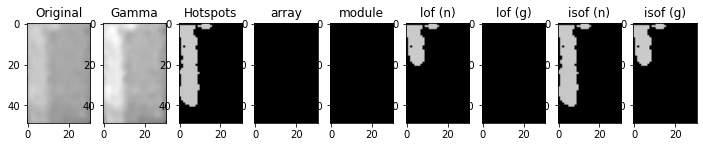

[-1.22134476 -5.37923447 -1.15554561 -3.25807348 -1.19234145 -5.27497612
 -1.25205286 -1.22134476 -1.60930981 -3.45417848]
[-2.09404644]
[-0.51409256 -0.79719464 -0.50134081 -0.75508599 -0.5067917  -0.79719464
 -0.53165145 -0.51409256 -0.59313623 -0.75764472]
[-0.71880929]
[-1.01949767 -4.48404487 -1.01914039 -2.45278403 -1.01049148 -4.48404487
 -1.03219804 -1.01049148 -1.20154933 -2.63569761]
[-2.09404644]
[-0.50337208 -0.79289133 -0.50050182 -0.73684227 -0.50929714 -0.79289133
 -0.50749457 -0.50929714 -0.54778201 -0.74637562]
[-0.71880929]
3283.jpg Cluster-Anomaly [3.92686926]


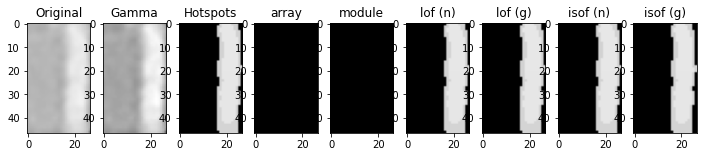

[-1.01130117 -1.0177263  -1.33534083 -1.21641148 -2.17917103 -0.97899503
 -1.         -1.00538046 -1.01140105 -0.99639786]
[-2.22766175]
[-0.46328852 -0.46562835 -0.54716462 -0.52999134 -0.67359113 -0.49867797
 -0.45479501 -0.45406309 -0.49446889 -0.43312877]
[-0.74553235]
[-1.01016716 -0.98299106 -1.11041612 -1.06223069 -1.76204702 -1.07837331
 -1.00829377 -1.05166074 -1.01951923 -1.0044193 ]
[-2.22766175]
[-0.45045671 -0.47054857 -0.5190942  -0.49085139 -0.62882371 -0.55407915
 -0.47954749 -0.47056228 -0.47131274 -0.45876111]
[-0.74553235]
923.jpg Single-Hotspot [5.34148178]


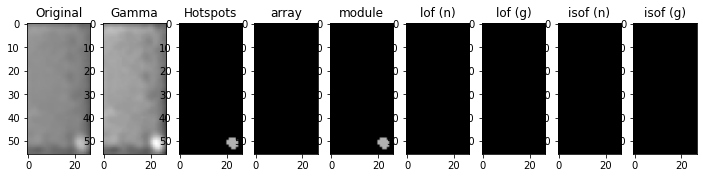

[-0.9708793  -2.52383006 -0.99354792 -1.0201765  -6.69976196 -1.02875732
 -1.79704665 -0.97954764 -1.00192413 -1.90656195]
[-2.30567765]
[-0.44651153 -0.69152192 -0.43597446 -0.5144542  -0.8168504  -0.45142368
 -0.62331395 -0.44921527 -0.46353131 -0.63356431]
[-0.76113553]
[-0.96790374 -1.08488146 -0.97481458 -1.01530297 -4.03989311 -1.00965043
 -1.02627059 -1.06264524 -1.02787347 -0.98196137]
[-2.30567765]
[-0.4364771  -0.48862053 -0.439863   -0.43897296 -0.75006971 -0.45184256
 -0.46232956 -0.47977313 -0.46763597 -0.46246881]
[-0.76113553]
5151.jpg Single-Hotspot [6.39260179]


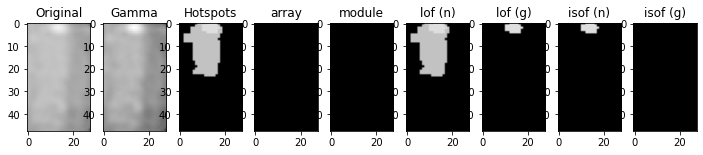

[-1.00544717 -0.97904907 -1.04023796 -1.43735311 -1.02371205 -0.98059401
 -0.96402643 -0.99974464 -1.63017183 -1.14370509]
[-2.09404644]
[-0.43852235 -0.4511314  -0.47146754 -0.56571008 -0.46211648 -0.43743342
 -0.42721885 -0.43320444 -0.60098724 -0.51175706]
[-0.71880929]
[-1.03495122 -1.00591927 -1.01568599 -2.87958437 -1.00576089 -0.9868253
 -1.         -1.03569366 -1.25912542 -1.02150286]
[-2.09404644]
[-0.42158673 -0.47636567 -0.45545658 -0.75603232 -0.44561819 -0.43628774
 -0.45075648 -0.46979507 -0.5690057  -0.46097028]
[-0.71880929]
1309.jpg Single-Hotspot [3.92686926]


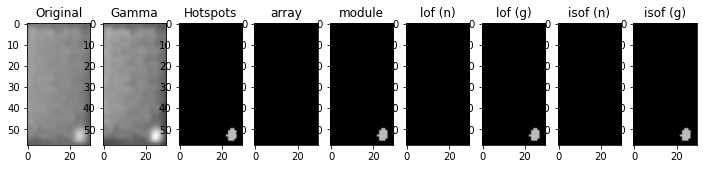

[-1.06898591 -1.36072879 -3.94490976 -1.00248109 -1.05823219 -1.
 -1.0082828  -0.9994928  -1.61722896 -0.989361  ]
[-2.20387359]
[-0.45940486 -0.5444203  -0.75610845 -0.47613332 -0.53335101 -0.43534455
 -0.46479747 -0.47583637 -0.65700884 -0.45181971]
[-0.74077472]
[-0.99722797 -1.51192886 -2.97215735 -1.00686026 -0.99890248 -0.9962869
 -1.04428743 -1.03533802 -1.18608605 -1.03409635]
[-2.20387359]
[-0.44920347 -0.60026222 -0.76349964 -0.44970861 -0.46238444 -0.43790664
 -0.46532606 -0.47958488 -0.55417401 -0.47690858]
[-0.74077472]
4700.jpg Multi-Hotspots [5.05677453]


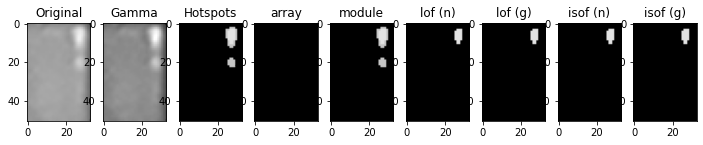

[-1.00735297 -1.03689256 -1.37672224 -1.04549179 -2.47065094 -0.9926696
 -1.01152792 -1.17195483 -1.06776183 -1.03689256]
[-2.13603893]
[-0.43030412 -0.49188552 -0.58981054 -0.45266631 -0.69375442 -0.45549137
 -0.48634906 -0.55466766 -0.46730171 -0.49188552]
[-0.72720779]
[-0.97398984 -1.03819375 -1.10886114 -0.96108414 -1.94538014 -0.97700351
 -1.06793337 -1.03267705 -1.02206474 -1.03819375]
[-2.13603893]
[-0.44227857 -0.46219341 -0.52350362 -0.43149477 -0.65645613 -0.44201729
 -0.55166735 -0.49087751 -0.4300888  -0.46219341]
[-0.72720779]
2195.jpg Normal [4.32552604]


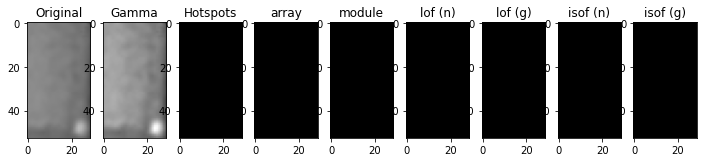

[-1.05327736 -1.73921959 -1.00129258 -0.95991695 -0.99231697 -2.2121426
 -1.03322051 -0.96992801 -1.00473709 -0.99231697]
[-2.2115474]
[-0.45577138 -0.67816471 -0.50391083 -0.43634149 -0.4873018  -0.73308567
 -0.46467007 -0.50238975 -0.53161877 -0.4873018 ]
[-0.74230948]
[-1.04624803 -1.00657662 -1.06500772 -1.00319029 -1.04686806 -1.10694968
 -1.03642824 -0.997966   -0.99975132 -1.05152592]
[-2.2115474]
[-0.43793958 -0.53379097 -0.51516011 -0.46214716 -0.5155323  -0.55625397
 -0.45728638 -0.50369249 -0.50254432 -0.51605989]
[-0.74230948]
5017.jpg Multi-Hotspots [5.14691978]


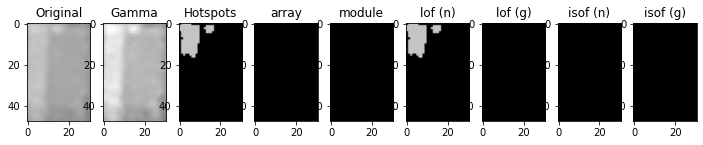

[-1.05744826 -1.06032171 -1.70469111 -3.16735397 -3.04176047 -1.21427508
 -0.97345766 -1.03297695 -2.45907608 -1.24554556]
[-2.20387359]
[-0.48572392 -0.52091456 -0.60467026 -0.74527646 -0.73930987 -0.51759386
 -0.42648923 -0.47763781 -0.69658998 -0.51904078]
[-0.74077472]
[-1.14379668 -1.01012136 -1.78516731 -2.92481172 -2.37803372 -1.34215017
 -1.         -1.14332689 -2.42537214 -1.36928742]
[-2.20387359]
[-0.50663105 -0.46637761 -0.60703863 -0.74655552 -0.74409032 -0.55460479
 -0.43555748 -0.49426579 -0.69376994 -0.56129507]
[-0.74077472]
1270.jpg Single-Hotspot [5.05677453]


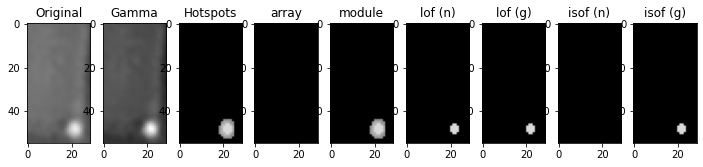

[-1.01202507 -2.16007227 -1.11685667 -1.87786645 -1.03604133 -1.00895771
 -1.00060016 -5.01149617 -1.50439604 -1.        ]
[-2.42423506]
[-0.48162093 -0.6376643  -0.51951325 -0.64598872 -0.51117642 -0.46493169
 -0.4387117  -0.76444533 -0.54378952 -0.47253662]
[-0.78484701]
[-0.99220855 -2.30731083 -1.36645421 -1.31890522 -1.28283941 -0.99171357
 -1.01522988 -4.30028892 -1.64901691 -0.99960081]
[-2.42423506]
[-0.47722595 -0.65996636 -0.53341125 -0.55396779 -0.53619721 -0.48545014
 -0.4938939  -0.72269975 -0.59819204 -0.46585448]
[-0.78484701]
2425.jpg Single-Hotspot [8.39914459]


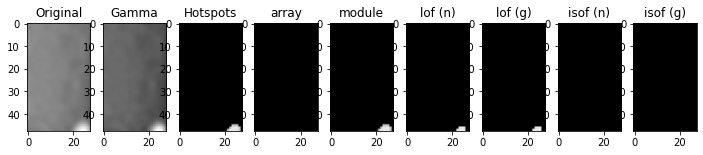

[-1.0235379  -1.0235379  -1.41628135 -0.98508468 -1.66672402 -1.03187671
 -1.01251263 -2.42338569 -1.00308594 -0.9746143 ]
[-2.19250165]
[-0.49969489 -0.49969489 -0.64799478 -0.44256473 -0.70316364 -0.46189113
 -0.44813186 -0.7582639  -0.45891568 -0.44468073]
[-0.73850033]
[-1.06701037 -1.06701037 -1.4105935  -0.99145756 -1.68191593 -1.03974732
 -1.02041787 -2.49009535 -0.99363943 -0.99760186]
[-2.19250165]
[-0.50612981 -0.50612981 -0.64686637 -0.46313425 -0.69228129 -0.47484825
 -0.45137903 -0.75867064 -0.47083841 -0.4464179 ]
[-0.73850033]
3672.jpg Single-Hotspot [4.92608216]


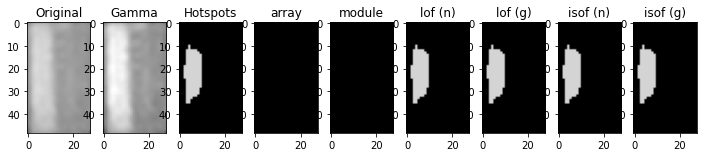

[-2.78054116 -1.06240895 -0.98136488 -1.28357127 -2.22697998 -1.12254182
 -3.85115563 -1.61856221 -0.99211622 -0.98876895]
[-2.38974837]
[-0.72424083 -0.48151237 -0.44109822 -0.52964006 -0.70441518 -0.52253131
 -0.78435427 -0.61199669 -0.4672442  -0.45833736]
[-0.77794967]
[-2.69057049 -1.14687131 -1.01844185 -1.01366777 -2.23918585 -1.25947301
 -3.37376377 -1.72057182 -1.03136185 -0.993492  ]
[-2.38974837]
[-0.73531903 -0.52524153 -0.46468096 -0.51518    -0.68433392 -0.56129789
 -0.76289526 -0.64267458 -0.49442073 -0.47732274]
[-0.77794967]
320.jpg Single-Hotspot [7.75797486]


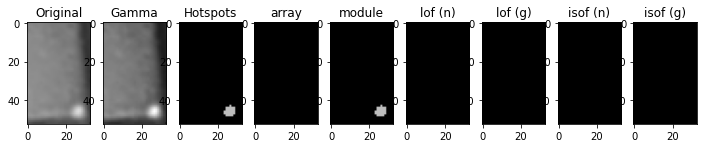

[-1.         -1.07335738 -3.04215914 -0.98377419 -1.43973762 -1.03187671
 -1.         -0.98545536 -1.0425352  -3.16983929]
[-2.19250165]
[-0.4359144  -0.49546417 -0.77801185 -0.4527561  -0.56268738 -0.46189113
 -0.45220853 -0.50596876 -0.45270228 -0.71879856]
[-0.73850033]
[-0.99216877 -1.28521573 -1.84849547 -1.01210937 -1.77112137 -0.99332231
 -0.99947742 -1.04419322 -0.98673153 -3.20507548]
[-2.19250165]
[-0.4576119  -0.53444802 -0.70599868 -0.47660908 -0.61185083 -0.45271161
 -0.45945361 -0.50106052 -0.43210932 -0.71348991]
[-0.73850033]
899.jpg Single-Hotspot [4.92608216]


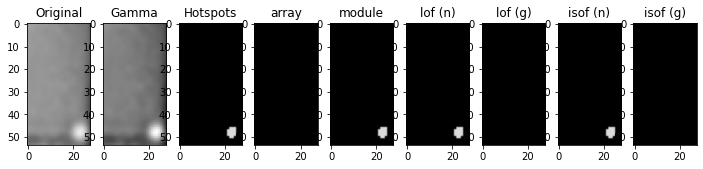

[-1.0056559  -1.04715851 -1.02286322 -0.98380458 -1.75491545 -1.
 -1.00642817 -0.98585862 -1.90858913 -1.        ]
[-2.27146111]
[-0.49529036 -0.50993533 -0.45382208 -0.45393191 -0.65690829 -0.46092126
 -0.45007228 -0.4708895  -0.68703098 -0.46968761]
[-0.75429222]
[-1.00883953 -1.6592162  -0.99917939 -1.0058291  -3.7711185  -0.98567644
 -1.02476349 -0.99623301 -3.98190256 -1.11692512]
[-2.27146111]
[-0.45442846 -0.65376431 -0.46678164 -0.46668846 -0.7525359  -0.45410986
 -0.47423404 -0.45938431 -0.75969795 -0.52885061]
[-0.75429222]
737.jpg Normal [5.90828053]


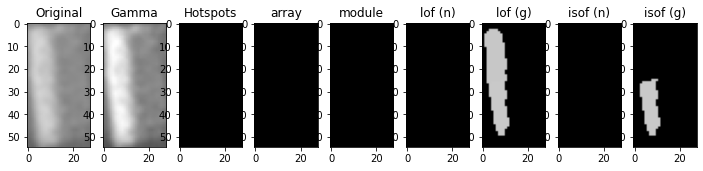

[-1.00582785 -6.62133933 -1.06736349 -1.10190311 -1.38488915 -0.97818143
 -1.0366043  -1.68731877 -3.50883077 -0.98075122]
[-2.23087184]
[-0.44714047 -0.80021284 -0.44366949 -0.5094926  -0.59280232 -0.41642753
 -0.47858691 -0.59721804 -0.76319739 -0.48550489]
[-0.74617437]
[-1.03607079 -6.18356381 -1.0110264  -1.1513553  -1.09866087 -1.04055389
 -0.99844088 -1.75699438 -2.96059037 -1.01468703]
[-2.23087184]
[-0.43573936 -0.7748599  -0.45547511 -0.54425556 -0.54257274 -0.43650319
 -0.47282771 -0.61357748 -0.731555   -0.49674778]
[-0.74617437]
4655.jpg Single-Hotspot [5.38110963]


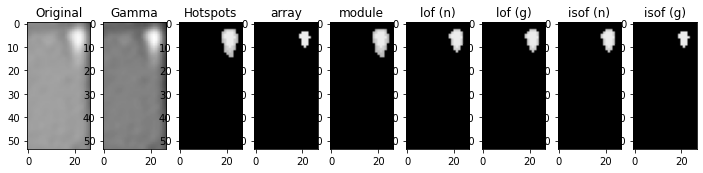

[-1.00319278 -1.6561627  -1.05316327 -1.50773303 -1.01906651 -1.04185356
 -1.00874364 -1.02565841 -0.97054412 -1.02009024]
[-2.22300872]
[-0.44957079 -0.68276689 -0.48185407 -0.64196336 -0.46338344 -0.44883191
 -0.49626493 -0.47726731 -0.51089077 -0.44498858]
[-0.74460174]
[-0.99227511 -1.220665   -0.98683427 -1.14327562 -1.02187234 -0.94051101
 -1.08512012 -0.99666063 -1.02272278 -0.97962971]
[-2.22300872]
[-0.43360815 -0.58471059 -0.45244943 -0.57477156 -0.44097672 -0.42421172
 -0.50377108 -0.46925218 -0.50933228 -0.44488236]
[-0.74460174]
1991.jpg Normal [5.28455857]


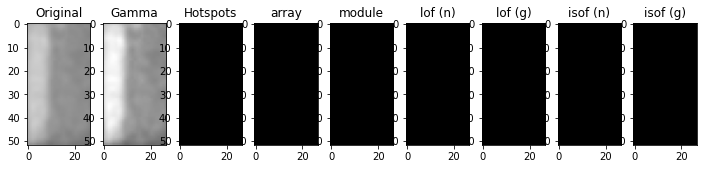

[-1.04240497 -0.953101   -2.04110504 -1.04293622 -0.98842583 -1.0741759
 -1.19370947 -0.99880622 -0.99883771 -1.38632897]
[-2.22838953]
[-0.51579124 -0.43853752 -0.68040648 -0.46498103 -0.48519326 -0.52382998
 -0.55433399 -0.5003377  -0.46467067 -0.58824608]
[-0.74567791]
[-1.02656455 -1.0069988  -1.58555872 -1.03633553 -1.04307631 -1.01643306
 -1.00983    -0.98079096 -1.02737556 -1.11875112]
[-2.22838953]
[-0.46180345 -0.45751928 -0.63955958 -0.4342257  -0.54909265 -0.46776595
 -0.4826286  -0.44427365 -0.44258208 -0.54460535]
[-0.74567791]
2078.jpg Single-Hotspot [5.35044037]


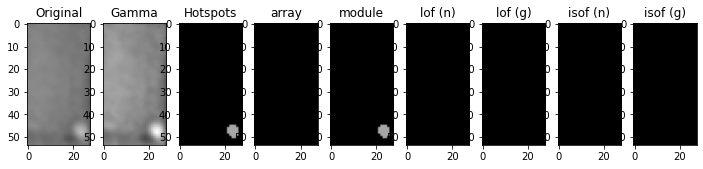

[-0.95568957 -1.64467118 -1.03451911 -1.64467118 -1.00002607 -1.00636752
 -1.02965312 -0.99029663 -0.97698464 -0.99029663]
[-2.25995997]
[-0.41138631 -0.62843641 -0.4296351  -0.62843641 -0.51181082 -0.5224777
 -0.5462695  -0.41912834 -0.42648497 -0.41912834]
[-0.75199199]
[-1.05130924 -1.12780242 -1.04988841 -1.16833709 -0.99284844 -1.14765445
 -0.99836717 -1.04629927 -0.97084198 -1.04629927]
[-2.25995997]
[-0.45229852 -0.56348628 -0.43284509 -0.57147601 -0.49120165 -0.47723332
 -0.51018747 -0.44270743 -0.44167985 -0.44270743]
[-0.75199199]
190.jpg Normal [5.75386899]


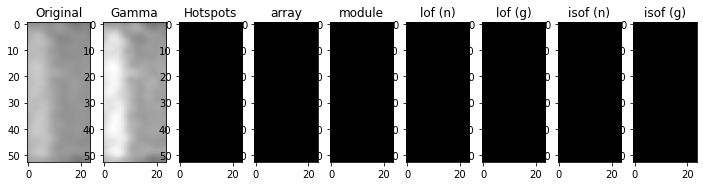

In [271]:
for n, k in enumerate(list(thermal_img_files)):    
    # -- module label --
    l = module_labels[n]
    if l == -1:
        pass
    elif k in list_anomaly_modules:
    #elif k in list_other_modules: 
        # -- clustering --
        clusters = clustering.TemperatureClusters(
            data_array[l].scaled_temperature_with_index[k], 
            method=clustering_method
        )  
        # -- gamma correction --
        gamma_temperature_each = gamma_correction(
            data_array[l].temperature[k],
            gamma = 2.5
        )
        gamma_temperature_array = gamma_correction(
            data_array[l].temperature[k],
            gamma = gamma,
            x_max = np.max(data_array[l].temperature[k])
        )
        # -- original temperature --
        sliced_data = clusters.get_clusters_data(data_array[l].temperature[k])    
        original_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        # -- scaled temperature --
        sliced_data = clusters.get_clusters_data(
            preprocessing.RobustScaler().fit_transform(gamma_temperature_each)
        )
        scaled_clusters_temperature = np.stack([t.mean(axis=0) for t in sliced_data ])        
        # -- transformed temperature --        
        sliced_data = clusters.get_clusters_data(gamma_temperature_array)    
        gamma_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        transformed_clusters_temperature = array_zscaler[l].transform(gamma_clusters_temperature)
        # -- anomaly detection --    
        hot_pixels_in_array, _ = get_hotspots_in_array(
            transformed_clusters_temperature, thermal_img_files[k], log=False) 
        hot_pixels_in_module, _ = get_hotspots_in_module(
            scaled_clusters_temperature, thermal_img_files[k], log=False)
        hot_pixels_lof_normal, _ = get_hotspots_by_models(
            original_clusters_temperature, scaled_clusters_temperature,
            array_lof_normal[l], thermal_img_files[k], log=False)        
        hot_pixels_isof_normal, _ = get_hotspots_by_models(
            original_clusters_temperature, scaled_clusters_temperature,
            array_isof_normal[l], thermal_img_files[k], log=False)        
        hot_pixels_lof_gamma, _ = get_hotspots_by_models(
            gamma_clusters_temperature, scaled_clusters_temperature,
            array_lof_gamma[l], thermal_img_files[k], log=False)        
        hot_pixels_isof_gamma, _ = get_hotspots_by_models(
            gamma_clusters_temperature, scaled_clusters_temperature,
            array_isof_gamma[l], thermal_img_files[k], log=False)        
        hot_pixels = (
            hot_pixels_in_module
            | hot_pixels_lof_normal
            | hot_pixels_isof_normal
        )
        hot_pixels = remove_useless_clusters(hot_pixels)
        module_type = anomaly_detection.detect_module_type(hot_pixels, clusters)
        # -- save anomaly modules --
        if module_type not in anomaly_modules:
            anomaly_modules[module_type] = [k]
        else:
            anomaly_modules[module_type].append(k)        
        # -- display -- 
        img_clustered = original_clusters_temperature[clusters.labels].reshape(thermal_img_files[k].shape)
        img_hotspots = img_clustered * hot_pixels
        img_hotspots_in_array = img_clustered * hot_pixels_in_array
        img_hotspots_in_module = img_clustered * hot_pixels_in_module
        img_hotspots_lof_normal = img_clustered * hot_pixels_lof_normal
        img_hotspots_isof_normal = img_clustered * hot_pixels_isof_normal
        img_hotspots_lof_gamma = img_clustered * hot_pixels_lof_gamma
        img_hotspots_isof_gamma = img_clustered * hot_pixels_isof_gamma        
        print(k, module_type, scaled_array_mean_temperatures[l])
        display.display_modules({
            "Original": thermal_img_files[k], 
            "Gamma": gamma_correction(thermal_img_files[k], gamma=gamma), 
            "Hotspots": img_hotspots,
            "array": img_hotspots_in_array,
            "module": img_hotspots_in_module,
            "lof (n)": img_hotspots_lof_normal,
            "lof (g)": img_hotspots_lof_gamma,
            "isof (n)": img_hotspots_isof_normal,
            "isof (g)": img_hotspots_isof_gamma,
        })

異常モジュールデータの保存

In [258]:
import json
with open(input_dir_path+"/anomaly_modules.json", "w") as f:
    json.dump(anomaly_modules, f, indent=4, sort_keys=True, separators=(',', ': '))

In [259]:
with open(input_dir_path+"/anomaly_modules.json", "r") as f:
    anomaly_modules = json.load(f)

モジュール可視化

In [260]:
modules = Modules(module_contours)

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


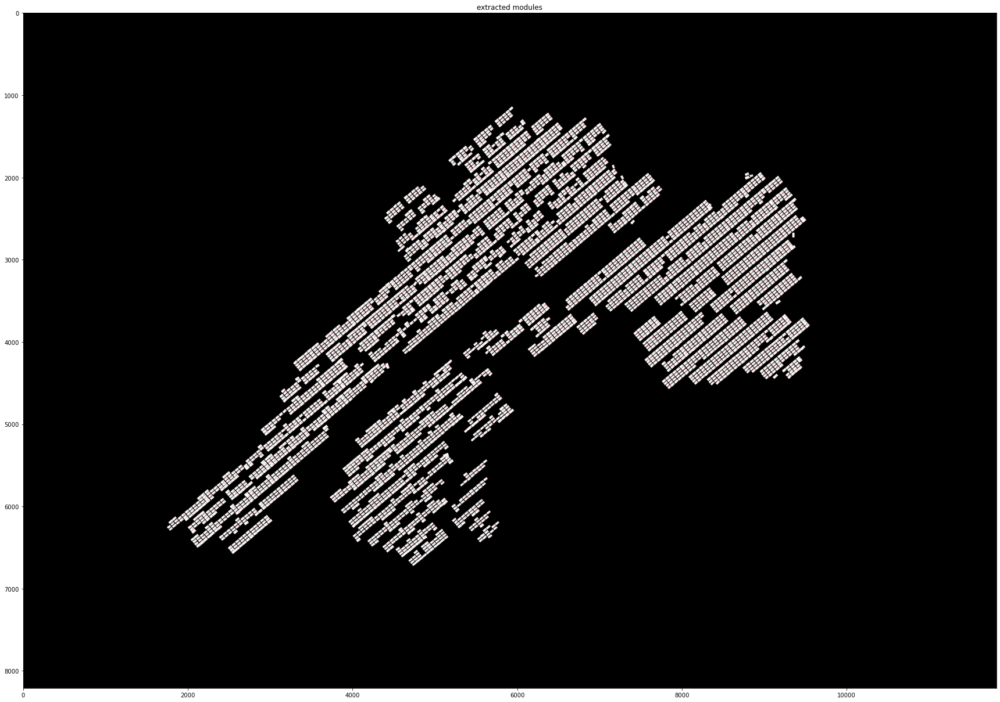

In [261]:
img_con_index = modules.get_img_contours(img_org, index=True)
module_extraction.show_img({"extracted modules":img_con_index},cmap="gray",figsize=(30,30))

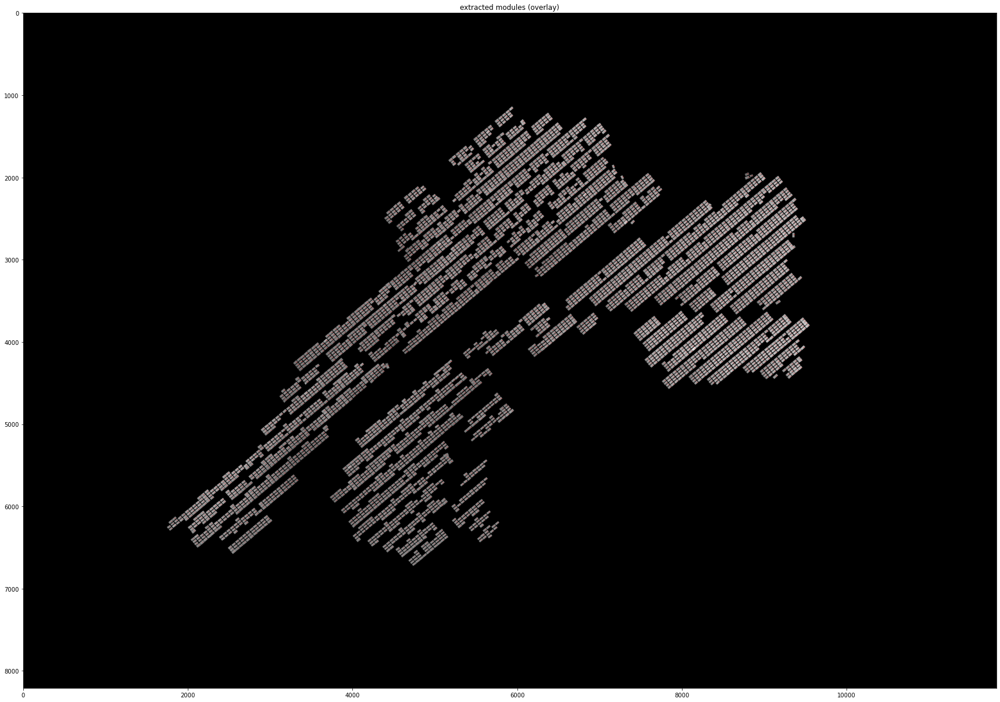

In [262]:
img_con = modules.get_img_contours(img_org, index=False)
img_mask = cv2.bitwise_and(img_org, img_con)
img_mask_index = modules.add_index(img_mask)
module_extraction.show_img({"extracted modules (overlay)":img_mask_index},cmap="gray",figsize=(30,30))

異常モジュール可視化

In [263]:
anomaly_contours = modules.get_anomaly_contours(anomaly_modules)

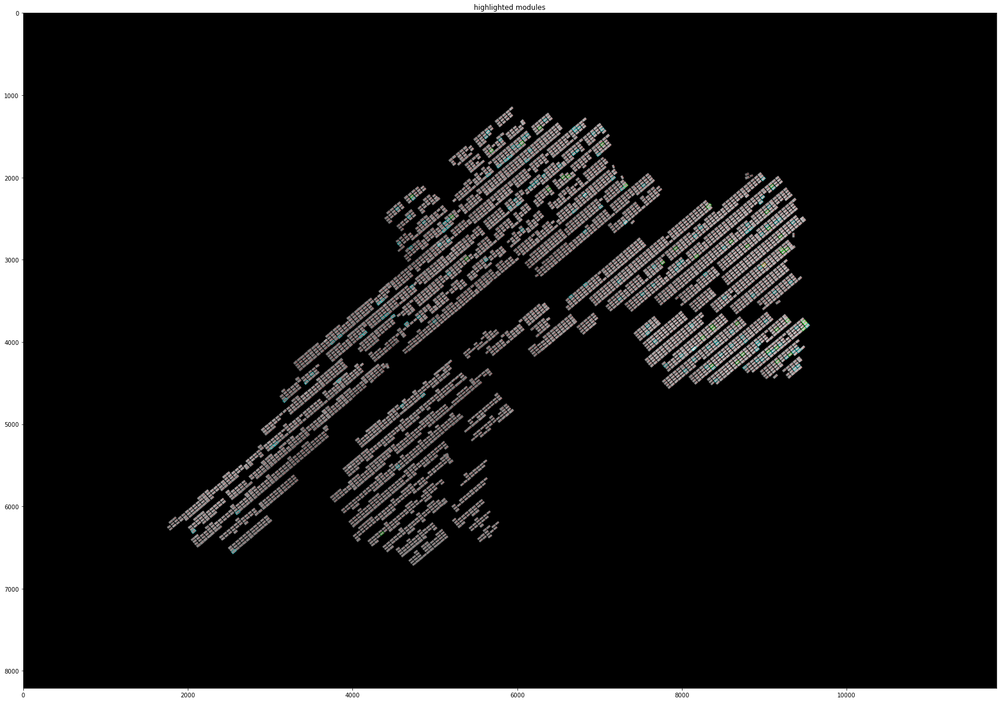

In [264]:
import copy
color_list = {
    "Single-Hotspot": (0,255,255), # aqua
    "Multi-Hotspots": (0,255,0), # green
    "Cluster-Anomaly": (255,255,0), # yellow
    "Module-Anomaly": (255,165,0), # orange
    "String-Anomaly": (238,130,238) # violet
}
img_target_index = copy.deepcopy(img_mask_index)
for k, v in anomaly_contours.items():
    if k == "Normal":
        continue
    else:
        img_target_index = modules.get_img_target_contours(
            img_target_index, v, index=True, color=color_list[k])
module_extraction.show_img(
    {"highlighted modules":img_target_index}, cmap="gray", figsize=(30,30)
)

In [265]:
img_write = cv2.cvtColor(img_target_index, cv2.COLOR_BGR2RGB)
cv2.imwrite(input_dir_path+'/img_target_index.png',img_write)

True

ストリング異常を含めた異常モジュール可視化

In [266]:
if "Module-Anomaly" in anomaly_contours:
    string_anomaly_labels = modules.get_dbscan_labels(anomaly_contours["Module-Anomaly"])
    string_anomaly_modules = np.array(anomaly_modules["Module-Anomaly"])[string_anomaly_labels > 0]
    anomaly_modules["String-Anomaly"] = list(string_anomaly_modules )

In [267]:
anomaly_contours = modules.get_anomaly_contours(anomaly_modules)

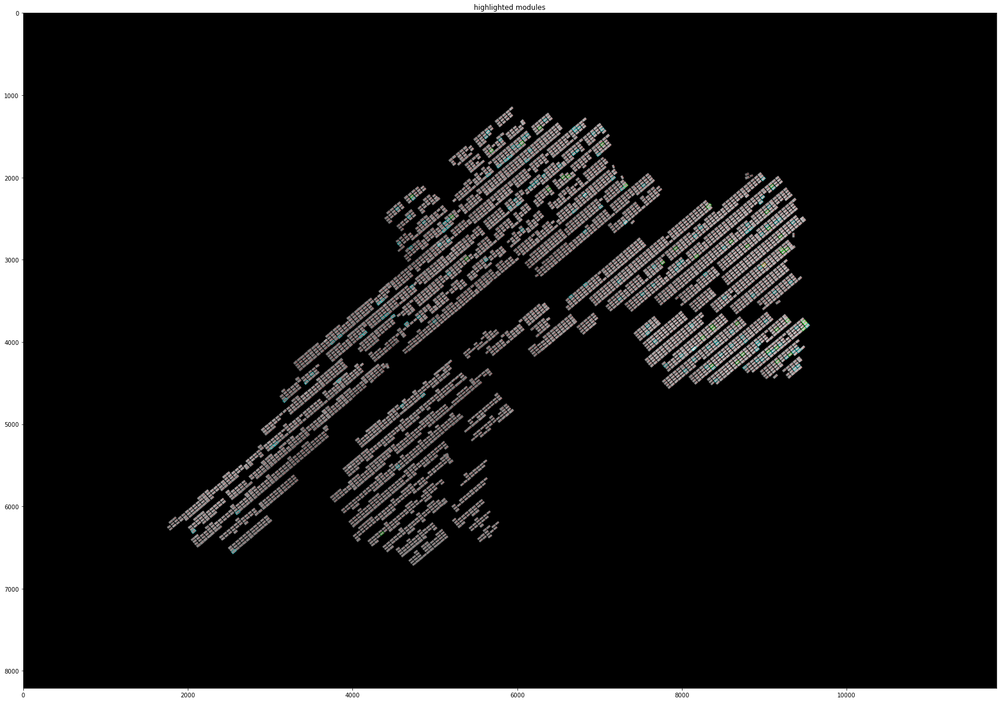

In [268]:
img_target_index = copy.deepcopy(img_mask_index)
for k, v in anomaly_contours.items():
    if k == "Normal":
        continue
    else:
        img_target_index = modules.get_img_target_contours(
            img_target_index, v, index=True, color=color_list[k])
module_extraction.show_img(
    {"highlighted modules":img_target_index}, cmap="gray", figsize=(30,30)
)

In [269]:
img_write = cv2.cvtColor(img_target_index, cv2.COLOR_BGR2RGB)
cv2.imwrite(input_dir_path+'/img_target_w_string_index.png',img_write)

True

In [270]:
with open(input_dir_path+"/anomaly_modules.json", "w") as f:
    json.dump(anomaly_modules, f, indent=4, sort_keys=True, separators=(',', ': '))